## Project - Bank Churn Prediction

### Problem statement

#### Objective 

Given a Bank customer, build a neural network-based classifier that can determine whether they will leave or not in the next 6 months.

#### Context
 
Businesses like banks that provide service have to worry about the problem of 'Churn' i.e. customers leaving and joining another service provider. It is important to understand which aspects of the service influence a customer's decision in this regard. Management can concentrate efforts on the improvement of service, keeping in mind these priorities.
 
#### Data Description 

The case study is from an open-source dataset from Kaggle. The dataset contains 10,000 sample points with 14 distinct features such as CustomerId, CreditScore, Geography, Gender, Age, Tenure, Balance, etc.
Link to the Kaggle project site:https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling
 

#### Data Dictionary:

<ul>
    <li> RowNumber: Row number. </li>
    <li> CustomerId: Unique identification key for different customers. </li>
    <li> Surname: Surname of the customer </li>
    <li> Credit Score: Credit score is a measure of an individual's ability to pay back the borrowed amount. It is the numerical representation of their creditworthiness. A credit score is a 3-digit number that falls in the range of 300-900, 900 being the highest. </li>
    <li> Geography: The country to which the customer belongs. </li>
    <li> Gender: The gender of the customer. </li>
    <li> Age: Age of the customer. </li>
    <li> Tenure: The period of time a customer has been associated with the bank. </li>
    <li> Balance: The account balance (the amount of money deposited in the bank account) of the customer. </li>
    <li> NumOfProducts: How many accounts, bank account affiliated products the person has. </li>
    <li> HasCrCard: Does the customer have a credit card through the bank? </li>
    <li> IsActiveMember: Subjective, but for the concept </li>
    <li> EstimatedSalary: Estimated salary of the customer. </li>
    <li> Exited: Did they leave the bank after all? </li>
</ul>

#### 1. Import the necessary packages

In [1]:
# Load Libraries

import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

#### Read the dataset into dataframes

In [3]:
bank_df = pd.read_csv("bank.csv")
bank_df.head(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [4]:
bank_df.tail(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9990,9991,15798964,Nkemakonam,714,Germany,Male,33,3,35016.60,1,1,0,53667.08,0
9991,9992,15769959,Ajuluchukwu,597,France,Female,53,4,88381.21,1,1,0,69384.71,1
9992,9993,15657105,Chukwualuka,726,Spain,Male,36,2,0.00,1,1,0,195192.40,0
9993,9994,15569266,Rahman,644,France,Male,28,7,155060.41,1,1,0,29179.52,0
9994,9995,15719294,Wood,800,France,Female,29,2,0.00,2,0,0,167773.55,0
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


#### Apply info, shape, describe, and find the number of missing values in the data 

In [5]:
# Check to see the number of records in the dataset
bank_df.shape

(10000, 14)

#### Observation: The dataset comprises of 10000 rows and 14 columns

In [6]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


#### Observations:

<ul>
    <li>All the columns of the dataset have the same number of non-null values</li>
    <li>Some columns are of data type integer and some (categorical features) are of the data type object</li>
    <li>Numerical attributes - RowNumber, CustomerId, CreditScore, Age, Tenure, Balance, EstimatedSalary</li>
    <li>Categorical attributes - Surname, Gender, Geography, NumOfProducts</li>
    <li>Boolean attributes - HasCrCard, IsActiveMember, Exited</li>
</ul>

In [7]:
bank_df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [8]:
# Check to see if data has any missing values
bank_df.isnull().any()

RowNumber          False
CustomerId         False
Surname            False
CreditScore        False
Geography          False
Gender             False
Age                False
Tenure             False
Balance            False
NumOfProducts      False
HasCrCard          False
IsActiveMember     False
EstimatedSalary    False
Exited             False
dtype: bool

#### Observation: No Null Values are present 

In [9]:
# Check the unique values in each column of the dataframe
bank_df.nunique()

RowNumber          10000
CustomerId         10000
Surname             2932
CreditScore          460
Geography              3
Gender                 2
Age                   70
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [10]:
import pandas_profiling
bank_df.profile_report()

In [11]:
# Dropping irrelevant columns 
bank_df = bank_df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)

In [12]:
bank_df.shape

(10000, 11)

In [13]:
print(bank_df.columns)

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')


In [14]:
num_cols = ['CreditScore', 'Age', 'Tenure', 'Balance', 'EstimatedSalary']

Attribute:  CreditScore
[{'mean': 650.5288, 'iqr': 134.0, 'cilo': 649.8962, 'cihi': 654.1038, 'whishi': 850, 'whislo': 383, 'fliers': array([376, 376, 363, 359, 350, 350, 358, 351, 365, 367, 350, 350, 382,
       373, 350]), 'q1': 584.0, 'med': 652.0, 'q3': 718.0}]


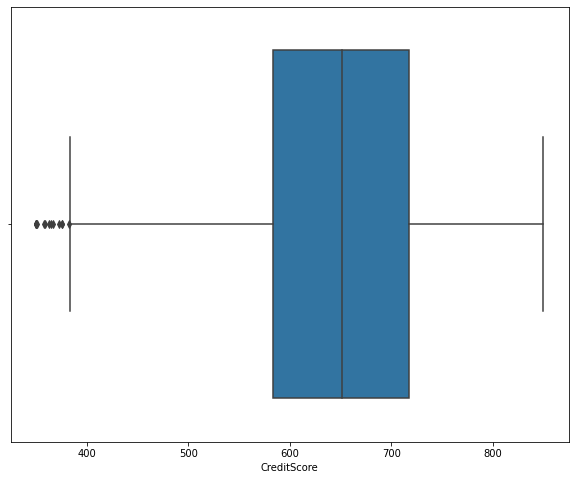

-------------------------------------------------------------------------
Attribute:  Age
[{'mean': 38.9218, 'iqr': 12.0, 'cilo': 36.8116, 'cihi': 37.1884, 'whishi': 62, 'whislo': 18, 'fliers': array([66, 75, 65, 73, 65, 72, 67, 67, 79, 80, 68, 75, 66, 66, 70, 63, 72,
       64, 64, 70, 67, 82, 63, 69, 65, 69, 64, 65, 74, 67, 66, 67, 63, 70,
       71, 72, 67, 74, 76, 66, 63, 66, 68, 67, 63, 71, 66, 69, 73, 65, 66,
       64, 69, 64, 77, 74, 65, 70, 67, 69, 67, 74, 69, 74, 74, 64, 63, 63,
       70, 74, 65, 72, 77, 66, 65, 74, 88, 63, 71, 63, 64, 67, 70, 68, 72,
       71, 66, 75, 67, 73, 69, 76, 63, 85, 67, 74, 76, 66, 69, 66, 72, 63,
       71, 63, 74, 67, 72, 72, 66, 84, 71, 66, 63, 74, 69, 84, 67, 64, 68,
       66, 77, 70, 67, 79, 67, 76, 73, 66, 67, 64, 73, 76, 72, 64, 71, 63,
       70, 65, 66, 65, 80, 66, 63, 63, 63, 63, 66, 74, 69, 63, 64, 76, 75,
       68, 69, 77, 64, 66, 74, 71, 67, 68, 64, 68, 70, 64, 75, 66, 64, 78,
       65, 74, 64, 64, 71, 77, 79, 70, 81, 64, 68, 68, 6

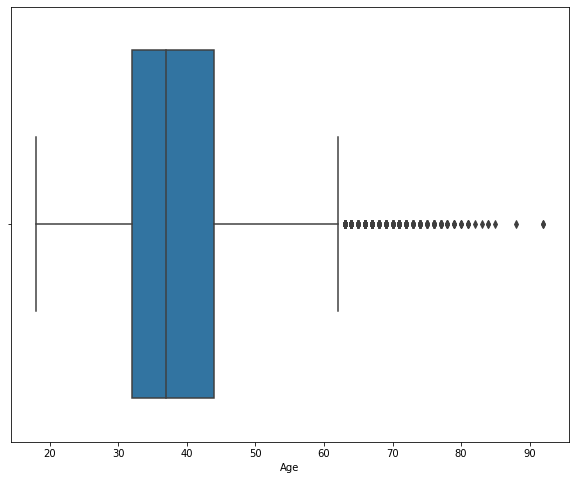

-------------------------------------------------------------------------
Attribute:  Tenure
[{'mean': 5.0128, 'iqr': 4.0, 'cilo': 4.9372, 'cihi': 5.0628, 'whishi': 10, 'whislo': 0, 'fliers': array([], dtype=int64), 'q1': 3.0, 'med': 5.0, 'q3': 7.0}]


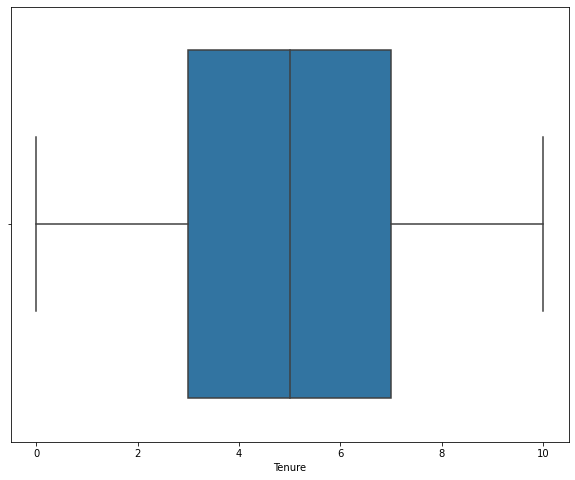

-------------------------------------------------------------------------
Attribute:  Balance
[{'mean': 76485.889288, 'iqr': 127644.24, 'cilo': 95194.52543200001, 'cihi': 99202.554568, 'whishi': 250898.09, 'whislo': 0.0, 'fliers': array([], dtype=float64), 'q1': 0.0, 'med': 97198.54000000001, 'q3': 127644.24}]


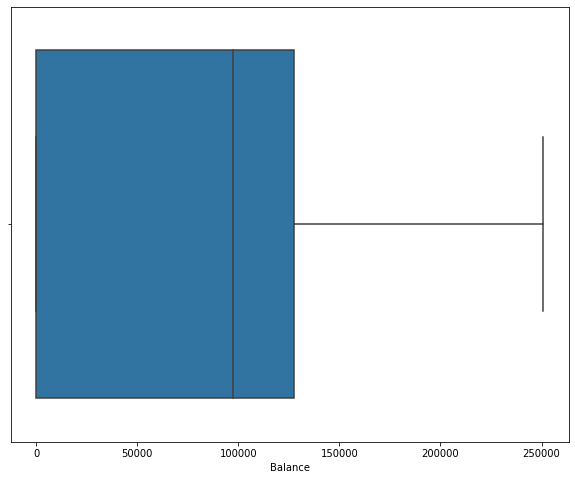

-------------------------------------------------------------------------
Attribute:  EstimatedSalary
[{'mean': 100090.239881, 'iqr': 98386.1375, 'cilo': 98649.25264124999, 'cihi': 101738.57735875, 'whishi': 199992.48, 'whislo': 11.58, 'fliers': array([], dtype=float64), 'q1': 51002.11, 'med': 100193.915, 'q3': 149388.2475}]


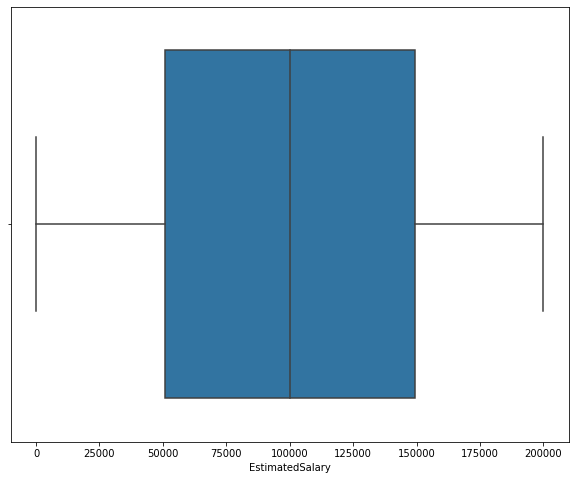

-------------------------------------------------------------------------


In [15]:
from matplotlib.cbook import boxplot_stats 

# Central tendency distribution 
i = 1
for col in num_cols:
    print('Attribute: ',col)
    print(boxplot_stats(bank_df[col]))
    plt.figure(figsize=(10,8))
    sns.boxplot(bank_df[col])
    plt.show();
    i = i+1
    print('-------------------------------------------------------------------------')

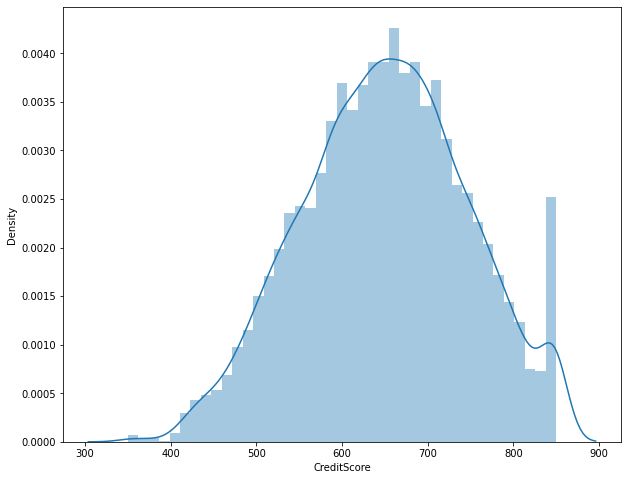

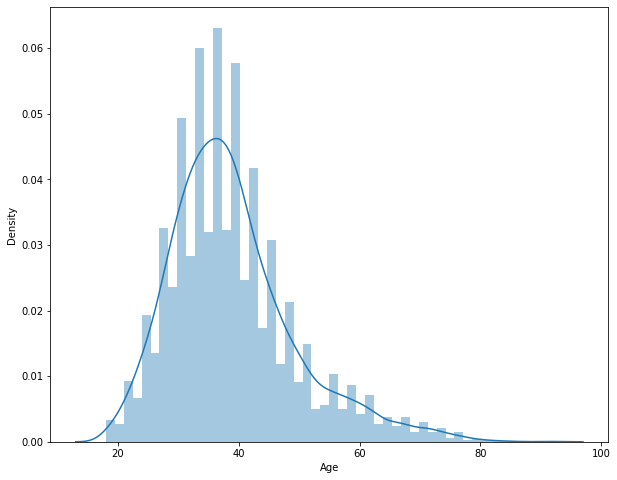

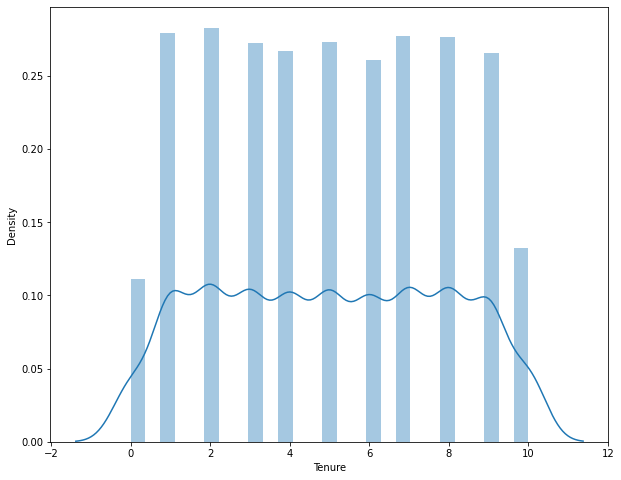

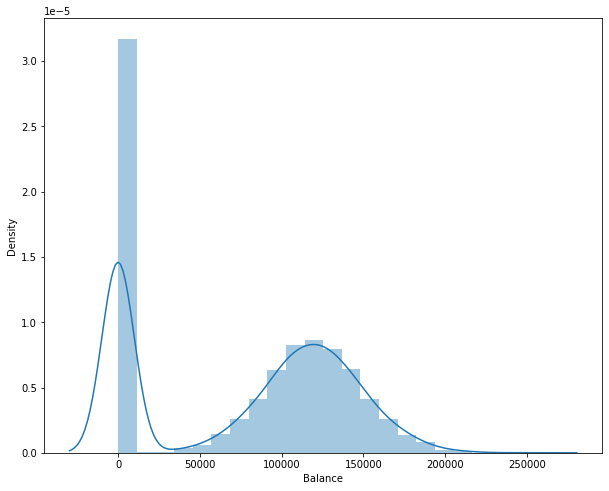

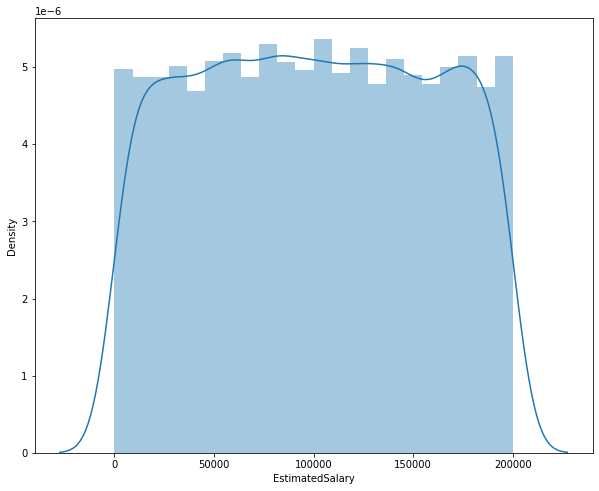

In [16]:
# Skewness distribution
i = 1
for col in num_cols:
    plt.figure(figsize=(10,8))
    sns.distplot(bank_df[col])
    i = i+1

### Encoding categorical variables

In [17]:
#importing the Encoding library
from sklearn.preprocessing import LabelEncoder

labelencoder_X = LabelEncoder()
bank_df['Gender']=labelencoder_X.fit_transform(bank_df['Gender'])
bank_df['Geography']=labelencoder_X.fit_transform(bank_df['Geography'])

In [18]:
bank_df.head(10)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,0,0,42,2,0.00,1,1,1,101348.88,1
1,608,2,0,41,1,83807.86,1,0,1,112542.58,0
2,502,0,0,42,8,159660.80,3,1,0,113931.57,1
3,699,0,0,39,1,0.00,2,0,0,93826.63,0
4,850,2,0,43,2,125510.82,1,1,1,79084.10,0
5,645,2,1,44,8,113755.78,2,1,0,149756.71,1
6,822,0,1,50,7,0.00,2,1,1,10062.80,0
7,376,1,0,29,4,115046.74,4,1,0,119346.88,1
8,501,0,1,44,4,142051.07,2,0,1,74940.50,0
9,684,0,1,27,2,134603.88,1,1,1,71725.73,0


In [19]:
# Analyze the distribution of the dataset
bank_df.describe()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,650.528800,0.746300,0.545700,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,96.653299,0.827529,0.497932,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,350.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,584.000000,0.000000,0.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,652.000000,0.000000,1.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,718.000000,1.000000,1.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,850.000000,2.000000,1.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [20]:
bank_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.0,650.528800,96.653299,350.00,584.00,652.000,718.0000,850.00
Geography,10000.0,0.746300,0.827529,0.00,0.00,0.000,1.0000,2.00
Gender,10000.0,0.545700,0.497932,0.00,0.00,1.000,1.0000,1.00
Age,10000.0,38.921800,10.487806,18.00,32.00,37.000,44.0000,92.00
Tenure,10000.0,5.012800,2.892174,0.00,3.00,5.000,7.0000,10.00
Balance,10000.0,76485.889288,62397.405202,0.00,0.00,97198.540,127644.2400,250898.09
NumOfProducts,10000.0,1.530200,0.581654,1.00,1.00,1.000,2.0000,4.00
HasCrCard,10000.0,0.705500,0.455840,0.00,0.00,1.000,1.0000,1.00
IsActiveMember,10000.0,0.515100,0.499797,0.00,0.00,1.000,1.0000,1.00
EstimatedSalary,10000.0,100090.239881,57510.492818,11.58,51002.11,100193.915,149388.2475,199992.48


### Distribution of Target variable

In [21]:
bank_df.Exited.nunique()

2

In [22]:
bank_df.Exited.value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

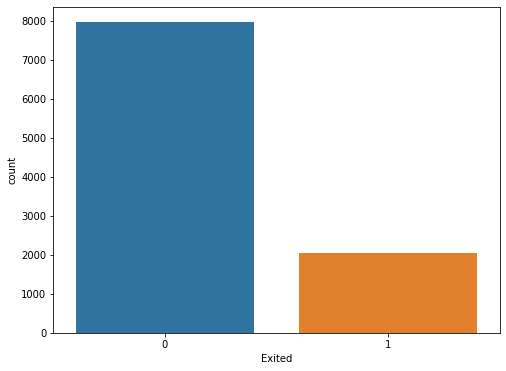

In [23]:
# Plot the distribution of the target attribute
plt.figure(figsize=(8,6))
sns.countplot(bank_df['Exited'],data=bank_df);
plt.show()

### Bivariate Analysis

#### Categorical Independent Variables vs Target Variable

In [24]:
cat_cols = ['Gender', 'Geography', 'NumOfProducts']

Exited         0         1
Gender                    
0       0.749285  0.250715
1       0.835441  0.164559


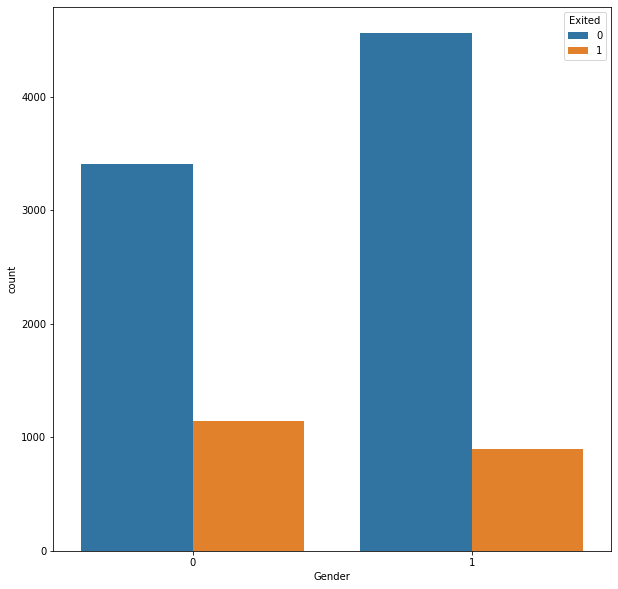

------------------------------------------------------------------------------------------------
Exited            0         1
Geography                    
0          0.838452  0.161548
1          0.675568  0.324432
2          0.833266  0.166734


<Figure size 432x288 with 0 Axes>

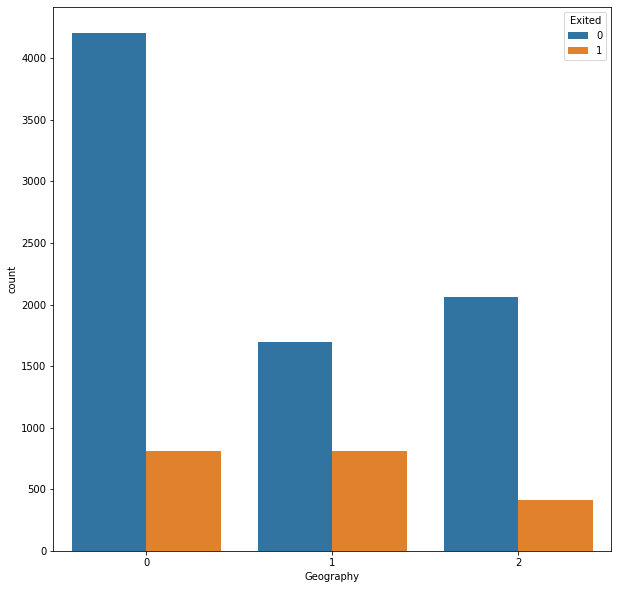

------------------------------------------------------------------------------------------------
Exited                0         1
NumOfProducts                    
1              0.722856  0.277144
2              0.924183  0.075817
3              0.172932  0.827068
4              0.000000  1.000000


<Figure size 432x288 with 0 Axes>

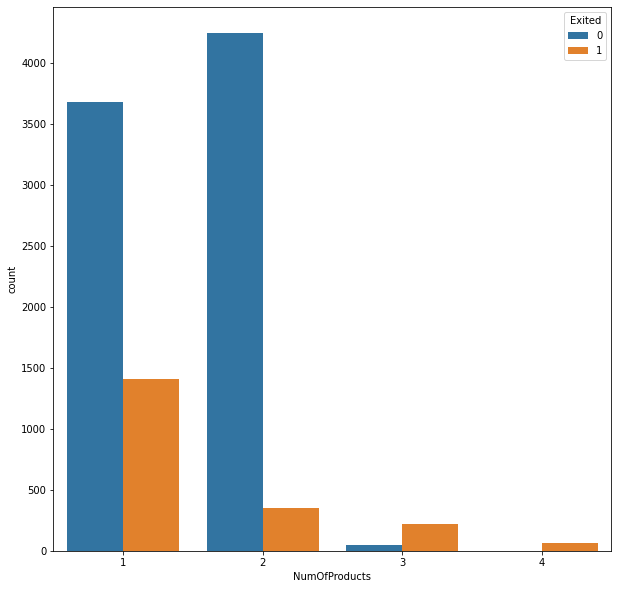

------------------------------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

In [25]:
i = 1
for col in cat_cols:
    plt.figure(figsize=(10,10))
    print(pd.crosstab(bank_df[col],bank_df['Exited'],normalize='index'))
    sns.countplot(x=col, data=bank_df,hue="Exited");
    plt.show()
    plt.tight_layout()
    i = i+1
    print('------------------------------------------------------------------------------------------------')

#### Numerical Independent Variables vs Target Variable

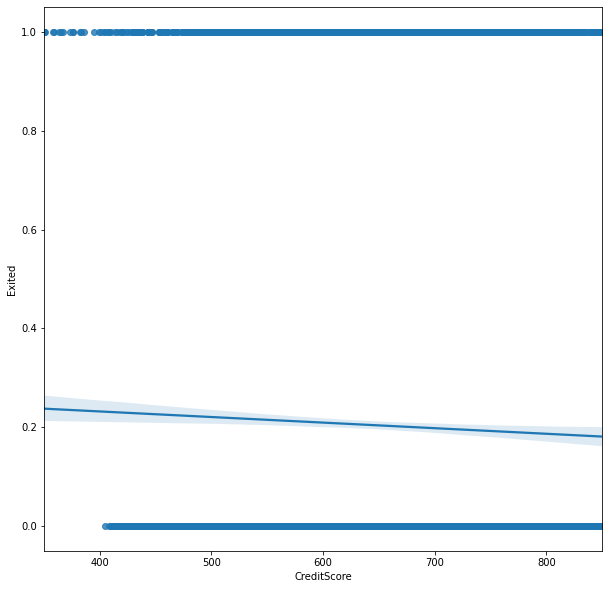

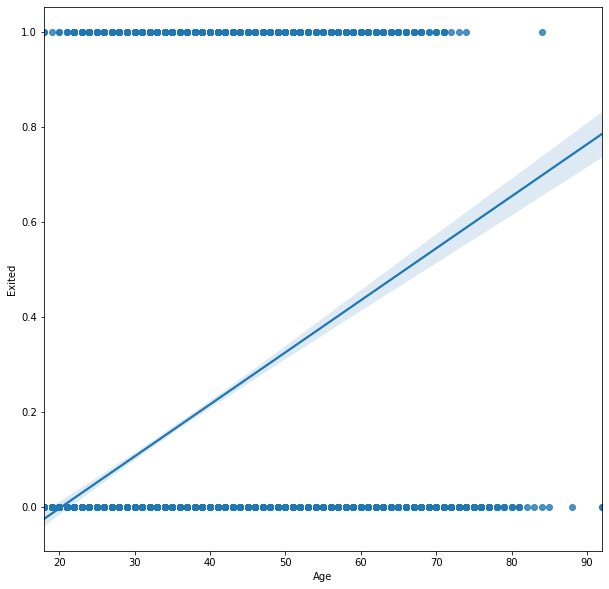

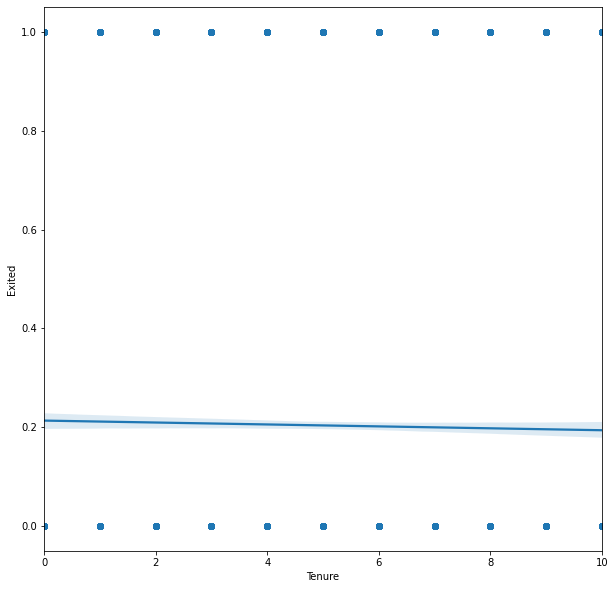

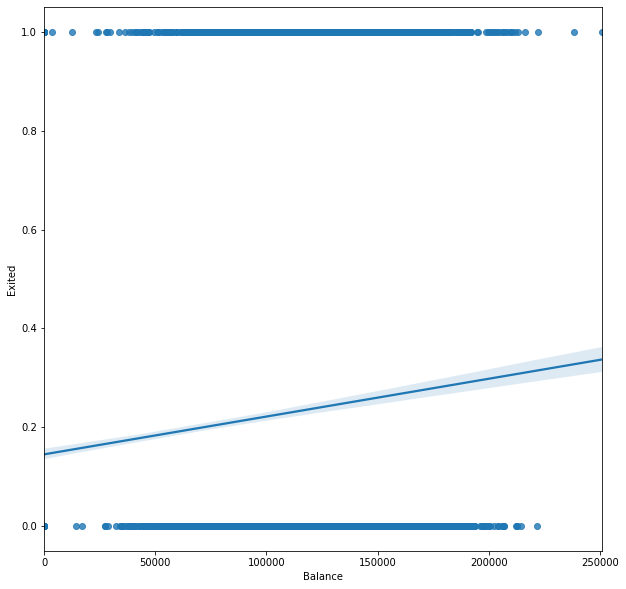

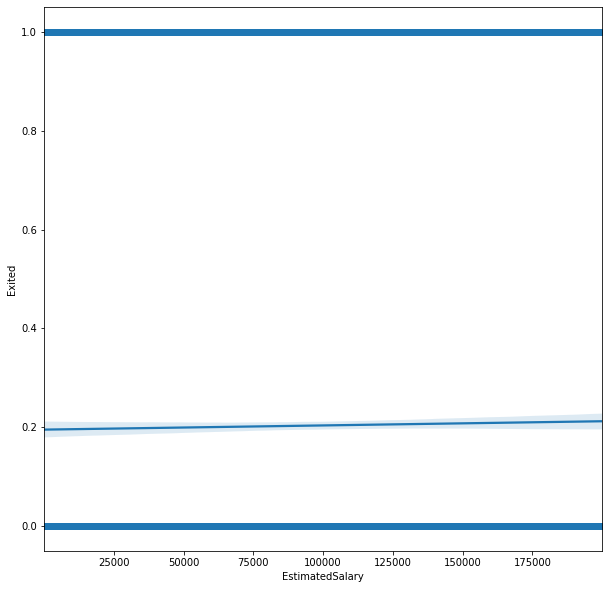

In [26]:
for col in num_cols:
    plt.figure(figsize=(10,10))
    ax = sns.regplot(x=col,y=bank_df['Exited'], data=bank_df);

#### Boolean Independent Variables vs Target Variable

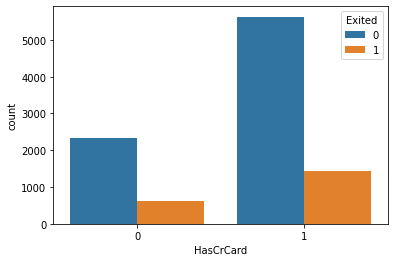

In [27]:
pd.crosstab(bank_df['HasCrCard'],bank_df['Exited'],normalize='index')
sns.countplot(x=bank_df['HasCrCard'], data=bank_df,hue="Exited");

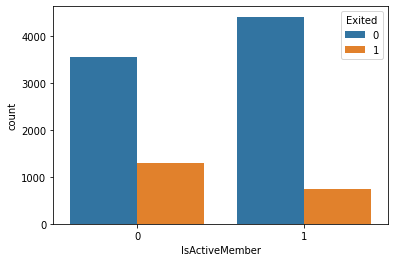

In [28]:
pd.crosstab(bank_df['IsActiveMember'],bank_df['Exited'],normalize='index')
sns.countplot(x=bank_df['IsActiveMember'], data=bank_df,hue="Exited");

### Multivariate analysis

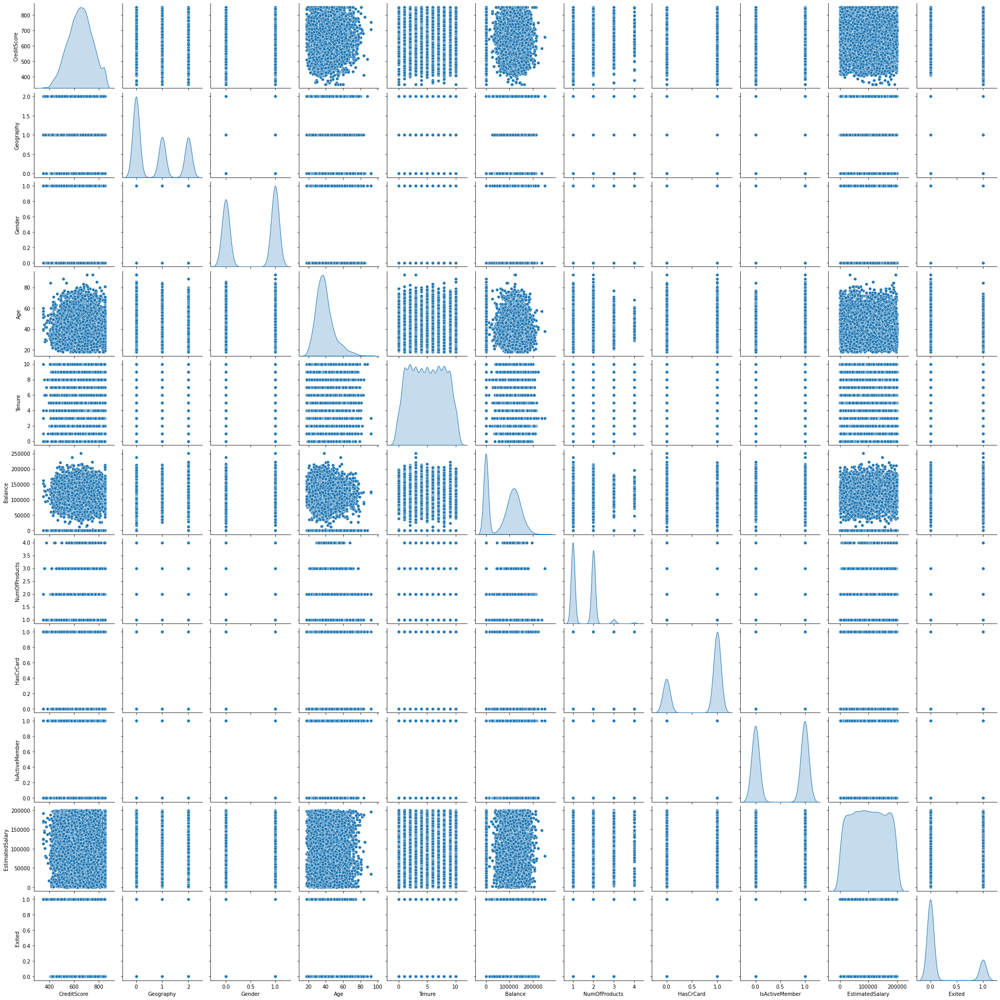

In [29]:
sns.pairplot(data = bank_df,diag_kind ='kde');

In [30]:
# Correlation matrix 
corr = bank_df.corr()
corr

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
CreditScore,1.000000,0.007888,-0.002857,-0.003965,0.000842,0.006268,0.012238,-0.005458,0.025651,-0.001384,-0.027094
Geography,0.007888,1.000000,0.004719,0.022812,0.003739,0.069408,0.003972,-0.008523,0.006724,-0.001369,0.035943
Gender,-0.002857,0.004719,1.000000,-0.027544,0.014733,0.012087,-0.021859,0.005766,0.022544,-0.008112,-0.106512
Age,-0.003965,0.022812,-0.027544,1.000000,-0.009997,0.028308,-0.030680,-0.011721,0.085472,-0.007201,0.285323
Tenure,0.000842,0.003739,0.014733,-0.009997,1.000000,-0.012254,0.013444,0.022583,-0.028362,0.007784,-0.014001
Balance,0.006268,0.069408,0.012087,0.028308,-0.012254,1.000000,-0.304180,-0.014858,-0.010084,0.012797,0.118533
NumOfProducts,0.012238,0.003972,-0.021859,-0.030680,0.013444,-0.304180,1.000000,0.003183,0.009612,0.014204,-0.047820
HasCrCard,-0.005458,-0.008523,0.005766,-0.011721,0.022583,-0.014858,0.003183,1.000000,-0.011866,-0.009933,-0.007138
IsActiveMember,0.025651,0.006724,0.022544,0.085472,-0.028362,-0.010084,0.009612,-0.011866,1.000000,-0.011421,-0.156128
EstimatedSalary,-0.001384,-0.001369,-0.008112,-0.007201,0.007784,0.012797,0.014204,-0.009933,-0.011421,1.000000,0.012097


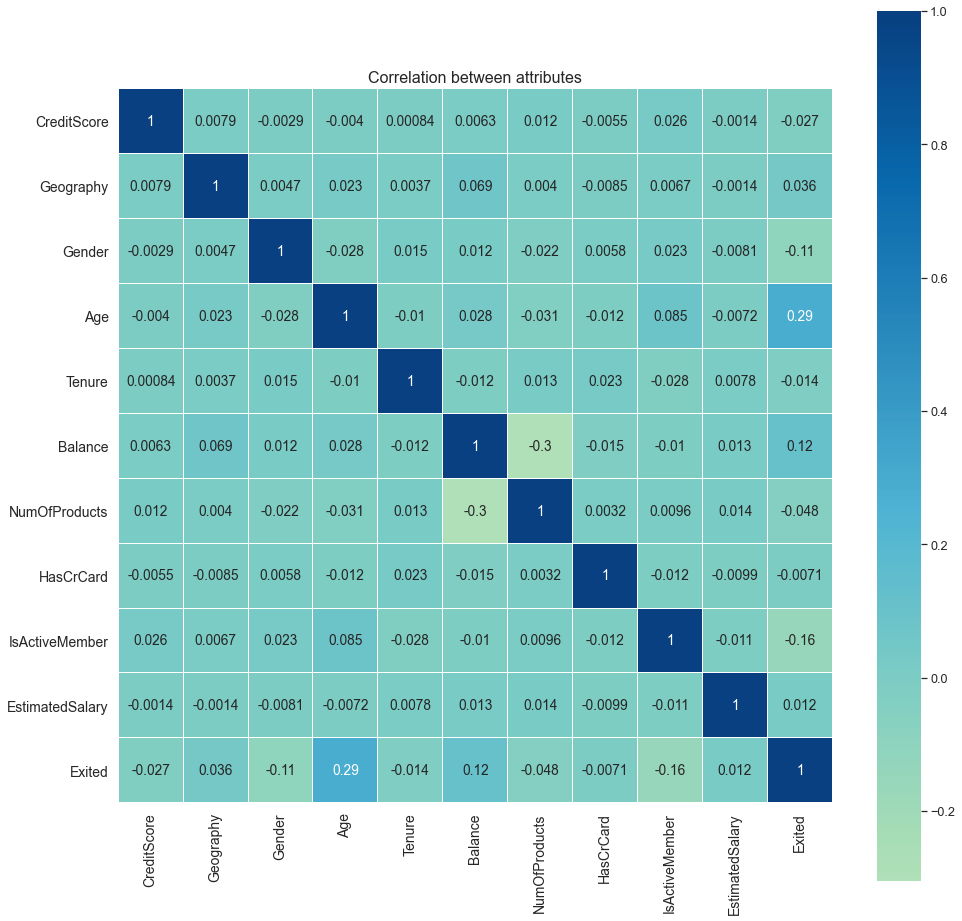

In [31]:
# Heatmap
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(16,16))
sns.heatmap(corr, cmap='GnBu',annot=True,linewidths=0.01,center=0,linecolor='white',square=True)
plt.title('Correlation between attributes',fontsize=16)
ax.tick_params(labelsize=14)

### Model Building

In [32]:
## Define X and Y variables
X = bank_df.drop('Exited', axis=1)
Y = bank_df[['Exited']]

In [33]:
# Convert categorical variables to dummy variables
X = pd.get_dummies(X, drop_first=True)
X

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,0,0,42,2,0.00,1,1,1,101348.88
1,608,2,0,41,1,83807.86,1,0,1,112542.58
2,502,0,0,42,8,159660.80,3,1,0,113931.57
3,699,0,0,39,1,0.00,2,0,0,93826.63
4,850,2,0,43,2,125510.82,1,1,1,79084.10
...,...,...,...,...,...,...,...,...,...,...
9995,771,0,1,39,5,0.00,2,1,0,96270.64
9996,516,0,1,35,10,57369.61,1,1,1,101699.77
9997,709,0,0,36,7,0.00,1,0,1,42085.58
9998,772,1,1,42,3,75075.31,2,1,0,92888.52


### Split into training and test set

In [34]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2,random_state=100)

### Feature Scaling

In [35]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [36]:
# ImportTensorflow Keras library and packages

import sys
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from keras.layers import Dropout

In [37]:
# Initialising the ANN - Defining as a sequence of layers or a Graph
classifier = Sequential()

In [38]:
# Input Layer
classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))
#classifier.add(Dropout(0.1))

In [39]:
# Second hidden layer
classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu'))
#classifier.add(Dropout(0.1))

In [40]:
# Output layer
classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

In [41]:
# Compiling the ANN
classifier.compile(optimizer = 'adam',loss= 'binary_crossentropy',metrics=['accuracy'])

In [42]:
# Fitting the ANN to the Training Set
classifier.fit(X_train, y_train, batch_size = 10, epochs = 100)

Epoch 1/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4832 - accuracy: 0.7966
Epoch 2/100
800/800 [==============================] - 1s 1ms/step - loss: 0.4173 - accuracy: 0.8205
Epoch 3/100
800/800 [==============================] - 1s 1ms/step - loss: 0.4060 - accuracy: 0.8267
Epoch 4/100
800/800 [==============================] - 1s 945us/step - loss: 0.3962 - accuracy: 0.8286
Epoch 5/100
800/800 [==============================] - 1s 872us/step - loss: 0.3877 - accuracy: 0.8307
Epoch 6/100
800/800 [==============================] - 1s 876us/step - loss: 0.3807 - accuracy: 0.8310
Epoch 7/100
800/800 [==============================] - 1s 1ms/step - loss: 0.3756 - accuracy: 0.8444
Epoch 8/100
800/800 [==============================] - 1s 1ms/step - loss: 0.3725 - accuracy: 0.8455: 0s -
Epoch 9/100
800/800 [==============================] - 1s 1ms/step - loss: 0.3689 - accuracy: 0.8481
Epoch 10/100
800/800 [==============================] - 1s 2ms/step - loss: 0.3

800/800 [==============================] - 1s 898us/step - loss: 0.3350 - accuracy: 0.8624
Epoch 80/100
800/800 [==============================] - 1s 821us/step - loss: 0.3356 - accuracy: 0.8615
Epoch 81/100
800/800 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8614
Epoch 82/100
800/800 [==============================] - 1s 815us/step - loss: 0.3344 - accuracy: 0.8616
Epoch 83/100
800/800 [==============================] - 1s 895us/step - loss: 0.3351 - accuracy: 0.86020s - loss:
Epoch 84/100
800/800 [==============================] - 1s 860us/step - loss: 0.3353 - accuracy: 0.8619
Epoch 85/100
800/800 [==============================] - 1s 855us/step - loss: 0.3344 - accuracy: 0.8625
Epoch 86/100
800/800 [==============================] - 1s 796us/step - loss: 0.3357 - accuracy: 0.8631
Epoch 87/100
800/800 [==============================] - 1s 797us/step - loss: 0.3353 - accuracy: 0.8624
Epoch 88/100
800/800 [==============================] - 1s 793us/step

In [43]:
loss, acc = classifier.evaluate(X_test, y_test, verbose=0)
print('Accuracy: %.3f'  % acc)
print('Loss: %.3f' % loss)

Accuracy: 0.854
Loss: 0.358


In [44]:
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)

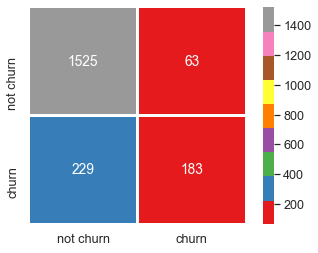

In [45]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix,annot=True,fmt = 'd',square = True,
 xticklabels=['not churn','churn'],
 yticklabels=['not churn','churn'],
 linewidths = 2,linecolor = 'w',cmap = 'Set1')
plt.subplots_adjust(wspace = .3,hspace = .3)

In [46]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1588
           1       0.74      0.44      0.56       412

    accuracy                           0.85      2000
   macro avg       0.81      0.70      0.73      2000
weighted avg       0.84      0.85      0.84      2000



#### The accuracy of the test set is 85%. Hence we can conclude that the model is quite stable and accurate as it had the same amount of accuracy for the test set and training sets.

### Tuning the ANN

In [47]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.layers import Dense, Input, Dropout
from keras.models import Sequential
from keras.layers import Dense


def build_classifier(optimizer):
     classifier = Sequential()
     classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))
     classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu'))
     classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
     classifier.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])
     return classifier

classifier = KerasClassifier(build_fn = build_classifier)
parameters = {'batch_size': [16,32,64], 'epochs': [100, 500], 'optimizer': ['adam', 'rmsprop','SGD']}
grid_search = GridSearchCV(estimator = classifier,param_grid = parameters, scoring = 'accuracy',cv = 10)
grid_result = grid_search.fit(X_train, y_train)
best_parameters = grid_result.best_params_
best_accuracy = grid_result.best_score_

Epoch 1/100
450/450 [==============================] - 0s 851us/step - loss: 0.5261 - accuracy: 0.7960
Epoch 2/100
450/450 [==============================] - 0s 870us/step - loss: 0.4372 - accuracy: 0.79620s - loss: 0.4424 - accuracy: 0.
Epoch 3/100
450/450 [==============================] - 0s 763us/step - loss: 0.4348 - accuracy: 0.7962
Epoch 4/100
450/450 [==============================] - 0s 951us/step - loss: 0.4333 - accuracy: 0.79620s - loss: 0.4265 - accuracy: 
Epoch 5/100
450/450 [==============================] - 0s 934us/step - loss: 0.4322 - accuracy: 0.7962
Epoch 6/100
450/450 [==============================] - 0s 789us/step - loss: 0.4310 - accuracy: 0.7962
Epoch 7/100
450/450 [==============================] - 0s 825us/step - loss: 0.4303 - accuracy: 0.7962
Epoch 8/100
450/450 [==============================] - 0s 783us/step - loss: 0.4284 - accuracy: 0.7982
Epoch 9/100
450/450 [==============================] - 0s 771us/step - loss: 0.4257 - accuracy: 0.8164
Epoch 10/10

450/450 [==============================] - 1s 2ms/step - loss: 0.4006 - accuracy: 0.8357
Epoch 80/100
450/450 [==============================] - 1s 1ms/step - loss: 0.4009 - accuracy: 0.8375
Epoch 81/100
450/450 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8361
Epoch 82/100
450/450 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8368
Epoch 83/100
450/450 [==============================] - 0s 884us/step - loss: 0.4007 - accuracy: 0.8374
Epoch 84/100
450/450 [==============================] - 0s 811us/step - loss: 0.4005 - accuracy: 0.8371
Epoch 85/100
450/450 [==============================] - 0s 780us/step - loss: 0.4008 - accuracy: 0.8371
Epoch 86/100
450/450 [==============================] - 0s 774us/step - loss: 0.4009 - accuracy: 0.8375
Epoch 87/100
450/450 [==============================] - 0s 809us/step - loss: 0.4008 - accuracy: 0.83610s - loss: 0.4000 - accura
Epoch 88/100
450/450 [==============================] - 0s 

450/450 [==============================] - 0s 1ms/step - loss: 0.3318 - accuracy: 0.8662
Epoch 52/100
450/450 [==============================] - 0s 939us/step - loss: 0.3313 - accuracy: 0.8658
Epoch 53/100
450/450 [==============================] - 1s 1ms/step - loss: 0.3311 - accuracy: 0.8656
Epoch 54/100
450/450 [==============================] - 0s 991us/step - loss: 0.3306 - accuracy: 0.8657
Epoch 55/100
450/450 [==============================] - 0s 891us/step - loss: 0.3307 - accuracy: 0.8675
Epoch 56/100
450/450 [==============================] - 0s 890us/step - loss: 0.3306 - accuracy: 0.8650
Epoch 57/100
450/450 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8661
Epoch 58/100
450/450 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8667
Epoch 59/100
450/450 [==============================] - 0s 965us/step - loss: 0.3302 - accuracy: 0.8672
Epoch 60/100
450/450 [==============================] - 0s 1ms/step - loss: 0.3304 - 

450/450 [==============================] - 1s 1ms/step - loss: 0.3488 - accuracy: 0.8582
Epoch 31/100
450/450 [==============================] - 0s 931us/step - loss: 0.3479 - accuracy: 0.8625
Epoch 32/100
450/450 [==============================] - 0s 908us/step - loss: 0.3476 - accuracy: 0.8608
Epoch 33/100
450/450 [==============================] - 0s 870us/step - loss: 0.3471 - accuracy: 0.8593
Epoch 34/100
450/450 [==============================] - 0s 909us/step - loss: 0.3474 - accuracy: 0.8599
Epoch 35/100
450/450 [==============================] - 1s 1ms/step - loss: 0.3467 - accuracy: 0.8612
Epoch 36/100
450/450 [==============================] - 0s 939us/step - loss: 0.3459 - accuracy: 0.8585
Epoch 37/100
450/450 [==============================] - 0s 933us/step - loss: 0.3450 - accuracy: 0.8615
Epoch 38/100
450/450 [==============================] - 0s 873us/step - loss: 0.3451 - accuracy: 0.8596
Epoch 39/100
450/450 [==============================] - 1s 1ms/step - loss: 0.345

Epoch 8/100
450/450 [==============================] - 1s 2ms/step - loss: 0.4292 - accuracy: 0.7940
Epoch 9/100
450/450 [==============================] - 1s 1ms/step - loss: 0.4267 - accuracy: 0.8033
Epoch 10/100
450/450 [==============================] - 0s 837us/step - loss: 0.4248 - accuracy: 0.8178
Epoch 11/100
450/450 [==============================] - 0s 767us/step - loss: 0.4228 - accuracy: 0.8208
Epoch 12/100
450/450 [==============================] - 0s 797us/step - loss: 0.4214 - accuracy: 0.8242
Epoch 13/100
450/450 [==============================] - 0s 827us/step - loss: 0.4200 - accuracy: 0.8258
Epoch 14/100
450/450 [==============================] - 0s 1ms/step - loss: 0.4183 - accuracy: 0.8279
Epoch 15/100
450/450 [==============================] - 0s 956us/step - loss: 0.4172 - accuracy: 0.8283
Epoch 16/100
450/450 [==============================] - 0s 877us/step - loss: 0.4160 - accuracy: 0.8314
Epoch 17/100
450/450 [==============================] - 1s 2ms/step - lo

450/450 [==============================] - 1s 1ms/step - loss: 0.3946 - accuracy: 0.8365
Epoch 88/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3945 - accuracy: 0.8371
Epoch 89/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3945 - accuracy: 0.8369
Epoch 90/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3943 - accuracy: 0.8383
Epoch 91/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3944 - accuracy: 0.8351
Epoch 92/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3942 - accuracy: 0.8367
Epoch 93/100
450/450 [==============================] - 1s 1ms/step - loss: 0.3946 - accuracy: 0.8361
Epoch 94/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3942 - accuracy: 0.8379
Epoch 95/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3943 - accuracy: 0.8378: 0s - loss: 0.385
Epoch 96/100
450/450 [==============================] - 1s 2ms/step - loss: 0

450/450 [==============================] - 0s 836us/step - loss: 0.3403 - accuracy: 0.8631
Epoch 66/100
450/450 [==============================] - 0s 884us/step - loss: 0.3407 - accuracy: 0.8621
Epoch 67/100
450/450 [==============================] - 0s 852us/step - loss: 0.3404 - accuracy: 0.8622
Epoch 68/100
450/450 [==============================] - 0s 848us/step - loss: 0.3396 - accuracy: 0.8629
Epoch 69/100
450/450 [==============================] - 0s 913us/step - loss: 0.3402 - accuracy: 0.8624
Epoch 70/100
450/450 [==============================] - 0s 837us/step - loss: 0.3403 - accuracy: 0.8618
Epoch 71/100
450/450 [==============================] - 0s 854us/step - loss: 0.3402 - accuracy: 0.8615
Epoch 72/100
450/450 [==============================] - 1s 2ms/step - loss: 0.3396 - accuracy: 0.8657
Epoch 73/100
450/450 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8614
Epoch 74/100
450/450 [==============================] - 1s 1ms/step - loss: 0.340

450/450 [==============================] - 0s 859us/step - loss: 0.4029 - accuracy: 0.8356
Epoch 44/100
450/450 [==============================] - 0s 849us/step - loss: 0.4027 - accuracy: 0.8353
Epoch 45/100
450/450 [==============================] - 0s 878us/step - loss: 0.4025 - accuracy: 0.8353
Epoch 46/100
450/450 [==============================] - 0s 847us/step - loss: 0.4027 - accuracy: 0.8367
Epoch 47/100
450/450 [==============================] - 1s 1ms/step - loss: 0.4028 - accuracy: 0.8358
Epoch 48/100
450/450 [==============================] - 0s 877us/step - loss: 0.4024 - accuracy: 0.8364
Epoch 49/100
450/450 [==============================] - 0s 843us/step - loss: 0.4026 - accuracy: 0.8358
Epoch 50/100
450/450 [==============================] - 0s 885us/step - loss: 0.4018 - accuracy: 0.8354
Epoch 51/100
450/450 [==============================] - 0s 847us/step - loss: 0.4020 - accuracy: 0.8361
Epoch 52/100
450/450 [==============================] - 0s 860us/step - loss: 0

450/450 [==============================] - 0s 775us/step - loss: 0.4023 - accuracy: 0.8361
Epoch 21/100
450/450 [==============================] - 0s 750us/step - loss: 0.4016 - accuracy: 0.8372
Epoch 22/100
450/450 [==============================] - 0s 736us/step - loss: 0.4009 - accuracy: 0.8389
Epoch 23/100
450/450 [==============================] - 0s 771us/step - loss: 0.4010 - accuracy: 0.8385
Epoch 24/100
450/450 [==============================] - 0s 748us/step - loss: 0.4001 - accuracy: 0.8375
Epoch 25/100
450/450 [==============================] - 0s 740us/step - loss: 0.4007 - accuracy: 0.8361
Epoch 26/100
450/450 [==============================] - 0s 763us/step - loss: 0.3998 - accuracy: 0.8369
Epoch 27/100
450/450 [==============================] - 0s 732us/step - loss: 0.3992 - accuracy: 0.8389
Epoch 28/100
450/450 [==============================] - 0s 818us/step - loss: 0.3991 - accuracy: 0.8376
Epoch 29/100
450/450 [==============================] - 0s 776us/step - loss:

450/450 [==============================] - 0s 744us/step - loss: 0.3951 - accuracy: 0.8379
Epoch 99/100
450/450 [==============================] - 0s 763us/step - loss: 0.3953 - accuracy: 0.8381
Epoch 100/100
450/450 [==============================] - 0s 731us/step - loss: 0.3952 - accuracy: 0.8390
Epoch 1/100
450/450 [==============================] - 0s 812us/step - loss: 0.5272 - accuracy: 0.7983
Epoch 2/100
450/450 [==============================] - 0s 773us/step - loss: 0.4217 - accuracy: 0.8075
Epoch 3/100
450/450 [==============================] - 0s 807us/step - loss: 0.4053 - accuracy: 0.8160
Epoch 4/100
450/450 [==============================] - 0s 813us/step - loss: 0.3886 - accuracy: 0.8196
Epoch 5/100
450/450 [==============================] - 0s 754us/step - loss: 0.3738 - accuracy: 0.8467
Epoch 6/100
450/450 [==============================] - 0s 754us/step - loss: 0.3634 - accuracy: 0.8564
Epoch 7/100
450/450 [==============================] - 0s 772us/step - loss: 0.357

450/450 [==============================] - 0s 792us/step - loss: 0.3303 - accuracy: 0.8671
Epoch 77/100
450/450 [==============================] - 0s 743us/step - loss: 0.3298 - accuracy: 0.8658
Epoch 78/100
450/450 [==============================] - 0s 741us/step - loss: 0.3297 - accuracy: 0.8664
Epoch 79/100
450/450 [==============================] - 0s 772us/step - loss: 0.3298 - accuracy: 0.8656
Epoch 80/100
450/450 [==============================] - 0s 745us/step - loss: 0.3294 - accuracy: 0.8679
Epoch 81/100
450/450 [==============================] - 0s 761us/step - loss: 0.3298 - accuracy: 0.8664
Epoch 82/100
450/450 [==============================] - 0s 744us/step - loss: 0.3298 - accuracy: 0.8656
Epoch 83/100
450/450 [==============================] - 0s 816us/step - loss: 0.3296 - accuracy: 0.8669
Epoch 84/100
450/450 [==============================] - 1s 1ms/step - loss: 0.3296 - accuracy: 0.8662
Epoch 85/100
450/450 [==============================] - 0s 755us/step - loss: 0

450/450 [==============================] - 0s 758us/step - loss: 0.3979 - accuracy: 0.8354
Epoch 55/100
450/450 [==============================] - 0s 786us/step - loss: 0.3976 - accuracy: 0.8374
Epoch 56/100
450/450 [==============================] - 0s 772us/step - loss: 0.3975 - accuracy: 0.8372
Epoch 57/100
450/450 [==============================] - 0s 764us/step - loss: 0.3973 - accuracy: 0.8367
Epoch 58/100
450/450 [==============================] - 0s 865us/step - loss: 0.3974 - accuracy: 0.8361
Epoch 59/100
450/450 [==============================] - 0s 760us/step - loss: 0.3973 - accuracy: 0.8368
Epoch 60/100
450/450 [==============================] - 0s 757us/step - loss: 0.3969 - accuracy: 0.8372
Epoch 61/100
450/450 [==============================] - 0s 782us/step - loss: 0.3973 - accuracy: 0.8365
Epoch 62/100
450/450 [==============================] - 0s 759us/step - loss: 0.3974 - accuracy: 0.8360
Epoch 63/100
450/450 [==============================] - 0s 751us/step - loss:

450/450 [==============================] - 0s 745us/step - loss: 0.3994 - accuracy: 0.8379
Epoch 33/100
450/450 [==============================] - 0s 757us/step - loss: 0.3990 - accuracy: 0.8371
Epoch 34/100
450/450 [==============================] - 0s 740us/step - loss: 0.3984 - accuracy: 0.8371
Epoch 35/100
450/450 [==============================] - 0s 746us/step - loss: 0.3982 - accuracy: 0.8367
Epoch 36/100
450/450 [==============================] - 0s 780us/step - loss: 0.3982 - accuracy: 0.8369
Epoch 37/100
450/450 [==============================] - 0s 739us/step - loss: 0.3981 - accuracy: 0.8378
Epoch 38/100
450/450 [==============================] - 0s 749us/step - loss: 0.3979 - accuracy: 0.8371
Epoch 39/100
450/450 [==============================] - 0s 795us/step - loss: 0.3975 - accuracy: 0.8375
Epoch 40/100
450/450 [==============================] - 0s 738us/step - loss: 0.3973 - accuracy: 0.8378
Epoch 41/100
450/450 [==============================] - 0s 753us/step - loss:

Epoch 11/100
450/450 [==============================] - 0s 818us/step - loss: 0.4156 - accuracy: 0.83100s - loss: 0.4179 - accuracy
Epoch 12/100
450/450 [==============================] - 0s 810us/step - loss: 0.4143 - accuracy: 0.8315
Epoch 13/100
450/450 [==============================] - 0s 799us/step - loss: 0.4131 - accuracy: 0.8329
Epoch 14/100
450/450 [==============================] - 0s 807us/step - loss: 0.4124 - accuracy: 0.8335
Epoch 15/100
450/450 [==============================] - 0s 786us/step - loss: 0.4115 - accuracy: 0.8339
Epoch 16/100
450/450 [==============================] - 0s 825us/step - loss: 0.4106 - accuracy: 0.8347
Epoch 17/100
450/450 [==============================] - 0s 803us/step - loss: 0.4099 - accuracy: 0.8336
Epoch 18/100
450/450 [==============================] - 0s 802us/step - loss: 0.4091 - accuracy: 0.8350
Epoch 19/100
450/450 [==============================] - 0s 834us/step - loss: 0.4089 - accuracy: 0.8356
Epoch 20/100
450/450 [==============

450/450 [==============================] - 0s 801us/step - loss: 0.3992 - accuracy: 0.8365
Epoch 89/100
450/450 [==============================] - 0s 783us/step - loss: 0.3991 - accuracy: 0.8379
Epoch 90/100
450/450 [==============================] - 0s 791us/step - loss: 0.3988 - accuracy: 0.8364
Epoch 91/100
450/450 [==============================] - 0s 811us/step - loss: 0.3989 - accuracy: 0.8393
Epoch 92/100
450/450 [==============================] - 0s 778us/step - loss: 0.3981 - accuracy: 0.8372
Epoch 93/100
450/450 [==============================] - 0s 824us/step - loss: 0.3987 - accuracy: 0.8381
Epoch 94/100
450/450 [==============================] - 0s 786us/step - loss: 0.3983 - accuracy: 0.8382
Epoch 95/100
450/450 [==============================] - 0s 778us/step - loss: 0.3983 - accuracy: 0.8383
Epoch 96/100
450/450 [==============================] - 0s 824us/step - loss: 0.3978 - accuracy: 0.8382
Epoch 97/100
450/450 [==============================] - 0s 794us/step - loss:

450/450 [==============================] - 0s 795us/step - loss: 0.3902 - accuracy: 0.84170s - loss: 0.3898 - accuracy: 0.
Epoch 67/100
450/450 [==============================] - 0s 805us/step - loss: 0.3901 - accuracy: 0.8421
Epoch 68/100
450/450 [==============================] - 0s 817us/step - loss: 0.3895 - accuracy: 0.8404
Epoch 69/100
450/450 [==============================] - 0s 795us/step - loss: 0.3898 - accuracy: 0.8401
Epoch 70/100
450/450 [==============================] - 0s 794us/step - loss: 0.3901 - accuracy: 0.8400
Epoch 71/100
450/450 [==============================] - 0s 805us/step - loss: 0.3900 - accuracy: 0.8421
Epoch 72/100
450/450 [==============================] - 0s 801us/step - loss: 0.3893 - accuracy: 0.8418
Epoch 73/100
450/450 [==============================] - 0s 798us/step - loss: 0.3902 - accuracy: 0.8425
Epoch 74/100
450/450 [==============================] - 0s 809us/step - loss: 0.3895 - accuracy: 0.8435
Epoch 75/100
450/450 [=======================

450/450 [==============================] - 0s 795us/step - loss: 0.3931 - accuracy: 0.8392
Epoch 45/100
450/450 [==============================] - 0s 794us/step - loss: 0.3932 - accuracy: 0.8400
Epoch 46/100
450/450 [==============================] - 0s 818us/step - loss: 0.3926 - accuracy: 0.8408
Epoch 47/100
450/450 [==============================] - 0s 790us/step - loss: 0.3929 - accuracy: 0.8379
Epoch 48/100
450/450 [==============================] - 0s 821us/step - loss: 0.3930 - accuracy: 0.8404
Epoch 49/100
450/450 [==============================] - 0s 790us/step - loss: 0.3924 - accuracy: 0.8403
Epoch 50/100
450/450 [==============================] - 0s 779us/step - loss: 0.3927 - accuracy: 0.8394
Epoch 51/100
450/450 [==============================] - 0s 794us/step - loss: 0.3924 - accuracy: 0.8399
Epoch 52/100
450/450 [==============================] - 0s 822us/step - loss: 0.3921 - accuracy: 0.8399
Epoch 53/100
450/450 [==============================] - 0s 794us/step - loss:

Epoch 23/100
450/450 [==============================] - 0s 819us/step - loss: 0.4116 - accuracy: 0.8342
Epoch 24/100
450/450 [==============================] - 0s 791us/step - loss: 0.4113 - accuracy: 0.8333
Epoch 25/100
450/450 [==============================] - 0s 784us/step - loss: 0.4110 - accuracy: 0.8335
Epoch 26/100
450/450 [==============================] - 0s 808us/step - loss: 0.4106 - accuracy: 0.8335
Epoch 27/100
450/450 [==============================] - 0s 791us/step - loss: 0.4106 - accuracy: 0.8324
Epoch 28/100
450/450 [==============================] - 0s 804us/step - loss: 0.4102 - accuracy: 0.8336
Epoch 29/100
450/450 [==============================] - 0s 807us/step - loss: 0.4094 - accuracy: 0.8328
Epoch 30/100
450/450 [==============================] - 0s 798us/step - loss: 0.4099 - accuracy: 0.8331
Epoch 31/100
450/450 [==============================] - 0s 808us/step - loss: 0.4094 - accuracy: 0.8321
Epoch 32/100
450/450 [==============================] - 0s 795us

450/450 [==============================] - 0s 852us/step - loss: 0.5429 - accuracy: 0.7960
Epoch 2/100
450/450 [==============================] - 0s 818us/step - loss: 0.4382 - accuracy: 0.7960
Epoch 3/100
450/450 [==============================] - 0s 820us/step - loss: 0.4308 - accuracy: 0.7960
Epoch 4/100
450/450 [==============================] - 0s 861us/step - loss: 0.4260 - accuracy: 0.7960
Epoch 5/100
450/450 [==============================] - 0s 850us/step - loss: 0.4215 - accuracy: 0.8118
Epoch 6/100
450/450 [==============================] - 0s 831us/step - loss: 0.4175 - accuracy: 0.8285
Epoch 7/100
450/450 [==============================] - 0s 844us/step - loss: 0.4145 - accuracy: 0.8325
Epoch 8/100
450/450 [==============================] - 0s 828us/step - loss: 0.4116 - accuracy: 0.8346
Epoch 9/100
450/450 [==============================] - 0s 945us/step - loss: 0.4089 - accuracy: 0.8351
Epoch 10/100
450/450 [==============================] - 0s 984us/step - loss: 0.4073 

450/450 [==============================] - 0s 804us/step - loss: 0.3835 - accuracy: 0.8451
Epoch 80/100
450/450 [==============================] - 0s 809us/step - loss: 0.3841 - accuracy: 0.8429
Epoch 81/100
450/450 [==============================] - 0s 825us/step - loss: 0.3845 - accuracy: 0.8439
Epoch 82/100
450/450 [==============================] - 0s 822us/step - loss: 0.3841 - accuracy: 0.8432
Epoch 83/100
450/450 [==============================] - 0s 850us/step - loss: 0.3843 - accuracy: 0.8418
Epoch 84/100
450/450 [==============================] - 0s 805us/step - loss: 0.3838 - accuracy: 0.8436
Epoch 85/100
450/450 [==============================] - 0s 801us/step - loss: 0.3840 - accuracy: 0.8433
Epoch 86/100
450/450 [==============================] - 0s 823us/step - loss: 0.3840 - accuracy: 0.8439
Epoch 87/100
450/450 [==============================] - 0s 811us/step - loss: 0.3840 - accuracy: 0.8451
Epoch 88/100
450/450 [==============================] - 0s 808us/step - loss:

450/450 [==============================] - 0s 795us/step - loss: 0.3373 - accuracy: 0.8632
Epoch 58/100
450/450 [==============================] - 0s 819us/step - loss: 0.3375 - accuracy: 0.8636
Epoch 59/100
450/450 [==============================] - 0s 795us/step - loss: 0.3372 - accuracy: 0.8642
Epoch 60/100
450/450 [==============================] - 0s 815us/step - loss: 0.3374 - accuracy: 0.8624
Epoch 61/100
450/450 [==============================] - 0s 784us/step - loss: 0.3371 - accuracy: 0.8621
Epoch 62/100
450/450 [==============================] - 0s 797us/step - loss: 0.3375 - accuracy: 0.8617
Epoch 63/100
450/450 [==============================] - 0s 821us/step - loss: 0.3376 - accuracy: 0.8615
Epoch 64/100
450/450 [==============================] - 0s 790us/step - loss: 0.3373 - accuracy: 0.8618
Epoch 65/100
450/450 [==============================] - 0s 793us/step - loss: 0.3371 - accuracy: 0.8629
Epoch 66/100
450/450 [==============================] - 0s 816us/step - loss:

Epoch 36/100
450/450 [==============================] - 0s 814us/step - loss: 0.4031 - accuracy: 0.8368
Epoch 37/100
450/450 [==============================] - 0s 823us/step - loss: 0.4025 - accuracy: 0.8371
Epoch 38/100
450/450 [==============================] - 0s 800us/step - loss: 0.4027 - accuracy: 0.8375
Epoch 39/100
450/450 [==============================] - 0s 795us/step - loss: 0.4025 - accuracy: 0.8368
Epoch 40/100
450/450 [==============================] - 0s 881us/step - loss: 0.4023 - accuracy: 0.8360
Epoch 41/100
450/450 [==============================] - 0s 795us/step - loss: 0.4021 - accuracy: 0.8365
Epoch 42/100
450/450 [==============================] - 0s 833us/step - loss: 0.4022 - accuracy: 0.8371
Epoch 43/100
450/450 [==============================] - 0s 787us/step - loss: 0.4016 - accuracy: 0.8363
Epoch 44/100
450/450 [==============================] - 0s 801us/step - loss: 0.4017 - accuracy: 0.8371
Epoch 45/100
450/450 [==============================] - 0s 823us

450/450 [==============================] - 0s 1ms/step - loss: 0.3455 - accuracy: 0.8594: 0s - loss: 0.3415 - accuracy: 
Epoch 14/100
450/450 [==============================] - 0s 790us/step - loss: 0.3446 - accuracy: 0.8592
Epoch 15/100
450/450 [==============================] - 0s 833us/step - loss: 0.3454 - accuracy: 0.8612
Epoch 16/100
450/450 [==============================] - 0s 787us/step - loss: 0.3445 - accuracy: 0.8601
Epoch 17/100
450/450 [==============================] - 0s 790us/step - loss: 0.3446 - accuracy: 0.8590
Epoch 18/100
450/450 [==============================] - 0s 859us/step - loss: 0.3444 - accuracy: 0.8600
Epoch 19/100
450/450 [==============================] - 0s 794us/step - loss: 0.3444 - accuracy: 0.8597
Epoch 20/100
450/450 [==============================] - 0s 790us/step - loss: 0.3442 - accuracy: 0.8596
Epoch 21/100
450/450 [==============================] - 0s 801us/step - loss: 0.3438 - accuracy: 0.8596
Epoch 22/100
450/450 [=========================

450/450 [==============================] - 0s 782us/step - loss: 0.3407 - accuracy: 0.8635
Epoch 92/100
450/450 [==============================] - 0s 824us/step - loss: 0.3403 - accuracy: 0.8621
Epoch 93/100
450/450 [==============================] - 0s 796us/step - loss: 0.3400 - accuracy: 0.8606
Epoch 94/100
450/450 [==============================] - 0s 824us/step - loss: 0.3400 - accuracy: 0.8631
Epoch 95/100
450/450 [==============================] - 0s 787us/step - loss: 0.3398 - accuracy: 0.8624
Epoch 96/100
450/450 [==============================] - 0s 792us/step - loss: 0.3405 - accuracy: 0.8622
Epoch 97/100
450/450 [==============================] - 0s 811us/step - loss: 0.3403 - accuracy: 0.8615
Epoch 98/100
450/450 [==============================] - 0s 791us/step - loss: 0.3404 - accuracy: 0.8631
Epoch 99/100
450/450 [==============================] - 0s 796us/step - loss: 0.3405 - accuracy: 0.8619
Epoch 100/100
450/450 [==============================] - 0s 821us/step - loss

450/450 [==============================] - 0s 795us/step - loss: 0.3943 - accuracy: 0.8372
Epoch 70/100
450/450 [==============================] - 0s 805us/step - loss: 0.3941 - accuracy: 0.8372
Epoch 71/100
450/450 [==============================] - 0s 779us/step - loss: 0.3942 - accuracy: 0.8364
Epoch 72/100
450/450 [==============================] - 0s 785us/step - loss: 0.3942 - accuracy: 0.8376
Epoch 73/100
450/450 [==============================] - 0s 800us/step - loss: 0.3939 - accuracy: 0.8383
Epoch 74/100
450/450 [==============================] - 0s 793us/step - loss: 0.3938 - accuracy: 0.8367
Epoch 75/100
450/450 [==============================] - 0s 780us/step - loss: 0.3942 - accuracy: 0.8356
Epoch 76/100
450/450 [==============================] - 0s 800us/step - loss: 0.3939 - accuracy: 0.8369
Epoch 77/100
450/450 [==============================] - 0s 780us/step - loss: 0.3939 - accuracy: 0.8365
Epoch 78/100
450/450 [==============================] - 0s 802us/step - loss:

450/450 [==============================] - 0s 846us/step - loss: 0.3960 - accuracy: 0.8368
Epoch 48/100
450/450 [==============================] - 0s 957us/step - loss: 0.3957 - accuracy: 0.8396
Epoch 49/100
450/450 [==============================] - 0s 886us/step - loss: 0.3953 - accuracy: 0.8372
Epoch 50/100
450/450 [==============================] - 0s 838us/step - loss: 0.3955 - accuracy: 0.8383
Epoch 51/100
450/450 [==============================] - 0s 807us/step - loss: 0.3954 - accuracy: 0.8394
Epoch 52/100
450/450 [==============================] - 0s 813us/step - loss: 0.3951 - accuracy: 0.8390
Epoch 53/100
450/450 [==============================] - 0s 793us/step - loss: 0.3950 - accuracy: 0.8386
Epoch 54/100
450/450 [==============================] - 0s 841us/step - loss: 0.3949 - accuracy: 0.8388
Epoch 55/100
450/450 [==============================] - 0s 804us/step - loss: 0.3947 - accuracy: 0.83920s - loss: 0.3953 - accuracy: 0.83
Epoch 56/100
450/450 [=====================

450/450 [==============================] - 0s 726us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 26/100
450/450 [==============================] - 0s 712us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 27/100
450/450 [==============================] - 0s 751us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 28/100
450/450 [==============================] - 0s 728us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 29/100
450/450 [==============================] - 0s 710us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 30/100
450/450 [==============================] - 0s 739us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 31/100
450/450 [==============================] - 0s 728us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 32/100
450/450 [==============================] - 0s 711us/step - loss: 0.5054 - accuracy: 0.7962
Epoch 33/100
450/450 [==============================] - 0s 727us/step - loss: 0.5054 - accuracy: 0.7962
Epoch 34/100
450/450 [==============================] - 0s 715us/step - loss:

450/450 [==============================] - 0s 756us/step - loss: 0.5050 - accuracy: 0.7986
Epoch 4/100
450/450 [==============================] - 0s 782us/step - loss: 0.5029 - accuracy: 0.7986
Epoch 5/100
450/450 [==============================] - 0s 771us/step - loss: 0.5025 - accuracy: 0.7986
Epoch 6/100
450/450 [==============================] - 0s 770us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 7/100
450/450 [==============================] - 0s 779us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 8/100
450/450 [==============================] - 0s 757us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 9/100
450/450 [==============================] - 0s 788us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 10/100
450/450 [==============================] - 0s 794us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 11/100
450/450 [==============================] - 0s 765us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 12/100
450/450 [==============================] - 0s 760us/step - loss: 0.502

450/450 [==============================] - 0s 723us/step - loss: 0.3896 - accuracy: 0.8414
Epoch 82/100
450/450 [==============================] - 0s 719us/step - loss: 0.3823 - accuracy: 0.8462
Epoch 83/100
450/450 [==============================] - 0s 725us/step - loss: 0.3754 - accuracy: 0.8497
Epoch 84/100
450/450 [==============================] - 0s 757us/step - loss: 0.3681 - accuracy: 0.8512
Epoch 85/100
450/450 [==============================] - 0s 718us/step - loss: 0.3624 - accuracy: 0.8518
Epoch 86/100
450/450 [==============================] - 0s 738us/step - loss: 0.3579 - accuracy: 0.8543
Epoch 87/100
450/450 [==============================] - 0s 724us/step - loss: 0.3540 - accuracy: 0.8560
Epoch 88/100
450/450 [==============================] - 0s 719us/step - loss: 0.3514 - accuracy: 0.8572
Epoch 89/100
450/450 [==============================] - 0s 734us/step - loss: 0.3489 - accuracy: 0.8601
Epoch 90/100
450/450 [==============================] - 0s 760us/step - loss:

450/450 [==============================] - 0s 731us/step - loss: 0.4251 - accuracy: 0.7939
Epoch 60/100
450/450 [==============================] - 0s 704us/step - loss: 0.4249 - accuracy: 0.7950
Epoch 61/100
450/450 [==============================] - 0s 712us/step - loss: 0.4247 - accuracy: 0.7937
Epoch 62/100
450/450 [==============================] - 0s 741us/step - loss: 0.4242 - accuracy: 0.7940
Epoch 63/100
450/450 [==============================] - 0s 716us/step - loss: 0.4240 - accuracy: 0.7949
Epoch 64/100
450/450 [==============================] - 0s 714us/step - loss: 0.4234 - accuracy: 0.7928
Epoch 65/100
450/450 [==============================] - 0s 757us/step - loss: 0.4230 - accuracy: 0.7944
Epoch 66/100
450/450 [==============================] - 0s 719us/step - loss: 0.4225 - accuracy: 0.7929
Epoch 67/100
450/450 [==============================] - 0s 742us/step - loss: 0.4215 - accuracy: 0.7922
Epoch 68/100
450/450 [==============================] - 0s 712us/step - loss:

Epoch 38/100
450/450 [==============================] - 0s 713us/step - loss: 0.4608 - accuracy: 0.7929
Epoch 39/100
450/450 [==============================] - 0s 777us/step - loss: 0.4496 - accuracy: 0.7950
Epoch 40/100
450/450 [==============================] - 0s 710us/step - loss: 0.4435 - accuracy: 0.7994
Epoch 41/100
450/450 [==============================] - 0s 734us/step - loss: 0.4404 - accuracy: 0.8039
Epoch 42/100
450/450 [==============================] - 0s 729us/step - loss: 0.4382 - accuracy: 0.8056
Epoch 43/100
450/450 [==============================] - 0s 715us/step - loss: 0.4366 - accuracy: 0.8067
Epoch 44/100
450/450 [==============================] - 0s 729us/step - loss: 0.4345 - accuracy: 0.8089
Epoch 45/100
450/450 [==============================] - 0s 734us/step - loss: 0.4325 - accuracy: 0.8104
Epoch 46/100
450/450 [==============================] - 0s 726us/step - loss: 0.4296 - accuracy: 0.8100
Epoch 47/100
450/450 [==============================] - 0s 715us

450/450 [==============================] - 0s 852us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 17/100
450/450 [==============================] - 0s 804us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 18/100
450/450 [==============================] - 0s 775us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 19/100
450/450 [==============================] - 0s 783us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 20/100
450/450 [==============================] - 0s 756us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 21/100
450/450 [==============================] - 0s 813us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 22/100
450/450 [==============================] - 0s 760us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 23/100
450/450 [==============================] - 0s 729us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 24/100
450/450 [==============================] - 0s 728us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 25/100
450/450 [==============================] - 0s 748us/step - loss:

450/450 [==============================] - 0s 844us/step - loss: 0.3475 - accuracy: 0.8581
Epoch 95/100
450/450 [==============================] - 0s 715us/step - loss: 0.3473 - accuracy: 0.8590
Epoch 96/100
450/450 [==============================] - 0s 724us/step - loss: 0.3468 - accuracy: 0.8585
Epoch 97/100
450/450 [==============================] - 0s 745us/step - loss: 0.3463 - accuracy: 0.8579
Epoch 98/100
450/450 [==============================] - 0s 714us/step - loss: 0.3465 - accuracy: 0.8574
Epoch 99/100
450/450 [==============================] - 0s 728us/step - loss: 0.3472 - accuracy: 0.8585
Epoch 100/100
450/450 [==============================] - 0s 733us/step - loss: 0.3459 - accuracy: 0.8578
Epoch 1/100
450/450 [==============================] - 0s 748us/step - loss: 0.5869 - accuracy: 0.7937
Epoch 2/100
450/450 [==============================] - 0s 791us/step - loss: 0.5197 - accuracy: 0.7953
Epoch 3/100
450/450 [==============================] - 0s 752us/step - loss: 0

450/450 [==============================] - 0s 767us/step - loss: 0.3527 - accuracy: 0.8567
Epoch 73/100
450/450 [==============================] - 0s 834us/step - loss: 0.3508 - accuracy: 0.8575
Epoch 74/100
450/450 [==============================] - 0s 723us/step - loss: 0.3494 - accuracy: 0.8585
Epoch 75/100
450/450 [==============================] - 0s 725us/step - loss: 0.3482 - accuracy: 0.8583
Epoch 76/100
450/450 [==============================] - 0s 730us/step - loss: 0.3470 - accuracy: 0.8619
Epoch 77/100
450/450 [==============================] - 0s 738us/step - loss: 0.3471 - accuracy: 0.8592
Epoch 78/100
450/450 [==============================] - 0s 719us/step - loss: 0.3470 - accuracy: 0.8596
Epoch 79/100
450/450 [==============================] - 0s 740us/step - loss: 0.3463 - accuracy: 0.8596
Epoch 80/100
450/450 [==============================] - 0s 716us/step - loss: 0.3463 - accuracy: 0.8604
Epoch 81/100
450/450 [==============================] - 0s 722us/step - loss:

450/450 [==============================] - 0s 719us/step - loss: 0.4113 - accuracy: 0.8247
Epoch 51/100
450/450 [==============================] - 0s 728us/step - loss: 0.4043 - accuracy: 0.8307
Epoch 52/100
450/450 [==============================] - 0s 726us/step - loss: 0.3961 - accuracy: 0.8360
Epoch 53/100
450/450 [==============================] - 0s 727us/step - loss: 0.3874 - accuracy: 0.8411
Epoch 54/100
450/450 [==============================] - 0s 715us/step - loss: 0.3792 - accuracy: 0.8449
Epoch 55/100
450/450 [==============================] - 0s 747us/step - loss: 0.3722 - accuracy: 0.8496
Epoch 56/100
450/450 [==============================] - 0s 715us/step - loss: 0.3661 - accuracy: 0.8526
Epoch 57/100
450/450 [==============================] - 0s 727us/step - loss: 0.3610 - accuracy: 0.8546
Epoch 58/100
450/450 [==============================] - 0s 764us/step - loss: 0.3575 - accuracy: 0.8549
Epoch 59/100
450/450 [==============================] - 0s 713us/step - loss:

450/450 [==============================] - 0s 771us/step - loss: 0.4984 - accuracy: 0.7986
Epoch 29/100
450/450 [==============================] - 0s 757us/step - loss: 0.4959 - accuracy: 0.7986
Epoch 30/100
450/450 [==============================] - 0s 756us/step - loss: 0.4911 - accuracy: 0.7986
Epoch 31/100
450/450 [==============================] - 0s 778us/step - loss: 0.4820 - accuracy: 0.7986
Epoch 32/100
450/450 [==============================] - 0s 752us/step - loss: 0.4678 - accuracy: 0.7982
Epoch 33/100
450/450 [==============================] - 0s 751us/step - loss: 0.4541 - accuracy: 0.8000
Epoch 34/100
450/450 [==============================] - 0s 760us/step - loss: 0.4453 - accuracy: 0.8029
Epoch 35/100
450/450 [==============================] - 0s 752us/step - loss: 0.4393 - accuracy: 0.8081
Epoch 36/100
450/450 [==============================] - 0s 759us/step - loss: 0.4347 - accuracy: 0.8093
Epoch 37/100
450/450 [==============================] - 0s 780us/step - loss:

450/450 [==============================] - 0s 793us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 8/100
450/450 [==============================] - 0s 742us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 9/100
450/450 [==============================] - 0s 747us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 10/100
450/450 [==============================] - 0s 782us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 11/100
450/450 [==============================] - 0s 744us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 12/100
450/450 [==============================] - 0s 777us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 13/100
450/450 [==============================] - 0s 754us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 14/100
450/450 [==============================] - 0s 762us/step - loss: 0.5054 - accuracy: 0.79640s - loss: 0.5101 - accuracy: 0.79
Epoch 15/100
450/450 [==============================] - 0s 800us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 16/100
450/450 [=======================

450/450 [==============================] - 0s 857us/step - loss: 0.3515 - accuracy: 0.8585
Epoch 86/100
450/450 [==============================] - 0s 717us/step - loss: 0.3512 - accuracy: 0.8578
Epoch 87/100
450/450 [==============================] - 0s 720us/step - loss: 0.3509 - accuracy: 0.8569
Epoch 88/100
450/450 [==============================] - 0s 716us/step - loss: 0.3512 - accuracy: 0.8597
Epoch 89/100
450/450 [==============================] - 0s 720us/step - loss: 0.3509 - accuracy: 0.8592
Epoch 90/100
450/450 [==============================] - 0s 723us/step - loss: 0.3510 - accuracy: 0.8558
Epoch 91/100
450/450 [==============================] - 0s 713us/step - loss: 0.3506 - accuracy: 0.8586
Epoch 92/100
450/450 [==============================] - 0s 727us/step - loss: 0.3504 - accuracy: 0.8578
Epoch 93/100
450/450 [==============================] - 0s 732us/step - loss: 0.3503 - accuracy: 0.8571
Epoch 94/100
450/450 [==============================] - 0s 719us/step - loss:

450/450 [==============================] - 0s 746us/step - loss: 0.3655 - accuracy: 0.8549
Epoch 64/100
450/450 [==============================] - 0s 777us/step - loss: 0.3621 - accuracy: 0.8568
Epoch 65/100
450/450 [==============================] - 0s 732us/step - loss: 0.3590 - accuracy: 0.8565
Epoch 66/100
450/450 [==============================] - 0s 744us/step - loss: 0.3567 - accuracy: 0.8582
Epoch 67/100
450/450 [==============================] - 0s 741us/step - loss: 0.3555 - accuracy: 0.8589
Epoch 68/100
450/450 [==============================] - 0s 764us/step - loss: 0.3539 - accuracy: 0.8594
Epoch 69/100
450/450 [==============================] - 0s 762us/step - loss: 0.3527 - accuracy: 0.8581
Epoch 70/100
450/450 [==============================] - 0s 722us/step - loss: 0.3513 - accuracy: 0.8585
Epoch 71/100
450/450 [==============================] - 0s 748us/step - loss: 0.3512 - accuracy: 0.85850s - loss: 0.3538 - accuracy: 
Epoch 72/100
450/450 [=========================

450/450 [==============================] - 0s 767us/step - loss: 0.4073 - accuracy: 0.8344
Epoch 42/500
450/450 [==============================] - 0s 754us/step - loss: 0.4069 - accuracy: 0.8358
Epoch 43/500
450/450 [==============================] - 0s 763us/step - loss: 0.4068 - accuracy: 0.8350
Epoch 44/500
450/450 [==============================] - 0s 754us/step - loss: 0.4065 - accuracy: 0.8350
Epoch 45/500
450/450 [==============================] - 0s 743us/step - loss: 0.4061 - accuracy: 0.8361
Epoch 46/500
450/450 [==============================] - 0s 770us/step - loss: 0.4061 - accuracy: 0.8346
Epoch 47/500
450/450 [==============================] - 0s 747us/step - loss: 0.4061 - accuracy: 0.8346
Epoch 48/500
450/450 [==============================] - 0s 752us/step - loss: 0.4056 - accuracy: 0.8371
Epoch 49/500
450/450 [==============================] - 0s 765us/step - loss: 0.4054 - accuracy: 0.8351
Epoch 50/500
450/450 [==============================] - 0s 748us/step - loss:

450/450 [==============================] - 0s 811us/step - loss: 0.4016 - accuracy: 0.8340
Epoch 120/500
450/450 [==============================] - 0s 771us/step - loss: 0.4015 - accuracy: 0.8360
Epoch 121/500
450/450 [==============================] - 0s 891us/step - loss: 0.4019 - accuracy: 0.8354
Epoch 122/500
450/450 [==============================] - 0s 896us/step - loss: 0.4016 - accuracy: 0.8351
Epoch 123/500
450/450 [==============================] - 0s 836us/step - loss: 0.4015 - accuracy: 0.8350
Epoch 124/500
450/450 [==============================] - 0s 798us/step - loss: 0.4016 - accuracy: 0.8350
Epoch 125/500
450/450 [==============================] - 0s 797us/step - loss: 0.4015 - accuracy: 0.8358
Epoch 126/500
450/450 [==============================] - 0s 764us/step - loss: 0.4014 - accuracy: 0.8350
Epoch 127/500
450/450 [==============================] - 0s 793us/step - loss: 0.4015 - accuracy: 0.8360
Epoch 128/500
450/450 [==============================] - 0s 1ms/step 

450/450 [==============================] - 0s 823us/step - loss: 0.4010 - accuracy: 0.8356
Epoch 197/500
450/450 [==============================] - 0s 768us/step - loss: 0.4013 - accuracy: 0.8357
Epoch 198/500
450/450 [==============================] - 0s 757us/step - loss: 0.4012 - accuracy: 0.8354
Epoch 199/500
450/450 [==============================] - 0s 761us/step - loss: 0.4011 - accuracy: 0.8365
Epoch 200/500
450/450 [==============================] - 0s 760us/step - loss: 0.4013 - accuracy: 0.8368
Epoch 201/500
450/450 [==============================] - 0s 751us/step - loss: 0.4014 - accuracy: 0.8347
Epoch 202/500
450/450 [==============================] - 0s 761us/step - loss: 0.4011 - accuracy: 0.8354
Epoch 203/500
450/450 [==============================] - 0s 767us/step - loss: 0.4012 - accuracy: 0.8356
Epoch 204/500
450/450 [==============================] - 0s 757us/step - loss: 0.4011 - accuracy: 0.8350
Epoch 205/500
450/450 [==============================] - 0s 766us/ste

450/450 [==============================] - 0s 748us/step - loss: 0.4011 - accuracy: 0.8386
Epoch 274/500
450/450 [==============================] - 0s 772us/step - loss: 0.4010 - accuracy: 0.8343
Epoch 275/500
450/450 [==============================] - 0s 752us/step - loss: 0.4009 - accuracy: 0.8358
Epoch 276/500
450/450 [==============================] - 0s 750us/step - loss: 0.4009 - accuracy: 0.8342
Epoch 277/500
450/450 [==============================] - 0s 787us/step - loss: 0.4010 - accuracy: 0.8351
Epoch 278/500
450/450 [==============================] - 0s 748us/step - loss: 0.4012 - accuracy: 0.8344
Epoch 279/500
450/450 [==============================] - 0s 752us/step - loss: 0.4012 - accuracy: 0.8349
Epoch 280/500
450/450 [==============================] - 0s 785us/step - loss: 0.4007 - accuracy: 0.8347
Epoch 281/500
450/450 [==============================] - 0s 754us/step - loss: 0.4009 - accuracy: 0.8343
Epoch 282/500
450/450 [==============================] - 0s 755us/ste

450/450 [==============================] - 0s 758us/step - loss: 0.4011 - accuracy: 0.8358
Epoch 352/500
450/450 [==============================] - 0s 777us/step - loss: 0.4009 - accuracy: 0.8368
Epoch 353/500
450/450 [==============================] - 0s 760us/step - loss: 0.4011 - accuracy: 0.8351
Epoch 354/500
450/450 [==============================] - 0s 763us/step - loss: 0.4008 - accuracy: 0.8349
Epoch 355/500
450/450 [==============================] - 0s 849us/step - loss: 0.4008 - accuracy: 0.8343
Epoch 356/500
450/450 [==============================] - 0s 751us/step - loss: 0.4008 - accuracy: 0.8347
Epoch 357/500
450/450 [==============================] - 0s 777us/step - loss: 0.4011 - accuracy: 0.8347
Epoch 358/500
450/450 [==============================] - 0s 762us/step - loss: 0.4008 - accuracy: 0.8369
Epoch 359/500
450/450 [==============================] - 0s 754us/step - loss: 0.4006 - accuracy: 0.8364
Epoch 360/500
450/450 [==============================] - 0s 777us/ste

450/450 [==============================] - 0s 749us/step - loss: 0.4007 - accuracy: 0.8351
Epoch 429/500
450/450 [==============================] - 0s 765us/step - loss: 0.4010 - accuracy: 0.8353
Epoch 430/500
450/450 [==============================] - 0s 749us/step - loss: 0.4007 - accuracy: 0.8358
Epoch 431/500
450/450 [==============================] - 0s 765us/step - loss: 0.4009 - accuracy: 0.8342
Epoch 432/500
450/450 [==============================] - 0s 774us/step - loss: 0.4011 - accuracy: 0.8353
Epoch 433/500
450/450 [==============================] - 0s 780us/step - loss: 0.4008 - accuracy: 0.83560s - loss: 0.4028 - accuracy: 0.
Epoch 434/500
450/450 [==============================] - 0s 754us/step - loss: 0.4009 - accuracy: 0.8374
Epoch 435/500
450/450 [==============================] - 0s 778us/step - loss: 0.4008 - accuracy: 0.8358
Epoch 436/500
450/450 [==============================] - 0s 756us/step - loss: 0.4006 - accuracy: 0.8353
Epoch 437/500
450/450 [==============

450/450 [==============================] - 0s 773us/step - loss: 0.4226 - accuracy: 0.7986
Epoch 6/500
450/450 [==============================] - 0s 820us/step - loss: 0.4196 - accuracy: 0.8161
Epoch 7/500
450/450 [==============================] - 0s 780us/step - loss: 0.4166 - accuracy: 0.8272
Epoch 8/500
450/450 [==============================] - 0s 762us/step - loss: 0.4152 - accuracy: 0.8307
Epoch 9/500
450/450 [==============================] - 0s 759us/step - loss: 0.4140 - accuracy: 0.8325
Epoch 10/500
450/450 [==============================] - 0s 786us/step - loss: 0.4127 - accuracy: 0.8322
Epoch 11/500
450/450 [==============================] - 0s 738us/step - loss: 0.4117 - accuracy: 0.8332
Epoch 12/500
450/450 [==============================] - 0s 747us/step - loss: 0.4108 - accuracy: 0.8332
Epoch 13/500
450/450 [==============================] - 0s 774us/step - loss: 0.4101 - accuracy: 0.8350
Epoch 14/500
450/450 [==============================] - 0s 865us/step - loss: 0.4

450/450 [==============================] - 0s 738us/step - loss: 0.3959 - accuracy: 0.8396
Epoch 84/500
450/450 [==============================] - 0s 744us/step - loss: 0.3961 - accuracy: 0.8401
Epoch 85/500
450/450 [==============================] - 0s 758us/step - loss: 0.3958 - accuracy: 0.84010s - loss: 0.3905 - accuracy: 
Epoch 86/500
450/450 [==============================] - 0s 742us/step - loss: 0.3958 - accuracy: 0.8399
Epoch 87/500
450/450 [==============================] - 0s 751us/step - loss: 0.3957 - accuracy: 0.8406
Epoch 88/500
450/450 [==============================] - 0s 774us/step - loss: 0.3960 - accuracy: 0.8400
Epoch 89/500
450/450 [==============================] - 0s 751us/step - loss: 0.3955 - accuracy: 0.8396
Epoch 90/500
450/450 [==============================] - 0s 750us/step - loss: 0.3960 - accuracy: 0.8411
Epoch 91/500
450/450 [==============================] - 0s 773us/step - loss: 0.3952 - accuracy: 0.8394
Epoch 92/500
450/450 [=========================

450/450 [==============================] - 0s 754us/step - loss: 0.3953 - accuracy: 0.8404
Epoch 162/500
450/450 [==============================] - 0s 766us/step - loss: 0.3953 - accuracy: 0.8410
Epoch 163/500
450/450 [==============================] - 0s 761us/step - loss: 0.3949 - accuracy: 0.8400
Epoch 164/500
450/450 [==============================] - 0s 761us/step - loss: 0.3955 - accuracy: 0.8410
Epoch 165/500
450/450 [==============================] - 0s 768us/step - loss: 0.3948 - accuracy: 0.8393
Epoch 166/500
450/450 [==============================] - 0s 744us/step - loss: 0.3950 - accuracy: 0.8410
Epoch 167/500
450/450 [==============================] - 0s 760us/step - loss: 0.3950 - accuracy: 0.8413
Epoch 168/500
450/450 [==============================] - 0s 779us/step - loss: 0.3951 - accuracy: 0.8390
Epoch 169/500
450/450 [==============================] - 0s 738us/step - loss: 0.3948 - accuracy: 0.8399
Epoch 170/500
450/450 [==============================] - 0s 747us/ste

450/450 [==============================] - 0s 752us/step - loss: 0.3934 - accuracy: 0.8383
Epoch 239/500
450/450 [==============================] - 0s 753us/step - loss: 0.3930 - accuracy: 0.8407
Epoch 240/500
450/450 [==============================] - 0s 802us/step - loss: 0.3932 - accuracy: 0.8404
Epoch 241/500
450/450 [==============================] - 0s 756us/step - loss: 0.3934 - accuracy: 0.8385
Epoch 242/500
450/450 [==============================] - 0s 761us/step - loss: 0.3931 - accuracy: 0.8397
Epoch 243/500
450/450 [==============================] - 0s 783us/step - loss: 0.3930 - accuracy: 0.8403
Epoch 244/500
450/450 [==============================] - 0s 760us/step - loss: 0.3932 - accuracy: 0.8413
Epoch 245/500
450/450 [==============================] - 0s 759us/step - loss: 0.3929 - accuracy: 0.8396
Epoch 246/500
450/450 [==============================] - 0s 796us/step - loss: 0.3928 - accuracy: 0.8404
Epoch 247/500
450/450 [==============================] - 0s 760us/ste

450/450 [==============================] - 0s 851us/step - loss: 0.3927 - accuracy: 0.8415
Epoch 317/500
450/450 [==============================] - 0s 831us/step - loss: 0.3929 - accuracy: 0.8400
Epoch 318/500
450/450 [==============================] - 0s 752us/step - loss: 0.3927 - accuracy: 0.8393
Epoch 319/500
450/450 [==============================] - 0s 779us/step - loss: 0.3925 - accuracy: 0.8386
Epoch 320/500
450/450 [==============================] - 0s 756us/step - loss: 0.3924 - accuracy: 0.8399
Epoch 321/500
450/450 [==============================] - 0s 748us/step - loss: 0.3926 - accuracy: 0.8392
Epoch 322/500
450/450 [==============================] - 0s 766us/step - loss: 0.3928 - accuracy: 0.8404
Epoch 323/500
450/450 [==============================] - 0s 749us/step - loss: 0.3927 - accuracy: 0.8389
Epoch 324/500
450/450 [==============================] - 0s 774us/step - loss: 0.3925 - accuracy: 0.8399
Epoch 325/500
450/450 [==============================] - 0s 753us/ste

450/450 [==============================] - 0s 754us/step - loss: 0.3927 - accuracy: 0.8396
Epoch 394/500
450/450 [==============================] - 0s 772us/step - loss: 0.3926 - accuracy: 0.8399
Epoch 395/500
450/450 [==============================] - 0s 757us/step - loss: 0.3925 - accuracy: 0.8399
Epoch 396/500
450/450 [==============================] - 0s 760us/step - loss: 0.3923 - accuracy: 0.8392
Epoch 397/500
450/450 [==============================] - 0s 776us/step - loss: 0.3923 - accuracy: 0.8381
Epoch 398/500
450/450 [==============================] - 0s 760us/step - loss: 0.3928 - accuracy: 0.8397
Epoch 399/500
450/450 [==============================] - 0s 805us/step - loss: 0.3928 - accuracy: 0.8401
Epoch 400/500
450/450 [==============================] - 0s 750us/step - loss: 0.3926 - accuracy: 0.8396
Epoch 401/500
450/450 [==============================] - 0s 753us/step - loss: 0.3925 - accuracy: 0.8396
Epoch 402/500
450/450 [==============================] - 0s 755us/ste

450/450 [==============================] - 0s 762us/step - loss: 0.3922 - accuracy: 0.8404
Epoch 471/500
450/450 [==============================] - 0s 757us/step - loss: 0.3924 - accuracy: 0.8397
Epoch 472/500
450/450 [==============================] - 0s 774us/step - loss: 0.3923 - accuracy: 0.8408
Epoch 473/500
450/450 [==============================] - 0s 910us/step - loss: 0.3929 - accuracy: 0.83860s - loss: 0.3884 - accuracy
Epoch 474/500
450/450 [==============================] - 0s 759us/step - loss: 0.3923 - accuracy: 0.8397
Epoch 475/500
450/450 [==============================] - 0s 778us/step - loss: 0.3924 - accuracy: 0.8378
Epoch 476/500
450/450 [==============================] - 0s 756us/step - loss: 0.3921 - accuracy: 0.8393
Epoch 477/500
450/450 [==============================] - 0s 750us/step - loss: 0.3921 - accuracy: 0.8400
Epoch 478/500
450/450 [==============================] - 0s 765us/step - loss: 0.3921 - accuracy: 0.8390
Epoch 479/500
450/450 [==================

450/450 [==============================] - 0s 750us/step - loss: 0.3981 - accuracy: 0.8375
Epoch 49/500
450/450 [==============================] - 0s 768us/step - loss: 0.3980 - accuracy: 0.8385
Epoch 50/500
450/450 [==============================] - 0s 755us/step - loss: 0.3983 - accuracy: 0.8388
Epoch 51/500
450/450 [==============================] - 0s 768us/step - loss: 0.3981 - accuracy: 0.8386
Epoch 52/500
450/450 [==============================] - 0s 755us/step - loss: 0.3978 - accuracy: 0.8374
Epoch 53/500
450/450 [==============================] - 0s 755us/step - loss: 0.3980 - accuracy: 0.8372
Epoch 54/500
450/450 [==============================] - 0s 971us/step - loss: 0.3978 - accuracy: 0.8393
Epoch 55/500
450/450 [==============================] - 0s 842us/step - loss: 0.3978 - accuracy: 0.8371
Epoch 56/500
450/450 [==============================] - 0s 766us/step - loss: 0.3976 - accuracy: 0.8376
Epoch 57/500
450/450 [==============================] - 0s 756us/step - loss:

450/450 [==============================] - 0s 955us/step - loss: 0.3936 - accuracy: 0.8396
Epoch 127/500
450/450 [==============================] - 0s 928us/step - loss: 0.3936 - accuracy: 0.8392
Epoch 128/500
450/450 [==============================] - 0s 896us/step - loss: 0.3936 - accuracy: 0.8381
Epoch 129/500
450/450 [==============================] - 0s 835us/step - loss: 0.3934 - accuracy: 0.8379
Epoch 130/500
450/450 [==============================] - 0s 793us/step - loss: 0.3934 - accuracy: 0.8385
Epoch 131/500
450/450 [==============================] - 0s 760us/step - loss: 0.3939 - accuracy: 0.8371
Epoch 132/500
450/450 [==============================] - 0s 799us/step - loss: 0.3932 - accuracy: 0.8383
Epoch 133/500
450/450 [==============================] - 0s 758us/step - loss: 0.3934 - accuracy: 0.8383
Epoch 134/500
450/450 [==============================] - 0s 804us/step - loss: 0.3935 - accuracy: 0.8394
Epoch 135/500
450/450 [==============================] - 0s 768us/ste

450/450 [==============================] - 0s 764us/step - loss: 0.3930 - accuracy: 0.8376
Epoch 204/500
450/450 [==============================] - 0s 774us/step - loss: 0.3935 - accuracy: 0.83630s - loss: 0.3948 - accuracy: 0.
Epoch 205/500
450/450 [==============================] - 0s 751us/step - loss: 0.3936 - accuracy: 0.8379
Epoch 206/500
450/450 [==============================] - 0s 769us/step - loss: 0.3935 - accuracy: 0.8383
Epoch 207/500
450/450 [==============================] - 0s 774us/step - loss: 0.3932 - accuracy: 0.8375
Epoch 208/500
450/450 [==============================] - 0s 753us/step - loss: 0.3933 - accuracy: 0.8364
Epoch 209/500
450/450 [==============================] - 0s 791us/step - loss: 0.3929 - accuracy: 0.8364
Epoch 210/500
450/450 [==============================] - 0s 760us/step - loss: 0.3936 - accuracy: 0.8367
Epoch 211/500
450/450 [==============================] - 0s 753us/step - loss: 0.3930 - accuracy: 0.8388
Epoch 212/500
450/450 [==============

450/450 [==============================] - 0s 769us/step - loss: 0.3931 - accuracy: 0.8371
Epoch 281/500
450/450 [==============================] - 0s 766us/step - loss: 0.3932 - accuracy: 0.8397
Epoch 282/500
450/450 [==============================] - 0s 806us/step - loss: 0.3932 - accuracy: 0.8388
Epoch 283/500
450/450 [==============================] - 0s 772us/step - loss: 0.3931 - accuracy: 0.8379
Epoch 284/500
450/450 [==============================] - 0s 752us/step - loss: 0.3932 - accuracy: 0.8381
Epoch 285/500
450/450 [==============================] - 0s 748us/step - loss: 0.3930 - accuracy: 0.8381
Epoch 286/500
450/450 [==============================] - 0s 773us/step - loss: 0.3933 - accuracy: 0.8381
Epoch 287/500
450/450 [==============================] - 0s 753us/step - loss: 0.3932 - accuracy: 0.8378
Epoch 288/500
450/450 [==============================] - 0s 761us/step - loss: 0.3934 - accuracy: 0.8378
Epoch 289/500
450/450 [==============================] - 0s 764us/ste

450/450 [==============================] - 0s 781us/step - loss: 0.3930 - accuracy: 0.8389
Epoch 359/500
450/450 [==============================] - 0s 850us/step - loss: 0.3931 - accuracy: 0.8376
Epoch 360/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3931 - accuracy: 0.8379
Epoch 361/500
450/450 [==============================] - 0s 772us/step - loss: 0.3932 - accuracy: 0.8375
Epoch 362/500
450/450 [==============================] - 0s 766us/step - loss: 0.3935 - accuracy: 0.8385
Epoch 363/500
450/450 [==============================] - 0s 817us/step - loss: 0.3930 - accuracy: 0.8372
Epoch 364/500
450/450 [==============================] - 0s 749us/step - loss: 0.3931 - accuracy: 0.8372
Epoch 365/500
450/450 [==============================] - 0s 773us/step - loss: 0.3927 - accuracy: 0.8394
Epoch 366/500
450/450 [==============================] - 0s 757us/step - loss: 0.3928 - accuracy: 0.8364
Epoch 367/500
450/450 [==============================] - 0s 753us/step 

450/450 [==============================] - 0s 753us/step - loss: 0.3929 - accuracy: 0.8382
Epoch 436/500
450/450 [==============================] - 0s 770us/step - loss: 0.3930 - accuracy: 0.8368
Epoch 437/500
450/450 [==============================] - 0s 789us/step - loss: 0.3931 - accuracy: 0.8385
Epoch 438/500
450/450 [==============================] - 0s 758us/step - loss: 0.3928 - accuracy: 0.8376
Epoch 439/500
450/450 [==============================] - 0s 752us/step - loss: 0.3932 - accuracy: 0.8365
Epoch 440/500
450/450 [==============================] - 0s 820us/step - loss: 0.3928 - accuracy: 0.8376
Epoch 441/500
450/450 [==============================] - 0s 755us/step - loss: 0.3929 - accuracy: 0.8393
Epoch 442/500
450/450 [==============================] - 0s 764us/step - loss: 0.3931 - accuracy: 0.8369
Epoch 443/500
450/450 [==============================] - 0s 758us/step - loss: 0.3930 - accuracy: 0.8369
Epoch 444/500
450/450 [==============================] - 0s 756us/ste

450/450 [==============================] - 0s 785us/step - loss: 0.4185 - accuracy: 0.8296
Epoch 14/500
450/450 [==============================] - 0s 819us/step - loss: 0.4176 - accuracy: 0.8293
Epoch 15/500
450/450 [==============================] - 0s 811us/step - loss: 0.4170 - accuracy: 0.8304
Epoch 16/500
450/450 [==============================] - 0s 811us/step - loss: 0.4160 - accuracy: 0.8301
Epoch 17/500
450/450 [==============================] - 0s 837us/step - loss: 0.4154 - accuracy: 0.8315
Epoch 18/500
450/450 [==============================] - 0s 811us/step - loss: 0.4147 - accuracy: 0.8310
Epoch 19/500
450/450 [==============================] - 0s 835us/step - loss: 0.4144 - accuracy: 0.8328
Epoch 20/500
450/450 [==============================] - 0s 793us/step - loss: 0.4135 - accuracy: 0.8324
Epoch 21/500
450/450 [==============================] - 0s 801us/step - loss: 0.4134 - accuracy: 0.8331
Epoch 22/500
450/450 [==============================] - 0s 802us/step - loss:

450/450 [==============================] - 0s 764us/step - loss: 0.4002 - accuracy: 0.8347
Epoch 92/500
450/450 [==============================] - 0s 740us/step - loss: 0.4000 - accuracy: 0.8350
Epoch 93/500
450/450 [==============================] - 0s 742us/step - loss: 0.4004 - accuracy: 0.8351
Epoch 94/500
450/450 [==============================] - 0s 791us/step - loss: 0.4000 - accuracy: 0.8342
Epoch 95/500
450/450 [==============================] - 0s 740us/step - loss: 0.4002 - accuracy: 0.8325
Epoch 96/500
450/450 [==============================] - 0s 753us/step - loss: 0.3999 - accuracy: 0.8346
Epoch 97/500
450/450 [==============================] - 0s 736us/step - loss: 0.4005 - accuracy: 0.8333
Epoch 98/500
450/450 [==============================] - 0s 735us/step - loss: 0.4001 - accuracy: 0.8343
Epoch 99/500
450/450 [==============================] - 0s 743us/step - loss: 0.4002 - accuracy: 0.8335
Epoch 100/500
450/450 [==============================] - 0s 762us/step - loss

450/450 [==============================] - 0s 769us/step - loss: 0.3985 - accuracy: 0.8350
Epoch 169/500
450/450 [==============================] - 0s 748us/step - loss: 0.3981 - accuracy: 0.8354
Epoch 170/500
450/450 [==============================] - 0s 749us/step - loss: 0.3989 - accuracy: 0.8344
Epoch 171/500
450/450 [==============================] - 0s 749us/step - loss: 0.3985 - accuracy: 0.8343
Epoch 172/500
450/450 [==============================] - 0s 753us/step - loss: 0.3981 - accuracy: 0.8350
Epoch 173/500
450/450 [==============================] - 0s 756us/step - loss: 0.3987 - accuracy: 0.8344
Epoch 174/500
450/450 [==============================] - 0s 768us/step - loss: 0.3981 - accuracy: 0.8354
Epoch 175/500
450/450 [==============================] - 0s 749us/step - loss: 0.3981 - accuracy: 0.8353
Epoch 176/500
450/450 [==============================] - 0s 746us/step - loss: 0.3982 - accuracy: 0.8361
Epoch 177/500
450/450 [==============================] - 0s 777us/ste

450/450 [==============================] - 0s 765us/step - loss: 0.3956 - accuracy: 0.8371
Epoch 246/500
450/450 [==============================] - 0s 799us/step - loss: 0.3955 - accuracy: 0.8386
Epoch 247/500
450/450 [==============================] - 0s 854us/step - loss: 0.3953 - accuracy: 0.8375
Epoch 248/500
450/450 [==============================] - 0s 853us/step - loss: 0.3955 - accuracy: 0.8363
Epoch 249/500
450/450 [==============================] - 0s 763us/step - loss: 0.3962 - accuracy: 0.8358
Epoch 250/500
450/450 [==============================] - 0s 743us/step - loss: 0.3954 - accuracy: 0.8361
Epoch 251/500
450/450 [==============================] - 0s 743us/step - loss: 0.3956 - accuracy: 0.8368
Epoch 252/500
450/450 [==============================] - 0s 753us/step - loss: 0.3956 - accuracy: 0.8363
Epoch 253/500
450/450 [==============================] - 0s 740us/step - loss: 0.3957 - accuracy: 0.8368
Epoch 254/500
450/450 [==============================] - 0s 741us/ste

450/450 [==============================] - 0s 788us/step - loss: 0.3956 - accuracy: 0.8376
Epoch 324/500
450/450 [==============================] - 0s 781us/step - loss: 0.3950 - accuracy: 0.8358
Epoch 325/500
450/450 [==============================] - 0s 793us/step - loss: 0.3957 - accuracy: 0.8361
Epoch 326/500
450/450 [==============================] - 0s 858us/step - loss: 0.3954 - accuracy: 0.8368
Epoch 327/500
450/450 [==============================] - 0s 850us/step - loss: 0.3953 - accuracy: 0.8369
Epoch 328/500
450/450 [==============================] - 0s 812us/step - loss: 0.3950 - accuracy: 0.8361
Epoch 329/500
450/450 [==============================] - 0s 777us/step - loss: 0.3956 - accuracy: 0.8375
Epoch 330/500
450/450 [==============================] - 0s 766us/step - loss: 0.3953 - accuracy: 0.8360
Epoch 331/500
450/450 [==============================] - 0s 794us/step - loss: 0.3952 - accuracy: 0.8381
Epoch 332/500
450/450 [==============================] - 0s 764us/ste

450/450 [==============================] - 0s 774us/step - loss: 0.3951 - accuracy: 0.8368
Epoch 402/500
450/450 [==============================] - 0s 787us/step - loss: 0.3950 - accuracy: 0.8375
Epoch 403/500
450/450 [==============================] - 0s 770us/step - loss: 0.3952 - accuracy: 0.8360
Epoch 404/500
450/450 [==============================] - 0s 832us/step - loss: 0.3950 - accuracy: 0.8381
Epoch 405/500
450/450 [==============================] - 0s 794us/step - loss: 0.3948 - accuracy: 0.8381
Epoch 406/500
450/450 [==============================] - 0s 764us/step - loss: 0.3953 - accuracy: 0.8365
Epoch 407/500
450/450 [==============================] - 0s 776us/step - loss: 0.3954 - accuracy: 0.8365
Epoch 408/500
450/450 [==============================] - 0s 770us/step - loss: 0.3955 - accuracy: 0.8358
Epoch 409/500
450/450 [==============================] - 0s 768us/step - loss: 0.3949 - accuracy: 0.8375
Epoch 410/500
450/450 [==============================] - 0s 791us/ste

450/450 [==============================] - 0s 776us/step - loss: 0.3951 - accuracy: 0.8374
Epoch 479/500
450/450 [==============================] - 0s 768us/step - loss: 0.3950 - accuracy: 0.8363
Epoch 480/500
450/450 [==============================] - 0s 765us/step - loss: 0.3951 - accuracy: 0.8369
Epoch 481/500
450/450 [==============================] - 0s 832us/step - loss: 0.3950 - accuracy: 0.8369
Epoch 482/500
450/450 [==============================] - 0s 761us/step - loss: 0.3951 - accuracy: 0.8363
Epoch 483/500
450/450 [==============================] - 0s 777us/step - loss: 0.3949 - accuracy: 0.8374
Epoch 484/500
450/450 [==============================] - 0s 772us/step - loss: 0.3949 - accuracy: 0.8364
Epoch 485/500
450/450 [==============================] - 0s 758us/step - loss: 0.3948 - accuracy: 0.8382
Epoch 486/500
450/450 [==============================] - 0s 779us/step - loss: 0.3953 - accuracy: 0.8376
Epoch 487/500
450/450 [==============================] - 0s 762us/ste

450/450 [==============================] - 0s 863us/step - loss: 0.3955 - accuracy: 0.8390
Epoch 57/500
450/450 [==============================] - 0s 784us/step - loss: 0.3957 - accuracy: 0.8406
Epoch 58/500
450/450 [==============================] - 0s 751us/step - loss: 0.3954 - accuracy: 0.8383
Epoch 59/500
450/450 [==============================] - 0s 750us/step - loss: 0.3952 - accuracy: 0.8399
Epoch 60/500
450/450 [==============================] - 0s 776us/step - loss: 0.3953 - accuracy: 0.8375
Epoch 61/500
450/450 [==============================] - 0s 742us/step - loss: 0.3944 - accuracy: 0.8396
Epoch 62/500
450/450 [==============================] - 0s 750us/step - loss: 0.3956 - accuracy: 0.8367
Epoch 63/500
450/450 [==============================] - 0s 765us/step - loss: 0.3954 - accuracy: 0.8399
Epoch 64/500
450/450 [==============================] - 0s 751us/step - loss: 0.3952 - accuracy: 0.8382
Epoch 65/500
450/450 [==============================] - 0s 748us/step - loss:

450/450 [==============================] - 0s 977us/step - loss: 0.3941 - accuracy: 0.8371
Epoch 135/500
450/450 [==============================] - 0s 936us/step - loss: 0.3940 - accuracy: 0.8381
Epoch 136/500
450/450 [==============================] - 0s 821us/step - loss: 0.3941 - accuracy: 0.8383
Epoch 137/500
450/450 [==============================] - 0s 835us/step - loss: 0.3943 - accuracy: 0.8394
Epoch 138/500
450/450 [==============================] - 0s 822us/step - loss: 0.3940 - accuracy: 0.8371
Epoch 139/500
450/450 [==============================] - 0s 749us/step - loss: 0.3940 - accuracy: 0.8376
Epoch 140/500
450/450 [==============================] - 0s 749us/step - loss: 0.3941 - accuracy: 0.8381
Epoch 141/500
450/450 [==============================] - 0s 768us/step - loss: 0.3941 - accuracy: 0.8375
Epoch 142/500
450/450 [==============================] - 0s 814us/step - loss: 0.3940 - accuracy: 0.8374
Epoch 143/500
450/450 [==============================] - 0s 777us/ste

450/450 [==============================] - 0s 757us/step - loss: 0.3939 - accuracy: 0.8378
Epoch 213/500
450/450 [==============================] - 0s 759us/step - loss: 0.3941 - accuracy: 0.8374
Epoch 214/500
450/450 [==============================] - 0s 771us/step - loss: 0.3936 - accuracy: 0.8388
Epoch 215/500
450/450 [==============================] - 0s 807us/step - loss: 0.3935 - accuracy: 0.8375
Epoch 216/500
450/450 [==============================] - 0s 793us/step - loss: 0.3935 - accuracy: 0.8381
Epoch 217/500
450/450 [==============================] - 0s 795us/step - loss: 0.3935 - accuracy: 0.8378
Epoch 218/500
450/450 [==============================] - 0s 759us/step - loss: 0.3941 - accuracy: 0.8392
Epoch 219/500
450/450 [==============================] - 0s 772us/step - loss: 0.3938 - accuracy: 0.8394
Epoch 220/500
450/450 [==============================] - 0s 777us/step - loss: 0.3936 - accuracy: 0.8383
Epoch 221/500
450/450 [==============================] - 0s 777us/ste

450/450 [==============================] - 0s 765us/step - loss: 0.3935 - accuracy: 0.8383
Epoch 290/500
450/450 [==============================] - 0s 752us/step - loss: 0.3936 - accuracy: 0.8375
Epoch 291/500
450/450 [==============================] - 0s 746us/step - loss: 0.3936 - accuracy: 0.8376
Epoch 292/500
450/450 [==============================] - 0s 776us/step - loss: 0.3940 - accuracy: 0.8389
Epoch 293/500
450/450 [==============================] - 0s 746us/step - loss: 0.3936 - accuracy: 0.8375
Epoch 294/500
450/450 [==============================] - 0s 750us/step - loss: 0.3939 - accuracy: 0.8376
Epoch 295/500
450/450 [==============================] - 0s 772us/step - loss: 0.3936 - accuracy: 0.8374
Epoch 296/500
450/450 [==============================] - 0s 747us/step - loss: 0.3938 - accuracy: 0.8381
Epoch 297/500
450/450 [==============================] - 0s 755us/step - loss: 0.3938 - accuracy: 0.8389
Epoch 298/500
450/450 [==============================] - 0s 769us/ste

450/450 [==============================] - 0s 814us/step - loss: 0.3936 - accuracy: 0.8388
Epoch 368/500
450/450 [==============================] - 0s 746us/step - loss: 0.3932 - accuracy: 0.8383
Epoch 369/500
450/450 [==============================] - 0s 746us/step - loss: 0.3931 - accuracy: 0.8386
Epoch 370/500
450/450 [==============================] - 0s 760us/step - loss: 0.3931 - accuracy: 0.8394
Epoch 371/500
450/450 [==============================] - 0s 747us/step - loss: 0.3936 - accuracy: 0.8385
Epoch 372/500
450/450 [==============================] - 0s 744us/step - loss: 0.3937 - accuracy: 0.8372
Epoch 373/500
450/450 [==============================] - 0s 776us/step - loss: 0.3933 - accuracy: 0.8392
Epoch 374/500
450/450 [==============================] - 0s 748us/step - loss: 0.3939 - accuracy: 0.8392
Epoch 375/500
450/450 [==============================] - 0s 744us/step - loss: 0.3935 - accuracy: 0.8363
Epoch 376/500
450/450 [==============================] - 0s 797us/ste

450/450 [==============================] - 0s 721us/step - loss: 0.3930 - accuracy: 0.8376
Epoch 445/500
450/450 [==============================] - 0s 726us/step - loss: 0.3936 - accuracy: 0.8386
Epoch 446/500
450/450 [==============================] - 0s 737us/step - loss: 0.3936 - accuracy: 0.8383
Epoch 447/500
450/450 [==============================] - 0s 731us/step - loss: 0.3935 - accuracy: 0.8393
Epoch 448/500
450/450 [==============================] - 0s 724us/step - loss: 0.3935 - accuracy: 0.8375
Epoch 449/500
450/450 [==============================] - 0s 725us/step - loss: 0.3936 - accuracy: 0.8364
Epoch 450/500
450/450 [==============================] - 0s 722us/step - loss: 0.3928 - accuracy: 0.8374
Epoch 451/500
450/450 [==============================] - 0s 709us/step - loss: 0.3937 - accuracy: 0.8390
Epoch 452/500
450/450 [==============================] - 0s 755us/step - loss: 0.3935 - accuracy: 0.8388
Epoch 453/500
450/450 [==============================] - 0s 727us/ste

450/450 [==============================] - 0s 739us/step - loss: 0.4045 - accuracy: 0.8354
Epoch 23/500
450/450 [==============================] - 0s 826us/step - loss: 0.4043 - accuracy: 0.8358
Epoch 24/500
450/450 [==============================] - 0s 736us/step - loss: 0.4036 - accuracy: 0.8363
Epoch 25/500
450/450 [==============================] - 0s 731us/step - loss: 0.4033 - accuracy: 0.8364
Epoch 26/500
450/450 [==============================] - 0s 747us/step - loss: 0.4031 - accuracy: 0.8351
Epoch 27/500
450/450 [==============================] - 0s 729us/step - loss: 0.4028 - accuracy: 0.8357
Epoch 28/500
450/450 [==============================] - 0s 734us/step - loss: 0.4022 - accuracy: 0.8354
Epoch 29/500
450/450 [==============================] - 0s 760us/step - loss: 0.4017 - accuracy: 0.8358
Epoch 30/500
450/450 [==============================] - 0s 736us/step - loss: 0.4014 - accuracy: 0.8365
Epoch 31/500
450/450 [==============================] - 0s 758us/step - loss:

450/450 [==============================] - 0s 743us/step - loss: 0.3965 - accuracy: 0.8368
Epoch 100/500
450/450 [==============================] - 0s 766us/step - loss: 0.3967 - accuracy: 0.8369
Epoch 101/500
450/450 [==============================] - 0s 753us/step - loss: 0.3960 - accuracy: 0.8376
Epoch 102/500
450/450 [==============================] - 0s 745us/step - loss: 0.3962 - accuracy: 0.8372
Epoch 103/500
450/450 [==============================] - 0s 783us/step - loss: 0.3965 - accuracy: 0.8364
Epoch 104/500
450/450 [==============================] - 0s 740us/step - loss: 0.3964 - accuracy: 0.8360
Epoch 105/500
450/450 [==============================] - 0s 740us/step - loss: 0.3965 - accuracy: 0.8364
Epoch 106/500
450/450 [==============================] - 0s 778us/step - loss: 0.3965 - accuracy: 0.8371
Epoch 107/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3957 - accuracy: 0.8369
Epoch 108/500
450/450 [==============================] - 0s 976us/step 

450/450 [==============================] - 0s 738us/step - loss: 0.3958 - accuracy: 0.8356
Epoch 177/500
450/450 [==============================] - 0s 745us/step - loss: 0.3955 - accuracy: 0.8365
Epoch 178/500
450/450 [==============================] - 0s 770us/step - loss: 0.3961 - accuracy: 0.8364
Epoch 179/500
450/450 [==============================] - 0s 738us/step - loss: 0.3958 - accuracy: 0.8363
Epoch 180/500
450/450 [==============================] - 0s 755us/step - loss: 0.3955 - accuracy: 0.8358
Epoch 181/500
450/450 [==============================] - 0s 740us/step - loss: 0.3958 - accuracy: 0.8353
Epoch 182/500
450/450 [==============================] - 0s 745us/step - loss: 0.3953 - accuracy: 0.8365
Epoch 183/500
450/450 [==============================] - 0s 782us/step - loss: 0.3954 - accuracy: 0.8372
Epoch 184/500
450/450 [==============================] - 0s 747us/step - loss: 0.3955 - accuracy: 0.8363
Epoch 185/500
450/450 [==============================] - 0s 741us/ste

450/450 [==============================] - 0s 753us/step - loss: 0.3958 - accuracy: 0.8357
Epoch 254/500
450/450 [==============================] - 0s 758us/step - loss: 0.3955 - accuracy: 0.8365
Epoch 255/500
450/450 [==============================] - 0s 748us/step - loss: 0.3951 - accuracy: 0.8363
Epoch 256/500
450/450 [==============================] - 0s 756us/step - loss: 0.3955 - accuracy: 0.8394
Epoch 257/500
450/450 [==============================] - 0s 799us/step - loss: 0.3954 - accuracy: 0.8374
Epoch 258/500
450/450 [==============================] - 0s 757us/step - loss: 0.3954 - accuracy: 0.8368
Epoch 259/500
450/450 [==============================] - 0s 744us/step - loss: 0.3956 - accuracy: 0.8371
Epoch 260/500
450/450 [==============================] - 0s 765us/step - loss: 0.3956 - accuracy: 0.8372
Epoch 261/500
450/450 [==============================] - 0s 740us/step - loss: 0.3953 - accuracy: 0.8356
Epoch 262/500
450/450 [==============================] - 0s 757us/ste

450/450 [==============================] - 0s 1ms/step - loss: 0.3954 - accuracy: 0.8371: 0s - loss: 0.3957 - accuracy: 0.
Epoch 331/500
450/450 [==============================] - 0s 827us/step - loss: 0.3952 - accuracy: 0.8360
Epoch 332/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3954 - accuracy: 0.8378
Epoch 333/500
450/450 [==============================] - 0s 770us/step - loss: 0.3953 - accuracy: 0.8371
Epoch 334/500
450/450 [==============================] - 0s 791us/step - loss: 0.3956 - accuracy: 0.8361
Epoch 335/500
450/450 [==============================] - 0s 754us/step - loss: 0.3954 - accuracy: 0.8369
Epoch 336/500
450/450 [==============================] - 0s 813us/step - loss: 0.3951 - accuracy: 0.8369
Epoch 337/500
450/450 [==============================] - 0s 850us/step - loss: 0.3956 - accuracy: 0.8372
Epoch 338/500
450/450 [==============================] - 0s 841us/step - loss: 0.3954 - accuracy: 0.8374
Epoch 339/500
450/450 [================

450/450 [==============================] - 0s 761us/step - loss: 0.3950 - accuracy: 0.8363
Epoch 408/500
450/450 [==============================] - ETA: 0s - loss: 0.3907 - accuracy: 0.83 - 0s 782us/step - loss: 0.3951 - accuracy: 0.8367
Epoch 409/500
450/450 [==============================] - 0s 766us/step - loss: 0.3953 - accuracy: 0.8378
Epoch 410/500
450/450 [==============================] - 0s 767us/step - loss: 0.3951 - accuracy: 0.8358
Epoch 411/500
450/450 [==============================] - 0s 762us/step - loss: 0.3951 - accuracy: 0.8364
Epoch 412/500
450/450 [==============================] - 0s 759us/step - loss: 0.3949 - accuracy: 0.8378
Epoch 413/500
450/450 [==============================] - 0s 772us/step - loss: 0.3955 - accuracy: 0.8358
Epoch 414/500
450/450 [==============================] - 0s 757us/step - loss: 0.3951 - accuracy: 0.8376
Epoch 415/500
450/450 [==============================] - 0s 756us/step - loss: 0.3956 - accuracy: 0.8378
Epoch 416/500
450/450 [====

450/450 [==============================] - 0s 789us/step - loss: 0.3952 - accuracy: 0.8367
Epoch 484/500
450/450 [==============================] - 0s 796us/step - loss: 0.3954 - accuracy: 0.8375
Epoch 485/500
450/450 [==============================] - 0s 773us/step - loss: 0.3951 - accuracy: 0.8356
Epoch 486/500
450/450 [==============================] - 0s 787us/step - loss: 0.3951 - accuracy: 0.8364
Epoch 487/500
450/450 [==============================] - 0s 789us/step - loss: 0.3955 - accuracy: 0.8367
Epoch 488/500
450/450 [==============================] - 0s 773us/step - loss: 0.3954 - accuracy: 0.8353
Epoch 489/500
450/450 [==============================] - 0s 795us/step - loss: 0.3951 - accuracy: 0.8361
Epoch 490/500
450/450 [==============================] - 0s 789us/step - loss: 0.3952 - accuracy: 0.8358
Epoch 491/500
450/450 [==============================] - 0s 783us/step - loss: 0.3953 - accuracy: 0.8349
Epoch 492/500
450/450 [==============================] - 0s 776us/ste

450/450 [==============================] - 0s 768us/step - loss: 0.3915 - accuracy: 0.8357
Epoch 62/500
450/450 [==============================] - 0s 779us/step - loss: 0.3908 - accuracy: 0.8358
Epoch 63/500
450/450 [==============================] - 0s 755us/step - loss: 0.3914 - accuracy: 0.8364
Epoch 64/500
450/450 [==============================] - 0s 762us/step - loss: 0.3910 - accuracy: 0.8364
Epoch 65/500
450/450 [==============================] - 0s 754us/step - loss: 0.3908 - accuracy: 0.8347
Epoch 66/500
450/450 [==============================] - 0s 769us/step - loss: 0.3910 - accuracy: 0.8358
Epoch 67/500
450/450 [==============================] - 0s 830us/step - loss: 0.3910 - accuracy: 0.8353
Epoch 68/500
450/450 [==============================] - 0s 834us/step - loss: 0.3908 - accuracy: 0.8354
Epoch 69/500
450/450 [==============================] - 0s 954us/step - loss: 0.3903 - accuracy: 0.8350
Epoch 70/500
450/450 [==============================] - 0s 792us/step - loss:

450/450 [==============================] - 0s 749us/step - loss: 0.3866 - accuracy: 0.8371
Epoch 140/500
450/450 [==============================] - 0s 767us/step - loss: 0.3868 - accuracy: 0.8344
Epoch 141/500
450/450 [==============================] - 0s 742us/step - loss: 0.3868 - accuracy: 0.8354
Epoch 142/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3870 - accuracy: 0.8360
Epoch 143/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3868 - accuracy: 0.8382
Epoch 144/500
450/450 [==============================] - 0s 821us/step - loss: 0.3868 - accuracy: 0.8379
Epoch 145/500
450/450 [==============================] - 0s 974us/step - loss: 0.3867 - accuracy: 0.8369
Epoch 146/500
450/450 [==============================] - 0s 891us/step - loss: 0.3868 - accuracy: 0.8364
Epoch 147/500
450/450 [==============================] - 0s 844us/step - loss: 0.3865 - accuracy: 0.8379
Epoch 148/500
450/450 [==============================] - 0s 850us/step - 

450/450 [==============================] - 0s 764us/step - loss: 0.3863 - accuracy: 0.8356
Epoch 218/500
450/450 [==============================] - 0s 753us/step - loss: 0.3862 - accuracy: 0.8364
Epoch 219/500
450/450 [==============================] - 0s 744us/step - loss: 0.3860 - accuracy: 0.8365
Epoch 220/500
450/450 [==============================] - 0s 865us/step - loss: 0.3871 - accuracy: 0.8368
Epoch 221/500
450/450 [==============================] - 0s 741us/step - loss: 0.3861 - accuracy: 0.8357
Epoch 222/500
450/450 [==============================] - 0s 742us/step - loss: 0.3863 - accuracy: 0.8378
Epoch 223/500
450/450 [==============================] - 0s 760us/step - loss: 0.3863 - accuracy: 0.8354
Epoch 224/500
450/450 [==============================] - 0s 742us/step - loss: 0.3864 - accuracy: 0.8357
Epoch 225/500
450/450 [==============================] - 0s 745us/step - loss: 0.3864 - accuracy: 0.8369
Epoch 226/500
450/450 [==============================] - 0s 781us/ste

450/450 [==============================] - 0s 755us/step - loss: 0.3859 - accuracy: 0.8360
Epoch 296/500
450/450 [==============================] - 0s 776us/step - loss: 0.3857 - accuracy: 0.8368
Epoch 297/500
450/450 [==============================] - 0s 749us/step - loss: 0.3858 - accuracy: 0.8360
Epoch 298/500
450/450 [==============================] - 0s 754us/step - loss: 0.3860 - accuracy: 0.8364
Epoch 299/500
450/450 [==============================] - 0s 758us/step - loss: 0.3863 - accuracy: 0.8381
Epoch 300/500
450/450 [==============================] - 0s 745us/step - loss: 0.3858 - accuracy: 0.8372
Epoch 301/500
450/450 [==============================] - 0s 791us/step - loss: 0.3863 - accuracy: 0.8357
Epoch 302/500
450/450 [==============================] - 0s 756us/step - loss: 0.3858 - accuracy: 0.8351
Epoch 303/500
450/450 [==============================] - 0s 755us/step - loss: 0.3861 - accuracy: 0.8379
Epoch 304/500
450/450 [==============================] - 0s 781us/ste

450/450 [==============================] - 0s 773us/step - loss: 0.3854 - accuracy: 0.8354
Epoch 374/500
450/450 [==============================] - 0s 757us/step - loss: 0.3859 - accuracy: 0.8368
Epoch 375/500
450/450 [==============================] - 0s 745us/step - loss: 0.3857 - accuracy: 0.83750s - loss: 0.3820 - accuracy: 0.
Epoch 376/500
450/450 [==============================] - 0s 800us/step - loss: 0.3847 - accuracy: 0.8368
Epoch 377/500
450/450 [==============================] - 0s 749us/step - loss: 0.3855 - accuracy: 0.8368
Epoch 378/500
450/450 [==============================] - 0s 740us/step - loss: 0.3854 - accuracy: 0.8365
Epoch 379/500
450/450 [==============================] - 0s 770us/step - loss: 0.3857 - accuracy: 0.8353
Epoch 380/500
450/450 [==============================] - 0s 745us/step - loss: 0.3853 - accuracy: 0.8371
Epoch 381/500
450/450 [==============================] - 0s 755us/step - loss: 0.3855 - accuracy: 0.8378
Epoch 382/500
450/450 [==============

450/450 [==============================] - 0s 756us/step - loss: 0.3849 - accuracy: 0.8386
Epoch 451/500
450/450 [==============================] - 0s 787us/step - loss: 0.3850 - accuracy: 0.8369
Epoch 452/500
450/450 [==============================] - 0s 753us/step - loss: 0.3856 - accuracy: 0.8381
Epoch 453/500
450/450 [==============================] - 0s 749us/step - loss: 0.3852 - accuracy: 0.8368
Epoch 454/500
450/450 [==============================] - 0s 772us/step - loss: 0.3849 - accuracy: 0.8350
Epoch 455/500
450/450 [==============================] - 0s 746us/step - loss: 0.3850 - accuracy: 0.8349
Epoch 456/500
450/450 [==============================] - 0s 749us/step - loss: 0.3851 - accuracy: 0.8375
Epoch 457/500
450/450 [==============================] - 0s 769us/step - loss: 0.3854 - accuracy: 0.8363
Epoch 458/500
450/450 [==============================] - 0s 750us/step - loss: 0.3849 - accuracy: 0.8372
Epoch 459/500
450/450 [==============================] - 0s 753us/ste

450/450 [==============================] - 0s 777us/step - loss: 0.4000 - accuracy: 0.8374
Epoch 29/500
450/450 [==============================] - 0s 756us/step - loss: 0.3994 - accuracy: 0.8375
Epoch 30/500
450/450 [==============================] - 0s 744us/step - loss: 0.3993 - accuracy: 0.8376
Epoch 31/500
450/450 [==============================] - 0s 771us/step - loss: 0.3991 - accuracy: 0.8371
Epoch 32/500
450/450 [==============================] - 0s 758us/step - loss: 0.3990 - accuracy: 0.8372
Epoch 33/500
450/450 [==============================] - 0s 746us/step - loss: 0.3983 - accuracy: 0.8394
Epoch 34/500
450/450 [==============================] - 0s 767us/step - loss: 0.3981 - accuracy: 0.8378
Epoch 35/500
450/450 [==============================] - 0s 745us/step - loss: 0.3983 - accuracy: 0.8383
Epoch 36/500
450/450 [==============================] - 0s 738us/step - loss: 0.3978 - accuracy: 0.8386
Epoch 37/500
450/450 [==============================] - 0s 753us/step - loss:

450/450 [==============================] - 0s 756us/step - loss: 0.3939 - accuracy: 0.8378
Epoch 107/500
450/450 [==============================] - 0s 737us/step - loss: 0.3936 - accuracy: 0.8393
Epoch 108/500
450/450 [==============================] - 0s 745us/step - loss: 0.3941 - accuracy: 0.8403
Epoch 109/500
450/450 [==============================] - 0s 760us/step - loss: 0.3941 - accuracy: 0.8390
Epoch 110/500
450/450 [==============================] - 0s 743us/step - loss: 0.3938 - accuracy: 0.8410
Epoch 111/500
450/450 [==============================] - 0s 766us/step - loss: 0.3938 - accuracy: 0.8400
Epoch 112/500
450/450 [==============================] - 0s 749us/step - loss: 0.3938 - accuracy: 0.8383
Epoch 113/500
450/450 [==============================] - 0s 743us/step - loss: 0.3935 - accuracy: 0.8385
Epoch 114/500
450/450 [==============================] - 0s 780us/step - loss: 0.3942 - accuracy: 0.8381
Epoch 115/500
450/450 [==============================] - 0s 755us/ste

450/450 [==============================] - 0s 755us/step - loss: 0.3924 - accuracy: 0.8382
Epoch 184/500
450/450 [==============================] - 0s 862us/step - loss: 0.3916 - accuracy: 0.8400
Epoch 185/500
450/450 [==============================] - 0s 772us/step - loss: 0.3918 - accuracy: 0.8385
Epoch 186/500
450/450 [==============================] - 0s 786us/step - loss: 0.3917 - accuracy: 0.8397
Epoch 187/500
450/450 [==============================] - 0s 769us/step - loss: 0.3916 - accuracy: 0.8399
Epoch 188/500
450/450 [==============================] - 0s 764us/step - loss: 0.3916 - accuracy: 0.8389
Epoch 189/500
450/450 [==============================] - 0s 791us/step - loss: 0.3918 - accuracy: 0.8407
Epoch 190/500
450/450 [==============================] - 0s 836us/step - loss: 0.3916 - accuracy: 0.8388
Epoch 191/500
450/450 [==============================] - 0s 837us/step - loss: 0.3920 - accuracy: 0.8390
Epoch 192/500
450/450 [==============================] - 0s 766us/ste

450/450 [==============================] - 0s 745us/step - loss: 0.3916 - accuracy: 0.8396
Epoch 261/500
450/450 [==============================] - 0s 744us/step - loss: 0.3916 - accuracy: 0.8386
Epoch 262/500
450/450 [==============================] - 0s 760us/step - loss: 0.3917 - accuracy: 0.8392
Epoch 263/500
450/450 [==============================] - 0s 747us/step - loss: 0.3911 - accuracy: 0.8415
Epoch 264/500
450/450 [==============================] - 0s 745us/step - loss: 0.3916 - accuracy: 0.8386
Epoch 265/500
450/450 [==============================] - 0s 773us/step - loss: 0.3917 - accuracy: 0.8393
Epoch 266/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3916 - accuracy: 0.8392
Epoch 267/500
450/450 [==============================] - 0s 786us/step - loss: 0.3918 - accuracy: 0.8368
Epoch 268/500
450/450 [==============================] - 0s 749us/step - loss: 0.3919 - accuracy: 0.83920s - loss: 0.3910 - accuracy: 0.
Epoch 269/500
450/450 [================

450/450 [==============================] - 0s 816us/step - loss: 0.3915 - accuracy: 0.83880s - loss: 0.3914 - accuracy: 0.83
Epoch 338/500
450/450 [==============================] - 0s 769us/step - loss: 0.3914 - accuracy: 0.8381
Epoch 339/500
450/450 [==============================] - 0s 764us/step - loss: 0.3914 - accuracy: 0.8383
Epoch 340/500
450/450 [==============================] - 0s 785us/step - loss: 0.3918 - accuracy: 0.8386
Epoch 341/500
450/450 [==============================] - 0s 780us/step - loss: 0.3914 - accuracy: 0.8381
Epoch 342/500
450/450 [==============================] - 0s 780us/step - loss: 0.3915 - accuracy: 0.8376
Epoch 343/500
450/450 [==============================] - 0s 793us/step - loss: 0.3914 - accuracy: 0.8404
Epoch 344/500
450/450 [==============================] - 0s 860us/step - loss: 0.3913 - accuracy: 0.8401
Epoch 345/500
450/450 [==============================] - 0s 831us/step - loss: 0.3913 - accuracy: 0.8390
Epoch 346/500
450/450 [============

450/450 [==============================] - 0s 762us/step - loss: 0.3918 - accuracy: 0.8407
Epoch 415/500
450/450 [==============================] - 0s 745us/step - loss: 0.3915 - accuracy: 0.8385
Epoch 416/500
450/450 [==============================] - 0s 764us/step - loss: 0.3910 - accuracy: 0.8386
Epoch 417/500
450/450 [==============================] - 0s 772us/step - loss: 0.3917 - accuracy: 0.8394
Epoch 418/500
450/450 [==============================] - 0s 753us/step - loss: 0.3913 - accuracy: 0.8386
Epoch 419/500
450/450 [==============================] - 0s 751us/step - loss: 0.3912 - accuracy: 0.8390
Epoch 420/500
450/450 [==============================] - 0s 759us/step - loss: 0.3913 - accuracy: 0.8388
Epoch 421/500
450/450 [==============================] - 0s 758us/step - loss: 0.3912 - accuracy: 0.8390
Epoch 422/500
450/450 [==============================] - 0s 828us/step - loss: 0.3914 - accuracy: 0.8396
Epoch 423/500
450/450 [==============================] - 0s 771us/ste

450/450 [==============================] - 0s 778us/step - loss: 0.3917 - accuracy: 0.8394
Epoch 493/500
450/450 [==============================] - 0s 758us/step - loss: 0.3914 - accuracy: 0.8396
Epoch 494/500
450/450 [==============================] - 0s 751us/step - loss: 0.3909 - accuracy: 0.8368
Epoch 495/500
450/450 [==============================] - 0s 770us/step - loss: 0.3914 - accuracy: 0.8379
Epoch 496/500
450/450 [==============================] - 0s 748us/step - loss: 0.3914 - accuracy: 0.8403
Epoch 497/500
450/450 [==============================] - 0s 754us/step - loss: 0.3913 - accuracy: 0.8386
Epoch 498/500
450/450 [==============================] - 0s 772us/step - loss: 0.3914 - accuracy: 0.8401
Epoch 499/500
450/450 [==============================] - 0s 753us/step - loss: 0.3908 - accuracy: 0.8379
Epoch 500/500
450/450 [==============================] - 0s 752us/step - loss: 0.3911 - accuracy: 0.8396
Epoch 1/500
450/450 [==============================] - 0s 811us/step 

450/450 [==============================] - 0s 777us/step - loss: 0.3932 - accuracy: 0.8354
Epoch 71/500
450/450 [==============================] - 0s 741us/step - loss: 0.3934 - accuracy: 0.8379
Epoch 72/500
450/450 [==============================] - 0s 765us/step - loss: 0.3934 - accuracy: 0.8364
Epoch 73/500
450/450 [==============================] - 0s 752us/step - loss: 0.3932 - accuracy: 0.8367
Epoch 74/500
450/450 [==============================] - 0s 743us/step - loss: 0.3929 - accuracy: 0.8372
Epoch 75/500
450/450 [==============================] - 0s 733us/step - loss: 0.3932 - accuracy: 0.8371
Epoch 76/500
450/450 [==============================] - 0s 916us/step - loss: 0.3932 - accuracy: 0.8361
Epoch 77/500
450/450 [==============================] - 0s 751us/step - loss: 0.3934 - accuracy: 0.83670s - loss: 0.3890 - accuracy: 0.83
Epoch 78/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8392
Epoch 79/500
450/450 [=======================

450/450 [==============================] - 0s 804us/step - loss: 0.3918 - accuracy: 0.8360
Epoch 148/500
450/450 [==============================] - 0s 747us/step - loss: 0.3918 - accuracy: 0.8363
Epoch 149/500
450/450 [==============================] - 0s 749us/step - loss: 0.3920 - accuracy: 0.8367
Epoch 150/500
450/450 [==============================] - 0s 781us/step - loss: 0.3921 - accuracy: 0.8367
Epoch 151/500
450/450 [==============================] - 0s 757us/step - loss: 0.3917 - accuracy: 0.8371
Epoch 152/500
450/450 [==============================] - 0s 743us/step - loss: 0.3917 - accuracy: 0.8361
Epoch 153/500
450/450 [==============================] - 0s 829us/step - loss: 0.3917 - accuracy: 0.8371
Epoch 154/500
450/450 [==============================] - 0s 753us/step - loss: 0.3917 - accuracy: 0.8367
Epoch 155/500
450/450 [==============================] - 0s 755us/step - loss: 0.3917 - accuracy: 0.8371
Epoch 156/500
450/450 [==============================] - 0s 770us/ste

450/450 [==============================] - 0s 761us/step - loss: 0.3902 - accuracy: 0.8376
Epoch 226/500
450/450 [==============================] - 0s 764us/step - loss: 0.3905 - accuracy: 0.8356
Epoch 227/500
450/450 [==============================] - 0s 802us/step - loss: 0.3906 - accuracy: 0.8363
Epoch 228/500
450/450 [==============================] - 0s 756us/step - loss: 0.3906 - accuracy: 0.8372
Epoch 229/500
450/450 [==============================] - 0s 758us/step - loss: 0.3906 - accuracy: 0.8346
Epoch 230/500
450/450 [==============================] - 0s 781us/step - loss: 0.3906 - accuracy: 0.8364
Epoch 231/500
450/450 [==============================] - 0s 788us/step - loss: 0.3905 - accuracy: 0.8368
Epoch 232/500
450/450 [==============================] - 0s 761us/step - loss: 0.3902 - accuracy: 0.8360
Epoch 233/500
450/450 [==============================] - 0s 806us/step - loss: 0.3908 - accuracy: 0.83640s - loss: 0.3917 - accuracy: 0.83 - ETA: 0s - loss: 0.3939 - accuracy

450/450 [==============================] - 0s 752us/step - loss: 0.3443 - accuracy: 0.8617
Epoch 303/500
450/450 [==============================] - 0s 752us/step - loss: 0.3435 - accuracy: 0.8607
Epoch 304/500
450/450 [==============================] - 0s 772us/step - loss: 0.3442 - accuracy: 0.8618
Epoch 305/500
450/450 [==============================] - 0s 760us/step - loss: 0.3437 - accuracy: 0.8624
Epoch 306/500
450/450 [==============================] - 0s 781us/step - loss: 0.3435 - accuracy: 0.8622
Epoch 307/500
450/450 [==============================] - 0s 807us/step - loss: 0.3439 - accuracy: 0.8619
Epoch 308/500
450/450 [==============================] - 0s 770us/step - loss: 0.3438 - accuracy: 0.8608
Epoch 309/500
450/450 [==============================] - 0s 767us/step - loss: 0.3429 - accuracy: 0.8599
Epoch 310/500
450/450 [==============================] - 0s 798us/step - loss: 0.3434 - accuracy: 0.8621
Epoch 311/500
450/450 [==============================] - 0s 773us/ste

450/450 [==============================] - 0s 764us/step - loss: 0.3396 - accuracy: 0.8643
Epoch 381/500
450/450 [==============================] - 0s 808us/step - loss: 0.3397 - accuracy: 0.8632
Epoch 382/500
450/450 [==============================] - 0s 763us/step - loss: 0.3397 - accuracy: 0.8626
Epoch 383/500
450/450 [==============================] - 0s 772us/step - loss: 0.3397 - accuracy: 0.8635
Epoch 384/500
450/450 [==============================] - 0s 800us/step - loss: 0.3401 - accuracy: 0.8610
Epoch 385/500
450/450 [==============================] - 0s 763us/step - loss: 0.3393 - accuracy: 0.8612
Epoch 386/500
450/450 [==============================] - 0s 794us/step - loss: 0.3397 - accuracy: 0.8626
Epoch 387/500
450/450 [==============================] - 0s 763us/step - loss: 0.3407 - accuracy: 0.8618
Epoch 388/500
450/450 [==============================] - 0s 757us/step - loss: 0.3391 - accuracy: 0.8608
Epoch 389/500
450/450 [==============================] - 0s 791us/ste

450/450 [==============================] - 0s 769us/step - loss: 0.3364 - accuracy: 0.8615
Epoch 458/500
450/450 [==============================] - 0s 761us/step - loss: 0.3364 - accuracy: 0.8628
Epoch 459/500
450/450 [==============================] - 0s 754us/step - loss: 0.3364 - accuracy: 0.8629
Epoch 460/500
450/450 [==============================] - 0s 759us/step - loss: 0.3359 - accuracy: 0.8617
Epoch 461/500
450/450 [==============================] - 0s 779us/step - loss: 0.3363 - accuracy: 0.8631
Epoch 462/500
450/450 [==============================] - 0s 755us/step - loss: 0.3361 - accuracy: 0.8625
Epoch 463/500
450/450 [==============================] - 0s 792us/step - loss: 0.3363 - accuracy: 0.8621
Epoch 464/500
450/450 [==============================] - 0s 757us/step - loss: 0.3361 - accuracy: 0.8621
Epoch 465/500
450/450 [==============================] - 0s 753us/step - loss: 0.3364 - accuracy: 0.8625
Epoch 466/500
450/450 [==============================] - 0s 800us/ste

450/450 [==============================] - 0s 834us/step - loss: 0.3904 - accuracy: 0.8383
Epoch 36/500
450/450 [==============================] - 0s 797us/step - loss: 0.3903 - accuracy: 0.8399
Epoch 37/500
450/450 [==============================] - 0s 771us/step - loss: 0.3898 - accuracy: 0.8401
Epoch 38/500
450/450 [==============================] - 0s 749us/step - loss: 0.3894 - accuracy: 0.8397
Epoch 39/500
450/450 [==============================] - 0s 748us/step - loss: 0.3889 - accuracy: 0.8397
Epoch 40/500
450/450 [==============================] - 0s 759us/step - loss: 0.3887 - accuracy: 0.8404
Epoch 41/500
450/450 [==============================] - 0s 753us/step - loss: 0.3879 - accuracy: 0.8431
Epoch 42/500
450/450 [==============================] - 0s 749us/step - loss: 0.3874 - accuracy: 0.8414
Epoch 43/500
450/450 [==============================] - 0s 768us/step - loss: 0.3867 - accuracy: 0.8419
Epoch 44/500
450/450 [==============================] - 0s 745us/step - loss:

450/450 [==============================] - 0s 773us/step - loss: 0.3396 - accuracy: 0.8618
Epoch 114/500
450/450 [==============================] - 0s 755us/step - loss: 0.3400 - accuracy: 0.8592
Epoch 115/500
450/450 [==============================] - 0s 756us/step - loss: 0.3402 - accuracy: 0.8597
Epoch 116/500
450/450 [==============================] - 0s 809us/step - loss: 0.3403 - accuracy: 0.8600
Epoch 117/500
450/450 [==============================] - 0s 766us/step - loss: 0.3402 - accuracy: 0.8600
Epoch 118/500
450/450 [==============================] - 0s 768us/step - loss: 0.3400 - accuracy: 0.8597
Epoch 119/500
450/450 [==============================] - 0s 770us/step - loss: 0.3397 - accuracy: 0.8619
Epoch 120/500
450/450 [==============================] - 0s 769us/step - loss: 0.3403 - accuracy: 0.8610
Epoch 121/500
450/450 [==============================] - 0s 774us/step - loss: 0.3397 - accuracy: 0.8611
Epoch 122/500
450/450 [==============================] - 0s 780us/ste

450/450 [==============================] - 0s 774us/step - loss: 0.3397 - accuracy: 0.8631
Epoch 191/500
450/450 [==============================] - 0s 753us/step - loss: 0.3388 - accuracy: 0.8646
Epoch 192/500
450/450 [==============================] - 0s 755us/step - loss: 0.3390 - accuracy: 0.8607
Epoch 193/500
450/450 [==============================] - 0s 779us/step - loss: 0.3393 - accuracy: 0.8600
Epoch 194/500
450/450 [==============================] - 0s 766us/step - loss: 0.3391 - accuracy: 0.8607
Epoch 195/500
450/450 [==============================] - 0s 752us/step - loss: 0.3395 - accuracy: 0.8632
Epoch 196/500
450/450 [==============================] - 0s 766us/step - loss: 0.3385 - accuracy: 0.8621
Epoch 197/500
450/450 [==============================] - 0s 749us/step - loss: 0.3395 - accuracy: 0.8631
Epoch 198/500
450/450 [==============================] - 0s 751us/step - loss: 0.3387 - accuracy: 0.8637
Epoch 199/500
450/450 [==============================] - 0s 786us/ste

450/450 [==============================] - 0s 770us/step - loss: 0.3386 - accuracy: 0.8618
Epoch 269/500
450/450 [==============================] - 0s 774us/step - loss: 0.3382 - accuracy: 0.8621
Epoch 270/500
450/450 [==============================] - 0s 774us/step - loss: 0.3392 - accuracy: 0.8653
Epoch 271/500
450/450 [==============================] - 0s 756us/step - loss: 0.3384 - accuracy: 0.8624
Epoch 272/500
450/450 [==============================] - 0s 749us/step - loss: 0.3385 - accuracy: 0.8624
Epoch 273/500
450/450 [==============================] - 0s 779us/step - loss: 0.3381 - accuracy: 0.8617
Epoch 274/500
450/450 [==============================] - 0s 761us/step - loss: 0.3388 - accuracy: 0.8636
Epoch 275/500
450/450 [==============================] - 0s 751us/step - loss: 0.3387 - accuracy: 0.8625
Epoch 276/500
450/450 [==============================] - 0s 779us/step - loss: 0.3389 - accuracy: 0.8622
Epoch 277/500
450/450 [==============================] - 0s 756us/ste

Epoch 345/500
450/450 [==============================] - 0s 938us/step - loss: 0.3383 - accuracy: 0.86430s - loss: 0.3413 - accuracy: 0.
Epoch 346/500
450/450 [==============================] - 0s 873us/step - loss: 0.3384 - accuracy: 0.8621
Epoch 347/500
450/450 [==============================] - 0s 915us/step - loss: 0.3386 - accuracy: 0.8626
Epoch 348/500
450/450 [==============================] - 0s 893us/step - loss: 0.3384 - accuracy: 0.8635
Epoch 349/500
450/450 [==============================] - 0s 807us/step - loss: 0.3387 - accuracy: 0.8617
Epoch 350/500
450/450 [==============================] - 0s 851us/step - loss: 0.3383 - accuracy: 0.8631
Epoch 351/500
450/450 [==============================] - 0s 803us/step - loss: 0.3384 - accuracy: 0.8635
Epoch 352/500
450/450 [==============================] - 0s 789us/step - loss: 0.3382 - accuracy: 0.8607
Epoch 353/500
450/450 [==============================] - 0s 778us/step - loss: 0.3389 - accuracy: 0.8637
Epoch 354/500
450/450 [

450/450 [==============================] - 0s 754us/step - loss: 0.3366 - accuracy: 0.8635
Epoch 423/500
450/450 [==============================] - 0s 762us/step - loss: 0.3366 - accuracy: 0.8632
Epoch 424/500
450/450 [==============================] - 0s 753us/step - loss: 0.3372 - accuracy: 0.8629
Epoch 425/500
450/450 [==============================] - 0s 754us/step - loss: 0.3381 - accuracy: 0.8635
Epoch 426/500
450/450 [==============================] - 0s 752us/step - loss: 0.3368 - accuracy: 0.86430s - loss: 0.3383 - accuracy: 0.
Epoch 427/500
450/450 [==============================] - 0s 765us/step - loss: 0.3365 - accuracy: 0.8647
Epoch 428/500
450/450 [==============================] - 0s 810us/step - loss: 0.3371 - accuracy: 0.8640
Epoch 429/500
450/450 [==============================] - 0s 772us/step - loss: 0.3366 - accuracy: 0.8644
Epoch 430/500
450/450 [==============================] - 0s 752us/step - loss: 0.3369 - accuracy: 0.8639
Epoch 431/500
450/450 [==============

450/450 [==============================] - 0s 760us/step - loss: 0.3369 - accuracy: 0.8635
Epoch 500/500
450/450 [==============================] - 0s 755us/step - loss: 0.3363 - accuracy: 0.8651
Epoch 1/500
450/450 [==============================] - 0s 825us/step - loss: 0.5701 - accuracy: 0.7950
Epoch 2/500
450/450 [==============================] - 0s 836us/step - loss: 0.4455 - accuracy: 0.7962
Epoch 3/500
450/450 [==============================] - 0s 831us/step - loss: 0.4364 - accuracy: 0.79620s - loss: 0.4353 - accuracy: 0.79
Epoch 4/500
450/450 [==============================] - 0s 812us/step - loss: 0.4337 - accuracy: 0.7962
Epoch 5/500
450/450 [==============================] - 0s 884us/step - loss: 0.4320 - accuracy: 0.7962
Epoch 6/500
450/450 [==============================] - 0s 836us/step - loss: 0.4302 - accuracy: 0.7962
Epoch 7/500
450/450 [==============================] - 0s 840us/step - loss: 0.4277 - accuracy: 0.7962
Epoch 8/500
450/450 [============================

450/450 [==============================] - 0s 774us/step - loss: 0.4012 - accuracy: 0.8374
Epoch 78/500
450/450 [==============================] - 0s 782us/step - loss: 0.4015 - accuracy: 0.8357
Epoch 79/500
450/450 [==============================] - 0s 808us/step - loss: 0.4013 - accuracy: 0.8378
Epoch 80/500
450/450 [==============================] - 0s 778us/step - loss: 0.4011 - accuracy: 0.8371
Epoch 81/500
450/450 [==============================] - 0s 778us/step - loss: 0.4010 - accuracy: 0.8364
Epoch 82/500
450/450 [==============================] - 0s 813us/step - loss: 0.4011 - accuracy: 0.8353
Epoch 83/500
450/450 [==============================] - 0s 782us/step - loss: 0.4017 - accuracy: 0.8368
Epoch 84/500
450/450 [==============================] - 0s 800us/step - loss: 0.4013 - accuracy: 0.8360
Epoch 85/500
450/450 [==============================] - 0s 797us/step - loss: 0.4013 - accuracy: 0.8346
Epoch 86/500
450/450 [==============================] - 0s 807us/step - loss:

450/450 [==============================] - 0s 798us/step - loss: 0.4009 - accuracy: 0.8372
Epoch 156/500
450/450 [==============================] - 0s 798us/step - loss: 0.4005 - accuracy: 0.8372
Epoch 157/500
450/450 [==============================] - 0s 795us/step - loss: 0.4008 - accuracy: 0.8369
Epoch 158/500
450/450 [==============================] - 0s 787us/step - loss: 0.4007 - accuracy: 0.8389
Epoch 159/500
450/450 [==============================] - 0s 812us/step - loss: 0.4004 - accuracy: 0.8371
Epoch 160/500
450/450 [==============================] - 0s 799us/step - loss: 0.4007 - accuracy: 0.8378
Epoch 161/500
450/450 [==============================] - 0s 815us/step - loss: 0.4006 - accuracy: 0.8368
Epoch 162/500
450/450 [==============================] - 0s 780us/step - loss: 0.4007 - accuracy: 0.8378
Epoch 163/500
450/450 [==============================] - 0s 809us/step - loss: 0.4004 - accuracy: 0.8376
Epoch 164/500
450/450 [==============================] - 0s 806us/ste

Epoch 233/500
450/450 [==============================] - 0s 811us/step - loss: 0.3991 - accuracy: 0.8361
Epoch 234/500
450/450 [==============================] - 0s 778us/step - loss: 0.3989 - accuracy: 0.8367
Epoch 235/500
450/450 [==============================] - 0s 805us/step - loss: 0.3987 - accuracy: 0.8365
Epoch 236/500
450/450 [==============================] - 0s 783us/step - loss: 0.3989 - accuracy: 0.8356
Epoch 237/500
450/450 [==============================] - 0s 794us/step - loss: 0.3988 - accuracy: 0.8367
Epoch 238/500
450/450 [==============================] - 0s 821us/step - loss: 0.3989 - accuracy: 0.8367
Epoch 239/500
450/450 [==============================] - 0s 795us/step - loss: 0.3988 - accuracy: 0.8364
Epoch 240/500
450/450 [==============================] - 0s 780us/step - loss: 0.3987 - accuracy: 0.8356
Epoch 241/500
450/450 [==============================] - 0s 822us/step - loss: 0.3990 - accuracy: 0.8365
Epoch 242/500
450/450 [==============================] 

450/450 [==============================] - 0s 818us/step - loss: 0.3981 - accuracy: 0.8356
Epoch 311/500
450/450 [==============================] - 0s 793us/step - loss: 0.3981 - accuracy: 0.83610s - loss: 0.3982 - accuracy: 0.83
Epoch 312/500
450/450 [==============================] - 0s 798us/step - loss: 0.3980 - accuracy: 0.8354
Epoch 313/500
450/450 [==============================] - 0s 777us/step - loss: 0.3982 - accuracy: 0.8365
Epoch 314/500
450/450 [==============================] - 0s 784us/step - loss: 0.3983 - accuracy: 0.8353
Epoch 315/500
450/450 [==============================] - 0s 811us/step - loss: 0.3981 - accuracy: 0.8351
Epoch 316/500
450/450 [==============================] - 0s 788us/step - loss: 0.3983 - accuracy: 0.8353
Epoch 317/500
450/450 [==============================] - 0s 803us/step - loss: 0.3983 - accuracy: 0.8351
Epoch 318/500
450/450 [==============================] - 0s 823us/step - loss: 0.3981 - accuracy: 0.8360
Epoch 319/500
450/450 [============

450/450 [==============================] - 0s 785us/step - loss: 0.3981 - accuracy: 0.8351
Epoch 388/500
450/450 [==============================] - 0s 830us/step - loss: 0.3985 - accuracy: 0.8363
Epoch 389/500
450/450 [==============================] - 0s 796us/step - loss: 0.3981 - accuracy: 0.8351
Epoch 390/500
450/450 [==============================] - 0s 781us/step - loss: 0.3980 - accuracy: 0.8339
Epoch 391/500
450/450 [==============================] - 0s 799us/step - loss: 0.3984 - accuracy: 0.8343
Epoch 392/500
450/450 [==============================] - 0s 787us/step - loss: 0.3984 - accuracy: 0.8357
Epoch 393/500
450/450 [==============================] - 0s 780us/step - loss: 0.3978 - accuracy: 0.8349
Epoch 394/500
450/450 [==============================] - 0s 793us/step - loss: 0.3985 - accuracy: 0.8358
Epoch 395/500
450/450 [==============================] - 0s 781us/step - loss: 0.3976 - accuracy: 0.8378
Epoch 396/500
450/450 [==============================] - 0s 823us/ste

Epoch 465/500
450/450 [==============================] - 0s 794us/step - loss: 0.3979 - accuracy: 0.8356
Epoch 466/500
450/450 [==============================] - 0s 824us/step - loss: 0.3978 - accuracy: 0.8350
Epoch 467/500
450/450 [==============================] - 0s 781us/step - loss: 0.3984 - accuracy: 0.8363
Epoch 468/500
450/450 [==============================] - 0s 816us/step - loss: 0.3984 - accuracy: 0.8363
Epoch 469/500
450/450 [==============================] - 0s 790us/step - loss: 0.3983 - accuracy: 0.8364
Epoch 470/500
450/450 [==============================] - 0s 777us/step - loss: 0.3983 - accuracy: 0.8361
Epoch 471/500
450/450 [==============================] - 0s 817us/step - loss: 0.3981 - accuracy: 0.8339
Epoch 472/500
450/450 [==============================] - 0s 789us/step - loss: 0.3983 - accuracy: 0.8358
Epoch 473/500
450/450 [==============================] - 0s 782us/step - loss: 0.3978 - accuracy: 0.8361
Epoch 474/500
450/450 [==============================] 

450/450 [==============================] - 0s 796us/step - loss: 0.3906 - accuracy: 0.84080s - loss: 0.3899 - accuracy: 0.84
Epoch 43/500
450/450 [==============================] - 0s 840us/step - loss: 0.3912 - accuracy: 0.8403
Epoch 44/500
450/450 [==============================] - 0s 792us/step - loss: 0.3908 - accuracy: 0.8406
Epoch 45/500
450/450 [==============================] - 0s 796us/step - loss: 0.3909 - accuracy: 0.8397
Epoch 46/500
450/450 [==============================] - 0s 796us/step - loss: 0.3908 - accuracy: 0.8415
Epoch 47/500
450/450 [==============================] - 0s 799us/step - loss: 0.3908 - accuracy: 0.8399
Epoch 48/500
450/450 [==============================] - 0s 811us/step - loss: 0.3909 - accuracy: 0.8401
Epoch 49/500
450/450 [==============================] - 0s 788us/step - loss: 0.3906 - accuracy: 0.8410
Epoch 50/500
450/450 [==============================] - 0s 798us/step - loss: 0.3904 - accuracy: 0.8407
Epoch 51/500
450/450 [=====================

450/450 [==============================] - 0s 793us/step - loss: 0.3896 - accuracy: 0.8417
Epoch 121/500
450/450 [==============================] - 0s 806us/step - loss: 0.3890 - accuracy: 0.8424
Epoch 122/500
450/450 [==============================] - 0s 806us/step - loss: 0.3896 - accuracy: 0.8417
Epoch 123/500
450/450 [==============================] - 0s 790us/step - loss: 0.3896 - accuracy: 0.8425
Epoch 124/500
450/450 [==============================] - 0s 783us/step - loss: 0.3897 - accuracy: 0.8424
Epoch 125/500
450/450 [==============================] - 0s 819us/step - loss: 0.3895 - accuracy: 0.8426
Epoch 126/500
450/450 [==============================] - 0s 794us/step - loss: 0.3897 - accuracy: 0.8426
Epoch 127/500
450/450 [==============================] - 0s 783us/step - loss: 0.3895 - accuracy: 0.8422
Epoch 128/500
450/450 [==============================] - 0s 807us/step - loss: 0.3897 - accuracy: 0.8407
Epoch 129/500
450/450 [==============================] - 0s 783us/ste

450/450 [==============================] - 0s 792us/step - loss: 0.3890 - accuracy: 0.8435
Epoch 198/500
450/450 [==============================] - 0s 800us/step - loss: 0.3892 - accuracy: 0.8440
Epoch 199/500
450/450 [==============================] - 0s 802us/step - loss: 0.3890 - accuracy: 0.8424
Epoch 200/500
450/450 [==============================] - 0s 798us/step - loss: 0.3891 - accuracy: 0.8435
Epoch 201/500
450/450 [==============================] - 0s 801us/step - loss: 0.3890 - accuracy: 0.8435
Epoch 202/500
450/450 [==============================] - 0s 801us/step - loss: 0.3894 - accuracy: 0.8444
Epoch 203/500
450/450 [==============================] - 0s 795us/step - loss: 0.3892 - accuracy: 0.8419
Epoch 204/500
450/450 [==============================] - 0s 807us/step - loss: 0.3893 - accuracy: 0.8425
Epoch 205/500
450/450 [==============================] - 0s 805us/step - loss: 0.3891 - accuracy: 0.8433
Epoch 206/500
450/450 [==============================] - 0s 786us/ste

450/450 [==============================] - 1s 1ms/step - loss: 0.3898 - accuracy: 0.8435
Epoch 276/500
450/450 [==============================] - 0s 935us/step - loss: 0.3894 - accuracy: 0.8432
Epoch 277/500
450/450 [==============================] - 0s 889us/step - loss: 0.3899 - accuracy: 0.8435
Epoch 278/500
450/450 [==============================] - 0s 808us/step - loss: 0.3895 - accuracy: 0.8440
Epoch 279/500
450/450 [==============================] - 0s 788us/step - loss: 0.3894 - accuracy: 0.8432
Epoch 280/500
450/450 [==============================] - 0s 790us/step - loss: 0.3897 - accuracy: 0.8431
Epoch 281/500
450/450 [==============================] - 0s 819us/step - loss: 0.3898 - accuracy: 0.8443
Epoch 282/500
450/450 [==============================] - 0s 793us/step - loss: 0.3893 - accuracy: 0.8438
Epoch 283/500
450/450 [==============================] - 0s 815us/step - loss: 0.3901 - accuracy: 0.8439
Epoch 284/500
450/450 [==============================] - 0s 795us/step 

450/450 [==============================] - 0s 1ms/step - loss: 0.3893 - accuracy: 0.8442
Epoch 354/500
450/450 [==============================] - 0s 800us/step - loss: 0.3891 - accuracy: 0.8421
Epoch 355/500
450/450 [==============================] - 0s 787us/step - loss: 0.3896 - accuracy: 0.8446
Epoch 356/500
450/450 [==============================] - 0s 827us/step - loss: 0.3894 - accuracy: 0.8442
Epoch 357/500
450/450 [==============================] - 0s 798us/step - loss: 0.3895 - accuracy: 0.8428
Epoch 358/500
450/450 [==============================] - 0s 792us/step - loss: 0.3894 - accuracy: 0.8447
Epoch 359/500
450/450 [==============================] - 0s 816us/step - loss: 0.3889 - accuracy: 0.8435
Epoch 360/500
450/450 [==============================] - 0s 789us/step - loss: 0.3887 - accuracy: 0.8451
Epoch 361/500
450/450 [==============================] - 0s 806us/step - loss: 0.3897 - accuracy: 0.8442
Epoch 362/500
450/450 [==============================] - 0s 800us/step 

450/450 [==============================] - 0s 796us/step - loss: 0.3886 - accuracy: 0.8446
Epoch 431/500
450/450 [==============================] - 0s 825us/step - loss: 0.3889 - accuracy: 0.8449
Epoch 432/500
450/450 [==============================] - 0s 811us/step - loss: 0.3889 - accuracy: 0.8450
Epoch 433/500
450/450 [==============================] - 0s 789us/step - loss: 0.3884 - accuracy: 0.8433
Epoch 434/500
450/450 [==============================] - 0s 794us/step - loss: 0.3883 - accuracy: 0.8457
Epoch 435/500
450/450 [==============================] - 0s 798us/step - loss: 0.3885 - accuracy: 0.8461
Epoch 436/500
450/450 [==============================] - 0s 811us/step - loss: 0.3885 - accuracy: 0.8450
Epoch 437/500
450/450 [==============================] - 0s 797us/step - loss: 0.3892 - accuracy: 0.8440
Epoch 438/500
450/450 [==============================] - 0s 803us/step - loss: 0.3883 - accuracy: 0.8461
Epoch 439/500
450/450 [==============================] - 0s 798us/ste

Epoch 8/500
450/450 [==============================] - 0s 891us/step - loss: 0.4175 - accuracy: 0.8251
Epoch 9/500
450/450 [==============================] - 0s 828us/step - loss: 0.4153 - accuracy: 0.8294
Epoch 10/500
450/450 [==============================] - 0s 826us/step - loss: 0.4137 - accuracy: 0.8299
Epoch 11/500
450/450 [==============================] - 0s 920us/step - loss: 0.4122 - accuracy: 0.8328
Epoch 12/500
450/450 [==============================] - 0s 803us/step - loss: 0.4112 - accuracy: 0.83500s - loss: 0.4073 - accuracy: 
Epoch 13/500
450/450 [==============================] - 0s 811us/step - loss: 0.4098 - accuracy: 0.8351
Epoch 14/500
450/450 [==============================] - 0s 801us/step - loss: 0.4087 - accuracy: 0.8343
Epoch 15/500
450/450 [==============================] - 0s 810us/step - loss: 0.4078 - accuracy: 0.8363
Epoch 16/500
450/450 [==============================] - 0s 814us/step - loss: 0.4067 - accuracy: 0.8354
Epoch 17/500
450/450 [==============

450/450 [==============================] - 0s 795us/step - loss: 0.3958 - accuracy: 0.8376
Epoch 87/500
450/450 [==============================] - 0s 825us/step - loss: 0.3955 - accuracy: 0.8379
Epoch 88/500
450/450 [==============================] - 0s 796us/step - loss: 0.3954 - accuracy: 0.8365
Epoch 89/500
450/450 [==============================] - 0s 795us/step - loss: 0.3956 - accuracy: 0.8393
Epoch 90/500
450/450 [==============================] - 0s 812us/step - loss: 0.3953 - accuracy: 0.8389
Epoch 91/500
450/450 [==============================] - 0s 811us/step - loss: 0.3955 - accuracy: 0.8376
Epoch 92/500
450/450 [==============================] - 0s 810us/step - loss: 0.3950 - accuracy: 0.8393
Epoch 93/500
450/450 [==============================] - 0s 825us/step - loss: 0.3952 - accuracy: 0.8381
Epoch 94/500
450/450 [==============================] - 0s 816us/step - loss: 0.3950 - accuracy: 0.8385
Epoch 95/500
450/450 [==============================] - 0s 797us/step - loss:

450/450 [==============================] - 0s 877us/step - loss: 0.3933 - accuracy: 0.8372
Epoch 164/500
450/450 [==============================] - 0s 837us/step - loss: 0.3931 - accuracy: 0.8375
Epoch 165/500
450/450 [==============================] - 0s 813us/step - loss: 0.3930 - accuracy: 0.8372
Epoch 166/500
450/450 [==============================] - 0s 796us/step - loss: 0.3937 - accuracy: 0.8372
Epoch 167/500
450/450 [==============================] - 0s 807us/step - loss: 0.3934 - accuracy: 0.8386
Epoch 168/500
450/450 [==============================] - 0s 857us/step - loss: 0.3936 - accuracy: 0.83560s - loss: 0.3940 - accuracy: 0.
Epoch 169/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8393
Epoch 170/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8383
Epoch 171/500
450/450 [==============================] - 0s 861us/step - loss: 0.3931 - accuracy: 0.8381
Epoch 172/500
450/450 [==================

450/450 [==============================] - 0s 792us/step - loss: 0.3929 - accuracy: 0.8383
Epoch 241/500
450/450 [==============================] - 0s 796us/step - loss: 0.3932 - accuracy: 0.8389
Epoch 242/500
450/450 [==============================] - 0s 812us/step - loss: 0.3932 - accuracy: 0.8382
Epoch 243/500
450/450 [==============================] - 0s 797us/step - loss: 0.3932 - accuracy: 0.8389
Epoch 244/500
450/450 [==============================] - 0s 799us/step - loss: 0.3928 - accuracy: 0.8371
Epoch 245/500
450/450 [==============================] - 0s 806us/step - loss: 0.3932 - accuracy: 0.8372
Epoch 246/500
450/450 [==============================] - 0s 802us/step - loss: 0.3928 - accuracy: 0.8386
Epoch 247/500
450/450 [==============================] - 0s 791us/step - loss: 0.3931 - accuracy: 0.8368
Epoch 248/500
450/450 [==============================] - 0s 819us/step - loss: 0.3934 - accuracy: 0.8379
Epoch 249/500
450/450 [==============================] - 0s 790us/ste

450/450 [==============================] - 0s 812us/step - loss: 0.3932 - accuracy: 0.8376
Epoch 318/500
450/450 [==============================] - 0s 790us/step - loss: 0.3926 - accuracy: 0.8367
Epoch 319/500
450/450 [==============================] - 0s 804us/step - loss: 0.3932 - accuracy: 0.8372
Epoch 320/500
450/450 [==============================] - 0s 801us/step - loss: 0.3930 - accuracy: 0.8385
Epoch 321/500
450/450 [==============================] - 0s 792us/step - loss: 0.3932 - accuracy: 0.8385
Epoch 322/500
450/450 [==============================] - 0s 824us/step - loss: 0.3933 - accuracy: 0.8369
Epoch 323/500
450/450 [==============================] - 0s 794us/step - loss: 0.3932 - accuracy: 0.8374
Epoch 324/500
450/450 [==============================] - 0s 803us/step - loss: 0.3932 - accuracy: 0.8386
Epoch 325/500
450/450 [==============================] - 0s 884us/step - loss: 0.3932 - accuracy: 0.8381
Epoch 326/500
450/450 [==============================] - 0s 799us/ste

Epoch 394/500
450/450 [==============================] - 0s 783us/step - loss: 0.3928 - accuracy: 0.8403
Epoch 395/500
450/450 [==============================] - 0s 800us/step - loss: 0.3934 - accuracy: 0.8381
Epoch 396/500
450/450 [==============================] - 0s 803us/step - loss: 0.3929 - accuracy: 0.8375
Epoch 397/500
450/450 [==============================] - 0s 813us/step - loss: 0.3934 - accuracy: 0.8390
Epoch 398/500
450/450 [==============================] - 0s 801us/step - loss: 0.3933 - accuracy: 0.8372
Epoch 399/500
450/450 [==============================] - 0s 815us/step - loss: 0.3928 - accuracy: 0.8382
Epoch 400/500
450/450 [==============================] - 0s 792us/step - loss: 0.3931 - accuracy: 0.8369
Epoch 401/500
450/450 [==============================] - 0s 801us/step - loss: 0.3933 - accuracy: 0.8381
Epoch 402/500
450/450 [==============================] - 0s 793us/step - loss: 0.3932 - accuracy: 0.8374
Epoch 403/500
450/450 [==============================] 

450/450 [==============================] - 0s 785us/step - loss: 0.3935 - accuracy: 0.8365
Epoch 472/500
450/450 [==============================] - 0s 946us/step - loss: 0.3932 - accuracy: 0.8392
Epoch 473/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3934 - accuracy: 0.8376: 0s - loss: 0.3689 - ac
Epoch 474/500
450/450 [==============================] - 0s 947us/step - loss: 0.3934 - accuracy: 0.83890s - loss: 0.3940 - accuracy: 0.83
Epoch 475/500
450/450 [==============================] - 0s 925us/step - loss: 0.3934 - accuracy: 0.8368
Epoch 476/500
450/450 [==============================] - 0s 916us/step - loss: 0.3935 - accuracy: 0.8381
Epoch 477/500
450/450 [==============================] - 0s 861us/step - loss: 0.3932 - accuracy: 0.8372
Epoch 478/500
450/450 [==============================] - 0s 871us/step - loss: 0.3935 - accuracy: 0.8388
Epoch 479/500
450/450 [==============================] - 0s 859us/step - loss: 0.3936 - accuracy: 0.8374
Epoch 480/500

450/450 [==============================] - 0s 797us/step - loss: 0.4032 - accuracy: 0.8354
Epoch 50/500
450/450 [==============================] - 0s 791us/step - loss: 0.4032 - accuracy: 0.8344
Epoch 51/500
450/450 [==============================] - 0s 816us/step - loss: 0.4030 - accuracy: 0.8339
Epoch 52/500
450/450 [==============================] - 0s 798us/step - loss: 0.4028 - accuracy: 0.8357
Epoch 53/500
450/450 [==============================] - 0s 794us/step - loss: 0.4024 - accuracy: 0.8340
Epoch 54/500
450/450 [==============================] - 0s 802us/step - loss: 0.4029 - accuracy: 0.8332
Epoch 55/500
450/450 [==============================] - 0s 796us/step - loss: 0.4025 - accuracy: 0.8358
Epoch 56/500
450/450 [==============================] - 0s 804us/step - loss: 0.4024 - accuracy: 0.8349
Epoch 57/500
450/450 [==============================] - 0s 797us/step - loss: 0.4022 - accuracy: 0.8347
Epoch 58/500
450/450 [==============================] - 0s 791us/step - loss:

450/450 [==============================] - 0s 801us/step - loss: 0.3966 - accuracy: 0.8358
Epoch 128/500
450/450 [==============================] - 0s 815us/step - loss: 0.3964 - accuracy: 0.8372
Epoch 129/500
450/450 [==============================] - 0s 787us/step - loss: 0.3965 - accuracy: 0.8374
Epoch 130/500
450/450 [==============================] - 0s 783us/step - loss: 0.3966 - accuracy: 0.8367
Epoch 131/500
450/450 [==============================] - 0s 820us/step - loss: 0.3961 - accuracy: 0.8369
Epoch 132/500
450/450 [==============================] - 0s 791us/step - loss: 0.3964 - accuracy: 0.8371
Epoch 133/500
450/450 [==============================] - 0s 824us/step - loss: 0.3957 - accuracy: 0.8353
Epoch 134/500
450/450 [==============================] - 0s 794us/step - loss: 0.3959 - accuracy: 0.8364
Epoch 135/500
450/450 [==============================] - 0s 790us/step - loss: 0.3962 - accuracy: 0.8379
Epoch 136/500
450/450 [==============================] - 0s 820us/ste

450/450 [==============================] - 0s 814us/step - loss: 0.3713 - accuracy: 0.8462
Epoch 205/500
450/450 [==============================] - 0s 801us/step - loss: 0.3662 - accuracy: 0.8508
Epoch 206/500
450/450 [==============================] - 0s 796us/step - loss: 0.3620 - accuracy: 0.8524
Epoch 207/500
450/450 [==============================] - 0s 807us/step - loss: 0.3586 - accuracy: 0.8551
Epoch 208/500
450/450 [==============================] - 0s 800us/step - loss: 0.3560 - accuracy: 0.8558
Epoch 209/500
450/450 [==============================] - 0s 791us/step - loss: 0.3540 - accuracy: 0.8565
Epoch 210/500
450/450 [==============================] - 0s 889us/step - loss: 0.3521 - accuracy: 0.8561
Epoch 211/500
450/450 [==============================] - 0s 794us/step - loss: 0.3504 - accuracy: 0.8579
Epoch 212/500
450/450 [==============================] - 0s 785us/step - loss: 0.3491 - accuracy: 0.8579
Epoch 213/500
450/450 [==============================] - 0s 813us/ste

450/450 [==============================] - 0s 802us/step - loss: 0.3377 - accuracy: 0.8640
Epoch 282/500
450/450 [==============================] - 0s 791us/step - loss: 0.3375 - accuracy: 0.8635
Epoch 283/500
450/450 [==============================] - 0s 794us/step - loss: 0.3382 - accuracy: 0.8619
Epoch 284/500
450/450 [==============================] - 0s 808us/step - loss: 0.3377 - accuracy: 0.8631
Epoch 285/500
450/450 [==============================] - 0s 796us/step - loss: 0.3380 - accuracy: 0.8637
Epoch 286/500
450/450 [==============================] - 0s 800us/step - loss: 0.3376 - accuracy: 0.8639
Epoch 287/500
450/450 [==============================] - 0s 810us/step - loss: 0.3369 - accuracy: 0.8632
Epoch 288/500
450/450 [==============================] - 0s 788us/step - loss: 0.3376 - accuracy: 0.8626
Epoch 289/500
450/450 [==============================] - 0s 812us/step - loss: 0.3376 - accuracy: 0.8628
Epoch 290/500
450/450 [==============================] - 0s 816us/ste

450/450 [==============================] - 0s 789us/step - loss: 0.3380 - accuracy: 0.8636
Epoch 359/500
450/450 [==============================] - 0s 814us/step - loss: 0.3371 - accuracy: 0.8657
Epoch 360/500
450/450 [==============================] - 0s 781us/step - loss: 0.3374 - accuracy: 0.8657
Epoch 361/500
450/450 [==============================] - 0s 792us/step - loss: 0.3373 - accuracy: 0.8649
Epoch 362/500
450/450 [==============================] - 0s 789us/step - loss: 0.3377 - accuracy: 0.8646
Epoch 363/500
450/450 [==============================] - 0s 784us/step - loss: 0.3382 - accuracy: 0.8650
Epoch 364/500
450/450 [==============================] - 0s 797us/step - loss: 0.3379 - accuracy: 0.8639
Epoch 365/500
450/450 [==============================] - 0s 779us/step - loss: 0.3377 - accuracy: 0.8649
Epoch 366/500
450/450 [==============================] - 0s 796us/step - loss: 0.3372 - accuracy: 0.8654
Epoch 367/500
450/450 [==============================] - 0s 792us/ste

450/450 [==============================] - 0s 785us/step - loss: 0.3375 - accuracy: 0.8633
Epoch 436/500
450/450 [==============================] - 0s 803us/step - loss: 0.3372 - accuracy: 0.8647
Epoch 437/500
450/450 [==============================] - 0s 781us/step - loss: 0.3377 - accuracy: 0.8640
Epoch 438/500
450/450 [==============================] - 0s 789us/step - loss: 0.3374 - accuracy: 0.86440s - loss: 0.3380 - accuracy: 
Epoch 439/500
450/450 [==============================] - 0s 811us/step - loss: 0.3372 - accuracy: 0.8640
Epoch 440/500
450/450 [==============================] - 0s 783us/step - loss: 0.3370 - accuracy: 0.8654
Epoch 441/500
450/450 [==============================] - 0s 810us/step - loss: 0.3372 - accuracy: 0.8650
Epoch 442/500
450/450 [==============================] - 0s 781us/step - loss: 0.3374 - accuracy: 0.8657
Epoch 443/500
450/450 [==============================] - 0s 778us/step - loss: 0.3379 - accuracy: 0.8646
Epoch 444/500
450/450 [================

450/450 [==============================] - 0s 814us/step - loss: 0.4182 - accuracy: 0.8293
Epoch 13/500
450/450 [==============================] - 0s 830us/step - loss: 0.4158 - accuracy: 0.8332
Epoch 14/500
450/450 [==============================] - 0s 858us/step - loss: 0.4144 - accuracy: 0.8321
Epoch 15/500
450/450 [==============================] - 0s 814us/step - loss: 0.4123 - accuracy: 0.8354
Epoch 16/500
450/450 [==============================] - 0s 846us/step - loss: 0.4113 - accuracy: 0.8339
Epoch 17/500
450/450 [==============================] - 0s 827us/step - loss: 0.4095 - accuracy: 0.8356
Epoch 18/500
450/450 [==============================] - 0s 834us/step - loss: 0.4088 - accuracy: 0.8346
Epoch 19/500
450/450 [==============================] - 0s 849us/step - loss: 0.4078 - accuracy: 0.8343
Epoch 20/500
450/450 [==============================] - 0s 818us/step - loss: 0.4066 - accuracy: 0.8367
Epoch 21/500
450/450 [==============================] - 0s 846us/step - loss:

450/450 [==============================] - 0s 794us/step - loss: 0.3899 - accuracy: 0.84140s - loss: 0.3899 - accuracy: 0.84
Epoch 91/500
450/450 [==============================] - 0s 811us/step - loss: 0.3903 - accuracy: 0.8401
Epoch 92/500
450/450 [==============================] - 0s 789us/step - loss: 0.3902 - accuracy: 0.8415
Epoch 93/500
450/450 [==============================] - 0s 782us/step - loss: 0.3900 - accuracy: 0.8413
Epoch 94/500
450/450 [==============================] - 0s 808us/step - loss: 0.3903 - accuracy: 0.8411
Epoch 95/500
450/450 [==============================] - 0s 785us/step - loss: 0.3899 - accuracy: 0.8418
Epoch 96/500
450/450 [==============================] - 0s 783us/step - loss: 0.3898 - accuracy: 0.8403
Epoch 97/500
450/450 [==============================] - 0s 818us/step - loss: 0.3901 - accuracy: 0.8400
Epoch 98/500
450/450 [==============================] - 0s 777us/step - loss: 0.3900 - accuracy: 0.8414
Epoch 99/500
450/450 [=====================

450/450 [==============================] - 0s 777us/step - loss: 0.3893 - accuracy: 0.8408
Epoch 168/500
450/450 [==============================] - 0s 839us/step - loss: 0.3893 - accuracy: 0.8403
Epoch 169/500
450/450 [==============================] - 0s 779us/step - loss: 0.3896 - accuracy: 0.8414
Epoch 170/500
450/450 [==============================] - 0s 785us/step - loss: 0.3889 - accuracy: 0.8407
Epoch 171/500
450/450 [==============================] - 0s 798us/step - loss: 0.3893 - accuracy: 0.8411
Epoch 172/500
450/450 [==============================] - 0s 783us/step - loss: 0.3892 - accuracy: 0.8411
Epoch 173/500
450/450 [==============================] - 0s 809us/step - loss: 0.3892 - accuracy: 0.8408
Epoch 174/500
450/450 [==============================] - 0s 781us/step - loss: 0.3892 - accuracy: 0.8419
Epoch 175/500
450/450 [==============================] - 0s 787us/step - loss: 0.3896 - accuracy: 0.8410
Epoch 176/500
450/450 [==============================] - 0s 820us/ste

450/450 [==============================] - 0s 783us/step - loss: 0.3886 - accuracy: 0.8399
Epoch 245/500
450/450 [==============================] - 0s 800us/step - loss: 0.3891 - accuracy: 0.8407
Epoch 246/500
450/450 [==============================] - 0s 782us/step - loss: 0.3888 - accuracy: 0.8417
Epoch 247/500
450/450 [==============================] - 0s 778us/step - loss: 0.3892 - accuracy: 0.8414
Epoch 248/500
450/450 [==============================] - 0s 799us/step - loss: 0.3891 - accuracy: 0.8407
Epoch 249/500
450/450 [==============================] - 0s 796us/step - loss: 0.3889 - accuracy: 0.8419
Epoch 250/500
450/450 [==============================] - 0s 780us/step - loss: 0.3890 - accuracy: 0.8404
Epoch 251/500
450/450 [==============================] - 0s 797us/step - loss: 0.3891 - accuracy: 0.8421
Epoch 252/500
450/450 [==============================] - 0s 791us/step - loss: 0.3887 - accuracy: 0.8404
Epoch 253/500
450/450 [==============================] - 0s 802us/ste

450/450 [==============================] - 0s 808us/step - loss: 0.3884 - accuracy: 0.8401
Epoch 323/500
450/450 [==============================] - 0s 784us/step - loss: 0.3890 - accuracy: 0.8410
Epoch 324/500
450/450 [==============================] - 0s 782us/step - loss: 0.3888 - accuracy: 0.8415
Epoch 325/500
450/450 [==============================] - 0s 822us/step - loss: 0.3889 - accuracy: 0.8394
Epoch 326/500
450/450 [==============================] - 0s 784us/step - loss: 0.3889 - accuracy: 0.8400
Epoch 327/500
450/450 [==============================] - 0s 800us/step - loss: 0.3885 - accuracy: 0.8399
Epoch 328/500
450/450 [==============================] - 0s 817us/step - loss: 0.3889 - accuracy: 0.8399
Epoch 329/500
450/450 [==============================] - 0s 788us/step - loss: 0.3883 - accuracy: 0.8425
Epoch 330/500
450/450 [==============================] - 0s 781us/step - loss: 0.3884 - accuracy: 0.8410
Epoch 331/500
450/450 [==============================] - 0s 823us/ste

450/450 [==============================] - 0s 820us/step - loss: 0.3879 - accuracy: 0.8404
Epoch 400/500
450/450 [==============================] - 0s 902us/step - loss: 0.3888 - accuracy: 0.8408
Epoch 401/500
450/450 [==============================] - 0s 793us/step - loss: 0.3887 - accuracy: 0.8425
Epoch 402/500
450/450 [==============================] - 0s 794us/step - loss: 0.3884 - accuracy: 0.8404
Epoch 403/500
450/450 [==============================] - 0s 780us/step - loss: 0.3888 - accuracy: 0.8394
Epoch 404/500
450/450 [==============================] - 0s 795us/step - loss: 0.3881 - accuracy: 0.8406
Epoch 405/500
450/450 [==============================] - 0s 803us/step - loss: 0.3885 - accuracy: 0.8431
Epoch 406/500
450/450 [==============================] - 0s 794us/step - loss: 0.3887 - accuracy: 0.8397
Epoch 407/500
450/450 [==============================] - 0s 786us/step - loss: 0.3884 - accuracy: 0.8410
Epoch 408/500
450/450 [==============================] - 0s 808us/ste

450/450 [==============================] - 0s 879us/step - loss: 0.3822 - accuracy: 0.8414
Epoch 477/500
450/450 [==============================] - 0s 868us/step - loss: 0.3820 - accuracy: 0.8438
Epoch 478/500
450/450 [==============================] - 0s 843us/step - loss: 0.3810 - accuracy: 0.8414
Epoch 479/500
450/450 [==============================] - 0s 807us/step - loss: 0.3801 - accuracy: 0.8415
Epoch 480/500
450/450 [==============================] - 0s 785us/step - loss: 0.3799 - accuracy: 0.84180s - loss: 0.3805 - accuracy: 0.
Epoch 481/500
450/450 [==============================] - 0s 783us/step - loss: 0.3801 - accuracy: 0.8417
Epoch 482/500
450/450 [==============================] - 0s 809us/step - loss: 0.3788 - accuracy: 0.8422
Epoch 483/500
450/450 [==============================] - 0s 788us/step - loss: 0.3788 - accuracy: 0.8414
Epoch 484/500
450/450 [==============================] - 0s 786us/step - loss: 0.3782 - accuracy: 0.8424
Epoch 485/500
450/450 [==============

450/450 [==============================] - 0s 799us/step - loss: 0.4000 - accuracy: 0.8367
Epoch 55/500
450/450 [==============================] - 0s 808us/step - loss: 0.3997 - accuracy: 0.8369
Epoch 56/500
450/450 [==============================] - 0s 787us/step - loss: 0.3993 - accuracy: 0.8371
Epoch 57/500
450/450 [==============================] - 0s 797us/step - loss: 0.3998 - accuracy: 0.8365
Epoch 58/500
450/450 [==============================] - 0s 816us/step - loss: 0.3999 - accuracy: 0.8378
Epoch 59/500
450/450 [==============================] - 0s 788us/step - loss: 0.3995 - accuracy: 0.8386
Epoch 60/500
450/450 [==============================] - 0s 787us/step - loss: 0.3996 - accuracy: 0.8367
Epoch 61/500
450/450 [==============================] - 0s 813us/step - loss: 0.3995 - accuracy: 0.8364
Epoch 62/500
450/450 [==============================] - 0s 792us/step - loss: 0.3992 - accuracy: 0.8389
Epoch 63/500
450/450 [==============================] - 0s 815us/step - loss:

Epoch 132/500
450/450 [==============================] - 0s 857us/step - loss: 0.3986 - accuracy: 0.8386
Epoch 133/500
450/450 [==============================] - 0s 795us/step - loss: 0.3984 - accuracy: 0.8369
Epoch 134/500
450/450 [==============================] - 0s 804us/step - loss: 0.3985 - accuracy: 0.8383
Epoch 135/500
450/450 [==============================] - 0s 821us/step - loss: 0.3987 - accuracy: 0.8358
Epoch 136/500
450/450 [==============================] - 0s 806us/step - loss: 0.3987 - accuracy: 0.8379
Epoch 137/500
450/450 [==============================] - 0s 790us/step - loss: 0.3986 - accuracy: 0.8381
Epoch 138/500
450/450 [==============================] - 0s 792us/step - loss: 0.3988 - accuracy: 0.8369
Epoch 139/500
450/450 [==============================] - 0s 803us/step - loss: 0.3984 - accuracy: 0.8381
Epoch 140/500
450/450 [==============================] - 0s 796us/step - loss: 0.3986 - accuracy: 0.8368
Epoch 141/500
450/450 [==============================] 

450/450 [==============================] - 0s 812us/step - loss: 0.3988 - accuracy: 0.8364
Epoch 210/500
450/450 [==============================] - 0s 802us/step - loss: 0.3985 - accuracy: 0.8365
Epoch 211/500
450/450 [==============================] - 0s 823us/step - loss: 0.3982 - accuracy: 0.8369
Epoch 212/500
450/450 [==============================] - 0s 799us/step - loss: 0.3984 - accuracy: 0.8367
Epoch 213/500
450/450 [==============================] - 0s 804us/step - loss: 0.3983 - accuracy: 0.8375
Epoch 214/500
450/450 [==============================] - 0s 812us/step - loss: 0.3984 - accuracy: 0.8367
Epoch 215/500
450/450 [==============================] - 0s 797us/step - loss: 0.3983 - accuracy: 0.8357
Epoch 216/500
450/450 [==============================] - 0s 824us/step - loss: 0.3982 - accuracy: 0.8385
Epoch 217/500
450/450 [==============================] - 0s 883us/step - loss: 0.3986 - accuracy: 0.8367
Epoch 218/500
450/450 [==============================] - 0s 849us/ste

450/450 [==============================] - 0s 876us/step - loss: 0.3951 - accuracy: 0.8372
Epoch 287/500
450/450 [==============================] - 0s 827us/step - loss: 0.3947 - accuracy: 0.8374
Epoch 288/500
450/450 [==============================] - 0s 805us/step - loss: 0.3950 - accuracy: 0.8372
Epoch 289/500
450/450 [==============================] - 0s 856us/step - loss: 0.3951 - accuracy: 0.8376
Epoch 290/500
450/450 [==============================] - 0s 842us/step - loss: 0.3951 - accuracy: 0.8372
Epoch 291/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8386
Epoch 292/500
450/450 [==============================] - 0s 807us/step - loss: 0.3955 - accuracy: 0.8365
Epoch 293/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8381: 0s - loss: 0.3867 - accura
Epoch 294/500
450/450 [==============================] - 0s 795us/step - loss: 0.3948 - accuracy: 0.8397
Epoch 295/500
450/450 [======================

450/450 [==============================] - 0s 827us/step - loss: 0.3939 - accuracy: 0.8385
Epoch 364/500
450/450 [==============================] - 0s 813us/step - loss: 0.3934 - accuracy: 0.8379
Epoch 365/500
450/450 [==============================] - 0s 834us/step - loss: 0.3935 - accuracy: 0.8388
Epoch 366/500
450/450 [==============================] - 0s 797us/step - loss: 0.3937 - accuracy: 0.8392
Epoch 367/500
450/450 [==============================] - 0s 793us/step - loss: 0.3926 - accuracy: 0.8382
Epoch 368/500
450/450 [==============================] - 0s 818us/step - loss: 0.3937 - accuracy: 0.8381
Epoch 369/500
450/450 [==============================] - 0s 798us/step - loss: 0.3937 - accuracy: 0.8392
Epoch 370/500
450/450 [==============================] - 0s 793us/step - loss: 0.3936 - accuracy: 0.8386
Epoch 371/500
450/450 [==============================] - 0s 818us/step - loss: 0.3933 - accuracy: 0.8393
Epoch 372/500
450/450 [==============================] - 0s 796us/ste

450/450 [==============================] - 0s 812us/step - loss: 0.3923 - accuracy: 0.8406
Epoch 442/500
450/450 [==============================] - 0s 798us/step - loss: 0.3928 - accuracy: 0.8383
Epoch 443/500
450/450 [==============================] - 0s 801us/step - loss: 0.3923 - accuracy: 0.8394
Epoch 444/500
450/450 [==============================] - 0s 818us/step - loss: 0.3926 - accuracy: 0.8401
Epoch 445/500
450/450 [==============================] - 0s 796us/step - loss: 0.3919 - accuracy: 0.8390
Epoch 446/500
450/450 [==============================] - 0s 798us/step - loss: 0.3925 - accuracy: 0.8394
Epoch 447/500
450/450 [==============================] - 0s 807us/step - loss: 0.3918 - accuracy: 0.8401
Epoch 448/500
450/450 [==============================] - 0s 794us/step - loss: 0.3921 - accuracy: 0.8413
Epoch 449/500
450/450 [==============================] - 0s 803us/step - loss: 0.3920 - accuracy: 0.8396
Epoch 450/500
450/450 [==============================] - 0s 809us/ste

450/450 [==============================] - 0s 776us/step - loss: 0.4065 - accuracy: 0.8369
Epoch 19/500
450/450 [==============================] - 0s 832us/step - loss: 0.4056 - accuracy: 0.8368
Epoch 20/500
450/450 [==============================] - 0s 805us/step - loss: 0.4051 - accuracy: 0.8376
Epoch 21/500
450/450 [==============================] - 0s 809us/step - loss: 0.4043 - accuracy: 0.8379
Epoch 22/500
450/450 [==============================] - 0s 789us/step - loss: 0.4040 - accuracy: 0.8371
Epoch 23/500
450/450 [==============================] - 0s 794us/step - loss: 0.4033 - accuracy: 0.8376
Epoch 24/500
450/450 [==============================] - 0s 805us/step - loss: 0.4027 - accuracy: 0.8367
Epoch 25/500
450/450 [==============================] - 0s 799us/step - loss: 0.4022 - accuracy: 0.8375
Epoch 26/500
450/450 [==============================] - 0s 797us/step - loss: 0.4020 - accuracy: 0.8381
Epoch 27/500
450/450 [==============================] - 0s 809us/step - loss:

Epoch 97/500
450/450 [==============================] - 0s 839us/step - loss: 0.3944 - accuracy: 0.8381
Epoch 98/500
450/450 [==============================] - 0s 812us/step - loss: 0.3945 - accuracy: 0.8375
Epoch 99/500
450/450 [==============================] - 0s 867us/step - loss: 0.3942 - accuracy: 0.8376
Epoch 100/500
450/450 [==============================] - 0s 848us/step - loss: 0.3942 - accuracy: 0.8379
Epoch 101/500
450/450 [==============================] - 0s 824us/step - loss: 0.3943 - accuracy: 0.8383
Epoch 102/500
450/450 [==============================] - 0s 777us/step - loss: 0.3944 - accuracy: 0.8378
Epoch 103/500
450/450 [==============================] - 0s 782us/step - loss: 0.3942 - accuracy: 0.8381
Epoch 104/500
450/450 [==============================] - 0s 773us/step - loss: 0.3945 - accuracy: 0.8369
Epoch 105/500
450/450 [==============================] - 0s 800us/step - loss: 0.3945 - accuracy: 0.8364
Epoch 106/500
450/450 [==============================] - 0

450/450 [==============================] - 0s 781us/step - loss: 0.3935 - accuracy: 0.8385
Epoch 176/500
450/450 [==============================] - 0s 804us/step - loss: 0.3939 - accuracy: 0.8379
Epoch 177/500
450/450 [==============================] - 0s 774us/step - loss: 0.3938 - accuracy: 0.8372
Epoch 178/500
450/450 [==============================] - 0s 815us/step - loss: 0.3937 - accuracy: 0.8385
Epoch 179/500
450/450 [==============================] - 0s 804us/step - loss: 0.3937 - accuracy: 0.8371
Epoch 180/500
450/450 [==============================] - 0s 790us/step - loss: 0.3937 - accuracy: 0.8369
Epoch 181/500
450/450 [==============================] - 0s 803us/step - loss: 0.3935 - accuracy: 0.8369
Epoch 182/500
450/450 [==============================] - 0s 798us/step - loss: 0.3938 - accuracy: 0.8372
Epoch 183/500
450/450 [==============================] - 0s 794us/step - loss: 0.3936 - accuracy: 0.8371
Epoch 184/500
450/450 [==============================] - 0s 801us/ste

450/450 [==============================] - 0s 785us/step - loss: 0.3910 - accuracy: 0.8406
Epoch 254/500
450/450 [==============================] - 0s 809us/step - loss: 0.3902 - accuracy: 0.8382
Epoch 255/500
450/450 [==============================] - 0s 779us/step - loss: 0.3905 - accuracy: 0.8386
Epoch 256/500
450/450 [==============================] - 0s 782us/step - loss: 0.3904 - accuracy: 0.8383
Epoch 257/500
450/450 [==============================] - 0s 919us/step - loss: 0.3901 - accuracy: 0.8388
Epoch 258/500
450/450 [==============================] - 0s 774us/step - loss: 0.3901 - accuracy: 0.8390
Epoch 259/500
450/450 [==============================] - 0s 797us/step - loss: 0.3898 - accuracy: 0.8382
Epoch 260/500
450/450 [==============================] - 0s 787us/step - loss: 0.3897 - accuracy: 0.8399
Epoch 261/500
450/450 [==============================] - 0s 793us/step - loss: 0.3901 - accuracy: 0.8407
Epoch 262/500
450/450 [==============================] - 0s 816us/ste

450/450 [==============================] - 0s 773us/step - loss: 0.3886 - accuracy: 0.8386
Epoch 331/500
450/450 [==============================] - 0s 789us/step - loss: 0.3881 - accuracy: 0.8407
Epoch 332/500
450/450 [==============================] - 0s 782us/step - loss: 0.3882 - accuracy: 0.8400
Epoch 333/500
450/450 [==============================] - 0s 787us/step - loss: 0.3884 - accuracy: 0.8401
Epoch 334/500
450/450 [==============================] - 0s 857us/step - loss: 0.3884 - accuracy: 0.8394
Epoch 335/500
450/450 [==============================] - 0s 769us/step - loss: 0.3879 - accuracy: 0.8394
Epoch 336/500
450/450 [==============================] - 0s 771us/step - loss: 0.3884 - accuracy: 0.8406
Epoch 337/500
450/450 [==============================] - 0s 809us/step - loss: 0.3881 - accuracy: 0.8407
Epoch 338/500
450/450 [==============================] - 0s 767us/step - loss: 0.3882 - accuracy: 0.8383
Epoch 339/500
450/450 [==============================] - 0s 772us/ste

450/450 [==============================] - 0s 783us/step - loss: 0.3864 - accuracy: 0.8397
Epoch 409/500
450/450 [==============================] - 0s 775us/step - loss: 0.3868 - accuracy: 0.8390
Epoch 410/500
450/450 [==============================] - 0s 779us/step - loss: 0.3865 - accuracy: 0.8399
Epoch 411/500
450/450 [==============================] - 0s 805us/step - loss: 0.3863 - accuracy: 0.8400
Epoch 412/500
450/450 [==============================] - 0s 768us/step - loss: 0.3866 - accuracy: 0.8388
Epoch 413/500
450/450 [==============================] - 0s 795us/step - loss: 0.3861 - accuracy: 0.8408
Epoch 414/500
450/450 [==============================] - 0s 792us/step - loss: 0.3866 - accuracy: 0.8396
Epoch 415/500
450/450 [==============================] - 0s 773us/step - loss: 0.3862 - accuracy: 0.8404
Epoch 416/500
450/450 [==============================] - 0s 799us/step - loss: 0.3863 - accuracy: 0.8411
Epoch 417/500
450/450 [==============================] - 0s 772us/ste

Epoch 486/500
450/450 [==============================] - 0s 829us/step - loss: 0.3862 - accuracy: 0.8413
Epoch 487/500
450/450 [==============================] - 0s 768us/step - loss: 0.3863 - accuracy: 0.8414
Epoch 488/500
450/450 [==============================] - 0s 771us/step - loss: 0.3858 - accuracy: 0.8396
Epoch 489/500
450/450 [==============================] - 0s 783us/step - loss: 0.3854 - accuracy: 0.8408
Epoch 490/500
450/450 [==============================] - 0s 773us/step - loss: 0.3861 - accuracy: 0.8403
Epoch 491/500
450/450 [==============================] - 0s 767us/step - loss: 0.3861 - accuracy: 0.8403
Epoch 492/500
450/450 [==============================] - 0s 778us/step - loss: 0.3861 - accuracy: 0.8400
Epoch 493/500
450/450 [==============================] - 0s 772us/step - loss: 0.3858 - accuracy: 0.8386
Epoch 494/500
450/450 [==============================] - 0s 797us/step - loss: 0.3857 - accuracy: 0.8419
Epoch 495/500
450/450 [==============================] 

450/450 [==============================] - 0s 795us/step - loss: 0.3941 - accuracy: 0.8381
Epoch 65/500
450/450 [==============================] - 0s 817us/step - loss: 0.3940 - accuracy: 0.8385
Epoch 66/500
450/450 [==============================] - 0s 797us/step - loss: 0.3938 - accuracy: 0.8385
Epoch 67/500
450/450 [==============================] - 0s 800us/step - loss: 0.3938 - accuracy: 0.8399
Epoch 68/500
450/450 [==============================] - 0s 809us/step - loss: 0.3939 - accuracy: 0.8385
Epoch 69/500
450/450 [==============================] - 0s 794us/step - loss: 0.3933 - accuracy: 0.8381
Epoch 70/500
450/450 [==============================] - 0s 824us/step - loss: 0.3937 - accuracy: 0.8376
Epoch 71/500
450/450 [==============================] - 0s 793us/step - loss: 0.3932 - accuracy: 0.8399
Epoch 72/500
450/450 [==============================] - 0s 796us/step - loss: 0.3930 - accuracy: 0.8385
Epoch 73/500
450/450 [==============================] - 0s 856us/step - loss:

450/450 [==============================] - 0s 787us/step - loss: 0.3805 - accuracy: 0.8393
Epoch 143/500
450/450 [==============================] - 0s 788us/step - loss: 0.3805 - accuracy: 0.8400
Epoch 144/500
450/450 [==============================] - 0s 813us/step - loss: 0.3801 - accuracy: 0.8397
Epoch 145/500
450/450 [==============================] - 0s 788us/step - loss: 0.3797 - accuracy: 0.8410
Epoch 146/500
450/450 [==============================] - 0s 795us/step - loss: 0.3798 - accuracy: 0.8390
Epoch 147/500
450/450 [==============================] - 0s 812us/step - loss: 0.3799 - accuracy: 0.8413
Epoch 148/500
450/450 [==============================] - 0s 812us/step - loss: 0.3796 - accuracy: 0.8383
Epoch 149/500
450/450 [==============================] - 0s 806us/step - loss: 0.3792 - accuracy: 0.8400
Epoch 150/500
450/450 [==============================] - 0s 790us/step - loss: 0.3795 - accuracy: 0.8407
Epoch 151/500
450/450 [==============================] - 0s 801us/ste

450/450 [==============================] - 0s 799us/step - loss: 0.3743 - accuracy: 0.8422
Epoch 220/500
450/450 [==============================] - 0s 793us/step - loss: 0.3744 - accuracy: 0.8431
Epoch 221/500
450/450 [==============================] - 0s 806us/step - loss: 0.3739 - accuracy: 0.8428
Epoch 222/500
450/450 [==============================] - 0s 781us/step - loss: 0.3742 - accuracy: 0.8424
Epoch 223/500
450/450 [==============================] - 0s 802us/step - loss: 0.3738 - accuracy: 0.84360s - loss: 0.3749 - accuracy: 0.84
Epoch 224/500
450/450 [==============================] - 0s 793us/step - loss: 0.3741 - accuracy: 0.8424
Epoch 225/500
450/450 [==============================] - 0s 782us/step - loss: 0.3735 - accuracy: 0.8431
Epoch 226/500
450/450 [==============================] - 0s 812us/step - loss: 0.3734 - accuracy: 0.8444
Epoch 227/500
450/450 [==============================] - 0s 789us/step - loss: 0.3734 - accuracy: 0.8425
Epoch 228/500
450/450 [============

Epoch 297/500
450/450 [==============================] - 0s 824us/step - loss: 0.3632 - accuracy: 0.8540
Epoch 298/500
450/450 [==============================] - 0s 804us/step - loss: 0.3627 - accuracy: 0.8546
Epoch 299/500
450/450 [==============================] - 0s 786us/step - loss: 0.3626 - accuracy: 0.8539
Epoch 300/500
450/450 [==============================] - 0s 810us/step - loss: 0.3627 - accuracy: 0.8535
Epoch 301/500
450/450 [==============================] - 0s 789us/step - loss: 0.3622 - accuracy: 0.8561
Epoch 302/500
450/450 [==============================] - 0s 793us/step - loss: 0.3633 - accuracy: 0.8549
Epoch 303/500
450/450 [==============================] - 0s 812us/step - loss: 0.3616 - accuracy: 0.8547
Epoch 304/500
450/450 [==============================] - 0s 789us/step - loss: 0.3628 - accuracy: 0.8535
Epoch 305/500
450/450 [==============================] - 0s 816us/step - loss: 0.3625 - accuracy: 0.8553
Epoch 306/500
450/450 [==============================] 

450/450 [==============================] - 0s 806us/step - loss: 0.3618 - accuracy: 0.8568
Epoch 375/500
450/450 [==============================] - 0s 800us/step - loss: 0.3614 - accuracy: 0.8553
Epoch 376/500
450/450 [==============================] - 0s 781us/step - loss: 0.3608 - accuracy: 0.8557
Epoch 377/500
450/450 [==============================] - 0s 815us/step - loss: 0.3621 - accuracy: 0.8549
Epoch 378/500
450/450 [==============================] - 0s 788us/step - loss: 0.3617 - accuracy: 0.8561
Epoch 379/500
450/450 [==============================] - 0s 782us/step - loss: 0.3614 - accuracy: 0.8557
Epoch 380/500
450/450 [==============================] - 0s 796us/step - loss: 0.3613 - accuracy: 0.8554
Epoch 381/500
450/450 [==============================] - 0s 790us/step - loss: 0.3617 - accuracy: 0.8578
Epoch 382/500
450/450 [==============================] - 0s 784us/step - loss: 0.3615 - accuracy: 0.8558
Epoch 383/500
450/450 [==============================] - 0s 811us/ste

450/450 [==============================] - 0s 800us/step - loss: 0.3614 - accuracy: 0.8558
Epoch 453/500
450/450 [==============================] - 0s 842us/step - loss: 0.3619 - accuracy: 0.8554
Epoch 454/500
450/450 [==============================] - 0s 864us/step - loss: 0.3618 - accuracy: 0.8558
Epoch 455/500
450/450 [==============================] - 0s 804us/step - loss: 0.3612 - accuracy: 0.8546
Epoch 456/500
450/450 [==============================] - 0s 792us/step - loss: 0.3624 - accuracy: 0.8564
Epoch 457/500
450/450 [==============================] - 0s 832us/step - loss: 0.3614 - accuracy: 0.8556
Epoch 458/500
450/450 [==============================] - 0s 826us/step - loss: 0.3611 - accuracy: 0.8562
Epoch 459/500
450/450 [==============================] - 0s 805us/step - loss: 0.3611 - accuracy: 0.8544
Epoch 460/500
450/450 [==============================] - 0s 801us/step - loss: 0.3610 - accuracy: 0.8564
Epoch 461/500
450/450 [==============================] - 0s 787us/ste

450/450 [==============================] - 0s 796us/step - loss: 0.4062 - accuracy: 0.8364
Epoch 31/500
450/450 [==============================] - 0s 785us/step - loss: 0.4057 - accuracy: 0.8360
Epoch 32/500
450/450 [==============================] - 0s 816us/step - loss: 0.4054 - accuracy: 0.8358
Epoch 33/500
450/450 [==============================] - 0s 797us/step - loss: 0.4051 - accuracy: 0.8364
Epoch 34/500
450/450 [==============================] - 0s 819us/step - loss: 0.4047 - accuracy: 0.8363
Epoch 35/500
450/450 [==============================] - 0s 788us/step - loss: 0.4046 - accuracy: 0.8361
Epoch 36/500
450/450 [==============================] - 0s 793us/step - loss: 0.4037 - accuracy: 0.8360
Epoch 37/500
450/450 [==============================] - 0s 814us/step - loss: 0.4033 - accuracy: 0.8356
Epoch 38/500
450/450 [==============================] - 0s 802us/step - loss: 0.4027 - accuracy: 0.8349
Epoch 39/500
450/450 [==============================] - 0s 793us/step - loss:

450/450 [==============================] - 0s 838us/step - loss: 0.3961 - accuracy: 0.8342
Epoch 109/500
450/450 [==============================] - 0s 790us/step - loss: 0.3959 - accuracy: 0.8343
Epoch 110/500
450/450 [==============================] - 0s 798us/step - loss: 0.3958 - accuracy: 0.8354
Epoch 111/500
450/450 [==============================] - 0s 779us/step - loss: 0.3959 - accuracy: 0.8356
Epoch 112/500
450/450 [==============================] - 0s 781us/step - loss: 0.3959 - accuracy: 0.8363
Epoch 113/500
450/450 [==============================] - 0s 797us/step - loss: 0.3958 - accuracy: 0.8353
Epoch 114/500
450/450 [==============================] - 0s 796us/step - loss: 0.3957 - accuracy: 0.8351
Epoch 115/500
450/450 [==============================] - 0s 783us/step - loss: 0.3959 - accuracy: 0.8374
Epoch 116/500
450/450 [==============================] - 0s 805us/step - loss: 0.3958 - accuracy: 0.8357
Epoch 117/500
450/450 [==============================] - 0s 802us/ste

450/450 [==============================] - 0s 801us/step - loss: 0.3956 - accuracy: 0.8360
Epoch 186/500
450/450 [==============================] - 0s 809us/step - loss: 0.3959 - accuracy: 0.8353
Epoch 187/500
450/450 [==============================] - 0s 788us/step - loss: 0.3954 - accuracy: 0.8349
Epoch 188/500
450/450 [==============================] - 0s 803us/step - loss: 0.3952 - accuracy: 0.8351
Epoch 189/500
450/450 [==============================] - 0s 779us/step - loss: 0.3957 - accuracy: 0.8344
Epoch 190/500
450/450 [==============================] - 0s 795us/step - loss: 0.3956 - accuracy: 0.8356
Epoch 191/500
450/450 [==============================] - 0s 804us/step - loss: 0.3954 - accuracy: 0.8357
Epoch 192/500
450/450 [==============================] - 0s 782us/step - loss: 0.3956 - accuracy: 0.8361
Epoch 193/500
450/450 [==============================] - 0s 786us/step - loss: 0.3953 - accuracy: 0.8360
Epoch 194/500
450/450 [==============================] - 0s 805us/ste

450/450 [==============================] - 0s 796us/step - loss: 0.3955 - accuracy: 0.8353
Epoch 263/500
450/450 [==============================] - 0s 887us/step - loss: 0.3956 - accuracy: 0.8351
Epoch 264/500
450/450 [==============================] - 0s 796us/step - loss: 0.3955 - accuracy: 0.8364
Epoch 265/500
450/450 [==============================] - 0s 787us/step - loss: 0.3957 - accuracy: 0.8354
Epoch 266/500
450/450 [==============================] - 0s 816us/step - loss: 0.3957 - accuracy: 0.8354
Epoch 267/500
450/450 [==============================] - 0s 791us/step - loss: 0.3952 - accuracy: 0.8360
Epoch 268/500
450/450 [==============================] - 0s 803us/step - loss: 0.3952 - accuracy: 0.8349
Epoch 269/500
450/450 [==============================] - 0s 803us/step - loss: 0.3954 - accuracy: 0.8356
Epoch 270/500
450/450 [==============================] - 0s 790us/step - loss: 0.3953 - accuracy: 0.8350
Epoch 271/500
450/450 [==============================] - 0s 831us/ste

450/450 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8351
Epoch 340/500
450/450 [==============================] - 0s 799us/step - loss: 0.3953 - accuracy: 0.8378
Epoch 341/500
450/450 [==============================] - 0s 898us/step - loss: 0.3952 - accuracy: 0.8346
Epoch 342/500
450/450 [==============================] - 0s 813us/step - loss: 0.3956 - accuracy: 0.8365
Epoch 343/500
450/450 [==============================] - 0s 819us/step - loss: 0.3958 - accuracy: 0.8350
Epoch 344/500
450/450 [==============================] - 0s 821us/step - loss: 0.3952 - accuracy: 0.8350
Epoch 345/500
450/450 [==============================] - 0s 812us/step - loss: 0.3954 - accuracy: 0.8351
Epoch 346/500
450/450 [==============================] - 0s 798us/step - loss: 0.3950 - accuracy: 0.8347
Epoch 347/500
450/450 [==============================] - 0s 809us/step - loss: 0.3953 - accuracy: 0.8365
Epoch 348/500
450/450 [==============================] - 0s 804us/step 

450/450 [==============================] - 0s 812us/step - loss: 0.3953 - accuracy: 0.8357
Epoch 418/500
450/450 [==============================] - 0s 846us/step - loss: 0.3960 - accuracy: 0.8347
Epoch 419/500
450/450 [==============================] - 0s 812us/step - loss: 0.3955 - accuracy: 0.8365
Epoch 420/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3958 - accuracy: 0.8365: 0s - loss: 0.4027 - accuracy: 
Epoch 421/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8351: 0s - loss: 0.3976 - accura
Epoch 422/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3957 - accuracy: 0.8353
Epoch 423/500
450/450 [==============================] - 0s 828us/step - loss: 0.3957 - accuracy: 0.8347
Epoch 424/500
450/450 [==============================] - 0s 807us/step - loss: 0.3960 - accuracy: 0.8356
Epoch 425/500
450/450 [==============================] - 0s 800us/step - loss: 0.3952 - accuracy: 0.8376
Epoch 426/500
4

450/450 [==============================] - 0s 800us/step - loss: 0.3954 - accuracy: 0.8360
Epoch 495/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3963 - accuracy: 0.8363
Epoch 496/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3958 - accuracy: 0.8349
Epoch 497/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8358
Epoch 498/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3955 - accuracy: 0.8365
Epoch 499/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3961 - accuracy: 0.8371
Epoch 500/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3965 - accuracy: 0.8339
Epoch 1/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5475 - accuracy: 0.7975
Epoch 2/500
450/450 [==============================] - 1s 2ms/step - loss: 0.4342 - accuracy: 0.7985
Epoch 3/500
450/450 [==============================] - 0s 1ms/step - loss: 0.4274 - accur

450/450 [==============================] - 0s 793us/step - loss: 0.3952 - accuracy: 0.8410
Epoch 74/500
450/450 [==============================] - 0s 813us/step - loss: 0.3948 - accuracy: 0.8399
Epoch 75/500
450/450 [==============================] - 0s 944us/step - loss: 0.3952 - accuracy: 0.8385
Epoch 76/500
450/450 [==============================] - 0s 839us/step - loss: 0.3953 - accuracy: 0.8396
Epoch 77/500
450/450 [==============================] - 0s 799us/step - loss: 0.3952 - accuracy: 0.8388
Epoch 78/500
450/450 [==============================] - 0s 874us/step - loss: 0.3950 - accuracy: 0.8386
Epoch 79/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3950 - accuracy: 0.8397
Epoch 80/500
450/450 [==============================] - 0s 904us/step - loss: 0.3953 - accuracy: 0.8385
Epoch 81/500
450/450 [==============================] - 0s 885us/step - loss: 0.3945 - accuracy: 0.8401
Epoch 82/500
450/450 [==============================] - 0s 971us/step - loss: 0

450/450 [==============================] - 0s 847us/step - loss: 0.3943 - accuracy: 0.8392
Epoch 152/500
450/450 [==============================] - 0s 866us/step - loss: 0.3940 - accuracy: 0.8394
Epoch 153/500
450/450 [==============================] - 0s 862us/step - loss: 0.3941 - accuracy: 0.8413
Epoch 154/500
450/450 [==============================] - 0s 858us/step - loss: 0.3944 - accuracy: 0.8396
Epoch 155/500
450/450 [==============================] - 0s 834us/step - loss: 0.3938 - accuracy: 0.8400
Epoch 156/500
450/450 [==============================] - 0s 801us/step - loss: 0.3941 - accuracy: 0.8385
Epoch 157/500
450/450 [==============================] - 0s 809us/step - loss: 0.3938 - accuracy: 0.8389
Epoch 158/500
450/450 [==============================] - 0s 803us/step - loss: 0.3942 - accuracy: 0.8397
Epoch 159/500
450/450 [==============================] - 0s 790us/step - loss: 0.3939 - accuracy: 0.8397
Epoch 160/500
450/450 [==============================] - 0s 807us/ste

450/450 [==============================] - 0s 790us/step - loss: 0.3893 - accuracy: 0.8397
Epoch 230/500
450/450 [==============================] - 0s 840us/step - loss: 0.3895 - accuracy: 0.8394
Epoch 231/500
450/450 [==============================] - 0s 791us/step - loss: 0.3890 - accuracy: 0.8393
Epoch 232/500
450/450 [==============================] - 0s 793us/step - loss: 0.3889 - accuracy: 0.8404
Epoch 233/500
450/450 [==============================] - 0s 807us/step - loss: 0.3892 - accuracy: 0.8401
Epoch 234/500
450/450 [==============================] - 0s 818us/step - loss: 0.3888 - accuracy: 0.8390
Epoch 235/500
450/450 [==============================] - 0s 812us/step - loss: 0.3889 - accuracy: 0.8404
Epoch 236/500
450/450 [==============================] - 0s 798us/step - loss: 0.3889 - accuracy: 0.8401
Epoch 237/500
450/450 [==============================] - 0s 807us/step - loss: 0.3891 - accuracy: 0.8379
Epoch 238/500
450/450 [==============================] - 0s 808us/ste

450/450 [==============================] - 0s 821us/step - loss: 0.3873 - accuracy: 0.8403
Epoch 307/500
450/450 [==============================] - 0s 802us/step - loss: 0.3872 - accuracy: 0.8403
Epoch 308/500
450/450 [==============================] - 0s 822us/step - loss: 0.3877 - accuracy: 0.8413
Epoch 309/500
450/450 [==============================] - 0s 819us/step - loss: 0.3876 - accuracy: 0.8407
Epoch 310/500
450/450 [==============================] - 0s 801us/step - loss: 0.3874 - accuracy: 0.8418
Epoch 311/500
450/450 [==============================] - 0s 820us/step - loss: 0.3880 - accuracy: 0.8421
Epoch 312/500
450/450 [==============================] - 0s 793us/step - loss: 0.3876 - accuracy: 0.8433
Epoch 313/500
450/450 [==============================] - 0s 795us/step - loss: 0.3873 - accuracy: 0.8419
Epoch 314/500
450/450 [==============================] - 0s 810us/step - loss: 0.3880 - accuracy: 0.8419
Epoch 315/500
450/450 [==============================] - 0s 812us/ste

450/450 [==============================] - 0s 798us/step - loss: 0.3865 - accuracy: 0.8417
Epoch 384/500
450/450 [==============================] - 0s 816us/step - loss: 0.3868 - accuracy: 0.8433
Epoch 385/500
450/450 [==============================] - 0s 792us/step - loss: 0.3866 - accuracy: 0.8435
Epoch 386/500
450/450 [==============================] - 0s 857us/step - loss: 0.3869 - accuracy: 0.8428
Epoch 387/500
450/450 [==============================] - 0s 816us/step - loss: 0.3869 - accuracy: 0.8417
Epoch 388/500
450/450 [==============================] - 0s 801us/step - loss: 0.3869 - accuracy: 0.8418
Epoch 389/500
450/450 [==============================] - 0s 801us/step - loss: 0.3873 - accuracy: 0.8422
Epoch 390/500
450/450 [==============================] - 0s 822us/step - loss: 0.3867 - accuracy: 0.8431
Epoch 391/500
450/450 [==============================] - 0s 795us/step - loss: 0.3866 - accuracy: 0.8425
Epoch 392/500
450/450 [==============================] - 0s 818us/ste

450/450 [==============================] - 0s 818us/step - loss: 0.3863 - accuracy: 0.8426
Epoch 462/500
450/450 [==============================] - 0s 808us/step - loss: 0.3869 - accuracy: 0.8428
Epoch 463/500
450/450 [==============================] - 0s 810us/step - loss: 0.3869 - accuracy: 0.8408
Epoch 464/500
450/450 [==============================] - 0s 795us/step - loss: 0.3866 - accuracy: 0.8419
Epoch 465/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3866 - accuracy: 0.8415
Epoch 466/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3869 - accuracy: 0.8415
Epoch 467/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3864 - accuracy: 0.8411
Epoch 468/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8438
Epoch 469/500
450/450 [==============================] - 0s 864us/step - loss: 0.3865 - accuracy: 0.8419
Epoch 470/500
450/450 [==============================] - 0s 875us/step - loss

450/450 [==============================] - 0s 771us/step - loss: 0.4976 - accuracy: 0.7962
Epoch 40/500
450/450 [==============================] - 0s 757us/step - loss: 0.4937 - accuracy: 0.7962
Epoch 41/500
450/450 [==============================] - 0s 773us/step - loss: 0.4879 - accuracy: 0.7962
Epoch 42/500
450/450 [==============================] - 0s 779us/step - loss: 0.4797 - accuracy: 0.7962
Epoch 43/500
450/450 [==============================] - 0s 772us/step - loss: 0.4697 - accuracy: 0.7962
Epoch 44/500
450/450 [==============================] - 0s 833us/step - loss: 0.4594 - accuracy: 0.7962
Epoch 45/500
450/450 [==============================] - 0s 755us/step - loss: 0.4508 - accuracy: 0.7962
Epoch 46/500
450/450 [==============================] - 0s 762us/step - loss: 0.4444 - accuracy: 0.7962
Epoch 47/500
450/450 [==============================] - 0s 772us/step - loss: 0.4400 - accuracy: 0.7962
Epoch 48/500
450/450 [==============================] - 0s 771us/step - loss:

450/450 [==============================] - 0s 716us/step - loss: 0.3507 - accuracy: 0.8597
Epoch 118/500
450/450 [==============================] - 0s 724us/step - loss: 0.3504 - accuracy: 0.8596
Epoch 119/500
450/450 [==============================] - 0s 734us/step - loss: 0.3500 - accuracy: 0.8593
Epoch 120/500
450/450 [==============================] - 0s 879us/step - loss: 0.3502 - accuracy: 0.8593
Epoch 121/500
450/450 [==============================] - 0s 778us/step - loss: 0.3496 - accuracy: 0.8586
Epoch 122/500
450/450 [==============================] - 0s 734us/step - loss: 0.3489 - accuracy: 0.8592
Epoch 123/500
450/450 [==============================] - 0s 723us/step - loss: 0.3489 - accuracy: 0.8599
Epoch 124/500
450/450 [==============================] - 0s 728us/step - loss: 0.3478 - accuracy: 0.8586
Epoch 125/500
450/450 [==============================] - 0s 738us/step - loss: 0.3485 - accuracy: 0.8579
Epoch 126/500
450/450 [==============================] - 0s 723us/ste

450/450 [==============================] - 0s 752us/step - loss: 0.3438 - accuracy: 0.8600
Epoch 195/500
450/450 [==============================] - 0s 733us/step - loss: 0.3438 - accuracy: 0.8593
Epoch 196/500
450/450 [==============================] - 0s 720us/step - loss: 0.3436 - accuracy: 0.8603
Epoch 197/500
450/450 [==============================] - 0s 734us/step - loss: 0.3437 - accuracy: 0.8600
Epoch 198/500
450/450 [==============================] - 0s 741us/step - loss: 0.3437 - accuracy: 0.86120s - loss: 0.3470 - accuracy: 0.86
Epoch 199/500
450/450 [==============================] - 0s 717us/step - loss: 0.3440 - accuracy: 0.8594
Epoch 200/500
450/450 [==============================] - 0s 731us/step - loss: 0.3434 - accuracy: 0.8610
Epoch 201/500
450/450 [==============================] - 0s 754us/step - loss: 0.3440 - accuracy: 0.8599
Epoch 202/500
450/450 [==============================] - 0s 722us/step - loss: 0.3434 - accuracy: 0.8612
Epoch 203/500
450/450 [============

450/450 [==============================] - 0s 741us/step - loss: 0.3418 - accuracy: 0.8601
Epoch 272/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8587
Epoch 273/500
450/450 [==============================] - 0s 768us/step - loss: 0.3416 - accuracy: 0.8592
Epoch 274/500
450/450 [==============================] - 0s 799us/step - loss: 0.3418 - accuracy: 0.8603
Epoch 275/500
450/450 [==============================] - 0s 774us/step - loss: 0.3408 - accuracy: 0.8603
Epoch 276/500
450/450 [==============================] - 0s 783us/step - loss: 0.3411 - accuracy: 0.8593
Epoch 277/500
450/450 [==============================] - 0s 919us/step - loss: 0.3418 - accuracy: 0.8610
Epoch 278/500
450/450 [==============================] - 0s 852us/step - loss: 0.3416 - accuracy: 0.8608
Epoch 279/500
450/450 [==============================] - 0s 733us/step - loss: 0.3412 - accuracy: 0.8592
Epoch 280/500
450/450 [==============================] - 0s 765us/step 

450/450 [==============================] - 0s 832us/step - loss: 0.3378 - accuracy: 0.8628
Epoch 350/500
450/450 [==============================] - 0s 823us/step - loss: 0.3375 - accuracy: 0.8629
Epoch 351/500
450/450 [==============================] - 0s 800us/step - loss: 0.3375 - accuracy: 0.8631
Epoch 352/500
450/450 [==============================] - 0s 807us/step - loss: 0.3370 - accuracy: 0.8621
Epoch 353/500
450/450 [==============================] - 0s 794us/step - loss: 0.3370 - accuracy: 0.8621
Epoch 354/500
450/450 [==============================] - 0s 803us/step - loss: 0.3369 - accuracy: 0.8636
Epoch 355/500
450/450 [==============================] - 0s 816us/step - loss: 0.3371 - accuracy: 0.8626
Epoch 356/500
450/450 [==============================] - 0s 792us/step - loss: 0.3372 - accuracy: 0.8631
Epoch 357/500
450/450 [==============================] - 0s 769us/step - loss: 0.3365 - accuracy: 0.8619
Epoch 358/500
450/450 [==============================] - 0s 807us/ste

450/450 [==============================] - 0s 838us/step - loss: 0.3356 - accuracy: 0.8637
Epoch 427/500
450/450 [==============================] - 0s 745us/step - loss: 0.3352 - accuracy: 0.8625
Epoch 428/500
450/450 [==============================] - 0s 754us/step - loss: 0.3351 - accuracy: 0.8635
Epoch 429/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8633
Epoch 430/500
450/450 [==============================] - 0s 743us/step - loss: 0.3353 - accuracy: 0.8639
Epoch 431/500
450/450 [==============================] - 0s 731us/step - loss: 0.3349 - accuracy: 0.8642
Epoch 432/500
450/450 [==============================] - 0s 742us/step - loss: 0.3354 - accuracy: 0.8612
Epoch 433/500
450/450 [==============================] - 0s 748us/step - loss: 0.3355 - accuracy: 0.8626
Epoch 434/500
450/450 [==============================] - 0s 731us/step - loss: 0.3355 - accuracy: 0.8625
Epoch 435/500
450/450 [==============================] - 0s 740us/step 

Epoch 4/500
450/450 [==============================] - 0s 811us/step - loss: 0.5029 - accuracy: 0.7986
Epoch 5/500
450/450 [==============================] - 0s 769us/step - loss: 0.5025 - accuracy: 0.7986
Epoch 6/500
450/450 [==============================] - 0s 755us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 7/500
450/450 [==============================] - 0s 763us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 8/500
450/450 [==============================] - 0s 773us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 9/500
450/450 [==============================] - 0s 744us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 10/500
450/450 [==============================] - 0s 760us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 11/500
450/450 [==============================] - 0s 769us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 12/500
450/450 [==============================] - 0s 771us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 13/500
450/450 [==============================] - 0s 758us/step 

450/450 [==============================] - 0s 726us/step - loss: 0.4128 - accuracy: 0.7986
Epoch 83/500
450/450 [==============================] - 0s 744us/step - loss: 0.4106 - accuracy: 0.7961
Epoch 84/500
450/450 [==============================] - 0s 716us/step - loss: 0.4075 - accuracy: 0.7961
Epoch 85/500
450/450 [==============================] - 0s 726us/step - loss: 0.4044 - accuracy: 0.7979
Epoch 86/500
450/450 [==============================] - 0s 728us/step - loss: 0.4006 - accuracy: 0.7971
Epoch 87/500
450/450 [==============================] - 0s 717us/step - loss: 0.3956 - accuracy: 0.8062
Epoch 88/500
450/450 [==============================] - 0s 729us/step - loss: 0.3896 - accuracy: 0.8214
Epoch 89/500
450/450 [==============================] - 0s 740us/step - loss: 0.3833 - accuracy: 0.8296
Epoch 90/500
450/450 [==============================] - 0s 722us/step - loss: 0.3776 - accuracy: 0.8353
Epoch 91/500
450/450 [==============================] - 0s 727us/step - loss:

450/450 [==============================] - 0s 756us/step - loss: 0.3342 - accuracy: 0.8650
Epoch 161/500
450/450 [==============================] - 0s 842us/step - loss: 0.3343 - accuracy: 0.8681
Epoch 162/500
450/450 [==============================] - 0s 781us/step - loss: 0.3344 - accuracy: 0.8675
Epoch 163/500
450/450 [==============================] - 0s 767us/step - loss: 0.3345 - accuracy: 0.8662
Epoch 164/500
450/450 [==============================] - 0s 772us/step - loss: 0.3335 - accuracy: 0.8668
Epoch 165/500
450/450 [==============================] - 0s 806us/step - loss: 0.3344 - accuracy: 0.8664
Epoch 166/500
450/450 [==============================] - 0s 781us/step - loss: 0.3340 - accuracy: 0.8637
Epoch 167/500
450/450 [==============================] - 0s 823us/step - loss: 0.3342 - accuracy: 0.8669
Epoch 168/500
450/450 [==============================] - 0s 776us/step - loss: 0.3339 - accuracy: 0.8657
Epoch 169/500
450/450 [==============================] - 0s 821us/ste

450/450 [==============================] - 0s 865us/step - loss: 0.3315 - accuracy: 0.8675
Epoch 239/500
450/450 [==============================] - 0s 859us/step - loss: 0.3312 - accuracy: 0.8660
Epoch 240/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8664
Epoch 241/500
450/450 [==============================] - 0s 951us/step - loss: 0.3311 - accuracy: 0.8660
Epoch 242/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3314 - accuracy: 0.8668
Epoch 243/500
450/450 [==============================] - 0s 921us/step - loss: 0.3311 - accuracy: 0.8660
Epoch 244/500
450/450 [==============================] - 0s 840us/step - loss: 0.3309 - accuracy: 0.8660
Epoch 245/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8649
Epoch 246/500
450/450 [==============================] - 0s 907us/step - loss: 0.3316 - accuracy: 0.8654
Epoch 247/500
450/450 [==============================] - 0s 1ms/step - loss

450/450 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8646
Epoch 316/500
450/450 [==============================] - 0s 851us/step - loss: 0.3305 - accuracy: 0.8656
Epoch 317/500
450/450 [==============================] - 0s 993us/step - loss: 0.3307 - accuracy: 0.86600s - loss: 0.3361 - accuracy: 0.86
Epoch 318/500
450/450 [==============================] - 0s 858us/step - loss: 0.3305 - accuracy: 0.8662
Epoch 319/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8650
Epoch 320/500
450/450 [==============================] - 0s 880us/step - loss: 0.3298 - accuracy: 0.8669
Epoch 321/500
450/450 [==============================] - 0s 908us/step - loss: 0.3300 - accuracy: 0.8661
Epoch 322/500
450/450 [==============================] - 0s 871us/step - loss: 0.3303 - accuracy: 0.8653
Epoch 323/500
450/450 [==============================] - 0s 843us/step - loss: 0.3304 - accuracy: 0.8662
Epoch 324/500
450/450 [================

450/450 [==============================] - 0s 758us/step - loss: 0.3303 - accuracy: 0.8651
Epoch 394/500
450/450 [==============================] - 0s 814us/step - loss: 0.3298 - accuracy: 0.8672
Epoch 395/500
450/450 [==============================] - 0s 746us/step - loss: 0.3298 - accuracy: 0.8664
Epoch 396/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3299 - accuracy: 0.8660
Epoch 397/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8662
Epoch 398/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8651
Epoch 399/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3303 - accuracy: 0.8662
Epoch 400/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8658
Epoch 401/500
450/450 [==============================] - 0s 768us/step - loss: 0.3298 - accuracy: 0.8660
Epoch 402/500
450/450 [==============================] - 0s 833us/step - loss: 

450/450 [==============================] - 1s 2ms/step - loss: 0.3294 - accuracy: 0.8660: 0s - loss:
Epoch 471/500
450/450 [==============================] - 0s 899us/step - loss: 0.3296 - accuracy: 0.8662
Epoch 472/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8669
Epoch 473/500
450/450 [==============================] - 0s 948us/step - loss: 0.3292 - accuracy: 0.8662
Epoch 474/500
450/450 [==============================] - 0s 807us/step - loss: 0.3289 - accuracy: 0.8678
Epoch 475/500
450/450 [==============================] - 0s 870us/step - loss: 0.3294 - accuracy: 0.8657
Epoch 476/500
450/450 [==============================] - 0s 806us/step - loss: 0.3292 - accuracy: 0.8675
Epoch 477/500
450/450 [==============================] - 0s 860us/step - loss: 0.3290 - accuracy: 0.8653
Epoch 478/500
450/450 [==============================] - 0s 946us/step - loss: 0.3297 - accuracy: 0.8656
Epoch 479/500
450/450 [==============================] - 0s 8

450/450 [==============================] - 1s 3ms/step - loss: 0.5034 - accuracy: 0.7978
Epoch 49/500
450/450 [==============================] - 1s 3ms/step - loss: 0.5034 - accuracy: 0.7978
Epoch 50/500
450/450 [==============================] - 2s 4ms/step - loss: 0.5034 - accuracy: 0.7978
Epoch 51/500
450/450 [==============================] - 2s 3ms/step - loss: 0.5034 - accuracy: 0.7978
Epoch 52/500
450/450 [==============================] - 2s 5ms/step - loss: 0.5034 - accuracy: 0.7978
Epoch 53/500
450/450 [==============================] - 1s 3ms/step - loss: 0.5033 - accuracy: 0.7978
Epoch 54/500
450/450 [==============================] - 1s 3ms/step - loss: 0.5033 - accuracy: 0.7978
Epoch 55/500
450/450 [==============================] - 2s 4ms/step - loss: 0.5033 - accuracy: 0.7978
Epoch 56/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5032 - accuracy: 0.7978
Epoch 57/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5032 - accuracy: 

450/450 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8353
Epoch 128/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8360
Epoch 129/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3994 - accuracy: 0.8376
Epoch 130/500
450/450 [==============================] - 0s 975us/step - loss: 0.3990 - accuracy: 0.8372
Epoch 131/500
450/450 [==============================] - 0s 811us/step - loss: 0.3995 - accuracy: 0.8363
Epoch 132/500
450/450 [==============================] - 0s 821us/step - loss: 0.3989 - accuracy: 0.83560s - loss: 0.3983 - accuracy: 0.
Epoch 133/500
450/450 [==============================] - 0s 761us/step - loss: 0.3988 - accuracy: 0.8363
Epoch 134/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3987 - accuracy: 0.8367
Epoch 135/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8363
Epoch 136/500
450/450 [========================

450/450 [==============================] - 0s 762us/step - loss: 0.3933 - accuracy: 0.8365
Epoch 205/500
450/450 [==============================] - 0s 768us/step - loss: 0.3927 - accuracy: 0.8365
Epoch 206/500
450/450 [==============================] - 0s 737us/step - loss: 0.3924 - accuracy: 0.8350
Epoch 207/500
450/450 [==============================] - 0s 754us/step - loss: 0.3929 - accuracy: 0.8364
Epoch 208/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3926 - accuracy: 0.8358
Epoch 209/500
450/450 [==============================] - 0s 925us/step - loss: 0.3927 - accuracy: 0.8368
Epoch 210/500
450/450 [==============================] - 0s 799us/step - loss: 0.3925 - accuracy: 0.8356
Epoch 211/500
450/450 [==============================] - 0s 768us/step - loss: 0.3922 - accuracy: 0.8357
Epoch 212/500
450/450 [==============================] - 0s 764us/step - loss: 0.3924 - accuracy: 0.8367
Epoch 213/500
450/450 [==============================] - 0s 776us/step 

Epoch 282/500
450/450 [==============================] - 0s 737us/step - loss: 0.3905 - accuracy: 0.8397
Epoch 283/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3904 - accuracy: 0.8394
Epoch 284/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3905 - accuracy: 0.8385
Epoch 285/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3905 - accuracy: 0.8382
Epoch 286/500
450/450 [==============================] - 0s 759us/step - loss: 0.3905 - accuracy: 0.8390
Epoch 287/500
450/450 [==============================] - 0s 950us/step - loss: 0.3905 - accuracy: 0.8376
Epoch 288/500
450/450 [==============================] - 0s 882us/step - loss: 0.3905 - accuracy: 0.8382
Epoch 289/500
450/450 [==============================] - 0s 868us/step - loss: 0.3906 - accuracy: 0.8401
Epoch 290/500
450/450 [==============================] - 0s 778us/step - loss: 0.3898 - accuracy: 0.8406
Epoch 291/500
450/450 [==============================] - 0s 1

450/450 [==============================] - 0s 820us/step - loss: 0.3897 - accuracy: 0.8400
Epoch 361/500
450/450 [==============================] - 0s 818us/step - loss: 0.3898 - accuracy: 0.8393
Epoch 362/500
450/450 [==============================] - 0s 820us/step - loss: 0.3898 - accuracy: 0.8385
Epoch 363/500
450/450 [==============================] - 0s 780us/step - loss: 0.3900 - accuracy: 0.8385
Epoch 364/500
450/450 [==============================] - 0s 789us/step - loss: 0.3901 - accuracy: 0.8394
Epoch 365/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8378
Epoch 366/500
450/450 [==============================] - 0s 795us/step - loss: 0.3898 - accuracy: 0.8390
Epoch 367/500
450/450 [==============================] - 0s 814us/step - loss: 0.3904 - accuracy: 0.8382
Epoch 368/500
450/450 [==============================] - 0s 821us/step - loss: 0.3899 - accuracy: 0.8385
Epoch 369/500
450/450 [==============================] - 0s 745us/step 

450/450 [==============================] - 0s 871us/step - loss: 0.3898 - accuracy: 0.8397
Epoch 438/500
450/450 [==============================] - 0s 764us/step - loss: 0.3895 - accuracy: 0.8382
Epoch 439/500
450/450 [==============================] - 0s 800us/step - loss: 0.3895 - accuracy: 0.8396
Epoch 440/500
450/450 [==============================] - 0s 817us/step - loss: 0.3894 - accuracy: 0.8410
Epoch 441/500
450/450 [==============================] - 0s 765us/step - loss: 0.3891 - accuracy: 0.8392
Epoch 442/500
450/450 [==============================] - 0s 781us/step - loss: 0.3898 - accuracy: 0.8390
Epoch 443/500
450/450 [==============================] - 0s 769us/step - loss: 0.3897 - accuracy: 0.8386
Epoch 444/500
450/450 [==============================] - 0s 856us/step - loss: 0.3894 - accuracy: 0.8378
Epoch 445/500
450/450 [==============================] - 0s 777us/step - loss: 0.3897 - accuracy: 0.8396
Epoch 446/500
450/450 [==============================] - 0s 806us/ste

450/450 [==============================] - 0s 934us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 16/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5085 - accuracy: 0.7940
Epoch 17/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5085 - accuracy: 0.7940
Epoch 18/500
450/450 [==============================] - 1s 3ms/step - loss: 0.5085 - accuracy: 0.7940
Epoch 19/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5084 - accuracy: 0.7940
Epoch 20/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5084 - accuracy: 0.7940
Epoch 21/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5083 - accuracy: 0.7940
Epoch 22/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5083 - accuracy: 0.7940
Epoch 23/500
450/450 [==============================] - 0s 859us/step - loss: 0.5082 - accuracy: 0.7940
Epoch 24/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5081 - accura

450/450 [==============================] - 0s 740us/step - loss: 0.3408 - accuracy: 0.8594
Epoch 94/500
450/450 [==============================] - 0s 844us/step - loss: 0.3398 - accuracy: 0.8611
Epoch 95/500
450/450 [==============================] - 0s 839us/step - loss: 0.3416 - accuracy: 0.8581
Epoch 96/500
450/450 [==============================] - 0s 853us/step - loss: 0.3408 - accuracy: 0.8583
Epoch 97/500
450/450 [==============================] - 0s 811us/step - loss: 0.3410 - accuracy: 0.8592
Epoch 98/500
450/450 [==============================] - 0s 820us/step - loss: 0.3412 - accuracy: 0.8617
Epoch 99/500
450/450 [==============================] - 0s 798us/step - loss: 0.3410 - accuracy: 0.8624
Epoch 100/500
450/450 [==============================] - 0s 920us/step - loss: 0.3406 - accuracy: 0.8593
Epoch 101/500
450/450 [==============================] - 0s 798us/step - loss: 0.3410 - accuracy: 0.8607
Epoch 102/500
450/450 [==============================] - 0s 798us/step - lo

450/450 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8589
Epoch 171/500
450/450 [==============================] - 0s 766us/step - loss: 0.3396 - accuracy: 0.8604
Epoch 172/500
450/450 [==============================] - 0s 793us/step - loss: 0.3400 - accuracy: 0.8636
Epoch 173/500
450/450 [==============================] - 0s 807us/step - loss: 0.3398 - accuracy: 0.8593
Epoch 174/500
450/450 [==============================] - 0s 788us/step - loss: 0.3395 - accuracy: 0.8614
Epoch 175/500
450/450 [==============================] - 0s 738us/step - loss: 0.3395 - accuracy: 0.8611
Epoch 176/500
450/450 [==============================] - 0s 739us/step - loss: 0.3393 - accuracy: 0.8612
Epoch 177/500
450/450 [==============================] - 0s 771us/step - loss: 0.3387 - accuracy: 0.8612
Epoch 178/500
450/450 [==============================] - 0s 739us/step - loss: 0.3395 - accuracy: 0.8621
Epoch 179/500
450/450 [==============================] - 0s 834us/step 

450/450 [==============================] - 0s 779us/step - loss: 0.3334 - accuracy: 0.8615
Epoch 248/500
450/450 [==============================] - 0s 772us/step - loss: 0.3337 - accuracy: 0.8642
Epoch 249/500
450/450 [==============================] - 0s 865us/step - loss: 0.3332 - accuracy: 0.8654
Epoch 250/500
450/450 [==============================] - 0s 974us/step - loss: 0.3337 - accuracy: 0.8637
Epoch 251/500
450/450 [==============================] - 0s 980us/step - loss: 0.3337 - accuracy: 0.8642
Epoch 252/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3333 - accuracy: 0.8649
Epoch 253/500
450/450 [==============================] - 0s 971us/step - loss: 0.3337 - accuracy: 0.8635
Epoch 254/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3331 - accuracy: 0.8636: 0s - loss: 0.3302 - ac
Epoch 255/500
450/450 [==============================] - 0s 897us/step - loss: 0.3332 - accuracy: 0.8612
Epoch 256/500
450/450 [==========================

Epoch 325/500
450/450 [==============================] - 0s 940us/step - loss: 0.3329 - accuracy: 0.8661
Epoch 326/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3327 - accuracy: 0.8642
Epoch 327/500
450/450 [==============================] - 0s 875us/step - loss: 0.3327 - accuracy: 0.8637
Epoch 328/500
450/450 [==============================] - 0s 892us/step - loss: 0.3326 - accuracy: 0.8626
Epoch 329/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8651
Epoch 330/500
450/450 [==============================] - 0s 844us/step - loss: 0.3325 - accuracy: 0.8657
Epoch 331/500
450/450 [==============================] - 0s 897us/step - loss: 0.3326 - accuracy: 0.8649
Epoch 332/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3327 - accuracy: 0.8635
Epoch 333/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8649
Epoch 334/500
450/450 [==============================] - 1s 1ms

450/450 [==============================] - 0s 1ms/step - loss: 0.3318 - accuracy: 0.8636
Epoch 403/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8639
Epoch 404/500
450/450 [==============================] - 0s 904us/step - loss: 0.3321 - accuracy: 0.8643
Epoch 405/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8662
Epoch 406/500
450/450 [==============================] - 0s 879us/step - loss: 0.3314 - accuracy: 0.8656
Epoch 407/500
450/450 [==============================] - 0s 872us/step - loss: 0.3322 - accuracy: 0.86420s - loss: 0.3348 - accuracy: 
Epoch 408/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8643
Epoch 409/500
450/450 [==============================] - 0s 908us/step - loss: 0.3322 - accuracy: 0.8644
Epoch 410/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8654
Epoch 411/500
450/450 [==========================

450/450 [==============================] - 0s 932us/step - loss: 0.3322 - accuracy: 0.8654
Epoch 480/500
450/450 [==============================] - 0s 877us/step - loss: 0.3319 - accuracy: 0.8646
Epoch 481/500
450/450 [==============================] - 0s 910us/step - loss: 0.3321 - accuracy: 0.8643
Epoch 482/500
450/450 [==============================] - 0s 903us/step - loss: 0.3320 - accuracy: 0.8651
Epoch 483/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3320 - accuracy: 0.8636
Epoch 484/500
450/450 [==============================] - 0s 917us/step - loss: 0.3320 - accuracy: 0.8646
Epoch 485/500
450/450 [==============================] - 0s 930us/step - loss: 0.3320 - accuracy: 0.8650
Epoch 486/500
450/450 [==============================] - 0s 891us/step - loss: 0.3320 - accuracy: 0.8647
Epoch 487/500
450/450 [==============================] - 0s 936us/step - loss: 0.3320 - accuracy: 0.8643
Epoch 488/500
450/450 [==============================] - 0s 892us/step 

450/450 [==============================] - 0s 907us/step - loss: 0.4570 - accuracy: 0.7960
Epoch 57/500
450/450 [==============================] - 0s 891us/step - loss: 0.4467 - accuracy: 0.79600s - loss: 0.4519 - accuracy: 0.
Epoch 58/500
450/450 [==============================] - 0s 891us/step - loss: 0.4389 - accuracy: 0.7960
Epoch 59/500
450/450 [==============================] - 1s 1ms/step - loss: 0.4332 - accuracy: 0.7960
Epoch 60/500
450/450 [==============================] - 0s 881us/step - loss: 0.4288 - accuracy: 0.7960
Epoch 61/500
450/450 [==============================] - 0s 928us/step - loss: 0.4249 - accuracy: 0.7960
Epoch 62/500
450/450 [==============================] - 0s 880us/step - loss: 0.4212 - accuracy: 0.7960
Epoch 63/500
450/450 [==============================] - 0s 1ms/step - loss: 0.4176 - accuracy: 0.7960
Epoch 64/500
450/450 [==============================] - 0s 937us/step - loss: 0.4136 - accuracy: 0.7960
Epoch 65/500
450/450 [===========================

450/450 [==============================] - 0s 749us/step - loss: 0.3341 - accuracy: 0.8637
Epoch 135/500
450/450 [==============================] - 0s 799us/step - loss: 0.3333 - accuracy: 0.8614
Epoch 136/500
450/450 [==============================] - 0s 777us/step - loss: 0.3337 - accuracy: 0.8639
Epoch 137/500
450/450 [==============================] - 0s 992us/step - loss: 0.3340 - accuracy: 0.8642
Epoch 138/500
450/450 [==============================] - 0s 788us/step - loss: 0.3342 - accuracy: 0.8622
Epoch 139/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8640: 0s - loss: 0.3330 - accuracy: 0.86
Epoch 140/500
450/450 [==============================] - 0s 856us/step - loss: 0.3327 - accuracy: 0.8625
Epoch 141/500
450/450 [==============================] - 0s 928us/step - loss: 0.3328 - accuracy: 0.8637
Epoch 142/500
450/450 [==============================] - 0s 913us/step - loss: 0.3334 - accuracy: 0.8617
Epoch 143/500
450/450 [============

450/450 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8640
Epoch 211/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3312 - accuracy: 0.8661
Epoch 212/500
450/450 [==============================] - 0s 877us/step - loss: 0.3312 - accuracy: 0.8600
Epoch 213/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8643
Epoch 214/500
450/450 [==============================] - 0s 952us/step - loss: 0.3310 - accuracy: 0.86470s - loss: 0.3285 - accuracy
Epoch 215/500
450/450 [==============================] - 0s 912us/step - loss: 0.3307 - accuracy: 0.8626
Epoch 216/500
450/450 [==============================] - 0s 902us/step - loss: 0.3313 - accuracy: 0.8637
Epoch 217/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8622
Epoch 218/500
450/450 [==============================] - 0s 891us/step - loss: 0.3320 - accuracy: 0.8650
Epoch 219/500
450/450 [==========================

450/450 [==============================] - 0s 835us/step - loss: 0.3304 - accuracy: 0.8631
Epoch 288/500
450/450 [==============================] - 0s 809us/step - loss: 0.3304 - accuracy: 0.8656
Epoch 289/500
450/450 [==============================] - 0s 828us/step - loss: 0.3307 - accuracy: 0.8640
Epoch 290/500
450/450 [==============================] - 0s 862us/step - loss: 0.3304 - accuracy: 0.8637
Epoch 291/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3303 - accuracy: 0.8639
Epoch 292/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8657
Epoch 293/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8657
Epoch 294/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8621
Epoch 295/500
450/450 [==============================] - 0s 932us/step - loss: 0.3304 - accuracy: 0.8642
Epoch 296/500
450/450 [==============================] - 0s 977us/step - loss

450/450 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8654
Epoch 365/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8628: 0s - loss: 0.3144 - accura
Epoch 366/500
450/450 [==============================] - 0s 936us/step - loss: 0.3297 - accuracy: 0.8657
Epoch 367/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3293 - accuracy: 0.8661
Epoch 368/500
450/450 [==============================] - 0s 863us/step - loss: 0.3303 - accuracy: 0.8636
Epoch 369/500
450/450 [==============================] - 0s 848us/step - loss: 0.3300 - accuracy: 0.8642
Epoch 370/500
450/450 [==============================] - 0s 930us/step - loss: 0.3298 - accuracy: 0.8631
Epoch 371/500
450/450 [==============================] - 0s 920us/step - loss: 0.3292 - accuracy: 0.8629
Epoch 372/500
450/450 [==============================] - 0s 914us/step - loss: 0.3298 - accuracy: 0.8635
Epoch 373/500
450/450 [========================

450/450 [==============================] - 0s 911us/step - loss: 0.3294 - accuracy: 0.8636
Epoch 443/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8660
Epoch 444/500
450/450 [==============================] - 0s 843us/step - loss: 0.3293 - accuracy: 0.8662
Epoch 445/500
450/450 [==============================] - 0s 966us/step - loss: 0.3297 - accuracy: 0.8642
Epoch 446/500
450/450 [==============================] - 0s 832us/step - loss: 0.3295 - accuracy: 0.8657
Epoch 447/500
450/450 [==============================] - 0s 830us/step - loss: 0.3295 - accuracy: 0.8632
Epoch 448/500
450/450 [==============================] - 0s 814us/step - loss: 0.3299 - accuracy: 0.8646
Epoch 449/500
450/450 [==============================] - 0s 911us/step - loss: 0.3298 - accuracy: 0.8656
Epoch 450/500
450/450 [==============================] - 0s 866us/step - loss: 0.3291 - accuracy: 0.8672
Epoch 451/500
450/450 [==============================] - 0s 882us/step 

450/450 [==============================] - 1s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 19/500
450/450 [==============================] - 0s 965us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 20/500
450/450 [==============================] - 0s 937us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 21/500
450/450 [==============================] - 0s 945us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 22/500
450/450 [==============================] - 0s 868us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 23/500
450/450 [==============================] - 0s 911us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 24/500
450/450 [==============================] - 0s 982us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 25/500
450/450 [==============================] - 0s 964us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 26/500
450/450 [==============================] - 0s 912us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 27/500
450/450 [==============================] - 0s 917us/step - loss: 0

450/450 [==============================] - 0s 914us/step - loss: 0.3448 - accuracy: 0.8603
Epoch 97/500
450/450 [==============================] - 0s 875us/step - loss: 0.3441 - accuracy: 0.8589
Epoch 98/500
450/450 [==============================] - 0s 913us/step - loss: 0.3444 - accuracy: 0.8600
Epoch 99/500
450/450 [==============================] - 0s 875us/step - loss: 0.3440 - accuracy: 0.8599
Epoch 100/500
450/450 [==============================] - 0s 932us/step - loss: 0.3433 - accuracy: 0.8583
Epoch 101/500
450/450 [==============================] - 0s 868us/step - loss: 0.3432 - accuracy: 0.8611
Epoch 102/500
450/450 [==============================] - 0s 882us/step - loss: 0.3433 - accuracy: 0.8583
Epoch 103/500
450/450 [==============================] - 0s 897us/step - loss: 0.3423 - accuracy: 0.8599
Epoch 104/500
450/450 [==============================] - 0s 869us/step - loss: 0.3423 - accuracy: 0.8582
Epoch 105/500
450/450 [==============================] - 0s 927us/step -

450/450 [==============================] - 0s 928us/step - loss: 0.3377 - accuracy: 0.8607
Epoch 174/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3372 - accuracy: 0.8592
Epoch 175/500
450/450 [==============================] - 0s 928us/step - loss: 0.3374 - accuracy: 0.8608
Epoch 176/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3377 - accuracy: 0.8581
Epoch 177/500
450/450 [==============================] - 0s 963us/step - loss: 0.3374 - accuracy: 0.8583
Epoch 178/500
450/450 [==============================] - 0s 885us/step - loss: 0.3376 - accuracy: 0.8597
Epoch 179/500
450/450 [==============================] - 0s 869us/step - loss: 0.3368 - accuracy: 0.8617
Epoch 180/500
450/450 [==============================] - 0s 978us/step - loss: 0.3380 - accuracy: 0.8604
Epoch 181/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3377 - accuracy: 0.8585
Epoch 182/500
450/450 [==============================] - 0s 1ms/step - loss

450/450 [==============================] - 0s 751us/step - loss: 0.3360 - accuracy: 0.8599
Epoch 252/500
450/450 [==============================] - 0s 786us/step - loss: 0.3359 - accuracy: 0.8600
Epoch 253/500
450/450 [==============================] - 0s 873us/step - loss: 0.3358 - accuracy: 0.85940s - loss: 0.3428 - accuracy: 
Epoch 254/500
450/450 [==============================] - 0s 877us/step - loss: 0.3358 - accuracy: 0.8590
Epoch 255/500
450/450 [==============================] - 0s 834us/step - loss: 0.3359 - accuracy: 0.8587
Epoch 256/500
450/450 [==============================] - 0s 727us/step - loss: 0.3359 - accuracy: 0.8589
Epoch 257/500
450/450 [==============================] - 0s 727us/step - loss: 0.3357 - accuracy: 0.8592
Epoch 258/500
450/450 [==============================] - 0s 840us/step - loss: 0.3358 - accuracy: 0.8597
Epoch 259/500
450/450 [==============================] - 0s 924us/step - loss: 0.3352 - accuracy: 0.8603
Epoch 260/500
450/450 [================

450/450 [==============================] - 0s 931us/step - loss: 0.3346 - accuracy: 0.8593
Epoch 330/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8601
Epoch 331/500
450/450 [==============================] - 0s 909us/step - loss: 0.3342 - accuracy: 0.8600
Epoch 332/500
450/450 [==============================] - 0s 908us/step - loss: 0.3350 - accuracy: 0.8585
Epoch 333/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8593
Epoch 334/500
450/450 [==============================] - 0s 927us/step - loss: 0.3345 - accuracy: 0.8618
Epoch 335/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3346 - accuracy: 0.8597
Epoch 336/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8579
Epoch 337/500
450/450 [==============================] - 0s 935us/step - loss: 0.3345 - accuracy: 0.8597
Epoch 338/500
450/450 [==============================] - 1s 1ms/step - loss: 

450/450 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8575: 0s - loss: 0.3337 - accuracy
Epoch 407/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3335 - accuracy: 0.8611
Epoch 408/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8604
Epoch 409/500
450/450 [==============================] - 0s 970us/step - loss: 0.3337 - accuracy: 0.8600
Epoch 410/500
450/450 [==============================] - 0s 974us/step - loss: 0.3337 - accuracy: 0.8601
Epoch 411/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3343 - accuracy: 0.8597
Epoch 412/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3336 - accuracy: 0.8583: 0s - loss: 0.3352 - accuracy: 0.
Epoch 413/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3341 - accuracy: 0.8589
Epoch 414/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3338 - accuracy: 0.8594
Epoch 415/500
450/4

450/450 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8592
Epoch 484/500
450/450 [==============================] - 0s 898us/step - loss: 0.3333 - accuracy: 0.8608
Epoch 485/500
450/450 [==============================] - 0s 761us/step - loss: 0.3326 - accuracy: 0.8594
Epoch 486/500
450/450 [==============================] - 0s 760us/step - loss: 0.3332 - accuracy: 0.8608
Epoch 487/500
450/450 [==============================] - 0s 759us/step - loss: 0.3338 - accuracy: 0.8596
Epoch 488/500
450/450 [==============================] - 0s 767us/step - loss: 0.3336 - accuracy: 0.8608
Epoch 489/500
450/450 [==============================] - 0s 723us/step - loss: 0.3332 - accuracy: 0.8589
Epoch 490/500
450/450 [==============================] - 0s 815us/step - loss: 0.3333 - accuracy: 0.8594
Epoch 491/500
450/450 [==============================] - 0s 969us/step - loss: 0.3330 - accuracy: 0.8610
Epoch 492/500
450/450 [==============================] - 0s 841us/step 

450/450 [==============================] - 0s 843us/step - loss: 0.4300 - accuracy: 0.7974
Epoch 62/500
450/450 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7974
Epoch 63/500
450/450 [==============================] - 0s 997us/step - loss: 0.4281 - accuracy: 0.7974
Epoch 64/500
450/450 [==============================] - 0s 984us/step - loss: 0.4275 - accuracy: 0.7974
Epoch 65/500
450/450 [==============================] - 0s 823us/step - loss: 0.4271 - accuracy: 0.7974
Epoch 66/500
450/450 [==============================] - 1s 2ms/step - loss: 0.4267 - accuracy: 0.7974
Epoch 67/500
450/450 [==============================] - 0s 886us/step - loss: 0.4264 - accuracy: 0.7974
Epoch 68/500
450/450 [==============================] - 0s 1ms/step - loss: 0.4262 - accuracy: 0.7974
Epoch 69/500
450/450 [==============================] - 0s 965us/step - loss: 0.4258 - accuracy: 0.79740s - loss: 0.4196 - accuracy
Epoch 70/500
450/450 [==============================] -

450/450 [==============================] - 0s 824us/step - loss: 0.3354 - accuracy: 0.8653
Epoch 139/500
450/450 [==============================] - 0s 811us/step - loss: 0.3354 - accuracy: 0.8629
Epoch 140/500
450/450 [==============================] - 0s 831us/step - loss: 0.3353 - accuracy: 0.8642
Epoch 141/500
450/450 [==============================] - 0s 807us/step - loss: 0.3349 - accuracy: 0.86420s - loss: 0.3296 - accuracy: 
Epoch 142/500
450/450 [==============================] - 0s 777us/step - loss: 0.3352 - accuracy: 0.8640
Epoch 143/500
450/450 [==============================] - 0s 779us/step - loss: 0.3348 - accuracy: 0.8631
Epoch 144/500
450/450 [==============================] - 0s 834us/step - loss: 0.3353 - accuracy: 0.8637
Epoch 145/500
450/450 [==============================] - 0s 941us/step - loss: 0.3350 - accuracy: 0.8650
Epoch 146/500
450/450 [==============================] - 0s 847us/step - loss: 0.3347 - accuracy: 0.8625
Epoch 147/500
450/450 [================

450/450 [==============================] - 0s 789us/step - loss: 0.3324 - accuracy: 0.8658
Epoch 216/500
450/450 [==============================] - 0s 775us/step - loss: 0.3325 - accuracy: 0.8649
Epoch 217/500
450/450 [==============================] - 0s 777us/step - loss: 0.3321 - accuracy: 0.8643
Epoch 218/500
450/450 [==============================] - 0s 772us/step - loss: 0.3328 - accuracy: 0.8649
Epoch 219/500
450/450 [==============================] - 0s 758us/step - loss: 0.3323 - accuracy: 0.8650
Epoch 220/500
450/450 [==============================] - 0s 808us/step - loss: 0.3319 - accuracy: 0.8626
Epoch 221/500
450/450 [==============================] - 0s 763us/step - loss: 0.3322 - accuracy: 0.8649
Epoch 222/500
450/450 [==============================] - 0s 791us/step - loss: 0.3321 - accuracy: 0.86420s - loss: 0.3322 - accuracy: 0.86
Epoch 223/500
450/450 [==============================] - 0s 773us/step - loss: 0.3325 - accuracy: 0.8667
Epoch 224/500
450/450 [============

450/450 [==============================] - 0s 763us/step - loss: 0.3293 - accuracy: 0.8660
Epoch 293/500
450/450 [==============================] - 0s 837us/step - loss: 0.3297 - accuracy: 0.8651
Epoch 294/500
450/450 [==============================] - 0s 775us/step - loss: 0.3305 - accuracy: 0.8656
Epoch 295/500
450/450 [==============================] - 0s 800us/step - loss: 0.3300 - accuracy: 0.8654
Epoch 296/500
450/450 [==============================] - 0s 768us/step - loss: 0.3298 - accuracy: 0.8660
Epoch 297/500
450/450 [==============================] - 0s 772us/step - loss: 0.3300 - accuracy: 0.8649
Epoch 298/500
450/450 [==============================] - 0s 788us/step - loss: 0.3298 - accuracy: 0.8642
Epoch 299/500
450/450 [==============================] - 0s 770us/step - loss: 0.3304 - accuracy: 0.8647
Epoch 300/500
450/450 [==============================] - 0s 765us/step - loss: 0.3299 - accuracy: 0.8660
Epoch 301/500
450/450 [==============================] - 0s 781us/ste

450/450 [==============================] - 0s 798us/step - loss: 0.3290 - accuracy: 0.8639
Epoch 371/500
450/450 [==============================] - 0s 798us/step - loss: 0.3292 - accuracy: 0.8661
Epoch 372/500
450/450 [==============================] - 0s 775us/step - loss: 0.3295 - accuracy: 0.8658
Epoch 373/500
450/450 [==============================] - 0s 771us/step - loss: 0.3292 - accuracy: 0.8643
Epoch 374/500
450/450 [==============================] - 0s 776us/step - loss: 0.3289 - accuracy: 0.8661
Epoch 375/500
450/450 [==============================] - 0s 811us/step - loss: 0.3295 - accuracy: 0.8650
Epoch 376/500
450/450 [==============================] - 0s 773us/step - loss: 0.3291 - accuracy: 0.8661
Epoch 377/500
450/450 [==============================] - 0s 791us/step - loss: 0.3287 - accuracy: 0.8657
Epoch 378/500
450/450 [==============================] - 0s 781us/step - loss: 0.3284 - accuracy: 0.8640
Epoch 379/500
450/450 [==============================] - 0s 769us/ste

450/450 [==============================] - 0s 781us/step - loss: 0.3276 - accuracy: 0.8658
Epoch 448/500
450/450 [==============================] - 0s 782us/step - loss: 0.3287 - accuracy: 0.8657
Epoch 449/500
450/450 [==============================] - 0s 780us/step - loss: 0.3279 - accuracy: 0.8678
Epoch 450/500
450/450 [==============================] - 0s 797us/step - loss: 0.3278 - accuracy: 0.8649
Epoch 451/500
450/450 [==============================] - 0s 775us/step - loss: 0.3278 - accuracy: 0.8656
Epoch 452/500
450/450 [==============================] - 0s 782us/step - loss: 0.3279 - accuracy: 0.8651
Epoch 453/500
450/450 [==============================] - 0s 796us/step - loss: 0.3279 - accuracy: 0.8647
Epoch 454/500
450/450 [==============================] - 0s 808us/step - loss: 0.3280 - accuracy: 0.8660
Epoch 455/500
450/450 [==============================] - 0s 789us/step - loss: 0.3277 - accuracy: 0.8650
Epoch 456/500
450/450 [==============================] - 0s 798us/ste

Epoch 25/500
450/450 [==============================] - 0s 751us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 26/500
450/450 [==============================] - 0s 767us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 27/500
450/450 [==============================] - 0s 750us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 28/500
450/450 [==============================] - 0s 796us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 29/500
450/450 [==============================] - 0s 762us/step - loss: 0.5021 - accuracy: 0.7986
Epoch 30/500
450/450 [==============================] - 0s 763us/step - loss: 0.5021 - accuracy: 0.7986
Epoch 31/500
450/450 [==============================] - 0s 767us/step - loss: 0.5020 - accuracy: 0.7986
Epoch 32/500
450/450 [==============================] - 0s 757us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 33/500
450/450 [==============================] - 0s 800us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 34/500
450/450 [==============================] - 0s 755us

450/450 [==============================] - 1s 2ms/step - loss: 0.4058 - accuracy: 0.8129
Epoch 104/500
450/450 [==============================] - 1s 1ms/step - loss: 0.4037 - accuracy: 0.8096
Epoch 105/500
450/450 [==============================] - 1s 1ms/step - loss: 0.4009 - accuracy: 0.7943
Epoch 106/500
450/450 [==============================] - 0s 868us/step - loss: 0.3981 - accuracy: 0.7958
Epoch 107/500
450/450 [==============================] - 0s 1000us/step - loss: 0.3940 - accuracy: 0.8037
Epoch 108/500
450/450 [==============================] - 0s 826us/step - loss: 0.3886 - accuracy: 0.8158
Epoch 109/500
450/450 [==============================] - 0s 872us/step - loss: 0.3836 - accuracy: 0.8224
Epoch 110/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3781 - accuracy: 0.8307
Epoch 111/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8390
Epoch 112/500
450/450 [==============================] - 1s 1ms/step - loss: 0

450/450 [==============================] - 0s 803us/step - loss: 0.3343 - accuracy: 0.8635
Epoch 182/500
450/450 [==============================] - 0s 805us/step - loss: 0.3344 - accuracy: 0.8611
Epoch 183/500
450/450 [==============================] - 0s 765us/step - loss: 0.3342 - accuracy: 0.8637
Epoch 184/500
450/450 [==============================] - 0s 764us/step - loss: 0.3343 - accuracy: 0.8635
Epoch 185/500
450/450 [==============================] - 0s 810us/step - loss: 0.3338 - accuracy: 0.8647
Epoch 186/500
450/450 [==============================] - 0s 772us/step - loss: 0.3340 - accuracy: 0.8626
Epoch 187/500
450/450 [==============================] - 0s 771us/step - loss: 0.3333 - accuracy: 0.8633
Epoch 188/500
450/450 [==============================] - 0s 853us/step - loss: 0.3333 - accuracy: 0.8636
Epoch 189/500
450/450 [==============================] - 0s 773us/step - loss: 0.3332 - accuracy: 0.8628
Epoch 190/500
450/450 [==============================] - 0s 789us/ste

450/450 [==============================] - 0s 764us/step - loss: 0.3303 - accuracy: 0.8654
Epoch 260/500
450/450 [==============================] - 0s 807us/step - loss: 0.3300 - accuracy: 0.8662
Epoch 261/500
450/450 [==============================] - 0s 839us/step - loss: 0.3297 - accuracy: 0.8660
Epoch 262/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3295 - accuracy: 0.8665
Epoch 263/500
450/450 [==============================] - 0s 831us/step - loss: 0.3300 - accuracy: 0.8671
Epoch 264/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8658
Epoch 265/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8683
Epoch 266/500
450/450 [==============================] - 0s 775us/step - loss: 0.3299 - accuracy: 0.8660
Epoch 267/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8679
Epoch 268/500
450/450 [==============================] - 0s 986us/step - loss

450/450 [==============================] - 0s 855us/step - loss: 0.3286 - accuracy: 0.86820s - loss: 0.3277 - accuracy: 
Epoch 338/500
450/450 [==============================] - 0s 874us/step - loss: 0.3280 - accuracy: 0.8685
Epoch 339/500
450/450 [==============================] - 0s 875us/step - loss: 0.3283 - accuracy: 0.8672
Epoch 340/500
450/450 [==============================] - 0s 976us/step - loss: 0.3288 - accuracy: 0.8690
Epoch 341/500
450/450 [==============================] - 0s 829us/step - loss: 0.3285 - accuracy: 0.8685
Epoch 342/500
450/450 [==============================] - 0s 859us/step - loss: 0.3283 - accuracy: 0.8676
Epoch 343/500
450/450 [==============================] - 0s 805us/step - loss: 0.3284 - accuracy: 0.8681
Epoch 344/500
450/450 [==============================] - 0s 791us/step - loss: 0.3283 - accuracy: 0.8683
Epoch 345/500
450/450 [==============================] - 0s 906us/step - loss: 0.3283 - accuracy: 0.8668
Epoch 346/500
450/450 [================

450/450 [==============================] - 0s 779us/step - loss: 0.3280 - accuracy: 0.8669
Epoch 416/500
450/450 [==============================] - 0s 801us/step - loss: 0.3278 - accuracy: 0.8674
Epoch 417/500
450/450 [==============================] - 0s 811us/step - loss: 0.3279 - accuracy: 0.8669
Epoch 418/500
450/450 [==============================] - 0s 773us/step - loss: 0.3277 - accuracy: 0.8669
Epoch 419/500
450/450 [==============================] - 0s 831us/step - loss: 0.3274 - accuracy: 0.8664
Epoch 420/500
450/450 [==============================] - 0s 778us/step - loss: 0.3279 - accuracy: 0.8685
Epoch 421/500
450/450 [==============================] - 0s 776us/step - loss: 0.3272 - accuracy: 0.8672
Epoch 422/500
450/450 [==============================] - 0s 925us/step - loss: 0.3271 - accuracy: 0.8667
Epoch 423/500
450/450 [==============================] - 0s 773us/step - loss: 0.3272 - accuracy: 0.8679
Epoch 424/500
450/450 [==============================] - 0s 779us/ste

450/450 [==============================] - 0s 778us/step - loss: 0.3275 - accuracy: 0.8675
Epoch 494/500
450/450 [==============================] - 0s 855us/step - loss: 0.3272 - accuracy: 0.8665
Epoch 495/500
450/450 [==============================] - 0s 797us/step - loss: 0.3273 - accuracy: 0.8693
Epoch 496/500
450/450 [==============================] - 0s 786us/step - loss: 0.3275 - accuracy: 0.8683
Epoch 497/500
450/450 [==============================] - 0s 803us/step - loss: 0.3277 - accuracy: 0.8676
Epoch 498/500
450/450 [==============================] - 0s 786us/step - loss: 0.3277 - accuracy: 0.8681
Epoch 499/500
450/450 [==============================] - 0s 776us/step - loss: 0.3276 - accuracy: 0.8675
Epoch 500/500
450/450 [==============================] - 0s 801us/step - loss: 0.3275 - accuracy: 0.8662
Epoch 1/500
450/450 [==============================] - 0s 759us/step - loss: 0.5863 - accuracy: 0.7957
Epoch 2/500
450/450 [==============================] - 0s 822us/step - 

450/450 [==============================] - 0s 1ms/step - loss: 0.5051 - accuracy: 0.7964
Epoch 72/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5050 - accuracy: 0.7964
Epoch 73/500
450/450 [==============================] - 0s 849us/step - loss: 0.5049 - accuracy: 0.7964
Epoch 74/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5048 - accuracy: 0.7964
Epoch 75/500
450/450 [==============================] - 1s 1ms/step - loss: 0.5046 - accuracy: 0.7964: 0s - loss: 0.5059 - accuracy: 0.79
Epoch 76/500
450/450 [==============================] - 0s 1ms/step - loss: 0.5044 - accuracy: 0.7964
Epoch 77/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5041 - accuracy: 0.7964
Epoch 78/500
450/450 [==============================] - 1s 2ms/step - loss: 0.5038 - accuracy: 0.7964
Epoch 79/500
450/450 [==============================] - 0s 872us/step - loss: 0.5032 - accuracy: 0.7964
Epoch 80/500
450/450 [==============================] -

450/450 [==============================] - 1s 2ms/step - loss: 0.3406 - accuracy: 0.8624: 0s - loss: 0.3361 - 
Epoch 150/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3394 - accuracy: 0.8600
Epoch 151/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3404 - accuracy: 0.8624
Epoch 152/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3395 - accuracy: 0.8608
Epoch 153/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3397 - accuracy: 0.8629
Epoch 154/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3396 - accuracy: 0.8624
Epoch 155/500
450/450 [==============================] - 0s 961us/step - loss: 0.3389 - accuracy: 0.8622
Epoch 156/500
450/450 [==============================] - 0s 984us/step - loss: 0.3403 - accuracy: 0.8604
Epoch 157/500
450/450 [==============================] - 0s 871us/step - loss: 0.3395 - accuracy: 0.8640
Epoch 158/500
450/450 [==============================] - 0s

450/450 [==============================] - 0s 799us/step - loss: 0.3364 - accuracy: 0.8649
Epoch 228/500
450/450 [==============================] - 0s 872us/step - loss: 0.3372 - accuracy: 0.8636
Epoch 229/500
450/450 [==============================] - 0s 950us/step - loss: 0.3369 - accuracy: 0.8617
Epoch 230/500
450/450 [==============================] - 0s 888us/step - loss: 0.3361 - accuracy: 0.8644
Epoch 231/500
450/450 [==============================] - 0s 807us/step - loss: 0.3361 - accuracy: 0.8637
Epoch 232/500
450/450 [==============================] - 0s 798us/step - loss: 0.3366 - accuracy: 0.8629
Epoch 233/500
450/450 [==============================] - 0s 797us/step - loss: 0.3363 - accuracy: 0.8636
Epoch 234/500
450/450 [==============================] - 0s 825us/step - loss: 0.3367 - accuracy: 0.8657
Epoch 235/500
450/450 [==============================] - 0s 958us/step - loss: 0.3366 - accuracy: 0.8637
Epoch 236/500
450/450 [==============================] - 0s 855us/ste

450/450 [==============================] - 0s 847us/step - loss: 0.3355 - accuracy: 0.8650
Epoch 305/500
450/450 [==============================] - 0s 870us/step - loss: 0.3359 - accuracy: 0.8626
Epoch 306/500
450/450 [==============================] - 0s 842us/step - loss: 0.3357 - accuracy: 0.8643
Epoch 307/500
450/450 [==============================] - 0s 784us/step - loss: 0.3354 - accuracy: 0.8653
Epoch 308/500
450/450 [==============================] - 0s 820us/step - loss: 0.3357 - accuracy: 0.8635
Epoch 309/500
450/450 [==============================] - 0s 771us/step - loss: 0.3356 - accuracy: 0.8633
Epoch 310/500
450/450 [==============================] - 0s 821us/step - loss: 0.3360 - accuracy: 0.8633
Epoch 311/500
450/450 [==============================] - 0s 798us/step - loss: 0.3347 - accuracy: 0.8631
Epoch 312/500
450/450 [==============================] - 0s 815us/step - loss: 0.3365 - accuracy: 0.8635
Epoch 313/500
450/450 [==============================] - 0s 822us/ste

450/450 [==============================] - 1s 2ms/step - loss: 0.3348 - accuracy: 0.8637
Epoch 383/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8632: 0s - loss: 0.3304 - accura
Epoch 384/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8621
Epoch 385/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3355 - accuracy: 0.8631
Epoch 386/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8619
Epoch 387/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8639
Epoch 388/500
450/450 [==============================] - 0s 979us/step - loss: 0.3357 - accuracy: 0.8635
Epoch 389/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3351 - accuracy: 0.8626
Epoch 390/500
450/450 [==============================] - 0s 978us/step - loss: 0.3357 - accuracy: 0.8647
Epoch 391/500
450/450 [==============================] 

450/450 [==============================] - 1s 2ms/step - loss: 0.3350 - accuracy: 0.8644
Epoch 460/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3346 - accuracy: 0.8651
Epoch 461/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8625
Epoch 462/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3352 - accuracy: 0.8643
Epoch 463/500
450/450 [==============================] - 0s 851us/step - loss: 0.3351 - accuracy: 0.8628
Epoch 464/500
450/450 [==============================] - 0s 826us/step - loss: 0.3348 - accuracy: 0.8644
Epoch 465/500
450/450 [==============================] - 0s 807us/step - loss: 0.3348 - accuracy: 0.8635
Epoch 466/500
450/450 [==============================] - 0s 822us/step - loss: 0.3339 - accuracy: 0.8636
Epoch 467/500
450/450 [==============================] - 0s 787us/step - loss: 0.3351 - accuracy: 0.8637
Epoch 468/500
450/450 [==============================] - 0s 800us/step - loss

450/450 [==============================] - 0s 848us/step - loss: 0.4263 - accuracy: 0.8050
Epoch 38/500
450/450 [==============================] - 0s 821us/step - loss: 0.4242 - accuracy: 0.8115
Epoch 39/500
450/450 [==============================] - 0s 801us/step - loss: 0.4228 - accuracy: 0.8157
Epoch 40/500
450/450 [==============================] - 0s 844us/step - loss: 0.4208 - accuracy: 0.8219
Epoch 41/500
450/450 [==============================] - 0s 1ms/step - loss: 0.4190 - accuracy: 0.8244
Epoch 42/500
450/450 [==============================] - 0s 777us/step - loss: 0.4173 - accuracy: 0.8271
Epoch 43/500
450/450 [==============================] - 0s 776us/step - loss: 0.4158 - accuracy: 0.8299
Epoch 44/500
450/450 [==============================] - 0s 807us/step - loss: 0.4145 - accuracy: 0.8300
Epoch 45/500
450/450 [==============================] - 0s 772us/step - loss: 0.4133 - accuracy: 0.8324
Epoch 46/500
450/450 [==============================] - 0s 804us/step - loss: 0

450/450 [==============================] - 1s 1ms/step - loss: 0.3349 - accuracy: 0.8646
Epoch 116/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3348 - accuracy: 0.8633
Epoch 117/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8624
Epoch 118/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8621
Epoch 119/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3344 - accuracy: 0.8631
Epoch 120/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3341 - accuracy: 0.8621
Epoch 121/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8615
Epoch 122/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3340 - accuracy: 0.8633
Epoch 123/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3341 - accuracy: 0.8626
Epoch 124/500
450/450 [==============================] - 1s 1ms/step - loss: 0.3336 - a

450/450 [==============================] - 0s 764us/step - loss: 0.3296 - accuracy: 0.8640
Epoch 194/500
450/450 [==============================] - 0s 752us/step - loss: 0.3296 - accuracy: 0.8632
Epoch 195/500
450/450 [==============================] - 0s 755us/step - loss: 0.3299 - accuracy: 0.8632
Epoch 196/500
450/450 [==============================] - 0s 749us/step - loss: 0.3297 - accuracy: 0.8637
Epoch 197/500
450/450 [==============================] - 0s 759us/step - loss: 0.3288 - accuracy: 0.8640
Epoch 198/500
450/450 [==============================] - 0s 742us/step - loss: 0.3292 - accuracy: 0.8649
Epoch 199/500
450/450 [==============================] - 0s 757us/step - loss: 0.3296 - accuracy: 0.8642
Epoch 200/500
450/450 [==============================] - 0s 786us/step - loss: 0.3292 - accuracy: 0.8640
Epoch 201/500
450/450 [==============================] - 0s 780us/step - loss: 0.3293 - accuracy: 0.8624
Epoch 202/500
450/450 [==============================] - 0s 988us/ste

450/450 [==============================] - 1s 1ms/step - loss: 0.3288 - accuracy: 0.8628
Epoch 272/500
450/450 [==============================] - 1s 2ms/step - loss: 0.3281 - accuracy: 0.8656
Epoch 273/500
450/450 [==============================] - 0s 997us/step - loss: 0.3291 - accuracy: 0.8637
Epoch 274/500
450/450 [==============================] - 0s 806us/step - loss: 0.3278 - accuracy: 0.8665
Epoch 275/500
450/450 [==============================] - 0s 832us/step - loss: 0.3288 - accuracy: 0.8633
Epoch 276/500
450/450 [==============================] - 0s 845us/step - loss: 0.3282 - accuracy: 0.8650
Epoch 277/500
450/450 [==============================] - 0s 874us/step - loss: 0.3289 - accuracy: 0.8640
Epoch 278/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3288 - accuracy: 0.8637
Epoch 279/500
450/450 [==============================] - 0s 806us/step - loss: 0.3284 - accuracy: 0.8653
Epoch 280/500
450/450 [==============================] - 0s 986us/step - lo

450/450 [==============================] - 0s 834us/step - loss: 0.3281 - accuracy: 0.8669
Epoch 349/500
450/450 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8631
Epoch 350/500
450/450 [==============================] - 0s 845us/step - loss: 0.3278 - accuracy: 0.8653
Epoch 351/500
450/450 [==============================] - 0s 832us/step - loss: 0.3282 - accuracy: 0.8647
Epoch 352/500
450/450 [==============================] - 0s 831us/step - loss: 0.3281 - accuracy: 0.8642
Epoch 353/500
450/450 [==============================] - 0s 897us/step - loss: 0.3274 - accuracy: 0.8656
Epoch 354/500
450/450 [==============================] - 0s 834us/step - loss: 0.3282 - accuracy: 0.86420s - loss: 0.3318 - accuracy: 
Epoch 355/500
450/450 [==============================] - 0s 835us/step - loss: 0.3278 - accuracy: 0.8632
Epoch 356/500
450/450 [==============================] - 0s 906us/step - loss: 0.3279 - accuracy: 0.8635
Epoch 357/500
450/450 [==================

450/450 [==============================] - 0s 750us/step - loss: 0.3274 - accuracy: 0.8657
Epoch 427/500
450/450 [==============================] - 0s 723us/step - loss: 0.3278 - accuracy: 0.8640
Epoch 428/500
450/450 [==============================] - 0s 745us/step - loss: 0.3275 - accuracy: 0.8658
Epoch 429/500
450/450 [==============================] - 0s 724us/step - loss: 0.3279 - accuracy: 0.8635
Epoch 430/500
450/450 [==============================] - 0s 721us/step - loss: 0.3274 - accuracy: 0.8644
Epoch 431/500
450/450 [==============================] - 0s 755us/step - loss: 0.3273 - accuracy: 0.8640
Epoch 432/500
450/450 [==============================] - 0s 727us/step - loss: 0.3278 - accuracy: 0.8628
Epoch 433/500
450/450 [==============================] - 0s 719us/step - loss: 0.3277 - accuracy: 0.8631
Epoch 434/500
450/450 [==============================] - 0s 867us/step - loss: 0.3278 - accuracy: 0.8642
Epoch 435/500
450/450 [==============================] - 0s 756us/ste

225/225 [==============================] - 0s 783us/step - loss: 0.4347 - accuracy: 0.7962
Epoch 5/100
225/225 [==============================] - 0s 777us/step - loss: 0.4331 - accuracy: 0.7962
Epoch 6/100
225/225 [==============================] - 0s 801us/step - loss: 0.4317 - accuracy: 0.7962
Epoch 7/100
225/225 [==============================] - 0s 792us/step - loss: 0.4302 - accuracy: 0.7962
Epoch 8/100
225/225 [==============================] - 0s 805us/step - loss: 0.4286 - accuracy: 0.7962
Epoch 9/100
225/225 [==============================] - 0s 809us/step - loss: 0.4266 - accuracy: 0.7962
Epoch 10/100
225/225 [==============================] - 0s 782us/step - loss: 0.4247 - accuracy: 0.8114
Epoch 11/100
225/225 [==============================] - 0s 781us/step - loss: 0.4232 - accuracy: 0.8190
Epoch 12/100
225/225 [==============================] - 0s 776us/step - loss: 0.4220 - accuracy: 0.8233
Epoch 13/100
225/225 [==============================] - 0s 779us/step - loss: 0.42

Epoch 83/100
225/225 [==============================] - 0s 794us/step - loss: 0.4013 - accuracy: 0.8365
Epoch 84/100
225/225 [==============================] - 0s 777us/step - loss: 0.4016 - accuracy: 0.8361
Epoch 85/100
225/225 [==============================] - 0s 833us/step - loss: 0.4011 - accuracy: 0.8364
Epoch 86/100
225/225 [==============================] - 0s 765us/step - loss: 0.4010 - accuracy: 0.8353
Epoch 87/100
225/225 [==============================] - 0s 762us/step - loss: 0.4011 - accuracy: 0.8356
Epoch 88/100
225/225 [==============================] - 0s 762us/step - loss: 0.4012 - accuracy: 0.8354
Epoch 89/100
225/225 [==============================] - 0s 777us/step - loss: 0.4010 - accuracy: 0.8358
Epoch 90/100
225/225 [==============================] - 0s 759us/step - loss: 0.4011 - accuracy: 0.8363
Epoch 91/100
225/225 [==============================] - 0s 775us/step - loss: 0.4010 - accuracy: 0.8369
Epoch 92/100
225/225 [==============================] - 0s 769us

225/225 [==============================] - 0s 746us/step - loss: 0.3970 - accuracy: 0.8393
Epoch 62/100
225/225 [==============================] - 0s 745us/step - loss: 0.3971 - accuracy: 0.8389
Epoch 63/100
225/225 [==============================] - 0s 754us/step - loss: 0.3971 - accuracy: 0.8399
Epoch 64/100
225/225 [==============================] - 0s 763us/step - loss: 0.3970 - accuracy: 0.8397
Epoch 65/100
225/225 [==============================] - 0s 741us/step - loss: 0.3973 - accuracy: 0.8396
Epoch 66/100
225/225 [==============================] - 0s 737us/step - loss: 0.3966 - accuracy: 0.8393
Epoch 67/100
225/225 [==============================] - 0s 749us/step - loss: 0.3969 - accuracy: 0.8399
Epoch 68/100
225/225 [==============================] - 0s 754us/step - loss: 0.3968 - accuracy: 0.8388
Epoch 69/100
225/225 [==============================] - 0s 754us/step - loss: 0.3969 - accuracy: 0.8399
Epoch 70/100
225/225 [==============================] - 0s 752us/step - loss:

Epoch 40/100
225/225 [==============================] - 0s 793us/step - loss: 0.4008 - accuracy: 0.8376
Epoch 41/100
225/225 [==============================] - 0s 794us/step - loss: 0.4008 - accuracy: 0.8376
Epoch 42/100
225/225 [==============================] - 0s 790us/step - loss: 0.3998 - accuracy: 0.8374
Epoch 43/100
225/225 [==============================] - 0s 790us/step - loss: 0.4003 - accuracy: 0.8369
Epoch 44/100
225/225 [==============================] - 0s 795us/step - loss: 0.3999 - accuracy: 0.8374
Epoch 45/100
225/225 [==============================] - 0s 809us/step - loss: 0.3998 - accuracy: 0.8375
Epoch 46/100
225/225 [==============================] - 0s 843us/step - loss: 0.3995 - accuracy: 0.8375
Epoch 47/100
225/225 [==============================] - 0s 794us/step - loss: 0.3995 - accuracy: 0.8378
Epoch 48/100
225/225 [==============================] - 0s 784us/step - loss: 0.3990 - accuracy: 0.8382
Epoch 49/100
225/225 [==============================] - 0s 790us

225/225 [==============================] - 0s 780us/step - loss: 0.3734 - accuracy: 0.8451
Epoch 19/100
225/225 [==============================] - 0s 842us/step - loss: 0.3711 - accuracy: 0.8458
Epoch 20/100
225/225 [==============================] - 0s 792us/step - loss: 0.3695 - accuracy: 0.8476
Epoch 21/100
225/225 [==============================] - 0s 791us/step - loss: 0.3689 - accuracy: 0.8485
Epoch 22/100
225/225 [==============================] - 0s 804us/step - loss: 0.3672 - accuracy: 0.8496
Epoch 23/100
225/225 [==============================] - 0s 785us/step - loss: 0.3660 - accuracy: 0.8489
Epoch 24/100
225/225 [==============================] - 0s 797us/step - loss: 0.3649 - accuracy: 0.8481
Epoch 25/100
225/225 [==============================] - 0s 828us/step - loss: 0.3642 - accuracy: 0.8506
Epoch 26/100
225/225 [==============================] - 0s 788us/step - loss: 0.3620 - accuracy: 0.8490
Epoch 27/100
225/225 [==============================] - 0s 794us/step - loss:

225/225 [==============================] - 0s 750us/step - loss: 0.3433 - accuracy: 0.8611
Epoch 97/100
225/225 [==============================] - 0s 741us/step - loss: 0.3434 - accuracy: 0.8617
Epoch 98/100
225/225 [==============================] - 0s 744us/step - loss: 0.3426 - accuracy: 0.8611
Epoch 99/100
225/225 [==============================] - 0s 811us/step - loss: 0.3433 - accuracy: 0.8596
Epoch 100/100
225/225 [==============================] - 0s 747us/step - loss: 0.3433 - accuracy: 0.8589
Epoch 1/100
225/225 [==============================] - 0s 778us/step - loss: 0.6148 - accuracy: 0.7943
Epoch 2/100
225/225 [==============================] - 0s 796us/step - loss: 0.4491 - accuracy: 0.7960
Epoch 3/100
225/225 [==============================] - 0s 837us/step - loss: 0.4350 - accuracy: 0.7960
Epoch 4/100
225/225 [==============================] - 0s 777us/step - loss: 0.4325 - accuracy: 0.7960
Epoch 5/100
225/225 [==============================] - 0s 800us/step - loss: 0.4

225/225 [==============================] - 0s 833us/step - loss: 0.3955 - accuracy: 0.8379
Epoch 76/100
225/225 [==============================] - 0s 765us/step - loss: 0.3955 - accuracy: 0.8378
Epoch 77/100
225/225 [==============================] - 0s 779us/step - loss: 0.3957 - accuracy: 0.8383
Epoch 78/100
225/225 [==============================] - 0s 811us/step - loss: 0.3951 - accuracy: 0.8383
Epoch 79/100
225/225 [==============================] - 0s 822us/step - loss: 0.3955 - accuracy: 0.8385
Epoch 80/100
225/225 [==============================] - 0s 860us/step - loss: 0.3954 - accuracy: 0.8381
Epoch 81/100
225/225 [==============================] - 0s 855us/step - loss: 0.3952 - accuracy: 0.8379
Epoch 82/100
225/225 [==============================] - 0s 879us/step - loss: 0.3950 - accuracy: 0.8378
Epoch 83/100
225/225 [==============================] - 0s 857us/step - loss: 0.3949 - accuracy: 0.8392
Epoch 84/100
225/225 [==============================] - 0s 796us/step - loss:

Epoch 54/100
225/225 [==============================] - 0s 782us/step - loss: 0.3989 - accuracy: 0.8381
Epoch 55/100
225/225 [==============================] - 0s 801us/step - loss: 0.3989 - accuracy: 0.8371
Epoch 56/100
225/225 [==============================] - 0s 792us/step - loss: 0.3988 - accuracy: 0.8369
Epoch 57/100
225/225 [==============================] - 0s 867us/step - loss: 0.3987 - accuracy: 0.8371
Epoch 58/100
225/225 [==============================] - 0s 798us/step - loss: 0.3984 - accuracy: 0.8358
Epoch 59/100
225/225 [==============================] - 0s 741us/step - loss: 0.3980 - accuracy: 0.8376
Epoch 60/100
225/225 [==============================] - 0s 746us/step - loss: 0.3984 - accuracy: 0.8379
Epoch 61/100
225/225 [==============================] - 0s 795us/step - loss: 0.3979 - accuracy: 0.8372
Epoch 62/100
225/225 [==============================] - 0s 742us/step - loss: 0.3978 - accuracy: 0.8376
Epoch 63/100
225/225 [==============================] - 0s 747us

225/225 [==============================] - 0s 804us/step - loss: 0.4018 - accuracy: 0.8388
Epoch 33/100
225/225 [==============================] - 0s 790us/step - loss: 0.4019 - accuracy: 0.8375
Epoch 34/100
225/225 [==============================] - 0s 784us/step - loss: 0.4014 - accuracy: 0.8392
Epoch 35/100
225/225 [==============================] - 0s 793us/step - loss: 0.4015 - accuracy: 0.8382
Epoch 36/100
225/225 [==============================] - 0s 797us/step - loss: 0.4010 - accuracy: 0.8382
Epoch 37/100
225/225 [==============================] - 0s 858us/step - loss: 0.4005 - accuracy: 0.8390
Epoch 38/100
225/225 [==============================] - 0s 792us/step - loss: 0.4005 - accuracy: 0.8383
Epoch 39/100
225/225 [==============================] - 0s 791us/step - loss: 0.4001 - accuracy: 0.8382
Epoch 40/100
225/225 [==============================] - 0s 838us/step - loss: 0.3998 - accuracy: 0.8388
Epoch 41/100
225/225 [==============================] - 0s 798us/step - loss:

Epoch 11/100
225/225 [==============================] - 0s 780us/step - loss: 0.3717 - accuracy: 0.8533
Epoch 12/100
225/225 [==============================] - 0s 837us/step - loss: 0.3689 - accuracy: 0.8535
Epoch 13/100
225/225 [==============================] - 0s 786us/step - loss: 0.3661 - accuracy: 0.8558
Epoch 14/100
225/225 [==============================] - 0s 792us/step - loss: 0.3641 - accuracy: 0.8568
Epoch 15/100
225/225 [==============================] - 0s 779us/step - loss: 0.3622 - accuracy: 0.8583
Epoch 16/100
225/225 [==============================] - 0s 786us/step - loss: 0.3606 - accuracy: 0.8585
Epoch 17/100
225/225 [==============================] - 0s 785us/step - loss: 0.3591 - accuracy: 0.8592
Epoch 18/100
225/225 [==============================] - 0s 794us/step - loss: 0.3577 - accuracy: 0.8592
Epoch 19/100
225/225 [==============================] - 0s 781us/step - loss: 0.3564 - accuracy: 0.8601
Epoch 20/100
225/225 [==============================] - 0s 789us

225/225 [==============================] - 0s 744us/step - loss: 0.3364 - accuracy: 0.8618
Epoch 90/100
225/225 [==============================] - 0s 748us/step - loss: 0.3358 - accuracy: 0.8619
Epoch 91/100
225/225 [==============================] - 0s 773us/step - loss: 0.3356 - accuracy: 0.8617
Epoch 92/100
225/225 [==============================] - 0s 737us/step - loss: 0.3357 - accuracy: 0.8625
Epoch 93/100
225/225 [==============================] - 0s 752us/step - loss: 0.3356 - accuracy: 0.8612
Epoch 94/100
225/225 [==============================] - 0s 747us/step - loss: 0.3354 - accuracy: 0.8612
Epoch 95/100
225/225 [==============================] - 0s 730us/step - loss: 0.3357 - accuracy: 0.8607
Epoch 96/100
225/225 [==============================] - 0s 743us/step - loss: 0.3355 - accuracy: 0.8628
Epoch 97/100
225/225 [==============================] - 0s 768us/step - loss: 0.3351 - accuracy: 0.8601
Epoch 98/100
225/225 [==============================] - 0s 733us/step - loss:

Epoch 68/100
225/225 [==============================] - 0s 744us/step - loss: 0.3417 - accuracy: 0.8606
Epoch 69/100
225/225 [==============================] - 0s 742us/step - loss: 0.3414 - accuracy: 0.8615
Epoch 70/100
225/225 [==============================] - 0s 754us/step - loss: 0.3412 - accuracy: 0.8611
Epoch 71/100
225/225 [==============================] - 0s 739us/step - loss: 0.3409 - accuracy: 0.8600
Epoch 72/100
225/225 [==============================] - 0s 742us/step - loss: 0.3411 - accuracy: 0.8600
Epoch 73/100
225/225 [==============================] - 0s 788us/step - loss: 0.3410 - accuracy: 0.8608
Epoch 74/100
225/225 [==============================] - 0s 764us/step - loss: 0.3403 - accuracy: 0.8607
Epoch 75/100
225/225 [==============================] - 0s 759us/step - loss: 0.3402 - accuracy: 0.8604
Epoch 76/100
225/225 [==============================] - 0s 754us/step - loss: 0.3408 - accuracy: 0.8603
Epoch 77/100
225/225 [==============================] - 0s 745us

225/225 [==============================] - 0s 777us/step - loss: 0.3979 - accuracy: 0.8375
Epoch 47/100
225/225 [==============================] - 0s 755us/step - loss: 0.3975 - accuracy: 0.8389
Epoch 48/100
225/225 [==============================] - 0s 753us/step - loss: 0.3975 - accuracy: 0.8374
Epoch 49/100
225/225 [==============================] - 0s 749us/step - loss: 0.3974 - accuracy: 0.8378
Epoch 50/100
225/225 [==============================] - 0s 781us/step - loss: 0.3974 - accuracy: 0.8378
Epoch 51/100
225/225 [==============================] - 0s 787us/step - loss: 0.3970 - accuracy: 0.8382
Epoch 52/100
225/225 [==============================] - 0s 753us/step - loss: 0.3969 - accuracy: 0.8379
Epoch 53/100
225/225 [==============================] - 0s 759us/step - loss: 0.3968 - accuracy: 0.8388
Epoch 54/100
225/225 [==============================] - 0s 749us/step - loss: 0.3966 - accuracy: 0.8385
Epoch 55/100
225/225 [==============================] - 0s 771us/step - loss:

Epoch 25/100
225/225 [==============================] - 0s 883us/step - loss: 0.3675 - accuracy: 0.8478
Epoch 26/100
225/225 [==============================] - 0s 853us/step - loss: 0.3661 - accuracy: 0.8485
Epoch 27/100
225/225 [==============================] - 0s 843us/step - loss: 0.3645 - accuracy: 0.8492
Epoch 28/100
225/225 [==============================] - 0s 840us/step - loss: 0.3634 - accuracy: 0.8510
Epoch 29/100
225/225 [==============================] - 0s 843us/step - loss: 0.3625 - accuracy: 0.8483
Epoch 30/100
225/225 [==============================] - 0s 860us/step - loss: 0.3616 - accuracy: 0.8511
Epoch 31/100
225/225 [==============================] - 0s 845us/step - loss: 0.3610 - accuracy: 0.8507
Epoch 32/100
225/225 [==============================] - 0s 837us/step - loss: 0.3595 - accuracy: 0.8521
Epoch 33/100
225/225 [==============================] - 0s 841us/step - loss: 0.3591 - accuracy: 0.8524
Epoch 34/100
225/225 [==============================] - 0s 835us

225/225 [==============================] - 0s 789us/step - loss: 0.4365 - accuracy: 0.7986
Epoch 4/100
225/225 [==============================] - 0s 789us/step - loss: 0.4314 - accuracy: 0.7986
Epoch 5/100
225/225 [==============================] - 0s 778us/step - loss: 0.4290 - accuracy: 0.7986
Epoch 6/100
225/225 [==============================] - 0s 783us/step - loss: 0.4264 - accuracy: 0.7986
Epoch 7/100
225/225 [==============================] - 0s 784us/step - loss: 0.4236 - accuracy: 0.7986
Epoch 8/100
225/225 [==============================] - 0s 821us/step - loss: 0.4210 - accuracy: 0.8024
Epoch 9/100
225/225 [==============================] - 0s 792us/step - loss: 0.4183 - accuracy: 0.8272
Epoch 10/100
225/225 [==============================] - 0s 782us/step - loss: 0.4158 - accuracy: 0.8297
Epoch 11/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4138 - accuracy: 0.8324
Epoch 12/100
225/225 [==============================] - 0s 796us/step - loss: 0.4118 

Epoch 82/100
225/225 [==============================] - 0s 798us/step - loss: 0.3895 - accuracy: 0.8421
Epoch 83/100
225/225 [==============================] - 0s 829us/step - loss: 0.3892 - accuracy: 0.8421
Epoch 84/100
225/225 [==============================] - 0s 791us/step - loss: 0.3897 - accuracy: 0.8431
Epoch 85/100
225/225 [==============================] - 0s 802us/step - loss: 0.3894 - accuracy: 0.8424
Epoch 86/100
225/225 [==============================] - 0s 787us/step - loss: 0.3895 - accuracy: 0.8424
Epoch 87/100
225/225 [==============================] - 0s 790us/step - loss: 0.3895 - accuracy: 0.8408
Epoch 88/100
225/225 [==============================] - 0s 836us/step - loss: 0.3891 - accuracy: 0.8414
Epoch 89/100
225/225 [==============================] - 0s 789us/step - loss: 0.3891 - accuracy: 0.8417
Epoch 90/100
225/225 [==============================] - 0s 861us/step - loss: 0.3894 - accuracy: 0.8417
Epoch 91/100
225/225 [==============================] - 0s 791us

225/225 [==============================] - 0s 796us/step - loss: 0.3983 - accuracy: 0.8376
Epoch 61/100
225/225 [==============================] - 0s 793us/step - loss: 0.3981 - accuracy: 0.8381
Epoch 62/100
225/225 [==============================] - 0s 791us/step - loss: 0.3982 - accuracy: 0.8382
Epoch 63/100
225/225 [==============================] - 0s 841us/step - loss: 0.3979 - accuracy: 0.8381
Epoch 64/100
225/225 [==============================] - 0s 791us/step - loss: 0.3980 - accuracy: 0.8372
Epoch 65/100
225/225 [==============================] - 0s 800us/step - loss: 0.3980 - accuracy: 0.8378
Epoch 66/100
225/225 [==============================] - 0s 788us/step - loss: 0.3980 - accuracy: 0.8382
Epoch 67/100
225/225 [==============================] - 0s 797us/step - loss: 0.3978 - accuracy: 0.8376
Epoch 68/100
225/225 [==============================] - 0s 834us/step - loss: 0.3978 - accuracy: 0.8374
Epoch 69/100
225/225 [==============================] - 0s 799us/step - loss:

Epoch 39/100
225/225 [==============================] - 0s 826us/step - loss: 0.3404 - accuracy: 0.8621
Epoch 40/100
225/225 [==============================] - 0s 842us/step - loss: 0.3405 - accuracy: 0.8635
Epoch 41/100
225/225 [==============================] - 0s 833us/step - loss: 0.3399 - accuracy: 0.8625
Epoch 42/100
225/225 [==============================] - 0s 825us/step - loss: 0.3392 - accuracy: 0.8621
Epoch 43/100
225/225 [==============================] - 0s 823us/step - loss: 0.3393 - accuracy: 0.8640
Epoch 44/100
225/225 [==============================] - 0s 824us/step - loss: 0.3391 - accuracy: 0.8621
Epoch 45/100
225/225 [==============================] - 0s 854us/step - loss: 0.3387 - accuracy: 0.8633
Epoch 46/100
225/225 [==============================] - 0s 841us/step - loss: 0.3387 - accuracy: 0.8615
Epoch 47/100
225/225 [==============================] - 0s 830us/step - loss: 0.3382 - accuracy: 0.8626
Epoch 48/100
225/225 [==============================] - 0s 833us

225/225 [==============================] - 0s 823us/step - loss: 0.4247 - accuracy: 0.7992
Epoch 18/100
225/225 [==============================] - 0s 895us/step - loss: 0.4235 - accuracy: 0.8160
Epoch 19/100
225/225 [==============================] - 0s 825us/step - loss: 0.4224 - accuracy: 0.8185
Epoch 20/100
225/225 [==============================] - 0s 828us/step - loss: 0.4212 - accuracy: 0.8186
Epoch 21/100
225/225 [==============================] - 0s 833us/step - loss: 0.4201 - accuracy: 0.8190
Epoch 22/100
225/225 [==============================] - 0s 822us/step - loss: 0.4190 - accuracy: 0.8229
Epoch 23/100
225/225 [==============================] - 0s 843us/step - loss: 0.4179 - accuracy: 0.8239
Epoch 24/100
225/225 [==============================] - 0s 835us/step - loss: 0.4171 - accuracy: 0.8247
Epoch 25/100
225/225 [==============================] - 0s 825us/step - loss: 0.4163 - accuracy: 0.8260
Epoch 26/100
225/225 [==============================] - 0s 835us/step - loss:

225/225 [==============================] - 0s 804us/step - loss: 0.3977 - accuracy: 0.8371
Epoch 97/100
225/225 [==============================] - 0s 800us/step - loss: 0.3979 - accuracy: 0.8360
Epoch 98/100
225/225 [==============================] - 0s 797us/step - loss: 0.3977 - accuracy: 0.8358
Epoch 99/100
225/225 [==============================] - 0s 826us/step - loss: 0.3977 - accuracy: 0.8364
Epoch 100/100
225/225 [==============================] - 0s 843us/step - loss: 0.3975 - accuracy: 0.8365
Epoch 1/100
225/225 [==============================] - 0s 841us/step - loss: 0.6281 - accuracy: 0.7954
Epoch 2/100
225/225 [==============================] - 0s 834us/step - loss: 0.4835 - accuracy: 0.7953
Epoch 3/100
225/225 [==============================] - 0s 852us/step - loss: 0.4462 - accuracy: 0.7953
Epoch 4/100
225/225 [==============================] - 0s 843us/step - loss: 0.4398 - accuracy: 0.7953
Epoch 5/100
225/225 [==============================] - 0s 827us/step - loss: 0.4

225/225 [==============================] - 0s 1ms/step - loss: 0.3994 - accuracy: 0.8367
Epoch 76/100
225/225 [==============================] - 0s 977us/step - loss: 0.3996 - accuracy: 0.8361
Epoch 77/100
225/225 [==============================] - 0s 969us/step - loss: 0.3994 - accuracy: 0.8368
Epoch 78/100
225/225 [==============================] - 0s 926us/step - loss: 0.3993 - accuracy: 0.8363
Epoch 79/100
225/225 [==============================] - 0s 922us/step - loss: 0.3991 - accuracy: 0.8351
Epoch 80/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8360
Epoch 81/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8358
Epoch 82/100
225/225 [==============================] - 0s 847us/step - loss: 0.3989 - accuracy: 0.8363
Epoch 83/100
225/225 [==============================] - 0s 841us/step - loss: 0.3988 - accuracy: 0.8364
Epoch 84/100
225/225 [==============================] - ETA: 0s - loss: 0.3921 - ac

225/225 [==============================] - 0s 1ms/step - loss: 0.4033 - accuracy: 0.8368
Epoch 54/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.8368
Epoch 55/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4030 - accuracy: 0.8369
Epoch 56/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4029 - accuracy: 0.8365
Epoch 57/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8364
Epoch 58/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4028 - accuracy: 0.8375
Epoch 59/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4027 - accuracy: 0.8379
Epoch 60/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4027 - accuracy: 0.8372
Epoch 61/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 0.8382
Epoch 62/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4024 - accuracy: 

225/225 [==============================] - 0s 865us/step - loss: 0.3960 - accuracy: 0.8374
Epoch 33/100
225/225 [==============================] - 0s 880us/step - loss: 0.3953 - accuracy: 0.8392
Epoch 34/100
225/225 [==============================] - 0s 880us/step - loss: 0.3952 - accuracy: 0.8389
Epoch 35/100
225/225 [==============================] - 0s 833us/step - loss: 0.3953 - accuracy: 0.8378
Epoch 36/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8375
Epoch 37/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8375
Epoch 38/100
225/225 [==============================] - 0s 857us/step - loss: 0.3946 - accuracy: 0.8383
Epoch 39/100
225/225 [==============================] - 0s 984us/step - loss: 0.3947 - accuracy: 0.8383
Epoch 40/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3944 - accuracy: 0.8389
Epoch 41/100
225/225 [==============================] - 0s 927us/step - loss: 0.394

225/225 [==============================] - 0s 830us/step - loss: 0.4215 - accuracy: 0.8090
Epoch 12/100
225/225 [==============================] - 0s 819us/step - loss: 0.4203 - accuracy: 0.8197
Epoch 13/100
225/225 [==============================] - 0s 852us/step - loss: 0.4193 - accuracy: 0.8229
Epoch 14/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.8263
Epoch 15/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4171 - accuracy: 0.8283
Epoch 16/100
225/225 [==============================] - 0s 866us/step - loss: 0.4161 - accuracy: 0.8299
Epoch 17/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8306
Epoch 18/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8325
Epoch 19/100
225/225 [==============================] - 0s 2ms/step - loss: 0.4138 - accuracy: 0.8331
Epoch 20/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4129 - ac

225/225 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8388
Epoch 92/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8390
Epoch 93/100
225/225 [==============================] - 0s 902us/step - loss: 0.3929 - accuracy: 0.8386
Epoch 94/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8383
Epoch 95/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8385
Epoch 96/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3930 - accuracy: 0.8392
Epoch 97/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8396
Epoch 98/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8394
Epoch 99/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3928 - accuracy: 0.8396
Epoch 100/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3930 - accurac

225/225 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8642
Epoch 71/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8653
Epoch 72/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8664
Epoch 73/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8649
Epoch 74/100
225/225 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8656
Epoch 75/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3304 - accuracy: 0.8651: 0s - loss: 0.3229 - accuracy: 0.
Epoch 76/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8669
Epoch 77/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8657
Epoch 78/100
225/225 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8671
Epoch 79/100
225/225 [==============================] - 0s 2m

225/225 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 50/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 51/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 52/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 53/100
225/225 [==============================] - 0s 995us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 54/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 55/100
225/225 [==============================] - 0s 976us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 56/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5054 - accuracy: 0.7962
Epoch 57/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5054 - accuracy: 0.7962
Epoch 58/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5054 - accura

225/225 [==============================] - 0s 860us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 29/100
225/225 [==============================] - 0s 961us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 30/100
225/225 [==============================] - 0s 860us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 31/100
225/225 [==============================] - 0s 965us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 32/100
225/225 [==============================] - 0s 932us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 33/100
225/225 [==============================] - 0s 866us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 34/100
225/225 [==============================] - 0s 894us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 35/100
225/225 [==============================] - 0s 876us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 36/100
225/225 [==============================] - 0s 889us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 37/100
225/225 [==============================] - 0s 857us/step - loss:

225/225 [==============================] - 0s 844us/step - loss: 0.5051 - accuracy: 0.7978
Epoch 7/100
225/225 [==============================] - 0s 848us/step - loss: 0.5042 - accuracy: 0.7978
Epoch 8/100
225/225 [==============================] - 0s 890us/step - loss: 0.5038 - accuracy: 0.7978
Epoch 9/100
225/225 [==============================] - 0s 947us/step - loss: 0.5036 - accuracy: 0.7978
Epoch 10/100
225/225 [==============================] - 0s 836us/step - loss: 0.5036 - accuracy: 0.7978
Epoch 11/100
225/225 [==============================] - 0s 887us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 12/100
225/225 [==============================] - 0s 888us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 13/100
225/225 [==============================] - 0s 886us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 14/100
225/225 [==============================] - 0s 916us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 15/100
225/225 [==============================] - 0s 891us/step - loss: 0.

225/225 [==============================] - 0s 930us/step - loss: 0.5027 - accuracy: 0.7978
Epoch 85/100
225/225 [==============================] - 0s 893us/step - loss: 0.5026 - accuracy: 0.7978
Epoch 86/100
225/225 [==============================] - 0s 844us/step - loss: 0.5025 - accuracy: 0.7978
Epoch 87/100
225/225 [==============================] - 0s 831us/step - loss: 0.5024 - accuracy: 0.7978
Epoch 88/100
225/225 [==============================] - 0s 904us/step - loss: 0.5022 - accuracy: 0.7978
Epoch 89/100
225/225 [==============================] - 0s 864us/step - loss: 0.5020 - accuracy: 0.7978
Epoch 90/100
225/225 [==============================] - 0s 919us/step - loss: 0.5018 - accuracy: 0.7978
Epoch 91/100
225/225 [==============================] - 0s 835us/step - loss: 0.5015 - accuracy: 0.7978
Epoch 92/100
225/225 [==============================] - 0s 862us/step - loss: 0.5012 - accuracy: 0.7978
Epoch 93/100
225/225 [==============================] - 0s 854us/step - loss:

225/225 [==============================] - 0s 886us/step - loss: 0.5019 - accuracy: 0.7940
Epoch 64/100
225/225 [==============================] - 0s 864us/step - loss: 0.5006 - accuracy: 0.7940
Epoch 65/100
225/225 [==============================] - 0s 873us/step - loss: 0.4989 - accuracy: 0.7940
Epoch 66/100
225/225 [==============================] - 0s 874us/step - loss: 0.4969 - accuracy: 0.7940
Epoch 67/100
225/225 [==============================] - 0s 924us/step - loss: 0.4944 - accuracy: 0.7940
Epoch 68/100
225/225 [==============================] - 0s 880us/step - loss: 0.4914 - accuracy: 0.7940
Epoch 69/100
225/225 [==============================] - 0s 824us/step - loss: 0.4878 - accuracy: 0.7940
Epoch 70/100
225/225 [==============================] - 0s 871us/step - loss: 0.4835 - accuracy: 0.7940
Epoch 71/100
225/225 [==============================] - 0s 826us/step - loss: 0.4788 - accuracy: 0.7940
Epoch 72/100
225/225 [==============================] - 0s 928us/step - loss:

225/225 [==============================] - 0s 955us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 42/100
225/225 [==============================] - 0s 866us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 43/100
225/225 [==============================] - 0s 836us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 44/100
225/225 [==============================] - 0s 900us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 45/100
225/225 [==============================] - 0s 865us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 46/100
225/225 [==============================] - 0s 919us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 47/100
225/225 [==============================] - 0s 852us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 48/100
225/225 [==============================] - 0s 818us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 49/100
225/225 [==============================] - 0s 873us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 50/100
225/225 [==============================] - 0s 847us/step - loss:

225/225 [==============================] - 0s 969us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 21/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 22/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 23/100
225/225 [==============================] - 0s 941us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 24/100
225/225 [==============================] - 0s 986us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 25/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 26/100
225/225 [==============================] - 0s 960us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 27/100
225/225 [==============================] - 0s 953us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 28/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 29/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5069 - 

225/225 [==============================] - 0s 994us/step - loss: 0.4667 - accuracy: 0.7953
Epoch 100/100
225/225 [==============================] - 0s 890us/step - loss: 0.4593 - accuracy: 0.7946
Epoch 1/100
225/225 [==============================] - 0s 957us/step - loss: 0.6222 - accuracy: 0.7974
Epoch 2/100
225/225 [==============================] - 0s 834us/step - loss: 0.5482 - accuracy: 0.7974
Epoch 3/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5219 - accuracy: 0.7974
Epoch 4/100
225/225 [==============================] - 0s 891us/step - loss: 0.5118 - accuracy: 0.7974
Epoch 5/100
225/225 [==============================] - 0s 833us/step - loss: 0.5075 - accuracy: 0.7974
Epoch 6/100
225/225 [==============================] - 0s 809us/step - loss: 0.5056 - accuracy: 0.7974
Epoch 7/100
225/225 [==============================] - 0s 880us/step - loss: 0.5048 - accuracy: 0.7974
Epoch 8/100
225/225 [==============================] - 0s 837us/step - loss: 0.5044 -

225/225 [==============================] - 0s 889us/step - loss: 0.4828 - accuracy: 0.7974
Epoch 79/100
225/225 [==============================] - 0s 855us/step - loss: 0.4780 - accuracy: 0.7974
Epoch 80/100
225/225 [==============================] - 0s 894us/step - loss: 0.4726 - accuracy: 0.7974
Epoch 81/100
225/225 [==============================] - 0s 863us/step - loss: 0.4669 - accuracy: 0.7974
Epoch 82/100
225/225 [==============================] - 0s 810us/step - loss: 0.4611 - accuracy: 0.7974
Epoch 83/100
225/225 [==============================] - 0s 870us/step - loss: 0.4557 - accuracy: 0.7974
Epoch 84/100
225/225 [==============================] - 0s 819us/step - loss: 0.4507 - accuracy: 0.7974
Epoch 85/100
225/225 [==============================] - 0s 932us/step - loss: 0.4464 - accuracy: 0.7974
Epoch 86/100
225/225 [==============================] - 0s 851us/step - loss: 0.4428 - accuracy: 0.7974
Epoch 87/100
225/225 [==============================] - 0s 861us/step - loss:

225/225 [==============================] - 0s 926us/step - loss: 0.5021 - accuracy: 0.7986
Epoch 58/100
225/225 [==============================] - 0s 909us/step - loss: 0.5021 - accuracy: 0.7986
Epoch 59/100
225/225 [==============================] - 0s 836us/step - loss: 0.5020 - accuracy: 0.7986
Epoch 60/100
225/225 [==============================] - 0s 870us/step - loss: 0.5020 - accuracy: 0.7986
Epoch 61/100
225/225 [==============================] - 0s 840us/step - loss: 0.5020 - accuracy: 0.7986
Epoch 62/100
225/225 [==============================] - 0s 930us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 63/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5019 - accuracy: 0.7986
Epoch 64/100
225/225 [==============================] - 0s 956us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 65/100
225/225 [==============================] - 0s 960us/step - loss: 0.5017 - accuracy: 0.7986
Epoch 66/100
225/225 [==============================] - 0s 837us/step - loss: 0

225/225 [==============================] - 0s 843us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 36/100
225/225 [==============================] - 0s 885us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 37/100
225/225 [==============================] - 0s 815us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 38/100
225/225 [==============================] - 0s 879us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 39/100
225/225 [==============================] - 0s 890us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 40/100
225/225 [==============================] - 0s 989us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 41/100
225/225 [==============================] - 0s 1ms/step - loss: 0.5054 - accuracy: 0.7964
Epoch 42/100
225/225 [==============================] - 0s 921us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 43/100
225/225 [==============================] - 0s 922us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 44/100
225/225 [==============================] - 0s 932us/step - loss: 0

225/225 [==============================] - 0s 1ms/step - loss: 0.5025 - accuracy: 0.7985
Epoch 15/100
225/225 [==============================] - 0s 814us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 16/100
225/225 [==============================] - 0s 866us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 17/100
225/225 [==============================] - 0s 806us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 18/100
225/225 [==============================] - 0s 887us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 19/100
225/225 [==============================] - 0s 815us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 20/100
225/225 [==============================] - 0s 856us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 21/100
225/225 [==============================] - 0s 833us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 22/100
225/225 [==============================] - 0s 888us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 23/100
225/225 [==============================] - 0s 844us/step - loss: 0

Epoch 93/100
225/225 [==============================] - 0s 915us/step - loss: 0.4653 - accuracy: 0.7985
Epoch 94/100
225/225 [==============================] - 0s 836us/step - loss: 0.4567 - accuracy: 0.7986
Epoch 95/100
225/225 [==============================] - 0s 842us/step - loss: 0.4485 - accuracy: 0.7983
Epoch 96/100
225/225 [==============================] - 0s 896us/step - loss: 0.4418 - accuracy: 0.7982
Epoch 97/100
225/225 [==============================] - 0s 839us/step - loss: 0.4369 - accuracy: 0.8000
Epoch 98/100
225/225 [==============================] - 0s 996us/step - loss: 0.4336 - accuracy: 0.8021
Epoch 99/100
225/225 [==============================] - 0s 1ms/step - loss: 0.4312 - accuracy: 0.8022
Epoch 100/100
225/225 [==============================] - 0s 927us/step - loss: 0.4295 - accuracy: 0.8054
Epoch 1/500
225/225 [==============================] - 0s 935us/step - loss: 0.5902 - accuracy: 0.7960
Epoch 2/500
225/225 [==============================] - 0s 850us/st

225/225 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8365
Epoch 73/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4005 - accuracy: 0.8365
Epoch 74/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8368
Epoch 75/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8364
Epoch 76/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4004 - accuracy: 0.8364
Epoch 77/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8369
Epoch 78/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4004 - accuracy: 0.8364
Epoch 79/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4005 - accuracy: 0.8365
Epoch 80/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8364
Epoch 81/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4002 - accuracy: 

225/225 [==============================] - 0s 959us/step - loss: 0.3998 - accuracy: 0.8376
Epoch 152/500
225/225 [==============================] - 0s 893us/step - loss: 0.3998 - accuracy: 0.8369
Epoch 153/500
225/225 [==============================] - 0s 951us/step - loss: 0.3999 - accuracy: 0.8361
Epoch 154/500
225/225 [==============================] - 0s 922us/step - loss: 0.3999 - accuracy: 0.8371
Epoch 155/500
225/225 [==============================] - 0s 887us/step - loss: 0.3997 - accuracy: 0.8382
Epoch 156/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3993 - accuracy: 0.8371
Epoch 157/500
225/225 [==============================] - 0s 890us/step - loss: 0.4002 - accuracy: 0.8365
Epoch 158/500
225/225 [==============================] - 0s 946us/step - loss: 0.3996 - accuracy: 0.8371
Epoch 159/500
225/225 [==============================] - 0s 899us/step - loss: 0.3997 - accuracy: 0.8368
Epoch 160/500
225/225 [==============================] - 0s 930us/step 

225/225 [==============================] - 0s 935us/step - loss: 0.3989 - accuracy: 0.8379
Epoch 230/500
225/225 [==============================] - 0s 884us/step - loss: 0.3994 - accuracy: 0.8381
Epoch 231/500
225/225 [==============================] - 0s 992us/step - loss: 0.3992 - accuracy: 0.8374
Epoch 232/500
225/225 [==============================] - 0s 958us/step - loss: 0.3992 - accuracy: 0.8372
Epoch 233/500
225/225 [==============================] - 0s 902us/step - loss: 0.3996 - accuracy: 0.8364
Epoch 234/500
225/225 [==============================] - 0s 956us/step - loss: 0.3990 - accuracy: 0.8376
Epoch 235/500
225/225 [==============================] - 0s 903us/step - loss: 0.3995 - accuracy: 0.8379
Epoch 236/500
225/225 [==============================] - 0s 966us/step - loss: 0.3990 - accuracy: 0.8379
Epoch 237/500
225/225 [==============================] - 0s 902us/step - loss: 0.3991 - accuracy: 0.8381
Epoch 238/500
225/225 [==============================] - 0s 913us/ste

225/225 [==============================] - 0s 870us/step - loss: 0.3977 - accuracy: 0.8388
Epoch 308/500
225/225 [==============================] - 0s 881us/step - loss: 0.3979 - accuracy: 0.8392
Epoch 309/500
225/225 [==============================] - 0s 964us/step - loss: 0.3974 - accuracy: 0.8386
Epoch 310/500
225/225 [==============================] - 0s 919us/step - loss: 0.3977 - accuracy: 0.8388
Epoch 311/500
225/225 [==============================] - 0s 887us/step - loss: 0.3975 - accuracy: 0.8385
Epoch 312/500
225/225 [==============================] - 0s 853us/step - loss: 0.3977 - accuracy: 0.8383
Epoch 313/500
225/225 [==============================] - 0s 872us/step - loss: 0.3975 - accuracy: 0.8388
Epoch 314/500
225/225 [==============================] - 0s 854us/step - loss: 0.3976 - accuracy: 0.8385
Epoch 315/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3976 - accuracy: 0.8381
Epoch 316/500
225/225 [==============================] - 0s 963us/step 

225/225 [==============================] - 0s 1ms/step - loss: 0.3967 - accuracy: 0.8382
Epoch 386/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8399
Epoch 387/500
225/225 [==============================] - 0s 938us/step - loss: 0.3962 - accuracy: 0.8388
Epoch 388/500
225/225 [==============================] - 0s 921us/step - loss: 0.3964 - accuracy: 0.8378
Epoch 389/500
225/225 [==============================] - 0s 977us/step - loss: 0.3966 - accuracy: 0.8386
Epoch 390/500
225/225 [==============================] - 0s 933us/step - loss: 0.3967 - accuracy: 0.8369
Epoch 391/500
225/225 [==============================] - 0s 864us/step - loss: 0.3964 - accuracy: 0.8388
Epoch 392/500
225/225 [==============================] - 0s 914us/step - loss: 0.3965 - accuracy: 0.8392
Epoch 393/500
225/225 [==============================] - 0s 914us/step - loss: 0.3965 - accuracy: 0.8383
Epoch 394/500
225/225 [==============================] - 0s 893us/step - 

225/225 [==============================] - 0s 887us/step - loss: 0.3963 - accuracy: 0.8386
Epoch 464/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3961 - accuracy: 0.8378
Epoch 465/500
225/225 [==============================] - 0s 927us/step - loss: 0.3961 - accuracy: 0.8393
Epoch 466/500
225/225 [==============================] - 0s 917us/step - loss: 0.3961 - accuracy: 0.8390
Epoch 467/500
225/225 [==============================] - 0s 939us/step - loss: 0.3958 - accuracy: 0.8376
Epoch 468/500
225/225 [==============================] - 0s 915us/step - loss: 0.3962 - accuracy: 0.8392
Epoch 469/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3963 - accuracy: 0.8381
Epoch 470/500
225/225 [==============================] - 0s 935us/step - loss: 0.3962 - accuracy: 0.8379
Epoch 471/500
225/225 [==============================] - 0s 918us/step - loss: 0.3963 - accuracy: 0.8372
Epoch 472/500
225/225 [==============================] - 0s 891us/step - 

225/225 [==============================] - 0s 1ms/step - loss: 0.3919 - accuracy: 0.8393
Epoch 42/500
225/225 [==============================] - 0s 930us/step - loss: 0.3916 - accuracy: 0.8389
Epoch 43/500
225/225 [==============================] - 0s 909us/step - loss: 0.3913 - accuracy: 0.8393
Epoch 44/500
225/225 [==============================] - 0s 938us/step - loss: 0.3914 - accuracy: 0.8388
Epoch 45/500
225/225 [==============================] - 0s 974us/step - loss: 0.3914 - accuracy: 0.8392
Epoch 46/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3911 - accuracy: 0.8389
Epoch 47/500
225/225 [==============================] - 0s 941us/step - loss: 0.3912 - accuracy: 0.8399
Epoch 48/500
225/225 [==============================] - 0s 941us/step - loss: 0.3912 - accuracy: 0.8392
Epoch 49/500
225/225 [==============================] - 0s 896us/step - loss: 0.3909 - accuracy: 0.8394
Epoch 50/500
225/225 [==============================] - 0s 935us/step - loss: 0.3

225/225 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8410
Epoch 120/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8414
Epoch 121/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3881 - accuracy: 0.8401
Epoch 122/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8408
Epoch 123/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8400
Epoch 124/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.8397
Epoch 125/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8410
Epoch 126/500
225/225 [==============================] - 0s 974us/step - loss: 0.3884 - accuracy: 0.8404
Epoch 127/500
225/225 [==============================] - 0s 957us/step - loss: 0.3884 - accuracy: 0.8410
Epoch 128/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3884

225/225 [==============================] - 0s 947us/step - loss: 0.3879 - accuracy: 0.8415
Epoch 198/500
225/225 [==============================] - 0s 952us/step - loss: 0.3882 - accuracy: 0.8410
Epoch 199/500
225/225 [==============================] - 0s 974us/step - loss: 0.3879 - accuracy: 0.8414
Epoch 200/500
225/225 [==============================] - 0s 905us/step - loss: 0.3881 - accuracy: 0.8425
Epoch 201/500
225/225 [==============================] - 0s 894us/step - loss: 0.3878 - accuracy: 0.8422
Epoch 202/500
225/225 [==============================] - 0s 947us/step - loss: 0.3880 - accuracy: 0.84070s - loss: 0.3839 - accuracy: 0.
Epoch 203/500
225/225 [==============================] - 0s 969us/step - loss: 0.3880 - accuracy: 0.8410
Epoch 204/500
225/225 [==============================] - 0s 927us/step - loss: 0.3881 - accuracy: 0.8411
Epoch 205/500
225/225 [==============================] - 0s 937us/step - loss: 0.3881 - accuracy: 0.8418
Epoch 206/500
225/225 [==============

225/225 [==============================] - 0s 952us/step - loss: 0.3876 - accuracy: 0.8411
Epoch 276/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8408
Epoch 277/500
225/225 [==============================] - 0s 938us/step - loss: 0.3877 - accuracy: 0.8404
Epoch 278/500
225/225 [==============================] - 0s 932us/step - loss: 0.3877 - accuracy: 0.8421
Epoch 279/500
225/225 [==============================] - 0s 935us/step - loss: 0.3877 - accuracy: 0.8411
Epoch 280/500
225/225 [==============================] - 0s 997us/step - loss: 0.3880 - accuracy: 0.8403
Epoch 281/500
225/225 [==============================] - 0s 944us/step - loss: 0.3877 - accuracy: 0.8418
Epoch 282/500
225/225 [==============================] - 0s 870us/step - loss: 0.3879 - accuracy: 0.8417
Epoch 283/500
225/225 [==============================] - 0s 943us/step - loss: 0.3879 - accuracy: 0.8410
Epoch 284/500
225/225 [==============================] - 0s 928us/step 

225/225 [==============================] - 0s 962us/step - loss: 0.3872 - accuracy: 0.8426
Epoch 353/500
225/225 [==============================] - 0s 909us/step - loss: 0.3872 - accuracy: 0.8411
Epoch 354/500
225/225 [==============================] - 0s 877us/step - loss: 0.3873 - accuracy: 0.8432
Epoch 355/500
225/225 [==============================] - 0s 912us/step - loss: 0.3873 - accuracy: 0.8428
Epoch 356/500
225/225 [==============================] - 0s 963us/step - loss: 0.3872 - accuracy: 0.8422
Epoch 357/500
225/225 [==============================] - 0s 934us/step - loss: 0.3869 - accuracy: 0.8419
Epoch 358/500
225/225 [==============================] - 0s 923us/step - loss: 0.3871 - accuracy: 0.8421
Epoch 359/500
225/225 [==============================] - 0s 874us/step - loss: 0.3872 - accuracy: 0.8413
Epoch 360/500
225/225 [==============================] - 0s 899us/step - loss: 0.3870 - accuracy: 0.8436
Epoch 361/500
225/225 [==============================] - 0s 984us/ste

225/225 [==============================] - 0s 986us/step - loss: 0.3869 - accuracy: 0.8426
Epoch 431/500
225/225 [==============================] - 0s 917us/step - loss: 0.3869 - accuracy: 0.8418
Epoch 432/500
225/225 [==============================] - 0s 904us/step - loss: 0.3868 - accuracy: 0.8435
Epoch 433/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3868 - accuracy: 0.8431
Epoch 434/500
225/225 [==============================] - 0s 929us/step - loss: 0.3868 - accuracy: 0.8424
Epoch 435/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8421
Epoch 436/500
225/225 [==============================] - 0s 952us/step - loss: 0.3867 - accuracy: 0.8418
Epoch 437/500
225/225 [==============================] - 0s 935us/step - loss: 0.3865 - accuracy: 0.8421
Epoch 438/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8429
Epoch 439/500
225/225 [==============================] - 0s 940us/step - lo

225/225 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7978
Epoch 9/500
225/225 [==============================] - 0s 924us/step - loss: 0.4269 - accuracy: 0.7978
Epoch 10/500
225/225 [==============================] - 0s 888us/step - loss: 0.4262 - accuracy: 0.7978
Epoch 11/500
225/225 [==============================] - 0s 871us/step - loss: 0.4253 - accuracy: 0.7978
Epoch 12/500
225/225 [==============================] - 0s 929us/step - loss: 0.4247 - accuracy: 0.7978
Epoch 13/500
225/225 [==============================] - 0s 949us/step - loss: 0.4232 - accuracy: 0.7978
Epoch 14/500
225/225 [==============================] - 0s 905us/step - loss: 0.4218 - accuracy: 0.8115
Epoch 15/500
225/225 [==============================] - 0s 858us/step - loss: 0.4206 - accuracy: 0.8182
Epoch 16/500
225/225 [==============================] - 0s 867us/step - loss: 0.4191 - accuracy: 0.8208
Epoch 17/500
225/225 [==============================] - 0s 926us/step - loss: 0.

225/225 [==============================] - 0s 965us/step - loss: 0.3963 - accuracy: 0.8399
Epoch 88/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8389
Epoch 89/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3961 - accuracy: 0.8383
Epoch 90/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3960 - accuracy: 0.8394
Epoch 91/500
225/225 [==============================] - 0s 927us/step - loss: 0.3962 - accuracy: 0.8393
Epoch 92/500
225/225 [==============================] - 0s 890us/step - loss: 0.3959 - accuracy: 0.8388
Epoch 93/500
225/225 [==============================] - 0s 886us/step - loss: 0.3960 - accuracy: 0.8389
Epoch 94/500
225/225 [==============================] - 0s 830us/step - loss: 0.3960 - accuracy: 0.8397
Epoch 95/500
225/225 [==============================] - 0s 919us/step - loss: 0.3959 - accuracy: 0.8386
Epoch 96/500
225/225 [==============================] - 0s 935us/step - loss: 0.395

225/225 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8392
Epoch 166/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8382
Epoch 167/500
225/225 [==============================] - 0s 976us/step - loss: 0.3945 - accuracy: 0.8392
Epoch 168/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3944 - accuracy: 0.8374
Epoch 169/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3939 - accuracy: 0.8375
Epoch 170/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3944 - accuracy: 0.8401
Epoch 171/500
225/225 [==============================] - 0s 951us/step - loss: 0.3943 - accuracy: 0.8403
Epoch 172/500
225/225 [==============================] - 0s 973us/step - loss: 0.3947 - accuracy: 0.8378
Epoch 173/500
225/225 [==============================] - 0s 981us/step - loss: 0.3943 - accuracy: 0.8383
Epoch 174/500
225/225 [==============================] - 0s 932us/step - loss: 

225/225 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8400
Epoch 244/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8392
Epoch 245/500
225/225 [==============================] - 0s 991us/step - loss: 0.3935 - accuracy: 0.8401
Epoch 246/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8381
Epoch 247/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8375
Epoch 248/500
225/225 [==============================] - 0s 959us/step - loss: 0.3937 - accuracy: 0.8388
Epoch 249/500
225/225 [==============================] - 0s 971us/step - loss: 0.3938 - accuracy: 0.8376
Epoch 250/500
225/225 [==============================] - 0s 964us/step - loss: 0.3935 - accuracy: 0.8394
Epoch 251/500
225/225 [==============================] - 0s 990us/step - loss: 0.3938 - accuracy: 0.8372
Epoch 252/500
225/225 [==============================] - 0s 965us/step - loss

225/225 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8394
Epoch 321/500
225/225 [==============================] - 0s 942us/step - loss: 0.3935 - accuracy: 0.8401
Epoch 322/500
225/225 [==============================] - 0s 999us/step - loss: 0.3933 - accuracy: 0.8392
Epoch 323/500
225/225 [==============================] - 0s 891us/step - loss: 0.3933 - accuracy: 0.8389
Epoch 324/500
225/225 [==============================] - 0s 965us/step - loss: 0.3934 - accuracy: 0.84010s - loss: 0.3976 - accuracy: 0.
Epoch 325/500
225/225 [==============================] - 0s 999us/step - loss: 0.3934 - accuracy: 0.8385
Epoch 326/500
225/225 [==============================] - 0s 946us/step - loss: 0.3935 - accuracy: 0.8389
Epoch 327/500
225/225 [==============================] - 0s 879us/step - loss: 0.3932 - accuracy: 0.8382
Epoch 328/500
225/225 [==============================] - 0s 930us/step - loss: 0.3929 - accuracy: 0.8403
Epoch 329/500
225/225 [================

Epoch 398/500
225/225 [==============================] - 0s 872us/step - loss: 0.3930 - accuracy: 0.8408
Epoch 399/500
225/225 [==============================] - 0s 900us/step - loss: 0.3930 - accuracy: 0.8385
Epoch 400/500
225/225 [==============================] - 0s 975us/step - loss: 0.3933 - accuracy: 0.8381
Epoch 401/500
225/225 [==============================] - 0s 929us/step - loss: 0.3933 - accuracy: 0.8397
Epoch 402/500
225/225 [==============================] - 0s 905us/step - loss: 0.3931 - accuracy: 0.8399
Epoch 403/500
225/225 [==============================] - 0s 882us/step - loss: 0.3931 - accuracy: 0.8401
Epoch 404/500
225/225 [==============================] - 0s 905us/step - loss: 0.3930 - accuracy: 0.8399
Epoch 405/500
225/225 [==============================] - 0s 881us/step - loss: 0.3930 - accuracy: 0.8396
Epoch 406/500
225/225 [==============================] - 0s 873us/step - loss: 0.3934 - accuracy: 0.8389
Epoch 407/500
225/225 [==============================] 

225/225 [==============================] - 0s 960us/step - loss: 0.3930 - accuracy: 0.8407
Epoch 476/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3928 - accuracy: 0.8399
Epoch 477/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8397
Epoch 478/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8390
Epoch 479/500
225/225 [==============================] - 0s 990us/step - loss: 0.3934 - accuracy: 0.8396
Epoch 480/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8396
Epoch 481/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8400
Epoch 482/500
225/225 [==============================] - 0s 937us/step - loss: 0.3928 - accuracy: 0.8394
Epoch 483/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8396
Epoch 484/500
225/225 [==============================] - 0s 1ms/step - loss: 0.39

225/225 [==============================] - 0s 940us/step - loss: 0.4039 - accuracy: 0.8344
Epoch 54/500
225/225 [==============================] - 0s 907us/step - loss: 0.4036 - accuracy: 0.8361
Epoch 55/500
225/225 [==============================] - 0s 867us/step - loss: 0.4037 - accuracy: 0.8339
Epoch 56/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4034 - accuracy: 0.8336
Epoch 57/500
225/225 [==============================] - 0s 941us/step - loss: 0.4031 - accuracy: 0.8349
Epoch 58/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4031 - accuracy: 0.8354
Epoch 59/500
225/225 [==============================] - 0s 933us/step - loss: 0.4034 - accuracy: 0.8353
Epoch 60/500
225/225 [==============================] - 0s 928us/step - loss: 0.4030 - accuracy: 0.8353
Epoch 61/500
225/225 [==============================] - 0s 949us/step - loss: 0.4029 - accuracy: 0.8342
Epoch 62/500
225/225 [==============================] - 0s 864us/step - loss: 0.4

225/225 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8356
Epoch 132/500
225/225 [==============================] - 0s 901us/step - loss: 0.4008 - accuracy: 0.8369
Epoch 133/500
225/225 [==============================] - 0s 911us/step - loss: 0.4009 - accuracy: 0.8354
Epoch 134/500
225/225 [==============================] - 0s 858us/step - loss: 0.4008 - accuracy: 0.8358
Epoch 135/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8346
Epoch 136/500
225/225 [==============================] - 0s 937us/step - loss: 0.4006 - accuracy: 0.8346
Epoch 137/500
225/225 [==============================] - 0s 900us/step - loss: 0.4009 - accuracy: 0.8367
Epoch 138/500
225/225 [==============================] - 0s 886us/step - loss: 0.4008 - accuracy: 0.8340
Epoch 139/500
225/225 [==============================] - 0s 994us/step - loss: 0.4007 - accuracy: 0.8356
Epoch 140/500
225/225 [==============================] - 0s 919us/step - 

225/225 [==============================] - 0s 1ms/step - loss: 0.4001 - accuracy: 0.8360
Epoch 210/500
225/225 [==============================] - 0s 989us/step - loss: 0.4001 - accuracy: 0.8346
Epoch 211/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4002 - accuracy: 0.8350
Epoch 212/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8363
Epoch 213/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8360
Epoch 214/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8343
Epoch 215/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3999 - accuracy: 0.8343
Epoch 216/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3999 - accuracy: 0.8344
Epoch 217/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8343
Epoch 218/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3995 -

225/225 [==============================] - 0s 939us/step - loss: 0.3984 - accuracy: 0.8332
Epoch 288/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3984 - accuracy: 0.8340
Epoch 289/500
225/225 [==============================] - 0s 922us/step - loss: 0.3983 - accuracy: 0.8339
Epoch 290/500
225/225 [==============================] - 0s 872us/step - loss: 0.3982 - accuracy: 0.8347
Epoch 291/500
225/225 [==============================] - 0s 939us/step - loss: 0.3986 - accuracy: 0.8342
Epoch 292/500
225/225 [==============================] - 0s 913us/step - loss: 0.3982 - accuracy: 0.8336
Epoch 293/500
225/225 [==============================] - 0s 956us/step - loss: 0.3984 - accuracy: 0.8351
Epoch 294/500
225/225 [==============================] - 0s 927us/step - loss: 0.3980 - accuracy: 0.8344
Epoch 295/500
225/225 [==============================] - 0s 852us/step - loss: 0.3985 - accuracy: 0.8343
Epoch 296/500
225/225 [==============================] - 0s 883us/step 

225/225 [==============================] - 0s 942us/step - loss: 0.3981 - accuracy: 0.8344
Epoch 366/500
225/225 [==============================] - 0s 875us/step - loss: 0.3981 - accuracy: 0.8350
Epoch 367/500
225/225 [==============================] - 0s 923us/step - loss: 0.3976 - accuracy: 0.8350
Epoch 368/500
225/225 [==============================] - 0s 932us/step - loss: 0.3979 - accuracy: 0.8351
Epoch 369/500
225/225 [==============================] - 0s 921us/step - loss: 0.3985 - accuracy: 0.8344
Epoch 370/500
225/225 [==============================] - 0s 875us/step - loss: 0.3981 - accuracy: 0.8336
Epoch 371/500
225/225 [==============================] - 0s 871us/step - loss: 0.3980 - accuracy: 0.8340
Epoch 372/500
225/225 [==============================] - 0s 878us/step - loss: 0.3979 - accuracy: 0.8342
Epoch 373/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3985 - accuracy: 0.8328
Epoch 374/500
225/225 [==============================] - 0s 1ms/step - 

225/225 [==============================] - 0s 954us/step - loss: 0.3983 - accuracy: 0.8342
Epoch 443/500
225/225 [==============================] - 0s 883us/step - loss: 0.3979 - accuracy: 0.8347
Epoch 444/500
225/225 [==============================] - 0s 925us/step - loss: 0.3982 - accuracy: 0.8339
Epoch 445/500
225/225 [==============================] - 0s 925us/step - loss: 0.3982 - accuracy: 0.8343
Epoch 446/500
225/225 [==============================] - 0s 917us/step - loss: 0.3980 - accuracy: 0.8350
Epoch 447/500
225/225 [==============================] - 0s 888us/step - loss: 0.3980 - accuracy: 0.8333
Epoch 448/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3983 - accuracy: 0.8338
Epoch 449/500
225/225 [==============================] - 0s 840us/step - loss: 0.3986 - accuracy: 0.8344
Epoch 450/500
225/225 [==============================] - 0s 924us/step - loss: 0.3980 - accuracy: 0.8347
Epoch 451/500
225/225 [==============================] - 0s 879us/step 

225/225 [==============================] - 0s 947us/step - loss: 0.4113 - accuracy: 0.8307
Epoch 21/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8317
Epoch 22/500
225/225 [==============================] - 0s 909us/step - loss: 0.4097 - accuracy: 0.8315
Epoch 23/500
225/225 [==============================] - 0s 889us/step - loss: 0.4090 - accuracy: 0.8333
Epoch 24/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4084 - accuracy: 0.8335
Epoch 25/500
225/225 [==============================] - 0s 933us/step - loss: 0.4078 - accuracy: 0.8336
Epoch 26/500
225/225 [==============================] - 0s 975us/step - loss: 0.4072 - accuracy: 0.8354
Epoch 27/500
225/225 [==============================] - 0s 943us/step - loss: 0.4065 - accuracy: 0.8349
Epoch 28/500
225/225 [==============================] - 0s 993us/step - loss: 0.4062 - accuracy: 0.8360
Epoch 29/500
225/225 [==============================] - 0s 853us/step - loss: 0.4

225/225 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8390
Epoch 100/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8378
Epoch 101/500
225/225 [==============================] - 0s 971us/step - loss: 0.3958 - accuracy: 0.8389
Epoch 102/500
225/225 [==============================] - 0s 903us/step - loss: 0.3959 - accuracy: 0.8379
Epoch 103/500
225/225 [==============================] - 0s 924us/step - loss: 0.3957 - accuracy: 0.8375
Epoch 104/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3957 - accuracy: 0.8390
Epoch 105/500
225/225 [==============================] - 0s 923us/step - loss: 0.3955 - accuracy: 0.8383
Epoch 106/500
225/225 [==============================] - 0s 942us/step - loss: 0.3955 - accuracy: 0.8381
Epoch 107/500
225/225 [==============================] - 0s 940us/step - loss: 0.3957 - accuracy: 0.8379
Epoch 108/500
225/225 [==============================] - 0s 953us/step - lo

225/225 [==============================] - 0s 956us/step - loss: 0.3948 - accuracy: 0.8381
Epoch 178/500
225/225 [==============================] - 0s 921us/step - loss: 0.3946 - accuracy: 0.8379
Epoch 179/500
225/225 [==============================] - 0s 968us/step - loss: 0.3946 - accuracy: 0.8388
Epoch 180/500
225/225 [==============================] - 0s 943us/step - loss: 0.3948 - accuracy: 0.8386
Epoch 181/500
225/225 [==============================] - 0s 938us/step - loss: 0.3946 - accuracy: 0.8381
Epoch 182/500
225/225 [==============================] - 0s 886us/step - loss: 0.3945 - accuracy: 0.8376
Epoch 183/500
225/225 [==============================] - 0s 880us/step - loss: 0.3947 - accuracy: 0.8378
Epoch 184/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8393
Epoch 185/500
225/225 [==============================] - 0s 945us/step - loss: 0.3947 - accuracy: 0.8382
Epoch 186/500
225/225 [==============================] - 0s 973us/step 

225/225 [==============================] - 0s 1ms/step - loss: 0.3921 - accuracy: 0.8382
Epoch 256/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3922 - accuracy: 0.8375
Epoch 257/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3917 - accuracy: 0.8383
Epoch 258/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3919 - accuracy: 0.8381
Epoch 259/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8386
Epoch 260/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8382
Epoch 261/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8386
Epoch 262/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8390
Epoch 263/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8381
Epoch 264/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3919 - a

Epoch 334/500
225/225 [==============================] - 0s 903us/step - loss: 0.3777 - accuracy: 0.84360s - loss: 0.3866 - accuracy: 0.
Epoch 335/500
225/225 [==============================] - 0s 903us/step - loss: 0.3768 - accuracy: 0.8431
Epoch 336/500
225/225 [==============================] - 0s 903us/step - loss: 0.3774 - accuracy: 0.8431
Epoch 337/500
225/225 [==============================] - 0s 853us/step - loss: 0.3770 - accuracy: 0.8421
Epoch 338/500
225/225 [==============================] - 0s 939us/step - loss: 0.3768 - accuracy: 0.8435
Epoch 339/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8426
Epoch 340/500
225/225 [==============================] - 0s 939us/step - loss: 0.3769 - accuracy: 0.8428
Epoch 341/500
225/225 [==============================] - 0s 872us/step - loss: 0.3762 - accuracy: 0.8425
Epoch 342/500
225/225 [==============================] - 0s 885us/step - loss: 0.3760 - accuracy: 0.8425
Epoch 343/500
225/225 [==

225/225 [==============================] - 0s 941us/step - loss: 0.3723 - accuracy: 0.8442
Epoch 412/500
225/225 [==============================] - 0s 934us/step - loss: 0.3725 - accuracy: 0.8442
Epoch 413/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8438
Epoch 414/500
225/225 [==============================] - 0s 984us/step - loss: 0.3727 - accuracy: 0.8444
Epoch 415/500
225/225 [==============================] - 0s 919us/step - loss: 0.3721 - accuracy: 0.8439
Epoch 416/500
225/225 [==============================] - 0s 923us/step - loss: 0.3722 - accuracy: 0.8449
Epoch 417/500
225/225 [==============================] - 0s 928us/step - loss: 0.3719 - accuracy: 0.8444
Epoch 418/500
225/225 [==============================] - 0s 890us/step - loss: 0.3725 - accuracy: 0.8444
Epoch 419/500
225/225 [==============================] - 0s 913us/step - loss: 0.3723 - accuracy: 0.8438
Epoch 420/500
225/225 [==============================] - 0s 928us/step 

225/225 [==============================] - 0s 954us/step - loss: 0.3707 - accuracy: 0.8450
Epoch 489/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8453
Epoch 490/500
225/225 [==============================] - 0s 950us/step - loss: 0.3700 - accuracy: 0.8461
Epoch 491/500
225/225 [==============================] - 0s 931us/step - loss: 0.3708 - accuracy: 0.8453
Epoch 492/500
225/225 [==============================] - 0s 939us/step - loss: 0.3704 - accuracy: 0.8464
Epoch 493/500
225/225 [==============================] - 0s 906us/step - loss: 0.3708 - accuracy: 0.8451
Epoch 494/500
225/225 [==============================] - 0s 980us/step - loss: 0.3709 - accuracy: 0.8451
Epoch 495/500
225/225 [==============================] - 0s 946us/step - loss: 0.3704 - accuracy: 0.8442
Epoch 496/500
225/225 [==============================] - 0s 923us/step - loss: 0.3702 - accuracy: 0.8440
Epoch 497/500
225/225 [==============================] - 0s 973us/step 

225/225 [==============================] - 0s 883us/step - loss: 0.3989 - accuracy: 0.8371
Epoch 68/500
225/225 [==============================] - 0s 901us/step - loss: 0.3993 - accuracy: 0.8368
Epoch 69/500
225/225 [==============================] - 0s 919us/step - loss: 0.3991 - accuracy: 0.8361
Epoch 70/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8365
Epoch 71/500
225/225 [==============================] - 0s 953us/step - loss: 0.3987 - accuracy: 0.8371
Epoch 72/500
225/225 [==============================] - 0s 980us/step - loss: 0.3990 - accuracy: 0.8361
Epoch 73/500
225/225 [==============================] - 0s 912us/step - loss: 0.3990 - accuracy: 0.8367
Epoch 74/500
225/225 [==============================] - 0s 866us/step - loss: 0.3987 - accuracy: 0.8364
Epoch 75/500
225/225 [==============================] - 0s 921us/step - loss: 0.3985 - accuracy: 0.8371
Epoch 76/500
225/225 [==============================] - 0s 937us/step - loss: 0

Epoch 145/500
225/225 [==============================] - 0s 919us/step - loss: 0.3957 - accuracy: 0.8364
Epoch 146/500
225/225 [==============================] - 0s 930us/step - loss: 0.3957 - accuracy: 0.8378
Epoch 147/500
225/225 [==============================] - 0s 973us/step - loss: 0.3954 - accuracy: 0.8374
Epoch 148/500
225/225 [==============================] - 0s 927us/step - loss: 0.3956 - accuracy: 0.8382
Epoch 149/500
225/225 [==============================] - 0s 942us/step - loss: 0.3957 - accuracy: 0.8386
Epoch 150/500
225/225 [==============================] - 0s 959us/step - loss: 0.3954 - accuracy: 0.8374
Epoch 151/500
225/225 [==============================] - 0s 904us/step - loss: 0.3953 - accuracy: 0.8369
Epoch 152/500
225/225 [==============================] - 0s 973us/step - loss: 0.3957 - accuracy: 0.8379
Epoch 153/500
225/225 [==============================] - 0s 941us/step - loss: 0.3955 - accuracy: 0.8360
Epoch 154/500
225/225 [==============================] 

225/225 [==============================] - 0s 918us/step - loss: 0.3949 - accuracy: 0.8374
Epoch 224/500
225/225 [==============================] - 0s 936us/step - loss: 0.3948 - accuracy: 0.8367
Epoch 225/500
225/225 [==============================] - 0s 966us/step - loss: 0.3949 - accuracy: 0.8369
Epoch 226/500
225/225 [==============================] - 0s 906us/step - loss: 0.3951 - accuracy: 0.8363
Epoch 227/500
225/225 [==============================] - 0s 880us/step - loss: 0.3949 - accuracy: 0.8381
Epoch 228/500
225/225 [==============================] - 0s 878us/step - loss: 0.3949 - accuracy: 0.8392
Epoch 229/500
225/225 [==============================] - 0s 894us/step - loss: 0.3947 - accuracy: 0.8379
Epoch 230/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8374
Epoch 231/500
225/225 [==============================] - 0s 926us/step - loss: 0.3950 - accuracy: 0.8376
Epoch 232/500
225/225 [==============================] - 0s 940us/step 

225/225 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8368: 0s - loss: 0.3947 - accuracy: 0.83
Epoch 302/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8365
Epoch 303/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8368
Epoch 304/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8375
Epoch 305/500
225/225 [==============================] - 0s 994us/step - loss: 0.3945 - accuracy: 0.8374
Epoch 306/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8375
Epoch 307/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8367
Epoch 308/500
225/225 [==============================] - 0s 965us/step - loss: 0.3948 - accuracy: 0.8375
Epoch 309/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8374
Epoch 310/500
225/225 [========================

225/225 [==============================] - 0s 882us/step - loss: 0.3943 - accuracy: 0.8368
Epoch 380/500
225/225 [==============================] - 0s 875us/step - loss: 0.3946 - accuracy: 0.8367
Epoch 381/500
225/225 [==============================] - 0s 872us/step - loss: 0.3946 - accuracy: 0.8368
Epoch 382/500
225/225 [==============================] - 0s 920us/step - loss: 0.3946 - accuracy: 0.8353
Epoch 383/500
225/225 [==============================] - 0s 925us/step - loss: 0.3947 - accuracy: 0.8363
Epoch 384/500
225/225 [==============================] - 0s 890us/step - loss: 0.3944 - accuracy: 0.8356
Epoch 385/500
225/225 [==============================] - 0s 881us/step - loss: 0.3944 - accuracy: 0.8381
Epoch 386/500
225/225 [==============================] - 0s 913us/step - loss: 0.3944 - accuracy: 0.8367
Epoch 387/500
225/225 [==============================] - 0s 860us/step - loss: 0.3943 - accuracy: 0.8369
Epoch 388/500
225/225 [==============================] - 0s 887us/ste

225/225 [==============================] - 0s 943us/step - loss: 0.3942 - accuracy: 0.8371
Epoch 457/500
225/225 [==============================] - 0s 923us/step - loss: 0.3947 - accuracy: 0.8367
Epoch 458/500
225/225 [==============================] - 0s 892us/step - loss: 0.3945 - accuracy: 0.8376
Epoch 459/500
225/225 [==============================] - 0s 880us/step - loss: 0.3944 - accuracy: 0.8378
Epoch 460/500
225/225 [==============================] - 0s 864us/step - loss: 0.3941 - accuracy: 0.8375
Epoch 461/500
225/225 [==============================] - 0s 940us/step - loss: 0.3946 - accuracy: 0.8358
Epoch 462/500
225/225 [==============================] - 0s 924us/step - loss: 0.3943 - accuracy: 0.8372
Epoch 463/500
225/225 [==============================] - 0s 936us/step - loss: 0.3947 - accuracy: 0.8374
Epoch 464/500
225/225 [==============================] - 0s 924us/step - loss: 0.3944 - accuracy: 0.8365
Epoch 465/500
225/225 [==============================] - 0s 907us/ste

225/225 [==============================] - 0s 937us/step - loss: 0.4043 - accuracy: 0.8368
Epoch 35/500
225/225 [==============================] - 0s 901us/step - loss: 0.4039 - accuracy: 0.8360
Epoch 36/500
225/225 [==============================] - 0s 894us/step - loss: 0.4037 - accuracy: 0.8371
Epoch 37/500
225/225 [==============================] - 0s 908us/step - loss: 0.4034 - accuracy: 0.8365
Epoch 38/500
225/225 [==============================] - 0s 922us/step - loss: 0.4032 - accuracy: 0.8365
Epoch 39/500
225/225 [==============================] - 0s 858us/step - loss: 0.4031 - accuracy: 0.8353
Epoch 40/500
225/225 [==============================] - 0s 870us/step - loss: 0.4027 - accuracy: 0.8376
Epoch 41/500
225/225 [==============================] - 0s 868us/step - loss: 0.4024 - accuracy: 0.8372
Epoch 42/500
225/225 [==============================] - 0s 895us/step - loss: 0.4022 - accuracy: 0.8371
Epoch 43/500
225/225 [==============================] - 0s 947us/step - loss:

225/225 [==============================] - 0s 856us/step - loss: 0.3911 - accuracy: 0.8394
Epoch 113/500
225/225 [==============================] - 0s 902us/step - loss: 0.3909 - accuracy: 0.8417
Epoch 114/500
225/225 [==============================] - 0s 853us/step - loss: 0.3907 - accuracy: 0.8401
Epoch 115/500
225/225 [==============================] - 0s 859us/step - loss: 0.3907 - accuracy: 0.8393
Epoch 116/500
225/225 [==============================] - 0s 857us/step - loss: 0.3907 - accuracy: 0.8403
Epoch 117/500
225/225 [==============================] - 0s 888us/step - loss: 0.3904 - accuracy: 0.8388
Epoch 118/500
225/225 [==============================] - 0s 924us/step - loss: 0.3903 - accuracy: 0.8399
Epoch 119/500
225/225 [==============================] - 0s 870us/step - loss: 0.3901 - accuracy: 0.8404
Epoch 120/500
225/225 [==============================] - 0s 899us/step - loss: 0.3901 - accuracy: 0.8400
Epoch 121/500
225/225 [==============================] - 0s 880us/ste

225/225 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.8418
Epoch 191/500
225/225 [==============================] - 0s 958us/step - loss: 0.3882 - accuracy: 0.8421
Epoch 192/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8417
Epoch 193/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8425
Epoch 194/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3884 - accuracy: 0.8418
Epoch 195/500
225/225 [==============================] - 0s 979us/step - loss: 0.3882 - accuracy: 0.8417
Epoch 196/500
225/225 [==============================] - 0s 952us/step - loss: 0.3882 - accuracy: 0.8428
Epoch 197/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8425
Epoch 198/500
225/225 [==============================] - 0s 938us/step - loss: 0.3881 - accuracy: 0.8415
Epoch 199/500
225/225 [==============================] - 0s 940us/step - loss: 

225/225 [==============================] - 0s 993us/step - loss: 0.3877 - accuracy: 0.8421
Epoch 269/500
225/225 [==============================] - 0s 881us/step - loss: 0.3880 - accuracy: 0.8417
Epoch 270/500
225/225 [==============================] - 0s 877us/step - loss: 0.3875 - accuracy: 0.8417
Epoch 271/500
225/225 [==============================] - 0s 885us/step - loss: 0.3877 - accuracy: 0.8411
Epoch 272/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.8421
Epoch 273/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8413
Epoch 274/500
225/225 [==============================] - 0s 948us/step - loss: 0.3874 - accuracy: 0.8422
Epoch 275/500
225/225 [==============================] - 0s 874us/step - loss: 0.3878 - accuracy: 0.8421
Epoch 276/500
225/225 [==============================] - 0s 895us/step - loss: 0.3878 - accuracy: 0.8421
Epoch 277/500
225/225 [==============================] - 0s 875us/step - 

225/225 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8411
Epoch 347/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8422
Epoch 348/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3877 - accuracy: 0.8424
Epoch 349/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8408: 0s - loss: 0.3661 - accuracy
Epoch 350/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8419
Epoch 351/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8406
Epoch 352/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3874 - accuracy: 0.8435
Epoch 353/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8419
Epoch 354/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8414
Epoch 355/500
225/225 [==============================] - 

225/225 [==============================] - 0s 886us/step - loss: 0.3877 - accuracy: 0.8428
Epoch 425/500
225/225 [==============================] - 0s 980us/step - loss: 0.3875 - accuracy: 0.8399
Epoch 426/500
225/225 [==============================] - 0s 910us/step - loss: 0.3875 - accuracy: 0.8418
Epoch 427/500
225/225 [==============================] - 0s 927us/step - loss: 0.3874 - accuracy: 0.8413
Epoch 428/500
225/225 [==============================] - 0s 868us/step - loss: 0.3877 - accuracy: 0.8421
Epoch 429/500
225/225 [==============================] - 0s 920us/step - loss: 0.3874 - accuracy: 0.8422
Epoch 430/500
225/225 [==============================] - 0s 952us/step - loss: 0.3876 - accuracy: 0.8419
Epoch 431/500
225/225 [==============================] - 0s 931us/step - loss: 0.3874 - accuracy: 0.8419
Epoch 432/500
225/225 [==============================] - 0s 885us/step - loss: 0.3877 - accuracy: 0.8432
Epoch 433/500
225/225 [==============================] - 0s 886us/ste

Epoch 2/500
225/225 [==============================] - 0s 833us/step - loss: 0.4383 - accuracy: 0.7986
Epoch 3/500
225/225 [==============================] - 0s 834us/step - loss: 0.4309 - accuracy: 0.7986
Epoch 4/500
225/225 [==============================] - 0s 951us/step - loss: 0.4281 - accuracy: 0.7986
Epoch 5/500
225/225 [==============================] - 0s 883us/step - loss: 0.4258 - accuracy: 0.7986
Epoch 6/500
225/225 [==============================] - 0s 890us/step - loss: 0.4229 - accuracy: 0.7986
Epoch 7/500
225/225 [==============================] - 0s 826us/step - loss: 0.4202 - accuracy: 0.7986
Epoch 8/500
225/225 [==============================] - 0s 906us/step - loss: 0.4183 - accuracy: 0.8118
Epoch 9/500
225/225 [==============================] - 0s 895us/step - loss: 0.4165 - accuracy: 0.8221
Epoch 10/500
225/225 [==============================] - 0s 884us/step - loss: 0.4154 - accuracy: 0.8274
Epoch 11/500
225/225 [==============================] - 0s 863us/step - 

225/225 [==============================] - 0s 921us/step - loss: 0.3946 - accuracy: 0.8372
Epoch 81/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8379
Epoch 82/500
225/225 [==============================] - 0s 903us/step - loss: 0.3944 - accuracy: 0.8379
Epoch 83/500
225/225 [==============================] - 0s 885us/step - loss: 0.3945 - accuracy: 0.8389
Epoch 84/500
225/225 [==============================] - 0s 881us/step - loss: 0.3944 - accuracy: 0.8385
Epoch 85/500
225/225 [==============================] - 0s 869us/step - loss: 0.3943 - accuracy: 0.8381
Epoch 86/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3944 - accuracy: 0.8381
Epoch 87/500
225/225 [==============================] - 0s 864us/step - loss: 0.3942 - accuracy: 0.8382
Epoch 88/500
225/225 [==============================] - 0s 870us/step - loss: 0.3946 - accuracy: 0.8386
Epoch 89/500
225/225 [==============================] - 0s 845us/step - loss: 0.3

225/225 [==============================] - 0s 968us/step - loss: 0.3920 - accuracy: 0.8397
Epoch 159/500
225/225 [==============================] - 0s 884us/step - loss: 0.3917 - accuracy: 0.8393
Epoch 160/500
225/225 [==============================] - 0s 865us/step - loss: 0.3922 - accuracy: 0.8379
Epoch 161/500
225/225 [==============================] - 0s 944us/step - loss: 0.3919 - accuracy: 0.8382
Epoch 162/500
225/225 [==============================] - 0s 901us/step - loss: 0.3922 - accuracy: 0.8393
Epoch 163/500
225/225 [==============================] - 0s 882us/step - loss: 0.3917 - accuracy: 0.8389
Epoch 164/500
225/225 [==============================] - 0s 948us/step - loss: 0.3920 - accuracy: 0.8382
Epoch 165/500
225/225 [==============================] - 0s 916us/step - loss: 0.3918 - accuracy: 0.8383
Epoch 166/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8404
Epoch 167/500
225/225 [==============================] - 0s 932us/step 

Epoch 236/500
225/225 [==============================] - 0s 855us/step - loss: 0.3915 - accuracy: 0.8385
Epoch 237/500
225/225 [==============================] - 0s 834us/step - loss: 0.3913 - accuracy: 0.8392
Epoch 238/500
225/225 [==============================] - 0s 911us/step - loss: 0.3920 - accuracy: 0.8390
Epoch 239/500
225/225 [==============================] - 0s 880us/step - loss: 0.3915 - accuracy: 0.8388
Epoch 240/500
225/225 [==============================] - 0s 932us/step - loss: 0.3917 - accuracy: 0.8392
Epoch 241/500
225/225 [==============================] - 0s 884us/step - loss: 0.3916 - accuracy: 0.8400
Epoch 242/500
225/225 [==============================] - 0s 846us/step - loss: 0.3910 - accuracy: 0.8404
Epoch 243/500
225/225 [==============================] - 0s 903us/step - loss: 0.3914 - accuracy: 0.8382
Epoch 244/500
225/225 [==============================] - 0s 863us/step - loss: 0.3914 - accuracy: 0.8396
Epoch 245/500
225/225 [==============================] 

225/225 [==============================] - 0s 946us/step - loss: 0.3913 - accuracy: 0.8376
Epoch 315/500
225/225 [==============================] - 0s 919us/step - loss: 0.3914 - accuracy: 0.8394
Epoch 316/500
225/225 [==============================] - 0s 857us/step - loss: 0.3914 - accuracy: 0.8386
Epoch 317/500
225/225 [==============================] - 0s 875us/step - loss: 0.3912 - accuracy: 0.8397
Epoch 318/500
225/225 [==============================] - 0s 886us/step - loss: 0.3913 - accuracy: 0.8376
Epoch 319/500
225/225 [==============================] - 0s 884us/step - loss: 0.3915 - accuracy: 0.8400
Epoch 320/500
225/225 [==============================] - 0s 975us/step - loss: 0.3916 - accuracy: 0.8390
Epoch 321/500
225/225 [==============================] - 0s 884us/step - loss: 0.3916 - accuracy: 0.8385
Epoch 322/500
225/225 [==============================] - 0s 845us/step - loss: 0.3912 - accuracy: 0.8390
Epoch 323/500
225/225 [==============================] - 0s 993us/ste

Epoch 392/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3913 - accuracy: 0.8406
Epoch 393/500
225/225 [==============================] - 0s 983us/step - loss: 0.3911 - accuracy: 0.8392
Epoch 394/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8383: 0s - loss: 0.3893 - ac
Epoch 395/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3911 - accuracy: 0.8376
Epoch 396/500
225/225 [==============================] - 0s 796us/step - loss: 0.3912 - accuracy: 0.8390
Epoch 397/500
225/225 [==============================] - 0s 842us/step - loss: 0.3915 - accuracy: 0.8376
Epoch 398/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8378
Epoch 399/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3913 - accuracy: 0.8399
Epoch 400/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8408
Epoch 401/500
225/225 [====================

225/225 [==============================] - 0s 958us/step - loss: 0.3913 - accuracy: 0.8394
Epoch 471/500
225/225 [==============================] - 0s 988us/step - loss: 0.3912 - accuracy: 0.8385
Epoch 472/500
225/225 [==============================] - ETA: 0s - loss: 0.3967 - accuracy: 0.83 - 0s 875us/step - loss: 0.3913 - accuracy: 0.8392
Epoch 473/500
225/225 [==============================] - 0s 867us/step - loss: 0.3915 - accuracy: 0.8385
Epoch 474/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8393
Epoch 475/500
225/225 [==============================] - 0s 910us/step - loss: 0.3910 - accuracy: 0.8396
Epoch 476/500
225/225 [==============================] - 0s 881us/step - loss: 0.3912 - accuracy: 0.8394
Epoch 477/500
225/225 [==============================] - 0s 913us/step - loss: 0.3911 - accuracy: 0.83890s - loss: 0.3945 - accuracy: 0.
Epoch 478/500
225/225 [==============================] - 0s 937us/step - loss: 0.3912 - accuracy: 0.83

225/225 [==============================] - 0s 988us/step - loss: 0.4008 - accuracy: 0.8353
Epoch 49/500
225/225 [==============================] - 0s 928us/step - loss: 0.4008 - accuracy: 0.8365
Epoch 50/500
225/225 [==============================] - 0s 857us/step - loss: 0.4002 - accuracy: 0.8357
Epoch 51/500
225/225 [==============================] - 0s 968us/step - loss: 0.4003 - accuracy: 0.8357
Epoch 52/500
225/225 [==============================] - 0s 934us/step - loss: 0.4001 - accuracy: 0.8353
Epoch 53/500
225/225 [==============================] - 0s 878us/step - loss: 0.4000 - accuracy: 0.8371
Epoch 54/500
225/225 [==============================] - 0s 876us/step - loss: 0.4001 - accuracy: 0.8349
Epoch 55/500
225/225 [==============================] - 0s 960us/step - loss: 0.3999 - accuracy: 0.8358
Epoch 56/500
225/225 [==============================] - 0s 946us/step - loss: 0.3995 - accuracy: 0.8346
Epoch 57/500
225/225 [==============================] - 0s 948us/step - loss:

225/225 [==============================] - 0s 943us/step - loss: 0.3960 - accuracy: 0.8350
Epoch 127/500
225/225 [==============================] - 0s 884us/step - loss: 0.3962 - accuracy: 0.8350
Epoch 128/500
225/225 [==============================] - 0s 900us/step - loss: 0.3960 - accuracy: 0.8361
Epoch 129/500
225/225 [==============================] - 0s 895us/step - loss: 0.3962 - accuracy: 0.8367
Epoch 130/500
225/225 [==============================] - 0s 957us/step - loss: 0.3965 - accuracy: 0.8376
Epoch 131/500
225/225 [==============================] - 0s 887us/step - loss: 0.3961 - accuracy: 0.8356
Epoch 132/500
225/225 [==============================] - 0s 862us/step - loss: 0.3957 - accuracy: 0.8367
Epoch 133/500
225/225 [==============================] - 0s 865us/step - loss: 0.3962 - accuracy: 0.8358
Epoch 134/500
225/225 [==============================] - 0s 868us/step - loss: 0.3960 - accuracy: 0.8369
Epoch 135/500
225/225 [==============================] - 0s 882us/ste

225/225 [==============================] - 0s 928us/step - loss: 0.3949 - accuracy: 0.8364
Epoch 205/500
225/225 [==============================] - 0s 850us/step - loss: 0.3947 - accuracy: 0.8388
Epoch 206/500
225/225 [==============================] - 0s 924us/step - loss: 0.3952 - accuracy: 0.8353
Epoch 207/500
225/225 [==============================] - 0s 883us/step - loss: 0.3949 - accuracy: 0.8371
Epoch 208/500
225/225 [==============================] - 0s 944us/step - loss: 0.3950 - accuracy: 0.8369
Epoch 209/500
225/225 [==============================] - 0s 904us/step - loss: 0.3949 - accuracy: 0.8368
Epoch 210/500
225/225 [==============================] - 0s 865us/step - loss: 0.3948 - accuracy: 0.8363
Epoch 211/500
225/225 [==============================] - 0s 994us/step - loss: 0.3944 - accuracy: 0.8369
Epoch 212/500
225/225 [==============================] - 0s 901us/step - loss: 0.3949 - accuracy: 0.8368
Epoch 213/500
225/225 [==============================] - 0s 901us/ste

225/225 [==============================] - 0s 1ms/step - loss: 0.3915 - accuracy: 0.8382
Epoch 283/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3922 - accuracy: 0.8382
Epoch 284/500
225/225 [==============================] - 0s 971us/step - loss: 0.3919 - accuracy: 0.8382
Epoch 285/500
225/225 [==============================] - 0s 895us/step - loss: 0.3919 - accuracy: 0.8374
Epoch 286/500
225/225 [==============================] - 0s 923us/step - loss: 0.3919 - accuracy: 0.8386
Epoch 287/500
225/225 [==============================] - 0s 856us/step - loss: 0.3917 - accuracy: 0.8365
Epoch 288/500
225/225 [==============================] - 0s 895us/step - loss: 0.3919 - accuracy: 0.8376
Epoch 289/500
225/225 [==============================] - 0s 964us/step - loss: 0.3917 - accuracy: 0.8376
Epoch 290/500
225/225 [==============================] - 0s 920us/step - loss: 0.3920 - accuracy: 0.8378
Epoch 291/500
225/225 [==============================] - 0s 917us/step - 

225/225 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8382
Epoch 361/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8382
Epoch 362/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3914 - accuracy: 0.8375
Epoch 363/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3913 - accuracy: 0.8383
Epoch 364/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8371: 0s - loss: 0.3924 - accuracy: 0.83
Epoch 365/500
225/225 [==============================] - 0s 913us/step - loss: 0.3915 - accuracy: 0.8379
Epoch 366/500
225/225 [==============================] - 0s 869us/step - loss: 0.3913 - accuracy: 0.8389
Epoch 367/500
225/225 [==============================] - 0s 871us/step - loss: 0.3916 - accuracy: 0.8368
Epoch 368/500
225/225 [==============================] - 0s 968us/step - loss: 0.3915 - accuracy: 0.8375
Epoch 369/500
225/225 [====================

225/225 [==============================] - 0s 955us/step - loss: 0.3910 - accuracy: 0.8382
Epoch 438/500
225/225 [==============================] - 0s 949us/step - loss: 0.3912 - accuracy: 0.8376
Epoch 439/500
225/225 [==============================] - 0s 939us/step - loss: 0.3914 - accuracy: 0.8358
Epoch 440/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8379
Epoch 441/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8375
Epoch 442/500
225/225 [==============================] - 0s 757us/step - loss: 0.3914 - accuracy: 0.8374
Epoch 443/500
225/225 [==============================] - 0s 960us/step - loss: 0.3911 - accuracy: 0.8378
Epoch 444/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8368
Epoch 445/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8390
Epoch 446/500
225/225 [==============================] - 0s 1ms/step - loss: 

225/225 [==============================] - 0s 944us/step - loss: 0.4103 - accuracy: 0.8310
Epoch 17/500
225/225 [==============================] - 0s 903us/step - loss: 0.4098 - accuracy: 0.8324
Epoch 18/500
225/225 [==============================] - 0s 942us/step - loss: 0.4087 - accuracy: 0.8326
Epoch 19/500
225/225 [==============================] - 0s 908us/step - loss: 0.4080 - accuracy: 0.8336
Epoch 20/500
225/225 [==============================] - 0s 862us/step - loss: 0.4072 - accuracy: 0.8340
Epoch 21/500
225/225 [==============================] - 0s 877us/step - loss: 0.4065 - accuracy: 0.8346
Epoch 22/500
225/225 [==============================] - 0s 875us/step - loss: 0.4059 - accuracy: 0.8353
Epoch 23/500
225/225 [==============================] - 0s 974us/step - loss: 0.4052 - accuracy: 0.8356
Epoch 24/500
225/225 [==============================] - 0s 872us/step - loss: 0.4045 - accuracy: 0.8376
Epoch 25/500
225/225 [==============================] - 0s 939us/step - loss:

225/225 [==============================] - 0s 767us/step - loss: 0.3946 - accuracy: 0.8388
Epoch 95/500
225/225 [==============================] - 0s 777us/step - loss: 0.3945 - accuracy: 0.8389
Epoch 96/500
225/225 [==============================] - 0s 771us/step - loss: 0.3946 - accuracy: 0.8397
Epoch 97/500
225/225 [==============================] - 0s 792us/step - loss: 0.3947 - accuracy: 0.8383
Epoch 98/500
225/225 [==============================] - 0s 769us/step - loss: 0.3945 - accuracy: 0.8390
Epoch 99/500
225/225 [==============================] - 0s 754us/step - loss: 0.3947 - accuracy: 0.8388
Epoch 100/500
225/225 [==============================] - 0s 774us/step - loss: 0.3947 - accuracy: 0.8388
Epoch 101/500
225/225 [==============================] - 0s 753us/step - loss: 0.3944 - accuracy: 0.8397
Epoch 102/500
225/225 [==============================] - 0s 781us/step - loss: 0.3946 - accuracy: 0.8394
Epoch 103/500
225/225 [==============================] - 0s 939us/step - l

225/225 [==============================] - 0s 778us/step - loss: 0.3938 - accuracy: 0.8383
Epoch 173/500
225/225 [==============================] - 0s 785us/step - loss: 0.3937 - accuracy: 0.8396
Epoch 174/500
225/225 [==============================] - 0s 769us/step - loss: 0.3936 - accuracy: 0.8392
Epoch 175/500
225/225 [==============================] - 0s 768us/step - loss: 0.3939 - accuracy: 0.8392
Epoch 176/500
225/225 [==============================] - 0s 748us/step - loss: 0.3938 - accuracy: 0.8392
Epoch 177/500
225/225 [==============================] - 0s 769us/step - loss: 0.3940 - accuracy: 0.8389
Epoch 178/500
225/225 [==============================] - 0s 809us/step - loss: 0.3939 - accuracy: 0.8397
Epoch 179/500
225/225 [==============================] - 0s 771us/step - loss: 0.3941 - accuracy: 0.8394
Epoch 180/500
225/225 [==============================] - 0s 757us/step - loss: 0.3935 - accuracy: 0.8399
Epoch 181/500
225/225 [==============================] - 0s 764us/ste

225/225 [==============================] - 0s 776us/step - loss: 0.3931 - accuracy: 0.8388
Epoch 251/500
225/225 [==============================] - 0s 765us/step - loss: 0.3930 - accuracy: 0.8379
Epoch 252/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8390
Epoch 253/500
225/225 [==============================] - 0s 776us/step - loss: 0.3935 - accuracy: 0.8389
Epoch 254/500
225/225 [==============================] - 0s 768us/step - loss: 0.3937 - accuracy: 0.8401
Epoch 255/500
225/225 [==============================] - 0s 762us/step - loss: 0.3933 - accuracy: 0.8396
Epoch 256/500
225/225 [==============================] - 0s 773us/step - loss: 0.3934 - accuracy: 0.8392
Epoch 257/500
225/225 [==============================] - 0s 811us/step - loss: 0.3937 - accuracy: 0.8392
Epoch 258/500
225/225 [==============================] - 0s 769us/step - loss: 0.3933 - accuracy: 0.8390
Epoch 259/500
225/225 [==============================] - 0s 786us/step 

225/225 [==============================] - 0s 756us/step - loss: 0.3918 - accuracy: 0.8385
Epoch 329/500
225/225 [==============================] - 0s 780us/step - loss: 0.3918 - accuracy: 0.8379
Epoch 330/500
225/225 [==============================] - 0s 755us/step - loss: 0.3919 - accuracy: 0.8383
Epoch 331/500
225/225 [==============================] - 0s 789us/step - loss: 0.3915 - accuracy: 0.8382
Epoch 332/500
225/225 [==============================] - 0s 759us/step - loss: 0.3915 - accuracy: 0.8385
Epoch 333/500
225/225 [==============================] - 0s 759us/step - loss: 0.3915 - accuracy: 0.8392
Epoch 334/500
225/225 [==============================] - 0s 753us/step - loss: 0.3915 - accuracy: 0.8388
Epoch 335/500
225/225 [==============================] - 0s 752us/step - loss: 0.3917 - accuracy: 0.8388
Epoch 336/500
225/225 [==============================] - 0s 776us/step - loss: 0.3913 - accuracy: 0.8390
Epoch 337/500
225/225 [==============================] - 0s 759us/ste

225/225 [==============================] - 0s 766us/step - loss: 0.3912 - accuracy: 0.8390
Epoch 407/500
225/225 [==============================] - 0s 767us/step - loss: 0.3907 - accuracy: 0.8386
Epoch 408/500
225/225 [==============================] - 0s 767us/step - loss: 0.3908 - accuracy: 0.8369
Epoch 409/500
225/225 [==============================] - 0s 813us/step - loss: 0.3909 - accuracy: 0.8392
Epoch 410/500
225/225 [==============================] - 0s 760us/step - loss: 0.3907 - accuracy: 0.8382
Epoch 411/500
225/225 [==============================] - 0s 769us/step - loss: 0.3911 - accuracy: 0.8378
Epoch 412/500
225/225 [==============================] - 0s 782us/step - loss: 0.3908 - accuracy: 0.8392
Epoch 413/500
225/225 [==============================] - 0s 770us/step - loss: 0.3909 - accuracy: 0.8386
Epoch 414/500
225/225 [==============================] - 0s 779us/step - loss: 0.3909 - accuracy: 0.8365
Epoch 415/500
225/225 [==============================] - 0s 776us/ste

225/225 [==============================] - 0s 764us/step - loss: 0.3909 - accuracy: 0.8382
Epoch 485/500
225/225 [==============================] - 0s 752us/step - loss: 0.3909 - accuracy: 0.8374
Epoch 486/500
225/225 [==============================] - 0s 767us/step - loss: 0.3905 - accuracy: 0.8381
Epoch 487/500
225/225 [==============================] - 0s 873us/step - loss: 0.3909 - accuracy: 0.8392
Epoch 488/500
225/225 [==============================] - 0s 825us/step - loss: 0.3907 - accuracy: 0.8390
Epoch 489/500
225/225 [==============================] - 0s 753us/step - loss: 0.3910 - accuracy: 0.8372
Epoch 490/500
225/225 [==============================] - 0s 772us/step - loss: 0.3908 - accuracy: 0.8396
Epoch 491/500
225/225 [==============================] - 0s 780us/step - loss: 0.3906 - accuracy: 0.8385
Epoch 492/500
225/225 [==============================] - 0s 759us/step - loss: 0.3906 - accuracy: 0.8385
Epoch 493/500
225/225 [==============================] - 0s 772us/ste

225/225 [==============================] - 0s 811us/step - loss: 0.3354 - accuracy: 0.8649
Epoch 63/500
225/225 [==============================] - 0s 810us/step - loss: 0.3355 - accuracy: 0.8644
Epoch 64/500
225/225 [==============================] - 0s 875us/step - loss: 0.3351 - accuracy: 0.8632
Epoch 65/500
225/225 [==============================] - 0s 805us/step - loss: 0.3350 - accuracy: 0.8614
Epoch 66/500
225/225 [==============================] - 0s 806us/step - loss: 0.3353 - accuracy: 0.8642
Epoch 67/500
225/225 [==============================] - 0s 809us/step - loss: 0.3354 - accuracy: 0.8636
Epoch 68/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8621
Epoch 69/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8632
Epoch 70/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8646
Epoch 71/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3349 

225/225 [==============================] - 0s 820us/step - loss: 0.3335 - accuracy: 0.8656
Epoch 141/500
225/225 [==============================] - 0s 792us/step - loss: 0.3337 - accuracy: 0.8642
Epoch 142/500
225/225 [==============================] - 0s 799us/step - loss: 0.3335 - accuracy: 0.8624
Epoch 143/500
225/225 [==============================] - 0s 840us/step - loss: 0.3340 - accuracy: 0.8642
Epoch 144/500
225/225 [==============================] - 0s 810us/step - loss: 0.3334 - accuracy: 0.8651
Epoch 145/500
225/225 [==============================] - 0s 809us/step - loss: 0.3340 - accuracy: 0.8631
Epoch 146/500
225/225 [==============================] - 0s 820us/step - loss: 0.3335 - accuracy: 0.8639
Epoch 147/500
225/225 [==============================] - 0s 816us/step - loss: 0.3336 - accuracy: 0.8628
Epoch 148/500
225/225 [==============================] - 0s 838us/step - loss: 0.3337 - accuracy: 0.8632
Epoch 149/500
225/225 [==============================] - 0s 820us/ste

225/225 [==============================] - 0s 822us/step - loss: 0.3336 - accuracy: 0.8621
Epoch 219/500
225/225 [==============================] - 0s 819us/step - loss: 0.3334 - accuracy: 0.8633
Epoch 220/500
225/225 [==============================] - 0s 795us/step - loss: 0.3330 - accuracy: 0.8650
Epoch 221/500
225/225 [==============================] - 0s 803us/step - loss: 0.3337 - accuracy: 0.8626
Epoch 222/500
225/225 [==============================] - 0s 807us/step - loss: 0.3329 - accuracy: 0.8637
Epoch 223/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3332 - accuracy: 0.8643
Epoch 224/500
225/225 [==============================] - 0s 876us/step - loss: 0.3335 - accuracy: 0.8629
Epoch 225/500
225/225 [==============================] - 0s 809us/step - loss: 0.3332 - accuracy: 0.8637
Epoch 226/500
225/225 [==============================] - 0s 803us/step - loss: 0.3330 - accuracy: 0.8626
Epoch 227/500
225/225 [==============================] - 0s 809us/step 

225/225 [==============================] - 0s 799us/step - loss: 0.3330 - accuracy: 0.8629
Epoch 297/500
225/225 [==============================] - 0s 810us/step - loss: 0.3326 - accuracy: 0.8625
Epoch 298/500
225/225 [==============================] - 0s 838us/step - loss: 0.3327 - accuracy: 0.8626
Epoch 299/500
225/225 [==============================] - 0s 824us/step - loss: 0.3327 - accuracy: 0.8653
Epoch 300/500
225/225 [==============================] - 0s 799us/step - loss: 0.3327 - accuracy: 0.8636
Epoch 301/500
225/225 [==============================] - 0s 819us/step - loss: 0.3324 - accuracy: 0.8664
Epoch 302/500
225/225 [==============================] - 0s 824us/step - loss: 0.3325 - accuracy: 0.8657
Epoch 303/500
225/225 [==============================] - 0s 851us/step - loss: 0.3326 - accuracy: 0.8644
Epoch 304/500
225/225 [==============================] - 0s 800us/step - loss: 0.3327 - accuracy: 0.8635
Epoch 305/500
225/225 [==============================] - 0s 821us/ste

225/225 [==============================] - 0s 813us/step - loss: 0.3325 - accuracy: 0.8636
Epoch 375/500
225/225 [==============================] - 0s 812us/step - loss: 0.3321 - accuracy: 0.8637
Epoch 376/500
225/225 [==============================] - 0s 790us/step - loss: 0.3328 - accuracy: 0.8632
Epoch 377/500
225/225 [==============================] - 0s 810us/step - loss: 0.3325 - accuracy: 0.8636
Epoch 378/500
225/225 [==============================] - 0s 832us/step - loss: 0.3325 - accuracy: 0.8640
Epoch 379/500
225/225 [==============================] - 0s 792us/step - loss: 0.3326 - accuracy: 0.8639
Epoch 380/500
225/225 [==============================] - 0s 813us/step - loss: 0.3323 - accuracy: 0.8629
Epoch 381/500
225/225 [==============================] - 0s 856us/step - loss: 0.3319 - accuracy: 0.8654
Epoch 382/500
225/225 [==============================] - 0s 814us/step - loss: 0.3324 - accuracy: 0.8626
Epoch 383/500
225/225 [==============================] - 0s 810us/ste

225/225 [==============================] - 0s 855us/step - loss: 0.3323 - accuracy: 0.8665
Epoch 452/500
225/225 [==============================] - 0s 821us/step - loss: 0.3320 - accuracy: 0.8631
Epoch 453/500
225/225 [==============================] - 0s 808us/step - loss: 0.3320 - accuracy: 0.8644
Epoch 454/500
225/225 [==============================] - 0s 817us/step - loss: 0.3323 - accuracy: 0.8650
Epoch 455/500
225/225 [==============================] - 0s 797us/step - loss: 0.3320 - accuracy: 0.8625
Epoch 456/500
225/225 [==============================] - 0s 811us/step - loss: 0.3322 - accuracy: 0.8647
Epoch 457/500
225/225 [==============================] - 0s 842us/step - loss: 0.3322 - accuracy: 0.8650
Epoch 458/500
225/225 [==============================] - 0s 809us/step - loss: 0.3318 - accuracy: 0.8628
Epoch 459/500
225/225 [==============================] - 0s 797us/step - loss: 0.3317 - accuracy: 0.8642
Epoch 460/500
225/225 [==============================] - 0s 830us/ste

225/225 [==============================] - 0s 794us/step - loss: 0.3693 - accuracy: 0.8503
Epoch 30/500
225/225 [==============================] - 0s 906us/step - loss: 0.3675 - accuracy: 0.8506
Epoch 31/500
225/225 [==============================] - 0s 806us/step - loss: 0.3667 - accuracy: 0.8518
Epoch 32/500
225/225 [==============================] - 0s 810us/step - loss: 0.3655 - accuracy: 0.8514
Epoch 33/500
225/225 [==============================] - 0s 888us/step - loss: 0.3639 - accuracy: 0.8537
Epoch 34/500
225/225 [==============================] - 0s 885us/step - loss: 0.3634 - accuracy: 0.8536
Epoch 35/500
225/225 [==============================] - 0s 807us/step - loss: 0.3623 - accuracy: 0.8543
Epoch 36/500
225/225 [==============================] - 0s 789us/step - loss: 0.3610 - accuracy: 0.8539
Epoch 37/500
225/225 [==============================] - 0s 924us/step - loss: 0.3603 - accuracy: 0.85540s - loss: 0.3595 - accuracy: 0.85
Epoch 38/500
225/225 [=====================

225/225 [==============================] - 0s 809us/step - loss: 0.3451 - accuracy: 0.8610
Epoch 108/500
225/225 [==============================] - 0s 814us/step - loss: 0.3452 - accuracy: 0.8622
Epoch 109/500
225/225 [==============================] - 0s 812us/step - loss: 0.3456 - accuracy: 0.8622
Epoch 110/500
225/225 [==============================] - 0s 832us/step - loss: 0.3456 - accuracy: 0.8629
Epoch 111/500
225/225 [==============================] - 0s 803us/step - loss: 0.3455 - accuracy: 0.8639
Epoch 112/500
225/225 [==============================] - 0s 864us/step - loss: 0.3450 - accuracy: 0.8635
Epoch 113/500
225/225 [==============================] - 0s 919us/step - loss: 0.3456 - accuracy: 0.8633
Epoch 114/500
225/225 [==============================] - 0s 989us/step - loss: 0.3454 - accuracy: 0.8629
Epoch 115/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3446 - accuracy: 0.8632
Epoch 116/500
225/225 [==============================] - 0s 906us/step 

225/225 [==============================] - 0s 891us/step - loss: 0.3430 - accuracy: 0.8628
Epoch 186/500
225/225 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8625
Epoch 187/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8612
Epoch 188/500
225/225 [==============================] - 0s 813us/step - loss: 0.3428 - accuracy: 0.8632
Epoch 189/500
225/225 [==============================] - 0s 917us/step - loss: 0.3426 - accuracy: 0.8618
Epoch 190/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8625
Epoch 191/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8615
Epoch 192/500
225/225 [==============================] - 0s 892us/step - loss: 0.3428 - accuracy: 0.8635
Epoch 193/500
225/225 [==============================] - 0s 965us/step - loss: 0.3427 - accuracy: 0.8615
Epoch 194/500
225/225 [==============================] - 0s 901us/step - loss

225/225 [==============================] - 0s 818us/step - loss: 0.3414 - accuracy: 0.8604
Epoch 264/500
225/225 [==============================] - 0s 819us/step - loss: 0.3412 - accuracy: 0.8626
Epoch 265/500
225/225 [==============================] - 0s 825us/step - loss: 0.3410 - accuracy: 0.8618
Epoch 266/500
225/225 [==============================] - 0s 799us/step - loss: 0.3411 - accuracy: 0.8622
Epoch 267/500
225/225 [==============================] - 0s 836us/step - loss: 0.3413 - accuracy: 0.8636
Epoch 268/500
225/225 [==============================] - 0s 835us/step - loss: 0.3410 - accuracy: 0.8618
Epoch 269/500
225/225 [==============================] - 0s 811us/step - loss: 0.3410 - accuracy: 0.8618
Epoch 270/500
225/225 [==============================] - 0s 793us/step - loss: 0.3410 - accuracy: 0.8635
Epoch 271/500
225/225 [==============================] - 0s 813us/step - loss: 0.3408 - accuracy: 0.8621
Epoch 272/500
225/225 [==============================] - 0s 859us/ste

225/225 [==============================] - 0s 799us/step - loss: 0.3402 - accuracy: 0.8656
Epoch 342/500
225/225 [==============================] - 0s 890us/step - loss: 0.3407 - accuracy: 0.8618
Epoch 343/500
225/225 [==============================] - 0s 840us/step - loss: 0.3401 - accuracy: 0.8624
Epoch 344/500
225/225 [==============================] - 0s 804us/step - loss: 0.3404 - accuracy: 0.8635
Epoch 345/500
225/225 [==============================] - 0s 838us/step - loss: 0.3401 - accuracy: 0.8617
Epoch 346/500
225/225 [==============================] - 0s 817us/step - loss: 0.3409 - accuracy: 0.8621
Epoch 347/500
225/225 [==============================] - 0s 832us/step - loss: 0.3405 - accuracy: 0.8632
Epoch 348/500
225/225 [==============================] - 0s 811us/step - loss: 0.3402 - accuracy: 0.8647
Epoch 349/500
225/225 [==============================] - 0s 804us/step - loss: 0.3404 - accuracy: 0.8618
Epoch 350/500
225/225 [==============================] - 0s 808us/ste

225/225 [==============================] - 0s 802us/step - loss: 0.3403 - accuracy: 0.8636
Epoch 420/500
225/225 [==============================] - 0s 805us/step - loss: 0.3401 - accuracy: 0.8635
Epoch 421/500
225/225 [==============================] - 0s 847us/step - loss: 0.3398 - accuracy: 0.8631
Epoch 422/500
225/225 [==============================] - 0s 808us/step - loss: 0.3403 - accuracy: 0.8639
Epoch 423/500
225/225 [==============================] - 0s 801us/step - loss: 0.3402 - accuracy: 0.8632
Epoch 424/500
225/225 [==============================] - 0s 802us/step - loss: 0.3401 - accuracy: 0.8622
Epoch 425/500
225/225 [==============================] - 0s 814us/step - loss: 0.3398 - accuracy: 0.8628
Epoch 426/500
225/225 [==============================] - 0s 823us/step - loss: 0.3403 - accuracy: 0.8622
Epoch 427/500
225/225 [==============================] - 0s 818us/step - loss: 0.3402 - accuracy: 0.8640
Epoch 428/500
225/225 [==============================] - 0s 808us/ste

225/225 [==============================] - 0s 813us/step - loss: 0.3400 - accuracy: 0.8636
Epoch 498/500
225/225 [==============================] - 0s 808us/step - loss: 0.3401 - accuracy: 0.8628
Epoch 499/500
225/225 [==============================] - 0s 821us/step - loss: 0.3398 - accuracy: 0.8635
Epoch 500/500
225/225 [==============================] - 0s 815us/step - loss: 0.3401 - accuracy: 0.8628
Epoch 1/500
225/225 [==============================] - 0s 840us/step - loss: 0.6185 - accuracy: 0.7957
Epoch 2/500
225/225 [==============================] - 0s 843us/step - loss: 0.4655 - accuracy: 0.7978
Epoch 3/500
225/225 [==============================] - 0s 839us/step - loss: 0.4389 - accuracy: 0.7978
Epoch 4/500
225/225 [==============================] - 0s 925us/step - loss: 0.4337 - accuracy: 0.7978
Epoch 5/500
225/225 [==============================] - 0s 858us/step - loss: 0.4312 - accuracy: 0.7978
Epoch 6/500
225/225 [==============================] - 0s 857us/step - loss: 0.

Epoch 76/500
225/225 [==============================] - 0s 822us/step - loss: 0.3971 - accuracy: 0.8386
Epoch 77/500
225/225 [==============================] - 0s 815us/step - loss: 0.3973 - accuracy: 0.8383
Epoch 78/500
225/225 [==============================] - 0s 819us/step - loss: 0.3970 - accuracy: 0.8365
Epoch 79/500
225/225 [==============================] - 0s 796us/step - loss: 0.3972 - accuracy: 0.8397
Epoch 80/500
225/225 [==============================] - 0s 809us/step - loss: 0.3968 - accuracy: 0.8376
Epoch 81/500
225/225 [==============================] - 0s 828us/step - loss: 0.3971 - accuracy: 0.8375
Epoch 82/500
225/225 [==============================] - 0s 826us/step - loss: 0.3967 - accuracy: 0.8392
Epoch 83/500
225/225 [==============================] - 0s 812us/step - loss: 0.3969 - accuracy: 0.8386
Epoch 84/500
225/225 [==============================] - 0s 847us/step - loss: 0.3966 - accuracy: 0.8385
Epoch 85/500
225/225 [==============================] - 0s 807us

225/225 [==============================] - 0s 817us/step - loss: 0.3949 - accuracy: 0.8393
Epoch 155/500
225/225 [==============================] - 0s 873us/step - loss: 0.3950 - accuracy: 0.8393
Epoch 156/500
225/225 [==============================] - 0s 823us/step - loss: 0.3948 - accuracy: 0.8388
Epoch 157/500
225/225 [==============================] - 0s 803us/step - loss: 0.3947 - accuracy: 0.8390
Epoch 158/500
225/225 [==============================] - 0s 873us/step - loss: 0.3950 - accuracy: 0.8389
Epoch 159/500
225/225 [==============================] - 0s 799us/step - loss: 0.3949 - accuracy: 0.8388
Epoch 160/500
225/225 [==============================] - 0s 822us/step - loss: 0.3951 - accuracy: 0.8394
Epoch 161/500
225/225 [==============================] - 0s 805us/step - loss: 0.3946 - accuracy: 0.8399
Epoch 162/500
225/225 [==============================] - 0s 835us/step - loss: 0.3948 - accuracy: 0.8382
Epoch 163/500
225/225 [==============================] - 0s 861us/ste

225/225 [==============================] - 0s 816us/step - loss: 0.3929 - accuracy: 0.8386
Epoch 233/500
225/225 [==============================] - 0s 815us/step - loss: 0.3930 - accuracy: 0.8393
Epoch 234/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3927 - accuracy: 0.8375
Epoch 235/500
225/225 [==============================] - 0s 858us/step - loss: 0.3930 - accuracy: 0.8381
Epoch 236/500
225/225 [==============================] - 0s 802us/step - loss: 0.3930 - accuracy: 0.8382
Epoch 237/500
225/225 [==============================] - 0s 819us/step - loss: 0.3931 - accuracy: 0.8386
Epoch 238/500
225/225 [==============================] - 0s 810us/step - loss: 0.3928 - accuracy: 0.8386
Epoch 239/500
225/225 [==============================] - 0s 822us/step - loss: 0.3926 - accuracy: 0.8394
Epoch 240/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3930 - accuracy: 0.8385
Epoch 241/500
225/225 [==============================] - 0s 816us/step - 

225/225 [==============================] - 0s 1ms/step - loss: 0.3904 - accuracy: 0.8369
Epoch 311/500
225/225 [==============================] - 0s 940us/step - loss: 0.3906 - accuracy: 0.8386
Epoch 312/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3904 - accuracy: 0.8372
Epoch 313/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3902 - accuracy: 0.8393
Epoch 314/500
225/225 [==============================] - 0s 944us/step - loss: 0.3901 - accuracy: 0.8383
Epoch 315/500
225/225 [==============================] - 0s 891us/step - loss: 0.3901 - accuracy: 0.8378
Epoch 316/500
225/225 [==============================] - 0s 994us/step - loss: 0.3903 - accuracy: 0.8385
Epoch 317/500
225/225 [==============================] - 0s 942us/step - loss: 0.3903 - accuracy: 0.8385
Epoch 318/500
225/225 [==============================] - 0s 970us/step - loss: 0.3899 - accuracy: 0.8376
Epoch 319/500
225/225 [==============================] - 0s 934us/step - lo

225/225 [==============================] - 0s 798us/step - loss: 0.3888 - accuracy: 0.8392
Epoch 389/500
225/225 [==============================] - 0s 820us/step - loss: 0.3884 - accuracy: 0.8388
Epoch 390/500
225/225 [==============================] - 0s 814us/step - loss: 0.3889 - accuracy: 0.8393
Epoch 391/500
225/225 [==============================] - 0s 817us/step - loss: 0.3885 - accuracy: 0.8368
Epoch 392/500
225/225 [==============================] - 0s 832us/step - loss: 0.3888 - accuracy: 0.8396
Epoch 393/500
225/225 [==============================] - 0s 817us/step - loss: 0.3888 - accuracy: 0.8401
Epoch 394/500
225/225 [==============================] - 0s 844us/step - loss: 0.3885 - accuracy: 0.8385
Epoch 395/500
225/225 [==============================] - 0s 792us/step - loss: 0.3885 - accuracy: 0.8382
Epoch 396/500
225/225 [==============================] - 0s 809us/step - loss: 0.3886 - accuracy: 0.8393
Epoch 397/500
225/225 [==============================] - 0s 814us/ste

225/225 [==============================] - 0s 823us/step - loss: 0.3884 - accuracy: 0.8394
Epoch 467/500
225/225 [==============================] - 0s 838us/step - loss: 0.3883 - accuracy: 0.8406
Epoch 468/500
225/225 [==============================] - 0s 838us/step - loss: 0.3878 - accuracy: 0.8403
Epoch 469/500
225/225 [==============================] - 0s 815us/step - loss: 0.3882 - accuracy: 0.8403
Epoch 470/500
225/225 [==============================] - 0s 817us/step - loss: 0.3882 - accuracy: 0.8403
Epoch 471/500
225/225 [==============================] - 0s 826us/step - loss: 0.3882 - accuracy: 0.8393
Epoch 472/500
225/225 [==============================] - 0s 853us/step - loss: 0.3883 - accuracy: 0.8393
Epoch 473/500
225/225 [==============================] - 0s 804us/step - loss: 0.3882 - accuracy: 0.8399
Epoch 474/500
225/225 [==============================] - 0s 836us/step - loss: 0.3884 - accuracy: 0.8408
Epoch 475/500
225/225 [==============================] - 0s 821us/ste

225/225 [==============================] - 0s 811us/step - loss: 0.4036 - accuracy: 0.8329
Epoch 45/500
225/225 [==============================] - 0s 803us/step - loss: 0.4033 - accuracy: 0.8322
Epoch 46/500
225/225 [==============================] - 0s 804us/step - loss: 0.4034 - accuracy: 0.8317
Epoch 47/500
225/225 [==============================] - 0s 791us/step - loss: 0.4028 - accuracy: 0.8325
Epoch 48/500
225/225 [==============================] - 0s 830us/step - loss: 0.4027 - accuracy: 0.8332
Epoch 49/500
225/225 [==============================] - 0s 814us/step - loss: 0.4024 - accuracy: 0.8322
Epoch 50/500
225/225 [==============================] - 0s 867us/step - loss: 0.4019 - accuracy: 0.8335
Epoch 51/500
225/225 [==============================] - 0s 797us/step - loss: 0.4015 - accuracy: 0.8328
Epoch 52/500
225/225 [==============================] - 0s 795us/step - loss: 0.4014 - accuracy: 0.8339
Epoch 53/500
225/225 [==============================] - 0s 797us/step - loss:

225/225 [==============================] - 0s 817us/step - loss: 0.3904 - accuracy: 0.8367
Epoch 123/500
225/225 [==============================] - 0s 794us/step - loss: 0.3899 - accuracy: 0.8354
Epoch 124/500
225/225 [==============================] - 0s 848us/step - loss: 0.3900 - accuracy: 0.8349
Epoch 125/500
225/225 [==============================] - 0s 834us/step - loss: 0.3895 - accuracy: 0.8361
Epoch 126/500
225/225 [==============================] - 0s 815us/step - loss: 0.3895 - accuracy: 0.8365
Epoch 127/500
225/225 [==============================] - 0s 802us/step - loss: 0.3892 - accuracy: 0.8371
Epoch 128/500
225/225 [==============================] - 0s 814us/step - loss: 0.3889 - accuracy: 0.8356
Epoch 129/500
225/225 [==============================] - 0s 844us/step - loss: 0.3882 - accuracy: 0.8358
Epoch 130/500
225/225 [==============================] - 0s 827us/step - loss: 0.3880 - accuracy: 0.8363
Epoch 131/500
225/225 [==============================] - 0s 793us/ste

225/225 [==============================] - 0s 807us/step - loss: 0.3775 - accuracy: 0.8424
Epoch 201/500
225/225 [==============================] - 0s 798us/step - loss: 0.3768 - accuracy: 0.8418
Epoch 202/500
225/225 [==============================] - 0s 999us/step - loss: 0.3771 - accuracy: 0.8418
Epoch 203/500
225/225 [==============================] - 0s 832us/step - loss: 0.3773 - accuracy: 0.8406
Epoch 204/500
225/225 [==============================] - 0s 810us/step - loss: 0.3767 - accuracy: 0.8418
Epoch 205/500
225/225 [==============================] - 0s 843us/step - loss: 0.3774 - accuracy: 0.8417
Epoch 206/500
225/225 [==============================] - 0s 808us/step - loss: 0.3771 - accuracy: 0.8432
Epoch 207/500
225/225 [==============================] - 0s 824us/step - loss: 0.3771 - accuracy: 0.8422
Epoch 208/500
225/225 [==============================] - 0s 935us/step - loss: 0.3771 - accuracy: 0.8436
Epoch 209/500
225/225 [==============================] - 0s 829us/ste

225/225 [==============================] - 0s 806us/step - loss: 0.3761 - accuracy: 0.8431
Epoch 279/500
225/225 [==============================] - 0s 831us/step - loss: 0.3762 - accuracy: 0.8432
Epoch 280/500
225/225 [==============================] - 0s 792us/step - loss: 0.3757 - accuracy: 0.8442
Epoch 281/500
225/225 [==============================] - 0s 810us/step - loss: 0.3759 - accuracy: 0.8425
Epoch 282/500
225/225 [==============================] - 0s 848us/step - loss: 0.3763 - accuracy: 0.8432
Epoch 283/500
225/225 [==============================] - 0s 810us/step - loss: 0.3761 - accuracy: 0.8432
Epoch 284/500
225/225 [==============================] - 0s 810us/step - loss: 0.3759 - accuracy: 0.8426
Epoch 285/500
225/225 [==============================] - 0s 832us/step - loss: 0.3763 - accuracy: 0.8414
Epoch 286/500
225/225 [==============================] - 0s 841us/step - loss: 0.3761 - accuracy: 0.8431
Epoch 287/500
225/225 [==============================] - 0s 807us/ste

225/225 [==============================] - 0s 945us/step - loss: 0.3755 - accuracy: 0.8440
Epoch 357/500
225/225 [==============================] - 0s 805us/step - loss: 0.3758 - accuracy: 0.8435
Epoch 358/500
225/225 [==============================] - 0s 854us/step - loss: 0.3757 - accuracy: 0.8442
Epoch 359/500
225/225 [==============================] - 0s 805us/step - loss: 0.3755 - accuracy: 0.8439
Epoch 360/500
225/225 [==============================] - 0s 807us/step - loss: 0.3757 - accuracy: 0.8422
Epoch 361/500
225/225 [==============================] - 0s 809us/step - loss: 0.3755 - accuracy: 0.8435
Epoch 362/500
225/225 [==============================] - 0s 844us/step - loss: 0.3757 - accuracy: 0.8425
Epoch 363/500
225/225 [==============================] - 0s 837us/step - loss: 0.3755 - accuracy: 0.8446
Epoch 364/500
225/225 [==============================] - 0s 811us/step - loss: 0.3756 - accuracy: 0.8442
Epoch 365/500
225/225 [==============================] - 0s 813us/ste

225/225 [==============================] - 0s 812us/step - loss: 0.3716 - accuracy: 0.8467
Epoch 435/500
225/225 [==============================] - 0s 794us/step - loss: 0.3714 - accuracy: 0.8467
Epoch 436/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8456
Epoch 437/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8464
Epoch 438/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8478
Epoch 439/500
225/225 [==============================] - 0s 978us/step - loss: 0.3713 - accuracy: 0.8461
Epoch 440/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8454
Epoch 441/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8464
Epoch 442/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8449
Epoch 443/500
225/225 [==============================] - 0s 959us/step - loss: 0.

225/225 [==============================] - 0s 843us/step - loss: 0.4178 - accuracy: 0.8265
Epoch 13/500
225/225 [==============================] - 0s 842us/step - loss: 0.4162 - accuracy: 0.8292
Epoch 14/500
225/225 [==============================] - 0s 824us/step - loss: 0.4149 - accuracy: 0.8314
Epoch 15/500
225/225 [==============================] - 0s 822us/step - loss: 0.4137 - accuracy: 0.8328
Epoch 16/500
225/225 [==============================] - 0s 835us/step - loss: 0.4123 - accuracy: 0.8321
Epoch 17/500
225/225 [==============================] - 0s 828us/step - loss: 0.4115 - accuracy: 0.8336
Epoch 18/500
225/225 [==============================] - 0s 840us/step - loss: 0.4103 - accuracy: 0.8331
Epoch 19/500
225/225 [==============================] - 0s 877us/step - loss: 0.4095 - accuracy: 0.8342
Epoch 20/500
225/225 [==============================] - 0s 865us/step - loss: 0.4094 - accuracy: 0.8343
Epoch 21/500
225/225 [==============================] - 0s 833us/step - loss:

Epoch 91/500
225/225 [==============================] - 0s 823us/step - loss: 0.3962 - accuracy: 0.8385
Epoch 92/500
225/225 [==============================] - 0s 852us/step - loss: 0.3960 - accuracy: 0.8382
Epoch 93/500
225/225 [==============================] - 0s 811us/step - loss: 0.3960 - accuracy: 0.8382
Epoch 94/500
225/225 [==============================] - 0s 792us/step - loss: 0.3962 - accuracy: 0.8371
Epoch 95/500
225/225 [==============================] - 0s 818us/step - loss: 0.3958 - accuracy: 0.8389
Epoch 96/500
225/225 [==============================] - 0s 869us/step - loss: 0.3963 - accuracy: 0.8374
Epoch 97/500
225/225 [==============================] - 0s 823us/step - loss: 0.3959 - accuracy: 0.8388
Epoch 98/500
225/225 [==============================] - 0s 857us/step - loss: 0.3959 - accuracy: 0.8371
Epoch 99/500
225/225 [==============================] - 0s 814us/step - loss: 0.3959 - accuracy: 0.8386
Epoch 100/500
225/225 [==============================] - 0s 820u

225/225 [==============================] - 0s 829us/step - loss: 0.3945 - accuracy: 0.8390
Epoch 170/500
225/225 [==============================] - 0s 824us/step - loss: 0.3946 - accuracy: 0.8369
Epoch 171/500
225/225 [==============================] - 0s 864us/step - loss: 0.3948 - accuracy: 0.8378
Epoch 172/500
225/225 [==============================] - 0s 808us/step - loss: 0.3945 - accuracy: 0.8378
Epoch 173/500
225/225 [==============================] - 0s 807us/step - loss: 0.3946 - accuracy: 0.8371
Epoch 174/500
225/225 [==============================] - 0s 807us/step - loss: 0.3950 - accuracy: 0.8381
Epoch 175/500
225/225 [==============================] - 0s 807us/step - loss: 0.3944 - accuracy: 0.8369
Epoch 176/500
225/225 [==============================] - 0s 862us/step - loss: 0.3946 - accuracy: 0.8376
Epoch 177/500
225/225 [==============================] - 0s 816us/step - loss: 0.3947 - accuracy: 0.8361
Epoch 178/500
225/225 [==============================] - 0s 812us/ste

225/225 [==============================] - 0s 799us/step - loss: 0.3940 - accuracy: 0.8360
Epoch 248/500
225/225 [==============================] - 0s 802us/step - loss: 0.3937 - accuracy: 0.8383
Epoch 249/500
225/225 [==============================] - 0s 810us/step - loss: 0.3939 - accuracy: 0.8372
Epoch 250/500
225/225 [==============================] - 0s 806us/step - loss: 0.3938 - accuracy: 0.8372
Epoch 251/500
225/225 [==============================] - 0s 843us/step - loss: 0.3939 - accuracy: 0.8388
Epoch 252/500
225/225 [==============================] - 0s 828us/step - loss: 0.3939 - accuracy: 0.8369
Epoch 253/500
225/225 [==============================] - 0s 832us/step - loss: 0.3938 - accuracy: 0.8367
Epoch 254/500
225/225 [==============================] - 0s 810us/step - loss: 0.3941 - accuracy: 0.8361
Epoch 255/500
225/225 [==============================] - 0s 802us/step - loss: 0.3937 - accuracy: 0.8381
Epoch 256/500
225/225 [==============================] - 0s 821us/ste

225/225 [==============================] - 0s 824us/step - loss: 0.3935 - accuracy: 0.8375
Epoch 326/500
225/225 [==============================] - 0s 818us/step - loss: 0.3937 - accuracy: 0.8371
Epoch 327/500
225/225 [==============================] - 0s 821us/step - loss: 0.3937 - accuracy: 0.8374
Epoch 328/500
225/225 [==============================] - 0s 797us/step - loss: 0.3935 - accuracy: 0.8378
Epoch 329/500
225/225 [==============================] - 0s 834us/step - loss: 0.3935 - accuracy: 0.8363
Epoch 330/500
225/225 [==============================] - 0s 836us/step - loss: 0.3936 - accuracy: 0.8378
Epoch 331/500
225/225 [==============================] - 0s 823us/step - loss: 0.3937 - accuracy: 0.8388
Epoch 332/500
225/225 [==============================] - 0s 798us/step - loss: 0.3939 - accuracy: 0.8378
Epoch 333/500
225/225 [==============================] - 0s 807us/step - loss: 0.3937 - accuracy: 0.8372
Epoch 334/500
225/225 [==============================] - 0s 813us/ste

225/225 [==============================] - 0s 792us/step - loss: 0.3933 - accuracy: 0.8376
Epoch 404/500
225/225 [==============================] - 0s 804us/step - loss: 0.3936 - accuracy: 0.8368
Epoch 405/500
225/225 [==============================] - 0s 826us/step - loss: 0.3930 - accuracy: 0.8389
Epoch 406/500
225/225 [==============================] - 0s 811us/step - loss: 0.3931 - accuracy: 0.8385
Epoch 407/500
225/225 [==============================] - 0s 797us/step - loss: 0.3934 - accuracy: 0.8365
Epoch 408/500
225/225 [==============================] - 0s 813us/step - loss: 0.3932 - accuracy: 0.8375
Epoch 409/500
225/225 [==============================] - 0s 808us/step - loss: 0.3931 - accuracy: 0.8388
Epoch 410/500
225/225 [==============================] - 0s 817us/step - loss: 0.3934 - accuracy: 0.8369
Epoch 411/500
225/225 [==============================] - 0s 823us/step - loss: 0.3931 - accuracy: 0.8375
Epoch 412/500
225/225 [==============================] - 0s 828us/ste

225/225 [==============================] - 0s 804us/step - loss: 0.3932 - accuracy: 0.8375
Epoch 482/500
225/225 [==============================] - 0s 792us/step - loss: 0.3930 - accuracy: 0.8386
Epoch 483/500
225/225 [==============================] - 0s 812us/step - loss: 0.3928 - accuracy: 0.8383
Epoch 484/500
225/225 [==============================] - 0s 816us/step - loss: 0.3931 - accuracy: 0.8376
Epoch 485/500
225/225 [==============================] - 0s 840us/step - loss: 0.3929 - accuracy: 0.8397
Epoch 486/500
225/225 [==============================] - 0s 916us/step - loss: 0.3929 - accuracy: 0.8393
Epoch 487/500
225/225 [==============================] - 0s 792us/step - loss: 0.3929 - accuracy: 0.8367
Epoch 488/500
225/225 [==============================] - 0s 811us/step - loss: 0.3932 - accuracy: 0.8382
Epoch 489/500
225/225 [==============================] - 0s 818us/step - loss: 0.3927 - accuracy: 0.8374
Epoch 490/500
225/225 [==============================] - 0s 796us/ste

225/225 [==============================] - 0s 801us/step - loss: 0.4052 - accuracy: 0.8368
Epoch 60/500
225/225 [==============================] - 0s 796us/step - loss: 0.4050 - accuracy: 0.8371
Epoch 61/500
225/225 [==============================] - 0s 2ms/step - loss: 0.4047 - accuracy: 0.8361
Epoch 62/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4045 - accuracy: 0.8367
Epoch 63/500
225/225 [==============================] - 0s 755us/step - loss: 0.4045 - accuracy: 0.8367
Epoch 64/500
225/225 [==============================] - 0s 816us/step - loss: 0.4043 - accuracy: 0.8369
Epoch 65/500
225/225 [==============================] - 0s 841us/step - loss: 0.4043 - accuracy: 0.8361
Epoch 66/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4039 - accuracy: 0.8372
Epoch 67/500
225/225 [==============================] - 0s 1ms/step - loss: 0.4037 - accuracy: 0.8356
Epoch 68/500
225/225 [==============================] - 0s 922us/step - loss: 0.4039 

225/225 [==============================] - 0s 810us/step - loss: 0.3958 - accuracy: 0.8374
Epoch 138/500
225/225 [==============================] - 0s 812us/step - loss: 0.3957 - accuracy: 0.8388
Epoch 139/500
225/225 [==============================] - 0s 801us/step - loss: 0.3957 - accuracy: 0.8374
Epoch 140/500
225/225 [==============================] - 0s 817us/step - loss: 0.3958 - accuracy: 0.8382
Epoch 141/500
225/225 [==============================] - 0s 809us/step - loss: 0.3956 - accuracy: 0.8376
Epoch 142/500
225/225 [==============================] - 0s 823us/step - loss: 0.3957 - accuracy: 0.8385
Epoch 143/500
225/225 [==============================] - 0s 789us/step - loss: 0.3957 - accuracy: 0.8375
Epoch 144/500
225/225 [==============================] - 0s 809us/step - loss: 0.3957 - accuracy: 0.8388
Epoch 145/500
225/225 [==============================] - 0s 805us/step - loss: 0.3957 - accuracy: 0.8378
Epoch 146/500
225/225 [==============================] - 0s 788us/ste

225/225 [==============================] - 0s 796us/step - loss: 0.3952 - accuracy: 0.8393
Epoch 216/500
225/225 [==============================] - 0s 828us/step - loss: 0.3954 - accuracy: 0.8375
Epoch 217/500
225/225 [==============================] - 0s 806us/step - loss: 0.3952 - accuracy: 0.8390
Epoch 218/500
225/225 [==============================] - 0s 795us/step - loss: 0.3950 - accuracy: 0.8389
Epoch 219/500
225/225 [==============================] - 0s 787us/step - loss: 0.3954 - accuracy: 0.8375
Epoch 220/500
225/225 [==============================] - 0s 793us/step - loss: 0.3949 - accuracy: 0.8383
Epoch 221/500
225/225 [==============================] - 0s 798us/step - loss: 0.3955 - accuracy: 0.8390
Epoch 222/500
225/225 [==============================] - 0s 807us/step - loss: 0.3948 - accuracy: 0.8388
Epoch 223/500
225/225 [==============================] - 0s 822us/step - loss: 0.3954 - accuracy: 0.8390
Epoch 224/500
225/225 [==============================] - 0s 792us/ste

225/225 [==============================] - 0s 797us/step - loss: 0.3949 - accuracy: 0.8385
Epoch 294/500
225/225 [==============================] - 0s 848us/step - loss: 0.3948 - accuracy: 0.8369
Epoch 295/500
225/225 [==============================] - 0s 807us/step - loss: 0.3948 - accuracy: 0.8378
Epoch 296/500
225/225 [==============================] - 0s 808us/step - loss: 0.3950 - accuracy: 0.8379
Epoch 297/500
225/225 [==============================] - 0s 815us/step - loss: 0.3949 - accuracy: 0.8401
Epoch 298/500
225/225 [==============================] - 0s 792us/step - loss: 0.3951 - accuracy: 0.8376
Epoch 299/500
225/225 [==============================] - 0s 846us/step - loss: 0.3951 - accuracy: 0.8383
Epoch 300/500
225/225 [==============================] - 0s 806us/step - loss: 0.3949 - accuracy: 0.8389
Epoch 301/500
225/225 [==============================] - 0s 811us/step - loss: 0.3951 - accuracy: 0.8376
Epoch 302/500
225/225 [==============================] - 0s 798us/ste

225/225 [==============================] - 0s 806us/step - loss: 0.3947 - accuracy: 0.8386
Epoch 372/500
225/225 [==============================] - 0s 796us/step - loss: 0.3951 - accuracy: 0.8378
Epoch 373/500
225/225 [==============================] - 0s 805us/step - loss: 0.3949 - accuracy: 0.8383
Epoch 374/500
225/225 [==============================] - 0s 808us/step - loss: 0.3951 - accuracy: 0.8381
Epoch 375/500
225/225 [==============================] - 0s 831us/step - loss: 0.3950 - accuracy: 0.8382
Epoch 376/500
225/225 [==============================] - 0s 783us/step - loss: 0.3947 - accuracy: 0.8386
Epoch 377/500
225/225 [==============================] - 0s 811us/step - loss: 0.3949 - accuracy: 0.8383
Epoch 378/500
225/225 [==============================] - 0s 814us/step - loss: 0.3949 - accuracy: 0.8399
Epoch 379/500
225/225 [==============================] - 0s 811us/step - loss: 0.3950 - accuracy: 0.8392
Epoch 380/500
225/225 [==============================] - 0s 834us/ste

225/225 [==============================] - 0s 808us/step - loss: 0.3949 - accuracy: 0.8371
Epoch 450/500
225/225 [==============================] - 0s 805us/step - loss: 0.3949 - accuracy: 0.8386
Epoch 451/500
225/225 [==============================] - 0s 853us/step - loss: 0.3950 - accuracy: 0.8381
Epoch 452/500
225/225 [==============================] - 0s 814us/step - loss: 0.3949 - accuracy: 0.8382
Epoch 453/500
225/225 [==============================] - 0s 788us/step - loss: 0.3949 - accuracy: 0.8381
Epoch 454/500
225/225 [==============================] - 0s 815us/step - loss: 0.3948 - accuracy: 0.8386
Epoch 455/500
225/225 [==============================] - 0s 804us/step - loss: 0.3947 - accuracy: 0.8383
Epoch 456/500
225/225 [==============================] - 0s 802us/step - loss: 0.3949 - accuracy: 0.8386
Epoch 457/500
225/225 [==============================] - 0s 845us/step - loss: 0.3951 - accuracy: 0.8385
Epoch 458/500
225/225 [==============================] - 0s 810us/ste

225/225 [==============================] - 0s 813us/step - loss: 0.4054 - accuracy: 0.8361
Epoch 28/500
225/225 [==============================] - 0s 835us/step - loss: 0.4048 - accuracy: 0.8363
Epoch 29/500
225/225 [==============================] - 0s 800us/step - loss: 0.4044 - accuracy: 0.8356
Epoch 30/500
225/225 [==============================] - 0s 808us/step - loss: 0.4040 - accuracy: 0.8372
Epoch 31/500
225/225 [==============================] - 0s 797us/step - loss: 0.4034 - accuracy: 0.8365
Epoch 32/500
225/225 [==============================] - 0s 797us/step - loss: 0.4031 - accuracy: 0.8363
Epoch 33/500
225/225 [==============================] - 0s 821us/step - loss: 0.4027 - accuracy: 0.8392
Epoch 34/500
225/225 [==============================] - 0s 802us/step - loss: 0.4028 - accuracy: 0.8365
Epoch 35/500
225/225 [==============================] - 0s 800us/step - loss: 0.4020 - accuracy: 0.8376
Epoch 36/500
225/225 [==============================] - 0s 792us/step - loss:

225/225 [==============================] - 0s 796us/step - loss: 0.3940 - accuracy: 0.8376
Epoch 106/500
225/225 [==============================] - 0s 799us/step - loss: 0.3938 - accuracy: 0.8381
Epoch 107/500
225/225 [==============================] - 0s 818us/step - loss: 0.3938 - accuracy: 0.8390
Epoch 108/500
225/225 [==============================] - 0s 800us/step - loss: 0.3937 - accuracy: 0.8375
Epoch 109/500
225/225 [==============================] - 0s 817us/step - loss: 0.3934 - accuracy: 0.8388
Epoch 110/500
225/225 [==============================] - 0s 804us/step - loss: 0.3938 - accuracy: 0.8379
Epoch 111/500
225/225 [==============================] - 0s 799us/step - loss: 0.3935 - accuracy: 0.8374
Epoch 112/500
225/225 [==============================] - 0s 801us/step - loss: 0.3936 - accuracy: 0.8378
Epoch 113/500
225/225 [==============================] - 0s 791us/step - loss: 0.3934 - accuracy: 0.8385
Epoch 114/500
225/225 [==============================] - 0s 834us/ste

225/225 [==============================] - 0s 814us/step - loss: 0.3925 - accuracy: 0.8382
Epoch 184/500
225/225 [==============================] - 0s 841us/step - loss: 0.3925 - accuracy: 0.8382
Epoch 185/500
225/225 [==============================] - 0s 811us/step - loss: 0.3927 - accuracy: 0.8374
Epoch 186/500
225/225 [==============================] - 0s 821us/step - loss: 0.3928 - accuracy: 0.8392
Epoch 187/500
225/225 [==============================] - 0s 803us/step - loss: 0.3925 - accuracy: 0.8383
Epoch 188/500
225/225 [==============================] - 0s 788us/step - loss: 0.3926 - accuracy: 0.8378
Epoch 189/500
225/225 [==============================] - 0s 832us/step - loss: 0.3927 - accuracy: 0.8376
Epoch 190/500
225/225 [==============================] - 0s 811us/step - loss: 0.3926 - accuracy: 0.8381
Epoch 191/500
225/225 [==============================] - 0s 806us/step - loss: 0.3925 - accuracy: 0.8393
Epoch 192/500
225/225 [==============================] - 0s 793us/ste

225/225 [==============================] - 0s 1ms/step - loss: 0.3919 - accuracy: 0.8376
Epoch 262/500
225/225 [==============================] - 0s 884us/step - loss: 0.3923 - accuracy: 0.8376
Epoch 263/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3922 - accuracy: 0.8381
Epoch 264/500
225/225 [==============================] - 0s 862us/step - loss: 0.3923 - accuracy: 0.8368
Epoch 265/500
225/225 [==============================] - 0s 867us/step - loss: 0.3922 - accuracy: 0.8389
Epoch 266/500
225/225 [==============================] - 0s 859us/step - loss: 0.3920 - accuracy: 0.8378
Epoch 267/500
225/225 [==============================] - 0s 942us/step - loss: 0.3920 - accuracy: 0.8381
Epoch 268/500
225/225 [==============================] - 0s 870us/step - loss: 0.3922 - accuracy: 0.8378
Epoch 269/500
225/225 [==============================] - 0s 889us/step - loss: 0.3923 - accuracy: 0.8358
Epoch 270/500
225/225 [==============================] - 0s 872us/step - 

225/225 [==============================] - 0s 798us/step - loss: 0.3923 - accuracy: 0.8386
Epoch 340/500
225/225 [==============================] - 0s 806us/step - loss: 0.3923 - accuracy: 0.8369
Epoch 341/500
225/225 [==============================] - 0s 797us/step - loss: 0.3921 - accuracy: 0.8371
Epoch 342/500
225/225 [==============================] - 0s 839us/step - loss: 0.3920 - accuracy: 0.8379
Epoch 343/500
225/225 [==============================] - 0s 810us/step - loss: 0.3918 - accuracy: 0.8374
Epoch 344/500
225/225 [==============================] - 0s 804us/step - loss: 0.3921 - accuracy: 0.8381
Epoch 345/500
225/225 [==============================] - 0s 804us/step - loss: 0.3921 - accuracy: 0.8361
Epoch 346/500
225/225 [==============================] - 0s 790us/step - loss: 0.3918 - accuracy: 0.8386
Epoch 347/500
225/225 [==============================] - 0s 827us/step - loss: 0.3923 - accuracy: 0.8381
Epoch 348/500
225/225 [==============================] - 0s 815us/ste

225/225 [==============================] - 0s 839us/step - loss: 0.3922 - accuracy: 0.8371
Epoch 418/500
225/225 [==============================] - 0s 791us/step - loss: 0.3921 - accuracy: 0.8383
Epoch 419/500
225/225 [==============================] - 0s 803us/step - loss: 0.3919 - accuracy: 0.8389
Epoch 420/500
225/225 [==============================] - 0s 799us/step - loss: 0.3921 - accuracy: 0.8371
Epoch 421/500
225/225 [==============================] - 0s 788us/step - loss: 0.3920 - accuracy: 0.8379
Epoch 422/500
225/225 [==============================] - 0s 831us/step - loss: 0.3919 - accuracy: 0.8378
Epoch 423/500
225/225 [==============================] - 0s 814us/step - loss: 0.3919 - accuracy: 0.8382
Epoch 424/500
225/225 [==============================] - 0s 813us/step - loss: 0.3920 - accuracy: 0.8379
Epoch 425/500
225/225 [==============================] - 0s 791us/step - loss: 0.3923 - accuracy: 0.8378
Epoch 426/500
225/225 [==============================] - 0s 799us/ste

225/225 [==============================] - 0s 813us/step - loss: 0.3919 - accuracy: 0.8378
Epoch 496/500
225/225 [==============================] - 0s 790us/step - loss: 0.3920 - accuracy: 0.8376
Epoch 497/500
225/225 [==============================] - 0s 794us/step - loss: 0.3921 - accuracy: 0.8374
Epoch 498/500
225/225 [==============================] - 0s 785us/step - loss: 0.3919 - accuracy: 0.8381
Epoch 499/500
225/225 [==============================] - 0s 865us/step - loss: 0.3919 - accuracy: 0.8382
Epoch 500/500
225/225 [==============================] - 0s 797us/step - loss: 0.3921 - accuracy: 0.8379
Epoch 1/500
225/225 [==============================] - 0s 814us/step - loss: 0.6178 - accuracy: 0.7986
Epoch 2/500
225/225 [==============================] - 0s 842us/step - loss: 0.4608 - accuracy: 0.7986
Epoch 3/500
225/225 [==============================] - 0s 818us/step - loss: 0.4346 - accuracy: 0.7986
Epoch 4/500
225/225 [==============================] - 0s 823us/step - loss

Epoch 74/500
225/225 [==============================] - 0s 803us/step - loss: 0.3885 - accuracy: 0.8406
Epoch 75/500
225/225 [==============================] - 0s 801us/step - loss: 0.3885 - accuracy: 0.8397
Epoch 76/500
225/225 [==============================] - 0s 783us/step - loss: 0.3883 - accuracy: 0.8401
Epoch 77/500
225/225 [==============================] - 0s 828us/step - loss: 0.3885 - accuracy: 0.8407
Epoch 78/500
225/225 [==============================] - 0s 806us/step - loss: 0.3884 - accuracy: 0.8418
Epoch 79/500
225/225 [==============================] - 0s 792us/step - loss: 0.3882 - accuracy: 0.8404
Epoch 80/500
225/225 [==============================] - 0s 779us/step - loss: 0.3886 - accuracy: 0.8393
Epoch 81/500
225/225 [==============================] - 0s 811us/step - loss: 0.3883 - accuracy: 0.8408
Epoch 82/500
225/225 [==============================] - 0s 804us/step - loss: 0.3881 - accuracy: 0.8397
Epoch 83/500
225/225 [==============================] - 0s 834us

225/225 [==============================] - 0s 788us/step - loss: 0.3873 - accuracy: 0.8422
Epoch 153/500
225/225 [==============================] - 0s 847us/step - loss: 0.3877 - accuracy: 0.8415
Epoch 154/500
225/225 [==============================] - 0s 829us/step - loss: 0.3873 - accuracy: 0.8406
Epoch 155/500
225/225 [==============================] - 0s 809us/step - loss: 0.3876 - accuracy: 0.8411
Epoch 156/500
225/225 [==============================] - 0s 784us/step - loss: 0.3874 - accuracy: 0.8422
Epoch 157/500
225/225 [==============================] - 0s 823us/step - loss: 0.3877 - accuracy: 0.8415
Epoch 158/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3871 - accuracy: 0.8421
Epoch 159/500
225/225 [==============================] - 0s 808us/step - loss: 0.3874 - accuracy: 0.8418
Epoch 160/500
225/225 [==============================] - 0s 797us/step - loss: 0.3876 - accuracy: 0.8406
Epoch 161/500
225/225 [==============================] - 0s 785us/step 

225/225 [==============================] - 0s 801us/step - loss: 0.3872 - accuracy: 0.8410
Epoch 231/500
225/225 [==============================] - 0s 809us/step - loss: 0.3873 - accuracy: 0.8410
Epoch 232/500
225/225 [==============================] - 0s 803us/step - loss: 0.3870 - accuracy: 0.8407
Epoch 233/500
225/225 [==============================] - 0s 804us/step - loss: 0.3870 - accuracy: 0.8406
Epoch 234/500
225/225 [==============================] - 0s 826us/step - loss: 0.3871 - accuracy: 0.8411
Epoch 235/500
225/225 [==============================] - 0s 793us/step - loss: 0.3871 - accuracy: 0.8400
Epoch 236/500
225/225 [==============================] - 0s 806us/step - loss: 0.3870 - accuracy: 0.8408
Epoch 237/500
225/225 [==============================] - 0s 797us/step - loss: 0.3869 - accuracy: 0.8408
Epoch 238/500
225/225 [==============================] - 0s 819us/step - loss: 0.3871 - accuracy: 0.8415
Epoch 239/500
225/225 [==============================] - 0s 808us/ste

225/225 [==============================] - 0s 802us/step - loss: 0.3866 - accuracy: 0.8415
Epoch 309/500
225/225 [==============================] - 0s 812us/step - loss: 0.3867 - accuracy: 0.8407
Epoch 310/500
225/225 [==============================] - 0s 812us/step - loss: 0.3866 - accuracy: 0.8414
Epoch 311/500
225/225 [==============================] - 0s 788us/step - loss: 0.3868 - accuracy: 0.8419
Epoch 312/500
225/225 [==============================] - 0s 805us/step - loss: 0.3868 - accuracy: 0.8411
Epoch 313/500
225/225 [==============================] - 0s 805us/step - loss: 0.3868 - accuracy: 0.8414
Epoch 314/500
225/225 [==============================] - 0s 800us/step - loss: 0.3868 - accuracy: 0.8406
Epoch 315/500
225/225 [==============================] - 0s 809us/step - loss: 0.3869 - accuracy: 0.8421
Epoch 316/500
225/225 [==============================] - 0s 834us/step - loss: 0.3865 - accuracy: 0.8419
Epoch 317/500
225/225 [==============================] - 0s 805us/ste

225/225 [==============================] - 0s 902us/step - loss: 0.3867 - accuracy: 0.8417
Epoch 387/500
225/225 [==============================] - 0s 866us/step - loss: 0.3863 - accuracy: 0.8421
Epoch 388/500
225/225 [==============================] - 0s 869us/step - loss: 0.3869 - accuracy: 0.8428
Epoch 389/500
225/225 [==============================] - 0s 910us/step - loss: 0.3864 - accuracy: 0.8415
Epoch 390/500
225/225 [==============================] - 0s 918us/step - loss: 0.3862 - accuracy: 0.8406
Epoch 391/500
225/225 [==============================] - 0s 809us/step - loss: 0.3867 - accuracy: 0.8414
Epoch 392/500
225/225 [==============================] - 0s 799us/step - loss: 0.3867 - accuracy: 0.8428
Epoch 393/500
225/225 [==============================] - 0s 793us/step - loss: 0.3867 - accuracy: 0.8411
Epoch 394/500
225/225 [==============================] - 0s 838us/step - loss: 0.3865 - accuracy: 0.8424
Epoch 395/500
225/225 [==============================] - 0s 786us/ste

225/225 [==============================] - 0s 832us/step - loss: 0.3866 - accuracy: 0.8397
Epoch 465/500
225/225 [==============================] - 0s 793us/step - loss: 0.3868 - accuracy: 0.8400
Epoch 466/500
225/225 [==============================] - 0s 794us/step - loss: 0.3868 - accuracy: 0.8393
Epoch 467/500
225/225 [==============================] - 0s 800us/step - loss: 0.3869 - accuracy: 0.8414
Epoch 468/500
225/225 [==============================] - 0s 783us/step - loss: 0.3864 - accuracy: 0.8403
Epoch 469/500
225/225 [==============================] - 0s 799us/step - loss: 0.3864 - accuracy: 0.8401
Epoch 470/500
225/225 [==============================] - 0s 815us/step - loss: 0.3869 - accuracy: 0.8419
Epoch 471/500
225/225 [==============================] - 0s 822us/step - loss: 0.3867 - accuracy: 0.8419
Epoch 472/500
225/225 [==============================] - 0s 783us/step - loss: 0.3868 - accuracy: 0.8413
Epoch 473/500
225/225 [==============================] - 0s 799us/ste

225/225 [==============================] - 0s 903us/step - loss: 0.4058 - accuracy: 0.8374
Epoch 43/500
225/225 [==============================] - 0s 847us/step - loss: 0.4058 - accuracy: 0.8358
Epoch 44/500
225/225 [==============================] - 0s 845us/step - loss: 0.4055 - accuracy: 0.8361
Epoch 45/500
225/225 [==============================] - 0s 859us/step - loss: 0.4051 - accuracy: 0.8356
Epoch 46/500
225/225 [==============================] - 0s 855us/step - loss: 0.4054 - accuracy: 0.8351
Epoch 47/500
225/225 [==============================] - 0s 862us/step - loss: 0.4049 - accuracy: 0.8356
Epoch 48/500
225/225 [==============================] - 0s 854us/step - loss: 0.4050 - accuracy: 0.8367
Epoch 49/500
225/225 [==============================] - 0s 849us/step - loss: 0.4044 - accuracy: 0.8356
Epoch 50/500
225/225 [==============================] - 0s 866us/step - loss: 0.4045 - accuracy: 0.8363
Epoch 51/500
225/225 [==============================] - 0s 832us/step - loss:

225/225 [==============================] - 0s 813us/step - loss: 0.3998 - accuracy: 0.8354
Epoch 121/500
225/225 [==============================] - 0s 853us/step - loss: 0.3993 - accuracy: 0.8347
Epoch 122/500
225/225 [==============================] - 0s 828us/step - loss: 0.3996 - accuracy: 0.8361
Epoch 123/500
225/225 [==============================] - 0s 823us/step - loss: 0.3996 - accuracy: 0.8356
Epoch 124/500
225/225 [==============================] - 0s 868us/step - loss: 0.3998 - accuracy: 0.8344
Epoch 125/500
225/225 [==============================] - 0s 872us/step - loss: 0.3998 - accuracy: 0.8354
Epoch 126/500
225/225 [==============================] - 0s 835us/step - loss: 0.3995 - accuracy: 0.8340
Epoch 127/500
225/225 [==============================] - 0s 812us/step - loss: 0.3995 - accuracy: 0.8351
Epoch 128/500
225/225 [==============================] - 0s 811us/step - loss: 0.3997 - accuracy: 0.8333
Epoch 129/500
225/225 [==============================] - 0s 823us/ste

225/225 [==============================] - 0s 805us/step - loss: 0.3985 - accuracy: 0.8354
Epoch 199/500
225/225 [==============================] - 0s 804us/step - loss: 0.3985 - accuracy: 0.8360
Epoch 200/500
225/225 [==============================] - 0s 851us/step - loss: 0.3987 - accuracy: 0.8354
Epoch 201/500
225/225 [==============================] - 0s 862us/step - loss: 0.3987 - accuracy: 0.8353
Epoch 202/500
225/225 [==============================] - 0s 807us/step - loss: 0.3988 - accuracy: 0.8347
Epoch 203/500
225/225 [==============================] - 0s 798us/step - loss: 0.3987 - accuracy: 0.8360
Epoch 204/500
225/225 [==============================] - 0s 805us/step - loss: 0.3987 - accuracy: 0.8365
Epoch 205/500
225/225 [==============================] - 0s 853us/step - loss: 0.3988 - accuracy: 0.8363
Epoch 206/500
225/225 [==============================] - 0s 806us/step - loss: 0.3987 - accuracy: 0.8343
Epoch 207/500
225/225 [==============================] - 0s 806us/ste

225/225 [==============================] - 0s 860us/step - loss: 0.3980 - accuracy: 0.8353
Epoch 277/500
225/225 [==============================] - 0s 807us/step - loss: 0.3980 - accuracy: 0.8360
Epoch 278/500
225/225 [==============================] - 0s 817us/step - loss: 0.3982 - accuracy: 0.8346
Epoch 279/500
225/225 [==============================] - 0s 817us/step - loss: 0.3980 - accuracy: 0.8354
Epoch 280/500
225/225 [==============================] - 0s 829us/step - loss: 0.3981 - accuracy: 0.8356
Epoch 281/500
225/225 [==============================] - 0s 832us/step - loss: 0.3979 - accuracy: 0.8350
Epoch 282/500
225/225 [==============================] - 0s 838us/step - loss: 0.3984 - accuracy: 0.8353
Epoch 283/500
225/225 [==============================] - 0s 823us/step - loss: 0.3980 - accuracy: 0.8357
Epoch 284/500
225/225 [==============================] - 0s 811us/step - loss: 0.3981 - accuracy: 0.8361
Epoch 285/500
225/225 [==============================] - 0s 809us/ste

225/225 [==============================] - 0s 827us/step - loss: 0.3973 - accuracy: 0.8354
Epoch 355/500
225/225 [==============================] - 0s 804us/step - loss: 0.3971 - accuracy: 0.8347
Epoch 356/500
225/225 [==============================] - 0s 822us/step - loss: 0.3967 - accuracy: 0.8351
Epoch 357/500
225/225 [==============================] - 0s 820us/step - loss: 0.3969 - accuracy: 0.8363
Epoch 358/500
225/225 [==============================] - 0s 811us/step - loss: 0.3971 - accuracy: 0.8358
Epoch 359/500
225/225 [==============================] - 0s 811us/step - loss: 0.3966 - accuracy: 0.8351
Epoch 360/500
225/225 [==============================] - 0s 816us/step - loss: 0.3972 - accuracy: 0.8354
Epoch 361/500
225/225 [==============================] - 0s 805us/step - loss: 0.3966 - accuracy: 0.8363
Epoch 362/500
225/225 [==============================] - 0s 826us/step - loss: 0.3970 - accuracy: 0.8360
Epoch 363/500
225/225 [==============================] - 0s 919us/ste

225/225 [==============================] - 0s 818us/step - loss: 0.3970 - accuracy: 0.8365
Epoch 433/500
225/225 [==============================] - 0s 795us/step - loss: 0.3968 - accuracy: 0.8367
Epoch 434/500
225/225 [==============================] - 0s 839us/step - loss: 0.3965 - accuracy: 0.8365
Epoch 435/500
225/225 [==============================] - 0s 858us/step - loss: 0.3969 - accuracy: 0.8358
Epoch 436/500
225/225 [==============================] - 0s 840us/step - loss: 0.3971 - accuracy: 0.8365
Epoch 437/500
225/225 [==============================] - 0s 812us/step - loss: 0.3967 - accuracy: 0.8347
Epoch 438/500
225/225 [==============================] - 0s 811us/step - loss: 0.3968 - accuracy: 0.8372
Epoch 439/500
225/225 [==============================] - 0s 924us/step - loss: 0.3969 - accuracy: 0.8372
Epoch 440/500
225/225 [==============================] - 0s 817us/step - loss: 0.3972 - accuracy: 0.8363
Epoch 441/500
225/225 [==============================] - 0s 798us/ste

225/225 [==============================] - 0s 820us/step - loss: 0.4076 - accuracy: 0.8183
Epoch 11/500
225/225 [==============================] - 0s 808us/step - loss: 0.4039 - accuracy: 0.8274
Epoch 12/500
225/225 [==============================] - 0s 799us/step - loss: 0.3996 - accuracy: 0.8286
Epoch 13/500
225/225 [==============================] - 0s 801us/step - loss: 0.3960 - accuracy: 0.8294
Epoch 14/500
225/225 [==============================] - 0s 809us/step - loss: 0.3922 - accuracy: 0.8293
Epoch 15/500
225/225 [==============================] - 0s 856us/step - loss: 0.3890 - accuracy: 0.8306
Epoch 16/500
225/225 [==============================] - 0s 801us/step - loss: 0.3861 - accuracy: 0.8343
Epoch 17/500
225/225 [==============================] - 0s 816us/step - loss: 0.3830 - accuracy: 0.8407
Epoch 18/500
225/225 [==============================] - 0s 811us/step - loss: 0.3808 - accuracy: 0.8431
Epoch 19/500
225/225 [==============================] - 0s 831us/step - loss:

225/225 [==============================] - 0s 799us/step - loss: 0.3426 - accuracy: 0.8611
Epoch 89/500
225/225 [==============================] - 0s 852us/step - loss: 0.3427 - accuracy: 0.8617
Epoch 90/500
225/225 [==============================] - 0s 816us/step - loss: 0.3425 - accuracy: 0.8610
Epoch 91/500
225/225 [==============================] - 0s 791us/step - loss: 0.3417 - accuracy: 0.8614
Epoch 92/500
225/225 [==============================] - 0s 807us/step - loss: 0.3426 - accuracy: 0.8601
Epoch 93/500
225/225 [==============================] - 0s 827us/step - loss: 0.3425 - accuracy: 0.8619
Epoch 94/500
225/225 [==============================] - 0s 921us/step - loss: 0.3422 - accuracy: 0.8628
Epoch 95/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8607
Epoch 96/500
225/225 [==============================] - 0s 885us/step - loss: 0.3417 - accuracy: 0.8617
Epoch 97/500
225/225 [==============================] - 0s 861us/step - loss: 0

225/225 [==============================] - 0s 793us/step - loss: 0.3404 - accuracy: 0.8599
Epoch 167/500
225/225 [==============================] - 0s 824us/step - loss: 0.3397 - accuracy: 0.8644
Epoch 168/500
225/225 [==============================] - 0s 824us/step - loss: 0.3406 - accuracy: 0.8615
Epoch 169/500
225/225 [==============================] - 0s 835us/step - loss: 0.3397 - accuracy: 0.8642
Epoch 170/500
225/225 [==============================] - 0s 797us/step - loss: 0.3403 - accuracy: 0.8632
Epoch 171/500
225/225 [==============================] - 0s 810us/step - loss: 0.3405 - accuracy: 0.8637
Epoch 172/500
225/225 [==============================] - 0s 817us/step - loss: 0.3404 - accuracy: 0.8600
Epoch 173/500
225/225 [==============================] - 0s 838us/step - loss: 0.3403 - accuracy: 0.8633
Epoch 174/500
225/225 [==============================] - 0s 796us/step - loss: 0.3405 - accuracy: 0.8614
Epoch 175/500
225/225 [==============================] - 0s 811us/ste

225/225 [==============================] - 0s 805us/step - loss: 0.3385 - accuracy: 0.8628
Epoch 245/500
225/225 [==============================] - 0s 809us/step - loss: 0.3389 - accuracy: 0.8644
Epoch 246/500
225/225 [==============================] - 0s 817us/step - loss: 0.3391 - accuracy: 0.8650
Epoch 247/500
225/225 [==============================] - 0s 808us/step - loss: 0.3391 - accuracy: 0.8628
Epoch 248/500
225/225 [==============================] - 0s 793us/step - loss: 0.3390 - accuracy: 0.8640
Epoch 249/500
225/225 [==============================] - 0s 857us/step - loss: 0.3384 - accuracy: 0.8628
Epoch 250/500
225/225 [==============================] - 0s 833us/step - loss: 0.3393 - accuracy: 0.8626
Epoch 251/500
225/225 [==============================] - 0s 814us/step - loss: 0.3390 - accuracy: 0.8629
Epoch 252/500
225/225 [==============================] - 0s 803us/step - loss: 0.3386 - accuracy: 0.8618
Epoch 253/500
225/225 [==============================] - 0s 834us/ste

225/225 [==============================] - 0s 829us/step - loss: 0.3378 - accuracy: 0.8618
Epoch 323/500
225/225 [==============================] - 0s 811us/step - loss: 0.3377 - accuracy: 0.8621
Epoch 324/500
225/225 [==============================] - 0s 805us/step - loss: 0.3375 - accuracy: 0.8644
Epoch 325/500
225/225 [==============================] - 0s 833us/step - loss: 0.3378 - accuracy: 0.8636
Epoch 326/500
225/225 [==============================] - 0s 814us/step - loss: 0.3376 - accuracy: 0.8631
Epoch 327/500
225/225 [==============================] - 0s 820us/step - loss: 0.3371 - accuracy: 0.8632
Epoch 328/500
225/225 [==============================] - 0s 800us/step - loss: 0.3369 - accuracy: 0.8629
Epoch 329/500
225/225 [==============================] - 0s 830us/step - loss: 0.3378 - accuracy: 0.8632
Epoch 330/500
225/225 [==============================] - 0s 852us/step - loss: 0.3374 - accuracy: 0.8624
Epoch 331/500
225/225 [==============================] - 0s 813us/ste

225/225 [==============================] - 0s 822us/step - loss: 0.3357 - accuracy: 0.8619
Epoch 401/500
225/225 [==============================] - 0s 812us/step - loss: 0.3364 - accuracy: 0.8615
Epoch 402/500
225/225 [==============================] - 0s 811us/step - loss: 0.3360 - accuracy: 0.8639
Epoch 403/500
225/225 [==============================] - 0s 848us/step - loss: 0.3360 - accuracy: 0.8629
Epoch 404/500
225/225 [==============================] - 0s 814us/step - loss: 0.3363 - accuracy: 0.8626
Epoch 405/500
225/225 [==============================] - 0s 820us/step - loss: 0.3362 - accuracy: 0.8637
Epoch 406/500
225/225 [==============================] - 0s 810us/step - loss: 0.3359 - accuracy: 0.8628
Epoch 407/500
225/225 [==============================] - 0s 797us/step - loss: 0.3358 - accuracy: 0.8636
Epoch 408/500
225/225 [==============================] - 0s 818us/step - loss: 0.3359 - accuracy: 0.8626
Epoch 409/500
225/225 [==============================] - 0s 840us/ste

225/225 [==============================] - 0s 796us/step - loss: 0.3350 - accuracy: 0.8633
Epoch 479/500
225/225 [==============================] - 0s 937us/step - loss: 0.3353 - accuracy: 0.8635
Epoch 480/500
225/225 [==============================] - 0s 799us/step - loss: 0.3349 - accuracy: 0.8622
Epoch 481/500
225/225 [==============================] - 0s 803us/step - loss: 0.3350 - accuracy: 0.8632
Epoch 482/500
225/225 [==============================] - 0s 817us/step - loss: 0.3350 - accuracy: 0.8619
Epoch 483/500
225/225 [==============================] - 0s 796us/step - loss: 0.3347 - accuracy: 0.8632
Epoch 484/500
225/225 [==============================] - 0s 812us/step - loss: 0.3352 - accuracy: 0.8624
Epoch 485/500
225/225 [==============================] - 0s 819us/step - loss: 0.3348 - accuracy: 0.8626
Epoch 486/500
225/225 [==============================] - 0s 808us/step - loss: 0.3355 - accuracy: 0.8607
Epoch 487/500
225/225 [==============================] - 0s 890us/ste

225/225 [==============================] - 0s 765us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 57/500
225/225 [==============================] - 0s 785us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 58/500
225/225 [==============================] - 0s 773us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 59/500
225/225 [==============================] - 0s 813us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 60/500
225/225 [==============================] - 0s 781us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 61/500
225/225 [==============================] - 0s 783us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 62/500
225/225 [==============================] - 0s 770us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 63/500
225/225 [==============================] - 0s 771us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 64/500
225/225 [==============================] - 0s 805us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 65/500
225/225 [==============================] - 0s 769us/step - loss:

225/225 [==============================] - 0s 741us/step - loss: 0.4163 - accuracy: 0.8229
Epoch 135/500
225/225 [==============================] - 0s 759us/step - loss: 0.4126 - accuracy: 0.8254
Epoch 136/500
225/225 [==============================] - 0s 2ms/step - loss: 0.4087 - accuracy: 0.8285
Epoch 137/500
225/225 [==============================] - 0s 801us/step - loss: 0.4044 - accuracy: 0.8307
Epoch 138/500
225/225 [==============================] - 0s 900us/step - loss: 0.3999 - accuracy: 0.8331
Epoch 139/500
225/225 [==============================] - 0s 822us/step - loss: 0.3952 - accuracy: 0.8368
Epoch 140/500
225/225 [==============================] - 0s 810us/step - loss: 0.3909 - accuracy: 0.8407
Epoch 141/500
225/225 [==============================] - 0s 717us/step - loss: 0.3868 - accuracy: 0.8432
Epoch 142/500
225/225 [==============================] - 0s 774us/step - loss: 0.3830 - accuracy: 0.8446
Epoch 143/500
225/225 [==============================] - 0s 801us/step 

225/225 [==============================] - 0s 784us/step - loss: 0.3464 - accuracy: 0.8567
Epoch 212/500
225/225 [==============================] - 0s 787us/step - loss: 0.3462 - accuracy: 0.8569
Epoch 213/500
225/225 [==============================] - 0s 865us/step - loss: 0.3460 - accuracy: 0.8585
Epoch 214/500
225/225 [==============================] - 0s 764us/step - loss: 0.3461 - accuracy: 0.8564
Epoch 215/500
225/225 [==============================] - 0s 756us/step - loss: 0.3453 - accuracy: 0.8590
Epoch 216/500
225/225 [==============================] - 0s 750us/step - loss: 0.3460 - accuracy: 0.8589
Epoch 217/500
225/225 [==============================] - 0s 743us/step - loss: 0.3456 - accuracy: 0.8594
Epoch 218/500
225/225 [==============================] - 0s 801us/step - loss: 0.3454 - accuracy: 0.8560
Epoch 219/500
225/225 [==============================] - 0s 762us/step - loss: 0.3458 - accuracy: 0.8568
Epoch 220/500
225/225 [==============================] - 0s 729us/ste

225/225 [==============================] - 0s 754us/step - loss: 0.3412 - accuracy: 0.8594
Epoch 290/500
225/225 [==============================] - 0s 730us/step - loss: 0.3411 - accuracy: 0.8592
Epoch 291/500
225/225 [==============================] - 0s 745us/step - loss: 0.3417 - accuracy: 0.8587
Epoch 292/500
225/225 [==============================] - 0s 748us/step - loss: 0.3414 - accuracy: 0.8576
Epoch 293/500
225/225 [==============================] - 0s 720us/step - loss: 0.3414 - accuracy: 0.8589
Epoch 294/500
225/225 [==============================] - 0s 785us/step - loss: 0.3414 - accuracy: 0.8582
Epoch 295/500
225/225 [==============================] - 0s 769us/step - loss: 0.3414 - accuracy: 0.8562
Epoch 296/500
225/225 [==============================] - 0s 726us/step - loss: 0.3414 - accuracy: 0.8571
Epoch 297/500
225/225 [==============================] - 0s 745us/step - loss: 0.3412 - accuracy: 0.8576
Epoch 298/500
225/225 [==============================] - 0s 754us/ste

225/225 [==============================] - 0s 738us/step - loss: 0.3399 - accuracy: 0.8585
Epoch 368/500
225/225 [==============================] - 0s 727us/step - loss: 0.3404 - accuracy: 0.8579
Epoch 369/500
225/225 [==============================] - 0s 749us/step - loss: 0.3404 - accuracy: 0.8583
Epoch 370/500
225/225 [==============================] - 0s 791us/step - loss: 0.3401 - accuracy: 0.8582
Epoch 371/500
225/225 [==============================] - 0s 733us/step - loss: 0.3398 - accuracy: 0.8582
Epoch 372/500
225/225 [==============================] - 0s 745us/step - loss: 0.3402 - accuracy: 0.8587
Epoch 373/500
225/225 [==============================] - 0s 728us/step - loss: 0.3401 - accuracy: 0.8582
Epoch 374/500
225/225 [==============================] - 0s 728us/step - loss: 0.3403 - accuracy: 0.8586
Epoch 375/500
225/225 [==============================] - 0s 861us/step - loss: 0.3401 - accuracy: 0.8604
Epoch 376/500
225/225 [==============================] - 0s 766us/ste

225/225 [==============================] - 0s 747us/step - loss: 0.3391 - accuracy: 0.8587
Epoch 446/500
225/225 [==============================] - 0s 792us/step - loss: 0.3393 - accuracy: 0.8604
Epoch 447/500
225/225 [==============================] - 0s 731us/step - loss: 0.3393 - accuracy: 0.8589
Epoch 448/500
225/225 [==============================] - 0s 780us/step - loss: 0.3396 - accuracy: 0.8596
Epoch 449/500
225/225 [==============================] - 0s 754us/step - loss: 0.3395 - accuracy: 0.8587
Epoch 450/500
225/225 [==============================] - 0s 736us/step - loss: 0.3397 - accuracy: 0.8585
Epoch 451/500
225/225 [==============================] - 0s 740us/step - loss: 0.3394 - accuracy: 0.8587
Epoch 452/500
225/225 [==============================] - 0s 793us/step - loss: 0.3396 - accuracy: 0.8576
Epoch 453/500
225/225 [==============================] - 0s 725us/step - loss: 0.3390 - accuracy: 0.8589
Epoch 454/500
225/225 [==============================] - 0s 743us/ste

225/225 [==============================] - 0s 735us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 24/500
225/225 [==============================] - 0s 723us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 25/500
225/225 [==============================] - 0s 745us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 26/500
225/225 [==============================] - 0s 751us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 27/500
225/225 [==============================] - 0s 753us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 28/500
225/225 [==============================] - 0s 726us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 29/500
225/225 [==============================] - 0s 736us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 30/500
225/225 [==============================] - 0s 732us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 31/500
225/225 [==============================] - 0s 765us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 32/500
225/225 [==============================] - 0s 733us/step - loss:

225/225 [==============================] - 0s 724us/step - loss: 0.4263 - accuracy: 0.8040
Epoch 102/500
225/225 [==============================] - 0s 748us/step - loss: 0.4258 - accuracy: 0.8079
Epoch 103/500
225/225 [==============================] - 0s 728us/step - loss: 0.4251 - accuracy: 0.8096
Epoch 104/500
225/225 [==============================] - 0s 714us/step - loss: 0.4244 - accuracy: 0.8149
Epoch 105/500
225/225 [==============================] - 0s 765us/step - loss: 0.4235 - accuracy: 0.8169
Epoch 106/500
225/225 [==============================] - 0s 727us/step - loss: 0.4224 - accuracy: 0.8199
Epoch 107/500
225/225 [==============================] - 0s 732us/step - loss: 0.4212 - accuracy: 0.8238
Epoch 108/500
225/225 [==============================] - 0s 756us/step - loss: 0.4200 - accuracy: 0.8254
Epoch 109/500
225/225 [==============================] - 0s 739us/step - loss: 0.4187 - accuracy: 0.8283
Epoch 110/500
225/225 [==============================] - 0s 750us/ste

225/225 [==============================] - 0s 747us/step - loss: 0.3961 - accuracy: 0.8371
Epoch 180/500
225/225 [==============================] - 0s 727us/step - loss: 0.3960 - accuracy: 0.8351
Epoch 181/500
225/225 [==============================] - 0s 720us/step - loss: 0.3960 - accuracy: 0.8364
Epoch 182/500
225/225 [==============================] - 0s 741us/step - loss: 0.3958 - accuracy: 0.8388
Epoch 183/500
225/225 [==============================] - 0s 737us/step - loss: 0.3958 - accuracy: 0.8364
Epoch 184/500
225/225 [==============================] - 0s 723us/step - loss: 0.3954 - accuracy: 0.8356
Epoch 185/500
225/225 [==============================] - 0s 771us/step - loss: 0.3959 - accuracy: 0.8368
Epoch 186/500
225/225 [==============================] - 0s 729us/step - loss: 0.3954 - accuracy: 0.8374
Epoch 187/500
225/225 [==============================] - 0s 726us/step - loss: 0.3956 - accuracy: 0.8346
Epoch 188/500
225/225 [==============================] - 0s 740us/ste

225/225 [==============================] - 0s 731us/step - loss: 0.3911 - accuracy: 0.8356
Epoch 258/500
225/225 [==============================] - 0s 721us/step - loss: 0.3912 - accuracy: 0.8369
Epoch 259/500
225/225 [==============================] - 0s 719us/step - loss: 0.3914 - accuracy: 0.8344
Epoch 260/500
225/225 [==============================] - 0s 725us/step - loss: 0.3909 - accuracy: 0.8372
Epoch 261/500
225/225 [==============================] - 0s 723us/step - loss: 0.3903 - accuracy: 0.8346
Epoch 262/500
225/225 [==============================] - 0s 761us/step - loss: 0.3902 - accuracy: 0.8363
Epoch 263/500
225/225 [==============================] - 0s 726us/step - loss: 0.3907 - accuracy: 0.8376
Epoch 264/500
225/225 [==============================] - 0s 739us/step - loss: 0.3903 - accuracy: 0.8369
Epoch 265/500
225/225 [==============================] - 0s 738us/step - loss: 0.3906 - accuracy: 0.8358
Epoch 266/500
225/225 [==============================] - 0s 728us/ste

225/225 [==============================] - 0s 779us/step - loss: 0.3871 - accuracy: 0.8390
Epoch 336/500
225/225 [==============================] - 0s 817us/step - loss: 0.3864 - accuracy: 0.8388
Epoch 337/500
225/225 [==============================] - 0s 833us/step - loss: 0.3870 - accuracy: 0.8388
Epoch 338/500
225/225 [==============================] - 0s 829us/step - loss: 0.3859 - accuracy: 0.8397
Epoch 339/500
225/225 [==============================] - 0s 829us/step - loss: 0.3871 - accuracy: 0.8394
Epoch 340/500
225/225 [==============================] - 0s 822us/step - loss: 0.3868 - accuracy: 0.8388
Epoch 341/500
225/225 [==============================] - 0s 759us/step - loss: 0.3868 - accuracy: 0.8389
Epoch 342/500
225/225 [==============================] - 0s 767us/step - loss: 0.3871 - accuracy: 0.8378
Epoch 343/500
225/225 [==============================] - 0s 750us/step - loss: 0.3868 - accuracy: 0.8388
Epoch 344/500
225/225 [==============================] - 0s 763us/ste

225/225 [==============================] - 0s 803us/step - loss: 0.3860 - accuracy: 0.8385
Epoch 414/500
225/225 [==============================] - 0s 736us/step - loss: 0.3862 - accuracy: 0.8393
Epoch 415/500
225/225 [==============================] - 0s 726us/step - loss: 0.3851 - accuracy: 0.8392
Epoch 416/500
225/225 [==============================] - 0s 743us/step - loss: 0.3863 - accuracy: 0.8390
Epoch 417/500
225/225 [==============================] - 0s 737us/step - loss: 0.3861 - accuracy: 0.8397
Epoch 418/500
225/225 [==============================] - 0s 741us/step - loss: 0.3860 - accuracy: 0.8386
Epoch 419/500
225/225 [==============================] - 0s 752us/step - loss: 0.3864 - accuracy: 0.8378
Epoch 420/500
225/225 [==============================] - 0s 740us/step - loss: 0.3859 - accuracy: 0.8375
Epoch 421/500
225/225 [==============================] - 0s 731us/step - loss: 0.3860 - accuracy: 0.8392
Epoch 422/500
225/225 [==============================] - 0s 752us/ste

225/225 [==============================] - 0s 727us/step - loss: 0.3816 - accuracy: 0.8431
Epoch 492/500
225/225 [==============================] - 0s 746us/step - loss: 0.3813 - accuracy: 0.8403
Epoch 493/500
225/225 [==============================] - 0s 749us/step - loss: 0.3820 - accuracy: 0.8404
Epoch 494/500
225/225 [==============================] - 0s 767us/step - loss: 0.3813 - accuracy: 0.8421
Epoch 495/500
225/225 [==============================] - 0s 738us/step - loss: 0.3820 - accuracy: 0.8390
Epoch 496/500
225/225 [==============================] - 0s 743us/step - loss: 0.3809 - accuracy: 0.8413
Epoch 497/500
225/225 [==============================] - 0s 732us/step - loss: 0.3815 - accuracy: 0.8413
Epoch 498/500
225/225 [==============================] - 0s 737us/step - loss: 0.3811 - accuracy: 0.8406
Epoch 499/500
225/225 [==============================] - 0s 746us/step - loss: 0.3817 - accuracy: 0.8404
Epoch 500/500
225/225 [==============================] - 0s 742us/ste

225/225 [==============================] - 0s 753us/step - loss: 0.5021 - accuracy: 0.7978
Epoch 70/500
225/225 [==============================] - 0s 764us/step - loss: 0.5018 - accuracy: 0.7978
Epoch 71/500
225/225 [==============================] - 0s 762us/step - loss: 0.5015 - accuracy: 0.7978
Epoch 72/500
225/225 [==============================] - 0s 791us/step - loss: 0.5011 - accuracy: 0.7978
Epoch 73/500
225/225 [==============================] - 0s 769us/step - loss: 0.5005 - accuracy: 0.7978
Epoch 74/500
225/225 [==============================] - 0s 772us/step - loss: 0.4998 - accuracy: 0.7978
Epoch 75/500
225/225 [==============================] - 0s 775us/step - loss: 0.4989 - accuracy: 0.7978
Epoch 76/500
225/225 [==============================] - 0s 761us/step - loss: 0.4976 - accuracy: 0.7978
Epoch 77/500
225/225 [==============================] - 0s 814us/step - loss: 0.4958 - accuracy: 0.7978
Epoch 78/500
225/225 [==============================] - 0s 779us/step - loss:

225/225 [==============================] - 0s 746us/step - loss: 0.3444 - accuracy: 0.8596
Epoch 148/500
225/225 [==============================] - 0s 730us/step - loss: 0.3442 - accuracy: 0.8590
Epoch 149/500
225/225 [==============================] - 0s 709us/step - loss: 0.3435 - accuracy: 0.8599
Epoch 150/500
225/225 [==============================] - 0s 749us/step - loss: 0.3434 - accuracy: 0.8589
Epoch 151/500
225/225 [==============================] - 0s 728us/step - loss: 0.3429 - accuracy: 0.8596
Epoch 152/500
225/225 [==============================] - 0s 780us/step - loss: 0.3425 - accuracy: 0.8600
Epoch 153/500
225/225 [==============================] - 0s 723us/step - loss: 0.3423 - accuracy: 0.8596
Epoch 154/500
225/225 [==============================] - 0s 727us/step - loss: 0.3423 - accuracy: 0.8610
Epoch 155/500
225/225 [==============================] - 0s 712us/step - loss: 0.3416 - accuracy: 0.8606
Epoch 156/500
225/225 [==============================] - 0s 729us/ste

225/225 [==============================] - 0s 718us/step - loss: 0.3287 - accuracy: 0.8660
Epoch 226/500
225/225 [==============================] - 0s 752us/step - loss: 0.3284 - accuracy: 0.8664
Epoch 227/500
225/225 [==============================] - 0s 734us/step - loss: 0.3285 - accuracy: 0.8678
Epoch 228/500
225/225 [==============================] - 0s 718us/step - loss: 0.3287 - accuracy: 0.8654
Epoch 229/500
225/225 [==============================] - 0s 748us/step - loss: 0.3284 - accuracy: 0.8671
Epoch 230/500
225/225 [==============================] - 0s 732us/step - loss: 0.3287 - accuracy: 0.8678
Epoch 231/500
225/225 [==============================] - 0s 724us/step - loss: 0.3285 - accuracy: 0.8678
Epoch 232/500
225/225 [==============================] - 0s 740us/step - loss: 0.3286 - accuracy: 0.8646
Epoch 233/500
225/225 [==============================] - 0s 730us/step - loss: 0.3285 - accuracy: 0.8672
Epoch 234/500
225/225 [==============================] - 0s 737us/ste

225/225 [==============================] - 0s 736us/step - loss: 0.3280 - accuracy: 0.8654
Epoch 304/500
225/225 [==============================] - 0s 733us/step - loss: 0.3273 - accuracy: 0.8669
Epoch 305/500
225/225 [==============================] - 0s 710us/step - loss: 0.3274 - accuracy: 0.8669
Epoch 306/500
225/225 [==============================] - 0s 768us/step - loss: 0.3273 - accuracy: 0.8679
Epoch 307/500
225/225 [==============================] - 0s 740us/step - loss: 0.3275 - accuracy: 0.8664
Epoch 308/500
225/225 [==============================] - 0s 714us/step - loss: 0.3277 - accuracy: 0.8674
Epoch 309/500
225/225 [==============================] - 0s 738us/step - loss: 0.3273 - accuracy: 0.8661
Epoch 310/500
225/225 [==============================] - 0s 731us/step - loss: 0.3274 - accuracy: 0.8675
Epoch 311/500
225/225 [==============================] - 0s 718us/step - loss: 0.3277 - accuracy: 0.8667
Epoch 312/500
225/225 [==============================] - 0s 778us/ste

225/225 [==============================] - 0s 737us/step - loss: 0.3273 - accuracy: 0.8668
Epoch 382/500
225/225 [==============================] - 0s 735us/step - loss: 0.3277 - accuracy: 0.8661
Epoch 383/500
225/225 [==============================] - 0s 757us/step - loss: 0.3272 - accuracy: 0.8679
Epoch 384/500
225/225 [==============================] - 0s 745us/step - loss: 0.3272 - accuracy: 0.8656
Epoch 385/500
225/225 [==============================] - 0s 720us/step - loss: 0.3269 - accuracy: 0.8660
Epoch 386/500
225/225 [==============================] - 0s 774us/step - loss: 0.3271 - accuracy: 0.8668
Epoch 387/500
225/225 [==============================] - 0s 750us/step - loss: 0.3273 - accuracy: 0.8660
Epoch 388/500
225/225 [==============================] - 0s 749us/step - loss: 0.3272 - accuracy: 0.8668
Epoch 389/500
225/225 [==============================] - 0s 744us/step - loss: 0.3273 - accuracy: 0.8650
Epoch 390/500
225/225 [==============================] - 0s 737us/ste

225/225 [==============================] - 0s 760us/step - loss: 0.3268 - accuracy: 0.8679
Epoch 460/500
225/225 [==============================] - 0s 732us/step - loss: 0.3267 - accuracy: 0.8662
Epoch 461/500
225/225 [==============================] - 0s 734us/step - loss: 0.3268 - accuracy: 0.8678
Epoch 462/500
225/225 [==============================] - 0s 722us/step - loss: 0.3267 - accuracy: 0.8656
Epoch 463/500
225/225 [==============================] - 0s 728us/step - loss: 0.3267 - accuracy: 0.8667
Epoch 464/500
225/225 [==============================] - 0s 722us/step - loss: 0.3268 - accuracy: 0.8665
Epoch 465/500
225/225 [==============================] - 0s 758us/step - loss: 0.3265 - accuracy: 0.8679
Epoch 466/500
225/225 [==============================] - 0s 831us/step - loss: 0.3268 - accuracy: 0.8664
Epoch 467/500
225/225 [==============================] - 0s 741us/step - loss: 0.3265 - accuracy: 0.8665
Epoch 468/500
225/225 [==============================] - 0s 724us/ste

225/225 [==============================] - 0s 725us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 38/500
225/225 [==============================] - 0s 776us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 39/500
225/225 [==============================] - 0s 725us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 40/500
225/225 [==============================] - 0s 718us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 41/500
225/225 [==============================] - 0s 713us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 42/500
225/225 [==============================] - 0s 740us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 43/500
225/225 [==============================] - 0s 718us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 44/500
225/225 [==============================] - 0s 743us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 45/500
225/225 [==============================] - 0s 727us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 46/500
225/225 [==============================] - 0s 718us/step - loss:

225/225 [==============================] - 0s 736us/step - loss: 0.3642 - accuracy: 0.8515
Epoch 116/500
225/225 [==============================] - 0s 738us/step - loss: 0.3617 - accuracy: 0.8542
Epoch 117/500
225/225 [==============================] - 0s 725us/step - loss: 0.3600 - accuracy: 0.8539
Epoch 118/500
225/225 [==============================] - 0s 747us/step - loss: 0.3582 - accuracy: 0.8572
Epoch 119/500
225/225 [==============================] - 0s 909us/step - loss: 0.3570 - accuracy: 0.8568
Epoch 120/500
225/225 [==============================] - 0s 759us/step - loss: 0.3557 - accuracy: 0.8572
Epoch 121/500
225/225 [==============================] - 0s 727us/step - loss: 0.3548 - accuracy: 0.8587
Epoch 122/500
225/225 [==============================] - 0s 750us/step - loss: 0.3537 - accuracy: 0.8583
Epoch 123/500
225/225 [==============================] - 0s 971us/step - loss: 0.3530 - accuracy: 0.8593
Epoch 124/500
225/225 [==============================] - 0s 1ms/step 

225/225 [==============================] - 0s 733us/step - loss: 0.3458 - accuracy: 0.8586
Epoch 194/500
225/225 [==============================] - 0s 723us/step - loss: 0.3458 - accuracy: 0.8587
Epoch 195/500
225/225 [==============================] - 0s 738us/step - loss: 0.3458 - accuracy: 0.8592
Epoch 196/500
225/225 [==============================] - 0s 748us/step - loss: 0.3456 - accuracy: 0.8594
Epoch 197/500
225/225 [==============================] - 0s 726us/step - loss: 0.3457 - accuracy: 0.8586
Epoch 198/500
225/225 [==============================] - 0s 726us/step - loss: 0.3450 - accuracy: 0.8592
Epoch 199/500
225/225 [==============================] - 0s 753us/step - loss: 0.3464 - accuracy: 0.8589
Epoch 200/500
225/225 [==============================] - 0s 741us/step - loss: 0.3453 - accuracy: 0.8582
Epoch 201/500
225/225 [==============================] - 0s 715us/step - loss: 0.3460 - accuracy: 0.8597
Epoch 202/500
225/225 [==============================] - 0s 725us/ste

225/225 [==============================] - 0s 736us/step - loss: 0.3438 - accuracy: 0.8586
Epoch 272/500
225/225 [==============================] - 0s 728us/step - loss: 0.3438 - accuracy: 0.8578
Epoch 273/500
225/225 [==============================] - 0s 748us/step - loss: 0.3434 - accuracy: 0.8594
Epoch 274/500
225/225 [==============================] - 0s 774us/step - loss: 0.3439 - accuracy: 0.8589
Epoch 275/500
225/225 [==============================] - 0s 723us/step - loss: 0.3439 - accuracy: 0.8585
Epoch 276/500
225/225 [==============================] - 0s 737us/step - loss: 0.3441 - accuracy: 0.8589
Epoch 277/500
225/225 [==============================] - 0s 734us/step - loss: 0.3438 - accuracy: 0.8568
Epoch 278/500
225/225 [==============================] - 0s 729us/step - loss: 0.3439 - accuracy: 0.8594
Epoch 279/500
225/225 [==============================] - 0s 738us/step - loss: 0.3436 - accuracy: 0.8578
Epoch 280/500
225/225 [==============================] - 0s 810us/ste

225/225 [==============================] - 0s 764us/step - loss: 0.3429 - accuracy: 0.8586
Epoch 350/500
225/225 [==============================] - 0s 723us/step - loss: 0.3429 - accuracy: 0.8594
Epoch 351/500
225/225 [==============================] - 0s 778us/step - loss: 0.3418 - accuracy: 0.8583
Epoch 352/500
225/225 [==============================] - 0s 779us/step - loss: 0.3428 - accuracy: 0.8571
Epoch 353/500
225/225 [==============================] - 0s 721us/step - loss: 0.3426 - accuracy: 0.8604
Epoch 354/500
225/225 [==============================] - 0s 734us/step - loss: 0.3426 - accuracy: 0.8589
Epoch 355/500
225/225 [==============================] - 0s 746us/step - loss: 0.3424 - accuracy: 0.8582
Epoch 356/500
225/225 [==============================] - 0s 752us/step - loss: 0.3426 - accuracy: 0.8567
Epoch 357/500
225/225 [==============================] - 0s 731us/step - loss: 0.3422 - accuracy: 0.8582
Epoch 358/500
225/225 [==============================] - 0s 750us/ste

225/225 [==============================] - 0s 765us/step - loss: 0.3419 - accuracy: 0.8592
Epoch 428/500
225/225 [==============================] - 0s 747us/step - loss: 0.3420 - accuracy: 0.8586
Epoch 429/500
225/225 [==============================] - 0s 737us/step - loss: 0.3418 - accuracy: 0.8583
Epoch 430/500
225/225 [==============================] - 0s 727us/step - loss: 0.3416 - accuracy: 0.8572
Epoch 431/500
225/225 [==============================] - 0s 736us/step - loss: 0.3415 - accuracy: 0.8562
Epoch 432/500
225/225 [==============================] - 0s 748us/step - loss: 0.3419 - accuracy: 0.8586
Epoch 433/500
225/225 [==============================] - 0s 765us/step - loss: 0.3419 - accuracy: 0.8582
Epoch 434/500
225/225 [==============================] - 0s 736us/step - loss: 0.3420 - accuracy: 0.8585
Epoch 435/500
225/225 [==============================] - 0s 754us/step - loss: 0.3420 - accuracy: 0.8583
Epoch 436/500
225/225 [==============================] - 0s 727us/ste

225/225 [==============================] - 0s 775us/step - loss: 0.5094 - accuracy: 0.7960
Epoch 6/500
225/225 [==============================] - 0s 768us/step - loss: 0.5075 - accuracy: 0.7960
Epoch 7/500
225/225 [==============================] - 0s 817us/step - loss: 0.5067 - accuracy: 0.7960
Epoch 8/500
225/225 [==============================] - 0s 760us/step - loss: 0.5063 - accuracy: 0.7960
Epoch 9/500
225/225 [==============================] - 0s 775us/step - loss: 0.5061 - accuracy: 0.7960
Epoch 10/500
225/225 [==============================] - 0s 799us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 11/500
225/225 [==============================] - 0s 750us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 12/500
225/225 [==============================] - 0s 811us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 13/500
225/225 [==============================] - 0s 782us/step - loss: 0.5060 - accuracy: 0.7960
Epoch 14/500
225/225 [==============================] - 0s 766us/step - loss: 0.5

Epoch 84/500
225/225 [==============================] - 0s 726us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 85/500
225/225 [==============================] - 0s 744us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 86/500
225/225 [==============================] - 0s 738us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 87/500
225/225 [==============================] - 0s 770us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 88/500
225/225 [==============================] - 0s 745us/step - loss: 0.5057 - accuracy: 0.7960
Epoch 89/500
225/225 [==============================] - 0s 737us/step - loss: 0.5057 - accuracy: 0.7960
Epoch 90/500
225/225 [==============================] - 0s 721us/step - loss: 0.5057 - accuracy: 0.7960
Epoch 91/500
225/225 [==============================] - 0s 746us/step - loss: 0.5057 - accuracy: 0.7960
Epoch 92/500
225/225 [==============================] - 0s 737us/step - loss: 0.5057 - accuracy: 0.7960
Epoch 93/500
225/225 [==============================] - 0s 769us

225/225 [==============================] - 0s 913us/step - loss: 0.3501 - accuracy: 0.8587
Epoch 163/500
225/225 [==============================] - 0s 904us/step - loss: 0.3495 - accuracy: 0.8586
Epoch 164/500
225/225 [==============================] - 0s 837us/step - loss: 0.3495 - accuracy: 0.8590
Epoch 165/500
225/225 [==============================] - 0s 889us/step - loss: 0.3490 - accuracy: 0.8576
Epoch 166/500
225/225 [==============================] - 0s 884us/step - loss: 0.3485 - accuracy: 0.8593
Epoch 167/500
225/225 [==============================] - 0s 796us/step - loss: 0.3484 - accuracy: 0.8587
Epoch 168/500
225/225 [==============================] - 0s 835us/step - loss: 0.3478 - accuracy: 0.8579
Epoch 169/500
225/225 [==============================] - 0s 783us/step - loss: 0.3473 - accuracy: 0.8585
Epoch 170/500
225/225 [==============================] - 0s 756us/step - loss: 0.3475 - accuracy: 0.8575
Epoch 171/500
225/225 [==============================] - 0s 813us/ste

225/225 [==============================] - 0s 733us/step - loss: 0.3414 - accuracy: 0.8611
Epoch 239/500
225/225 [==============================] - 0s 756us/step - loss: 0.3418 - accuracy: 0.8587
Epoch 240/500
225/225 [==============================] - 0s 750us/step - loss: 0.3415 - accuracy: 0.8594
Epoch 241/500
225/225 [==============================] - 0s 786us/step - loss: 0.3417 - accuracy: 0.8583
Epoch 242/500
225/225 [==============================] - 0s 734us/step - loss: 0.3414 - accuracy: 0.8600
Epoch 243/500
225/225 [==============================] - 0s 742us/step - loss: 0.3415 - accuracy: 0.8608
Epoch 244/500
225/225 [==============================] - 0s 745us/step - loss: 0.3417 - accuracy: 0.8600
Epoch 245/500
225/225 [==============================] - 0s 737us/step - loss: 0.3413 - accuracy: 0.8594
Epoch 246/500
225/225 [==============================] - 0s 732us/step - loss: 0.3414 - accuracy: 0.8596
Epoch 247/500
225/225 [==============================] - 0s 863us/ste

225/225 [==============================] - 0s 752us/step - loss: 0.3358 - accuracy: 0.8594
Epoch 317/500
225/225 [==============================] - 0s 749us/step - loss: 0.3353 - accuracy: 0.8612
Epoch 318/500
225/225 [==============================] - 0s 727us/step - loss: 0.3357 - accuracy: 0.8619
Epoch 319/500
225/225 [==============================] - 0s 740us/step - loss: 0.3355 - accuracy: 0.8614
Epoch 320/500
225/225 [==============================] - 0s 724us/step - loss: 0.3354 - accuracy: 0.8635
Epoch 321/500
225/225 [==============================] - 0s 742us/step - loss: 0.3355 - accuracy: 0.8606
Epoch 322/500
225/225 [==============================] - 0s 735us/step - loss: 0.3355 - accuracy: 0.8619
Epoch 323/500
225/225 [==============================] - 0s 756us/step - loss: 0.3356 - accuracy: 0.8621
Epoch 324/500
225/225 [==============================] - 0s 726us/step - loss: 0.3346 - accuracy: 0.8628
Epoch 325/500
225/225 [==============================] - 0s 736us/ste

225/225 [==============================] - 0s 803us/step - loss: 0.3341 - accuracy: 0.8636
Epoch 395/500
225/225 [==============================] - 0s 743us/step - loss: 0.3338 - accuracy: 0.8640
Epoch 396/500
225/225 [==============================] - 0s 735us/step - loss: 0.3334 - accuracy: 0.8658
Epoch 397/500
225/225 [==============================] - 0s 748us/step - loss: 0.3337 - accuracy: 0.8644
Epoch 398/500
225/225 [==============================] - 0s 743us/step - loss: 0.3338 - accuracy: 0.8656
Epoch 399/500
225/225 [==============================] - 0s 769us/step - loss: 0.3334 - accuracy: 0.8658
Epoch 400/500
225/225 [==============================] - 0s 739us/step - loss: 0.3337 - accuracy: 0.8642
Epoch 401/500
225/225 [==============================] - 0s 740us/step - loss: 0.3335 - accuracy: 0.8668
Epoch 402/500
225/225 [==============================] - 0s 735us/step - loss: 0.3337 - accuracy: 0.8636
Epoch 403/500
225/225 [==============================] - 0s 743us/ste

225/225 [==============================] - 0s 730us/step - loss: 0.3328 - accuracy: 0.8646
Epoch 473/500
225/225 [==============================] - 0s 750us/step - loss: 0.3331 - accuracy: 0.8656
Epoch 474/500
225/225 [==============================] - 0s 743us/step - loss: 0.3334 - accuracy: 0.8651
Epoch 475/500
225/225 [==============================] - 0s 763us/step - loss: 0.3329 - accuracy: 0.8651
Epoch 476/500
225/225 [==============================] - 0s 751us/step - loss: 0.3328 - accuracy: 0.8651
Epoch 477/500
225/225 [==============================] - 0s 741us/step - loss: 0.3326 - accuracy: 0.8662
Epoch 478/500
225/225 [==============================] - 0s 731us/step - loss: 0.3326 - accuracy: 0.8646
Epoch 479/500
225/225 [==============================] - 0s 750us/step - loss: 0.3330 - accuracy: 0.8647
Epoch 480/500
225/225 [==============================] - 0s 749us/step - loss: 0.3327 - accuracy: 0.8633
Epoch 481/500
225/225 [==============================] - 0s 788us/ste

225/225 [==============================] - 0s 753us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 51/500
225/225 [==============================] - 0s 779us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 52/500
225/225 [==============================] - 0s 784us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 53/500
225/225 [==============================] - 0s 791us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 54/500
225/225 [==============================] - 0s 776us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 55/500
225/225 [==============================] - 0s 765us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 56/500
225/225 [==============================] - 0s 747us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 57/500
225/225 [==============================] - 0s 816us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 58/500
225/225 [==============================] - 0s 773us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 59/500
225/225 [==============================] - 0s 769us/step - loss:

225/225 [==============================] - 0s 747us/step - loss: 0.3837 - accuracy: 0.8449
Epoch 129/500
225/225 [==============================] - 0s 772us/step - loss: 0.3792 - accuracy: 0.8481
Epoch 130/500
225/225 [==============================] - 0s 762us/step - loss: 0.3751 - accuracy: 0.8514
Epoch 131/500
225/225 [==============================] - 0s 768us/step - loss: 0.3711 - accuracy: 0.8504
Epoch 132/500
225/225 [==============================] - 0s 792us/step - loss: 0.3677 - accuracy: 0.8529
Epoch 133/500
225/225 [==============================] - 0s 771us/step - loss: 0.3647 - accuracy: 0.8529
Epoch 134/500
225/225 [==============================] - 0s 777us/step - loss: 0.3618 - accuracy: 0.8532
Epoch 135/500
225/225 [==============================] - 0s 755us/step - loss: 0.3598 - accuracy: 0.8536
Epoch 136/500
225/225 [==============================] - 0s 763us/step - loss: 0.3577 - accuracy: 0.8554
Epoch 137/500
225/225 [==============================] - 0s 765us/ste

225/225 [==============================] - 0s 718us/step - loss: 0.3373 - accuracy: 0.8612
Epoch 207/500
225/225 [==============================] - 0s 766us/step - loss: 0.3370 - accuracy: 0.8621
Epoch 208/500
225/225 [==============================] - 0s 726us/step - loss: 0.3371 - accuracy: 0.8610
Epoch 209/500
225/225 [==============================] - 0s 749us/step - loss: 0.3370 - accuracy: 0.8611
Epoch 210/500
225/225 [==============================] - 0s 713us/step - loss: 0.3362 - accuracy: 0.8610
Epoch 211/500
225/225 [==============================] - 0s 738us/step - loss: 0.3367 - accuracy: 0.8606
Epoch 212/500
225/225 [==============================] - 0s 726us/step - loss: 0.3368 - accuracy: 0.8608
Epoch 213/500
225/225 [==============================] - 0s 706us/step - loss: 0.3367 - accuracy: 0.8607
Epoch 214/500
225/225 [==============================] - 0s 754us/step - loss: 0.3357 - accuracy: 0.8626
Epoch 215/500
225/225 [==============================] - 0s 713us/ste

225/225 [==============================] - 0s 720us/step - loss: 0.3339 - accuracy: 0.8632
Epoch 285/500
225/225 [==============================] - 0s 710us/step - loss: 0.3338 - accuracy: 0.8621
Epoch 286/500
225/225 [==============================] - 0s 875us/step - loss: 0.3339 - accuracy: 0.8628
Epoch 287/500
225/225 [==============================] - 0s 720us/step - loss: 0.3341 - accuracy: 0.8612
Epoch 288/500
225/225 [==============================] - 0s 725us/step - loss: 0.3336 - accuracy: 0.8628
Epoch 289/500
225/225 [==============================] - 0s 724us/step - loss: 0.3340 - accuracy: 0.8625
Epoch 290/500
225/225 [==============================] - 0s 715us/step - loss: 0.3337 - accuracy: 0.8639
Epoch 291/500
225/225 [==============================] - 0s 738us/step - loss: 0.3337 - accuracy: 0.8632
Epoch 292/500
225/225 [==============================] - 0s 790us/step - loss: 0.3340 - accuracy: 0.8621
Epoch 293/500
225/225 [==============================] - 0s 731us/ste

225/225 [==============================] - 0s 810us/step - loss: 0.3326 - accuracy: 0.8610
Epoch 363/500
225/225 [==============================] - 0s 891us/step - loss: 0.3330 - accuracy: 0.8614
Epoch 364/500
225/225 [==============================] - 0s 745us/step - loss: 0.3326 - accuracy: 0.8624
Epoch 365/500
225/225 [==============================] - 0s 776us/step - loss: 0.3333 - accuracy: 0.8604
Epoch 366/500
225/225 [==============================] - 0s 750us/step - loss: 0.3328 - accuracy: 0.8619
Epoch 367/500
225/225 [==============================] - 0s 722us/step - loss: 0.3330 - accuracy: 0.8618
Epoch 368/500
225/225 [==============================] - 0s 803us/step - loss: 0.3333 - accuracy: 0.8618
Epoch 369/500
225/225 [==============================] - 0s 739us/step - loss: 0.3327 - accuracy: 0.8632
Epoch 370/500
225/225 [==============================] - 0s 727us/step - loss: 0.3330 - accuracy: 0.8603
Epoch 371/500
225/225 [==============================] - 0s 803us/ste

225/225 [==============================] - 0s 739us/step - loss: 0.3328 - accuracy: 0.8615
Epoch 441/500
225/225 [==============================] - 0s 747us/step - loss: 0.3323 - accuracy: 0.8626
Epoch 442/500
225/225 [==============================] - 0s 730us/step - loss: 0.3324 - accuracy: 0.8607
Epoch 443/500
225/225 [==============================] - 0s 781us/step - loss: 0.3325 - accuracy: 0.8644
Epoch 444/500
225/225 [==============================] - 0s 743us/step - loss: 0.3323 - accuracy: 0.8625
Epoch 445/500
225/225 [==============================] - 0s 723us/step - loss: 0.3325 - accuracy: 0.8637
Epoch 446/500
225/225 [==============================] - 0s 734us/step - loss: 0.3324 - accuracy: 0.8635
Epoch 447/500
225/225 [==============================] - 0s 755us/step - loss: 0.3322 - accuracy: 0.8621
Epoch 448/500
225/225 [==============================] - 0s 729us/step - loss: 0.3326 - accuracy: 0.8618
Epoch 449/500
225/225 [==============================] - 0s 756us/ste

225/225 [==============================] - 0s 774us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 19/500
225/225 [==============================] - 0s 924us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 20/500
225/225 [==============================] - 0s 735us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 21/500
225/225 [==============================] - 0s 715us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 22/500
225/225 [==============================] - 0s 767us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 23/500
225/225 [==============================] - 0s 731us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 24/500
225/225 [==============================] - 0s 722us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 25/500
225/225 [==============================] - 0s 752us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 26/500
225/225 [==============================] - 0s 732us/step - loss: 0.5041 - accuracy: 0.7974
Epoch 27/500
225/225 [==============================] - 0s 717us/step - loss:

225/225 [==============================] - 0s 729us/step - loss: 0.5032 - accuracy: 0.7974
Epoch 97/500
225/225 [==============================] - 0s 726us/step - loss: 0.5031 - accuracy: 0.7974
Epoch 98/500
225/225 [==============================] - 0s 729us/step - loss: 0.5030 - accuracy: 0.7974
Epoch 99/500
225/225 [==============================] - 0s 740us/step - loss: 0.5028 - accuracy: 0.7974
Epoch 100/500
225/225 [==============================] - 0s 825us/step - loss: 0.5027 - accuracy: 0.7974
Epoch 101/500
225/225 [==============================] - 0s 751us/step - loss: 0.5024 - accuracy: 0.7974
Epoch 102/500
225/225 [==============================] - 0s 765us/step - loss: 0.5022 - accuracy: 0.7974
Epoch 103/500
225/225 [==============================] - 0s 726us/step - loss: 0.5018 - accuracy: 0.7974
Epoch 104/500
225/225 [==============================] - 0s 754us/step - loss: 0.5014 - accuracy: 0.7974
Epoch 105/500
225/225 [==============================] - 0s 753us/step -

225/225 [==============================] - 0s 727us/step - loss: 0.3999 - accuracy: 0.8374
Epoch 175/500
225/225 [==============================] - 0s 716us/step - loss: 0.3999 - accuracy: 0.8365
Epoch 176/500
225/225 [==============================] - 0s 730us/step - loss: 0.3994 - accuracy: 0.8376
Epoch 177/500
225/225 [==============================] - 0s 722us/step - loss: 0.3994 - accuracy: 0.8374
Epoch 178/500
225/225 [==============================] - 0s 746us/step - loss: 0.3991 - accuracy: 0.8354
Epoch 179/500
225/225 [==============================] - 0s 724us/step - loss: 0.3992 - accuracy: 0.8371
Epoch 180/500
225/225 [==============================] - 0s 721us/step - loss: 0.3990 - accuracy: 0.8360
Epoch 181/500
225/225 [==============================] - 0s 716us/step - loss: 0.3985 - accuracy: 0.8361
Epoch 182/500
225/225 [==============================] - 0s 712us/step - loss: 0.3987 - accuracy: 0.8371
Epoch 183/500
225/225 [==============================] - 0s 711us/ste

225/225 [==============================] - 0s 733us/step - loss: 0.3770 - accuracy: 0.8447
Epoch 253/500
225/225 [==============================] - 0s 730us/step - loss: 0.3766 - accuracy: 0.8442
Epoch 254/500
225/225 [==============================] - 0s 885us/step - loss: 0.3763 - accuracy: 0.8451
Epoch 255/500
225/225 [==============================] - 0s 743us/step - loss: 0.3757 - accuracy: 0.8457
Epoch 256/500
225/225 [==============================] - 0s 717us/step - loss: 0.3754 - accuracy: 0.8449
Epoch 257/500
225/225 [==============================] - 0s 769us/step - loss: 0.3749 - accuracy: 0.8460
Epoch 258/500
225/225 [==============================] - 0s 732us/step - loss: 0.3748 - accuracy: 0.8446
Epoch 259/500
225/225 [==============================] - 0s 724us/step - loss: 0.3743 - accuracy: 0.8451
Epoch 260/500
225/225 [==============================] - 0s 745us/step - loss: 0.3736 - accuracy: 0.8478
Epoch 261/500
225/225 [==============================] - 0s 817us/ste

225/225 [==============================] - 0s 740us/step - loss: 0.3507 - accuracy: 0.8576
Epoch 331/500
225/225 [==============================] - 0s 727us/step - loss: 0.3507 - accuracy: 0.8587
Epoch 332/500
225/225 [==============================] - 0s 737us/step - loss: 0.3506 - accuracy: 0.8567
Epoch 333/500
225/225 [==============================] - 0s 747us/step - loss: 0.3500 - accuracy: 0.8601
Epoch 334/500
225/225 [==============================] - 0s 747us/step - loss: 0.3501 - accuracy: 0.8582
Epoch 335/500
225/225 [==============================] - 0s 737us/step - loss: 0.3499 - accuracy: 0.8571
Epoch 336/500
225/225 [==============================] - 0s 749us/step - loss: 0.3496 - accuracy: 0.8582
Epoch 337/500
225/225 [==============================] - 0s 724us/step - loss: 0.3490 - accuracy: 0.8608
Epoch 338/500
225/225 [==============================] - 0s 735us/step - loss: 0.3493 - accuracy: 0.8565
Epoch 339/500
225/225 [==============================] - 0s 741us/ste

225/225 [==============================] - 0s 738us/step - loss: 0.3441 - accuracy: 0.8585
Epoch 409/500
225/225 [==============================] - 0s 739us/step - loss: 0.3434 - accuracy: 0.8600
Epoch 410/500
225/225 [==============================] - 0s 764us/step - loss: 0.3433 - accuracy: 0.8610
Epoch 411/500
225/225 [==============================] - 0s 738us/step - loss: 0.3433 - accuracy: 0.8583
Epoch 412/500
225/225 [==============================] - 0s 737us/step - loss: 0.3434 - accuracy: 0.8615
Epoch 413/500
225/225 [==============================] - 0s 732us/step - loss: 0.3433 - accuracy: 0.8590
Epoch 414/500
225/225 [==============================] - 0s 740us/step - loss: 0.3435 - accuracy: 0.8608
Epoch 415/500
225/225 [==============================] - 0s 735us/step - loss: 0.3431 - accuracy: 0.8579
Epoch 416/500
225/225 [==============================] - 0s 754us/step - loss: 0.3426 - accuracy: 0.8606
Epoch 417/500
225/225 [==============================] - 0s 739us/ste

225/225 [==============================] - 0s 737us/step - loss: 0.3408 - accuracy: 0.8615
Epoch 487/500
225/225 [==============================] - 0s 748us/step - loss: 0.3412 - accuracy: 0.8597
Epoch 488/500
225/225 [==============================] - 0s 738us/step - loss: 0.3412 - accuracy: 0.8610
Epoch 489/500
225/225 [==============================] - 0s 742us/step - loss: 0.3407 - accuracy: 0.8590
Epoch 490/500
225/225 [==============================] - 0s 730us/step - loss: 0.3409 - accuracy: 0.8632
Epoch 491/500
225/225 [==============================] - 0s 762us/step - loss: 0.3414 - accuracy: 0.8614
Epoch 492/500
225/225 [==============================] - 0s 742us/step - loss: 0.3406 - accuracy: 0.8617
Epoch 493/500
225/225 [==============================] - 0s 728us/step - loss: 0.3402 - accuracy: 0.8606
Epoch 494/500
225/225 [==============================] - 0s 738us/step - loss: 0.3414 - accuracy: 0.8603
Epoch 495/500
225/225 [==============================] - 0s 745us/ste

Epoch 65/500
225/225 [==============================] - 0s 917us/step - loss: 0.4342 - accuracy: 0.7979
Epoch 66/500
225/225 [==============================] - 0s 808us/step - loss: 0.4313 - accuracy: 0.7994
Epoch 67/500
225/225 [==============================] - 0s 780us/step - loss: 0.4285 - accuracy: 0.8021
Epoch 68/500
225/225 [==============================] - 0s 811us/step - loss: 0.4255 - accuracy: 0.8033
Epoch 69/500
225/225 [==============================] - 0s 808us/step - loss: 0.4220 - accuracy: 0.8046
Epoch 70/500
225/225 [==============================] - 0s 729us/step - loss: 0.4180 - accuracy: 0.8058
Epoch 71/500
225/225 [==============================] - 0s 796us/step - loss: 0.4134 - accuracy: 0.8075
Epoch 72/500
225/225 [==============================] - 0s 822us/step - loss: 0.4084 - accuracy: 0.8099
Epoch 73/500
225/225 [==============================] - 0s 757us/step - loss: 0.4031 - accuracy: 0.8129
Epoch 74/500
225/225 [==============================] - 0s 848us

225/225 [==============================] - 0s 800us/step - loss: 0.3385 - accuracy: 0.8617
Epoch 144/500
225/225 [==============================] - 0s 743us/step - loss: 0.3379 - accuracy: 0.8614
Epoch 145/500
225/225 [==============================] - 0s 733us/step - loss: 0.3380 - accuracy: 0.8607
Epoch 146/500
225/225 [==============================] - 0s 765us/step - loss: 0.3375 - accuracy: 0.8633
Epoch 147/500
225/225 [==============================] - 0s 749us/step - loss: 0.3373 - accuracy: 0.8624
Epoch 148/500
225/225 [==============================] - 0s 785us/step - loss: 0.3369 - accuracy: 0.8617
Epoch 149/500
225/225 [==============================] - 0s 748us/step - loss: 0.3368 - accuracy: 0.8635
Epoch 150/500
225/225 [==============================] - 0s 760us/step - loss: 0.3361 - accuracy: 0.8612
Epoch 151/500
225/225 [==============================] - 0s 731us/step - loss: 0.3361 - accuracy: 0.8639
Epoch 152/500
225/225 [==============================] - 0s 755us/ste

225/225 [==============================] - 0s 747us/step - loss: 0.3334 - accuracy: 0.8654
Epoch 222/500
225/225 [==============================] - 0s 756us/step - loss: 0.3329 - accuracy: 0.8650
Epoch 223/500
225/225 [==============================] - 0s 760us/step - loss: 0.3324 - accuracy: 0.8656
Epoch 224/500
225/225 [==============================] - 0s 746us/step - loss: 0.3336 - accuracy: 0.8649
Epoch 225/500
225/225 [==============================] - 0s 755us/step - loss: 0.3333 - accuracy: 0.8644
Epoch 226/500
225/225 [==============================] - 0s 725us/step - loss: 0.3332 - accuracy: 0.8649
Epoch 227/500
225/225 [==============================] - 0s 741us/step - loss: 0.3330 - accuracy: 0.8629
Epoch 228/500
225/225 [==============================] - 0s 753us/step - loss: 0.3332 - accuracy: 0.8640
Epoch 229/500
225/225 [==============================] - 0s 773us/step - loss: 0.3330 - accuracy: 0.8632
Epoch 230/500
225/225 [==============================] - 0s 734us/ste

225/225 [==============================] - 0s 735us/step - loss: 0.3292 - accuracy: 0.8653
Epoch 300/500
225/225 [==============================] - 0s 753us/step - loss: 0.3293 - accuracy: 0.8675
Epoch 301/500
225/225 [==============================] - 0s 750us/step - loss: 0.3288 - accuracy: 0.8661
Epoch 302/500
225/225 [==============================] - 0s 737us/step - loss: 0.3292 - accuracy: 0.8671
Epoch 303/500
225/225 [==============================] - 0s 763us/step - loss: 0.3291 - accuracy: 0.8674
Epoch 304/500
225/225 [==============================] - 0s 802us/step - loss: 0.3288 - accuracy: 0.8657
Epoch 305/500
225/225 [==============================] - 0s 735us/step - loss: 0.3291 - accuracy: 0.8639
Epoch 306/500
225/225 [==============================] - 0s 758us/step - loss: 0.3288 - accuracy: 0.8678
Epoch 307/500
225/225 [==============================] - 0s 753us/step - loss: 0.3291 - accuracy: 0.8643
Epoch 308/500
225/225 [==============================] - 0s 733us/ste

225/225 [==============================] - 0s 748us/step - loss: 0.3264 - accuracy: 0.8656
Epoch 378/500
225/225 [==============================] - 0s 732us/step - loss: 0.3270 - accuracy: 0.8665
Epoch 379/500
225/225 [==============================] - 0s 784us/step - loss: 0.3264 - accuracy: 0.8681
Epoch 380/500
225/225 [==============================] - 0s 756us/step - loss: 0.3268 - accuracy: 0.8682
Epoch 381/500
225/225 [==============================] - 0s 755us/step - loss: 0.3259 - accuracy: 0.8676
Epoch 382/500
225/225 [==============================] - 0s 742us/step - loss: 0.3264 - accuracy: 0.8661
Epoch 383/500
225/225 [==============================] - 0s 752us/step - loss: 0.3262 - accuracy: 0.8671
Epoch 384/500
225/225 [==============================] - 0s 727us/step - loss: 0.3266 - accuracy: 0.8672
Epoch 385/500
225/225 [==============================] - 0s 864us/step - loss: 0.3267 - accuracy: 0.8681
Epoch 386/500
225/225 [==============================] - 0s 743us/ste

225/225 [==============================] - 0s 777us/step - loss: 0.3257 - accuracy: 0.8656
Epoch 456/500
225/225 [==============================] - 0s 742us/step - loss: 0.3253 - accuracy: 0.8669
Epoch 457/500
225/225 [==============================] - 0s 732us/step - loss: 0.3253 - accuracy: 0.8676
Epoch 458/500
225/225 [==============================] - 0s 733us/step - loss: 0.3256 - accuracy: 0.8682
Epoch 459/500
225/225 [==============================] - 0s 744us/step - loss: 0.3253 - accuracy: 0.8669
Epoch 460/500
225/225 [==============================] - 0s 757us/step - loss: 0.3252 - accuracy: 0.8672
Epoch 461/500
225/225 [==============================] - 0s 747us/step - loss: 0.3254 - accuracy: 0.8671
Epoch 462/500
225/225 [==============================] - 0s 735us/step - loss: 0.3255 - accuracy: 0.8654
Epoch 463/500
225/225 [==============================] - 0s 731us/step - loss: 0.3253 - accuracy: 0.8667
Epoch 464/500
225/225 [==============================] - 0s 726us/ste

225/225 [==============================] - 0s 908us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 34/500
225/225 [==============================] - 0s 721us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 35/500
225/225 [==============================] - 0s 725us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 36/500
225/225 [==============================] - 0s 751us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 37/500
225/225 [==============================] - 0s 739us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 38/500
225/225 [==============================] - 0s 719us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 39/500
225/225 [==============================] - 0s 778us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 40/500
225/225 [==============================] - 0s 744us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 41/500
225/225 [==============================] - 0s 726us/step - loss: 0.5054 - accuracy: 0.7964
Epoch 42/500
225/225 [==============================] - 0s 742us/step - loss:

225/225 [==============================] - 0s 760us/step - loss: 0.4453 - accuracy: 0.7964
Epoch 112/500
225/225 [==============================] - 0s 724us/step - loss: 0.4400 - accuracy: 0.7964
Epoch 113/500
225/225 [==============================] - 0s 752us/step - loss: 0.4357 - accuracy: 0.7964
Epoch 114/500
225/225 [==============================] - 0s 751us/step - loss: 0.4324 - accuracy: 0.7964
Epoch 115/500
225/225 [==============================] - 0s 728us/step - loss: 0.4299 - accuracy: 0.7964
Epoch 116/500
225/225 [==============================] - 0s 845us/step - loss: 0.4279 - accuracy: 0.7976
Epoch 117/500
225/225 [==============================] - 0s 749us/step - loss: 0.4261 - accuracy: 0.8011
Epoch 118/500
225/225 [==============================] - 0s 737us/step - loss: 0.4243 - accuracy: 0.8074
Epoch 119/500
225/225 [==============================] - 0s 740us/step - loss: 0.4222 - accuracy: 0.8149
Epoch 120/500
225/225 [==============================] - 0s 761us/ste

225/225 [==============================] - 0s 779us/step - loss: 0.3383 - accuracy: 0.8624
Epoch 190/500
225/225 [==============================] - 0s 762us/step - loss: 0.3384 - accuracy: 0.8622
Epoch 191/500
225/225 [==============================] - 0s 763us/step - loss: 0.3377 - accuracy: 0.8636
Epoch 192/500
225/225 [==============================] - 0s 730us/step - loss: 0.3381 - accuracy: 0.8615
Epoch 193/500
225/225 [==============================] - 0s 765us/step - loss: 0.3377 - accuracy: 0.8617
Epoch 194/500
225/225 [==============================] - 0s 745us/step - loss: 0.3377 - accuracy: 0.8618
Epoch 195/500
225/225 [==============================] - 0s 733us/step - loss: 0.3377 - accuracy: 0.8622
Epoch 196/500
225/225 [==============================] - 0s 759us/step - loss: 0.3374 - accuracy: 0.8597
Epoch 197/500
225/225 [==============================] - 0s 771us/step - loss: 0.3374 - accuracy: 0.8601
Epoch 198/500
225/225 [==============================] - 0s 779us/ste

225/225 [==============================] - 0s 741us/step - loss: 0.3361 - accuracy: 0.8633
Epoch 268/500
225/225 [==============================] - 0s 771us/step - loss: 0.3362 - accuracy: 0.8642
Epoch 269/500
225/225 [==============================] - 0s 1ms/step - loss: 0.3357 - accuracy: 0.8636
Epoch 270/500
225/225 [==============================] - 0s 763us/step - loss: 0.3363 - accuracy: 0.8640
Epoch 271/500
225/225 [==============================] - 0s 745us/step - loss: 0.3356 - accuracy: 0.8643
Epoch 272/500
225/225 [==============================] - 0s 805us/step - loss: 0.3360 - accuracy: 0.8633
Epoch 273/500
225/225 [==============================] - 0s 749us/step - loss: 0.3356 - accuracy: 0.8626
Epoch 274/500
225/225 [==============================] - 0s 746us/step - loss: 0.3360 - accuracy: 0.8665
Epoch 275/500
225/225 [==============================] - 0s 736us/step - loss: 0.3356 - accuracy: 0.8639
Epoch 276/500
225/225 [==============================] - 0s 750us/step 

225/225 [==============================] - 0s 734us/step - loss: 0.3333 - accuracy: 0.8650
Epoch 346/500
225/225 [==============================] - 0s 783us/step - loss: 0.3337 - accuracy: 0.8642
Epoch 347/500
225/225 [==============================] - 0s 772us/step - loss: 0.3332 - accuracy: 0.8644
Epoch 348/500
225/225 [==============================] - 0s 734us/step - loss: 0.3335 - accuracy: 0.8653
Epoch 349/500
225/225 [==============================] - 0s 751us/step - loss: 0.3335 - accuracy: 0.8636
Epoch 350/500
225/225 [==============================] - 0s 761us/step - loss: 0.3334 - accuracy: 0.8643
Epoch 351/500
225/225 [==============================] - 0s 746us/step - loss: 0.3333 - accuracy: 0.8656
Epoch 352/500
225/225 [==============================] - 0s 755us/step - loss: 0.3328 - accuracy: 0.8647
Epoch 353/500
225/225 [==============================] - 0s 756us/step - loss: 0.3336 - accuracy: 0.8644
Epoch 354/500
225/225 [==============================] - 0s 744us/ste

225/225 [==============================] - 0s 755us/step - loss: 0.3316 - accuracy: 0.8664
Epoch 424/500
225/225 [==============================] - 0s 756us/step - loss: 0.3310 - accuracy: 0.8658
Epoch 425/500
225/225 [==============================] - 0s 731us/step - loss: 0.3313 - accuracy: 0.8642
Epoch 426/500
225/225 [==============================] - 0s 753us/step - loss: 0.3312 - accuracy: 0.8660
Epoch 427/500
225/225 [==============================] - 0s 800us/step - loss: 0.3314 - accuracy: 0.8661
Epoch 428/500
225/225 [==============================] - 0s 758us/step - loss: 0.3313 - accuracy: 0.8651
Epoch 429/500
225/225 [==============================] - 0s 750us/step - loss: 0.3311 - accuracy: 0.8651
Epoch 430/500
225/225 [==============================] - 0s 749us/step - loss: 0.3313 - accuracy: 0.8657
Epoch 431/500
225/225 [==============================] - 0s 752us/step - loss: 0.3309 - accuracy: 0.8661
Epoch 432/500
225/225 [==============================] - 0s 744us/ste

225/225 [==============================] - 0s 768us/step - loss: 0.6220 - accuracy: 0.7960
Epoch 2/500
225/225 [==============================] - 0s 774us/step - loss: 0.5478 - accuracy: 0.7985
Epoch 3/500
225/225 [==============================] - 0s 790us/step - loss: 0.5211 - accuracy: 0.7985
Epoch 4/500
225/225 [==============================] - 0s 750us/step - loss: 0.5106 - accuracy: 0.7985
Epoch 5/500
225/225 [==============================] - 0s 777us/step - loss: 0.5062 - accuracy: 0.7985
Epoch 6/500
225/225 [==============================] - 0s 793us/step - loss: 0.5042 - accuracy: 0.7985
Epoch 7/500
225/225 [==============================] - 0s 764us/step - loss: 0.5033 - accuracy: 0.7985
Epoch 8/500
225/225 [==============================] - 0s 772us/step - loss: 0.5029 - accuracy: 0.7985
Epoch 9/500
225/225 [==============================] - 0s 781us/step - loss: 0.5027 - accuracy: 0.7985
Epoch 10/500
225/225 [==============================] - 0s 763us/step - loss: 0.5026 

Epoch 80/500
225/225 [==============================] - 0s 754us/step - loss: 0.5019 - accuracy: 0.7985
Epoch 81/500
225/225 [==============================] - 0s 789us/step - loss: 0.5018 - accuracy: 0.7985
Epoch 82/500
225/225 [==============================] - 0s 956us/step - loss: 0.5018 - accuracy: 0.7985
Epoch 83/500
225/225 [==============================] - 0s 806us/step - loss: 0.5017 - accuracy: 0.7985
Epoch 84/500
225/225 [==============================] - 0s 793us/step - loss: 0.5015 - accuracy: 0.7985
Epoch 85/500
225/225 [==============================] - 0s 801us/step - loss: 0.5014 - accuracy: 0.7985
Epoch 86/500
225/225 [==============================] - 0s 802us/step - loss: 0.5012 - accuracy: 0.7985
Epoch 87/500
225/225 [==============================] - 0s 853us/step - loss: 0.5010 - accuracy: 0.7985
Epoch 88/500
225/225 [==============================] - 0s 832us/step - loss: 0.5008 - accuracy: 0.7985
Epoch 89/500
225/225 [==============================] - 0s 806us

225/225 [==============================] - 0s 780us/step - loss: 0.3451 - accuracy: 0.8599
Epoch 159/500
225/225 [==============================] - 0s 729us/step - loss: 0.3451 - accuracy: 0.8579
Epoch 160/500
225/225 [==============================] - 0s 737us/step - loss: 0.3449 - accuracy: 0.8599
Epoch 161/500
225/225 [==============================] - 0s 854us/step - loss: 0.3452 - accuracy: 0.8585
Epoch 162/500
225/225 [==============================] - 0s 760us/step - loss: 0.3446 - accuracy: 0.8597
Epoch 163/500
225/225 [==============================] - 0s 743us/step - loss: 0.3443 - accuracy: 0.8604
Epoch 164/500
225/225 [==============================] - 0s 752us/step - loss: 0.3447 - accuracy: 0.8590
Epoch 165/500
225/225 [==============================] - 0s 733us/step - loss: 0.3447 - accuracy: 0.8582
Epoch 166/500
225/225 [==============================] - 0s 753us/step - loss: 0.3440 - accuracy: 0.8593
Epoch 167/500
225/225 [==============================] - 0s 751us/ste

225/225 [==============================] - 0s 734us/step - loss: 0.3400 - accuracy: 0.8594
Epoch 237/500
225/225 [==============================] - 0s 738us/step - loss: 0.3405 - accuracy: 0.8611
Epoch 238/500
225/225 [==============================] - 0s 762us/step - loss: 0.3402 - accuracy: 0.8590
Epoch 239/500
225/225 [==============================] - 0s 754us/step - loss: 0.3396 - accuracy: 0.8587
Epoch 240/500
225/225 [==============================] - 0s 739us/step - loss: 0.3401 - accuracy: 0.8601
Epoch 241/500
225/225 [==============================] - 0s 739us/step - loss: 0.3402 - accuracy: 0.8601
Epoch 242/500
225/225 [==============================] - 0s 732us/step - loss: 0.3400 - accuracy: 0.8625
Epoch 243/500
225/225 [==============================] - 0s 736us/step - loss: 0.3394 - accuracy: 0.8593
Epoch 244/500
225/225 [==============================] - 0s 778us/step - loss: 0.3394 - accuracy: 0.8610
Epoch 245/500
225/225 [==============================] - 0s 735us/ste

225/225 [==============================] - 0s 773us/step - loss: 0.3383 - accuracy: 0.8596
Epoch 315/500
225/225 [==============================] - 0s 748us/step - loss: 0.3394 - accuracy: 0.8600
Epoch 316/500
225/225 [==============================] - 0s 746us/step - loss: 0.3393 - accuracy: 0.8607
Epoch 317/500
225/225 [==============================] - 0s 734us/step - loss: 0.3382 - accuracy: 0.8596
Epoch 318/500
225/225 [==============================] - 0s 759us/step - loss: 0.3386 - accuracy: 0.8604
Epoch 319/500
225/225 [==============================] - 0s 753us/step - loss: 0.3394 - accuracy: 0.8594
Epoch 320/500
225/225 [==============================] - 0s 778us/step - loss: 0.3386 - accuracy: 0.8587
Epoch 321/500
225/225 [==============================] - 0s 752us/step - loss: 0.3393 - accuracy: 0.8608
Epoch 322/500
225/225 [==============================] - 0s 747us/step - loss: 0.3392 - accuracy: 0.8601
Epoch 323/500
225/225 [==============================] - 0s 732us/ste

225/225 [==============================] - 0s 748us/step - loss: 0.3381 - accuracy: 0.8581
Epoch 393/500
225/225 [==============================] - 0s 732us/step - loss: 0.3384 - accuracy: 0.8593
Epoch 394/500
225/225 [==============================] - 0s 757us/step - loss: 0.3382 - accuracy: 0.8606
Epoch 395/500
225/225 [==============================] - 0s 748us/step - loss: 0.3386 - accuracy: 0.8582
Epoch 396/500
225/225 [==============================] - 0s 766us/step - loss: 0.3385 - accuracy: 0.8589
Epoch 397/500
225/225 [==============================] - 0s 751us/step - loss: 0.3381 - accuracy: 0.8575
Epoch 398/500
225/225 [==============================] - 0s 739us/step - loss: 0.3383 - accuracy: 0.8601
Epoch 399/500
225/225 [==============================] - 0s 729us/step - loss: 0.3381 - accuracy: 0.8586
Epoch 400/500
225/225 [==============================] - 0s 754us/step - loss: 0.3384 - accuracy: 0.8593
Epoch 401/500
225/225 [==============================] - 0s 766us/ste

225/225 [==============================] - 0s 787us/step - loss: 0.3372 - accuracy: 0.8582
Epoch 471/500
225/225 [==============================] - 0s 818us/step - loss: 0.3374 - accuracy: 0.8574
Epoch 472/500
225/225 [==============================] - 0s 767us/step - loss: 0.3370 - accuracy: 0.8596
Epoch 473/500
225/225 [==============================] - 0s 774us/step - loss: 0.3373 - accuracy: 0.8589
Epoch 474/500
225/225 [==============================] - 0s 886us/step - loss: 0.3372 - accuracy: 0.8575
Epoch 475/500
225/225 [==============================] - 0s 803us/step - loss: 0.3373 - accuracy: 0.8606
Epoch 476/500
225/225 [==============================] - 0s 830us/step - loss: 0.3370 - accuracy: 0.8581
Epoch 477/500
225/225 [==============================] - 0s 816us/step - loss: 0.3376 - accuracy: 0.8575
Epoch 478/500
225/225 [==============================] - 0s 827us/step - loss: 0.3375 - accuracy: 0.8585
Epoch 479/500
225/225 [==============================] - 0s 851us/ste

113/113 [==============================] - 0s 857us/step - loss: 0.4065 - accuracy: 0.8336
Epoch 49/100
113/113 [==============================] - 0s 870us/step - loss: 0.4063 - accuracy: 0.8335
Epoch 50/100
113/113 [==============================] - 0s 829us/step - loss: 0.4059 - accuracy: 0.8336
Epoch 51/100
113/113 [==============================] - 0s 872us/step - loss: 0.4057 - accuracy: 0.8349
Epoch 52/100
113/113 [==============================] - 0s 889us/step - loss: 0.4056 - accuracy: 0.8342
Epoch 53/100
113/113 [==============================] - 0s 919us/step - loss: 0.4053 - accuracy: 0.8353
Epoch 54/100
113/113 [==============================] - 0s 889us/step - loss: 0.4050 - accuracy: 0.8343
Epoch 55/100
113/113 [==============================] - 0s 861us/step - loss: 0.4049 - accuracy: 0.8331
Epoch 56/100
113/113 [==============================] - 0s 901us/step - loss: 0.4047 - accuracy: 0.8347
Epoch 57/100
113/113 [==============================] - 0s 856us/step - loss:

113/113 [==============================] - 0s 958us/step - loss: 0.4097 - accuracy: 0.8317
Epoch 27/100
113/113 [==============================] - 0s 866us/step - loss: 0.4088 - accuracy: 0.8326
Epoch 28/100
113/113 [==============================] - 0s 918us/step - loss: 0.4084 - accuracy: 0.8347
Epoch 29/100
113/113 [==============================] - 0s 934us/step - loss: 0.4078 - accuracy: 0.8353
Epoch 30/100
113/113 [==============================] - 0s 807us/step - loss: 0.4073 - accuracy: 0.8363
Epoch 31/100
113/113 [==============================] - 0s 815us/step - loss: 0.4069 - accuracy: 0.8369
Epoch 32/100
113/113 [==============================] - 0s 829us/step - loss: 0.4062 - accuracy: 0.8363
Epoch 33/100
113/113 [==============================] - 0s 814us/step - loss: 0.4056 - accuracy: 0.8369
Epoch 34/100
113/113 [==============================] - 0s 841us/step - loss: 0.4053 - accuracy: 0.8371
Epoch 35/100
113/113 [==============================] - 0s 804us/step - loss:

113/113 [==============================] - 0s 913us/step - loss: 0.4369 - accuracy: 0.7978
Epoch 5/100
113/113 [==============================] - 0s 857us/step - loss: 0.4336 - accuracy: 0.7978
Epoch 6/100
113/113 [==============================] - 0s 922us/step - loss: 0.4315 - accuracy: 0.7978
Epoch 7/100
113/113 [==============================] - 0s 861us/step - loss: 0.4301 - accuracy: 0.7978
Epoch 8/100
113/113 [==============================] - 0s 865us/step - loss: 0.4290 - accuracy: 0.7978
Epoch 9/100
113/113 [==============================] - 0s 919us/step - loss: 0.4278 - accuracy: 0.7978
Epoch 10/100
113/113 [==============================] - 0s 871us/step - loss: 0.4266 - accuracy: 0.7978
Epoch 11/100
113/113 [==============================] - 0s 920us/step - loss: 0.4253 - accuracy: 0.7978
Epoch 12/100
113/113 [==============================] - 0s 922us/step - loss: 0.4240 - accuracy: 0.7978
Epoch 13/100
113/113 [==============================] - 0s 952us/step - loss: 0.42

Epoch 83/100
113/113 [==============================] - 0s 882us/step - loss: 0.3960 - accuracy: 0.8382
Epoch 84/100
113/113 [==============================] - 0s 862us/step - loss: 0.3959 - accuracy: 0.8381
Epoch 85/100
113/113 [==============================] - 0s 867us/step - loss: 0.3957 - accuracy: 0.8378
Epoch 86/100
113/113 [==============================] - 0s 842us/step - loss: 0.3956 - accuracy: 0.8394
Epoch 87/100
113/113 [==============================] - 0s 860us/step - loss: 0.3954 - accuracy: 0.8390
Epoch 88/100
113/113 [==============================] - 0s 844us/step - loss: 0.3954 - accuracy: 0.8385
Epoch 89/100
113/113 [==============================] - 0s 856us/step - loss: 0.3954 - accuracy: 0.8383
Epoch 90/100
113/113 [==============================] - 0s 842us/step - loss: 0.3954 - accuracy: 0.8376
Epoch 91/100
113/113 [==============================] - 0s 830us/step - loss: 0.3953 - accuracy: 0.8383
Epoch 92/100
113/113 [==============================] - 0s 850us

113/113 [==============================] - 0s 841us/step - loss: 0.4053 - accuracy: 0.8357
Epoch 62/100
113/113 [==============================] - 0s 859us/step - loss: 0.4051 - accuracy: 0.8350
Epoch 63/100
113/113 [==============================] - 0s 826us/step - loss: 0.4050 - accuracy: 0.8356
Epoch 64/100
113/113 [==============================] - 0s 836us/step - loss: 0.4047 - accuracy: 0.8351
Epoch 65/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4047 - accuracy: 0.8351
Epoch 66/100
113/113 [==============================] - 0s 851us/step - loss: 0.4046 - accuracy: 0.8350
Epoch 67/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4046 - accuracy: 0.8342
Epoch 68/100
113/113 [==============================] - 0s 951us/step - loss: 0.4045 - accuracy: 0.8347
Epoch 69/100
113/113 [==============================] - 0s 878us/step - loss: 0.4047 - accuracy: 0.8357
Epoch 70/100
113/113 [==============================] - 0s 824us/step - loss: 0.4

113/113 [==============================] - 0s 825us/step - loss: 0.3552 - accuracy: 0.8586
Epoch 41/100
113/113 [==============================] - 0s 819us/step - loss: 0.3544 - accuracy: 0.8586
Epoch 42/100
113/113 [==============================] - 0s 971us/step - loss: 0.3532 - accuracy: 0.8593
Epoch 43/100
113/113 [==============================] - 0s 824us/step - loss: 0.3523 - accuracy: 0.8585
Epoch 44/100
113/113 [==============================] - 0s 822us/step - loss: 0.3516 - accuracy: 0.8594
Epoch 45/100
113/113 [==============================] - 0s 828us/step - loss: 0.3510 - accuracy: 0.8585
Epoch 46/100
113/113 [==============================] - 0s 811us/step - loss: 0.3501 - accuracy: 0.8586
Epoch 47/100
113/113 [==============================] - 0s 848us/step - loss: 0.3493 - accuracy: 0.8586
Epoch 48/100
113/113 [==============================] - 0s 812us/step - loss: 0.3491 - accuracy: 0.8606
Epoch 49/100
113/113 [==============================] - 0s 902us/step - loss:

113/113 [==============================] - 0s 839us/step - loss: 0.4249 - accuracy: 0.8161
Epoch 20/100
113/113 [==============================] - 0s 832us/step - loss: 0.4240 - accuracy: 0.8178
Epoch 21/100
113/113 [==============================] - 0s 806us/step - loss: 0.4231 - accuracy: 0.8197
Epoch 22/100
113/113 [==============================] - 0s 813us/step - loss: 0.4222 - accuracy: 0.8218
Epoch 23/100
113/113 [==============================] - 0s 823us/step - loss: 0.4212 - accuracy: 0.8231
Epoch 24/100
113/113 [==============================] - 0s 902us/step - loss: 0.4206 - accuracy: 0.8240
Epoch 25/100
113/113 [==============================] - 0s 861us/step - loss: 0.4198 - accuracy: 0.8264
Epoch 26/100
113/113 [==============================] - 0s 824us/step - loss: 0.4189 - accuracy: 0.8264
Epoch 27/100
113/113 [==============================] - 0s 864us/step - loss: 0.4184 - accuracy: 0.8258
Epoch 28/100
113/113 [==============================] - 0s 812us/step - loss:

113/113 [==============================] - 0s 871us/step - loss: 0.3994 - accuracy: 0.8360
Epoch 98/100
113/113 [==============================] - 0s 947us/step - loss: 0.3998 - accuracy: 0.8360
Epoch 99/100
113/113 [==============================] - 0s 825us/step - loss: 0.3994 - accuracy: 0.8368
Epoch 100/100
113/113 [==============================] - 0s 857us/step - loss: 0.3992 - accuracy: 0.8372
Epoch 1/100
113/113 [==============================] - 0s 841us/step - loss: 0.6646 - accuracy: 0.7947
Epoch 2/100
113/113 [==============================] - 0s 862us/step - loss: 0.5269 - accuracy: 0.7974
Epoch 3/100
113/113 [==============================] - 0s 948us/step - loss: 0.4449 - accuracy: 0.7974
Epoch 4/100
113/113 [==============================] - 0s 865us/step - loss: 0.4355 - accuracy: 0.7974
Epoch 5/100
113/113 [==============================] - 0s 979us/step - loss: 0.4326 - accuracy: 0.7974
Epoch 6/100
113/113 [==============================] - 0s 874us/step - loss: 0.43

Epoch 76/100
113/113 [==============================] - 0s 850us/step - loss: 0.3996 - accuracy: 0.8390
Epoch 77/100
113/113 [==============================] - 0s 903us/step - loss: 0.3995 - accuracy: 0.8389
Epoch 78/100
113/113 [==============================] - 0s 902us/step - loss: 0.3994 - accuracy: 0.8386
Epoch 79/100
113/113 [==============================] - 0s 871us/step - loss: 0.3994 - accuracy: 0.8385
Epoch 80/100
113/113 [==============================] - 0s 845us/step - loss: 0.3994 - accuracy: 0.8385
Epoch 81/100
113/113 [==============================] - 0s 838us/step - loss: 0.3993 - accuracy: 0.8382
Epoch 82/100
113/113 [==============================] - 0s 867us/step - loss: 0.3992 - accuracy: 0.8383
Epoch 83/100
113/113 [==============================] - 0s 843us/step - loss: 0.3992 - accuracy: 0.8381
Epoch 84/100
113/113 [==============================] - 0s 872us/step - loss: 0.3989 - accuracy: 0.8385
Epoch 85/100
113/113 [==============================] - 0s 851us

113/113 [==============================] - 0s 854us/step - loss: 0.3997 - accuracy: 0.8383
Epoch 55/100
113/113 [==============================] - 0s 887us/step - loss: 0.3995 - accuracy: 0.8371
Epoch 56/100
113/113 [==============================] - 0s 842us/step - loss: 0.3994 - accuracy: 0.8381
Epoch 57/100
113/113 [==============================] - 0s 914us/step - loss: 0.3991 - accuracy: 0.8386
Epoch 58/100
113/113 [==============================] - 0s 821us/step - loss: 0.3992 - accuracy: 0.8374
Epoch 59/100
113/113 [==============================] - 0s 832us/step - loss: 0.3989 - accuracy: 0.8378
Epoch 60/100
113/113 [==============================] - 0s 838us/step - loss: 0.3987 - accuracy: 0.8378
Epoch 61/100
113/113 [==============================] - 0s 837us/step - loss: 0.3986 - accuracy: 0.8378
Epoch 62/100
113/113 [==============================] - 0s 823us/step - loss: 0.3985 - accuracy: 0.8385
Epoch 63/100
113/113 [==============================] - 0s 1ms/step - loss: 0

113/113 [==============================] - 0s 821us/step - loss: 0.4109 - accuracy: 0.8328
Epoch 33/100
113/113 [==============================] - 0s 841us/step - loss: 0.4102 - accuracy: 0.8328
Epoch 34/100
113/113 [==============================] - 0s 810us/step - loss: 0.4096 - accuracy: 0.8336
Epoch 35/100
113/113 [==============================] - 0s 843us/step - loss: 0.4093 - accuracy: 0.8332
Epoch 36/100
113/113 [==============================] - 0s 821us/step - loss: 0.4087 - accuracy: 0.8340
Epoch 37/100
113/113 [==============================] - 0s 855us/step - loss: 0.4081 - accuracy: 0.8342
Epoch 38/100
113/113 [==============================] - 0s 882us/step - loss: 0.4076 - accuracy: 0.8349
Epoch 39/100
113/113 [==============================] - 0s 869us/step - loss: 0.4072 - accuracy: 0.8344
Epoch 40/100
113/113 [==============================] - 0s 853us/step - loss: 0.4069 - accuracy: 0.8344
Epoch 41/100
113/113 [==============================] - 0s 871us/step - loss:

Epoch 11/100
113/113 [==============================] - 0s 874us/step - loss: 0.4279 - accuracy: 0.7985
Epoch 12/100
113/113 [==============================] - 0s 868us/step - loss: 0.4274 - accuracy: 0.7985
Epoch 13/100
113/113 [==============================] - 0s 879us/step - loss: 0.4272 - accuracy: 0.7985
Epoch 14/100
113/113 [==============================] - 0s 888us/step - loss: 0.4270 - accuracy: 0.7985
Epoch 15/100
113/113 [==============================] - 0s 976us/step - loss: 0.4266 - accuracy: 0.7985
Epoch 16/100
113/113 [==============================] - 0s 940us/step - loss: 0.4264 - accuracy: 0.7985
Epoch 17/100
113/113 [==============================] - 0s 865us/step - loss: 0.4260 - accuracy: 0.7985
Epoch 18/100
113/113 [==============================] - 0s 909us/step - loss: 0.4258 - accuracy: 0.7985
Epoch 19/100
113/113 [==============================] - 0s 973us/step - loss: 0.4254 - accuracy: 0.7985
Epoch 20/100
113/113 [==============================] - 0s 867us

113/113 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8390
Epoch 91/100
113/113 [==============================] - 0s 870us/step - loss: 0.3944 - accuracy: 0.8383
Epoch 92/100
113/113 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8379
Epoch 93/100
113/113 [==============================] - 0s 924us/step - loss: 0.3946 - accuracy: 0.8378
Epoch 94/100
113/113 [==============================] - 0s 867us/step - loss: 0.3946 - accuracy: 0.8381
Epoch 95/100
113/113 [==============================] - 0s 831us/step - loss: 0.3941 - accuracy: 0.8381
Epoch 96/100
113/113 [==============================] - 0s 836us/step - loss: 0.3947 - accuracy: 0.8382
Epoch 97/100
113/113 [==============================] - 0s 935us/step - loss: 0.3941 - accuracy: 0.8388
Epoch 98/100
113/113 [==============================] - 0s 886us/step - loss: 0.3944 - accuracy: 0.8379
Epoch 99/100
113/113 [==============================] - 0s 880us/step - loss: 0.3

Epoch 69/100
113/113 [==============================] - 0s 991us/step - loss: 0.4026 - accuracy: 0.8367
Epoch 70/100
113/113 [==============================] - 0s 2ms/step - loss: 0.4027 - accuracy: 0.8372
Epoch 71/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4024 - accuracy: 0.8367
Epoch 72/100
113/113 [==============================] - 0s 850us/step - loss: 0.4024 - accuracy: 0.8369
Epoch 73/100
113/113 [==============================] - 0s 906us/step - loss: 0.4023 - accuracy: 0.8365
Epoch 74/100
113/113 [==============================] - 0s 954us/step - loss: 0.4022 - accuracy: 0.8365
Epoch 75/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4020 - accuracy: 0.8382
Epoch 76/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4018 - accuracy: 0.8375
Epoch 77/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4016 - accuracy: 0.8367
Epoch 78/100
113/113 [==============================] - 0s 1ms/step - loss

113/113 [==============================] - 0s 879us/step - loss: 0.4037 - accuracy: 0.8382
Epoch 48/100
113/113 [==============================] - 0s 897us/step - loss: 0.4036 - accuracy: 0.8386
Epoch 49/100
113/113 [==============================] - 0s 858us/step - loss: 0.4033 - accuracy: 0.8382
Epoch 50/100
113/113 [==============================] - 0s 934us/step - loss: 0.4030 - accuracy: 0.8383
Epoch 51/100
113/113 [==============================] - 0s 858us/step - loss: 0.4029 - accuracy: 0.8388
Epoch 52/100
113/113 [==============================] - 0s 905us/step - loss: 0.4025 - accuracy: 0.8388
Epoch 53/100
113/113 [==============================] - 0s 886us/step - loss: 0.4023 - accuracy: 0.8401
Epoch 54/100
113/113 [==============================] - 0s 909us/step - loss: 0.4021 - accuracy: 0.8382
Epoch 55/100
113/113 [==============================] - 0s 938us/step - loss: 0.4018 - accuracy: 0.8386
Epoch 56/100
113/113 [==============================] - 0s 853us/step - loss:

113/113 [==============================] - 0s 911us/step - loss: 0.4110 - accuracy: 0.8304
Epoch 26/100
113/113 [==============================] - 0s 967us/step - loss: 0.4104 - accuracy: 0.8336
Epoch 27/100
113/113 [==============================] - 0s 862us/step - loss: 0.4097 - accuracy: 0.8329
Epoch 28/100
113/113 [==============================] - 0s 903us/step - loss: 0.4090 - accuracy: 0.8326
Epoch 29/100
113/113 [==============================] - 0s 844us/step - loss: 0.4084 - accuracy: 0.8332
Epoch 30/100
113/113 [==============================] - 0s 888us/step - loss: 0.4077 - accuracy: 0.8346
Epoch 31/100
113/113 [==============================] - 0s 865us/step - loss: 0.4072 - accuracy: 0.8356
Epoch 32/100
113/113 [==============================] - 0s 860us/step - loss: 0.4066 - accuracy: 0.8351
Epoch 33/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4062 - accuracy: 0.8343
Epoch 34/100
113/113 [==============================] - 0s 864us/step - loss: 0

113/113 [==============================] - 0s 970us/step - loss: 0.4688 - accuracy: 0.7940
Epoch 4/100
113/113 [==============================] - 0s 996us/step - loss: 0.4464 - accuracy: 0.7940
Epoch 5/100
113/113 [==============================] - 0s 944us/step - loss: 0.4373 - accuracy: 0.7940
Epoch 6/100
113/113 [==============================] - 0s 955us/step - loss: 0.4313 - accuracy: 0.7940
Epoch 7/100
113/113 [==============================] - 0s 941us/step - loss: 0.4269 - accuracy: 0.7940
Epoch 8/100
113/113 [==============================] - 0s 907us/step - loss: 0.4231 - accuracy: 0.7940
Epoch 9/100
113/113 [==============================] - 0s 969us/step - loss: 0.4195 - accuracy: 0.7940
Epoch 10/100
113/113 [==============================] - 0s 889us/step - loss: 0.4159 - accuracy: 0.7940
Epoch 11/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4127 - accuracy: 0.7949
Epoch 12/100
113/113 [==============================] - 0s 960us/step - loss: 0.4092 

Epoch 82/100
113/113 [==============================] - 0s 870us/step - loss: 0.3430 - accuracy: 0.8603
Epoch 83/100
113/113 [==============================] - 0s 970us/step - loss: 0.3428 - accuracy: 0.8606
Epoch 84/100
113/113 [==============================] - 0s 843us/step - loss: 0.3427 - accuracy: 0.8600
Epoch 85/100
113/113 [==============================] - 0s 881us/step - loss: 0.3428 - accuracy: 0.8603
Epoch 86/100
113/113 [==============================] - 0s 850us/step - loss: 0.3428 - accuracy: 0.8594
Epoch 87/100
113/113 [==============================] - 0s 855us/step - loss: 0.3424 - accuracy: 0.8622
Epoch 88/100
113/113 [==============================] - 0s 887us/step - loss: 0.3426 - accuracy: 0.8610
Epoch 89/100
113/113 [==============================] - 0s 861us/step - loss: 0.3426 - accuracy: 0.8603
Epoch 90/100
113/113 [==============================] - 0s 872us/step - loss: 0.3426 - accuracy: 0.8601
Epoch 91/100
113/113 [==============================] - 0s 959us

Epoch 61/100
113/113 [==============================] - 0s 915us/step - loss: 0.3997 - accuracy: 0.8375
Epoch 62/100
113/113 [==============================] - 0s 858us/step - loss: 0.3995 - accuracy: 0.8375
Epoch 63/100
113/113 [==============================] - 0s 886us/step - loss: 0.3998 - accuracy: 0.8374
Epoch 64/100
113/113 [==============================] - 0s 907us/step - loss: 0.3996 - accuracy: 0.8372
Epoch 65/100
113/113 [==============================] - 0s 901us/step - loss: 0.3996 - accuracy: 0.8368
Epoch 66/100
113/113 [==============================] - 0s 878us/step - loss: 0.3994 - accuracy: 0.8358
Epoch 67/100
113/113 [==============================] - 0s 846us/step - loss: 0.3992 - accuracy: 0.8364
Epoch 68/100
113/113 [==============================] - 0s 857us/step - loss: 0.3991 - accuracy: 0.8360
Epoch 69/100
113/113 [==============================] - ETA: 0s - loss: 0.3990 - accuracy: 0.83 - 0s 900us/step - loss: 0.3990 - accuracy: 0.8374
Epoch 70/100
113/113 [

113/113 [==============================] - 0s 905us/step - loss: 0.3844 - accuracy: 0.8285
Epoch 40/100
113/113 [==============================] - 0s 844us/step - loss: 0.3836 - accuracy: 0.8285
Epoch 41/100
113/113 [==============================] - 0s 870us/step - loss: 0.3825 - accuracy: 0.8274
Epoch 42/100
113/113 [==============================] - 0s 870us/step - loss: 0.3816 - accuracy: 0.8283
Epoch 43/100
113/113 [==============================] - 0s 868us/step - loss: 0.3805 - accuracy: 0.8294
Epoch 44/100
113/113 [==============================] - 0s 899us/step - loss: 0.3794 - accuracy: 0.8288
Epoch 45/100
113/113 [==============================] - 0s 873us/step - loss: 0.3786 - accuracy: 0.8293
Epoch 46/100
113/113 [==============================] - 0s 999us/step - loss: 0.3775 - accuracy: 0.8311
Epoch 47/100
113/113 [==============================] - 0s 846us/step - loss: 0.3763 - accuracy: 0.8296
Epoch 48/100
113/113 [==============================] - 0s 844us/step - loss:

113/113 [==============================] - 0s 952us/step - loss: 0.4237 - accuracy: 0.7974
Epoch 19/100
113/113 [==============================] - 0s 914us/step - loss: 0.4228 - accuracy: 0.7974
Epoch 20/100
113/113 [==============================] - 0s 962us/step - loss: 0.4217 - accuracy: 0.7976
Epoch 21/100
113/113 [==============================] - 0s 920us/step - loss: 0.4208 - accuracy: 0.8112
Epoch 22/100
113/113 [==============================] - 0s 952us/step - loss: 0.4197 - accuracy: 0.8210
Epoch 23/100
113/113 [==============================] - 0s 967us/step - loss: 0.4187 - accuracy: 0.8225
Epoch 24/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4177 - accuracy: 0.8239
Epoch 25/100
113/113 [==============================] - 0s 1ms/step - loss: 0.4168 - accuracy: 0.8242
Epoch 26/100
113/113 [==============================] - 0s 957us/step - loss: 0.4160 - accuracy: 0.8253
Epoch 27/100
113/113 [==============================] - 0s 945us/step - loss: 0.4

113/113 [==============================] - 0s 948us/step - loss: 0.3966 - accuracy: 0.8386
Epoch 98/100
113/113 [==============================] - 0s 1ms/step - loss: 0.3967 - accuracy: 0.8375
Epoch 99/100
113/113 [==============================] - 0s 978us/step - loss: 0.3967 - accuracy: 0.8386
Epoch 100/100
113/113 [==============================] - 0s 973us/step - loss: 0.3966 - accuracy: 0.8393
Epoch 1/100
113/113 [==============================] - 0s 912us/step - loss: 0.6566 - accuracy: 0.7986
Epoch 2/100
113/113 [==============================] - 0s 945us/step - loss: 0.5416 - accuracy: 0.7986
Epoch 3/100
113/113 [==============================] - 0s 929us/step - loss: 0.4573 - accuracy: 0.7986
Epoch 4/100
113/113 [==============================] - 0s 937us/step - loss: 0.4400 - accuracy: 0.7986
Epoch 5/100
113/113 [==============================] - 0s 966us/step - loss: 0.4343 - accuracy: 0.7986
Epoch 6/100
113/113 [==============================] - 0s 912us/step - loss: 0.4307

113/113 [==============================] - 0s 874us/step - loss: 0.3961 - accuracy: 0.8375
Epoch 76/100
113/113 [==============================] - 0s 894us/step - loss: 0.3961 - accuracy: 0.8379
Epoch 77/100
113/113 [==============================] - 0s 909us/step - loss: 0.3958 - accuracy: 0.8389
Epoch 78/100
113/113 [==============================] - 0s 863us/step - loss: 0.3959 - accuracy: 0.8371
Epoch 79/100
113/113 [==============================] - 0s 1ms/step - loss: 0.3958 - accuracy: 0.8375
Epoch 80/100
113/113 [==============================] - 0s 1ms/step - loss: 0.3956 - accuracy: 0.8379
Epoch 81/100
113/113 [==============================] - 0s 878us/step - loss: 0.3954 - accuracy: 0.8381
Epoch 82/100
113/113 [==============================] - 0s 888us/step - loss: 0.3954 - accuracy: 0.8379
Epoch 83/100
113/113 [==============================] - 0s 868us/step - loss: 0.3953 - accuracy: 0.8382
Epoch 84/100
113/113 [==============================] - 0s 901us/step - loss: 0.3

113/113 [==============================] - 0s 862us/step - loss: 0.3432 - accuracy: 0.8617
Epoch 54/100
113/113 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.8603
Epoch 55/100
113/113 [==============================] - 0s 848us/step - loss: 0.3422 - accuracy: 0.8617
Epoch 56/100
113/113 [==============================] - 0s 883us/step - loss: 0.3421 - accuracy: 0.8621
Epoch 57/100
113/113 [==============================] - 0s 871us/step - loss: 0.3417 - accuracy: 0.8625
Epoch 58/100
113/113 [==============================] - 0s 854us/step - loss: 0.3413 - accuracy: 0.8624
Epoch 59/100
113/113 [==============================] - 0s 934us/step - loss: 0.3411 - accuracy: 0.8610
Epoch 60/100
113/113 [==============================] - 0s 972us/step - loss: 0.3407 - accuracy: 0.8618
Epoch 61/100
113/113 [==============================] - 0s 888us/step - loss: 0.3405 - accuracy: 0.8624
Epoch 62/100
113/113 [==============================] - 0s 859us/step - loss: 0

113/113 [==============================] - 0s 873us/step - loss: 0.4074 - accuracy: 0.8344
Epoch 33/100
113/113 [==============================] - 0s 908us/step - loss: 0.4070 - accuracy: 0.8346
Epoch 34/100
113/113 [==============================] - 0s 837us/step - loss: 0.4068 - accuracy: 0.8351
Epoch 35/100
113/113 [==============================] - 0s 828us/step - loss: 0.4064 - accuracy: 0.8342
Epoch 36/100
113/113 [==============================] - 0s 875us/step - loss: 0.4061 - accuracy: 0.8351
Epoch 37/100
113/113 [==============================] - 0s 862us/step - loss: 0.4058 - accuracy: 0.8350
Epoch 38/100
113/113 [==============================] - 0s 875us/step - loss: 0.4056 - accuracy: 0.8353
Epoch 39/100
113/113 [==============================] - 0s 934us/step - loss: 0.4048 - accuracy: 0.8353
Epoch 40/100
113/113 [==============================] - 0s 845us/step - loss: 0.4048 - accuracy: 0.8371
Epoch 41/100
113/113 [==============================] - 0s 853us/step - loss:

Epoch 11/100
113/113 [==============================] - 0s 863us/step - loss: 0.5074 - accuracy: 0.7962
Epoch 12/100
113/113 [==============================] - 0s 834us/step - loss: 0.5068 - accuracy: 0.7962
Epoch 13/100
113/113 [==============================] - 0s 829us/step - loss: 0.5064 - accuracy: 0.7962
Epoch 14/100
113/113 [==============================] - 0s 972us/step - loss: 0.5062 - accuracy: 0.7962
Epoch 15/100
113/113 [==============================] - 0s 832us/step - loss: 0.5060 - accuracy: 0.7962
Epoch 16/100
113/113 [==============================] - 0s 895us/step - loss: 0.5058 - accuracy: 0.7962
Epoch 17/100
113/113 [==============================] - 0s 989us/step - loss: 0.5058 - accuracy: 0.7962
Epoch 18/100
113/113 [==============================] - 0s 786us/step - loss: 0.5057 - accuracy: 0.7962
Epoch 19/100
113/113 [==============================] - 0s 824us/step - loss: 0.5057 - accuracy: 0.7962
Epoch 20/100
113/113 [==============================] - 0s 783us

113/113 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7962
Epoch 91/100
113/113 [==============================] - 0s 944us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 92/100
113/113 [==============================] - 0s 952us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 93/100
113/113 [==============================] - 0s 867us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 94/100
113/113 [==============================] - 0s 913us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 95/100
113/113 [==============================] - 0s 881us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 96/100
113/113 [==============================] - 0s 937us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 97/100
113/113 [==============================] - 0s 952us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 98/100
113/113 [==============================] - 0s 800us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 99/100
113/113 [==============================] - 0s 838us/step - loss: 0

113/113 [==============================] - 0s 797us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 69/100
113/113 [==============================] - 0s 807us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 70/100
113/113 [==============================] - 0s 822us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 71/100
113/113 [==============================] - 0s 802us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 72/100
113/113 [==============================] - 0s 797us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 73/100
113/113 [==============================] - 0s 872us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 74/100
113/113 [==============================] - 0s 808us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 75/100
113/113 [==============================] - 0s 807us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 76/100
113/113 [==============================] - 0s 797us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 77/100
113/113 [==============================] - 0s 792us/step - loss:

113/113 [==============================] - 0s 833us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 48/100
113/113 [==============================] - 0s 868us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 49/100
113/113 [==============================] - 0s 858us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 50/100
113/113 [==============================] - 0s 846us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 51/100
113/113 [==============================] - 0s 932us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 52/100
113/113 [==============================] - 0s 853us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 53/100
113/113 [==============================] - 0s 899us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 54/100
113/113 [==============================] - 0s 838us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 55/100
113/113 [==============================] - 0s 831us/step - loss: 0.5034 - accuracy: 0.7978
Epoch 56/100
113/113 [==============================] - 0s 872us/step - loss:

113/113 [==============================] - 0s 983us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 27/100
113/113 [==============================] - 0s 827us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 28/100
113/113 [==============================] - 0s 849us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 29/100
113/113 [==============================] - 0s 917us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 30/100
113/113 [==============================] - 0s 845us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 31/100
113/113 [==============================] - 0s 873us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 32/100
113/113 [==============================] - 0s 855us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 33/100
113/113 [==============================] - 0s 840us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 34/100
113/113 [==============================] - 0s 868us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 35/100
113/113 [==============================] - 0s 902us/step - loss:

113/113 [==============================] - 0s 1ms/step - loss: 0.5398 - accuracy: 0.7960
Epoch 5/100
113/113 [==============================] - 0s 779us/step - loss: 0.5275 - accuracy: 0.7960
Epoch 6/100
113/113 [==============================] - 0s 815us/step - loss: 0.5199 - accuracy: 0.7960
Epoch 7/100
113/113 [==============================] - 0s 796us/step - loss: 0.5150 - accuracy: 0.7960
Epoch 8/100
113/113 [==============================] - 0s 801us/step - loss: 0.5120 - accuracy: 0.7960
Epoch 9/100
113/113 [==============================] - 0s 827us/step - loss: 0.5099 - accuracy: 0.7960
Epoch 10/100
113/113 [==============================] - 0s 786us/step - loss: 0.5086 - accuracy: 0.7960
Epoch 11/100
113/113 [==============================] - 0s 798us/step - loss: 0.5077 - accuracy: 0.7960
Epoch 12/100
113/113 [==============================] - 0s 819us/step - loss: 0.5071 - accuracy: 0.7960
Epoch 13/100
113/113 [==============================] - 0s 810us/step - loss: 0.5067

Epoch 83/100
113/113 [==============================] - 0s 826us/step - loss: 0.5055 - accuracy: 0.7960
Epoch 84/100
113/113 [==============================] - 0s 803us/step - loss: 0.5054 - accuracy: 0.7960
Epoch 85/100
113/113 [==============================] - 0s 788us/step - loss: 0.5054 - accuracy: 0.7960
Epoch 86/100
113/113 [==============================] - 0s 830us/step - loss: 0.5054 - accuracy: 0.7960
Epoch 87/100
113/113 [==============================] - 0s 996us/step - loss: 0.5053 - accuracy: 0.7960
Epoch 88/100
113/113 [==============================] - 0s 810us/step - loss: 0.5053 - accuracy: 0.7960
Epoch 89/100
113/113 [==============================] - 0s 865us/step - loss: 0.5053 - accuracy: 0.7960
Epoch 90/100
113/113 [==============================] - 0s 793us/step - loss: 0.5052 - accuracy: 0.7960
Epoch 91/100
113/113 [==============================] - 0s 826us/step - loss: 0.5052 - accuracy: 0.7960
Epoch 92/100
113/113 [==============================] - 0s 795us

113/113 [==============================] - 0s 831us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 62/100
113/113 [==============================] - 0s 855us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 63/100
113/113 [==============================] - 0s 884us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 64/100
113/113 [==============================] - 0s 862us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 65/100
113/113 [==============================] - 0s 942us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 66/100
113/113 [==============================] - 0s 850us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 67/100
113/113 [==============================] - 0s 860us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 68/100
113/113 [==============================] - 0s 1ms/step - loss: 0.5069 - accuracy: 0.7953
Epoch 69/100
113/113 [==============================] - 0s 857us/step - loss: 0.5069 - accuracy: 0.7953
Epoch 70/100
113/113 [==============================] - 0s 923us/step - loss: 0

113/113 [==============================] - 0s 787us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 41/100
113/113 [==============================] - 0s 793us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 42/100
113/113 [==============================] - 0s 815us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 43/100
113/113 [==============================] - 0s 793us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 44/100
113/113 [==============================] - 0s 912us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 45/100
113/113 [==============================] - 0s 791us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 46/100
113/113 [==============================] - 0s 804us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 47/100
113/113 [==============================] - 0s 817us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 48/100
113/113 [==============================] - 0s 803us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 49/100
113/113 [==============================] - 0s 797us/step - loss:

Epoch 19/100
113/113 [==============================] - 0s 871us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 20/100
113/113 [==============================] - 0s 833us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 21/100
113/113 [==============================] - 0s 881us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 22/100
113/113 [==============================] - 0s 859us/step - loss: 0.5024 - accuracy: 0.7986
Epoch 23/100
113/113 [==============================] - 0s 1ms/step - loss: 0.5023 - accuracy: 0.7986
Epoch 24/100
113/113 [==============================] - 0s 847us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 25/100
113/113 [==============================] - 0s 833us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 26/100
113/113 [==============================] - 0s 869us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 27/100
113/113 [==============================] - 0s 858us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 28/100
113/113 [==============================] - 0s 877us/s

113/113 [==============================] - 0s 936us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 98/100
113/113 [==============================] - 0s 857us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 99/100
113/113 [==============================] - 0s 896us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 100/100
113/113 [==============================] - 0s 825us/step - loss: 0.5022 - accuracy: 0.7986
Epoch 1/100
113/113 [==============================] - 0s 878us/step - loss: 0.6520 - accuracy: 0.7942
Epoch 2/100
113/113 [==============================] - 0s 821us/step - loss: 0.5934 - accuracy: 0.7964
Epoch 3/100
113/113 [==============================] - 0s 847us/step - loss: 0.5595 - accuracy: 0.7964
Epoch 4/100
113/113 [==============================] - 0s 825us/step - loss: 0.5393 - accuracy: 0.7964
Epoch 5/100
113/113 [==============================] - 0s 824us/step - loss: 0.5271 - accuracy: 0.7964
Epoch 6/100
113/113 [==============================] - 0s 871us/step - loss: 0.51

Epoch 76/100
113/113 [==============================] - 0s 846us/step - loss: 0.5041 - accuracy: 0.7964
Epoch 77/100
113/113 [==============================] - 0s 818us/step - loss: 0.5040 - accuracy: 0.7964
Epoch 78/100
113/113 [==============================] - 0s 787us/step - loss: 0.5039 - accuracy: 0.7964
Epoch 79/100
113/113 [==============================] - 0s 783us/step - loss: 0.5038 - accuracy: 0.7964
Epoch 80/100
113/113 [==============================] - 0s 809us/step - loss: 0.5037 - accuracy: 0.7964
Epoch 81/100
113/113 [==============================] - 0s 791us/step - loss: 0.5035 - accuracy: 0.7964
Epoch 82/100
113/113 [==============================] - 0s 783us/step - loss: 0.5034 - accuracy: 0.7964
Epoch 83/100
113/113 [==============================] - 0s 803us/step - loss: 0.5032 - accuracy: 0.7964
Epoch 84/100
113/113 [==============================] - 0s 786us/step - loss: 0.5030 - accuracy: 0.7964
Epoch 85/100
113/113 [==============================] - 0s 1ms/s

Epoch 55/100
113/113 [==============================] - 0s 831us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 56/100
113/113 [==============================] - 0s 797us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 57/100
113/113 [==============================] - 0s 794us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 58/100
113/113 [==============================] - 0s 832us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 59/100
113/113 [==============================] - 0s 790us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 60/100
113/113 [==============================] - 0s 823us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 61/100
113/113 [==============================] - 0s 830us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 62/100
113/113 [==============================] - 0s 802us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 63/100
113/113 [==============================] - 0s 837us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 64/100
113/113 [==============================] - 0s 802us

113/113 [==============================] - 0s 854us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 34/500
113/113 [==============================] - 0s 814us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 35/500
113/113 [==============================] - 0s 900us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 36/500
113/113 [==============================] - 0s 832us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 37/500
113/113 [==============================] - 0s 812us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 38/500
113/113 [==============================] - 0s 845us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 39/500
113/113 [==============================] - 0s 815us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 40/500
113/113 [==============================] - 0s 814us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 41/500
113/113 [==============================] - 0s 846us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 42/500
113/113 [==============================] - 0s 817us/step - loss:

113/113 [==============================] - 0s 852us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 112/500
113/113 [==============================] - 0s 847us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 113/500
113/113 [==============================] - 0s 832us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 114/500
113/113 [==============================] - 0s 837us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 115/500
113/113 [==============================] - 0s 823us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 116/500
113/113 [==============================] - 0s 864us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 117/500
113/113 [==============================] - 0s 825us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 118/500
113/113 [==============================] - 0s 939us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 119/500
113/113 [==============================] - 0s 890us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 120/500
113/113 [==============================] - 0s 1ms/step 

113/113 [==============================] - 0s 868us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 190/500
113/113 [==============================] - 0s 839us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 191/500
113/113 [==============================] - 0s 899us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 192/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 193/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 194/500
113/113 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 195/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 196/500
113/113 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 197/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 198/500
113/113 [==============================] - 0s 801us/step - loss: 0.

113/113 [==============================] - 0s 843us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 268/500
113/113 [==============================] - 0s 845us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 269/500
113/113 [==============================] - 0s 863us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 270/500
113/113 [==============================] - 0s 835us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 271/500
113/113 [==============================] - 0s 879us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 272/500
113/113 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 273/500
113/113 [==============================] - 0s 857us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 274/500
113/113 [==============================] - 0s 872us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 275/500
113/113 [==============================] - 0s 865us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 276/500
113/113 [==============================] - 0s 842us/step 

113/113 [==============================] - 0s 845us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 345/500
113/113 [==============================] - 0s 865us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 346/500
113/113 [==============================] - 0s 841us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 347/500
113/113 [==============================] - 0s 863us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 348/500
113/113 [==============================] - 0s 864us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 349/500
113/113 [==============================] - 0s 861us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 350/500
113/113 [==============================] - 0s 902us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 351/500
113/113 [==============================] - 0s 826us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 352/500
113/113 [==============================] - 0s 864us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 353/500
113/113 [==============================] - 0s 905us/ste

113/113 [==============================] - 0s 871us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 423/500
113/113 [==============================] - 0s 917us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 424/500
113/113 [==============================] - 0s 865us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 425/500
113/113 [==============================] - 0s 927us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 426/500
113/113 [==============================] - 0s 861us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 427/500
113/113 [==============================] - 0s 977us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 428/500
113/113 [==============================] - 0s 865us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 429/500
113/113 [==============================] - 0s 880us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 430/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7962
Epoch 431/500
113/113 [==============================] - 0s 846us/step 

113/113 [==============================] - 0s 842us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 1/500
113/113 [==============================] - 0s 847us/step - loss: 0.6644 - accuracy: 0.7950
Epoch 2/500
113/113 [==============================] - 0s 846us/step - loss: 0.5286 - accuracy: 0.7986
Epoch 3/500
113/113 [==============================] - 0s 849us/step - loss: 0.4473 - accuracy: 0.7986
Epoch 4/500
113/113 [==============================] - 0s 859us/step - loss: 0.4366 - accuracy: 0.7986
Epoch 5/500
113/113 [==============================] - 0s 968us/step - loss: 0.4322 - accuracy: 0.7986
Epoch 6/500
113/113 [==============================] - 0s 850us/step - loss: 0.4298 - accuracy: 0.7986
Epoch 7/500
113/113 [==============================] - 0s 854us/step - loss: 0.4283 - accuracy: 0.7986
Epoch 8/500
113/113 [==============================] - 0s 901us/step - loss: 0.4272 - accuracy: 0.7986
Epoch 9/500
113/113 [==============================] - 0s 900us/step - loss: 0.4262 -

113/113 [==============================] - 0s 831us/step - loss: 0.3867 - accuracy: 0.8422
Epoch 80/500
113/113 [==============================] - 0s 849us/step - loss: 0.3867 - accuracy: 0.8431
Epoch 81/500
113/113 [==============================] - 0s 850us/step - loss: 0.3865 - accuracy: 0.8407
Epoch 82/500
113/113 [==============================] - 0s 842us/step - loss: 0.3868 - accuracy: 0.8435
Epoch 83/500
113/113 [==============================] - 0s 896us/step - loss: 0.3865 - accuracy: 0.8429
Epoch 84/500
113/113 [==============================] - 0s 829us/step - loss: 0.3863 - accuracy: 0.8435
Epoch 85/500
113/113 [==============================] - 0s 882us/step - loss: 0.3860 - accuracy: 0.8429
Epoch 86/500
113/113 [==============================] - 0s 881us/step - loss: 0.3862 - accuracy: 0.8431
Epoch 87/500
113/113 [==============================] - 0s 846us/step - loss: 0.3860 - accuracy: 0.8429
Epoch 88/500
113/113 [==============================] - 0s 879us/step - loss:

113/113 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8608
Epoch 158/500
113/113 [==============================] - 0s 917us/step - loss: 0.3461 - accuracy: 0.8615
Epoch 159/500
113/113 [==============================] - 0s 929us/step - loss: 0.3469 - accuracy: 0.8611
Epoch 160/500
113/113 [==============================] - 0s 897us/step - loss: 0.3463 - accuracy: 0.8640
Epoch 161/500
113/113 [==============================] - 0s 935us/step - loss: 0.3457 - accuracy: 0.8619
Epoch 162/500
113/113 [==============================] - 0s 946us/step - loss: 0.3460 - accuracy: 0.8639
Epoch 163/500
113/113 [==============================] - 0s 894us/step - loss: 0.3456 - accuracy: 0.8619
Epoch 164/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8635
Epoch 165/500
113/113 [==============================] - 0s 897us/step - loss: 0.3449 - accuracy: 0.8631
Epoch 166/500
113/113 [==============================] - 0s 964us/step - 

113/113 [==============================] - 0s 836us/step - loss: 0.3340 - accuracy: 0.8669
Epoch 235/500
113/113 [==============================] - 0s 875us/step - loss: 0.3340 - accuracy: 0.8651
Epoch 236/500
113/113 [==============================] - 0s 848us/step - loss: 0.3335 - accuracy: 0.8686
Epoch 237/500
113/113 [==============================] - 0s 948us/step - loss: 0.3337 - accuracy: 0.8660
Epoch 238/500
113/113 [==============================] - 0s 880us/step - loss: 0.3337 - accuracy: 0.8657
Epoch 239/500
113/113 [==============================] - 0s 836us/step - loss: 0.3332 - accuracy: 0.8665
Epoch 240/500
113/113 [==============================] - 0s 903us/step - loss: 0.3333 - accuracy: 0.8667
Epoch 241/500
113/113 [==============================] - 0s 823us/step - loss: 0.3335 - accuracy: 0.8668
Epoch 242/500
113/113 [==============================] - 0s 998us/step - loss: 0.3330 - accuracy: 0.8660
Epoch 243/500
113/113 [==============================] - 0s 833us/ste

113/113 [==============================] - 0s 969us/step - loss: 0.3288 - accuracy: 0.8667
Epoch 313/500
113/113 [==============================] - 0s 885us/step - loss: 0.3292 - accuracy: 0.8662
Epoch 314/500
113/113 [==============================] - 0s 856us/step - loss: 0.3292 - accuracy: 0.8665
Epoch 315/500
113/113 [==============================] - 0s 835us/step - loss: 0.3291 - accuracy: 0.8658
Epoch 316/500
113/113 [==============================] - 0s 859us/step - loss: 0.3293 - accuracy: 0.8656
Epoch 317/500
113/113 [==============================] - 0s 835us/step - loss: 0.3294 - accuracy: 0.8654
Epoch 318/500
113/113 [==============================] - 0s 876us/step - loss: 0.3288 - accuracy: 0.8651
Epoch 319/500
113/113 [==============================] - 0s 896us/step - loss: 0.3290 - accuracy: 0.8650
Epoch 320/500
113/113 [==============================] - 0s 829us/step - loss: 0.3289 - accuracy: 0.8643
Epoch 321/500
113/113 [==============================] - 0s 867us/ste

113/113 [==============================] - 0s 918us/step - loss: 0.3272 - accuracy: 0.8664
Epoch 391/500
113/113 [==============================] - 0s 829us/step - loss: 0.3264 - accuracy: 0.8640
Epoch 392/500
113/113 [==============================] - 0s 848us/step - loss: 0.3263 - accuracy: 0.8664
Epoch 393/500
113/113 [==============================] - 0s 869us/step - loss: 0.3263 - accuracy: 0.8667
Epoch 394/500
113/113 [==============================] - 0s 852us/step - loss: 0.3266 - accuracy: 0.8646
Epoch 395/500
113/113 [==============================] - 0s 870us/step - loss: 0.3265 - accuracy: 0.8678
Epoch 396/500
113/113 [==============================] - 0s 845us/step - loss: 0.3268 - accuracy: 0.8672
Epoch 397/500
113/113 [==============================] - 0s 860us/step - loss: 0.3266 - accuracy: 0.8669
Epoch 398/500
113/113 [==============================] - 0s 866us/step - loss: 0.3266 - accuracy: 0.8664
Epoch 399/500
113/113 [==============================] - 0s 852us/ste

113/113 [==============================] - 0s 844us/step - loss: 0.3257 - accuracy: 0.8661
Epoch 469/500
113/113 [==============================] - 0s 938us/step - loss: 0.3258 - accuracy: 0.8657
Epoch 470/500
113/113 [==============================] - 0s 857us/step - loss: 0.3252 - accuracy: 0.8654
Epoch 471/500
113/113 [==============================] - 0s 829us/step - loss: 0.3260 - accuracy: 0.8656
Epoch 472/500
113/113 [==============================] - 0s 862us/step - loss: 0.3258 - accuracy: 0.8656
Epoch 473/500
113/113 [==============================] - 0s 828us/step - loss: 0.3258 - accuracy: 0.8668
Epoch 474/500
113/113 [==============================] - 0s 848us/step - loss: 0.3253 - accuracy: 0.8661
Epoch 475/500
113/113 [==============================] - 0s 857us/step - loss: 0.3254 - accuracy: 0.8679
Epoch 476/500
113/113 [==============================] - 0s 832us/step - loss: 0.3255 - accuracy: 0.8668
Epoch 477/500
113/113 [==============================] - 0s 872us/ste

113/113 [==============================] - 0s 883us/step - loss: 0.4033 - accuracy: 0.8351
Epoch 47/500
113/113 [==============================] - 0s 838us/step - loss: 0.4030 - accuracy: 0.8364
Epoch 48/500
113/113 [==============================] - 0s 869us/step - loss: 0.4026 - accuracy: 0.8361
Epoch 49/500
113/113 [==============================] - 0s 828us/step - loss: 0.4021 - accuracy: 0.8364
Epoch 50/500
113/113 [==============================] - 0s 834us/step - loss: 0.4018 - accuracy: 0.8361
Epoch 51/500
113/113 [==============================] - 0s 841us/step - loss: 0.4015 - accuracy: 0.8372
Epoch 52/500
113/113 [==============================] - 0s 831us/step - loss: 0.4014 - accuracy: 0.8369
Epoch 53/500
113/113 [==============================] - 0s 864us/step - loss: 0.4012 - accuracy: 0.8360
Epoch 54/500
113/113 [==============================] - 0s 868us/step - loss: 0.4008 - accuracy: 0.8365
Epoch 55/500
113/113 [==============================] - 0s 831us/step - loss:

113/113 [==============================] - 0s 927us/step - loss: 0.3943 - accuracy: 0.8378
Epoch 125/500
113/113 [==============================] - 0s 924us/step - loss: 0.3943 - accuracy: 0.8367
Epoch 126/500
113/113 [==============================] - 0s 902us/step - loss: 0.3941 - accuracy: 0.8367
Epoch 127/500
113/113 [==============================] - 0s 856us/step - loss: 0.3940 - accuracy: 0.8372
Epoch 128/500
113/113 [==============================] - 0s 829us/step - loss: 0.3939 - accuracy: 0.8369
Epoch 129/500
113/113 [==============================] - 0s 872us/step - loss: 0.3940 - accuracy: 0.8375
Epoch 130/500
113/113 [==============================] - 0s 835us/step - loss: 0.3941 - accuracy: 0.8364
Epoch 131/500
113/113 [==============================] - 0s 913us/step - loss: 0.3938 - accuracy: 0.8368
Epoch 132/500
113/113 [==============================] - 0s 918us/step - loss: 0.3939 - accuracy: 0.8372
Epoch 133/500
113/113 [==============================] - 0s 843us/ste

113/113 [==============================] - 0s 985us/step - loss: 0.3748 - accuracy: 0.8422
Epoch 203/500
113/113 [==============================] - 0s 838us/step - loss: 0.3743 - accuracy: 0.8410
Epoch 204/500
113/113 [==============================] - 0s 841us/step - loss: 0.3739 - accuracy: 0.8419
Epoch 205/500
113/113 [==============================] - 0s 872us/step - loss: 0.3734 - accuracy: 0.8418
Epoch 206/500
113/113 [==============================] - 0s 850us/step - loss: 0.3730 - accuracy: 0.8433
Epoch 207/500
113/113 [==============================] - 0s 874us/step - loss: 0.3722 - accuracy: 0.8421
Epoch 208/500
113/113 [==============================] - 0s 850us/step - loss: 0.3714 - accuracy: 0.8454
Epoch 209/500
113/113 [==============================] - 0s 847us/step - loss: 0.3710 - accuracy: 0.8447
Epoch 210/500
113/113 [==============================] - 0s 889us/step - loss: 0.3706 - accuracy: 0.8418
Epoch 211/500
113/113 [==============================] - 0s 874us/ste

113/113 [==============================] - 0s 971us/step - loss: 0.3487 - accuracy: 0.8594
Epoch 281/500
113/113 [==============================] - 0s 832us/step - loss: 0.3485 - accuracy: 0.8589
Epoch 282/500
113/113 [==============================] - 0s 871us/step - loss: 0.3485 - accuracy: 0.8592
Epoch 283/500
113/113 [==============================] - 0s 832us/step - loss: 0.3487 - accuracy: 0.8614
Epoch 284/500
113/113 [==============================] - 0s 837us/step - loss: 0.3486 - accuracy: 0.8594
Epoch 285/500
113/113 [==============================] - 0s 883us/step - loss: 0.3484 - accuracy: 0.8594
Epoch 286/500
113/113 [==============================] - 0s 838us/step - loss: 0.3483 - accuracy: 0.8594
Epoch 287/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8603
Epoch 288/500
113/113 [==============================] - 0s 838us/step - loss: 0.3480 - accuracy: 0.8596
Epoch 289/500
113/113 [==============================] - 0s 856us/step 

113/113 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8593
Epoch 359/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8614
Epoch 360/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8617
Epoch 361/500
113/113 [==============================] - 0s 914us/step - loss: 0.3384 - accuracy: 0.8614
Epoch 362/500
113/113 [==============================] - 0s 907us/step - loss: 0.3386 - accuracy: 0.8610
Epoch 363/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8626
Epoch 364/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8624
Epoch 365/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8607
Epoch 366/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8615
Epoch 367/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3381

113/113 [==============================] - 0s 835us/step - loss: 0.3356 - accuracy: 0.8622
Epoch 437/500
113/113 [==============================] - 0s 860us/step - loss: 0.3355 - accuracy: 0.8615
Epoch 438/500
113/113 [==============================] - 0s 868us/step - loss: 0.3359 - accuracy: 0.8635
Epoch 439/500
113/113 [==============================] - 0s 854us/step - loss: 0.3355 - accuracy: 0.8628
Epoch 440/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8621
Epoch 441/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8640
Epoch 442/500
113/113 [==============================] - 0s 924us/step - loss: 0.3354 - accuracy: 0.8633
Epoch 443/500
113/113 [==============================] - 0s 842us/step - loss: 0.3352 - accuracy: 0.8629
Epoch 444/500
113/113 [==============================] - 0s 898us/step - loss: 0.3353 - accuracy: 0.8618
Epoch 445/500
113/113 [==============================] - 0s 914us/step - 

113/113 [==============================] - 0s 954us/step - loss: 0.4320 - accuracy: 0.7940
Epoch 15/500
113/113 [==============================] - 0s 860us/step - loss: 0.4314 - accuracy: 0.7940
Epoch 16/500
113/113 [==============================] - 0s 971us/step - loss: 0.4305 - accuracy: 0.7940
Epoch 17/500
113/113 [==============================] - 0s 922us/step - loss: 0.4291 - accuracy: 0.7940
Epoch 18/500
113/113 [==============================] - 0s 861us/step - loss: 0.4274 - accuracy: 0.7940
Epoch 19/500
113/113 [==============================] - 0s 966us/step - loss: 0.4260 - accuracy: 0.8125
Epoch 20/500
113/113 [==============================] - 0s 869us/step - loss: 0.4249 - accuracy: 0.8143
Epoch 21/500
113/113 [==============================] - 0s 887us/step - loss: 0.4240 - accuracy: 0.8189
Epoch 22/500
113/113 [==============================] - 0s 860us/step - loss: 0.4231 - accuracy: 0.8189
Epoch 23/500
113/113 [==============================] - 0s 867us/step - loss:

113/113 [==============================] - 0s 1ms/step - loss: 0.4011 - accuracy: 0.8361
Epoch 93/500
113/113 [==============================] - 0s 885us/step - loss: 0.4010 - accuracy: 0.8364
Epoch 94/500
113/113 [==============================] - 0s 880us/step - loss: 0.4008 - accuracy: 0.8357
Epoch 95/500
113/113 [==============================] - 0s 989us/step - loss: 0.4009 - accuracy: 0.8356
Epoch 96/500
113/113 [==============================] - 0s 988us/step - loss: 0.4006 - accuracy: 0.8354
Epoch 97/500
113/113 [==============================] - 0s 928us/step - loss: 0.4006 - accuracy: 0.8361
Epoch 98/500
113/113 [==============================] - 0s 889us/step - loss: 0.4003 - accuracy: 0.8358
Epoch 99/500
113/113 [==============================] - 0s 902us/step - loss: 0.4003 - accuracy: 0.8358
Epoch 100/500
113/113 [==============================] - 0s 916us/step - loss: 0.4003 - accuracy: 0.8353
Epoch 101/500
113/113 [==============================] - 0s 884us/step - loss:

113/113 [==============================] - 0s 926us/step - loss: 0.3982 - accuracy: 0.8354
Epoch 171/500
113/113 [==============================] - 0s 858us/step - loss: 0.3983 - accuracy: 0.8356
Epoch 172/500
113/113 [==============================] - 0s 837us/step - loss: 0.3981 - accuracy: 0.8354
Epoch 173/500
113/113 [==============================] - 0s 861us/step - loss: 0.3979 - accuracy: 0.8351
Epoch 174/500
113/113 [==============================] - 0s 832us/step - loss: 0.3978 - accuracy: 0.8350
Epoch 175/500
113/113 [==============================] - 0s 839us/step - loss: 0.3980 - accuracy: 0.8338
Epoch 176/500
113/113 [==============================] - 0s 852us/step - loss: 0.3981 - accuracy: 0.8343
Epoch 177/500
113/113 [==============================] - 0s 827us/step - loss: 0.3981 - accuracy: 0.8353
Epoch 178/500
113/113 [==============================] - 0s 864us/step - loss: 0.3979 - accuracy: 0.8344
Epoch 179/500
113/113 [==============================] - 0s 830us/ste

113/113 [==============================] - 0s 859us/step - loss: 0.3978 - accuracy: 0.8361
Epoch 249/500
113/113 [==============================] - 0s 846us/step - loss: 0.3977 - accuracy: 0.8339
Epoch 250/500
113/113 [==============================] - 0s 858us/step - loss: 0.3979 - accuracy: 0.8347
Epoch 251/500
113/113 [==============================] - 0s 915us/step - loss: 0.3977 - accuracy: 0.8361
Epoch 252/500
113/113 [==============================] - 0s 845us/step - loss: 0.3976 - accuracy: 0.8356
Epoch 253/500
113/113 [==============================] - 0s 870us/step - loss: 0.3980 - accuracy: 0.8356
Epoch 254/500
113/113 [==============================] - 0s 861us/step - loss: 0.3976 - accuracy: 0.8353
Epoch 255/500
113/113 [==============================] - 0s 846us/step - loss: 0.3977 - accuracy: 0.8344
Epoch 256/500
113/113 [==============================] - 0s 870us/step - loss: 0.3978 - accuracy: 0.8338
Epoch 257/500
113/113 [==============================] - 0s 852us/ste

113/113 [==============================] - 0s 959us/step - loss: 0.3978 - accuracy: 0.8342
Epoch 327/500
113/113 [==============================] - 0s 922us/step - loss: 0.3975 - accuracy: 0.8340
Epoch 328/500
113/113 [==============================] - 0s 927us/step - loss: 0.3977 - accuracy: 0.8358
Epoch 329/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3976 - accuracy: 0.8344
Epoch 330/500
113/113 [==============================] - 0s 914us/step - loss: 0.3976 - accuracy: 0.8353
Epoch 331/500
113/113 [==============================] - 0s 897us/step - loss: 0.3975 - accuracy: 0.8346
Epoch 332/500
113/113 [==============================] - 0s 847us/step - loss: 0.3976 - accuracy: 0.8344
Epoch 333/500
113/113 [==============================] - 0s 846us/step - loss: 0.3978 - accuracy: 0.8340
Epoch 334/500
113/113 [==============================] - 0s 858us/step - loss: 0.3978 - accuracy: 0.8351
Epoch 335/500
113/113 [==============================] - 0s 838us/step 

113/113 [==============================] - 0s 854us/step - loss: 0.3977 - accuracy: 0.8347
Epoch 405/500
113/113 [==============================] - 0s 838us/step - loss: 0.3976 - accuracy: 0.8353
Epoch 406/500
113/113 [==============================] - 0s 855us/step - loss: 0.3976 - accuracy: 0.8354
Epoch 407/500
113/113 [==============================] - 0s 848us/step - loss: 0.3974 - accuracy: 0.8364
Epoch 408/500
113/113 [==============================] - 0s 839us/step - loss: 0.3975 - accuracy: 0.8346
Epoch 409/500
113/113 [==============================] - 0s 916us/step - loss: 0.3975 - accuracy: 0.8350
Epoch 410/500
113/113 [==============================] - 0s 870us/step - loss: 0.3975 - accuracy: 0.8343
Epoch 411/500
113/113 [==============================] - 0s 841us/step - loss: 0.3975 - accuracy: 0.8357
Epoch 412/500
113/113 [==============================] - 0s 844us/step - loss: 0.3975 - accuracy: 0.8346
Epoch 413/500
113/113 [==============================] - 0s 852us/ste

113/113 [==============================] - 0s 856us/step - loss: 0.3975 - accuracy: 0.8357
Epoch 482/500
113/113 [==============================] - 0s 918us/step - loss: 0.3974 - accuracy: 0.8356
Epoch 483/500
113/113 [==============================] - 0s 839us/step - loss: 0.3975 - accuracy: 0.8347
Epoch 484/500
113/113 [==============================] - 0s 841us/step - loss: 0.3974 - accuracy: 0.8338
Epoch 485/500
113/113 [==============================] - 0s 886us/step - loss: 0.3975 - accuracy: 0.8357
Epoch 486/500
113/113 [==============================] - 0s 852us/step - loss: 0.3974 - accuracy: 0.8354
Epoch 487/500
113/113 [==============================] - 0s 908us/step - loss: 0.3974 - accuracy: 0.8343
Epoch 488/500
113/113 [==============================] - 0s 899us/step - loss: 0.3975 - accuracy: 0.8347
Epoch 489/500
113/113 [==============================] - 0s 859us/step - loss: 0.3975 - accuracy: 0.8342
Epoch 490/500
113/113 [==============================] - 0s 907us/ste

113/113 [==============================] - 0s 881us/step - loss: 0.4016 - accuracy: 0.8385
Epoch 60/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4013 - accuracy: 0.8388
Epoch 61/500
113/113 [==============================] - 0s 887us/step - loss: 0.4010 - accuracy: 0.8386
Epoch 62/500
113/113 [==============================] - 0s 956us/step - loss: 0.4010 - accuracy: 0.8389
Epoch 63/500
113/113 [==============================] - 0s 873us/step - loss: 0.4006 - accuracy: 0.8385
Epoch 64/500
113/113 [==============================] - 0s 910us/step - loss: 0.4007 - accuracy: 0.8396
Epoch 65/500
113/113 [==============================] - 0s 898us/step - loss: 0.4006 - accuracy: 0.8390
Epoch 66/500
113/113 [==============================] - 0s 872us/step - loss: 0.4005 - accuracy: 0.8389
Epoch 67/500
113/113 [==============================] - 0s 964us/step - loss: 0.4001 - accuracy: 0.8393
Epoch 68/500
113/113 [==============================] - 0s 938us/step - loss: 0

113/113 [==============================] - 0s 932us/step - loss: 0.3960 - accuracy: 0.8381
Epoch 138/500
113/113 [==============================] - 0s 834us/step - loss: 0.3959 - accuracy: 0.8379
Epoch 139/500
113/113 [==============================] - 0s 884us/step - loss: 0.3958 - accuracy: 0.8382
Epoch 140/500
113/113 [==============================] - 0s 865us/step - loss: 0.3958 - accuracy: 0.8385
Epoch 141/500
113/113 [==============================] - 0s 826us/step - loss: 0.3958 - accuracy: 0.8375
Epoch 142/500
113/113 [==============================] - 0s 934us/step - loss: 0.3958 - accuracy: 0.8375
Epoch 143/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3957 - accuracy: 0.8379
Epoch 144/500
113/113 [==============================] - 0s 870us/step - loss: 0.3957 - accuracy: 0.8378
Epoch 145/500
113/113 [==============================] - 0s 827us/step - loss: 0.3954 - accuracy: 0.8388
Epoch 146/500
113/113 [==============================] - 0s 826us/step 

113/113 [==============================] - 0s 885us/step - loss: 0.3937 - accuracy: 0.8396
Epoch 216/500
113/113 [==============================] - 0s 835us/step - loss: 0.3933 - accuracy: 0.8404
Epoch 217/500
113/113 [==============================] - 0s 960us/step - loss: 0.3933 - accuracy: 0.8404
Epoch 218/500
113/113 [==============================] - 0s 849us/step - loss: 0.3934 - accuracy: 0.8407
Epoch 219/500
113/113 [==============================] - 0s 935us/step - loss: 0.3933 - accuracy: 0.8411
Epoch 220/500
113/113 [==============================] - 0s 870us/step - loss: 0.3935 - accuracy: 0.8393
Epoch 221/500
113/113 [==============================] - 0s 835us/step - loss: 0.3934 - accuracy: 0.8394
Epoch 222/500
113/113 [==============================] - 0s 904us/step - loss: 0.3932 - accuracy: 0.83920s - loss: 0.3787 - accuracy: 0.
Epoch 223/500
113/113 [==============================] - 0s 832us/step - loss: 0.3935 - accuracy: 0.8411
Epoch 224/500
113/113 [==============

113/113 [==============================] - 0s 867us/step - loss: 0.3925 - accuracy: 0.8413
Epoch 293/500
113/113 [==============================] - 0s 859us/step - loss: 0.3926 - accuracy: 0.8401
Epoch 294/500
113/113 [==============================] - 0s 844us/step - loss: 0.3924 - accuracy: 0.8413
Epoch 295/500
113/113 [==============================] - 0s 876us/step - loss: 0.3927 - accuracy: 0.8407
Epoch 296/500
113/113 [==============================] - 0s 881us/step - loss: 0.3928 - accuracy: 0.8401
Epoch 297/500
113/113 [==============================] - 0s 838us/step - loss: 0.3926 - accuracy: 0.8403
Epoch 298/500
113/113 [==============================] - 0s 875us/step - loss: 0.3928 - accuracy: 0.8406
Epoch 299/500
113/113 [==============================] - 0s 873us/step - loss: 0.3926 - accuracy: 0.8407
Epoch 300/500
113/113 [==============================] - 0s 850us/step - loss: 0.3927 - accuracy: 0.8404
Epoch 301/500
113/113 [==============================] - 0s 873us/ste

113/113 [==============================] - 0s 861us/step - loss: 0.3916 - accuracy: 0.8393
Epoch 371/500
113/113 [==============================] - 0s 870us/step - loss: 0.3917 - accuracy: 0.8408
Epoch 372/500
113/113 [==============================] - 0s 840us/step - loss: 0.3916 - accuracy: 0.8404
Epoch 373/500
113/113 [==============================] - 0s 871us/step - loss: 0.3915 - accuracy: 0.8410
Epoch 374/500
113/113 [==============================] - 0s 874us/step - loss: 0.3913 - accuracy: 0.8406
Epoch 375/500
113/113 [==============================] - 0s 967us/step - loss: 0.3913 - accuracy: 0.8397
Epoch 376/500
113/113 [==============================] - 0s 875us/step - loss: 0.3912 - accuracy: 0.8396
Epoch 377/500
113/113 [==============================] - 0s 880us/step - loss: 0.3910 - accuracy: 0.8404
Epoch 378/500
113/113 [==============================] - 0s 850us/step - loss: 0.3912 - accuracy: 0.8404
Epoch 379/500
113/113 [==============================] - 0s 870us/ste

113/113 [==============================] - 0s 837us/step - loss: 0.3889 - accuracy: 0.8401
Epoch 448/500
113/113 [==============================] - 0s 869us/step - loss: 0.3888 - accuracy: 0.8403
Epoch 449/500
113/113 [==============================] - 0s 837us/step - loss: 0.3887 - accuracy: 0.8404
Epoch 450/500
113/113 [==============================] - 0s 849us/step - loss: 0.3889 - accuracy: 0.8407
Epoch 451/500
113/113 [==============================] - 0s 857us/step - loss: 0.3889 - accuracy: 0.8410
Epoch 452/500
113/113 [==============================] - 0s 842us/step - loss: 0.3889 - accuracy: 0.8404
Epoch 453/500
113/113 [==============================] - 0s 867us/step - loss: 0.3886 - accuracy: 0.8403
Epoch 454/500
113/113 [==============================] - 0s 903us/step - loss: 0.3889 - accuracy: 0.8396
Epoch 455/500
113/113 [==============================] - 0s 862us/step - loss: 0.3887 - accuracy: 0.8401
Epoch 456/500
113/113 [==============================] - 0s 863us/ste

113/113 [==============================] - 0s 996us/step - loss: 0.3811 - accuracy: 0.8271
Epoch 26/500
113/113 [==============================] - 0s 794us/step - loss: 0.3794 - accuracy: 0.8279
Epoch 27/500
113/113 [==============================] - 0s 817us/step - loss: 0.3773 - accuracy: 0.8431
Epoch 28/500
113/113 [==============================] - 0s 962us/step - loss: 0.3750 - accuracy: 0.8436
Epoch 29/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8449
Epoch 30/500
113/113 [==============================] - 0s 893us/step - loss: 0.3718 - accuracy: 0.8474
Epoch 31/500
113/113 [==============================] - 0s 796us/step - loss: 0.3705 - accuracy: 0.8476
Epoch 32/500
113/113 [==============================] - 0s 861us/step - loss: 0.3686 - accuracy: 0.8497
Epoch 33/500
113/113 [==============================] - 0s 835us/step - loss: 0.3680 - accuracy: 0.8497
Epoch 34/500
113/113 [==============================] - 0s 799us/step - loss: 0

Epoch 104/500
113/113 [==============================] - 0s 953us/step - loss: 0.3416 - accuracy: 0.8618
Epoch 105/500
113/113 [==============================] - 0s 988us/step - loss: 0.3419 - accuracy: 0.8608
Epoch 106/500
113/113 [==============================] - 0s 906us/step - loss: 0.3417 - accuracy: 0.8610
Epoch 107/500
113/113 [==============================] - 0s 877us/step - loss: 0.3420 - accuracy: 0.8618
Epoch 108/500
113/113 [==============================] - 0s 826us/step - loss: 0.3417 - accuracy: 0.8619
Epoch 109/500
113/113 [==============================] - 0s 887us/step - loss: 0.3417 - accuracy: 0.8617
Epoch 110/500
113/113 [==============================] - 0s 868us/step - loss: 0.3415 - accuracy: 0.8607
Epoch 111/500
113/113 [==============================] - 0s 822us/step - loss: 0.3416 - accuracy: 0.8612
Epoch 112/500
113/113 [==============================] - 0s 855us/step - loss: 0.3415 - accuracy: 0.8631
Epoch 113/500
113/113 [==============================] 

113/113 [==============================] - 0s 859us/step - loss: 0.3402 - accuracy: 0.8624
Epoch 183/500
113/113 [==============================] - 0s 831us/step - loss: 0.3402 - accuracy: 0.8622
Epoch 184/500
113/113 [==============================] - 0s 843us/step - loss: 0.3401 - accuracy: 0.8624
Epoch 185/500
113/113 [==============================] - 0s 874us/step - loss: 0.3393 - accuracy: 0.8635
Epoch 186/500
113/113 [==============================] - 0s 912us/step - loss: 0.3401 - accuracy: 0.8618
Epoch 187/500
113/113 [==============================] - 0s 848us/step - loss: 0.3400 - accuracy: 0.8625
Epoch 188/500
113/113 [==============================] - 0s 828us/step - loss: 0.3400 - accuracy: 0.8632
Epoch 189/500
113/113 [==============================] - 0s 836us/step - loss: 0.3399 - accuracy: 0.8619
Epoch 190/500
113/113 [==============================] - 0s 850us/step - loss: 0.3397 - accuracy: 0.8631
Epoch 191/500
113/113 [==============================] - 0s 822us/ste

113/113 [==============================] - 0s 832us/step - loss: 0.3390 - accuracy: 0.8637
Epoch 261/500
113/113 [==============================] - 0s 871us/step - loss: 0.3392 - accuracy: 0.8651
Epoch 262/500
113/113 [==============================] - 0s 818us/step - loss: 0.3387 - accuracy: 0.8647
Epoch 263/500
113/113 [==============================] - 0s 865us/step - loss: 0.3386 - accuracy: 0.8639
Epoch 264/500
113/113 [==============================] - 0s 812us/step - loss: 0.3393 - accuracy: 0.8635
Epoch 265/500
113/113 [==============================] - 0s 823us/step - loss: 0.3392 - accuracy: 0.8619
Epoch 266/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8628
Epoch 267/500
113/113 [==============================] - 0s 835us/step - loss: 0.3391 - accuracy: 0.8633
Epoch 268/500
113/113 [==============================] - 0s 852us/step - loss: 0.3392 - accuracy: 0.8621
Epoch 269/500
113/113 [==============================] - 0s 831us/step 

113/113 [==============================] - 0s 819us/step - loss: 0.3389 - accuracy: 0.8635
Epoch 339/500
113/113 [==============================] - 0s 823us/step - loss: 0.3386 - accuracy: 0.8626
Epoch 340/500
113/113 [==============================] - 0s 874us/step - loss: 0.3387 - accuracy: 0.8632
Epoch 341/500
113/113 [==============================] - 0s 835us/step - loss: 0.3388 - accuracy: 0.8622
Epoch 342/500
113/113 [==============================] - 0s 865us/step - loss: 0.3387 - accuracy: 0.8619
Epoch 343/500
113/113 [==============================] - 0s 828us/step - loss: 0.3388 - accuracy: 0.8640
Epoch 344/500
113/113 [==============================] - 0s 824us/step - loss: 0.3387 - accuracy: 0.8629
Epoch 345/500
113/113 [==============================] - 0s 860us/step - loss: 0.3387 - accuracy: 0.8632
Epoch 346/500
113/113 [==============================] - 0s 823us/step - loss: 0.3384 - accuracy: 0.8637
Epoch 347/500
113/113 [==============================] - 0s 944us/ste

113/113 [==============================] - 0s 883us/step - loss: 0.3382 - accuracy: 0.8650
Epoch 417/500
113/113 [==============================] - 0s 825us/step - loss: 0.3382 - accuracy: 0.8626
Epoch 418/500
113/113 [==============================] - 0s 852us/step - loss: 0.3382 - accuracy: 0.8637
Epoch 419/500
113/113 [==============================] - 0s 842us/step - loss: 0.3387 - accuracy: 0.8626
Epoch 420/500
113/113 [==============================] - 0s 850us/step - loss: 0.3378 - accuracy: 0.8635
Epoch 421/500
113/113 [==============================] - 0s 819us/step - loss: 0.3380 - accuracy: 0.8639
Epoch 422/500
113/113 [==============================] - 0s 826us/step - loss: 0.3379 - accuracy: 0.8636
Epoch 423/500
113/113 [==============================] - 0s 853us/step - loss: 0.3389 - accuracy: 0.8631
Epoch 424/500
113/113 [==============================] - 0s 850us/step - loss: 0.3382 - accuracy: 0.8636
Epoch 425/500
113/113 [==============================] - 0s 851us/ste

113/113 [==============================] - 0s 865us/step - loss: 0.3384 - accuracy: 0.8624
Epoch 495/500
113/113 [==============================] - 0s 856us/step - loss: 0.3386 - accuracy: 0.8639
Epoch 496/500
113/113 [==============================] - 0s 864us/step - loss: 0.3384 - accuracy: 0.8640
Epoch 497/500
113/113 [==============================] - 0s 825us/step - loss: 0.3379 - accuracy: 0.8621
Epoch 498/500
113/113 [==============================] - 0s 823us/step - loss: 0.3382 - accuracy: 0.8640
Epoch 499/500
113/113 [==============================] - 0s 858us/step - loss: 0.3384 - accuracy: 0.8632
Epoch 500/500
113/113 [==============================] - 0s 826us/step - loss: 0.3381 - accuracy: 0.8650
Epoch 1/500
113/113 [==============================] - 0s 847us/step - loss: 0.6702 - accuracy: 0.7918
Epoch 2/500
113/113 [==============================] - 0s 897us/step - loss: 0.5707 - accuracy: 0.7974
Epoch 3/500
113/113 [==============================] - 0s 860us/step - lo

113/113 [==============================] - 0s 867us/step - loss: 0.3422 - accuracy: 0.8610
Epoch 73/500
113/113 [==============================] - 0s 855us/step - loss: 0.3425 - accuracy: 0.8606
Epoch 74/500
113/113 [==============================] - 0s 883us/step - loss: 0.3422 - accuracy: 0.8603
Epoch 75/500
113/113 [==============================] - 0s 853us/step - loss: 0.3426 - accuracy: 0.8604
Epoch 76/500
113/113 [==============================] - 0s 843us/step - loss: 0.3415 - accuracy: 0.8621
Epoch 77/500
113/113 [==============================] - 0s 865us/step - loss: 0.3416 - accuracy: 0.8612
Epoch 78/500
113/113 [==============================] - 0s 873us/step - loss: 0.3415 - accuracy: 0.8610
Epoch 79/500
113/113 [==============================] - 0s 910us/step - loss: 0.3410 - accuracy: 0.8622
Epoch 80/500
113/113 [==============================] - 0s 897us/step - loss: 0.3408 - accuracy: 0.8612
Epoch 81/500
113/113 [==============================] - 0s 830us/step - loss:

113/113 [==============================] - 0s 963us/step - loss: 0.3363 - accuracy: 0.8628
Epoch 151/500
113/113 [==============================] - 0s 860us/step - loss: 0.3359 - accuracy: 0.8618
Epoch 152/500
113/113 [==============================] - 0s 883us/step - loss: 0.3363 - accuracy: 0.8615
Epoch 153/500
113/113 [==============================] - 0s 841us/step - loss: 0.3360 - accuracy: 0.8629
Epoch 154/500
113/113 [==============================] - 0s 875us/step - loss: 0.3360 - accuracy: 0.8639
Epoch 155/500
113/113 [==============================] - 0s 868us/step - loss: 0.3360 - accuracy: 0.8628
Epoch 156/500
113/113 [==============================] - 0s 863us/step - loss: 0.3362 - accuracy: 0.8608
Epoch 157/500
113/113 [==============================] - 0s 848us/step - loss: 0.3361 - accuracy: 0.8636
Epoch 158/500
113/113 [==============================] - 0s 845us/step - loss: 0.3359 - accuracy: 0.8618
Epoch 159/500
113/113 [==============================] - 0s 834us/ste

113/113 [==============================] - 0s 835us/step - loss: 0.3351 - accuracy: 0.8639
Epoch 229/500
113/113 [==============================] - 0s 838us/step - loss: 0.3348 - accuracy: 0.8629
Epoch 230/500
113/113 [==============================] - 0s 868us/step - loss: 0.3347 - accuracy: 0.8619
Epoch 231/500
113/113 [==============================] - 0s 859us/step - loss: 0.3348 - accuracy: 0.8629
Epoch 232/500
113/113 [==============================] - 0s 834us/step - loss: 0.3348 - accuracy: 0.8631
Epoch 233/500
113/113 [==============================] - 0s 847us/step - loss: 0.3349 - accuracy: 0.8642
Epoch 234/500
113/113 [==============================] - 0s 836us/step - loss: 0.3358 - accuracy: 0.8618
Epoch 235/500
113/113 [==============================] - 0s 847us/step - loss: 0.3347 - accuracy: 0.8626
Epoch 236/500
113/113 [==============================] - 0s 871us/step - loss: 0.3346 - accuracy: 0.8629
Epoch 237/500
113/113 [==============================] - 0s 871us/ste

113/113 [==============================] - 0s 893us/step - loss: 0.3343 - accuracy: 0.8621
Epoch 307/500
113/113 [==============================] - 0s 851us/step - loss: 0.3345 - accuracy: 0.8635
Epoch 308/500
113/113 [==============================] - 0s 843us/step - loss: 0.3346 - accuracy: 0.8628
Epoch 309/500
113/113 [==============================] - 0s 877us/step - loss: 0.3349 - accuracy: 0.8619
Epoch 310/500
113/113 [==============================] - 0s 850us/step - loss: 0.3348 - accuracy: 0.8629
Epoch 311/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8635
Epoch 312/500
113/113 [==============================] - 0s 845us/step - loss: 0.3343 - accuracy: 0.8644
Epoch 313/500
113/113 [==============================] - 0s 868us/step - loss: 0.3343 - accuracy: 0.8632
Epoch 314/500
113/113 [==============================] - 0s 856us/step - loss: 0.3344 - accuracy: 0.8637
Epoch 315/500
113/113 [==============================] - 0s 856us/step 

113/113 [==============================] - 0s 877us/step - loss: 0.3339 - accuracy: 0.8633
Epoch 385/500
113/113 [==============================] - 0s 860us/step - loss: 0.3343 - accuracy: 0.8603
Epoch 386/500
113/113 [==============================] - 0s 872us/step - loss: 0.3344 - accuracy: 0.8628
Epoch 387/500
113/113 [==============================] - 0s 880us/step - loss: 0.3340 - accuracy: 0.8646
Epoch 388/500
113/113 [==============================] - 0s 845us/step - loss: 0.3340 - accuracy: 0.8624
Epoch 389/500
113/113 [==============================] - 0s 878us/step - loss: 0.3341 - accuracy: 0.8626
Epoch 390/500
113/113 [==============================] - 0s 898us/step - loss: 0.3340 - accuracy: 0.8624
Epoch 391/500
113/113 [==============================] - 0s 887us/step - loss: 0.3340 - accuracy: 0.8633
Epoch 392/500
113/113 [==============================] - 0s 843us/step - loss: 0.3339 - accuracy: 0.8631
Epoch 393/500
113/113 [==============================] - 0s 853us/ste

113/113 [==============================] - 0s 852us/step - loss: 0.3329 - accuracy: 0.8643
Epoch 463/500
113/113 [==============================] - 0s 855us/step - loss: 0.3328 - accuracy: 0.8633
Epoch 464/500
113/113 [==============================] - 0s 837us/step - loss: 0.3327 - accuracy: 0.8650
Epoch 465/500
113/113 [==============================] - 0s 869us/step - loss: 0.3328 - accuracy: 0.8628
Epoch 466/500
113/113 [==============================] - 0s 868us/step - loss: 0.3329 - accuracy: 0.8621
Epoch 467/500
113/113 [==============================] - 0s 826us/step - loss: 0.3328 - accuracy: 0.8642
Epoch 468/500
113/113 [==============================] - 0s 924us/step - loss: 0.3323 - accuracy: 0.8640
Epoch 469/500
113/113 [==============================] - 0s 831us/step - loss: 0.3325 - accuracy: 0.8639
Epoch 470/500
113/113 [==============================] - 0s 862us/step - loss: 0.3326 - accuracy: 0.8642
Epoch 471/500
113/113 [==============================] - 0s 850us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.4017 - accuracy: 0.8378
Epoch 41/500
113/113 [==============================] - 0s 940us/step - loss: 0.4014 - accuracy: 0.8369
Epoch 42/500
113/113 [==============================] - 0s 829us/step - loss: 0.4011 - accuracy: 0.8374
Epoch 43/500
113/113 [==============================] - 0s 941us/step - loss: 0.4008 - accuracy: 0.8376
Epoch 44/500
113/113 [==============================] - 0s 830us/step - loss: 0.4005 - accuracy: 0.8382
Epoch 45/500
113/113 [==============================] - 0s 858us/step - loss: 0.4001 - accuracy: 0.8383
Epoch 46/500
113/113 [==============================] - 0s 965us/step - loss: 0.3999 - accuracy: 0.8378
Epoch 47/500
113/113 [==============================] - 0s 864us/step - loss: 0.3997 - accuracy: 0.8386
Epoch 48/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3992 - accuracy: 0.8386
Epoch 49/500
113/113 [==============================] - 0s 834us/step - loss: 0.3

113/113 [==============================] - 0s 862us/step - loss: 0.3875 - accuracy: 0.8400
Epoch 119/500
113/113 [==============================] - 0s 837us/step - loss: 0.3872 - accuracy: 0.8388
Epoch 120/500
113/113 [==============================] - 0s 839us/step - loss: 0.3873 - accuracy: 0.8397
Epoch 121/500
113/113 [==============================] - 0s 838us/step - loss: 0.3873 - accuracy: 0.8403
Epoch 122/500
113/113 [==============================] - 0s 842us/step - loss: 0.3870 - accuracy: 0.8399
Epoch 123/500
113/113 [==============================] - 0s 864us/step - loss: 0.3872 - accuracy: 0.8415
Epoch 124/500
113/113 [==============================] - 0s 839us/step - loss: 0.3873 - accuracy: 0.8401
Epoch 125/500
113/113 [==============================] - 0s 966us/step - loss: 0.3873 - accuracy: 0.8393
Epoch 126/500
113/113 [==============================] - 0s 847us/step - loss: 0.3875 - accuracy: 0.8401
Epoch 127/500
113/113 [==============================] - 0s 866us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8403
Epoch 197/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8400
Epoch 198/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8400
Epoch 199/500
113/113 [==============================] - 0s 875us/step - loss: 0.3859 - accuracy: 0.8400
Epoch 200/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8401
Epoch 201/500
113/113 [==============================] - 0s 885us/step - loss: 0.3860 - accuracy: 0.8407
Epoch 202/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8393
Epoch 203/500
113/113 [==============================] - 0s 820us/step - loss: 0.3859 - accuracy: 0.8408
Epoch 204/500
113/113 [==============================] - 0s 847us/step - loss: 0.3857 - accuracy: 0.8399
Epoch 205/500
113/113 [==============================] - 0s 897us/step - loss: 

113/113 [==============================] - 0s 933us/step - loss: 0.3857 - accuracy: 0.8394
Epoch 274/500
113/113 [==============================] - 0s 829us/step - loss: 0.3853 - accuracy: 0.8396
Epoch 275/500
113/113 [==============================] - 0s 944us/step - loss: 0.3857 - accuracy: 0.8389
Epoch 276/500
113/113 [==============================] - 0s 834us/step - loss: 0.3854 - accuracy: 0.8403
Epoch 277/500
113/113 [==============================] - 0s 889us/step - loss: 0.3856 - accuracy: 0.8393
Epoch 278/500
113/113 [==============================] - 0s 882us/step - loss: 0.3854 - accuracy: 0.8400
Epoch 279/500
113/113 [==============================] - 0s 840us/step - loss: 0.3855 - accuracy: 0.8392
Epoch 280/500
113/113 [==============================] - 0s 841us/step - loss: 0.3856 - accuracy: 0.8401
Epoch 281/500
113/113 [==============================] - 0s 840us/step - loss: 0.3855 - accuracy: 0.8397
Epoch 282/500
113/113 [==============================] - 0s 835us/ste

113/113 [==============================] - 0s 849us/step - loss: 0.3849 - accuracy: 0.8389
Epoch 352/500
113/113 [==============================] - 0s 867us/step - loss: 0.3851 - accuracy: 0.8396
Epoch 353/500
113/113 [==============================] - 0s 846us/step - loss: 0.3851 - accuracy: 0.8406
Epoch 354/500
113/113 [==============================] - 0s 870us/step - loss: 0.3853 - accuracy: 0.8399
Epoch 355/500
113/113 [==============================] - 0s 944us/step - loss: 0.3854 - accuracy: 0.8385
Epoch 356/500
113/113 [==============================] - 0s 835us/step - loss: 0.3848 - accuracy: 0.8394
Epoch 357/500
113/113 [==============================] - 0s 923us/step - loss: 0.3850 - accuracy: 0.8399
Epoch 358/500
113/113 [==============================] - 0s 834us/step - loss: 0.3851 - accuracy: 0.8392
Epoch 359/500
113/113 [==============================] - 0s 871us/step - loss: 0.3851 - accuracy: 0.8397
Epoch 360/500
113/113 [==============================] - 0s 840us/ste

113/113 [==============================] - 0s 844us/step - loss: 0.3851 - accuracy: 0.8394
Epoch 430/500
113/113 [==============================] - 0s 835us/step - loss: 0.3852 - accuracy: 0.8399
Epoch 431/500
113/113 [==============================] - 0s 857us/step - loss: 0.3852 - accuracy: 0.8410
Epoch 432/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3851 - accuracy: 0.8399
Epoch 433/500
113/113 [==============================] - 0s 831us/step - loss: 0.3850 - accuracy: 0.8410
Epoch 434/500
113/113 [==============================] - 0s 855us/step - loss: 0.3851 - accuracy: 0.8390
Epoch 435/500
113/113 [==============================] - 0s 850us/step - loss: 0.3850 - accuracy: 0.8389
Epoch 436/500
113/113 [==============================] - 0s 846us/step - loss: 0.3850 - accuracy: 0.8396
Epoch 437/500
113/113 [==============================] - 0s 864us/step - loss: 0.3851 - accuracy: 0.8410
Epoch 438/500
113/113 [==============================] - 0s 855us/step 

113/113 [==============================] - 0s 886us/step - loss: 0.4231 - accuracy: 0.7964
Epoch 8/500
113/113 [==============================] - 0s 911us/step - loss: 0.4211 - accuracy: 0.7964
Epoch 9/500
113/113 [==============================] - 0s 922us/step - loss: 0.4189 - accuracy: 0.7964
Epoch 10/500
113/113 [==============================] - 0s 849us/step - loss: 0.4168 - accuracy: 0.7964
Epoch 11/500
113/113 [==============================] - 0s 897us/step - loss: 0.4140 - accuracy: 0.7964
Epoch 12/500
113/113 [==============================] - 0s 862us/step - loss: 0.4115 - accuracy: 0.7964
Epoch 13/500
113/113 [==============================] - 0s 860us/step - loss: 0.4088 - accuracy: 0.7964
Epoch 14/500
113/113 [==============================] - 0s 915us/step - loss: 0.4060 - accuracy: 0.8103
Epoch 15/500
113/113 [==============================] - 0s 854us/step - loss: 0.4034 - accuracy: 0.8251
Epoch 16/500
113/113 [==============================] - 0s 997us/step - loss: 0

Epoch 86/500
113/113 [==============================] - 0s 848us/step - loss: 0.3445 - accuracy: 0.8606
Epoch 87/500
113/113 [==============================] - 0s 870us/step - loss: 0.3443 - accuracy: 0.8624
Epoch 88/500
113/113 [==============================] - 0s 847us/step - loss: 0.3440 - accuracy: 0.8608
Epoch 89/500
113/113 [==============================] - 0s 849us/step - loss: 0.3441 - accuracy: 0.8614
Epoch 90/500
113/113 [==============================] - 0s 856us/step - loss: 0.3437 - accuracy: 0.8624
Epoch 91/500
113/113 [==============================] - 0s 835us/step - loss: 0.3444 - accuracy: 0.8624
Epoch 92/500
113/113 [==============================] - 0s 867us/step - loss: 0.3439 - accuracy: 0.8617
Epoch 93/500
113/113 [==============================] - 0s 842us/step - loss: 0.3442 - accuracy: 0.8615
Epoch 94/500
113/113 [==============================] - 0s 940us/step - loss: 0.3434 - accuracy: 0.8612
Epoch 95/500
113/113 [==============================] - 0s 867us

113/113 [==============================] - 0s 928us/step - loss: 0.3408 - accuracy: 0.8615
Epoch 165/500
113/113 [==============================] - 0s 861us/step - loss: 0.3410 - accuracy: 0.8624
Epoch 166/500
113/113 [==============================] - 0s 842us/step - loss: 0.3413 - accuracy: 0.8607
Epoch 167/500
113/113 [==============================] - 0s 866us/step - loss: 0.3410 - accuracy: 0.8644
Epoch 168/500
113/113 [==============================] - 0s 844us/step - loss: 0.3410 - accuracy: 0.8622
Epoch 169/500
113/113 [==============================] - 0s 840us/step - loss: 0.3414 - accuracy: 0.8611
Epoch 170/500
113/113 [==============================] - 0s 857us/step - loss: 0.3416 - accuracy: 0.8617
Epoch 171/500
113/113 [==============================] - 0s 840us/step - loss: 0.3416 - accuracy: 0.8624
Epoch 172/500
113/113 [==============================] - 0s 841us/step - loss: 0.3409 - accuracy: 0.8622
Epoch 173/500
113/113 [==============================] - 0s 868us/ste

113/113 [==============================] - 0s 885us/step - loss: 0.3403 - accuracy: 0.8624
Epoch 243/500
113/113 [==============================] - 0s 927us/step - loss: 0.3411 - accuracy: 0.8617
Epoch 244/500
113/113 [==============================] - 0s 919us/step - loss: 0.3402 - accuracy: 0.8628
Epoch 245/500
113/113 [==============================] - 0s 859us/step - loss: 0.3404 - accuracy: 0.8604
Epoch 246/500
113/113 [==============================] - 0s 843us/step - loss: 0.3411 - accuracy: 0.8621
Epoch 247/500
113/113 [==============================] - 0s 840us/step - loss: 0.3408 - accuracy: 0.8617
Epoch 248/500
113/113 [==============================] - 0s 838us/step - loss: 0.3402 - accuracy: 0.8618
Epoch 249/500
113/113 [==============================] - 0s 831us/step - loss: 0.3414 - accuracy: 0.8594
Epoch 250/500
113/113 [==============================] - 0s 874us/step - loss: 0.3406 - accuracy: 0.8615
Epoch 251/500
113/113 [==============================] - 0s 888us/ste

113/113 [==============================] - 0s 975us/step - loss: 0.3402 - accuracy: 0.8619
Epoch 321/500
113/113 [==============================] - 0s 847us/step - loss: 0.3402 - accuracy: 0.8606
Epoch 322/500
113/113 [==============================] - 0s 844us/step - loss: 0.3406 - accuracy: 0.8631
Epoch 323/500
113/113 [==============================] - 0s 826us/step - loss: 0.3402 - accuracy: 0.8628
Epoch 324/500
113/113 [==============================] - 0s 861us/step - loss: 0.3405 - accuracy: 0.8615
Epoch 325/500
113/113 [==============================] - 0s 859us/step - loss: 0.3404 - accuracy: 0.8592
Epoch 326/500
113/113 [==============================] - 0s 862us/step - loss: 0.3402 - accuracy: 0.8637
Epoch 327/500
113/113 [==============================] - 0s 831us/step - loss: 0.3406 - accuracy: 0.8612
Epoch 328/500
113/113 [==============================] - 0s 842us/step - loss: 0.3403 - accuracy: 0.8625
Epoch 329/500
113/113 [==============================] - 0s 865us/ste

113/113 [==============================] - 0s 833us/step - loss: 0.3398 - accuracy: 0.8608
Epoch 399/500
113/113 [==============================] - 0s 856us/step - loss: 0.3398 - accuracy: 0.8622
Epoch 400/500
113/113 [==============================] - 0s 886us/step - loss: 0.3399 - accuracy: 0.8611
Epoch 401/500
113/113 [==============================] - 0s 869us/step - loss: 0.3400 - accuracy: 0.8624
Epoch 402/500
113/113 [==============================] - 0s 871us/step - loss: 0.3401 - accuracy: 0.8611
Epoch 403/500
113/113 [==============================] - 0s 850us/step - loss: 0.3403 - accuracy: 0.8600
Epoch 404/500
113/113 [==============================] - 0s 844us/step - loss: 0.3396 - accuracy: 0.8614
Epoch 405/500
113/113 [==============================] - 0s 841us/step - loss: 0.3401 - accuracy: 0.8617
Epoch 406/500
113/113 [==============================] - 0s 903us/step - loss: 0.3402 - accuracy: 0.8607
Epoch 407/500
113/113 [==============================] - 0s 1ms/step 

113/113 [==============================] - 0s 848us/step - loss: 0.3391 - accuracy: 0.8625
Epoch 477/500
113/113 [==============================] - 0s 869us/step - loss: 0.3406 - accuracy: 0.8612
Epoch 478/500
113/113 [==============================] - 0s 842us/step - loss: 0.3395 - accuracy: 0.8617
Epoch 479/500
113/113 [==============================] - 0s 854us/step - loss: 0.3398 - accuracy: 0.8601
Epoch 480/500
113/113 [==============================] - 0s 959us/step - loss: 0.3392 - accuracy: 0.8633
Epoch 481/500
113/113 [==============================] - 0s 839us/step - loss: 0.3394 - accuracy: 0.8621
Epoch 482/500
113/113 [==============================] - 0s 866us/step - loss: 0.3389 - accuracy: 0.8615
Epoch 483/500
113/113 [==============================] - 0s 839us/step - loss: 0.3394 - accuracy: 0.8612
Epoch 484/500
113/113 [==============================] - 0s 855us/step - loss: 0.3398 - accuracy: 0.8618
Epoch 485/500
113/113 [==============================] - 0s 838us/ste

113/113 [==============================] - 0s 823us/step - loss: 0.3913 - accuracy: 0.8382
Epoch 55/500
113/113 [==============================] - 0s 820us/step - loss: 0.3910 - accuracy: 0.8400
Epoch 56/500
113/113 [==============================] - 0s 826us/step - loss: 0.3908 - accuracy: 0.8383
Epoch 57/500
113/113 [==============================] - 0s 932us/step - loss: 0.3907 - accuracy: 0.8397
Epoch 58/500
113/113 [==============================] - 0s 848us/step - loss: 0.3907 - accuracy: 0.8399
Epoch 59/500
113/113 [==============================] - 0s 833us/step - loss: 0.3906 - accuracy: 0.8394
Epoch 60/500
113/113 [==============================] - 0s 884us/step - loss: 0.3906 - accuracy: 0.8393
Epoch 61/500
113/113 [==============================] - 0s 882us/step - loss: 0.3905 - accuracy: 0.8393
Epoch 62/500
113/113 [==============================] - 0s 831us/step - loss: 0.3902 - accuracy: 0.8397
Epoch 63/500
113/113 [==============================] - 0s 861us/step - loss:

113/113 [==============================] - 0s 851us/step - loss: 0.3879 - accuracy: 0.8408
Epoch 133/500
113/113 [==============================] - 0s 899us/step - loss: 0.3877 - accuracy: 0.8404
Epoch 134/500
113/113 [==============================] - 0s 822us/step - loss: 0.3877 - accuracy: 0.8407
Epoch 135/500
113/113 [==============================] - 0s 848us/step - loss: 0.3879 - accuracy: 0.8408
Epoch 136/500
113/113 [==============================] - 0s 868us/step - loss: 0.3878 - accuracy: 0.8411
Epoch 137/500
113/113 [==============================] - 0s 860us/step - loss: 0.3879 - accuracy: 0.8413
Epoch 138/500
113/113 [==============================] - 0s 931us/step - loss: 0.3876 - accuracy: 0.8404
Epoch 139/500
113/113 [==============================] - 0s 829us/step - loss: 0.3877 - accuracy: 0.8407
Epoch 140/500
113/113 [==============================] - 0s 839us/step - loss: 0.3876 - accuracy: 0.8410
Epoch 141/500
113/113 [==============================] - 0s 882us/ste

113/113 [==============================] - 0s 858us/step - loss: 0.3868 - accuracy: 0.8408
Epoch 211/500
113/113 [==============================] - 0s 880us/step - loss: 0.3871 - accuracy: 0.8408
Epoch 212/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8413
Epoch 213/500
113/113 [==============================] - 0s 992us/step - loss: 0.3868 - accuracy: 0.8425
Epoch 214/500
113/113 [==============================] - 0s 835us/step - loss: 0.3867 - accuracy: 0.8396
Epoch 215/500
113/113 [==============================] - 0s 936us/step - loss: 0.3867 - accuracy: 0.8413
Epoch 216/500
113/113 [==============================] - 0s 856us/step - loss: 0.3871 - accuracy: 0.8415
Epoch 217/500
113/113 [==============================] - 0s 840us/step - loss: 0.3868 - accuracy: 0.8410
Epoch 218/500
113/113 [==============================] - 0s 865us/step - loss: 0.3869 - accuracy: 0.8410
Epoch 219/500
113/113 [==============================] - 0s 842us/step 

113/113 [==============================] - 0s 842us/step - loss: 0.3867 - accuracy: 0.8417
Epoch 289/500
113/113 [==============================] - 0s 834us/step - loss: 0.3866 - accuracy: 0.8414
Epoch 290/500
113/113 [==============================] - 0s 866us/step - loss: 0.3867 - accuracy: 0.8407
Epoch 291/500
113/113 [==============================] - 0s 837us/step - loss: 0.3866 - accuracy: 0.8410
Epoch 292/500
113/113 [==============================] - 0s 885us/step - loss: 0.3866 - accuracy: 0.8415
Epoch 293/500
113/113 [==============================] - 0s 850us/step - loss: 0.3866 - accuracy: 0.8414
Epoch 294/500
113/113 [==============================] - 0s 850us/step - loss: 0.3866 - accuracy: 0.8415
Epoch 295/500
113/113 [==============================] - 0s 922us/step - loss: 0.3865 - accuracy: 0.8414
Epoch 296/500
113/113 [==============================] - 0s 839us/step - loss: 0.3863 - accuracy: 0.8410
Epoch 297/500
113/113 [==============================] - 0s 952us/ste

113/113 [==============================] - 0s 859us/step - loss: 0.3865 - accuracy: 0.8413
Epoch 367/500
113/113 [==============================] - 0s 811us/step - loss: 0.3864 - accuracy: 0.8415
Epoch 368/500
113/113 [==============================] - 0s 839us/step - loss: 0.3864 - accuracy: 0.8411
Epoch 369/500
113/113 [==============================] - 0s 906us/step - loss: 0.3864 - accuracy: 0.8406
Epoch 370/500
113/113 [==============================] - 0s 836us/step - loss: 0.3865 - accuracy: 0.8408
Epoch 371/500
113/113 [==============================] - 0s 858us/step - loss: 0.3865 - accuracy: 0.8411
Epoch 372/500
113/113 [==============================] - 0s 855us/step - loss: 0.3866 - accuracy: 0.8407
Epoch 373/500
113/113 [==============================] - 0s 884us/step - loss: 0.3865 - accuracy: 0.8410
Epoch 374/500
113/113 [==============================] - 0s 835us/step - loss: 0.3864 - accuracy: 0.8410
Epoch 375/500
113/113 [==============================] - 0s 958us/ste

113/113 [==============================] - 0s 867us/step - loss: 0.3863 - accuracy: 0.8418
Epoch 445/500
113/113 [==============================] - 0s 936us/step - loss: 0.3865 - accuracy: 0.8418
Epoch 446/500
113/113 [==============================] - 0s 879us/step - loss: 0.3866 - accuracy: 0.8421
Epoch 447/500
113/113 [==============================] - 0s 899us/step - loss: 0.3865 - accuracy: 0.8408
Epoch 448/500
113/113 [==============================] - 0s 851us/step - loss: 0.3867 - accuracy: 0.8411
Epoch 449/500
113/113 [==============================] - 0s 839us/step - loss: 0.3862 - accuracy: 0.8400
Epoch 450/500
113/113 [==============================] - 0s 909us/step - loss: 0.3866 - accuracy: 0.8413
Epoch 451/500
113/113 [==============================] - 0s 841us/step - loss: 0.3866 - accuracy: 0.8404
Epoch 452/500
113/113 [==============================] - 0s 903us/step - loss: 0.3863 - accuracy: 0.8403
Epoch 453/500
113/113 [==============================] - 0s 840us/ste

113/113 [==============================] - 0s 854us/step - loss: 0.4254 - accuracy: 0.8138
Epoch 23/500
113/113 [==============================] - 0s 887us/step - loss: 0.4246 - accuracy: 0.8147
Epoch 24/500
113/113 [==============================] - 0s 844us/step - loss: 0.4238 - accuracy: 0.8172
Epoch 25/500
113/113 [==============================] - 0s 871us/step - loss: 0.4230 - accuracy: 0.8196
Epoch 26/500
113/113 [==============================] - 0s 850us/step - loss: 0.4223 - accuracy: 0.8201
Epoch 27/500
113/113 [==============================] - 0s 855us/step - loss: 0.4214 - accuracy: 0.8213
Epoch 28/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4206 - accuracy: 0.8226
Epoch 29/500
113/113 [==============================] - 0s 857us/step - loss: 0.4196 - accuracy: 0.8244
Epoch 30/500
113/113 [==============================] - 0s 875us/step - loss: 0.4187 - accuracy: 0.8258
Epoch 31/500
113/113 [==============================] - 0s 833us/step - loss: 0

Epoch 101/500
113/113 [==============================] - 0s 867us/step - loss: 0.4023 - accuracy: 0.8385
Epoch 102/500
113/113 [==============================] - 0s 883us/step - loss: 0.4022 - accuracy: 0.8375
Epoch 103/500
113/113 [==============================] - 0s 836us/step - loss: 0.4022 - accuracy: 0.8372
Epoch 104/500
113/113 [==============================] - 0s 874us/step - loss: 0.4021 - accuracy: 0.8360
Epoch 105/500
113/113 [==============================] - 0s 861us/step - loss: 0.4024 - accuracy: 0.8365
Epoch 106/500
113/113 [==============================] - 0s 877us/step - loss: 0.4021 - accuracy: 0.8365
Epoch 107/500
113/113 [==============================] - 0s 945us/step - loss: 0.4020 - accuracy: 0.8371
Epoch 108/500
113/113 [==============================] - 0s 856us/step - loss: 0.4020 - accuracy: 0.8367
Epoch 109/500
113/113 [==============================] - 0s 911us/step - loss: 0.4019 - accuracy: 0.8357
Epoch 110/500
113/113 [==============================] 

Epoch 179/500
113/113 [==============================] - 0s 865us/step - loss: 0.3978 - accuracy: 0.8371
Epoch 180/500
113/113 [==============================] - 0s 856us/step - loss: 0.3976 - accuracy: 0.8372
Epoch 181/500
113/113 [==============================] - 0s 901us/step - loss: 0.3974 - accuracy: 0.8371
Epoch 182/500
113/113 [==============================] - 0s 860us/step - loss: 0.3976 - accuracy: 0.8382
Epoch 183/500
113/113 [==============================] - 0s 867us/step - loss: 0.3973 - accuracy: 0.8375
Epoch 184/500
113/113 [==============================] - 0s 851us/step - loss: 0.3974 - accuracy: 0.8374
Epoch 185/500
113/113 [==============================] - 0s 909us/step - loss: 0.3973 - accuracy: 0.8378
Epoch 186/500
113/113 [==============================] - 0s 908us/step - loss: 0.3970 - accuracy: 0.8381
Epoch 187/500
113/113 [==============================] - 0s 847us/step - loss: 0.3969 - accuracy: 0.8378
Epoch 188/500
113/113 [==============================] 

113/113 [==============================] - 0s 880us/step - loss: 0.3938 - accuracy: 0.8390
Epoch 258/500
113/113 [==============================] - 0s 844us/step - loss: 0.3938 - accuracy: 0.8389
Epoch 259/500
113/113 [==============================] - 0s 847us/step - loss: 0.3938 - accuracy: 0.8403
Epoch 260/500
113/113 [==============================] - 0s 882us/step - loss: 0.3937 - accuracy: 0.8394
Epoch 261/500
113/113 [==============================] - 0s 853us/step - loss: 0.3934 - accuracy: 0.8388
Epoch 262/500
113/113 [==============================] - 0s 895us/step - loss: 0.3937 - accuracy: 0.8388
Epoch 263/500
113/113 [==============================] - 0s 834us/step - loss: 0.3938 - accuracy: 0.8393
Epoch 264/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8399
Epoch 265/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3938 - accuracy: 0.8399
Epoch 266/500
113/113 [==============================] - 0s 1ms/step - lo

113/113 [==============================] - ETA: 0s - loss: 0.3928 - accuracy: 0.84 - 0s 898us/step - loss: 0.3928 - accuracy: 0.8401
Epoch 336/500
113/113 [==============================] - 0s 850us/step - loss: 0.3924 - accuracy: 0.8403
Epoch 337/500
113/113 [==============================] - 0s 840us/step - loss: 0.3925 - accuracy: 0.8389
Epoch 338/500
113/113 [==============================] - 0s 912us/step - loss: 0.3925 - accuracy: 0.8399
Epoch 339/500
113/113 [==============================] - 0s 850us/step - loss: 0.3925 - accuracy: 0.8394
Epoch 340/500
113/113 [==============================] - 0s 891us/step - loss: 0.3927 - accuracy: 0.8393
Epoch 341/500
113/113 [==============================] - 0s 845us/step - loss: 0.3924 - accuracy: 0.8400
Epoch 342/500
113/113 [==============================] - 0s 845us/step - loss: 0.3923 - accuracy: 0.8397
Epoch 343/500
113/113 [==============================] - 0s 881us/step - loss: 0.3925 - accuracy: 0.8399
Epoch 344/500
113/113 [====

113/113 [==============================] - 0s 842us/step - loss: 0.3474 - accuracy: 0.8574
Epoch 413/500
113/113 [==============================] - 0s 839us/step - loss: 0.3473 - accuracy: 0.8589
Epoch 414/500
113/113 [==============================] - 0s 879us/step - loss: 0.3471 - accuracy: 0.8572
Epoch 415/500
113/113 [==============================] - 0s 849us/step - loss: 0.3470 - accuracy: 0.8585
Epoch 416/500
113/113 [==============================] - 0s 888us/step - loss: 0.3468 - accuracy: 0.8574
Epoch 417/500
113/113 [==============================] - 0s 846us/step - loss: 0.3465 - accuracy: 0.8589
Epoch 418/500
113/113 [==============================] - 0s 844us/step - loss: 0.3466 - accuracy: 0.8581
Epoch 419/500
113/113 [==============================] - 0s 884us/step - loss: 0.3464 - accuracy: 0.8589
Epoch 420/500
113/113 [==============================] - 0s 915us/step - loss: 0.3462 - accuracy: 0.8575
Epoch 421/500
113/113 [==============================] - 0s 939us/ste

113/113 [==============================] - 0s 882us/step - loss: 0.3427 - accuracy: 0.8618
Epoch 491/500
113/113 [==============================] - 0s 862us/step - loss: 0.3429 - accuracy: 0.8617
Epoch 492/500
113/113 [==============================] - 0s 947us/step - loss: 0.3424 - accuracy: 0.8621
Epoch 493/500
113/113 [==============================] - 0s 861us/step - loss: 0.3426 - accuracy: 0.8615
Epoch 494/500
113/113 [==============================] - 0s 835us/step - loss: 0.3426 - accuracy: 0.8608
Epoch 495/500
113/113 [==============================] - 0s 889us/step - loss: 0.3426 - accuracy: 0.8606
Epoch 496/500
113/113 [==============================] - 0s 842us/step - loss: 0.3424 - accuracy: 0.8615
Epoch 497/500
113/113 [==============================] - 0s 861us/step - loss: 0.3427 - accuracy: 0.8622
Epoch 498/500
113/113 [==============================] - 0s 920us/step - loss: 0.3424 - accuracy: 0.8629
Epoch 499/500
113/113 [==============================] - 0s 837us/ste

113/113 [==============================] - 0s 857us/step - loss: 0.3356 - accuracy: 0.8633
Epoch 70/500
113/113 [==============================] - 0s 927us/step - loss: 0.3354 - accuracy: 0.8635
Epoch 71/500
113/113 [==============================] - 0s 857us/step - loss: 0.3353 - accuracy: 0.8626
Epoch 72/500
113/113 [==============================] - 0s 888us/step - loss: 0.3350 - accuracy: 0.8650
Epoch 73/500
113/113 [==============================] - 0s 940us/step - loss: 0.3348 - accuracy: 0.8626
Epoch 74/500
113/113 [==============================] - 0s 884us/step - loss: 0.3346 - accuracy: 0.8643
Epoch 75/500
113/113 [==============================] - 0s 857us/step - loss: 0.3341 - accuracy: 0.8633
Epoch 76/500
113/113 [==============================] - 0s 866us/step - loss: 0.3342 - accuracy: 0.8647
Epoch 77/500
113/113 [==============================] - 0s 916us/step - loss: 0.3340 - accuracy: 0.8633
Epoch 78/500
113/113 [==============================] - 0s 852us/step - loss:

113/113 [==============================] - 0s 918us/step - loss: 0.3276 - accuracy: 0.8667
Epoch 148/500
113/113 [==============================] - 0s 853us/step - loss: 0.3272 - accuracy: 0.8657
Epoch 149/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8665
Epoch 150/500
113/113 [==============================] - 0s 856us/step - loss: 0.3270 - accuracy: 0.8642
Epoch 151/500
113/113 [==============================] - 0s 861us/step - loss: 0.3268 - accuracy: 0.8668
Epoch 152/500
113/113 [==============================] - 0s 920us/step - loss: 0.3272 - accuracy: 0.8676
Epoch 153/500
113/113 [==============================] - 0s 856us/step - loss: 0.3267 - accuracy: 0.8654
Epoch 154/500
113/113 [==============================] - 0s 887us/step - loss: 0.3269 - accuracy: 0.8664
Epoch 155/500
113/113 [==============================] - 0s 862us/step - loss: 0.3266 - accuracy: 0.8667
Epoch 156/500
113/113 [==============================] - 0s 871us/step 

113/113 [==============================] - 0s 898us/step - loss: 0.3238 - accuracy: 0.8678
Epoch 226/500
113/113 [==============================] - 0s 844us/step - loss: 0.3236 - accuracy: 0.8672
Epoch 227/500
113/113 [==============================] - 0s 935us/step - loss: 0.3237 - accuracy: 0.8661
Epoch 228/500
113/113 [==============================] - 0s 874us/step - loss: 0.3238 - accuracy: 0.8669
Epoch 229/500
113/113 [==============================] - 0s 869us/step - loss: 0.3236 - accuracy: 0.8686
Epoch 230/500
113/113 [==============================] - 0s 899us/step - loss: 0.3240 - accuracy: 0.8664
Epoch 231/500
113/113 [==============================] - 0s 841us/step - loss: 0.3234 - accuracy: 0.8660
Epoch 232/500
113/113 [==============================] - 0s 880us/step - loss: 0.3238 - accuracy: 0.8678
Epoch 233/500
113/113 [==============================] - 0s 855us/step - loss: 0.3234 - accuracy: 0.8674
Epoch 234/500
113/113 [==============================] - 0s 862us/ste

113/113 [==============================] - 0s 840us/step - loss: 0.3235 - accuracy: 0.8660
Epoch 304/500
113/113 [==============================] - 0s 877us/step - loss: 0.3233 - accuracy: 0.8660
Epoch 305/500
113/113 [==============================] - 0s 912us/step - loss: 0.3232 - accuracy: 0.8675
Epoch 306/500
113/113 [==============================] - 0s 844us/step - loss: 0.3234 - accuracy: 0.8656
Epoch 307/500
113/113 [==============================] - 0s 871us/step - loss: 0.3231 - accuracy: 0.8674
Epoch 308/500
113/113 [==============================] - 0s 849us/step - loss: 0.3232 - accuracy: 0.8669
Epoch 309/500
113/113 [==============================] - 0s 911us/step - loss: 0.3233 - accuracy: 0.8664
Epoch 310/500
113/113 [==============================] - 0s 845us/step - loss: 0.3226 - accuracy: 0.8646
Epoch 311/500
113/113 [==============================] - 0s 840us/step - loss: 0.3234 - accuracy: 0.8669
Epoch 312/500
113/113 [==============================] - 0s 882us/ste

113/113 [==============================] - 0s 846us/step - loss: 0.3228 - accuracy: 0.8658
Epoch 382/500
113/113 [==============================] - 0s 842us/step - loss: 0.3225 - accuracy: 0.8679
Epoch 383/500
113/113 [==============================] - 0s 841us/step - loss: 0.3231 - accuracy: 0.8672
Epoch 384/500
113/113 [==============================] - 0s 859us/step - loss: 0.3228 - accuracy: 0.8660
Epoch 385/500
113/113 [==============================] - 0s 926us/step - loss: 0.3229 - accuracy: 0.8665
Epoch 386/500
113/113 [==============================] - 0s 862us/step - loss: 0.3229 - accuracy: 0.8668
Epoch 387/500
113/113 [==============================] - 0s 853us/step - loss: 0.3228 - accuracy: 0.8662
Epoch 388/500
113/113 [==============================] - 0s 873us/step - loss: 0.3229 - accuracy: 0.8661
Epoch 389/500
113/113 [==============================] - 0s 862us/step - loss: 0.3229 - accuracy: 0.8672
Epoch 390/500
113/113 [==============================] - 0s 856us/ste

113/113 [==============================] - 0s 974us/step - loss: 0.3231 - accuracy: 0.8654
Epoch 460/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3227 - accuracy: 0.8668
Epoch 461/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3226 - accuracy: 0.8657
Epoch 462/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3230 - accuracy: 0.8664
Epoch 463/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3228 - accuracy: 0.8671
Epoch 464/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8667
Epoch 465/500
113/113 [==============================] - 0s 985us/step - loss: 0.3230 - accuracy: 0.8662
Epoch 466/500
113/113 [==============================] - 0s 860us/step - loss: 0.3230 - accuracy: 0.8664
Epoch 467/500
113/113 [==============================] - 0s 950us/step - loss: 0.3228 - accuracy: 0.8669
Epoch 468/500
113/113 [==============================] - 0s 891us/step - loss: 

113/113 [==============================] - 0s 2ms/step - loss: 0.4032 - accuracy: 0.8356
Epoch 39/500
113/113 [==============================] - 0s 880us/step - loss: 0.4028 - accuracy: 0.8360
Epoch 40/500
113/113 [==============================] - 0s 933us/step - loss: 0.4024 - accuracy: 0.8357
Epoch 41/500
113/113 [==============================] - 0s 958us/step - loss: 0.4022 - accuracy: 0.8361
Epoch 42/500
113/113 [==============================] - 0s 858us/step - loss: 0.4015 - accuracy: 0.8358
Epoch 43/500
113/113 [==============================] - 0s 851us/step - loss: 0.4015 - accuracy: 0.8364
Epoch 44/500
113/113 [==============================] - 0s 893us/step - loss: 0.4011 - accuracy: 0.8363
Epoch 45/500
113/113 [==============================] - 0s 858us/step - loss: 0.4009 - accuracy: 0.8361
Epoch 46/500
113/113 [==============================] - 0s 917us/step - loss: 0.4006 - accuracy: 0.8360
Epoch 47/500
113/113 [==============================] - 0s 886us/step - loss: 0

113/113 [==============================] - 0s 968us/step - loss: 0.3934 - accuracy: 0.8369
Epoch 117/500
113/113 [==============================] - 0s 915us/step - loss: 0.3932 - accuracy: 0.8357
Epoch 118/500
113/113 [==============================] - 0s 858us/step - loss: 0.3933 - accuracy: 0.8369
Epoch 119/500
113/113 [==============================] - 0s 863us/step - loss: 0.3933 - accuracy: 0.8372
Epoch 120/500
113/113 [==============================] - 0s 891us/step - loss: 0.3932 - accuracy: 0.8368
Epoch 121/500
113/113 [==============================] - 0s 858us/step - loss: 0.3931 - accuracy: 0.8363
Epoch 122/500
113/113 [==============================] - 0s 899us/step - loss: 0.3933 - accuracy: 0.8369
Epoch 123/500
113/113 [==============================] - 0s 867us/step - loss: 0.3932 - accuracy: 0.8368
Epoch 124/500
113/113 [==============================] - 0s 852us/step - loss: 0.3931 - accuracy: 0.8376
Epoch 125/500
113/113 [==============================] - 0s 867us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.3889 - accuracy: 0.8389
Epoch 195/500
113/113 [==============================] - 0s 991us/step - loss: 0.3888 - accuracy: 0.8390
Epoch 196/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3890 - accuracy: 0.8381
Epoch 197/500
113/113 [==============================] - 0s 978us/step - loss: 0.3889 - accuracy: 0.8388
Epoch 198/500
113/113 [==============================] - 0s 948us/step - loss: 0.3887 - accuracy: 0.8385
Epoch 199/500
113/113 [==============================] - 0s 987us/step - loss: 0.3890 - accuracy: 0.8375
Epoch 200/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3888 - accuracy: 0.8376
Epoch 201/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3889 - accuracy: 0.8393
Epoch 202/500
113/113 [==============================] - 0s 961us/step - loss: 0.3887 - accuracy: 0.8379
Epoch 203/500
113/113 [==============================] - 0s 901us/step - loss

113/113 [==============================] - 0s 970us/step - loss: 0.3879 - accuracy: 0.8379
Epoch 273/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.8388
Epoch 274/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8390
Epoch 275/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8392
Epoch 276/500
113/113 [==============================] - 0s 869us/step - loss: 0.3877 - accuracy: 0.8375
Epoch 277/500
113/113 [==============================] - 0s 878us/step - loss: 0.3877 - accuracy: 0.8396
Epoch 278/500
113/113 [==============================] - 0s 856us/step - loss: 0.3877 - accuracy: 0.8385
Epoch 279/500
113/113 [==============================] - 0s 861us/step - loss: 0.3877 - accuracy: 0.8394
Epoch 280/500
113/113 [==============================] - 0s 932us/step - loss: 0.3878 - accuracy: 0.8382
Epoch 281/500
113/113 [==============================] - 0s 849us/step - lo

113/113 [==============================] - 0s 904us/step - loss: 0.3874 - accuracy: 0.8379
Epoch 351/500
113/113 [==============================] - 0s 876us/step - loss: 0.3875 - accuracy: 0.8379
Epoch 352/500
113/113 [==============================] - 0s 858us/step - loss: 0.3874 - accuracy: 0.8394
Epoch 353/500
113/113 [==============================] - 0s 896us/step - loss: 0.3874 - accuracy: 0.8389
Epoch 354/500
113/113 [==============================] - 0s 852us/step - loss: 0.3873 - accuracy: 0.8401
Epoch 355/500
113/113 [==============================] - 0s 883us/step - loss: 0.3874 - accuracy: 0.8394
Epoch 356/500
113/113 [==============================] - 0s 861us/step - loss: 0.3874 - accuracy: 0.8386
Epoch 357/500
113/113 [==============================] - 0s 858us/step - loss: 0.3872 - accuracy: 0.8394
Epoch 358/500
113/113 [==============================] - 0s 909us/step - loss: 0.3875 - accuracy: 0.8388
Epoch 359/500
113/113 [==============================] - 0s 853us/ste

113/113 [==============================] - 0s 850us/step - loss: 0.3873 - accuracy: 0.8403
Epoch 429/500
113/113 [==============================] - 0s 952us/step - loss: 0.3872 - accuracy: 0.8392
Epoch 430/500
113/113 [==============================] - 0s 856us/step - loss: 0.3872 - accuracy: 0.8399
Epoch 431/500
113/113 [==============================] - 0s 958us/step - loss: 0.3873 - accuracy: 0.8400
Epoch 432/500
113/113 [==============================] - 0s 894us/step - loss: 0.3872 - accuracy: 0.8392
Epoch 433/500
113/113 [==============================] - 0s 849us/step - loss: 0.3871 - accuracy: 0.8399
Epoch 434/500
113/113 [==============================] - 0s 881us/step - loss: 0.3871 - accuracy: 0.8396
Epoch 435/500
113/113 [==============================] - 0s 860us/step - loss: 0.3871 - accuracy: 0.8394
Epoch 436/500
113/113 [==============================] - 0s 900us/step - loss: 0.3870 - accuracy: 0.8396
Epoch 437/500
113/113 [==============================] - 0s 857us/ste

Epoch 6/500
113/113 [==============================] - 0s 912us/step - loss: 0.4507 - accuracy: 0.7940
Epoch 7/500
113/113 [==============================] - 0s 914us/step - loss: 0.4456 - accuracy: 0.7940
Epoch 8/500
113/113 [==============================] - 0s 911us/step - loss: 0.4419 - accuracy: 0.7940
Epoch 9/500
113/113 [==============================] - 0s 941us/step - loss: 0.4396 - accuracy: 0.7940
Epoch 10/500
113/113 [==============================] - 0s 924us/step - loss: 0.4380 - accuracy: 0.7940
Epoch 11/500
113/113 [==============================] - 0s 984us/step - loss: 0.4367 - accuracy: 0.7940
Epoch 12/500
113/113 [==============================] - 0s 911us/step - loss: 0.4360 - accuracy: 0.7940
Epoch 13/500
113/113 [==============================] - 0s 963us/step - loss: 0.4354 - accuracy: 0.7940
Epoch 14/500
113/113 [==============================] - 0s 927us/step - loss: 0.4348 - accuracy: 0.7940
Epoch 15/500
113/113 [==============================] - 0s 908us/ste

113/113 [==============================] - 0s 882us/step - loss: 0.4065 - accuracy: 0.8347
Epoch 86/500
113/113 [==============================] - 0s 878us/step - loss: 0.4063 - accuracy: 0.8351
Epoch 87/500
113/113 [==============================] - 0s 883us/step - loss: 0.4061 - accuracy: 0.8349
Epoch 88/500
113/113 [==============================] - 0s 844us/step - loss: 0.4059 - accuracy: 0.8343
Epoch 89/500
113/113 [==============================] - 0s 869us/step - loss: 0.4058 - accuracy: 0.8344
Epoch 90/500
113/113 [==============================] - 0s 875us/step - loss: 0.4056 - accuracy: 0.8338
Epoch 91/500
113/113 [==============================] - 0s 861us/step - loss: 0.4055 - accuracy: 0.8343
Epoch 92/500
113/113 [==============================] - 0s 862us/step - loss: 0.4053 - accuracy: 0.8349
Epoch 93/500
113/113 [==============================] - 0s 857us/step - loss: 0.4051 - accuracy: 0.8347
Epoch 94/500
113/113 [==============================] - 0s 906us/step - loss:

113/113 [==============================] - 0s 911us/step - loss: 0.4012 - accuracy: 0.8335
Epoch 164/500
113/113 [==============================] - 0s 883us/step - loss: 0.4013 - accuracy: 0.8360
Epoch 165/500
113/113 [==============================] - 0s 850us/step - loss: 0.4013 - accuracy: 0.8361
Epoch 166/500
113/113 [==============================] - 0s 851us/step - loss: 0.4013 - accuracy: 0.8365
Epoch 167/500
113/113 [==============================] - 0s 870us/step - loss: 0.4013 - accuracy: 0.8356
Epoch 168/500
113/113 [==============================] - 0s 850us/step - loss: 0.4013 - accuracy: 0.8356
Epoch 169/500
113/113 [==============================] - 0s 908us/step - loss: 0.4013 - accuracy: 0.8363
Epoch 170/500
113/113 [==============================] - 0s 842us/step - loss: 0.4013 - accuracy: 0.8357
Epoch 171/500
113/113 [==============================] - 0s 853us/step - loss: 0.4012 - accuracy: 0.8354
Epoch 172/500
113/113 [==============================] - 0s 885us/ste

113/113 [==============================] - 0s 902us/step - loss: 0.4008 - accuracy: 0.8363
Epoch 242/500
113/113 [==============================] - 0s 840us/step - loss: 0.4007 - accuracy: 0.8372
Epoch 243/500
113/113 [==============================] - 0s 891us/step - loss: 0.4007 - accuracy: 0.8361
Epoch 244/500
113/113 [==============================] - 0s 854us/step - loss: 0.4008 - accuracy: 0.8358
Epoch 245/500
113/113 [==============================] - 0s 867us/step - loss: 0.4007 - accuracy: 0.8368
Epoch 246/500
113/113 [==============================] - 0s 860us/step - loss: 0.4008 - accuracy: 0.8363
Epoch 247/500
113/113 [==============================] - 0s 847us/step - loss: 0.4007 - accuracy: 0.8356
Epoch 248/500
113/113 [==============================] - 0s 887us/step - loss: 0.4008 - accuracy: 0.8361
Epoch 249/500
113/113 [==============================] - 0s 860us/step - loss: 0.4006 - accuracy: 0.8350
Epoch 250/500
113/113 [==============================] - 0s 870us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.4004 - accuracy: 0.8356
Epoch 320/500
113/113 [==============================] - 0s 864us/step - loss: 0.4004 - accuracy: 0.8365
Epoch 321/500
113/113 [==============================] - 0s 843us/step - loss: 0.4005 - accuracy: 0.8357
Epoch 322/500
113/113 [==============================] - 0s 896us/step - loss: 0.4005 - accuracy: 0.8358
Epoch 323/500
113/113 [==============================] - 0s 845us/step - loss: 0.4005 - accuracy: 0.8364
Epoch 324/500
113/113 [==============================] - 0s 871us/step - loss: 0.4005 - accuracy: 0.8360
Epoch 325/500
113/113 [==============================] - 0s 858us/step - loss: 0.4004 - accuracy: 0.8363
Epoch 326/500
113/113 [==============================] - 0s 855us/step - loss: 0.4005 - accuracy: 0.8357
Epoch 327/500
113/113 [==============================] - 0s 936us/step - loss: 0.4003 - accuracy: 0.8358
Epoch 328/500
113/113 [==============================] - 0s 847us/step 

113/113 [==============================] - 0s 887us/step - loss: 0.4003 - accuracy: 0.8361
Epoch 398/500
113/113 [==============================] - 0s 870us/step - loss: 0.4003 - accuracy: 0.8364
Epoch 399/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4004 - accuracy: 0.8361
Epoch 400/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4002 - accuracy: 0.8369
Epoch 401/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8358
Epoch 402/500
113/113 [==============================] - 0s 988us/step - loss: 0.4002 - accuracy: 0.8364
Epoch 403/500
113/113 [==============================] - 0s 867us/step - loss: 0.4003 - accuracy: 0.8351
Epoch 404/500
113/113 [==============================] - 0s 938us/step - loss: 0.4004 - accuracy: 0.8364
Epoch 405/500
113/113 [==============================] - 0s 874us/step - loss: 0.4003 - accuracy: 0.8367
Epoch 406/500
113/113 [==============================] - 0s 924us/step - lo

113/113 [==============================] - 0s 882us/step - loss: 0.4001 - accuracy: 0.8363
Epoch 476/500
113/113 [==============================] - 0s 845us/step - loss: 0.4001 - accuracy: 0.8350
Epoch 477/500
113/113 [==============================] - 0s 849us/step - loss: 0.4001 - accuracy: 0.8358
Epoch 478/500
113/113 [==============================] - 0s 884us/step - loss: 0.4002 - accuracy: 0.8364
Epoch 479/500
113/113 [==============================] - 0s 846us/step - loss: 0.4001 - accuracy: 0.8364
Epoch 480/500
113/113 [==============================] - 0s 893us/step - loss: 0.4000 - accuracy: 0.8361
Epoch 481/500
113/113 [==============================] - 0s 841us/step - loss: 0.4001 - accuracy: 0.8357
Epoch 482/500
113/113 [==============================] - 0s 891us/step - loss: 0.4002 - accuracy: 0.8357
Epoch 483/500
113/113 [==============================] - 0s 909us/step - loss: 0.4001 - accuracy: 0.8356
Epoch 484/500
113/113 [==============================] - 0s 839us/ste

Epoch 54/500
113/113 [==============================] - 0s 855us/step - loss: 0.4045 - accuracy: 0.8364
Epoch 55/500
113/113 [==============================] - 0s 870us/step - loss: 0.4042 - accuracy: 0.8361
Epoch 56/500
113/113 [==============================] - 0s 861us/step - loss: 0.4038 - accuracy: 0.8360
Epoch 57/500
113/113 [==============================] - 0s 940us/step - loss: 0.4036 - accuracy: 0.8372
Epoch 58/500
113/113 [==============================] - 0s 858us/step - loss: 0.4033 - accuracy: 0.8368
Epoch 59/500
113/113 [==============================] - 0s 864us/step - loss: 0.4030 - accuracy: 0.8383
Epoch 60/500
113/113 [==============================] - 0s 906us/step - loss: 0.4027 - accuracy: 0.8375
Epoch 61/500
113/113 [==============================] - 0s 941us/step - loss: 0.4023 - accuracy: 0.8369
Epoch 62/500
113/113 [==============================] - 0s 906us/step - loss: 0.4023 - accuracy: 0.8376
Epoch 63/500
113/113 [==============================] - 0s 849us

113/113 [==============================] - 0s 884us/step - loss: 0.3968 - accuracy: 0.8389
Epoch 133/500
113/113 [==============================] - 0s 875us/step - loss: 0.3969 - accuracy: 0.8390
Epoch 134/500
113/113 [==============================] - 0s 878us/step - loss: 0.3968 - accuracy: 0.8382
Epoch 135/500
113/113 [==============================] - 0s 854us/step - loss: 0.3968 - accuracy: 0.8388
Epoch 136/500
113/113 [==============================] - 0s 866us/step - loss: 0.3968 - accuracy: 0.8372
Epoch 137/500
113/113 [==============================] - 0s 918us/step - loss: 0.3967 - accuracy: 0.8386
Epoch 138/500
113/113 [==============================] - 0s 864us/step - loss: 0.3967 - accuracy: 0.8385
Epoch 139/500
113/113 [==============================] - 0s 878us/step - loss: 0.3967 - accuracy: 0.8390
Epoch 140/500
113/113 [==============================] - 0s 890us/step - loss: 0.3966 - accuracy: 0.8376
Epoch 141/500
113/113 [==============================] - 0s 848us/ste

Epoch 210/500
113/113 [==============================] - 0s 863us/step - loss: 0.3953 - accuracy: 0.8400
Epoch 211/500
113/113 [==============================] - 0s 903us/step - loss: 0.3953 - accuracy: 0.8379
Epoch 212/500
113/113 [==============================] - 0s 858us/step - loss: 0.3953 - accuracy: 0.8392
Epoch 213/500
113/113 [==============================] - 0s 843us/step - loss: 0.3953 - accuracy: 0.8375
Epoch 214/500
113/113 [==============================] - 0s 958us/step - loss: 0.3953 - accuracy: 0.8394
Epoch 215/500
113/113 [==============================] - 0s 859us/step - loss: 0.3953 - accuracy: 0.8390
Epoch 216/500
113/113 [==============================] - 0s 854us/step - loss: 0.3953 - accuracy: 0.8397
Epoch 217/500
113/113 [==============================] - 0s 867us/step - loss: 0.3952 - accuracy: 0.8397
Epoch 218/500
113/113 [==============================] - 0s 866us/step - loss: 0.3952 - accuracy: 0.8396
Epoch 219/500
113/113 [==============================] 

113/113 [==============================] - 0s 880us/step - loss: 0.3948 - accuracy: 0.8397
Epoch 289/500
113/113 [==============================] - 0s 920us/step - loss: 0.3948 - accuracy: 0.8392
Epoch 290/500
113/113 [==============================] - 0s 863us/step - loss: 0.3949 - accuracy: 0.8399
Epoch 291/500
113/113 [==============================] - 0s 868us/step - loss: 0.3949 - accuracy: 0.8389
Epoch 292/500
113/113 [==============================] - 0s 876us/step - loss: 0.3949 - accuracy: 0.8400
Epoch 293/500
113/113 [==============================] - 0s 856us/step - loss: 0.3948 - accuracy: 0.8399
Epoch 294/500
113/113 [==============================] - 0s 889us/step - loss: 0.3947 - accuracy: 0.8399
Epoch 295/500
113/113 [==============================] - 0s 852us/step - loss: 0.3948 - accuracy: 0.8393
Epoch 296/500
113/113 [==============================] - 0s 859us/step - loss: 0.3948 - accuracy: 0.8393
Epoch 297/500
113/113 [==============================] - 0s 881us/ste

113/113 [==============================] - 0s 854us/step - loss: 0.3945 - accuracy: 0.8399
Epoch 367/500
113/113 [==============================] - 0s 895us/step - loss: 0.3945 - accuracy: 0.8369
Epoch 368/500
113/113 [==============================] - 0s 927us/step - loss: 0.3945 - accuracy: 0.8378
Epoch 369/500
113/113 [==============================] - 0s 881us/step - loss: 0.3947 - accuracy: 0.8399
Epoch 370/500
113/113 [==============================] - 0s 853us/step - loss: 0.3944 - accuracy: 0.8390
Epoch 371/500
113/113 [==============================] - 0s 951us/step - loss: 0.3947 - accuracy: 0.8392
Epoch 372/500
113/113 [==============================] - 0s 922us/step - loss: 0.3946 - accuracy: 0.8393
Epoch 373/500
113/113 [==============================] - 0s 850us/step - loss: 0.3945 - accuracy: 0.8397
Epoch 374/500
113/113 [==============================] - 0s 884us/step - loss: 0.3946 - accuracy: 0.8394
Epoch 375/500
113/113 [==============================] - 0s 864us/ste

113/113 [==============================] - 0s 898us/step - loss: 0.3944 - accuracy: 0.8386
Epoch 444/500
113/113 [==============================] - 0s 849us/step - loss: 0.3944 - accuracy: 0.8392
Epoch 445/500
113/113 [==============================] - 0s 879us/step - loss: 0.3945 - accuracy: 0.8372
Epoch 446/500
113/113 [==============================] - 0s 851us/step - loss: 0.3944 - accuracy: 0.8392
Epoch 447/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8379
Epoch 448/500
113/113 [==============================] - 0s 890us/step - loss: 0.3944 - accuracy: 0.8383
Epoch 449/500
113/113 [==============================] - 0s 839us/step - loss: 0.3944 - accuracy: 0.8396
Epoch 450/500
113/113 [==============================] - 0s 871us/step - loss: 0.3943 - accuracy: 0.8369
Epoch 451/500
113/113 [==============================] - 0s 861us/step - loss: 0.3945 - accuracy: 0.8389
Epoch 452/500
113/113 [==============================] - 0s 865us/step 

113/113 [==============================] - 0s 931us/step - loss: 0.4224 - accuracy: 0.8200
Epoch 22/500
113/113 [==============================] - 0s 947us/step - loss: 0.4213 - accuracy: 0.8196
Epoch 23/500
113/113 [==============================] - 0s 908us/step - loss: 0.4200 - accuracy: 0.8228
Epoch 24/500
113/113 [==============================] - 0s 971us/step - loss: 0.4189 - accuracy: 0.8240
Epoch 25/500
113/113 [==============================] - 0s 953us/step - loss: 0.4179 - accuracy: 0.8251
Epoch 26/500
113/113 [==============================] - 0s 974us/step - loss: 0.4169 - accuracy: 0.8260
Epoch 27/500
113/113 [==============================] - 0s 967us/step - loss: 0.4160 - accuracy: 0.8267
Epoch 28/500
113/113 [==============================] - 0s 930us/step - loss: 0.4151 - accuracy: 0.8283
Epoch 29/500
113/113 [==============================] - 0s 986us/step - loss: 0.4144 - accuracy: 0.8285
Epoch 30/500
113/113 [==============================] - 0s 926us/step - loss:

Epoch 100/500
113/113 [==============================] - 0s 911us/step - loss: 0.3989 - accuracy: 0.8375
Epoch 101/500
113/113 [==============================] - 0s 853us/step - loss: 0.3989 - accuracy: 0.8363
Epoch 102/500
113/113 [==============================] - 0s 854us/step - loss: 0.3987 - accuracy: 0.8369
Epoch 103/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8383
Epoch 104/500
113/113 [==============================] - 0s 860us/step - loss: 0.3988 - accuracy: 0.8383
Epoch 105/500
113/113 [==============================] - 0s 949us/step - loss: 0.3987 - accuracy: 0.8367
Epoch 106/500
113/113 [==============================] - 0s 876us/step - loss: 0.3987 - accuracy: 0.8372
Epoch 107/500
113/113 [==============================] - 0s 882us/step - loss: 0.3987 - accuracy: 0.8372
Epoch 108/500
113/113 [==============================] - 0s 846us/step - loss: 0.3987 - accuracy: 0.8375
Epoch 109/500
113/113 [==============================] - 

113/113 [==============================] - 0s 850us/step - loss: 0.3978 - accuracy: 0.8379
Epoch 179/500
113/113 [==============================] - 0s 868us/step - loss: 0.3978 - accuracy: 0.8379
Epoch 180/500
113/113 [==============================] - 0s 937us/step - loss: 0.3978 - accuracy: 0.8374
Epoch 181/500
113/113 [==============================] - 0s 927us/step - loss: 0.3976 - accuracy: 0.8388
Epoch 182/500
113/113 [==============================] - 0s 937us/step - loss: 0.3978 - accuracy: 0.8371
Epoch 183/500
113/113 [==============================] - 0s 866us/step - loss: 0.3978 - accuracy: 0.8381
Epoch 184/500
113/113 [==============================] - 0s 868us/step - loss: 0.3978 - accuracy: 0.8375
Epoch 185/500
113/113 [==============================] - 0s 921us/step - loss: 0.3977 - accuracy: 0.8389
Epoch 186/500
113/113 [==============================] - 0s 852us/step - loss: 0.3977 - accuracy: 0.8378
Epoch 187/500
113/113 [==============================] - 0s 888us/ste

113/113 [==============================] - 0s 863us/step - loss: 0.3968 - accuracy: 0.8383
Epoch 257/500
113/113 [==============================] - 0s 859us/step - loss: 0.3969 - accuracy: 0.8369
Epoch 258/500
113/113 [==============================] - 0s 908us/step - loss: 0.3967 - accuracy: 0.8371
Epoch 259/500
113/113 [==============================] - 0s 907us/step - loss: 0.3966 - accuracy: 0.8382
Epoch 260/500
113/113 [==============================] - 0s 917us/step - loss: 0.3969 - accuracy: 0.8383
Epoch 261/500
113/113 [==============================] - 0s 846us/step - loss: 0.3968 - accuracy: 0.8361
Epoch 262/500
113/113 [==============================] - 0s 869us/step - loss: 0.3967 - accuracy: 0.8376
Epoch 263/500
113/113 [==============================] - 0s 884us/step - loss: 0.3968 - accuracy: 0.8385
Epoch 264/500
113/113 [==============================] - 0s 866us/step - loss: 0.3966 - accuracy: 0.8360
Epoch 265/500
113/113 [==============================] - 0s 885us/ste

113/113 [==============================] - 0s 902us/step - loss: 0.3908 - accuracy: 0.8393
Epoch 334/500
113/113 [==============================] - 0s 861us/step - loss: 0.3913 - accuracy: 0.8392
Epoch 335/500
113/113 [==============================] - 0s 856us/step - loss: 0.3910 - accuracy: 0.8406
Epoch 336/500
113/113 [==============================] - 0s 990us/step - loss: 0.3910 - accuracy: 0.8389
Epoch 337/500
113/113 [==============================] - 0s 871us/step - loss: 0.3909 - accuracy: 0.8392
Epoch 338/500
113/113 [==============================] - 0s 952us/step - loss: 0.3910 - accuracy: 0.8394
Epoch 339/500
113/113 [==============================] - 0s 856us/step - loss: 0.3909 - accuracy: 0.8400
Epoch 340/500
113/113 [==============================] - 0s 858us/step - loss: 0.3910 - accuracy: 0.8392
Epoch 341/500
113/113 [==============================] - 0s 887us/step - loss: 0.3909 - accuracy: 0.8397
Epoch 342/500
113/113 [==============================] - 0s 876us/ste

113/113 [==============================] - 0s 889us/step - loss: 0.3901 - accuracy: 0.8397
Epoch 411/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3904 - accuracy: 0.8410
Epoch 412/500
113/113 [==============================] - 0s 867us/step - loss: 0.3902 - accuracy: 0.8389
Epoch 413/500
113/113 [==============================] - 0s 867us/step - loss: 0.3902 - accuracy: 0.8394
Epoch 414/500
113/113 [==============================] - 0s 948us/step - loss: 0.3903 - accuracy: 0.8403
Epoch 415/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8400
Epoch 416/500
113/113 [==============================] - 0s 851us/step - loss: 0.3902 - accuracy: 0.8390
Epoch 417/500
113/113 [==============================] - 0s 865us/step - loss: 0.3899 - accuracy: 0.8407
Epoch 418/500
113/113 [==============================] - 0s 890us/step - loss: 0.3899 - accuracy: 0.8390
Epoch 419/500
113/113 [==============================] - 0s 869us/step - 

113/113 [==============================] - 0s 854us/step - loss: 0.3900 - accuracy: 0.8396
Epoch 488/500
113/113 [==============================] - 0s 904us/step - loss: 0.3900 - accuracy: 0.8392
Epoch 489/500
113/113 [==============================] - 0s 882us/step - loss: 0.3899 - accuracy: 0.8399
Epoch 490/500
113/113 [==============================] - 0s 891us/step - loss: 0.3897 - accuracy: 0.8401
Epoch 491/500
113/113 [==============================] - 0s 887us/step - loss: 0.3901 - accuracy: 0.8407
Epoch 492/500
113/113 [==============================] - 0s 917us/step - loss: 0.3900 - accuracy: 0.8392
Epoch 493/500
113/113 [==============================] - 0s 886us/step - loss: 0.3898 - accuracy: 0.8392
Epoch 494/500
113/113 [==============================] - 0s 858us/step - loss: 0.3901 - accuracy: 0.8394
Epoch 495/500
113/113 [==============================] - 0s 855us/step - loss: 0.3899 - accuracy: 0.8401
Epoch 496/500
113/113 [==============================] - 0s 909us/ste

113/113 [==============================] - 0s 946us/step - loss: 0.4010 - accuracy: 0.8374
Epoch 67/500
113/113 [==============================] - 0s 863us/step - loss: 0.4007 - accuracy: 0.8382
Epoch 68/500
113/113 [==============================] - 0s 885us/step - loss: 0.4005 - accuracy: 0.8381
Epoch 69/500
113/113 [==============================] - 0s 858us/step - loss: 0.4006 - accuracy: 0.8378
Epoch 70/500
113/113 [==============================] - 0s 936us/step - loss: 0.4004 - accuracy: 0.8372
Epoch 71/500
113/113 [==============================] - 0s 858us/step - loss: 0.4002 - accuracy: 0.8369
Epoch 72/500
113/113 [==============================] - 0s 869us/step - loss: 0.4000 - accuracy: 0.8378
Epoch 73/500
113/113 [==============================] - 0s 856us/step - loss: 0.3998 - accuracy: 0.8375
Epoch 74/500
113/113 [==============================] - 0s 859us/step - loss: 0.3997 - accuracy: 0.8375
Epoch 75/500
113/113 [==============================] - 0s 888us/step - loss:

113/113 [==============================] - 0s 881us/step - loss: 0.3880 - accuracy: 0.8411
Epoch 145/500
113/113 [==============================] - 0s 867us/step - loss: 0.3878 - accuracy: 0.8407
Epoch 146/500
113/113 [==============================] - 0s 912us/step - loss: 0.3878 - accuracy: 0.8399
Epoch 147/500
113/113 [==============================] - 0s 855us/step - loss: 0.3875 - accuracy: 0.8413
Epoch 148/500
113/113 [==============================] - 0s 849us/step - loss: 0.3875 - accuracy: 0.8417
Epoch 149/500
113/113 [==============================] - 0s 887us/step - loss: 0.3876 - accuracy: 0.8397
Epoch 150/500
113/113 [==============================] - 0s 853us/step - loss: 0.3874 - accuracy: 0.8400
Epoch 151/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3871 - accuracy: 0.8403
Epoch 152/500
113/113 [==============================] - 0s 858us/step - loss: 0.3871 - accuracy: 0.8407
Epoch 153/500
113/113 [==============================] - 0s 878us/step 

113/113 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8397
Epoch 223/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3857 - accuracy: 0.8414
Epoch 224/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3858 - accuracy: 0.8401
Epoch 225/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8414
Epoch 226/500
113/113 [==============================] - 0s 858us/step - loss: 0.3854 - accuracy: 0.8411
Epoch 227/500
113/113 [==============================] - 0s 889us/step - loss: 0.3858 - accuracy: 0.8399
Epoch 228/500
113/113 [==============================] - 0s 975us/step - loss: 0.3858 - accuracy: 0.8406
Epoch 229/500
113/113 [==============================] - 0s 841us/step - loss: 0.3856 - accuracy: 0.8404
Epoch 230/500
113/113 [==============================] - 0s 896us/step - loss: 0.3856 - accuracy: 0.8399
Epoch 231/500
113/113 [==============================] - 0s 955us/step - loss

113/113 [==============================] - 0s 931us/step - loss: 0.3850 - accuracy: 0.8392
Epoch 301/500
113/113 [==============================] - 0s 899us/step - loss: 0.3851 - accuracy: 0.8403
Epoch 302/500
113/113 [==============================] - 0s 868us/step - loss: 0.3851 - accuracy: 0.8394
Epoch 303/500
113/113 [==============================] - 0s 909us/step - loss: 0.3850 - accuracy: 0.8399
Epoch 304/500
113/113 [==============================] - 0s 903us/step - loss: 0.3851 - accuracy: 0.8404
Epoch 305/500
113/113 [==============================] - 0s 854us/step - loss: 0.3849 - accuracy: 0.8400
Epoch 306/500
113/113 [==============================] - 0s 874us/step - loss: 0.3851 - accuracy: 0.8418
Epoch 307/500
113/113 [==============================] - 0s 858us/step - loss: 0.3848 - accuracy: 0.8394
Epoch 308/500
113/113 [==============================] - 0s 889us/step - loss: 0.3851 - accuracy: 0.8399
Epoch 309/500
113/113 [==============================] - 0s 890us/ste

113/113 [==============================] - 0s 888us/step - loss: 0.3844 - accuracy: 0.8421
Epoch 379/500
113/113 [==============================] - 0s 875us/step - loss: 0.3846 - accuracy: 0.8385
Epoch 380/500
113/113 [==============================] - 0s 854us/step - loss: 0.3846 - accuracy: 0.8399
Epoch 381/500
113/113 [==============================] - 0s 918us/step - loss: 0.3848 - accuracy: 0.8392
Epoch 382/500
113/113 [==============================] - 0s 921us/step - loss: 0.3848 - accuracy: 0.8397
Epoch 383/500
113/113 [==============================] - 0s 875us/step - loss: 0.3846 - accuracy: 0.8393
Epoch 384/500
113/113 [==============================] - 0s 882us/step - loss: 0.3847 - accuracy: 0.8396
Epoch 385/500
113/113 [==============================] - 0s 847us/step - loss: 0.3846 - accuracy: 0.8392
Epoch 386/500
113/113 [==============================] - 0s 909us/step - loss: 0.3845 - accuracy: 0.8385
Epoch 387/500
113/113 [==============================] - 0s 848us/ste

113/113 [==============================] - 0s 912us/step - loss: 0.3837 - accuracy: 0.8393
Epoch 457/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3835 - accuracy: 0.8396
Epoch 458/500
113/113 [==============================] - 0s 859us/step - loss: 0.3839 - accuracy: 0.8401
Epoch 459/500
113/113 [==============================] - 0s 862us/step - loss: 0.3838 - accuracy: 0.8381
Epoch 460/500
113/113 [==============================] - 0s 868us/step - loss: 0.3835 - accuracy: 0.8401
Epoch 461/500
113/113 [==============================] - 0s 876us/step - loss: 0.3839 - accuracy: 0.8388
Epoch 462/500
113/113 [==============================] - 0s 878us/step - loss: 0.3836 - accuracy: 0.8388
Epoch 463/500
113/113 [==============================] - 0s 851us/step - loss: 0.3838 - accuracy: 0.8400
Epoch 464/500
113/113 [==============================] - 0s 874us/step - loss: 0.3838 - accuracy: 0.8394
Epoch 465/500
113/113 [==============================] - 0s 872us/step 

113/113 [==============================] - 0s 868us/step - loss: 0.4132 - accuracy: 0.8265
Epoch 35/500
113/113 [==============================] - 0s 858us/step - loss: 0.4124 - accuracy: 0.8269
Epoch 36/500
113/113 [==============================] - 0s 850us/step - loss: 0.4118 - accuracy: 0.8278
Epoch 37/500
113/113 [==============================] - 0s 862us/step - loss: 0.4110 - accuracy: 0.8275
Epoch 38/500
113/113 [==============================] - 0s 847us/step - loss: 0.4105 - accuracy: 0.8268
Epoch 39/500
113/113 [==============================] - 0s 854us/step - loss: 0.4098 - accuracy: 0.8290
Epoch 40/500
113/113 [==============================] - 0s 947us/step - loss: 0.4091 - accuracy: 0.8293
Epoch 41/500
113/113 [==============================] - 0s 848us/step - loss: 0.4087 - accuracy: 0.8285
Epoch 42/500
113/113 [==============================] - 0s 886us/step - loss: 0.4080 - accuracy: 0.8289
Epoch 43/500
113/113 [==============================] - 0s 838us/step - loss:

113/113 [==============================] - 0s 873us/step - loss: 0.3969 - accuracy: 0.8356
Epoch 113/500
113/113 [==============================] - 0s 836us/step - loss: 0.3969 - accuracy: 0.8354
Epoch 114/500
113/113 [==============================] - 0s 907us/step - loss: 0.3968 - accuracy: 0.8372
Epoch 115/500
113/113 [==============================] - 0s 858us/step - loss: 0.3965 - accuracy: 0.8365
Epoch 116/500
113/113 [==============================] - 0s 845us/step - loss: 0.3967 - accuracy: 0.8368
Epoch 117/500
113/113 [==============================] - 0s 958us/step - loss: 0.3966 - accuracy: 0.8363
Epoch 118/500
113/113 [==============================] - 0s 841us/step - loss: 0.3967 - accuracy: 0.8371
Epoch 119/500
113/113 [==============================] - 0s 911us/step - loss: 0.3966 - accuracy: 0.8363
Epoch 120/500
113/113 [==============================] - 0s 849us/step - loss: 0.3965 - accuracy: 0.8363
Epoch 121/500
113/113 [==============================] - 0s 841us/ste

113/113 [==============================] - 0s 839us/step - loss: 0.3939 - accuracy: 0.8368
Epoch 190/500
113/113 [==============================] - 0s 875us/step - loss: 0.3939 - accuracy: 0.8369
Epoch 191/500
113/113 [==============================] - 0s 893us/step - loss: 0.3939 - accuracy: 0.8365
Epoch 192/500
113/113 [==============================] - 0s 896us/step - loss: 0.3938 - accuracy: 0.8378
Epoch 193/500
113/113 [==============================] - 0s 878us/step - loss: 0.3935 - accuracy: 0.8379
Epoch 194/500
113/113 [==============================] - 0s 836us/step - loss: 0.3936 - accuracy: 0.8363
Epoch 195/500
113/113 [==============================] - 0s 968us/step - loss: 0.3936 - accuracy: 0.8365
Epoch 196/500
113/113 [==============================] - 0s 843us/step - loss: 0.3935 - accuracy: 0.8375
Epoch 197/500
113/113 [==============================] - 0s 848us/step - loss: 0.3933 - accuracy: 0.8361
Epoch 198/500
113/113 [==============================] - 0s 915us/ste

113/113 [==============================] - 0s 872us/step - loss: 0.3920 - accuracy: 0.8365
Epoch 268/500
113/113 [==============================] - 0s 850us/step - loss: 0.3921 - accuracy: 0.8374
Epoch 269/500
113/113 [==============================] - 0s 862us/step - loss: 0.3922 - accuracy: 0.8367
Epoch 270/500
113/113 [==============================] - 0s 851us/step - loss: 0.3922 - accuracy: 0.8374
Epoch 271/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3921 - accuracy: 0.8372
Epoch 272/500
113/113 [==============================] - 0s 870us/step - loss: 0.3921 - accuracy: 0.8365
Epoch 273/500
113/113 [==============================] - 0s 843us/step - loss: 0.3920 - accuracy: 0.8364
Epoch 274/500
113/113 [==============================] - 0s 928us/step - loss: 0.3922 - accuracy: 0.8375
Epoch 275/500
113/113 [==============================] - 0s 850us/step - loss: 0.3919 - accuracy: 0.8376
Epoch 276/500
113/113 [==============================] - 0s 917us/step 

113/113 [==============================] - 0s 844us/step - loss: 0.3920 - accuracy: 0.8381
Epoch 345/500
113/113 [==============================] - 0s 872us/step - loss: 0.3920 - accuracy: 0.8364
Epoch 346/500
113/113 [==============================] - 0s 853us/step - loss: 0.3920 - accuracy: 0.8375
Epoch 347/500
113/113 [==============================] - 0s 894us/step - loss: 0.3920 - accuracy: 0.8361
Epoch 348/500
113/113 [==============================] - 0s 866us/step - loss: 0.3919 - accuracy: 0.8358
Epoch 349/500
113/113 [==============================] - 0s 844us/step - loss: 0.3921 - accuracy: 0.8382
Epoch 350/500
113/113 [==============================] - 0s 885us/step - loss: 0.3918 - accuracy: 0.8381
Epoch 351/500
113/113 [==============================] - 0s 880us/step - loss: 0.3919 - accuracy: 0.8365
Epoch 352/500
113/113 [==============================] - 0s 863us/step - loss: 0.3922 - accuracy: 0.8378
Epoch 353/500
113/113 [==============================] - 0s 885us/ste

113/113 [==============================] - 0s 864us/step - loss: 0.3919 - accuracy: 0.8372
Epoch 423/500
113/113 [==============================] - 0s 866us/step - loss: 0.3921 - accuracy: 0.8371
Epoch 424/500
113/113 [==============================] - 0s 888us/step - loss: 0.3918 - accuracy: 0.8374
Epoch 425/500
113/113 [==============================] - 0s 858us/step - loss: 0.3918 - accuracy: 0.8378
Epoch 426/500
113/113 [==============================] - 0s 993us/step - loss: 0.3919 - accuracy: 0.8374
Epoch 427/500
113/113 [==============================] - 0s 863us/step - loss: 0.3921 - accuracy: 0.8358
Epoch 428/500
113/113 [==============================] - 0s 887us/step - loss: 0.3919 - accuracy: 0.8376
Epoch 429/500
113/113 [==============================] - 0s 875us/step - loss: 0.3920 - accuracy: 0.8367
Epoch 430/500
113/113 [==============================] - 0s 850us/step - loss: 0.3920 - accuracy: 0.8363
Epoch 431/500
113/113 [==============================] - 0s 942us/ste

113/113 [==============================] - 0s 840us/step - loss: 0.3919 - accuracy: 0.8372
Epoch 500/500
113/113 [==============================] - 0s 857us/step - loss: 0.3918 - accuracy: 0.8367
Epoch 1/500
113/113 [==============================] - 0s 1000us/step - loss: 0.6610 - accuracy: 0.7942
Epoch 2/500
113/113 [==============================] - 0s 969us/step - loss: 0.5568 - accuracy: 0.7964
Epoch 3/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7964
Epoch 4/500
113/113 [==============================] - 0s 985us/step - loss: 0.4447 - accuracy: 0.7964
Epoch 5/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4389 - accuracy: 0.7964
Epoch 6/500
113/113 [==============================] - 0s 993us/step - loss: 0.4355 - accuracy: 0.7964
Epoch 7/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7964
Epoch 8/500
113/113 [==============================] - 0s 999us/step - loss: 0.4322 - ac

113/113 [==============================] - 0s 973us/step - loss: 0.4008 - accuracy: 0.8353
Epoch 78/500
113/113 [==============================] - 0s 889us/step - loss: 0.4012 - accuracy: 0.8356
Epoch 79/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4012 - accuracy: 0.8360
Epoch 80/500
113/113 [==============================] - 0s 910us/step - loss: 0.4009 - accuracy: 0.8371
Epoch 81/500
113/113 [==============================] - 0s 846us/step - loss: 0.4006 - accuracy: 0.8364
Epoch 82/500
113/113 [==============================] - 0s 886us/step - loss: 0.4008 - accuracy: 0.8353
Epoch 83/500
113/113 [==============================] - 0s 890us/step - loss: 0.4007 - accuracy: 0.8357
Epoch 84/500
113/113 [==============================] - 0s 844us/step - loss: 0.4005 - accuracy: 0.8356
Epoch 85/500
113/113 [==============================] - 0s 934us/step - loss: 0.4005 - accuracy: 0.8365
Epoch 86/500
113/113 [==============================] - 0s 853us/step - loss: 0

113/113 [==============================] - 0s 867us/step - loss: 0.3972 - accuracy: 0.8343
Epoch 156/500
113/113 [==============================] - 0s 870us/step - loss: 0.3974 - accuracy: 0.8368
Epoch 157/500
113/113 [==============================] - 0s 844us/step - loss: 0.3974 - accuracy: 0.8354
Epoch 158/500
113/113 [==============================] - 0s 896us/step - loss: 0.3975 - accuracy: 0.8363
Epoch 159/500
113/113 [==============================] - 0s 845us/step - loss: 0.3973 - accuracy: 0.8360
Epoch 160/500
113/113 [==============================] - 0s 870us/step - loss: 0.3975 - accuracy: 0.8357
Epoch 161/500
113/113 [==============================] - 0s 885us/step - loss: 0.3973 - accuracy: 0.8353
Epoch 162/500
113/113 [==============================] - 0s 853us/step - loss: 0.3973 - accuracy: 0.8357
Epoch 163/500
113/113 [==============================] - 0s 976us/step - loss: 0.3971 - accuracy: 0.8350
Epoch 164/500
113/113 [==============================] - 0s 851us/ste

113/113 [==============================] - 0s 844us/step - loss: 0.3966 - accuracy: 0.8358
Epoch 234/500
113/113 [==============================] - 0s 875us/step - loss: 0.3967 - accuracy: 0.8357
Epoch 235/500
113/113 [==============================] - 0s 851us/step - loss: 0.3965 - accuracy: 0.8369
Epoch 236/500
113/113 [==============================] - 0s 897us/step - loss: 0.3967 - accuracy: 0.8353
Epoch 237/500
113/113 [==============================] - 0s 928us/step - loss: 0.3966 - accuracy: 0.8346
Epoch 238/500
113/113 [==============================] - 0s 844us/step - loss: 0.3964 - accuracy: 0.8351
Epoch 239/500
113/113 [==============================] - 0s 886us/step - loss: 0.3967 - accuracy: 0.8350
Epoch 240/500
113/113 [==============================] - 0s 854us/step - loss: 0.3967 - accuracy: 0.8350
Epoch 241/500
113/113 [==============================] - 0s 861us/step - loss: 0.3967 - accuracy: 0.8358
Epoch 242/500
113/113 [==============================] - 0s 875us/ste

113/113 [==============================] - 0s 851us/step - loss: 0.3963 - accuracy: 0.8360
Epoch 311/500
113/113 [==============================] - 0s 888us/step - loss: 0.3963 - accuracy: 0.8363
Epoch 312/500
113/113 [==============================] - 0s 855us/step - loss: 0.3960 - accuracy: 0.8358
Epoch 313/500
113/113 [==============================] - 0s 959us/step - loss: 0.3963 - accuracy: 0.8375
Epoch 314/500
113/113 [==============================] - 0s 851us/step - loss: 0.3961 - accuracy: 0.8364
Epoch 315/500
113/113 [==============================] - 0s 854us/step - loss: 0.3961 - accuracy: 0.8354
Epoch 316/500
113/113 [==============================] - 0s 904us/step - loss: 0.3963 - accuracy: 0.8353
Epoch 317/500
113/113 [==============================] - 0s 852us/step - loss: 0.3961 - accuracy: 0.8363
Epoch 318/500
113/113 [==============================] - 0s 902us/step - loss: 0.3962 - accuracy: 0.8342
Epoch 319/500
113/113 [==============================] - 0s 850us/ste

113/113 [==============================] - 0s 967us/step - loss: 0.3961 - accuracy: 0.8350
Epoch 389/500
113/113 [==============================] - 0s 989us/step - loss: 0.3962 - accuracy: 0.8357
Epoch 390/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8354
Epoch 391/500
113/113 [==============================] - 0s 982us/step - loss: 0.3963 - accuracy: 0.8365
Epoch 392/500
113/113 [==============================] - 0s 856us/step - loss: 0.3960 - accuracy: 0.8358
Epoch 393/500
113/113 [==============================] - 0s 879us/step - loss: 0.3961 - accuracy: 0.8356
Epoch 394/500
113/113 [==============================] - 0s 920us/step - loss: 0.3961 - accuracy: 0.8353
Epoch 395/500
113/113 [==============================] - 0s 852us/step - loss: 0.3961 - accuracy: 0.8361
Epoch 396/500
113/113 [==============================] - 0s 886us/step - loss: 0.3961 - accuracy: 0.8336
Epoch 397/500
113/113 [==============================] - 0s 842us/step 

113/113 [==============================] - 0s 865us/step - loss: 0.3960 - accuracy: 0.8350
Epoch 467/500
113/113 [==============================] - 0s 894us/step - loss: 0.3961 - accuracy: 0.8360
Epoch 468/500
113/113 [==============================] - 0s 877us/step - loss: 0.3959 - accuracy: 0.8349
Epoch 469/500
113/113 [==============================] - 0s 849us/step - loss: 0.3962 - accuracy: 0.8354
Epoch 470/500
113/113 [==============================] - 0s 886us/step - loss: 0.3959 - accuracy: 0.8354
Epoch 471/500
113/113 [==============================] - 0s 873us/step - loss: 0.3959 - accuracy: 0.8353
Epoch 472/500
113/113 [==============================] - 0s 883us/step - loss: 0.3959 - accuracy: 0.8364
Epoch 473/500
113/113 [==============================] - 0s 872us/step - loss: 0.3959 - accuracy: 0.8354
Epoch 474/500
113/113 [==============================] - 0s 922us/step - loss: 0.3959 - accuracy: 0.8374
Epoch 475/500
113/113 [==============================] - 0s 848us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8374
Epoch 45/500
113/113 [==============================] - 0s 924us/step - loss: 0.3998 - accuracy: 0.8385
Epoch 46/500
113/113 [==============================] - 0s 947us/step - loss: 0.3997 - accuracy: 0.8394
Epoch 47/500
113/113 [==============================] - 0s 971us/step - loss: 0.3996 - accuracy: 0.8390
Epoch 48/500
113/113 [==============================] - 0s 943us/step - loss: 0.3993 - accuracy: 0.8386
Epoch 49/500
113/113 [==============================] - 0s 966us/step - loss: 0.3993 - accuracy: 0.8383
Epoch 50/500
113/113 [==============================] - 0s 936us/step - loss: 0.3993 - accuracy: 0.8376
Epoch 51/500
113/113 [==============================] - 0s 944us/step - loss: 0.3990 - accuracy: 0.8383
Epoch 52/500
113/113 [==============================] - 0s 946us/step - loss: 0.3990 - accuracy: 0.8388
Epoch 53/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3

113/113 [==============================] - 0s 926us/step - loss: 0.3912 - accuracy: 0.8394
Epoch 123/500
113/113 [==============================] - 0s 846us/step - loss: 0.3910 - accuracy: 0.8406
Epoch 124/500
113/113 [==============================] - 0s 886us/step - loss: 0.3910 - accuracy: 0.8406
Epoch 125/500
113/113 [==============================] - 0s 867us/step - loss: 0.3907 - accuracy: 0.8407
Epoch 126/500
113/113 [==============================] - 0s 841us/step - loss: 0.3908 - accuracy: 0.8406
Epoch 127/500
113/113 [==============================] - 0s 880us/step - loss: 0.3907 - accuracy: 0.8400
Epoch 128/500
113/113 [==============================] - 0s 876us/step - loss: 0.3905 - accuracy: 0.8393
Epoch 129/500
113/113 [==============================] - 0s 922us/step - loss: 0.3906 - accuracy: 0.8404
Epoch 130/500
113/113 [==============================] - 0s 837us/step - loss: 0.3903 - accuracy: 0.8399
Epoch 131/500
113/113 [==============================] - 0s 856us/ste

113/113 [==============================] - 0s 845us/step - loss: 0.3863 - accuracy: 0.8386
Epoch 201/500
113/113 [==============================] - 0s 870us/step - loss: 0.3865 - accuracy: 0.8390
Epoch 202/500
113/113 [==============================] - 0s 860us/step - loss: 0.3866 - accuracy: 0.8400
Epoch 203/500
113/113 [==============================] - 0s 861us/step - loss: 0.3863 - accuracy: 0.8400
Epoch 204/500
113/113 [==============================] - 0s 919us/step - loss: 0.3863 - accuracy: 0.8397
Epoch 205/500
113/113 [==============================] - 0s 843us/step - loss: 0.3864 - accuracy: 0.8397
Epoch 206/500
113/113 [==============================] - 0s 877us/step - loss: 0.3865 - accuracy: 0.8399
Epoch 207/500
113/113 [==============================] - 0s 853us/step - loss: 0.3865 - accuracy: 0.8401
Epoch 208/500
113/113 [==============================] - 0s 880us/step - loss: 0.3862 - accuracy: 0.8408
Epoch 209/500
113/113 [==============================] - 0s 876us/ste

113/113 [==============================] - 0s 882us/step - loss: 0.3851 - accuracy: 0.8415
Epoch 279/500
113/113 [==============================] - 0s 863us/step - loss: 0.3852 - accuracy: 0.8403
Epoch 280/500
113/113 [==============================] - 0s 884us/step - loss: 0.3851 - accuracy: 0.8422
Epoch 281/500
113/113 [==============================] - 0s 841us/step - loss: 0.3852 - accuracy: 0.8414
Epoch 282/500
113/113 [==============================] - 0s 848us/step - loss: 0.3849 - accuracy: 0.8415
Epoch 283/500
113/113 [==============================] - 0s 841us/step - loss: 0.3850 - accuracy: 0.8414
Epoch 284/500
113/113 [==============================] - 0s 853us/step - loss: 0.3853 - accuracy: 0.8419
Epoch 285/500
113/113 [==============================] - 0s 839us/step - loss: 0.3851 - accuracy: 0.8417
Epoch 286/500
113/113 [==============================] - 0s 890us/step - loss: 0.3849 - accuracy: 0.8421
Epoch 287/500
113/113 [==============================] - 0s 843us/ste

113/113 [==============================] - 0s 856us/step - loss: 0.3850 - accuracy: 0.8418
Epoch 357/500
113/113 [==============================] - 0s 883us/step - loss: 0.3845 - accuracy: 0.8418
Epoch 358/500
113/113 [==============================] - 0s 845us/step - loss: 0.3842 - accuracy: 0.8421
Epoch 359/500
113/113 [==============================] - 0s 853us/step - loss: 0.3847 - accuracy: 0.8424
Epoch 360/500
113/113 [==============================] - 0s 881us/step - loss: 0.3846 - accuracy: 0.8431
Epoch 361/500
113/113 [==============================] - 0s 858us/step - loss: 0.3847 - accuracy: 0.8415
Epoch 362/500
113/113 [==============================] - 0s 851us/step - loss: 0.3843 - accuracy: 0.8413
Epoch 363/500
113/113 [==============================] - 0s 837us/step - loss: 0.3847 - accuracy: 0.8419
Epoch 364/500
113/113 [==============================] - 0s 840us/step - loss: 0.3847 - accuracy: 0.8417
Epoch 365/500
113/113 [==============================] - 0s 933us/ste

113/113 [==============================] - 0s 1ms/step - loss: 0.3840 - accuracy: 0.8413
Epoch 435/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8413
Epoch 436/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8413
Epoch 437/500
113/113 [==============================] - 0s 874us/step - loss: 0.3839 - accuracy: 0.8419
Epoch 438/500
113/113 [==============================] - 0s 970us/step - loss: 0.3842 - accuracy: 0.8431
Epoch 439/500
113/113 [==============================] - 0s 873us/step - loss: 0.3840 - accuracy: 0.8429
Epoch 440/500
113/113 [==============================] - 0s 868us/step - loss: 0.3838 - accuracy: 0.8429
Epoch 441/500
113/113 [==============================] - 0s 851us/step - loss: 0.3838 - accuracy: 0.8418
Epoch 442/500
113/113 [==============================] - 0s 856us/step - loss: 0.3838 - accuracy: 0.8414
Epoch 443/500
113/113 [==============================] - 0s 872us/step - lo

113/113 [==============================] - 0s 816us/step - loss: 0.5068 - accuracy: 0.7962
Epoch 13/500
113/113 [==============================] - 0s 847us/step - loss: 0.5064 - accuracy: 0.7962
Epoch 14/500
113/113 [==============================] - 0s 841us/step - loss: 0.5061 - accuracy: 0.7962
Epoch 15/500
113/113 [==============================] - 0s 823us/step - loss: 0.5060 - accuracy: 0.7962
Epoch 16/500
113/113 [==============================] - 0s 857us/step - loss: 0.5058 - accuracy: 0.7962
Epoch 17/500
113/113 [==============================] - 0s 815us/step - loss: 0.5057 - accuracy: 0.7962
Epoch 18/500
113/113 [==============================] - 0s 799us/step - loss: 0.5057 - accuracy: 0.7962
Epoch 19/500
113/113 [==============================] - 0s 967us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 20/500
113/113 [==============================] - 0s 819us/step - loss: 0.5056 - accuracy: 0.7962
Epoch 21/500
113/113 [==============================] - 0s 870us/step - loss:

113/113 [==============================] - 0s 997us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 91/500
113/113 [==============================] - 0s 816us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 92/500
113/113 [==============================] - 0s 871us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 93/500
113/113 [==============================] - 0s 833us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 94/500
113/113 [==============================] - 0s 823us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 95/500
113/113 [==============================] - 0s 847us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 96/500
113/113 [==============================] - 0s 824us/step - loss: 0.5055 - accuracy: 0.7962
Epoch 97/500
113/113 [==============================] - 0s 847us/step - loss: 0.5054 - accuracy: 0.7962
Epoch 98/500
113/113 [==============================] - 0s 855us/step - loss: 0.5054 - accuracy: 0.7962
Epoch 99/500
113/113 [==============================] - 0s 835us/step - loss:

113/113 [==============================] - 0s 783us/step - loss: 0.4954 - accuracy: 0.7962
Epoch 169/500
113/113 [==============================] - 0s 813us/step - loss: 0.4942 - accuracy: 0.7962
Epoch 170/500
113/113 [==============================] - 0s 776us/step - loss: 0.4929 - accuracy: 0.7962
Epoch 171/500
113/113 [==============================] - 0s 788us/step - loss: 0.4915 - accuracy: 0.7962
Epoch 172/500
113/113 [==============================] - 0s 827us/step - loss: 0.4899 - accuracy: 0.7962
Epoch 173/500
113/113 [==============================] - 0s 786us/step - loss: 0.4880 - accuracy: 0.7962
Epoch 174/500
113/113 [==============================] - 0s 811us/step - loss: 0.4859 - accuracy: 0.7962
Epoch 175/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4836 - accuracy: 0.7962
Epoch 176/500
113/113 [==============================] - 0s 789us/step - loss: 0.4810 - accuracy: 0.7962
Epoch 177/500
113/113 [==============================] - 0s 808us/step 

113/113 [==============================] - 0s 793us/step - loss: 0.4059 - accuracy: 0.8354
Epoch 247/500
113/113 [==============================] - 0s 809us/step - loss: 0.4046 - accuracy: 0.8344
Epoch 248/500
113/113 [==============================] - 0s 951us/step - loss: 0.4032 - accuracy: 0.8369
Epoch 249/500
113/113 [==============================] - 0s 785us/step - loss: 0.4017 - accuracy: 0.8383
Epoch 250/500
113/113 [==============================] - 0s 799us/step - loss: 0.3999 - accuracy: 0.8397
Epoch 251/500
113/113 [==============================] - 0s 824us/step - loss: 0.3980 - accuracy: 0.8406
Epoch 252/500
113/113 [==============================] - 0s 792us/step - loss: 0.3960 - accuracy: 0.8415
Epoch 253/500
113/113 [==============================] - 0s 825us/step - loss: 0.3938 - accuracy: 0.8424
Epoch 254/500
113/113 [==============================] - 0s 790us/step - loss: 0.3916 - accuracy: 0.8442
Epoch 255/500
113/113 [==============================] - 0s 794us/ste

113/113 [==============================] - 0s 874us/step - loss: 0.3468 - accuracy: 0.8603
Epoch 325/500
113/113 [==============================] - 0s 793us/step - loss: 0.3466 - accuracy: 0.8597
Epoch 326/500
113/113 [==============================] - 0s 784us/step - loss: 0.3464 - accuracy: 0.8587
Epoch 327/500
113/113 [==============================] - 0s 845us/step - loss: 0.3463 - accuracy: 0.8599
Epoch 328/500
113/113 [==============================] - 0s 781us/step - loss: 0.3461 - accuracy: 0.8596
Epoch 329/500
113/113 [==============================] - 0s 797us/step - loss: 0.3456 - accuracy: 0.8596
Epoch 330/500
113/113 [==============================] - 0s 816us/step - loss: 0.3459 - accuracy: 0.8583
Epoch 331/500
113/113 [==============================] - 0s 831us/step - loss: 0.3455 - accuracy: 0.8592
Epoch 332/500
113/113 [==============================] - 0s 847us/step - loss: 0.3456 - accuracy: 0.8608
Epoch 333/500
113/113 [==============================] - 0s 823us/ste

113/113 [==============================] - 0s 823us/step - loss: 0.3407 - accuracy: 0.8617
Epoch 403/500
113/113 [==============================] - 0s 794us/step - loss: 0.3408 - accuracy: 0.8610
Epoch 404/500
113/113 [==============================] - 0s 818us/step - loss: 0.3405 - accuracy: 0.8622
Epoch 405/500
113/113 [==============================] - 0s 790us/step - loss: 0.3402 - accuracy: 0.8608
Epoch 406/500
113/113 [==============================] - 0s 785us/step - loss: 0.3407 - accuracy: 0.8615
Epoch 407/500
113/113 [==============================] - 0s 870us/step - loss: 0.3402 - accuracy: 0.8600
Epoch 408/500
113/113 [==============================] - 0s 790us/step - loss: 0.3407 - accuracy: 0.8607
Epoch 409/500
113/113 [==============================] - 0s 800us/step - loss: 0.3405 - accuracy: 0.8606
Epoch 410/500
113/113 [==============================] - 0s 814us/step - loss: 0.3405 - accuracy: 0.8608
Epoch 411/500
113/113 [==============================] - 0s 786us/ste

113/113 [==============================] - 0s 829us/step - loss: 0.3390 - accuracy: 0.8604
Epoch 480/500
113/113 [==============================] - 0s 818us/step - loss: 0.3395 - accuracy: 0.8608
Epoch 481/500
113/113 [==============================] - 0s 826us/step - loss: 0.3393 - accuracy: 0.8614
Epoch 482/500
113/113 [==============================] - 0s 822us/step - loss: 0.3391 - accuracy: 0.8619
Epoch 483/500
113/113 [==============================] - 0s 786us/step - loss: 0.3392 - accuracy: 0.8606
Epoch 484/500
113/113 [==============================] - 0s 816us/step - loss: 0.3389 - accuracy: 0.8621
Epoch 485/500
113/113 [==============================] - 0s 802us/step - loss: 0.3390 - accuracy: 0.8622
Epoch 486/500
113/113 [==============================] - 0s 809us/step - loss: 0.3391 - accuracy: 0.8601
Epoch 487/500
113/113 [==============================] - 0s 828us/step - loss: 0.3392 - accuracy: 0.8629
Epoch 488/500
113/113 [==============================] - 0s 852us/ste

113/113 [==============================] - 0s 865us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 58/500
113/113 [==============================] - 0s 908us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 59/500
113/113 [==============================] - 0s 877us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 60/500
113/113 [==============================] - 0s 916us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 61/500
113/113 [==============================] - 0s 962us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 62/500
113/113 [==============================] - 0s 906us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 63/500
113/113 [==============================] - 0s 906us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 64/500
113/113 [==============================] - 0s 865us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 65/500
113/113 [==============================] - 0s 897us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 66/500
113/113 [==============================] - 0s 879us/step - loss:

113/113 [==============================] - 0s 964us/step - loss: 0.5016 - accuracy: 0.7986
Epoch 136/500
113/113 [==============================] - 0s 849us/step - loss: 0.5016 - accuracy: 0.7986
Epoch 137/500
113/113 [==============================] - 0s 851us/step - loss: 0.5015 - accuracy: 0.7986
Epoch 138/500
113/113 [==============================] - 0s 883us/step - loss: 0.5015 - accuracy: 0.7986
Epoch 139/500
113/113 [==============================] - 0s 796us/step - loss: 0.5014 - accuracy: 0.7986
Epoch 140/500
113/113 [==============================] - 0s 821us/step - loss: 0.5013 - accuracy: 0.7986
Epoch 141/500
113/113 [==============================] - 0s 792us/step - loss: 0.5013 - accuracy: 0.7986
Epoch 142/500
113/113 [==============================] - 0s 802us/step - loss: 0.5012 - accuracy: 0.7986
Epoch 143/500
113/113 [==============================] - 0s 855us/step - loss: 0.5011 - accuracy: 0.7986
Epoch 144/500
113/113 [==============================] - 0s 790us/ste

113/113 [==============================] - 0s 837us/step - loss: 0.4130 - accuracy: 0.7986
Epoch 214/500
113/113 [==============================] - 0s 802us/step - loss: 0.4119 - accuracy: 0.7986
Epoch 215/500
113/113 [==============================] - 0s 825us/step - loss: 0.4108 - accuracy: 0.7986
Epoch 216/500
113/113 [==============================] - 0s 804us/step - loss: 0.4096 - accuracy: 0.7986
Epoch 217/500
113/113 [==============================] - 0s 794us/step - loss: 0.4085 - accuracy: 0.7986
Epoch 218/500
113/113 [==============================] - 0s 824us/step - loss: 0.4073 - accuracy: 0.7986
Epoch 219/500
113/113 [==============================] - 0s 788us/step - loss: 0.4061 - accuracy: 0.7986
Epoch 220/500
113/113 [==============================] - 0s 824us/step - loss: 0.4049 - accuracy: 0.7986
Epoch 221/500
113/113 [==============================] - 0s 856us/step - loss: 0.4036 - accuracy: 0.7986
Epoch 222/500
113/113 [==============================] - 0s 794us/ste

113/113 [==============================] - 0s 792us/step - loss: 0.3493 - accuracy: 0.8653
Epoch 292/500
113/113 [==============================] - 0s 860us/step - loss: 0.3489 - accuracy: 0.8642
Epoch 293/500
113/113 [==============================] - 0s 843us/step - loss: 0.3485 - accuracy: 0.8643
Epoch 294/500
113/113 [==============================] - 0s 816us/step - loss: 0.3481 - accuracy: 0.8639
Epoch 295/500
113/113 [==============================] - 0s 829us/step - loss: 0.3478 - accuracy: 0.8647
Epoch 296/500
113/113 [==============================] - 0s 794us/step - loss: 0.3475 - accuracy: 0.8650
Epoch 297/500
113/113 [==============================] - 0s 817us/step - loss: 0.3471 - accuracy: 0.8640
Epoch 298/500
113/113 [==============================] - 0s 796us/step - loss: 0.3469 - accuracy: 0.8636
Epoch 299/500
113/113 [==============================] - 0s 798us/step - loss: 0.3463 - accuracy: 0.8637
Epoch 300/500
113/113 [==============================] - 0s 817us/ste

113/113 [==============================] - 0s 824us/step - loss: 0.3355 - accuracy: 0.8662
Epoch 370/500
113/113 [==============================] - 0s 794us/step - loss: 0.3357 - accuracy: 0.8664
Epoch 371/500
113/113 [==============================] - 0s 788us/step - loss: 0.3356 - accuracy: 0.8658
Epoch 372/500
113/113 [==============================] - 0s 821us/step - loss: 0.3357 - accuracy: 0.8644
Epoch 373/500
113/113 [==============================] - 0s 816us/step - loss: 0.3355 - accuracy: 0.8657
Epoch 374/500
113/113 [==============================] - 0s 784us/step - loss: 0.3353 - accuracy: 0.8662
Epoch 375/500
113/113 [==============================] - 0s 816us/step - loss: 0.3354 - accuracy: 0.8656
Epoch 376/500
113/113 [==============================] - 0s 787us/step - loss: 0.3354 - accuracy: 0.8656
Epoch 377/500
113/113 [==============================] - 0s 924us/step - loss: 0.3349 - accuracy: 0.8675
Epoch 378/500
113/113 [==============================] - 0s 810us/ste

113/113 [==============================] - 0s 797us/step - loss: 0.3317 - accuracy: 0.8668
Epoch 448/500
113/113 [==============================] - 0s 805us/step - loss: 0.3313 - accuracy: 0.8661
Epoch 449/500
113/113 [==============================] - 0s 843us/step - loss: 0.3314 - accuracy: 0.8662
Epoch 450/500
113/113 [==============================] - 0s 798us/step - loss: 0.3313 - accuracy: 0.8669
Epoch 451/500
113/113 [==============================] - 0s 864us/step - loss: 0.3314 - accuracy: 0.8662
Epoch 452/500
113/113 [==============================] - 0s 797us/step - loss: 0.3311 - accuracy: 0.8679
Epoch 453/500
113/113 [==============================] - 0s 785us/step - loss: 0.3313 - accuracy: 0.8658
Epoch 454/500
113/113 [==============================] - 0s 842us/step - loss: 0.3310 - accuracy: 0.8656
Epoch 455/500
113/113 [==============================] - 0s 794us/step - loss: 0.3312 - accuracy: 0.8674
Epoch 456/500
113/113 [==============================] - 0s 790us/ste

113/113 [==============================] - 0s 885us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 26/500
113/113 [==============================] - 0s 845us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 27/500
113/113 [==============================] - 0s 900us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 28/500
113/113 [==============================] - 0s 863us/step - loss: 0.5035 - accuracy: 0.79780s - loss: 0.5079 - accuracy: 0.79
Epoch 29/500
113/113 [==============================] - 0s 882us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 30/500
113/113 [==============================] - 0s 877us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 31/500
113/113 [==============================] - 0s 850us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 32/500
113/113 [==============================] - 0s 898us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 33/500
113/113 [==============================] - 0s 868us/step - loss: 0.5035 - accuracy: 0.7978
Epoch 34/500
113/113 [=====================

113/113 [==============================] - 0s 792us/step - loss: 0.5033 - accuracy: 0.7978
Epoch 104/500
113/113 [==============================] - 0s 821us/step - loss: 0.5033 - accuracy: 0.7978
Epoch 105/500
113/113 [==============================] - 0s 796us/step - loss: 0.5033 - accuracy: 0.7978
Epoch 106/500
113/113 [==============================] - 0s 783us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 107/500
113/113 [==============================] - 0s 835us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 108/500
113/113 [==============================] - 0s 808us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 109/500
113/113 [==============================] - 0s 822us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 110/500
113/113 [==============================] - 0s 841us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 111/500
113/113 [==============================] - 0s 793us/step - loss: 0.5032 - accuracy: 0.7978
Epoch 112/500
113/113 [==============================] - 0s 824us/ste

113/113 [==============================] - 0s 800us/step - loss: 0.4528 - accuracy: 0.7978
Epoch 182/500
113/113 [==============================] - 0s 795us/step - loss: 0.4499 - accuracy: 0.7978
Epoch 183/500
113/113 [==============================] - 0s 822us/step - loss: 0.4472 - accuracy: 0.7978
Epoch 184/500
113/113 [==============================] - 0s 879us/step - loss: 0.4445 - accuracy: 0.7978
Epoch 185/500
113/113 [==============================] - 0s 834us/step - loss: 0.4421 - accuracy: 0.7978
Epoch 186/500
113/113 [==============================] - 0s 853us/step - loss: 0.4398 - accuracy: 0.7978
Epoch 187/500
113/113 [==============================] - 0s 801us/step - loss: 0.4378 - accuracy: 0.7978
Epoch 188/500
113/113 [==============================] - 0s 820us/step - loss: 0.4360 - accuracy: 0.7978
Epoch 189/500
113/113 [==============================] - 0s 798us/step - loss: 0.4344 - accuracy: 0.7978
Epoch 190/500
113/113 [==============================] - 0s 806us/ste

113/113 [==============================] - 0s 840us/step - loss: 0.4190 - accuracy: 0.8039
Epoch 260/500
113/113 [==============================] - 0s 791us/step - loss: 0.4184 - accuracy: 0.8042
Epoch 261/500
113/113 [==============================] - 0s 801us/step - loss: 0.4177 - accuracy: 0.8050
Epoch 262/500
113/113 [==============================] - 0s 822us/step - loss: 0.4170 - accuracy: 0.8054
Epoch 263/500
113/113 [==============================] - 0s 794us/step - loss: 0.4162 - accuracy: 0.8074
Epoch 264/500
113/113 [==============================] - 0s 809us/step - loss: 0.4154 - accuracy: 0.8075
Epoch 265/500
113/113 [==============================] - 0s 837us/step - loss: 0.4145 - accuracy: 0.8083
Epoch 266/500
113/113 [==============================] - 0s 816us/step - loss: 0.4135 - accuracy: 0.8099
Epoch 267/500
113/113 [==============================] - 0s 889us/step - loss: 0.4125 - accuracy: 0.8108
Epoch 268/500
113/113 [==============================] - 0s 805us/ste

113/113 [==============================] - 0s 855us/step - loss: 0.3443 - accuracy: 0.8596
Epoch 338/500
113/113 [==============================] - 0s 843us/step - loss: 0.3438 - accuracy: 0.8587
Epoch 339/500
113/113 [==============================] - 0s 836us/step - loss: 0.3439 - accuracy: 0.8594
Epoch 340/500
113/113 [==============================] - 0s 811us/step - loss: 0.3440 - accuracy: 0.8590
Epoch 341/500
113/113 [==============================] - 0s 823us/step - loss: 0.3436 - accuracy: 0.8596
Epoch 342/500
113/113 [==============================] - 0s 807us/step - loss: 0.3437 - accuracy: 0.8601
Epoch 343/500
113/113 [==============================] - 0s 798us/step - loss: 0.3435 - accuracy: 0.8596
Epoch 344/500
113/113 [==============================] - 0s 834us/step - loss: 0.3436 - accuracy: 0.8596
Epoch 345/500
113/113 [==============================] - 0s 828us/step - loss: 0.3432 - accuracy: 0.8594
Epoch 346/500
113/113 [==============================] - 0s 800us/ste

113/113 [==============================] - 0s 805us/step - loss: 0.3388 - accuracy: 0.8596
Epoch 416/500
113/113 [==============================] - 0s 875us/step - loss: 0.3390 - accuracy: 0.8597
Epoch 417/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8604
Epoch 418/500
113/113 [==============================] - 0s 847us/step - loss: 0.3386 - accuracy: 0.8607
Epoch 419/500
113/113 [==============================] - 0s 866us/step - loss: 0.3383 - accuracy: 0.8610
Epoch 420/500
113/113 [==============================] - 0s 847us/step - loss: 0.3385 - accuracy: 0.8594
Epoch 421/500
113/113 [==============================] - 0s 803us/step - loss: 0.3383 - accuracy: 0.8608
Epoch 422/500
113/113 [==============================] - 0s 816us/step - loss: 0.3381 - accuracy: 0.8622
Epoch 423/500
113/113 [==============================] - 0s 852us/step - loss: 0.3382 - accuracy: 0.8604
Epoch 424/500
113/113 [==============================] - 0s 792us/step 

113/113 [==============================] - 0s 802us/step - loss: 0.3301 - accuracy: 0.8644
Epoch 494/500
113/113 [==============================] - 0s 842us/step - loss: 0.3302 - accuracy: 0.8646
Epoch 495/500
113/113 [==============================] - 0s 824us/step - loss: 0.3301 - accuracy: 0.8651
Epoch 496/500
113/113 [==============================] - 0s 826us/step - loss: 0.3303 - accuracy: 0.8650
Epoch 497/500
113/113 [==============================] - 0s 816us/step - loss: 0.3304 - accuracy: 0.8653
Epoch 498/500
113/113 [==============================] - 0s 797us/step - loss: 0.3299 - accuracy: 0.8660
Epoch 499/500
113/113 [==============================] - 0s 828us/step - loss: 0.3304 - accuracy: 0.8636
Epoch 500/500
113/113 [==============================] - 0s 844us/step - loss: 0.3300 - accuracy: 0.8657
Epoch 1/500
113/113 [==============================] - 0s 819us/step - loss: 0.6528 - accuracy: 0.7901
Epoch 2/500
113/113 [==============================] - 0s 840us/step - 

Epoch 72/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5086 - accuracy: 0.7940
Epoch 73/500
113/113 [==============================] - 0s 919us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 74/500
113/113 [==============================] - 0s 798us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 75/500
113/113 [==============================] - 0s 869us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 76/500
113/113 [==============================] - 0s 943us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 77/500
113/113 [==============================] - 0s 798us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 78/500
113/113 [==============================] - 0s 828us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 79/500
113/113 [==============================] - 0s 795us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 80/500
113/113 [==============================] - 0s 789us/step - loss: 0.5086 - accuracy: 0.7940
Epoch 81/500
113/113 [==============================] - 0s 847us/s

113/113 [==============================] - 0s 848us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 151/500
113/113 [==============================] - 0s 805us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 152/500
113/113 [==============================] - 0s 828us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 153/500
113/113 [==============================] - 0s 794us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 154/500
113/113 [==============================] - 0s 808us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 155/500
113/113 [==============================] - 0s 826us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 156/500
113/113 [==============================] - 0s 797us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 157/500
113/113 [==============================] - 0s 795us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 158/500
113/113 [==============================] - 0s 812us/step - loss: 0.5085 - accuracy: 0.7940
Epoch 159/500
113/113 [==============================] - 0s 914us/ste

113/113 [==============================] - 0s 930us/step - loss: 0.5069 - accuracy: 0.7940
Epoch 229/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5068 - accuracy: 0.7940
Epoch 230/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5066 - accuracy: 0.7940
Epoch 231/500
113/113 [==============================] - 0s 1ms/step - loss: 0.5065 - accuracy: 0.7940
Epoch 232/500
113/113 [==============================] - 0s 915us/step - loss: 0.5063 - accuracy: 0.7940
Epoch 233/500
113/113 [==============================] - 0s 898us/step - loss: 0.5062 - accuracy: 0.7940
Epoch 234/500
113/113 [==============================] - 0s 867us/step - loss: 0.5060 - accuracy: 0.7940
Epoch 235/500
113/113 [==============================] - 0s 994us/step - loss: 0.5058 - accuracy: 0.7940
Epoch 236/500
113/113 [==============================] - 0s 923us/step - loss: 0.5055 - accuracy: 0.7940
Epoch 237/500
113/113 [==============================] - 0s 863us/step - lo

113/113 [==============================] - 0s 809us/step - loss: 0.4235 - accuracy: 0.7940
Epoch 307/500
113/113 [==============================] - 0s 803us/step - loss: 0.4228 - accuracy: 0.7940
Epoch 308/500
113/113 [==============================] - 0s 933us/step - loss: 0.4221 - accuracy: 0.7940
Epoch 309/500
113/113 [==============================] - 0s 901us/step - loss: 0.4214 - accuracy: 0.7940
Epoch 310/500
113/113 [==============================] - 0s 833us/step - loss: 0.4206 - accuracy: 0.7940
Epoch 311/500
113/113 [==============================] - 0s 790us/step - loss: 0.4198 - accuracy: 0.7940
Epoch 312/500
113/113 [==============================] - 0s 797us/step - loss: 0.4190 - accuracy: 0.7940
Epoch 313/500
113/113 [==============================] - 0s 824us/step - loss: 0.4182 - accuracy: 0.7940
Epoch 314/500
113/113 [==============================] - 0s 796us/step - loss: 0.4173 - accuracy: 0.7940
Epoch 315/500
113/113 [==============================] - 0s 853us/ste

113/113 [==============================] - 0s 800us/step - loss: 0.3478 - accuracy: 0.8597
Epoch 385/500
113/113 [==============================] - 0s 854us/step - loss: 0.3473 - accuracy: 0.8604
Epoch 386/500
113/113 [==============================] - 0s 805us/step - loss: 0.3470 - accuracy: 0.8612
Epoch 387/500
113/113 [==============================] - 0s 797us/step - loss: 0.3463 - accuracy: 0.8594
Epoch 388/500
113/113 [==============================] - 0s 824us/step - loss: 0.3463 - accuracy: 0.8600
Epoch 389/500
113/113 [==============================] - 0s 792us/step - loss: 0.3458 - accuracy: 0.8604
Epoch 390/500
113/113 [==============================] - 0s 790us/step - loss: 0.3454 - accuracy: 0.8606
Epoch 391/500
113/113 [==============================] - 0s 909us/step - loss: 0.3452 - accuracy: 0.8614
Epoch 392/500
113/113 [==============================] - 0s 794us/step - loss: 0.3449 - accuracy: 0.8601
Epoch 393/500
113/113 [==============================] - 0s 822us/ste

113/113 [==============================] - 0s 800us/step - loss: 0.3376 - accuracy: 0.8614
Epoch 463/500
113/113 [==============================] - 0s 795us/step - loss: 0.3373 - accuracy: 0.8621
Epoch 464/500
113/113 [==============================] - 0s 829us/step - loss: 0.3377 - accuracy: 0.8611
Epoch 465/500
113/113 [==============================] - 0s 862us/step - loss: 0.3375 - accuracy: 0.8619
Epoch 466/500
113/113 [==============================] - 0s 805us/step - loss: 0.3374 - accuracy: 0.8631
Epoch 467/500
113/113 [==============================] - 0s 822us/step - loss: 0.3373 - accuracy: 0.8610
Epoch 468/500
113/113 [==============================] - 0s 823us/step - loss: 0.3375 - accuracy: 0.8611
Epoch 469/500
113/113 [==============================] - 0s 831us/step - loss: 0.3372 - accuracy: 0.8624
Epoch 470/500
113/113 [==============================] - 0s 840us/step - loss: 0.3374 - accuracy: 0.8614
Epoch 471/500
113/113 [==============================] - 0s 813us/ste

113/113 [==============================] - 0s 836us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 41/500
113/113 [==============================] - 0s 798us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 42/500
113/113 [==============================] - 0s 839us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 43/500
113/113 [==============================] - 0s 859us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 44/500
113/113 [==============================] - 0s 836us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 45/500
113/113 [==============================] - 0s 829us/step - loss: 0.5059 - accuracy: 0.7960
Epoch 46/500
113/113 [==============================] - 0s 882us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 47/500
113/113 [==============================] - 0s 835us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 48/500
113/113 [==============================] - 0s 840us/step - loss: 0.5058 - accuracy: 0.7960
Epoch 49/500
113/113 [==============================] - 0s 828us/step - loss:

113/113 [==============================] - 0s 851us/step - loss: 0.4989 - accuracy: 0.7960
Epoch 119/500
113/113 [==============================] - 0s 840us/step - loss: 0.4981 - accuracy: 0.7960
Epoch 120/500
113/113 [==============================] - 0s 851us/step - loss: 0.4973 - accuracy: 0.7960
Epoch 121/500
113/113 [==============================] - 0s 832us/step - loss: 0.4963 - accuracy: 0.7960
Epoch 122/500
113/113 [==============================] - 0s 839us/step - loss: 0.4952 - accuracy: 0.7960
Epoch 123/500
113/113 [==============================] - 0s 810us/step - loss: 0.4939 - accuracy: 0.7960
Epoch 124/500
113/113 [==============================] - 0s 841us/step - loss: 0.4925 - accuracy: 0.7960
Epoch 125/500
113/113 [==============================] - 0s 806us/step - loss: 0.4910 - accuracy: 0.7960
Epoch 126/500
113/113 [==============================] - 0s 865us/step - loss: 0.4893 - accuracy: 0.7960
Epoch 127/500
113/113 [==============================] - 0s 857us/ste

113/113 [==============================] - 0s 799us/step - loss: 0.4192 - accuracy: 0.7960
Epoch 197/500
113/113 [==============================] - 0s 813us/step - loss: 0.4184 - accuracy: 0.7960
Epoch 198/500
113/113 [==============================] - 0s 844us/step - loss: 0.4176 - accuracy: 0.7960
Epoch 199/500
113/113 [==============================] - 0s 850us/step - loss: 0.4167 - accuracy: 0.7960
Epoch 200/500
113/113 [==============================] - 0s 821us/step - loss: 0.4158 - accuracy: 0.7960
Epoch 201/500
113/113 [==============================] - 0s 853us/step - loss: 0.4149 - accuracy: 0.7960
Epoch 202/500
113/113 [==============================] - 0s 828us/step - loss: 0.4139 - accuracy: 0.7960
Epoch 203/500
113/113 [==============================] - 0s 834us/step - loss: 0.4129 - accuracy: 0.7960
Epoch 204/500
113/113 [==============================] - 0s 811us/step - loss: 0.4120 - accuracy: 0.7960
Epoch 205/500
113/113 [==============================] - 0s 834us/ste

113/113 [==============================] - 0s 824us/step - loss: 0.3572 - accuracy: 0.8606
Epoch 275/500
113/113 [==============================] - 0s 809us/step - loss: 0.3568 - accuracy: 0.8614
Epoch 276/500
113/113 [==============================] - 0s 857us/step - loss: 0.3565 - accuracy: 0.8604
Epoch 277/500
113/113 [==============================] - 0s 886us/step - loss: 0.3563 - accuracy: 0.8612
Epoch 278/500
113/113 [==============================] - 0s 819us/step - loss: 0.3559 - accuracy: 0.8617
Epoch 279/500
113/113 [==============================] - 0s 822us/step - loss: 0.3556 - accuracy: 0.8606
Epoch 280/500
113/113 [==============================] - 0s 807us/step - loss: 0.3554 - accuracy: 0.8606
Epoch 281/500
113/113 [==============================] - 0s 840us/step - loss: 0.3552 - accuracy: 0.8606
Epoch 282/500
113/113 [==============================] - 0s 825us/step - loss: 0.3549 - accuracy: 0.8604
Epoch 283/500
113/113 [==============================] - 0s 833us/ste

113/113 [==============================] - 0s 808us/step - loss: 0.3479 - accuracy: 0.8604
Epoch 353/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8617
Epoch 354/500
113/113 [==============================] - 0s 809us/step - loss: 0.3476 - accuracy: 0.8612
Epoch 355/500
113/113 [==============================] - 0s 828us/step - loss: 0.3477 - accuracy: 0.8603
Epoch 356/500
113/113 [==============================] - 0s 876us/step - loss: 0.3474 - accuracy: 0.8601
Epoch 357/500
113/113 [==============================] - 0s 826us/step - loss: 0.3474 - accuracy: 0.8611
Epoch 358/500
113/113 [==============================] - 0s 828us/step - loss: 0.3474 - accuracy: 0.8599
Epoch 359/500
113/113 [==============================] - 0s 826us/step - loss: 0.3475 - accuracy: 0.8594
Epoch 360/500
113/113 [==============================] - 0s 839us/step - loss: 0.3474 - accuracy: 0.8608
Epoch 361/500
113/113 [==============================] - 0s 830us/step 

113/113 [==============================] - 0s 888us/step - loss: 0.3446 - accuracy: 0.8597
Epoch 431/500
113/113 [==============================] - 0s 818us/step - loss: 0.3449 - accuracy: 0.8601
Epoch 432/500
113/113 [==============================] - 0s 916us/step - loss: 0.3449 - accuracy: 0.8608
Epoch 433/500
113/113 [==============================] - 0s 927us/step - loss: 0.3447 - accuracy: 0.8592
Epoch 434/500
113/113 [==============================] - 0s 854us/step - loss: 0.3447 - accuracy: 0.8599
Epoch 435/500
113/113 [==============================] - 0s 884us/step - loss: 0.3447 - accuracy: 0.8597
Epoch 436/500
113/113 [==============================] - 0s 823us/step - loss: 0.3447 - accuracy: 0.8604
Epoch 437/500
113/113 [==============================] - 0s 957us/step - loss: 0.3445 - accuracy: 0.8600
Epoch 438/500
113/113 [==============================] - 0s 823us/step - loss: 0.3445 - accuracy: 0.8610
Epoch 439/500
113/113 [==============================] - 0s 822us/ste

113/113 [==============================] - 0s 837us/step - loss: 0.5130 - accuracy: 0.7953
Epoch 9/500
113/113 [==============================] - 0s 841us/step - loss: 0.5110 - accuracy: 0.7953
Epoch 10/500
113/113 [==============================] - 0s 922us/step - loss: 0.5096 - accuracy: 0.7953
Epoch 11/500
113/113 [==============================] - 0s 826us/step - loss: 0.5087 - accuracy: 0.7953
Epoch 12/500
113/113 [==============================] - 0s 868us/step - loss: 0.5081 - accuracy: 0.7953
Epoch 13/500
113/113 [==============================] - 0s 850us/step - loss: 0.5077 - accuracy: 0.7953
Epoch 14/500
113/113 [==============================] - 0s 856us/step - loss: 0.5075 - accuracy: 0.7953
Epoch 15/500
113/113 [==============================] - 0s 866us/step - loss: 0.5073 - accuracy: 0.7953
Epoch 16/500
113/113 [==============================] - 0s 851us/step - loss: 0.5072 - accuracy: 0.7953
Epoch 17/500
113/113 [==============================] - 0s 965us/step - loss: 

113/113 [==============================] - 0s 818us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 87/500
113/113 [==============================] - 0s 794us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 88/500
113/113 [==============================] - 0s 792us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 89/500
113/113 [==============================] - 0s 868us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 90/500
113/113 [==============================] - 0s 791us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 91/500
113/113 [==============================] - 0s 912us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 92/500
113/113 [==============================] - 0s 798us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 93/500
113/113 [==============================] - 0s 823us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 94/500
113/113 [==============================] - 0s 832us/step - loss: 0.5068 - accuracy: 0.7953
Epoch 95/500
113/113 [==============================] - 0s 794us/step - loss:

113/113 [==============================] - 0s 797us/step - loss: 0.5027 - accuracy: 0.7953
Epoch 165/500
113/113 [==============================] - 0s 828us/step - loss: 0.5022 - accuracy: 0.7953
Epoch 166/500
113/113 [==============================] - 0s 818us/step - loss: 0.5017 - accuracy: 0.7953
Epoch 167/500
113/113 [==============================] - 0s 799us/step - loss: 0.5012 - accuracy: 0.7953
Epoch 168/500
113/113 [==============================] - 0s 796us/step - loss: 0.5006 - accuracy: 0.7953
Epoch 169/500
113/113 [==============================] - 0s 805us/step - loss: 0.4999 - accuracy: 0.7953
Epoch 170/500
113/113 [==============================] - 0s 816us/step - loss: 0.4991 - accuracy: 0.7953
Epoch 171/500
113/113 [==============================] - 0s 786us/step - loss: 0.4982 - accuracy: 0.7953
Epoch 172/500
113/113 [==============================] - 0s 875us/step - loss: 0.4972 - accuracy: 0.7953
Epoch 173/500
113/113 [==============================] - 0s 804us/ste

113/113 [==============================] - 0s 819us/step - loss: 0.4096 - accuracy: 0.8346
Epoch 243/500
113/113 [==============================] - 0s 793us/step - loss: 0.4087 - accuracy: 0.8347
Epoch 244/500
113/113 [==============================] - 0s 846us/step - loss: 0.4078 - accuracy: 0.8349
Epoch 245/500
113/113 [==============================] - 0s 792us/step - loss: 0.4067 - accuracy: 0.8361
Epoch 246/500
113/113 [==============================] - 0s 821us/step - loss: 0.4056 - accuracy: 0.8361
Epoch 247/500
113/113 [==============================] - 0s 819us/step - loss: 0.4044 - accuracy: 0.8360
Epoch 248/500
113/113 [==============================] - 0s 849us/step - loss: 0.4031 - accuracy: 0.8353
Epoch 249/500
113/113 [==============================] - 0s 806us/step - loss: 0.4018 - accuracy: 0.8365
Epoch 250/500
113/113 [==============================] - 0s 833us/step - loss: 0.4004 - accuracy: 0.8371
Epoch 251/500
113/113 [==============================] - 0s 803us/ste

113/113 [==============================] - 0s 844us/step - loss: 0.3473 - accuracy: 0.8590
Epoch 321/500
113/113 [==============================] - 0s 811us/step - loss: 0.3477 - accuracy: 0.8574
Epoch 322/500
113/113 [==============================] - 0s 801us/step - loss: 0.3471 - accuracy: 0.8600
Epoch 323/500
113/113 [==============================] - 0s 821us/step - loss: 0.3473 - accuracy: 0.8590
Epoch 324/500
113/113 [==============================] - 0s 793us/step - loss: 0.3475 - accuracy: 0.8593
Epoch 325/500
113/113 [==============================] - 0s 934us/step - loss: 0.3473 - accuracy: 0.8583
Epoch 326/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8585
Epoch 327/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8601
Epoch 328/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8587
Epoch 329/500
113/113 [==============================] - 0s 997us/step - lo

113/113 [==============================] - 0s 838us/step - loss: 0.3405 - accuracy: 0.8589
Epoch 399/500
113/113 [==============================] - 0s 792us/step - loss: 0.3403 - accuracy: 0.8600
Epoch 400/500
113/113 [==============================] - 0s 786us/step - loss: 0.3404 - accuracy: 0.8601
Epoch 401/500
113/113 [==============================] - 0s 808us/step - loss: 0.3403 - accuracy: 0.8593
Epoch 402/500
113/113 [==============================] - 0s 882us/step - loss: 0.3402 - accuracy: 0.8603
Epoch 403/500
113/113 [==============================] - 0s 809us/step - loss: 0.3401 - accuracy: 0.8608
Epoch 404/500
113/113 [==============================] - 0s 876us/step - loss: 0.3404 - accuracy: 0.8599
Epoch 405/500
113/113 [==============================] - 0s 790us/step - loss: 0.3403 - accuracy: 0.8585
Epoch 406/500
113/113 [==============================] - 0s 817us/step - loss: 0.3403 - accuracy: 0.8592
Epoch 407/500
113/113 [==============================] - 0s 2ms/step 

Epoch 476/500
113/113 [==============================] - 0s 838us/step - loss: 0.3387 - accuracy: 0.8612
Epoch 477/500
113/113 [==============================] - 0s 858us/step - loss: 0.3385 - accuracy: 0.8586
Epoch 478/500
113/113 [==============================] - 0s 870us/step - loss: 0.3385 - accuracy: 0.8610
Epoch 479/500
113/113 [==============================] - 0s 797us/step - loss: 0.3384 - accuracy: 0.8600
Epoch 480/500
113/113 [==============================] - 0s 774us/step - loss: 0.3383 - accuracy: 0.8607
Epoch 481/500
113/113 [==============================] - 0s 823us/step - loss: 0.3380 - accuracy: 0.8608
Epoch 482/500
113/113 [==============================] - 0s 794us/step - loss: 0.3379 - accuracy: 0.8611
Epoch 483/500
113/113 [==============================] - 0s 792us/step - loss: 0.3380 - accuracy: 0.8614
Epoch 484/500
113/113 [==============================] - 0s 839us/step - loss: 0.3379 - accuracy: 0.8617
Epoch 485/500
113/113 [==============================] 

113/113 [==============================] - 0s 829us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 55/500
113/113 [==============================] - 0s 792us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 56/500
113/113 [==============================] - 0s 807us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 57/500
113/113 [==============================] - 0s 841us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 58/500
113/113 [==============================] - 0s 808us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 59/500
113/113 [==============================] - 0s 884us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 60/500
113/113 [==============================] - 0s 770us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 61/500
113/113 [==============================] - 0s 787us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 62/500
113/113 [==============================] - 0s 827us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 63/500
113/113 [==============================] - 0s 803us/step - loss:

113/113 [==============================] - 0s 789us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 133/500
113/113 [==============================] - 0s 904us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 134/500
113/113 [==============================] - 0s 827us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 135/500
113/113 [==============================] - 0s 807us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 136/500
113/113 [==============================] - 0s 871us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 137/500
113/113 [==============================] - 0s 795us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 138/500
113/113 [==============================] - 0s 817us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 139/500
113/113 [==============================] - 0s 831us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 140/500
113/113 [==============================] - 0s 791us/step - loss: 0.5040 - accuracy: 0.7974
Epoch 141/500
113/113 [==============================] - 0s 822us/ste

113/113 [==============================] - 0s 800us/step - loss: 0.5014 - accuracy: 0.7974
Epoch 211/500
113/113 [==============================] - 0s 827us/step - loss: 0.5012 - accuracy: 0.7974
Epoch 212/500
113/113 [==============================] - 0s 805us/step - loss: 0.5009 - accuracy: 0.7974
Epoch 213/500
113/113 [==============================] - 0s 852us/step - loss: 0.5006 - accuracy: 0.7974
Epoch 214/500
113/113 [==============================] - 0s 816us/step - loss: 0.5003 - accuracy: 0.7974
Epoch 215/500
113/113 [==============================] - 0s 828us/step - loss: 0.4999 - accuracy: 0.7974
Epoch 216/500
113/113 [==============================] - 0s 853us/step - loss: 0.4994 - accuracy: 0.7974
Epoch 217/500
113/113 [==============================] - 0s 800us/step - loss: 0.4989 - accuracy: 0.7974
Epoch 218/500
113/113 [==============================] - 0s 801us/step - loss: 0.4983 - accuracy: 0.7974
Epoch 219/500
113/113 [==============================] - 0s 815us/ste

113/113 [==============================] - 0s 787us/step - loss: 0.3547 - accuracy: 0.8599
Epoch 289/500
113/113 [==============================] - 0s 833us/step - loss: 0.3538 - accuracy: 0.8596
Epoch 290/500
113/113 [==============================] - 0s 900us/step - loss: 0.3531 - accuracy: 0.8594
Epoch 291/500
113/113 [==============================] - 0s 812us/step - loss: 0.3523 - accuracy: 0.8601
Epoch 292/500
113/113 [==============================] - 0s 801us/step - loss: 0.3515 - accuracy: 0.8607
Epoch 293/500
113/113 [==============================] - 0s 825us/step - loss: 0.3511 - accuracy: 0.8606
Epoch 294/500
113/113 [==============================] - 0s 786us/step - loss: 0.3505 - accuracy: 0.8597
Epoch 295/500
113/113 [==============================] - 0s 824us/step - loss: 0.3500 - accuracy: 0.8606
Epoch 296/500
113/113 [==============================] - 0s 806us/step - loss: 0.3495 - accuracy: 0.8607
Epoch 297/500
113/113 [==============================] - 0s 792us/ste

113/113 [==============================] - 0s 792us/step - loss: 0.3370 - accuracy: 0.8621
Epoch 367/500
113/113 [==============================] - 0s 819us/step - loss: 0.3368 - accuracy: 0.8632
Epoch 368/500
113/113 [==============================] - 0s 790us/step - loss: 0.3365 - accuracy: 0.8637
Epoch 369/500
113/113 [==============================] - 0s 819us/step - loss: 0.3366 - accuracy: 0.8628
Epoch 370/500
113/113 [==============================] - 0s 791us/step - loss: 0.3365 - accuracy: 0.8625
Epoch 371/500
113/113 [==============================] - 0s 800us/step - loss: 0.3363 - accuracy: 0.8625
Epoch 372/500
113/113 [==============================] - 0s 826us/step - loss: 0.3363 - accuracy: 0.8631
Epoch 373/500
113/113 [==============================] - 0s 973us/step - loss: 0.3361 - accuracy: 0.8637
Epoch 374/500
113/113 [==============================] - 0s 859us/step - loss: 0.3359 - accuracy: 0.8629
Epoch 375/500
113/113 [==============================] - 0s 794us/ste

113/113 [==============================] - 0s 851us/step - loss: 0.3314 - accuracy: 0.8660
Epoch 445/500
113/113 [==============================] - 0s 807us/step - loss: 0.3311 - accuracy: 0.8647
Epoch 446/500
113/113 [==============================] - 0s 797us/step - loss: 0.3311 - accuracy: 0.8639
Epoch 447/500
113/113 [==============================] - 0s 808us/step - loss: 0.3314 - accuracy: 0.8661
Epoch 448/500
113/113 [==============================] - 0s 819us/step - loss: 0.3316 - accuracy: 0.8651
Epoch 449/500
113/113 [==============================] - 0s 831us/step - loss: 0.3316 - accuracy: 0.8646
Epoch 450/500
113/113 [==============================] - 0s 838us/step - loss: 0.3315 - accuracy: 0.8647
Epoch 451/500
113/113 [==============================] - 0s 794us/step - loss: 0.3311 - accuracy: 0.8662
Epoch 452/500
113/113 [==============================] - 0s 819us/step - loss: 0.3314 - accuracy: 0.8649
Epoch 453/500
113/113 [==============================] - 0s 816us/ste

113/113 [==============================] - 0s 847us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 23/500
113/113 [==============================] - 0s 850us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 24/500
113/113 [==============================] - 0s 942us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 25/500
113/113 [==============================] - 0s 973us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 26/500
113/113 [==============================] - 0s 866us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 27/500
113/113 [==============================] - 0s 859us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 28/500
113/113 [==============================] - 0s 888us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 29/500
113/113 [==============================] - 0s 867us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 30/500
113/113 [==============================] - 0s 850us/step - loss: 0.5023 - accuracy: 0.7986
Epoch 31/500
113/113 [==============================] - 0s 889us/step - loss:

113/113 [==============================] - 0s 818us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 101/500
113/113 [==============================] - 0s 806us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 102/500
113/113 [==============================] - 0s 816us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 103/500
113/113 [==============================] - 0s 879us/step - loss: 0.5019 - accuracy: 0.7986
Epoch 104/500
113/113 [==============================] - 0s 805us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 105/500
113/113 [==============================] - 0s 803us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 106/500
113/113 [==============================] - 0s 949us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 107/500
113/113 [==============================] - 0s 784us/step - loss: 0.5018 - accuracy: 0.7986
Epoch 108/500
113/113 [==============================] - 0s 845us/step - loss: 0.5017 - accuracy: 0.7986
Epoch 109/500
113/113 [==============================] - 0s 824us/ste

113/113 [==============================] - 0s 793us/step - loss: 0.4212 - accuracy: 0.8167
Epoch 179/500
113/113 [==============================] - 0s 824us/step - loss: 0.4208 - accuracy: 0.8172
Epoch 180/500
113/113 [==============================] - 0s 788us/step - loss: 0.4203 - accuracy: 0.8189
Epoch 181/500
113/113 [==============================] - 0s 816us/step - loss: 0.4198 - accuracy: 0.8199
Epoch 182/500
113/113 [==============================] - 0s 818us/step - loss: 0.4193 - accuracy: 0.8210
Epoch 183/500
113/113 [==============================] - 0s 797us/step - loss: 0.4188 - accuracy: 0.8226
Epoch 184/500
113/113 [==============================] - 0s 865us/step - loss: 0.4183 - accuracy: 0.8235
Epoch 185/500
113/113 [==============================] - 0s 819us/step - loss: 0.4178 - accuracy: 0.8250
Epoch 186/500
113/113 [==============================] - 0s 803us/step - loss: 0.4173 - accuracy: 0.8257
Epoch 187/500
113/113 [==============================] - 0s 821us/ste

113/113 [==============================] - 0s 795us/step - loss: 0.3991 - accuracy: 0.8376
Epoch 257/500
113/113 [==============================] - 0s 949us/step - loss: 0.3989 - accuracy: 0.8379
Epoch 258/500
113/113 [==============================] - 0s 851us/step - loss: 0.3988 - accuracy: 0.8369
Epoch 259/500
113/113 [==============================] - 0s 786us/step - loss: 0.3986 - accuracy: 0.8369
Epoch 260/500
113/113 [==============================] - 0s 833us/step - loss: 0.3985 - accuracy: 0.8372
Epoch 261/500
113/113 [==============================] - 0s 808us/step - loss: 0.3984 - accuracy: 0.8369
Epoch 262/500
113/113 [==============================] - 0s 806us/step - loss: 0.3983 - accuracy: 0.8374
Epoch 263/500
113/113 [==============================] - 0s 833us/step - loss: 0.3982 - accuracy: 0.8374
Epoch 264/500
113/113 [==============================] - 0s 804us/step - loss: 0.3980 - accuracy: 0.8379
Epoch 265/500
113/113 [==============================] - 0s 812us/ste

113/113 [==============================] - 0s 799us/step - loss: 0.3890 - accuracy: 0.8361
Epoch 335/500
113/113 [==============================] - 0s 798us/step - loss: 0.3890 - accuracy: 0.8365
Epoch 336/500
113/113 [==============================] - 0s 839us/step - loss: 0.3888 - accuracy: 0.8375
Epoch 337/500
113/113 [==============================] - 0s 808us/step - loss: 0.3889 - accuracy: 0.8374
Epoch 338/500
113/113 [==============================] - 0s 828us/step - loss: 0.3885 - accuracy: 0.8374
Epoch 339/500
113/113 [==============================] - 0s 820us/step - loss: 0.3887 - accuracy: 0.8374
Epoch 340/500
113/113 [==============================] - 0s 819us/step - loss: 0.3884 - accuracy: 0.8382
Epoch 341/500
113/113 [==============================] - 0s 851us/step - loss: 0.3882 - accuracy: 0.8347
Epoch 342/500
113/113 [==============================] - 0s 810us/step - loss: 0.3884 - accuracy: 0.8365
Epoch 343/500
113/113 [==============================] - 0s 799us/ste

113/113 [==============================] - 0s 801us/step - loss: 0.3818 - accuracy: 0.8376
Epoch 413/500
113/113 [==============================] - 0s 836us/step - loss: 0.3815 - accuracy: 0.8394
Epoch 414/500
113/113 [==============================] - 0s 865us/step - loss: 0.3814 - accuracy: 0.8385
Epoch 415/500
113/113 [==============================] - 0s 780us/step - loss: 0.3813 - accuracy: 0.8393
Epoch 416/500
113/113 [==============================] - 0s 834us/step - loss: 0.3814 - accuracy: 0.8376
Epoch 417/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3810 - accuracy: 0.8386
Epoch 418/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8394
Epoch 419/500
113/113 [==============================] - 0s 911us/step - loss: 0.3807 - accuracy: 0.8385
Epoch 420/500
113/113 [==============================] - 0s 807us/step - loss: 0.3802 - accuracy: 0.8399
Epoch 421/500
113/113 [==============================] - 0s 826us/step - 

113/113 [==============================] - 0s 815us/step - loss: 0.3703 - accuracy: 0.8485
Epoch 491/500
113/113 [==============================] - 0s 846us/step - loss: 0.3702 - accuracy: 0.8476
Epoch 492/500
113/113 [==============================] - 0s 809us/step - loss: 0.3700 - accuracy: 0.8494
Epoch 493/500
113/113 [==============================] - 0s 818us/step - loss: 0.3700 - accuracy: 0.8485
Epoch 494/500
113/113 [==============================] - 0s 829us/step - loss: 0.3695 - accuracy: 0.8462
Epoch 495/500
113/113 [==============================] - 0s 803us/step - loss: 0.3700 - accuracy: 0.8478
Epoch 496/500
113/113 [==============================] - 0s 922us/step - loss: 0.3697 - accuracy: 0.8481
Epoch 497/500
113/113 [==============================] - 0s 819us/step - loss: 0.3700 - accuracy: 0.8490
Epoch 498/500
113/113 [==============================] - 0s 817us/step - loss: 0.3694 - accuracy: 0.8479
Epoch 499/500
113/113 [==============================] - 0s 835us/ste

113/113 [==============================] - 0s 850us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 69/500
113/113 [==============================] - 0s 848us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 70/500
113/113 [==============================] - 0s 855us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 71/500
113/113 [==============================] - 0s 850us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 72/500
113/113 [==============================] - 0s 843us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 73/500
113/113 [==============================] - 0s 867us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 74/500
113/113 [==============================] - 0s 875us/step - loss: 0.5053 - accuracy: 0.7964
Epoch 75/500
113/113 [==============================] - 0s 836us/step - loss: 0.5052 - accuracy: 0.7964
Epoch 76/500
113/113 [==============================] - 0s 850us/step - loss: 0.5052 - accuracy: 0.7964
Epoch 77/500
113/113 [==============================] - 0s 846us/step - loss:

113/113 [==============================] - 0s 786us/step - loss: 0.4927 - accuracy: 0.7964
Epoch 146/500
113/113 [==============================] - 0s 919us/step - loss: 0.4917 - accuracy: 0.7964
Epoch 147/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4906 - accuracy: 0.7964
Epoch 148/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4893 - accuracy: 0.7964
Epoch 149/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7964
Epoch 150/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4866 - accuracy: 0.7964
Epoch 151/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.7964
Epoch 152/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4835 - accuracy: 0.7964
Epoch 153/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4817 - accuracy: 0.7964
Epoch 154/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4799

113/113 [==============================] - 0s 2ms/step - loss: 0.4033 - accuracy: 0.8158
Epoch 224/500
113/113 [==============================] - 0s 1ms/step - loss: 0.4013 - accuracy: 0.8179
Epoch 225/500
113/113 [==============================] - 0s 814us/step - loss: 0.3993 - accuracy: 0.8197
Epoch 226/500
113/113 [==============================] - 0s 803us/step - loss: 0.3972 - accuracy: 0.8228
Epoch 227/500
113/113 [==============================] - 0s 834us/step - loss: 0.3952 - accuracy: 0.8250
Epoch 228/500
113/113 [==============================] - 0s 813us/step - loss: 0.3930 - accuracy: 0.8256
Epoch 229/500
113/113 [==============================] - 0s 837us/step - loss: 0.3909 - accuracy: 0.8272
Epoch 230/500
113/113 [==============================] - 0s 2ms/step - loss: 0.3888 - accuracy: 0.8290
Epoch 231/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3868 - accuracy: 0.8303
Epoch 232/500
113/113 [==============================] - 0s 842us/step - loss

113/113 [==============================] - 0s 821us/step - loss: 0.3484 - accuracy: 0.8596
Epoch 302/500
113/113 [==============================] - 0s 825us/step - loss: 0.3481 - accuracy: 0.8587
Epoch 303/500
113/113 [==============================] - 0s 852us/step - loss: 0.3480 - accuracy: 0.8601
Epoch 304/500
113/113 [==============================] - 0s 803us/step - loss: 0.3481 - accuracy: 0.8589
Epoch 305/500
113/113 [==============================] - 0s 817us/step - loss: 0.3478 - accuracy: 0.8615
Epoch 306/500
113/113 [==============================] - 0s 832us/step - loss: 0.3475 - accuracy: 0.8583
Epoch 307/500
113/113 [==============================] - 0s 800us/step - loss: 0.3476 - accuracy: 0.8597
Epoch 308/500
113/113 [==============================] - 0s 835us/step - loss: 0.3475 - accuracy: 0.8590
Epoch 309/500
113/113 [==============================] - 0s 798us/step - loss: 0.3474 - accuracy: 0.8596
Epoch 310/500
113/113 [==============================] - 0s 805us/ste

113/113 [==============================] - 0s 811us/step - loss: 0.3444 - accuracy: 0.8587
Epoch 380/500
113/113 [==============================] - 0s 829us/step - loss: 0.3442 - accuracy: 0.8603
Epoch 381/500
113/113 [==============================] - 0s 799us/step - loss: 0.3443 - accuracy: 0.8615
Epoch 382/500
113/113 [==============================] - 0s 829us/step - loss: 0.3443 - accuracy: 0.8603
Epoch 383/500
113/113 [==============================] - 0s 861us/step - loss: 0.3444 - accuracy: 0.8606
Epoch 384/500
113/113 [==============================] - 0s 815us/step - loss: 0.3445 - accuracy: 0.8612
Epoch 385/500
113/113 [==============================] - 0s 906us/step - loss: 0.3444 - accuracy: 0.8596
Epoch 386/500
113/113 [==============================] - 0s 816us/step - loss: 0.3444 - accuracy: 0.8596
Epoch 387/500
113/113 [==============================] - 0s 835us/step - loss: 0.3445 - accuracy: 0.8604
Epoch 388/500
113/113 [==============================] - 0s 819us/ste

113/113 [==============================] - 0s 884us/step - loss: 0.3435 - accuracy: 0.8612
Epoch 458/500
113/113 [==============================] - 0s 905us/step - loss: 0.3435 - accuracy: 0.8610
Epoch 459/500
113/113 [==============================] - 0s 807us/step - loss: 0.3428 - accuracy: 0.8612
Epoch 460/500
113/113 [==============================] - 0s 926us/step - loss: 0.3431 - accuracy: 0.8622
Epoch 461/500
113/113 [==============================] - 0s 901us/step - loss: 0.3433 - accuracy: 0.8622
Epoch 462/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8610
Epoch 463/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8611
Epoch 464/500
113/113 [==============================] - 0s 835us/step - loss: 0.3432 - accuracy: 0.8617
Epoch 465/500
113/113 [==============================] - 0s 801us/step - loss: 0.3435 - accuracy: 0.8617
Epoch 466/500
113/113 [==============================] - 0s 810us/step - 

113/113 [==============================] - 0s 871us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 36/500
113/113 [==============================] - 0s 860us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 37/500
113/113 [==============================] - 0s 845us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 38/500
113/113 [==============================] - 0s 856us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 39/500
113/113 [==============================] - 0s 929us/step - loss: 0.5025 - accuracy: 0.7985
Epoch 40/500
113/113 [==============================] - 0s 843us/step - loss: 0.5024 - accuracy: 0.7985
Epoch 41/500
113/113 [==============================] - 0s 870us/step - loss: 0.5024 - accuracy: 0.7985
Epoch 42/500
113/113 [==============================] - 0s 839us/step - loss: 0.5024 - accuracy: 0.7985
Epoch 43/500
113/113 [==============================] - 0s 842us/step - loss: 0.5024 - accuracy: 0.7985
Epoch 44/500
113/113 [==============================] - 0s 873us/step - loss:

113/113 [==============================] - 0s 801us/step - loss: 0.4977 - accuracy: 0.7985
Epoch 114/500
113/113 [==============================] - 0s 828us/step - loss: 0.4972 - accuracy: 0.7985
Epoch 115/500
113/113 [==============================] - 0s 822us/step - loss: 0.4966 - accuracy: 0.7985
Epoch 116/500
113/113 [==============================] - 0s 793us/step - loss: 0.4960 - accuracy: 0.7985
Epoch 117/500
113/113 [==============================] - 0s 825us/step - loss: 0.4953 - accuracy: 0.7985
Epoch 118/500
113/113 [==============================] - 0s 786us/step - loss: 0.4945 - accuracy: 0.7985
Epoch 119/500
113/113 [==============================] - 0s 807us/step - loss: 0.4936 - accuracy: 0.7985
Epoch 120/500
113/113 [==============================] - 0s 823us/step - loss: 0.4925 - accuracy: 0.7985
Epoch 121/500
113/113 [==============================] - 0s 796us/step - loss: 0.4913 - accuracy: 0.7985
Epoch 122/500
113/113 [==============================] - 0s 818us/ste

113/113 [==============================] - 0s 841us/step - loss: 0.3524 - accuracy: 0.8571
Epoch 192/500
113/113 [==============================] - 0s 797us/step - loss: 0.3518 - accuracy: 0.8569
Epoch 193/500
113/113 [==============================] - 0s 854us/step - loss: 0.3512 - accuracy: 0.8581
Epoch 194/500
113/113 [==============================] - 0s 792us/step - loss: 0.3507 - accuracy: 0.8579
Epoch 195/500
113/113 [==============================] - 0s 847us/step - loss: 0.3502 - accuracy: 0.8592
Epoch 196/500
113/113 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8585
Epoch 197/500
113/113 [==============================] - 0s 943us/step - loss: 0.3493 - accuracy: 0.8589
Epoch 198/500
113/113 [==============================] - 0s 791us/step - loss: 0.3489 - accuracy: 0.8600
Epoch 199/500
113/113 [==============================] - 0s 799us/step - loss: 0.3483 - accuracy: 0.8589
Epoch 200/500
113/113 [==============================] - 0s 830us/step 

113/113 [==============================] - 0s 828us/step - loss: 0.3417 - accuracy: 0.8610
Epoch 270/500
113/113 [==============================] - 0s 857us/step - loss: 0.3415 - accuracy: 0.8615
Epoch 271/500
113/113 [==============================] - 0s 820us/step - loss: 0.3414 - accuracy: 0.8600
Epoch 272/500
113/113 [==============================] - 0s 799us/step - loss: 0.3416 - accuracy: 0.8596
Epoch 273/500
113/113 [==============================] - 0s 799us/step - loss: 0.3414 - accuracy: 0.8599
Epoch 274/500
113/113 [==============================] - 0s 883us/step - loss: 0.3413 - accuracy: 0.8619
Epoch 275/500
113/113 [==============================] - 0s 795us/step - loss: 0.3412 - accuracy: 0.8604
Epoch 276/500
113/113 [==============================] - 0s 810us/step - loss: 0.3412 - accuracy: 0.8608
Epoch 277/500
113/113 [==============================] - 0s 831us/step - loss: 0.3411 - accuracy: 0.8607
Epoch 278/500
113/113 [==============================] - 0s 790us/ste

113/113 [==============================] - 0s 831us/step - loss: 0.3361 - accuracy: 0.8635
Epoch 348/500
113/113 [==============================] - 0s 847us/step - loss: 0.3358 - accuracy: 0.8640
Epoch 349/500
113/113 [==============================] - 0s 796us/step - loss: 0.3362 - accuracy: 0.8637
Epoch 350/500
113/113 [==============================] - 0s 836us/step - loss: 0.3358 - accuracy: 0.8639
Epoch 351/500
113/113 [==============================] - 0s 842us/step - loss: 0.3360 - accuracy: 0.8626
Epoch 352/500
113/113 [==============================] - 0s 786us/step - loss: 0.3362 - accuracy: 0.8633
Epoch 353/500
113/113 [==============================] - 0s 838us/step - loss: 0.3359 - accuracy: 0.8622
Epoch 354/500
113/113 [==============================] - 0s 799us/step - loss: 0.3359 - accuracy: 0.8637
Epoch 355/500
113/113 [==============================] - 0s 794us/step - loss: 0.3360 - accuracy: 0.8629
Epoch 356/500
113/113 [==============================] - 0s 879us/ste

113/113 [==============================] - 0s 796us/step - loss: 0.3340 - accuracy: 0.8642
Epoch 426/500
113/113 [==============================] - 0s 791us/step - loss: 0.3338 - accuracy: 0.8636
Epoch 427/500
113/113 [==============================] - 0s 926us/step - loss: 0.3336 - accuracy: 0.8619
Epoch 428/500
113/113 [==============================] - 0s 797us/step - loss: 0.3338 - accuracy: 0.8647
Epoch 429/500
113/113 [==============================] - 0s 841us/step - loss: 0.3334 - accuracy: 0.8650
Epoch 430/500
113/113 [==============================] - 0s 827us/step - loss: 0.3334 - accuracy: 0.8637
Epoch 431/500
113/113 [==============================] - 0s 796us/step - loss: 0.3333 - accuracy: 0.8636
Epoch 432/500
113/113 [==============================] - 0s 821us/step - loss: 0.3334 - accuracy: 0.8643
Epoch 433/500
113/113 [==============================] - 0s 796us/step - loss: 0.3335 - accuracy: 0.8640
Epoch 434/500
113/113 [==============================] - 0s 793us/ste

125/125 [==============================] - 0s 777us/step - loss: 0.5530 - accuracy: 0.7969
Epoch 4/500
125/125 [==============================] - 0s 748us/step - loss: 0.5338 - accuracy: 0.7969
Epoch 5/500
125/125 [==============================] - 0s 760us/step - loss: 0.5226 - accuracy: 0.7969
Epoch 6/500
125/125 [==============================] - 0s 1ms/step - loss: 0.5158 - accuracy: 0.7969
Epoch 7/500
125/125 [==============================] - 0s 793us/step - loss: 0.5117 - accuracy: 0.7969
Epoch 8/500
125/125 [==============================] - 0s 851us/step - loss: 0.5092 - accuracy: 0.7969
Epoch 9/500
125/125 [==============================] - 0s 898us/step - loss: 0.5076 - accuracy: 0.7969
Epoch 10/500
125/125 [==============================] - 0s 759us/step - loss: 0.5066 - accuracy: 0.7969
Epoch 11/500
125/125 [==============================] - 0s 761us/step - loss: 0.5059 - accuracy: 0.7969
Epoch 12/500
125/125 [==============================] - 0s 744us/step - loss: 0.5055 

125/125 [==============================] - 0s 727us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 83/500
125/125 [==============================] - 0s 740us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 84/500
125/125 [==============================] - 0s 723us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 85/500
125/125 [==============================] - 0s 745us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 86/500
125/125 [==============================] - 0s 784us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 87/500
125/125 [==============================] - 0s 716us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 88/500
125/125 [==============================] - 0s 762us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 89/500
125/125 [==============================] - 0s 750us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 90/500
125/125 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7969
Epoch 91/500
125/125 [==============================] - 0s 736us/step - loss: 0

125/125 [==============================] - 0s 968us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 161/500
125/125 [==============================] - 0s 796us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 162/500
125/125 [==============================] - 0s 840us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 163/500
125/125 [==============================] - 0s 779us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 164/500
125/125 [==============================] - 0s 820us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 165/500
125/125 [==============================] - 0s 902us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 166/500
125/125 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7969
Epoch 167/500
125/125 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7969
Epoch 168/500
125/125 [==============================] - 0s 963us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 169/500
125/125 [==============================] - 0s 936us/step - 

125/125 [==============================] - 0s 824us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 239/500
125/125 [==============================] - 0s 980us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 240/500
125/125 [==============================] - 0s 855us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 241/500
125/125 [==============================] - 0s 716us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 242/500
125/125 [==============================] - 0s 830us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 243/500
125/125 [==============================] - 0s 762us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 244/500
125/125 [==============================] - 0s 756us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 245/500
125/125 [==============================] - 0s 749us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 246/500
125/125 [==============================] - 0s 725us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 247/500
125/125 [==============================] - 0s 743us/ste

125/125 [==============================] - 0s 733us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 317/500
125/125 [==============================] - 0s 749us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 318/500
125/125 [==============================] - 0s 778us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 319/500
125/125 [==============================] - 0s 722us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 320/500
125/125 [==============================] - 0s 750us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 321/500
125/125 [==============================] - 0s 726us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 322/500
125/125 [==============================] - 0s 731us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 323/500
125/125 [==============================] - 0s 749us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 324/500
125/125 [==============================] - 0s 735us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 325/500
125/125 [==============================] - 0s 730us/ste

125/125 [==============================] - 0s 765us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 395/500
125/125 [==============================] - 0s 752us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 396/500
125/125 [==============================] - 0s 735us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 397/500
125/125 [==============================] - 0s 759us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 398/500
125/125 [==============================] - 0s 785us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 399/500
125/125 [==============================] - 0s 806us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 400/500
125/125 [==============================] - 0s 850us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 401/500
125/125 [==============================] - 0s 803us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 402/500
125/125 [==============================] - 0s 844us/step - loss: 0.5047 - accuracy: 0.7969
Epoch 403/500
125/125 [==============================] - 0s 785us/ste

125/125 [==============================] - 0s 917us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 473/500
125/125 [==============================] - 0s 732us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 474/500
125/125 [==============================] - 0s 745us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 475/500
125/125 [==============================] - 0s 820us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 476/500
125/125 [==============================] - 0s 740us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 477/500
125/125 [==============================] - 0s 767us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 478/500
125/125 [==============================] - 0s 709us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 479/500
125/125 [==============================] - 0s 819us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 480/500
125/125 [==============================] - 0s 828us/step - loss: 0.5046 - accuracy: 0.7969
Epoch 481/500
125/125 [==============================] - 0s 788us/ste

NameError: name 'grid_result' is not defined

In [52]:
# Show the results
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.862125 using {'batch_size': 64, 'epochs': 500, 'optimizer': 'SGD'}
0.847000 (0.012440) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'adam'}
0.840375 (0.015248) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'rmsprop'}
0.856750 (0.012848) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'SGD'}
0.841875 (0.017600) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'adam'}
0.842250 (0.014370) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'rmsprop'}
0.857000 (0.013650) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'SGD'}
0.843750 (0.019819) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'adam'}
0.842250 (0.017991) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'rmsprop'}
0.801375 (0.011719) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'SGD'}
0.837000 (0.009637) with: {'batch_size': 32, 'epochs': 500, 'optimizer': 'adam'}
0.842625 (0.017858) with: {'batch_size': 32, 'epochs': 500, 'optimizer': 'rmsprop'}
0.858500 (0.011763) with:

In [53]:
print(best_parameters)
print('Best Accuracy: %.3f' % best_accuracy)

{'batch_size': 64, 'epochs': 500, 'optimizer': 'SGD'}
Best Accuracy: 0.862


#### Predict Using Best Model

In [77]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score

y_pred = grid_gri.predict(X_test)
y_pred = (y_pred > 0.5)
print("Training accuracy",grid_gri.score(X_train,y_train))  
print()
print("Testing accuracy",grid_gri.score(X_test, y_test))
print()
print("Recall:",recall_score(y_test,y_pred))
print()
print("Precision:",precision_score(y_test,y_pred))
print()
print("F1 Score:",f1_score(y_test,y_pred))
print()
print("Roc Auc Score:",roc_auc_score(y_test,y_pred))

Training accuracy 0.796875

Testing accuracy 0.794

Recall: 0.0

Precision: 0.0

F1 Score: 0.0

Roc Auc Score: 0.5


[[1588    0]
 [ 412    0]]


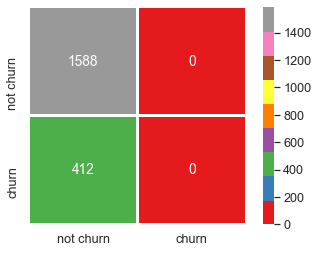

In [78]:
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
sns.heatmap(conf_matrix,annot=True,fmt = 'd',square = True,
 xticklabels=['not churn','churn'],
 yticklabels=['not churn','churn'],
 linewidths = 2,linecolor = 'w',cmap = 'Set1')
plt.subplots_adjust(wspace = .3,hspace = .3)

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      1.00      0.89      1588
           1       0.00      0.00      0.00       412

    accuracy                           0.79      2000
   macro avg       0.40      0.50      0.44      2000
weighted avg       0.63      0.79      0.70      2000



### Model Building (with managing Imbalance in the Target column)

In [79]:
bank_new_df = bank_df.copy()
X = bank_new_df.drop('Exited', axis=1)
Y = bank_new_df[['Exited']]

In [80]:
#Convert categorical variables to dummy variables
X = pd.get_dummies(X, drop_first=True)
X

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,0,0,42,2,0.00,1,1,1,101348.88
1,608,2,0,41,1,83807.86,1,0,1,112542.58
2,502,0,0,42,8,159660.80,3,1,0,113931.57
3,699,0,0,39,1,0.00,2,0,0,93826.63
4,850,2,0,43,2,125510.82,1,1,1,79084.10
...,...,...,...,...,...,...,...,...,...,...
9995,771,0,1,39,5,0.00,2,1,0,96270.64
9996,516,0,1,35,10,57369.61,1,1,1,101699.77
9997,709,0,0,36,7,0.00,1,0,1,42085.58
9998,772,1,1,42,3,75075.31,2,1,0,92888.52


In [81]:
## Split into training and test set
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2,random_state=100)

#### Normalizing the columns

In [82]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [83]:
# summarize class distribution
bank_new_df["Exited"].value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

In [84]:
print(X_train.shape)
print(y_train.shape)

(8000, 10)
(8000, 1)


#### Oversample imbalanced target attribute with SMOTE

In [85]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

# transform the column
oversample = SMOTE()
undersample = RandomUnderSampler()
steps = [('over', oversample), ('under', undersample)]
pipeline = Pipeline(steps=steps)
X_train, y_train = pipeline.fit_resample(X_train, y_train)

In [86]:
# summarize the new class distribution

print(X_train.shape)
print(y_train.shape)

(12750, 10)
(12750, 1)


In [88]:
import sys
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from keras.layers import Dropout

In [89]:
# Initialising the ANN - Defining as a sequence of layers or a Graph
classifier = Sequential()
# Input Layer
classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))
#classifier.add(Dropout(0.1))
# Second hidden layer
classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu'))
#classifier.add(Dropout(0.1))
# Output layer
classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
# Compiling the ANN
classifier.compile(optimizer = 'adam',loss= 'binary_crossentropy',metrics=['accuracy'])

In [90]:
# Fitting the ANN to the Training Set
classifier.fit(X_train, y_train, batch_size = 10, epochs = 100)

Epoch 1/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.6184 - accuracy: 0.6968
Epoch 2/100
1275/1275 [==============================] - 2s 2ms/step - loss: 0.5384 - accuracy: 0.7519
Epoch 3/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4994 - accuracy: 0.7645
Epoch 4/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4819 - accuracy: 0.7682
Epoch 5/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4733 - accuracy: 0.7696
Epoch 6/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4689 - accuracy: 0.7729: 1s - loss: 0.465 - ETA: 
Epoch 7/100
1275/1275 [==============================] - 2s 2ms/step - loss: 0.4640 - accuracy: 0.7762
Epoch 8/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4615 - accuracy: 0.7754
Epoch 9/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4589 - accuracy: 0.7790: 0s - loss: 0.4596 - accuracy: 0. - ETA: 0s - l

1275/1275 [==============================] - 1s 1ms/step - loss: 0.4360 - accuracy: 0.7894
Epoch 75/100
1275/1275 [==============================] - 1s 988us/step - loss: 0.4361 - accuracy: 0.7922
Epoch 76/100
1275/1275 [==============================] - 1s 878us/step - loss: 0.4359 - accuracy: 0.7882
Epoch 77/100
1275/1275 [==============================] - 1s 918us/step - loss: 0.4358 - accuracy: 0.7885
Epoch 78/100
1275/1275 [==============================] - 1s 977us/step - loss: 0.4360 - accuracy: 0.7900
Epoch 79/100
1275/1275 [==============================] - 1s 1ms/step - loss: 0.4358 - accuracy: 0.7906
Epoch 80/100
1275/1275 [==============================] - 1s 922us/step - loss: 0.4363 - accuracy: 0.7897
Epoch 81/100
1275/1275 [==============================] - 1s 931us/step - loss: 0.4359 - accuracy: 0.7900
Epoch 82/100
1275/1275 [==============================] - 2s 1ms/step - loss: 0.4358 - accuracy: 0.7894
Epoch 83/100
1275/1275 [==============================] - 1s 1ms/

In [91]:
loss, acc = classifier.evaluate(X_test, y_test, verbose=0)
print('Accuracy: %.3f'  % acc)
print('Loss: %.3f' % loss)

Accuracy: 0.792
Loss: 0.466


In [92]:
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)

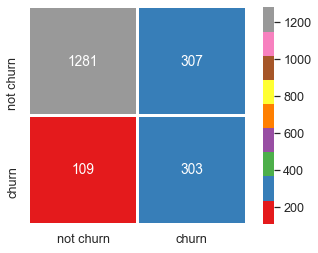

In [93]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix,annot=True,fmt = 'd',square = True,
 xticklabels=['not churn','churn'],
 yticklabels=['not churn','churn'],
 linewidths = 2,linecolor = 'w',cmap = 'Set1')
plt.subplots_adjust(wspace = .3,hspace = .3)

In [94]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.81      0.86      1588
           1       0.50      0.74      0.59       412

    accuracy                           0.79      2000
   macro avg       0.71      0.77      0.73      2000
weighted avg       0.83      0.79      0.81      2000



After addressing the imbalance in the target variable and  their metrics compared, it seems that the recall has improved quite significantly from 44 to 74 (i.e., model was able to catch 74% (Recall) of customers that will  not leave in the next 6 months. 
Recall is an important metric in predicting bank customer chrun as the bank would want to retain as many customers as possible to let the existing business thrive. 

### Tuning the ANN

In [95]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.layers import Dense, Input, Dropout
from keras.models import Sequential
from keras.layers import Dense


def build_classifier(optimizer):
     classifier = Sequential()
     classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))
     classifier.add(Dense(units = 5, kernel_initializer = 'uniform', activation = 'relu'))
     classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
     classifier.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])
     return classifier

classifier = KerasClassifier(build_fn = build_classifier)
parameters = {'batch_size': [16,32,64], 'epochs': [100, 500], 'optimizer': ['adam', 'rmsprop','SGD']}
grid_search = GridSearchCV(estimator = classifier,param_grid = parameters, scoring = 'accuracy',cv = 10)
grid_result = grid_search.fit(X_train, y_train)
best_parameters = grid_result.best_params_
best_accuracy = grid_result.best_score_

Epoch 1/100
718/718 [==============================] - 1s 2ms/step - loss: 0.5998 - accuracy: 0.6882
Epoch 2/100
718/718 [==============================] - 1s 1ms/step - loss: 0.5261 - accuracy: 0.7441: 0s - loss: 0.5293 - accura
Epoch 3/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4949 - accuracy: 0.7581
Epoch 4/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4773 - accuracy: 0.7670
Epoch 5/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4701 - accuracy: 0.7678
Epoch 6/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4654 - accuracy: 0.7732
Epoch 7/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4629 - accuracy: 0.7727
Epoch 8/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4608 - accuracy: 0.7723
Epoch 9/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4591 - accuracy: 0.7716
Epoch 10/100
718/718 [==============================] - 1s 1ms/

718/718 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7957
Epoch 79/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7942
Epoch 80/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7941
Epoch 81/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4286 - accuracy: 0.7948
Epoch 82/100
718/718 [==============================] - 1s 991us/step - loss: 0.4282 - accuracy: 0.7955
Epoch 83/100
718/718 [==============================] - 1s 995us/step - loss: 0.4285 - accuracy: 0.7926
Epoch 84/100
718/718 [==============================] - 1s 967us/step - loss: 0.4281 - accuracy: 0.7976
Epoch 85/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.7963
Epoch 86/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7956
Epoch 87/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 - accu

718/718 [==============================] - 1s 1ms/step - loss: 0.4331 - accuracy: 0.7969
Epoch 57/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7984
Epoch 58/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4333 - accuracy: 0.7976: 0s - loss: 0.4311 - ac
Epoch 59/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4334 - accuracy: 0.7961
Epoch 60/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7963
Epoch 61/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4331 - accuracy: 0.7944: 0s - los
Epoch 62/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4334 - accuracy: 0.7985
Epoch 63/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4325 - accuracy: 0.7970
Epoch 64/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4331 - accuracy: 0.7958
Epoch 65/100
718/718 [==============================] - 1s 1m

718/718 [==============================] - 1s 2ms/step - loss: 0.4446 - accuracy: 0.7873
Epoch 35/100
718/718 [==============================] - 2s 2ms/step - loss: 0.4444 - accuracy: 0.7867
Epoch 36/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4445 - accuracy: 0.7859
Epoch 37/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4444 - accuracy: 0.7868
Epoch 38/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4437 - accuracy: 0.7869: 0s - l
Epoch 39/100
718/718 [==============================] - 2s 3ms/step - loss: 0.4447 - accuracy: 0.7847
Epoch 40/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4442 - accuracy: 0.7840: 0s - loss: 0.4405 
Epoch 41/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4434 - accuracy: 0.7862
Epoch 42/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7871
Epoch 43/100
718/718 [==============================] - 1s 1ms/step

718/718 [==============================] - 1s 1ms/step - loss: 0.4604 - accuracy: 0.7718
Epoch 13/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4601 - accuracy: 0.7749
Epoch 14/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4596 - accuracy: 0.7739
Epoch 15/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4599 - accuracy: 0.7706
Epoch 16/100
718/718 [==============================] - 1s 976us/step - loss: 0.4594 - accuracy: 0.7753
Epoch 17/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4592 - accuracy: 0.7733
Epoch 18/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4588 - accuracy: 0.7759
Epoch 19/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7765
Epoch 20/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7751
Epoch 21/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4579 - accuracy

718/718 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7780
Epoch 91/100
718/718 [==============================] - 1s 919us/step - loss: 0.4543 - accuracy: 0.7789
Epoch 92/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7815
Epoch 93/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4539 - accuracy: 0.7805
Epoch 94/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7798
Epoch 95/100
718/718 [==============================] - 1s 995us/step - loss: 0.4540 - accuracy: 0.7807
Epoch 96/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4537 - accuracy: 0.7780
Epoch 97/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4545 - accuracy: 0.7785
Epoch 98/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4541 - accuracy: 0.7807
Epoch 99/100
718/718 [==============================] - 1s 944us/step - loss: 0.4541 - accu

718/718 [==============================] - 1s 1ms/step - loss: 0.4544 - accuracy: 0.7796
Epoch 69/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7791
Epoch 70/100
718/718 [==============================] - 1s 987us/step - loss: 0.4544 - accuracy: 0.7778
Epoch 71/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4539 - accuracy: 0.7781: 0s - loss: 0.4499 - 
Epoch 72/100
718/718 [==============================] - 1s 962us/step - loss: 0.4538 - accuracy: 0.7802
Epoch 73/100
718/718 [==============================] - 1s 861us/step - loss: 0.4545 - accuracy: 0.7779
Epoch 74/100
718/718 [==============================] - 1s 874us/step - loss: 0.4541 - accuracy: 0.7804
Epoch 75/100
718/718 [==============================] - 1s 886us/step - loss: 0.4543 - accuracy: 0.7806
Epoch 76/100
718/718 [==============================] - 1s 894us/step - loss: 0.4541 - accuracy: 0.7792
Epoch 77/100
718/718 [==============================] - 1s 89

718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7986
Epoch 46/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7980
Epoch 47/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7966
Epoch 48/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4327 - accuracy: 0.7992
Epoch 49/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4323 - accuracy: 0.7995
Epoch 50/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4318 - accuracy: 0.7977
Epoch 51/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.8001
Epoch 52/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4314 - accuracy: 0.7992
Epoch 53/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7995
Epoch 54/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 

718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7978: 0s - loss: 0.4390 - accuracy
Epoch 24/100
718/718 [==============================] - 1s 990us/step - loss: 0.4367 - accuracy: 0.7972
Epoch 25/100
718/718 [==============================] - 1s 976us/step - loss: 0.4356 - accuracy: 0.7951
Epoch 26/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7985
Epoch 27/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4351 - accuracy: 0.7974
Epoch 28/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4354 - accuracy: 0.7984: 0s - loss: 0.4356 - accuracy: 0.
Epoch 29/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4347 - accuracy: 0.7969
Epoch 30/100
718/718 [==============================] - 1s 992us/step - loss: 0.4344 - accuracy: 0.7978
Epoch 31/100
718/718 [==============================] - 1s 998us/step - loss: 0.4335 - accuracy: 0.7969
Epoch 32/100
718/718 [=

718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7973
Epoch 99/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.7999: 0s - loss: 0.4335 - ac
Epoch 100/100
718/718 [==============================] - 1s 999us/step - loss: 0.4283 - accuracy: 0.7984
Epoch 1/100
718/718 [==============================] - 1s 1ms/step - loss: 0.5968 - accuracy: 0.6920
Epoch 2/100
718/718 [==============================] - 1s 1ms/step - loss: 0.5059 - accuracy: 0.7551
Epoch 3/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4767 - accuracy: 0.7660
Epoch 4/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4652 - accuracy: 0.7723
Epoch 5/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4596 - accuracy: 0.7766
Epoch 6/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4573 - accuracy: 0.7780
Epoch 7/100
718/718 [==============================] - 1s 1ms/step - loss:

718/718 [==============================] - 1s 973us/step - loss: 0.4438 - accuracy: 0.7902
Epoch 76/100
718/718 [==============================] - 1s 980us/step - loss: 0.4434 - accuracy: 0.7909
Epoch 77/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4437 - accuracy: 0.7897
Epoch 78/100
718/718 [==============================] - 1s 926us/step - loss: 0.4436 - accuracy: 0.7896
Epoch 79/100
718/718 [==============================] - 1s 977us/step - loss: 0.4436 - accuracy: 0.7898
Epoch 80/100
718/718 [==============================] - 1s 965us/step - loss: 0.4437 - accuracy: 0.7926
Epoch 81/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4436 - accuracy: 0.7902
Epoch 82/100
718/718 [==============================] - 1s 960us/step - loss: 0.4436 - accuracy: 0.79050s - loss: 0.4443 - accuracy: 0.
Epoch 83/100
718/718 [==============================] - 1s 992us/step - loss: 0.4437 - accuracy: 0.7900
Epoch 84/100
718/718 [===========================

718/718 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7895
Epoch 53/100
718/718 [==============================] - 1s 996us/step - loss: 0.4428 - accuracy: 0.7896
Epoch 54/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4422 - accuracy: 0.7900
Epoch 55/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4415 - accuracy: 0.7919
Epoch 56/100
718/718 [==============================] - 1s 956us/step - loss: 0.4407 - accuracy: 0.7910
Epoch 57/100
718/718 [==============================] - 1s 973us/step - loss: 0.4408 - accuracy: 0.7899
Epoch 58/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7909
Epoch 59/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4394 - accuracy: 0.7915
Epoch 60/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4394 - accuracy: 0.7936
Epoch 61/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4391 - accu

718/718 [==============================] - 1s 1ms/step - loss: 0.4587 - accuracy: 0.7785
Epoch 30/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4581 - accuracy: 0.7772
Epoch 31/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7797
Epoch 32/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4569 - accuracy: 0.7777
Epoch 33/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7788
Epoch 34/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4582 - accuracy: 0.7762
Epoch 35/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7780
Epoch 36/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4573 - accuracy: 0.7779
Epoch 37/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4573 - accuracy: 0.7769
Epoch 38/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4575 - accuracy: 

718/718 [==============================] - 1s 1ms/step - loss: 0.4801 - accuracy: 0.7623
Epoch 7/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4689 - accuracy: 0.7728
Epoch 8/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4623 - accuracy: 0.7741
Epoch 9/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4582 - accuracy: 0.7768
Epoch 10/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4550 - accuracy: 0.7801
Epoch 11/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4535 - accuracy: 0.7832
Epoch 12/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4515 - accuracy: 0.7828
Epoch 13/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4500 - accuracy: 0.7832
Epoch 14/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4494 - accuracy: 0.7851
Epoch 15/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4483 - accuracy: 0.7

718/718 [==============================] - 1s 1ms/step - loss: 0.4319 - accuracy: 0.7943
Epoch 83/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4325 - accuracy: 0.7922
Epoch 84/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4317 - accuracy: 0.7929: 0s - loss: 0.4380 
Epoch 85/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4324 - accuracy: 0.7925
Epoch 86/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4318 - accuracy: 0.7939: 0s - loss:
Epoch 87/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7936
Epoch 88/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4325 - accuracy: 0.7932
Epoch 89/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4323 - accuracy: 0.7923
Epoch 90/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7937
Epoch 91/100
718/718 [==============================] - 1s 1ms/

718/718 [==============================] - 1s 1ms/step - loss: 0.4765 - accuracy: 0.7664
Epoch 58/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4757 - accuracy: 0.7692: 0s - loss: 0.4747 - accuracy
Epoch 59/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4754 - accuracy: 0.7676
Epoch 60/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4746 - accuracy: 0.7679
Epoch 61/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4745 - accuracy: 0.7689: 0s - loss: 0.4767 - ac - ETA: 0s - loss: 0.4744 - accuracy: 0.76
Epoch 62/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4739 - accuracy: 0.7704
Epoch 63/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4731 - accuracy: 0.7716
Epoch 64/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4727 - accuracy: 0.7734: 0s - loss: 0.4725 - accuracy: 0.77
Epoch 65/100
718/718 [==============================] - 1s 1ms/st

718/718 [==============================] - 1s 1ms/step - loss: 0.4580 - accuracy: 0.7748
Epoch 33/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4589 - accuracy: 0.7722
Epoch 34/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4587 - accuracy: 0.7724
Epoch 35/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4587 - accuracy: 0.7727
Epoch 36/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7741
Epoch 37/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4584 - accuracy: 0.7722
Epoch 38/100
718/718 [==============================] - 1s 999us/step - loss: 0.4582 - accuracy: 0.7703
Epoch 39/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4585 - accuracy: 0.7743
Epoch 40/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4582 - accuracy: 0.7727: 0s - loss: 0.4534 - accuracy: 
Epoch 41/100
718/718 [==============================] - 1s 1m

718/718 [==============================] - 1s 1ms/step - loss: 0.4968 - accuracy: 0.7643
Epoch 11/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4870 - accuracy: 0.7695
Epoch 12/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4790 - accuracy: 0.7756
Epoch 13/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4734 - accuracy: 0.7766
Epoch 14/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4677 - accuracy: 0.7798
Epoch 15/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4620 - accuracy: 0.7829
Epoch 16/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4577 - accuracy: 0.7827
Epoch 17/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4538 - accuracy: 0.7862
Epoch 18/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4521 - accuracy: 0.7847
Epoch 19/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 

718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7950
Epoch 88/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.7944: 0s - loss: 0.4342 - ac
Epoch 89/100
718/718 [==============================] - 1s 992us/step - loss: 0.4296 - accuracy: 0.7949
Epoch 90/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7957
Epoch 91/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7935
Epoch 92/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7942
Epoch 93/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7939
Epoch 94/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7952: 0s - loss: 0.4285 - accu
Epoch 95/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7972
Epoch 96/100
718/718 [=====================

718/718 [==============================] - 1s 1ms/step - loss: 0.4438 - accuracy: 0.7904
Epoch 63/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4436 - accuracy: 0.7917
Epoch 64/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4428 - accuracy: 0.7901: 0s - loss: 0.440
Epoch 65/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4424 - accuracy: 0.7912
Epoch 66/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4436 - accuracy: 0.7877: 0s - loss: 0.4
Epoch 67/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4424 - accuracy: 0.7886
Epoch 68/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4425 - accuracy: 0.7919
Epoch 69/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4421 - accuracy: 0.7915
Epoch 70/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4423 - accuracy: 0.7917: 0s - loss: 0.4398 - accura
Epoch 71/100
718/718 [===========

718/718 [==============================] - 1s 1ms/step - loss: 0.4377 - accuracy: 0.7960
Epoch 39/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4371 - accuracy: 0.7952
Epoch 40/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4376 - accuracy: 0.7968
Epoch 41/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7976
Epoch 42/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7976: 0s - loss: 0.430
Epoch 43/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7983: 0s - loss: 0.4375 - 
Epoch 44/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7980
Epoch 45/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7992
Epoch 46/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7951
Epoch 47/100
718/718 [==============================] -

718/718 [==============================] - 1s 1ms/step - loss: 0.4414 - accuracy: 0.7954
Epoch 14/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7936
Epoch 15/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4402 - accuracy: 0.7963
Epoch 16/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7933
Epoch 17/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4388 - accuracy: 0.7950
Epoch 18/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4387 - accuracy: 0.7966
Epoch 19/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4380 - accuracy: 0.7975
Epoch 20/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4381 - accuracy: 0.7943: 0s - loss: 0.4
Epoch 21/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4374 - accuracy: 0.7956
Epoch 22/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4

718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.8028
Epoch 91/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.8015
Epoch 92/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.7994
Epoch 93/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.8007
Epoch 94/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7993
Epoch 95/100
718/718 [==============================] - 1s 987us/step - loss: 0.4299 - accuracy: 0.8004
Epoch 96/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.8017
Epoch 97/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.8024
Epoch 98/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.8014
Epoch 99/100
718/718 [==============================] - 1s 982us/step - loss: 0.4302 - accura

718/718 [==============================] - 1s 1ms/step - loss: 0.4406 - accuracy: 0.7923
Epoch 67/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4412 - accuracy: 0.7920
Epoch 68/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4407 - accuracy: 0.7894
Epoch 69/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7904
Epoch 70/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4391 - accuracy: 0.7926
Epoch 71/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4388 - accuracy: 0.7935: 0s - loss: 0.428
Epoch 72/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7922
Epoch 73/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4372 - accuracy: 0.7962: 0s - loss: 0.4328 - accura
Epoch 74/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7946
Epoch 75/100
718/718 [===========================

718/718 [==============================] - 1s 1ms/step - loss: 0.4375 - accuracy: 0.7944
Epoch 44/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4375 - accuracy: 0.7922
Epoch 45/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7950
Epoch 46/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4370 - accuracy: 0.7970
Epoch 47/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4375 - accuracy: 0.7944
Epoch 48/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4366 - accuracy: 0.7943
Epoch 49/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4366 - accuracy: 0.7946
Epoch 50/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4364 - accuracy: 0.7930
Epoch 51/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4369 - accuracy: 0.7935
Epoch 52/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4363 - accuracy: 

Epoch 21/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4552 - accuracy: 0.7827
Epoch 22/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4547 - accuracy: 0.7824: 0s - loss: 0.4493 - accu
Epoch 23/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4537 - accuracy: 0.7847: 0s - loss: 0.4477 - accu
Epoch 24/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4523 - accuracy: 0.7845
Epoch 25/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4506 - accuracy: 0.7841
Epoch 26/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4494 - accuracy: 0.7883
Epoch 27/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4492 - accuracy: 0.7844: 0s - loss: 0.4520 - accu
Epoch 28/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4489 - accuracy: 0.7862
Epoch 29/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4488 - accuracy: 0.7844
Epoc

718/718 [==============================] - 1s 1ms/step - loss: 0.4371 - accuracy: 0.7939
Epoch 99/100
718/718 [==============================] - 1s 997us/step - loss: 0.4378 - accuracy: 0.7918
Epoch 100/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4370 - accuracy: 0.7949
Epoch 1/100
718/718 [==============================] - 1s 901us/step - loss: 0.6887 - accuracy: 0.5557
Epoch 2/100
718/718 [==============================] - 1s 914us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 3/100
718/718 [==============================] - 1s 923us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 4/100
718/718 [==============================] - 1s 952us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 5/100
718/718 [==============================] - 1s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 6/100
718/718 [==============================] - 1s 924us/step - loss: 0.6868 - accuracy: 0.55560s - loss: 0.6867 - accura
Epoch 7/100
718/718 [==============================] - 1s 1ms/

718/718 [==============================] - 1s 940us/step - loss: 0.4311 - accuracy: 0.79780s - loss: 0.4294 - accuracy: 0.
Epoch 77/100
718/718 [==============================] - 1s 911us/step - loss: 0.4318 - accuracy: 0.7951
Epoch 78/100
718/718 [==============================] - 1s 963us/step - loss: 0.4321 - accuracy: 0.79510s - loss: 0.4374 
Epoch 79/100
718/718 [==============================] - 1s 934us/step - loss: 0.4322 - accuracy: 0.7955
Epoch 80/100
718/718 [==============================] - 1s 948us/step - loss: 0.4319 - accuracy: 0.7952
Epoch 81/100
718/718 [==============================] - 1s 946us/step - loss: 0.4324 - accuracy: 0.7970
Epoch 82/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7961
Epoch 83/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7980
Epoch 84/100
718/718 [==============================] - 1s 953us/step - loss: 0.4323 - accuracy: 0.7961
Epoch 85/100
718/718 [=========

718/718 [==============================] - 1s 998us/step - loss: 0.4540 - accuracy: 0.77770s - loss: 0.4538 
Epoch 52/100
718/718 [==============================] - 1s 963us/step - loss: 0.4526 - accuracy: 0.7803
Epoch 53/100
718/718 [==============================] - 1s 960us/step - loss: 0.4527 - accuracy: 0.7842
Epoch 54/100
718/718 [==============================] - 1s 956us/step - loss: 0.4507 - accuracy: 0.7839
Epoch 55/100
718/718 [==============================] - 1s 968us/step - loss: 0.4497 - accuracy: 0.7853
Epoch 56/100
718/718 [==============================] - 1s 968us/step - loss: 0.4492 - accuracy: 0.78480s - loss: 0.4537 - accura
Epoch 57/100
718/718 [==============================] - 1s 946us/step - loss: 0.4481 - accuracy: 0.7853
Epoch 58/100
718/718 [==============================] - 1s 957us/step - loss: 0.4466 - accuracy: 0.7857
Epoch 59/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 0.7886: 0s - loss: 0.4479 - 
Epoch 60/100


718/718 [==============================] - 1s 943us/step - loss: 0.5156 - accuracy: 0.7552
Epoch 29/100
718/718 [==============================] - 1s 953us/step - loss: 0.5076 - accuracy: 0.7562
Epoch 30/100
718/718 [==============================] - 1s 964us/step - loss: 0.5026 - accuracy: 0.7578
Epoch 31/100
718/718 [==============================] - 1s 944us/step - loss: 0.4979 - accuracy: 0.7587
Epoch 32/100
718/718 [==============================] - 1s 938us/step - loss: 0.4947 - accuracy: 0.76070s - loss: 0.4861 - accu
Epoch 33/100
718/718 [==============================] - 1s 913us/step - loss: 0.4906 - accuracy: 0.7632
Epoch 34/100
718/718 [==============================] - 1s 902us/step - loss: 0.4859 - accuracy: 0.7673
Epoch 35/100
718/718 [==============================] - 1s 988us/step - loss: 0.4821 - accuracy: 0.7652
Epoch 36/100
718/718 [==============================] - 1s 978us/step - loss: 0.4789 - accuracy: 0.76850s - loss: 0.4815 - 
Epoch 37/100
718/718 [===========

718/718 [==============================] - 1s 960us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 5/100
718/718 [==============================] - 1s 943us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 6/100
718/718 [==============================] - 1s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 7/100
718/718 [==============================] - 1s 1ms/step - loss: 0.6870 - accuracy: 0.5556: 0s - loss: 0
Epoch 8/100
718/718 [==============================] - 1s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 9/100
718/718 [==============================] - 1s 975us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 10/100
718/718 [==============================] - 1s 961us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 11/100
718/718 [==============================] - 1s 921us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 12/100
718/718 [==============================] - 1s 933us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 13/100
718/718 [==============================] - 1s 939us/step - lo

718/718 [==============================] - 1s 979us/step - loss: 0.4350 - accuracy: 0.7924
Epoch 82/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4356 - accuracy: 0.7910
Epoch 83/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4358 - accuracy: 0.7933
Epoch 84/100
718/718 [==============================] - 1s 939us/step - loss: 0.4357 - accuracy: 0.7919
Epoch 85/100
718/718 [==============================] - 1s 960us/step - loss: 0.4357 - accuracy: 0.7931
Epoch 86/100
718/718 [==============================] - 1s 943us/step - loss: 0.4353 - accuracy: 0.7930
Epoch 87/100
718/718 [==============================] - 1s 954us/step - loss: 0.4362 - accuracy: 0.7922
Epoch 88/100
718/718 [==============================] - 1s 935us/step - loss: 0.4356 - accuracy: 0.7928
Epoch 89/100
718/718 [==============================] - 1s 988us/step - loss: 0.4345 - accuracy: 0.7930
Epoch 90/100
718/718 [==============================] - 1s 968us/step - loss: 0.4

Epoch 58/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4398 - accuracy: 0.7912
Epoch 59/100
718/718 [==============================] - 1s 955us/step - loss: 0.4395 - accuracy: 0.7922
Epoch 60/100
718/718 [==============================] - 1s 976us/step - loss: 0.4398 - accuracy: 0.7937
Epoch 61/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4384 - accuracy: 0.7920: 0s - loss: 0.4406 - ac
Epoch 62/100
718/718 [==============================] - 1s 990us/step - loss: 0.4389 - accuracy: 0.7931
Epoch 63/100
718/718 [==============================] - 1s 936us/step - loss: 0.4389 - accuracy: 0.7929
Epoch 64/100
718/718 [==============================] - 1s 973us/step - loss: 0.4382 - accuracy: 0.7935
Epoch 65/100
718/718 [==============================] - 1s 986us/step - loss: 0.4377 - accuracy: 0.7937
Epoch 66/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4388 - accuracy: 0.7922
Epoch 67/100
718/718 [========================

718/718 [==============================] - 1s 954us/step - loss: 0.4629 - accuracy: 0.7679
Epoch 35/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4602 - accuracy: 0.7709
Epoch 36/100
718/718 [==============================] - 1s 967us/step - loss: 0.4592 - accuracy: 0.7705
Epoch 37/100
718/718 [==============================] - 1s 988us/step - loss: 0.4569 - accuracy: 0.7761
Epoch 38/100
718/718 [==============================] - 1s 979us/step - loss: 0.4555 - accuracy: 0.77630s - loss: 0.4653 - accura
Epoch 39/100
718/718 [==============================] - 1s 938us/step - loss: 0.4543 - accuracy: 0.7811
Epoch 40/100
718/718 [==============================] - 1s 981us/step - loss: 0.4516 - accuracy: 0.7806
Epoch 41/100
718/718 [==============================] - 1s 2ms/step - loss: 0.4507 - accuracy: 0.7823
Epoch 42/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4495 - accuracy: 0.7821
Epoch 43/100
718/718 [==============================] - 1

718/718 [==============================] - 1s 985us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 11/100
718/718 [==============================] - 1s 964us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 12/100
718/718 [==============================] - 1s 987us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 13/100
718/718 [==============================] - 1s 963us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 14/100
718/718 [==============================] - 1s 978us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 15/100
718/718 [==============================] - 1s 947us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 16/100
718/718 [==============================] - 1s 1ms/step - loss: 0.6867 - accuracy: 0.5556: 0s - loss: 0.6872 - accura
Epoch 17/100
718/718 [==============================] - 1s 956us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 18/100
718/718 [==============================] - 1s 989us/step - loss: 0.6863 - accuracy: 0.5556
Epoch 19/100
718/718 [=============================

718/718 [==============================] - 1s 961us/step - loss: 0.4253 - accuracy: 0.8017
Epoch 88/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.8026
Epoch 89/100
718/718 [==============================] - 1s 977us/step - loss: 0.4244 - accuracy: 0.8037
Epoch 90/100
718/718 [==============================] - 1s 974us/step - loss: 0.4250 - accuracy: 0.8017
Epoch 91/100
718/718 [==============================] - 1s 984us/step - loss: 0.4249 - accuracy: 0.8006
Epoch 92/100
718/718 [==============================] - 1s 968us/step - loss: 0.4247 - accuracy: 0.7995
Epoch 93/100
718/718 [==============================] - 1s 976us/step - loss: 0.4243 - accuracy: 0.8008
Epoch 94/100
718/718 [==============================] - 1s 997us/step - loss: 0.4253 - accuracy: 0.8008
Epoch 95/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4247 - accuracy: 0.7992
Epoch 96/100
718/718 [==============================] - 1s 970us/step - loss: 0.4

Epoch 64/100
718/718 [==============================] - 1s 956us/step - loss: 0.4314 - accuracy: 0.7999
Epoch 65/100
718/718 [==============================] - 1s 963us/step - loss: 0.4308 - accuracy: 0.7977
Epoch 66/100
718/718 [==============================] - 1s 965us/step - loss: 0.4311 - accuracy: 0.79780s - loss: 0.4369 - accuracy
Epoch 67/100
718/718 [==============================] - 1s 990us/step - loss: 0.4303 - accuracy: 0.7977
Epoch 68/100
718/718 [==============================] - 1s 979us/step - loss: 0.4302 - accuracy: 0.79840s - loss: 0.4261 
Epoch 69/100
718/718 [==============================] - 1s 978us/step - loss: 0.4303 - accuracy: 0.8006
Epoch 70/100
718/718 [==============================] - 1s 966us/step - loss: 0.4305 - accuracy: 0.80150s - loss: 0.4317 - accuracy: 
Epoch 71/100
718/718 [==============================] - 1s 949us/step - loss: 0.4301 - accuracy: 0.7985
Epoch 72/100
718/718 [==============================] - 1s 963us/step - loss: 0.4296 - accur

718/718 [==============================] - 1s 1ms/step - loss: 0.4594 - accuracy: 0.7764
Epoch 42/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4595 - accuracy: 0.7773: 0s - loss: 0.4495 
Epoch 43/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4599 - accuracy: 0.7767
Epoch 44/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4593 - accuracy: 0.7760
Epoch 45/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4596 - accuracy: 0.7784
Epoch 46/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4593 - accuracy: 0.7776: 0s - loss: 0.4596 
Epoch 47/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4589 - accuracy: 0.7777
Epoch 48/100
718/718 [==============================] - 1s 983us/step - loss: 0.4593 - accuracy: 0.7752
Epoch 49/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4589 - accuracy: 0.7762: 0s - loss: 0.4590 - accura
Epoch 50/100
718/718 [===

718/718 [==============================] - 1s 934us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 18/100
718/718 [==============================] - 1s 957us/step - loss: 0.6867 - accuracy: 0.55560s - loss: 0.6858 - accu
Epoch 19/100
718/718 [==============================] - 1s 955us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 20/100
718/718 [==============================] - 1s 944us/step - loss: 0.6860 - accuracy: 0.5556
Epoch 21/100
718/718 [==============================] - 1s 966us/step - loss: 0.6850 - accuracy: 0.55560s - loss: 0.6854 - ac
Epoch 22/100
718/718 [==============================] - 1s 905us/step - loss: 0.6819 - accuracy: 0.5556
Epoch 23/100
718/718 [==============================] - 1s 914us/step - loss: 0.6702 - accuracy: 0.5820
Epoch 24/100
718/718 [==============================] - 1s 956us/step - loss: 0.6333 - accuracy: 0.6966
Epoch 25/100
718/718 [==============================] - 1s 949us/step - loss: 0.6004 - accuracy: 0.7030
Epoch 26/100
718/718 [=========

718/718 [==============================] - 1s 981us/step - loss: 0.4544 - accuracy: 0.7777
Epoch 94/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7795
Epoch 95/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7773
Epoch 96/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4534 - accuracy: 0.7774
Epoch 97/100
718/718 [==============================] - 1s 952us/step - loss: 0.4543 - accuracy: 0.7785
Epoch 98/100
718/718 [==============================] - 1s 955us/step - loss: 0.4542 - accuracy: 0.7787
Epoch 99/100
718/718 [==============================] - 1s 984us/step - loss: 0.4538 - accuracy: 0.7787
Epoch 100/100
718/718 [==============================] - 1s 1ms/step - loss: 0.4535 - accuracy: 0.7783
Epoch 1/500
718/718 [==============================] - 1s 1ms/step - loss: 0.6119 - accuracy: 0.6692
Epoch 2/500
718/718 [==============================] - 1s 983us/step - loss: 0.5364 - a

718/718 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7744: 0s - loss: 0.4478 - accura
Epoch 69/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4525 - accuracy: 0.7734
Epoch 70/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4529 - accuracy: 0.7731
Epoch 71/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4523 - accuracy: 0.7748
Epoch 72/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4519 - accuracy: 0.7768
Epoch 73/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4521 - accuracy: 0.7750
Epoch 74/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4516 - accuracy: 0.7749
Epoch 75/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4519 - accuracy: 0.7759
Epoch 76/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4521 - accuracy: 0.7771
Epoch 77/500
718/718 [==============================] - 1s 978us/st

718/718 [==============================] - 1s 1ms/step - loss: 0.4501 - accuracy: 0.7775
Epoch 145/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4506 - accuracy: 0.7761
Epoch 146/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4513 - accuracy: 0.7748
Epoch 147/500
718/718 [==============================] - 1s 958us/step - loss: 0.4505 - accuracy: 0.7762
Epoch 148/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4504 - accuracy: 0.7786
Epoch 149/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4507 - accuracy: 0.7754
Epoch 150/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4511 - accuracy: 0.7747
Epoch 151/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7756
Epoch 152/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4511 - accuracy: 0.7773
Epoch 153/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4500 -

718/718 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7761
Epoch 219/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4501 - accuracy: 0.7753
Epoch 220/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7752
Epoch 221/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4506 - accuracy: 0.7763: 0s - loss: 0.4432 - accuracy
Epoch 222/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4500 - accuracy: 0.7795
Epoch 223/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7757: 0s - loss: 0.4468 - accura
Epoch 224/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7774
Epoch 225/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7764
Epoch 226/500
718/718 [==============================] - 1s 861us/step - loss: 0.4505 - accuracy: 0.7769
Epoch 227/500
718/718 [====

718/718 [==============================] - 1s 2ms/step - loss: 0.4502 - accuracy: 0.7772
Epoch 296/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4499 - accuracy: 0.7784
Epoch 297/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4498 - accuracy: 0.7756: 0s - loss: 0
Epoch 298/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4495 - accuracy: 0.7792
Epoch 299/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4504 - accuracy: 0.7746
Epoch 300/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7763: 0s - loss: 0.458
Epoch 301/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4504 - accuracy: 0.7752
Epoch 302/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7772
Epoch 303/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4500 - accuracy: 0.7780
Epoch 304/500
718/718 [==============================] 

718/718 [==============================] - 1s 890us/step - loss: 0.4498 - accuracy: 0.7777
Epoch 374/500
718/718 [==============================] - 1s 886us/step - loss: 0.4499 - accuracy: 0.7763
Epoch 375/500
718/718 [==============================] - 1s 864us/step - loss: 0.4496 - accuracy: 0.7756
Epoch 376/500
718/718 [==============================] - 1s 856us/step - loss: 0.4506 - accuracy: 0.7768
Epoch 377/500
718/718 [==============================] - 1s 856us/step - loss: 0.4498 - accuracy: 0.7786
Epoch 378/500
718/718 [==============================] - 1s 868us/step - loss: 0.4499 - accuracy: 0.77740s - loss: 0.4513 - accuracy: 
Epoch 379/500
718/718 [==============================] - 1s 870us/step - loss: 0.4503 - accuracy: 0.7769
Epoch 380/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7767
Epoch 381/500
718/718 [==============================] - 1s 895us/step - loss: 0.4499 - accuracy: 0.7783
Epoch 382/500
718/718 [==================

718/718 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7774
Epoch 451/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7761
Epoch 452/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4498 - accuracy: 0.7771
Epoch 453/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4499 - accuracy: 0.7755
Epoch 454/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7784
Epoch 455/500
718/718 [==============================] - 1s 994us/step - loss: 0.4499 - accuracy: 0.7759
Epoch 456/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7751
Epoch 457/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7776
Epoch 458/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7765
Epoch 459/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4499 -

718/718 [==============================] - 1s 865us/step - loss: 0.4389 - accuracy: 0.7914
Epoch 29/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4385 - accuracy: 0.7921
Epoch 30/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4386 - accuracy: 0.7914
Epoch 31/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4387 - accuracy: 0.7919
Epoch 32/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4385 - accuracy: 0.7923
Epoch 33/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4379 - accuracy: 0.7921
Epoch 34/500
718/718 [==============================] - 1s 905us/step - loss: 0.4382 - accuracy: 0.7920
Epoch 35/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4377 - accuracy: 0.7909
Epoch 36/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4377 - accuracy: 0.7917
Epoch 37/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4366 - accura

718/718 [==============================] - 1s 2ms/step - loss: 0.4288 - accuracy: 0.8008
Epoch 107/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4285 - accuracy: 0.7993
Epoch 108/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8019
Epoch 109/500
718/718 [==============================] - 1s 864us/step - loss: 0.4286 - accuracy: 0.7981
Epoch 110/500
718/718 [==============================] - 1s 853us/step - loss: 0.4283 - accuracy: 0.7993
Epoch 111/500
718/718 [==============================] - 1s 922us/step - loss: 0.4283 - accuracy: 0.80020s - loss: 0.4197 
Epoch 112/500
718/718 [==============================] - 1s 839us/step - loss: 0.4279 - accuracy: 0.7994
Epoch 113/500
718/718 [==============================] - 1s 880us/step - loss: 0.4281 - accuracy: 0.7996
Epoch 114/500
718/718 [==============================] - 1s 855us/step - loss: 0.4278 - accuracy: 0.8014
Epoch 115/500
718/718 [==============================] - 

718/718 [==============================] - 1s 833us/step - loss: 0.4260 - accuracy: 0.7989
Epoch 184/500
718/718 [==============================] - 1s 860us/step - loss: 0.4254 - accuracy: 0.8007
Epoch 185/500
718/718 [==============================] - 1s 834us/step - loss: 0.4262 - accuracy: 0.7989
Epoch 186/500
718/718 [==============================] - 1s 834us/step - loss: 0.4257 - accuracy: 0.8002
Epoch 187/500
718/718 [==============================] - 1s 899us/step - loss: 0.4258 - accuracy: 0.7973
Epoch 188/500
718/718 [==============================] - 1s 891us/step - loss: 0.4258 - accuracy: 0.7997
Epoch 189/500
718/718 [==============================] - 1s 847us/step - loss: 0.4259 - accuracy: 0.8017
Epoch 190/500
718/718 [==============================] - 1s 838us/step - loss: 0.4260 - accuracy: 0.8010
Epoch 191/500
718/718 [==============================] - 1s 849us/step - loss: 0.4255 - accuracy: 0.7997
Epoch 192/500
718/718 [==============================] - 1s 859us/ste

718/718 [==============================] - 1s 854us/step - loss: 0.4245 - accuracy: 0.8023
Epoch 261/500
718/718 [==============================] - 1s 851us/step - loss: 0.4251 - accuracy: 0.8003
Epoch 262/500
718/718 [==============================] - 1s 832us/step - loss: 0.4250 - accuracy: 0.8011
Epoch 263/500
718/718 [==============================] - 1s 858us/step - loss: 0.4254 - accuracy: 0.8003
Epoch 264/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4246 - accuracy: 0.8004
Epoch 265/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.7996
Epoch 266/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.8003: 0s - loss: 0.4286 - accuracy: 0.79 - ETA: 0s - loss: 0.4272 - ac
Epoch 267/500
718/718 [==============================] - 1s 979us/step - loss: 0.4251 - accuracy: 0.7980
Epoch 268/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.7996
Epoch 269/5

718/718 [==============================] - 1s 853us/step - loss: 0.4240 - accuracy: 0.7997
Epoch 338/500
718/718 [==============================] - 1s 835us/step - loss: 0.4240 - accuracy: 0.7996
Epoch 339/500
718/718 [==============================] - 1s 841us/step - loss: 0.4242 - accuracy: 0.7995
Epoch 340/500
718/718 [==============================] - 1s 841us/step - loss: 0.4239 - accuracy: 0.8001
Epoch 341/500
718/718 [==============================] - 1s 862us/step - loss: 0.4245 - accuracy: 0.7988
Epoch 342/500
718/718 [==============================] - 1s 845us/step - loss: 0.4245 - accuracy: 0.7998
Epoch 343/500
718/718 [==============================] - 1s 828us/step - loss: 0.4242 - accuracy: 0.8024
Epoch 344/500
718/718 [==============================] - 1s 841us/step - loss: 0.4234 - accuracy: 0.8025
Epoch 345/500
718/718 [==============================] - 1s 829us/step - loss: 0.4233 - accuracy: 0.7999
Epoch 346/500
718/718 [==============================] - 1s 826us/ste

718/718 [==============================] - 1s 847us/step - loss: 0.4238 - accuracy: 0.8029
Epoch 415/500
718/718 [==============================] - 1s 831us/step - loss: 0.4239 - accuracy: 0.7981
Epoch 416/500
718/718 [==============================] - 1s 854us/step - loss: 0.4239 - accuracy: 0.7992
Epoch 417/500
718/718 [==============================] - 1s 848us/step - loss: 0.4238 - accuracy: 0.7998
Epoch 418/500
718/718 [==============================] - 1s 834us/step - loss: 0.4230 - accuracy: 0.8016
Epoch 419/500
718/718 [==============================] - 1s 917us/step - loss: 0.4235 - accuracy: 0.8006
Epoch 420/500
718/718 [==============================] - 1s 934us/step - loss: 0.4237 - accuracy: 0.8003
Epoch 421/500
718/718 [==============================] - 1s 852us/step - loss: 0.4238 - accuracy: 0.8003
Epoch 422/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4236 - accuracy: 0.8002
Epoch 423/500
718/718 [==============================] - 1s 1ms/step - 

718/718 [==============================] - 1s 838us/step - loss: 0.4235 - accuracy: 0.79950s - loss: 0.4215 - accuracy: 0.
Epoch 493/500
718/718 [==============================] - 1s 861us/step - loss: 0.4227 - accuracy: 0.8000
Epoch 494/500
718/718 [==============================] - 1s 857us/step - loss: 0.4237 - accuracy: 0.7994
Epoch 495/500
718/718 [==============================] - 1s 836us/step - loss: 0.4236 - accuracy: 0.8011
Epoch 496/500
718/718 [==============================] - 1s 862us/step - loss: 0.4231 - accuracy: 0.7996
Epoch 497/500
718/718 [==============================] - 1s 857us/step - loss: 0.4236 - accuracy: 0.7991
Epoch 498/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4239 - accuracy: 0.8000
Epoch 499/500
718/718 [==============================] - 1s 901us/step - loss: 0.4230 - accuracy: 0.7996
Epoch 500/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.8003
Epoch 1/500
718/718 [====================

718/718 [==============================] - 1s 1ms/step - loss: 0.4338 - accuracy: 0.7960
Epoch 70/500
718/718 [==============================] - 1s 998us/step - loss: 0.4343 - accuracy: 0.7940
Epoch 71/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4337 - accuracy: 0.7954
Epoch 72/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4339 - accuracy: 0.7925
Epoch 73/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4337 - accuracy: 0.7960
Epoch 74/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4338 - accuracy: 0.7942
Epoch 75/500
718/718 [==============================] - 1s 931us/step - loss: 0.4330 - accuracy: 0.7927
Epoch 76/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4332 - accuracy: 0.7959
Epoch 77/500
718/718 [==============================] - 1s 979us/step - loss: 0.4335 - accuracy: 0.7960
Epoch 78/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4332 - accu

718/718 [==============================] - 1s 2ms/step - loss: 0.4298 - accuracy: 0.7965
Epoch 147/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7979
Epoch 148/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7949
Epoch 149/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4302 - accuracy: 0.7947: 0s - loss: 0.4289 - accura
Epoch 150/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4305 - accuracy: 0.7965
Epoch 151/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7969
Epoch 152/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7975
Epoch 153/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.7970
Epoch 154/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4304 - accuracy: 0.7982
Epoch 155/500
718/718 [==============================] - 1s

718/718 [==============================] - 1s 2ms/step - loss: 0.4287 - accuracy: 0.7977
Epoch 223/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4287 - accuracy: 0.7974
Epoch 224/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7969
Epoch 225/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4293 - accuracy: 0.7961
Epoch 226/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.7975
Epoch 227/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.7993
Epoch 228/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.8002
Epoch 229/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7963
Epoch 230/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7977
Epoch 231/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4287 - a

718/718 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7979: 0s - loss: 0.4302 - accuracy
Epoch 300/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4285 - accuracy: 0.7957: 0s - loss: 0.423
Epoch 301/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7980
Epoch 302/500
718/718 [==============================] - 1s 927us/step - loss: 0.4282 - accuracy: 0.7980
Epoch 303/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7965
Epoch 304/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4283 - accuracy: 0.7981
Epoch 305/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7976: 0s - loss: 0.4315 - accuracy: 
Epoch 306/500
718/718 [==============================] - 1s 998us/step - loss: 0.4278 - accuracy: 0.7988
Epoch 307/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.7988
Epo

718/718 [==============================] - 1s 1ms/step - loss: 0.4278 - accuracy: 0.7977
Epoch 376/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4279 - accuracy: 0.7951
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7990
Epoch 378/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4278 - accuracy: 0.7988
Epoch 379/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4277 - accuracy: 0.7982
Epoch 380/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.8000
Epoch 381/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 - accuracy: 0.7974
Epoch 382/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.7996
Epoch 383/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7978
Epoch 384/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4279 - a

718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7975
Epoch 453/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4266 - accuracy: 0.7987
Epoch 454/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7964
Epoch 455/500
718/718 [==============================] - 1s 976us/step - loss: 0.4273 - accuracy: 0.7983
Epoch 456/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4267 - accuracy: 0.7982
Epoch 457/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7981
Epoch 458/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7972
Epoch 459/500
718/718 [==============================] - 1s 915us/step - loss: 0.4279 - accuracy: 0.7986
Epoch 460/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7962
Epoch 461/500
718/718 [==============================] - 1s 935us/step - loss: 0.42

718/718 [==============================] - 1s 839us/step - loss: 0.4538 - accuracy: 0.7784
Epoch 31/500
718/718 [==============================] - 1s 921us/step - loss: 0.4541 - accuracy: 0.7786
Epoch 32/500
718/718 [==============================] - 1s 967us/step - loss: 0.4533 - accuracy: 0.7773
Epoch 33/500
718/718 [==============================] - 1s 875us/step - loss: 0.4533 - accuracy: 0.7772
Epoch 34/500
718/718 [==============================] - 1s 942us/step - loss: 0.4532 - accuracy: 0.7784
Epoch 35/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4527 - accuracy: 0.7780: 0s - loss: 0.4587 - accura
Epoch 36/500
718/718 [==============================] - 1s 862us/step - loss: 0.4533 - accuracy: 0.7803
Epoch 37/500
718/718 [==============================] - 1s 857us/step - loss: 0.4529 - accuracy: 0.7788
Epoch 38/500
718/718 [==============================] - 1s 865us/step - loss: 0.4526 - accuracy: 0.7784
Epoch 39/500
718/718 [=============================

718/718 [==============================] - 1s 1ms/step - loss: 0.4336 - accuracy: 0.7951
Epoch 109/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4332 - accuracy: 0.7942
Epoch 110/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4331 - accuracy: 0.7951
Epoch 111/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4329 - accuracy: 0.7959
Epoch 112/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7970
Epoch 113/500
718/718 [==============================] - 1s 935us/step - loss: 0.4325 - accuracy: 0.7964
Epoch 114/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4325 - accuracy: 0.7949
Epoch 115/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4325 - accuracy: 0.7969
Epoch 116/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7972
Epoch 117/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4322 -

718/718 [==============================] - 1s 1ms/step - loss: 0.4311 - accuracy: 0.7954
Epoch 185/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4304 - accuracy: 0.7969
Epoch 186/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4315 - accuracy: 0.7968
Epoch 187/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4312 - accuracy: 0.7968
Epoch 188/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4311 - accuracy: 0.7974
Epoch 189/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.7972
Epoch 190/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4308 - accuracy: 0.7978: 0s - loss: 0.4375 - accu
Epoch 191/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.7969
Epoch 192/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4307 - accuracy: 0.7959
Epoch 193/500
718/718 [==============================] - 1s 1

718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7956: 0s - loss: 0.4342 - accura
Epoch 262/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4305 - accuracy: 0.7979
Epoch 263/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4312 - accuracy: 0.7936: 0s - loss: 0.4296 
Epoch 264/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4304 - accuracy: 0.7970
Epoch 265/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4304 - accuracy: 0.7957
Epoch 266/500
718/718 [==============================] - 1s 988us/step - loss: 0.4308 - accuracy: 0.7957
Epoch 267/500
718/718 [==============================] - 1s 981us/step - loss: 0.4307 - accuracy: 0.79640s - loss: 0.4284 
Epoch 268/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.7967
Epoch 269/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7963
Epoch 270/500
718

718/718 [==============================] - 1s 1ms/step - loss: 0.4286 - accuracy: 0.7951
Epoch 338/500
718/718 [==============================] - 1s 993us/step - loss: 0.4284 - accuracy: 0.7958
Epoch 339/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.7952
Epoch 340/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4283 - accuracy: 0.7983
Epoch 341/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7950
Epoch 342/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.7973
Epoch 343/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 - accuracy: 0.7933
Epoch 344/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4280 - accuracy: 0.7953
Epoch 345/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4286 - accuracy: 0.7965
Epoch 346/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 -

718/718 [==============================] - 2s 2ms/step - loss: 0.4276 - accuracy: 0.7964
Epoch 416/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4278 - accuracy: 0.7979
Epoch 417/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4284 - accuracy: 0.7956
Epoch 418/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.7956
Epoch 419/500
718/718 [==============================] - 1s 888us/step - loss: 0.4283 - accuracy: 0.7956
Epoch 420/500
718/718 [==============================] - 1s 931us/step - loss: 0.4281 - accuracy: 0.7954
Epoch 421/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.7963
Epoch 422/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4278 - accuracy: 0.7953
Epoch 423/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7969
Epoch 424/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280

718/718 [==============================] - 1s 2ms/step - loss: 0.4276 - accuracy: 0.7973: 0s - loss: 0.4264 - 
Epoch 494/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4274 - accuracy: 0.7969
Epoch 495/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4271 - accuracy: 0.7975
Epoch 496/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7947
Epoch 497/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7964
Epoch 498/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4278 - accuracy: 0.7959
Epoch 499/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4276 - accuracy: 0.7976: 0s - los - ETA: 0s - loss: 0.4293 - accura
Epoch 500/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4269 - accuracy: 0.7963
Epoch 1/500
718/718 [==============================] - 1s 2ms/step - loss: 0.6231 - accuracy: 0.6495
Epoch 2/500
718/718 [==

718/718 [==============================] - 1s 954us/step - loss: 0.4348 - accuracy: 0.7919
Epoch 72/500
718/718 [==============================] - 1s 860us/step - loss: 0.4351 - accuracy: 0.7937
Epoch 73/500
718/718 [==============================] - 1s 866us/step - loss: 0.4356 - accuracy: 0.7904
Epoch 74/500
718/718 [==============================] - 1s 972us/step - loss: 0.4349 - accuracy: 0.7942
Epoch 75/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4351 - accuracy: 0.7922
Epoch 76/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4351 - accuracy: 0.7923
Epoch 77/500
718/718 [==============================] - 1s 917us/step - loss: 0.4349 - accuracy: 0.7908
Epoch 78/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4347 - accuracy: 0.7933
Epoch 79/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4351 - accuracy: 0.7936
Epoch 80/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4346 - 

718/718 [==============================] - 1s 2ms/step - loss: 0.4315 - accuracy: 0.7952
Epoch 150/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7925
Epoch 151/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7942
Epoch 152/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7916
Epoch 153/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4317 - accuracy: 0.7946
Epoch 154/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4315 - accuracy: 0.7939
Epoch 155/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7942
Epoch 156/500
718/718 [==============================] - 1s 998us/step - loss: 0.4316 - accuracy: 0.7950
Epoch 157/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4318 - accuracy: 0.7955
Epoch 158/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4317 -

718/718 [==============================] - 1s 876us/step - loss: 0.4312 - accuracy: 0.7941
Epoch 228/500
718/718 [==============================] - 1s 894us/step - loss: 0.4307 - accuracy: 0.7923
Epoch 229/500
718/718 [==============================] - 1s 878us/step - loss: 0.4308 - accuracy: 0.7933
Epoch 230/500
718/718 [==============================] - 1s 881us/step - loss: 0.4308 - accuracy: 0.7937
Epoch 231/500
718/718 [==============================] - 1s 881us/step - loss: 0.4309 - accuracy: 0.7927
Epoch 232/500
718/718 [==============================] - 1s 880us/step - loss: 0.4311 - accuracy: 0.7929
Epoch 233/500
718/718 [==============================] - 1s 879us/step - loss: 0.4309 - accuracy: 0.7936
Epoch 234/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7929: 0s - loss: 0.4317 - accura
Epoch 235/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4311 - accuracy: 0.7945
Epoch 236/500
718/718 [======================

718/718 [==============================] - 1s 896us/step - loss: 0.4299 - accuracy: 0.7945
Epoch 305/500
718/718 [==============================] - 1s 884us/step - loss: 0.4302 - accuracy: 0.7974
Epoch 306/500
718/718 [==============================] - 1s 894us/step - loss: 0.4306 - accuracy: 0.7948
Epoch 307/500
718/718 [==============================] - 1s 888us/step - loss: 0.4304 - accuracy: 0.7926
Epoch 308/500
718/718 [==============================] - 1s 858us/step - loss: 0.4302 - accuracy: 0.7938
Epoch 309/500
718/718 [==============================] - 1s 881us/step - loss: 0.4300 - accuracy: 0.7932
Epoch 310/500
718/718 [==============================] - 1s 878us/step - loss: 0.4299 - accuracy: 0.7937
Epoch 311/500
718/718 [==============================] - 1s 868us/step - loss: 0.4306 - accuracy: 0.7943
Epoch 312/500
718/718 [==============================] - 1s 882us/step - loss: 0.4299 - accuracy: 0.7925
Epoch 313/500
718/718 [==============================] - 1s 864us/ste

718/718 [==============================] - 1s 871us/step - loss: 0.4283 - accuracy: 0.7976
Epoch 382/500
718/718 [==============================] - 1s 862us/step - loss: 0.4288 - accuracy: 0.7956
Epoch 383/500
718/718 [==============================] - 1s 873us/step - loss: 0.4284 - accuracy: 0.7957
Epoch 384/500
718/718 [==============================] - 1s 868us/step - loss: 0.4280 - accuracy: 0.7956
Epoch 385/500
718/718 [==============================] - 1s 877us/step - loss: 0.4285 - accuracy: 0.7968
Epoch 386/500
718/718 [==============================] - 1s 866us/step - loss: 0.4281 - accuracy: 0.7951
Epoch 387/500
718/718 [==============================] - 1s 866us/step - loss: 0.4285 - accuracy: 0.7954
Epoch 388/500
718/718 [==============================] - 1s 882us/step - loss: 0.4283 - accuracy: 0.7949
Epoch 389/500
718/718 [==============================] - 1s 861us/step - loss: 0.4277 - accuracy: 0.7933
Epoch 390/500
718/718 [==============================] - 1s 874us/ste

718/718 [==============================] - 1s 844us/step - loss: 0.4272 - accuracy: 0.7974
Epoch 459/500
718/718 [==============================] - 1s 910us/step - loss: 0.4274 - accuracy: 0.7977
Epoch 460/500
718/718 [==============================] - 1s 953us/step - loss: 0.4277 - accuracy: 0.7950
Epoch 461/500
718/718 [==============================] - 1s 902us/step - loss: 0.4271 - accuracy: 0.7980
Epoch 462/500
718/718 [==============================] - 1s 875us/step - loss: 0.4278 - accuracy: 0.7959
Epoch 463/500
718/718 [==============================] - 1s 949us/step - loss: 0.4275 - accuracy: 0.7954
Epoch 464/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4277 - accuracy: 0.7960: 0s - loss: 0.4235 - accuracy: 
Epoch 465/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4283 - accuracy: 0.7953
Epoch 466/500
718/718 [==============================] - 1s 877us/step - loss: 0.4276 - accuracy: 0.7965
Epoch 467/500
718/718 [==================

718/718 [==============================] - 1s 876us/step - loss: 0.4285 - accuracy: 0.8007
Epoch 36/500
718/718 [==============================] - 1s 868us/step - loss: 0.4288 - accuracy: 0.7996
Epoch 37/500
718/718 [==============================] - 1s 876us/step - loss: 0.4287 - accuracy: 0.80020s - loss: 0.4262 - accuracy: 
Epoch 38/500
718/718 [==============================] - 1s 906us/step - loss: 0.4295 - accuracy: 0.7989
Epoch 39/500
718/718 [==============================] - 1s 860us/step - loss: 0.4287 - accuracy: 0.8010
Epoch 40/500
718/718 [==============================] - 1s 882us/step - loss: 0.4288 - accuracy: 0.7990
Epoch 41/500
718/718 [==============================] - 1s 873us/step - loss: 0.4287 - accuracy: 0.7981
Epoch 42/500
718/718 [==============================] - 1s 867us/step - loss: 0.4282 - accuracy: 0.7998
Epoch 43/500
718/718 [==============================] - 1s 875us/step - loss: 0.4277 - accuracy: 0.7994
Epoch 44/500
718/718 [=========================

718/718 [==============================] - 1s 862us/step - loss: 0.4247 - accuracy: 0.8027
Epoch 114/500
718/718 [==============================] - 1s 878us/step - loss: 0.4253 - accuracy: 0.8013
Epoch 115/500
718/718 [==============================] - 1s 869us/step - loss: 0.4249 - accuracy: 0.8001
Epoch 116/500
718/718 [==============================] - 1s 857us/step - loss: 0.4251 - accuracy: 0.8016
Epoch 117/500
718/718 [==============================] - 1s 888us/step - loss: 0.4240 - accuracy: 0.8026
Epoch 118/500
718/718 [==============================] - 1s 854us/step - loss: 0.4253 - accuracy: 0.8024
Epoch 119/500
718/718 [==============================] - 1s 885us/step - loss: 0.4239 - accuracy: 0.8013
Epoch 120/500
718/718 [==============================] - 1s 871us/step - loss: 0.4239 - accuracy: 0.8024
Epoch 121/500
718/718 [==============================] - 1s 863us/step - loss: 0.4239 - accuracy: 0.8005
Epoch 122/500
718/718 [==============================] - 1s 872us/ste

718/718 [==============================] - 1s 864us/step - loss: 0.4179 - accuracy: 0.8060
Epoch 190/500
718/718 [==============================] - 1s 863us/step - loss: 0.4180 - accuracy: 0.8059
Epoch 191/500
718/718 [==============================] - 1s 843us/step - loss: 0.4180 - accuracy: 0.8045
Epoch 192/500
718/718 [==============================] - 1s 865us/step - loss: 0.4183 - accuracy: 0.8058
Epoch 193/500
718/718 [==============================] - 1s 843us/step - loss: 0.4178 - accuracy: 0.8072
Epoch 194/500
718/718 [==============================] - 1s 897us/step - loss: 0.4179 - accuracy: 0.8064
Epoch 195/500
718/718 [==============================] - 1s 859us/step - loss: 0.4186 - accuracy: 0.8052
Epoch 196/500
718/718 [==============================] - 1s 843us/step - loss: 0.4176 - accuracy: 0.8052
Epoch 197/500
718/718 [==============================] - 1s 855us/step - loss: 0.4179 - accuracy: 0.8048
Epoch 198/500
718/718 [==============================] - 1s 869us/ste

718/718 [==============================] - 1s 872us/step - loss: 0.4148 - accuracy: 0.8056
Epoch 266/500
718/718 [==============================] - 1s 884us/step - loss: 0.4157 - accuracy: 0.8051
Epoch 267/500
718/718 [==============================] - 1s 854us/step - loss: 0.4148 - accuracy: 0.8070
Epoch 268/500
718/718 [==============================] - 1s 882us/step - loss: 0.4151 - accuracy: 0.8079
Epoch 269/500
718/718 [==============================] - 1s 852us/step - loss: 0.4149 - accuracy: 0.8067
Epoch 270/500
718/718 [==============================] - 1s 869us/step - loss: 0.4150 - accuracy: 0.8070
Epoch 271/500
718/718 [==============================] - 1s 865us/step - loss: 0.4152 - accuracy: 0.8073
Epoch 272/500
718/718 [==============================] - 1s 856us/step - loss: 0.4149 - accuracy: 0.8066
Epoch 273/500
718/718 [==============================] - 1s 893us/step - loss: 0.4150 - accuracy: 0.8074
Epoch 274/500
718/718 [==============================] - 1s 928us/ste

718/718 [==============================] - 1s 872us/step - loss: 0.4148 - accuracy: 0.8073
Epoch 343/500
718/718 [==============================] - 1s 858us/step - loss: 0.4146 - accuracy: 0.8064
Epoch 344/500
718/718 [==============================] - 1s 898us/step - loss: 0.4148 - accuracy: 0.8078
Epoch 345/500
718/718 [==============================] - 1s 886us/step - loss: 0.4144 - accuracy: 0.8085
Epoch 346/500
718/718 [==============================] - 1s 868us/step - loss: 0.4149 - accuracy: 0.8068
Epoch 347/500
718/718 [==============================] - 1s 885us/step - loss: 0.4145 - accuracy: 0.80700s - loss: 0.4151 - accuracy: 0.80
Epoch 348/500
718/718 [==============================] - 1s 863us/step - loss: 0.4134 - accuracy: 0.8095
Epoch 349/500
718/718 [==============================] - 1s 877us/step - loss: 0.4149 - accuracy: 0.8081
Epoch 350/500
718/718 [==============================] - 1s 868us/step - loss: 0.4149 - accuracy: 0.8060
Epoch 351/500
718/718 [============

Epoch 419/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.8071
Epoch 420/500
718/718 [==============================] - 1s 873us/step - loss: 0.4147 - accuracy: 0.8075
Epoch 421/500
718/718 [==============================] - 1s 898us/step - loss: 0.4149 - accuracy: 0.80690s - loss: 0.4138 - accura
Epoch 422/500
718/718 [==============================] - 1s 889us/step - loss: 0.4148 - accuracy: 0.8061
Epoch 423/500
718/718 [==============================] - 1s 879us/step - loss: 0.4142 - accuracy: 0.8070
Epoch 424/500
718/718 [==============================] - 1s 859us/step - loss: 0.4148 - accuracy: 0.8090
Epoch 425/500
718/718 [==============================] - 1s 885us/step - loss: 0.4141 - accuracy: 0.8088
Epoch 426/500
718/718 [==============================] - 1s 860us/step - loss: 0.4144 - accuracy: 0.8079
Epoch 427/500
718/718 [==============================] - 1s 863us/step - loss: 0.4148 - accuracy: 0.8063
Epoch 428/500
718/718 [========

718/718 [==============================] - 1s 860us/step - loss: 0.4141 - accuracy: 0.8060
Epoch 496/500
718/718 [==============================] - 1s 867us/step - loss: 0.4146 - accuracy: 0.8076
Epoch 497/500
718/718 [==============================] - 1s 861us/step - loss: 0.4141 - accuracy: 0.80920s - loss: 0.4071 - accuracy
Epoch 498/500
718/718 [==============================] - 1s 850us/step - loss: 0.4145 - accuracy: 0.8082
Epoch 499/500
718/718 [==============================] - 1s 875us/step - loss: 0.4142 - accuracy: 0.8076
Epoch 500/500
718/718 [==============================] - 1s 872us/step - loss: 0.4144 - accuracy: 0.8064
Epoch 1/500
718/718 [==============================] - 1s 902us/step - loss: 0.6140 - accuracy: 0.6712
Epoch 2/500
718/718 [==============================] - 1s 877us/step - loss: 0.5580 - accuracy: 0.7132
Epoch 3/500
718/718 [==============================] - 1s 900us/step - loss: 0.5516 - accuracy: 0.7142
Epoch 4/500
718/718 [==========================

718/718 [==============================] - 1s 861us/step - loss: 0.4276 - accuracy: 0.7992
Epoch 74/500
718/718 [==============================] - 1s 882us/step - loss: 0.4273 - accuracy: 0.7981
Epoch 75/500
718/718 [==============================] - 1s 884us/step - loss: 0.4281 - accuracy: 0.8004
Epoch 76/500
718/718 [==============================] - 1s 867us/step - loss: 0.4275 - accuracy: 0.7971
Epoch 77/500
718/718 [==============================] - 1s 885us/step - loss: 0.4281 - accuracy: 0.7996
Epoch 78/500
718/718 [==============================] - 1s 904us/step - loss: 0.4273 - accuracy: 0.7981
Epoch 79/500
718/718 [==============================] - 1s 864us/step - loss: 0.4276 - accuracy: 0.7976
Epoch 80/500
718/718 [==============================] - 1s 887us/step - loss: 0.4270 - accuracy: 0.7999
Epoch 81/500
718/718 [==============================] - 1s 861us/step - loss: 0.4275 - accuracy: 0.8016
Epoch 82/500
718/718 [==============================] - 1s 893us/step - loss:

718/718 [==============================] - 1s 909us/step - loss: 0.4270 - accuracy: 0.7990
Epoch 150/500
718/718 [==============================] - 1s 882us/step - loss: 0.4268 - accuracy: 0.79920s - loss: 0.4
Epoch 151/500
718/718 [==============================] - 1s 859us/step - loss: 0.4267 - accuracy: 0.8006
Epoch 152/500
718/718 [==============================] - 1s 886us/step - loss: 0.4266 - accuracy: 0.7990
Epoch 153/500
718/718 [==============================] - 1s 881us/step - loss: 0.4265 - accuracy: 0.8009
Epoch 154/500
718/718 [==============================] - 1s 883us/step - loss: 0.4267 - accuracy: 0.7997
Epoch 155/500
718/718 [==============================] - 1s 879us/step - loss: 0.4265 - accuracy: 0.7999
Epoch 156/500
718/718 [==============================] - 1s 871us/step - loss: 0.4267 - accuracy: 0.7973
Epoch 157/500
718/718 [==============================] - 1s 877us/step - loss: 0.4266 - accuracy: 0.7969
Epoch 158/500
718/718 [==============================] 

718/718 [==============================] - 1s 860us/step - loss: 0.4267 - accuracy: 0.7981
Epoch 225/500
718/718 [==============================] - 1s 888us/step - loss: 0.4263 - accuracy: 0.7997
Epoch 226/500
718/718 [==============================] - 1s 865us/step - loss: 0.4258 - accuracy: 0.8021
Epoch 227/500
718/718 [==============================] - 1s 880us/step - loss: 0.4272 - accuracy: 0.7997
Epoch 228/500
718/718 [==============================] - 1s 908us/step - loss: 0.4262 - accuracy: 0.7989
Epoch 229/500
718/718 [==============================] - 1s 864us/step - loss: 0.4260 - accuracy: 0.79940s - loss: 0.4197 
Epoch 230/500
718/718 [==============================] - 1s 912us/step - loss: 0.4265 - accuracy: 0.8010
Epoch 231/500
718/718 [==============================] - 1s 883us/step - loss: 0.4262 - accuracy: 0.7990
Epoch 232/500
718/718 [==============================] - 1s 872us/step - loss: 0.4258 - accuracy: 0.80070s - loss: 0.4230 - accuracy
Epoch 233/500
718/718 [

718/718 [==============================] - 1s 873us/step - loss: 0.4263 - accuracy: 0.7985
Epoch 301/500
718/718 [==============================] - 1s 864us/step - loss: 0.4259 - accuracy: 0.7990
Epoch 302/500
718/718 [==============================] - 1s 886us/step - loss: 0.4262 - accuracy: 0.8003
Epoch 303/500
718/718 [==============================] - 1s 895us/step - loss: 0.4260 - accuracy: 0.8002
Epoch 304/500
718/718 [==============================] - 1s 861us/step - loss: 0.4257 - accuracy: 0.7988
Epoch 305/500
718/718 [==============================] - 1s 888us/step - loss: 0.4260 - accuracy: 0.8009
Epoch 306/500
718/718 [==============================] - 1s 943us/step - loss: 0.4258 - accuracy: 0.7977
Epoch 307/500
718/718 [==============================] - 1s 861us/step - loss: 0.4261 - accuracy: 0.7979
Epoch 308/500
718/718 [==============================] - 1s 879us/step - loss: 0.4257 - accuracy: 0.7983
Epoch 309/500
718/718 [==============================] - 1s 931us/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4258 - accuracy: 0.7996
Epoch 378/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4263 - accuracy: 0.8002: 0s
Epoch 379/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4261 - accuracy: 0.7987
Epoch 380/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7985
Epoch 381/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4257 - accuracy: 0.7993
Epoch 382/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4260 - accuracy: 0.7997
Epoch 383/500
718/718 [==============================] - 1s 938us/step - loss: 0.4255 - accuracy: 0.7998
Epoch 384/500
718/718 [==============================] - 1s 975us/step - loss: 0.4262 - accuracy: 0.7995
Epoch 385/500
718/718 [==============================] - 1s 902us/step - loss: 0.4257 - accuracy: 0.8008
Epoch 386/500
718/718 [==============================] - 1s 1ms/step - loss: 

718/718 [==============================] - 1s 878us/step - loss: 0.4260 - accuracy: 0.7996
Epoch 455/500
718/718 [==============================] - 1s 894us/step - loss: 0.4255 - accuracy: 0.7983
Epoch 456/500
718/718 [==============================] - 1s 901us/step - loss: 0.4252 - accuracy: 0.8012
Epoch 457/500
718/718 [==============================] - 1s 891us/step - loss: 0.4258 - accuracy: 0.8007
Epoch 458/500
718/718 [==============================] - 1s 867us/step - loss: 0.4261 - accuracy: 0.7994
Epoch 459/500
718/718 [==============================] - 1s 882us/step - loss: 0.4258 - accuracy: 0.7998
Epoch 460/500
718/718 [==============================] - 1s 884us/step - loss: 0.4255 - accuracy: 0.7998
Epoch 461/500
718/718 [==============================] - 1s 864us/step - loss: 0.4258 - accuracy: 0.7998
Epoch 462/500
718/718 [==============================] - 1s 887us/step - loss: 0.4258 - accuracy: 0.7990
Epoch 463/500
718/718 [==============================] - 1s 868us/ste

Epoch 31/500
718/718 [==============================] - 1s 866us/step - loss: 0.4336 - accuracy: 0.7956
Epoch 32/500
718/718 [==============================] - 1s 862us/step - loss: 0.4320 - accuracy: 0.7955
Epoch 33/500
718/718 [==============================] - 1s 874us/step - loss: 0.4317 - accuracy: 0.7983
Epoch 34/500
718/718 [==============================] - 1s 867us/step - loss: 0.4317 - accuracy: 0.7963
Epoch 35/500
718/718 [==============================] - 1s 867us/step - loss: 0.4313 - accuracy: 0.7962
Epoch 36/500
718/718 [==============================] - 1s 876us/step - loss: 0.4311 - accuracy: 0.7974
Epoch 37/500
718/718 [==============================] - 1s 861us/step - loss: 0.4304 - accuracy: 0.7968
Epoch 38/500
718/718 [==============================] - 1s 978us/step - loss: 0.4295 - accuracy: 0.7974
Epoch 39/500
718/718 [==============================] - 1s 870us/step - loss: 0.4306 - accuracy: 0.7975
Epoch 40/500
718/718 [==============================] - 1s 863us

718/718 [==============================] - 1s 875us/step - loss: 0.4260 - accuracy: 0.8007
Epoch 110/500
718/718 [==============================] - 1s 866us/step - loss: 0.4265 - accuracy: 0.7983
Epoch 111/500
718/718 [==============================] - 1s 894us/step - loss: 0.4266 - accuracy: 0.8015
Epoch 112/500
718/718 [==============================] - 1s 888us/step - loss: 0.4257 - accuracy: 0.7995
Epoch 113/500
718/718 [==============================] - 1s 878us/step - loss: 0.4256 - accuracy: 0.7997
Epoch 114/500
718/718 [==============================] - 1s 872us/step - loss: 0.4265 - accuracy: 0.7963
Epoch 115/500
718/718 [==============================] - 1s 877us/step - loss: 0.4259 - accuracy: 0.8009
Epoch 116/500
718/718 [==============================] - 1s 878us/step - loss: 0.4264 - accuracy: 0.7976
Epoch 117/500
718/718 [==============================] - 1s 881us/step - loss: 0.4262 - accuracy: 0.7986
Epoch 118/500
718/718 [==============================] - 1s 868us/ste

718/718 [==============================] - 1s 876us/step - loss: 0.4266 - accuracy: 0.7968
Epoch 187/500
718/718 [==============================] - 1s 862us/step - loss: 0.4269 - accuracy: 0.7984
Epoch 188/500
718/718 [==============================] - 1s 884us/step - loss: 0.4261 - accuracy: 0.79970s - loss: 0.4254 - accuracy: 
Epoch 189/500
718/718 [==============================] - 1s 871us/step - loss: 0.4259 - accuracy: 0.7963
Epoch 190/500
718/718 [==============================] - 1s 878us/step - loss: 0.4255 - accuracy: 0.7987
Epoch 191/500
718/718 [==============================] - 1s 884us/step - loss: 0.4264 - accuracy: 0.7995
Epoch 192/500
718/718 [==============================] - 1s 865us/step - loss: 0.4260 - accuracy: 0.7996
Epoch 193/500
718/718 [==============================] - 1s 877us/step - loss: 0.4260 - accuracy: 0.7983
Epoch 194/500
718/718 [==============================] - 1s 912us/step - loss: 0.4262 - accuracy: 0.7980
Epoch 195/500
718/718 [================

718/718 [==============================] - 1s 856us/step - loss: 0.4262 - accuracy: 0.7987
Epoch 263/500
718/718 [==============================] - 1s 888us/step - loss: 0.4254 - accuracy: 0.7986
Epoch 264/500
718/718 [==============================] - 1s 966us/step - loss: 0.4254 - accuracy: 0.8005
Epoch 265/500
718/718 [==============================] - 1s 854us/step - loss: 0.4255 - accuracy: 0.7983
Epoch 266/500
718/718 [==============================] - 1s 875us/step - loss: 0.4256 - accuracy: 0.7996
Epoch 267/500
718/718 [==============================] - 1s 860us/step - loss: 0.4258 - accuracy: 0.7975
Epoch 268/500
718/718 [==============================] - 1s 852us/step - loss: 0.4258 - accuracy: 0.7983
Epoch 269/500
718/718 [==============================] - 1s 860us/step - loss: 0.4251 - accuracy: 0.8004
Epoch 270/500
718/718 [==============================] - 1s 864us/step - loss: 0.4258 - accuracy: 0.7976
Epoch 271/500
718/718 [==============================] - 1s 865us/ste

718/718 [==============================] - 1s 875us/step - loss: 0.4250 - accuracy: 0.7976
Epoch 339/500
718/718 [==============================] - 1s 872us/step - loss: 0.4249 - accuracy: 0.8000
Epoch 340/500
718/718 [==============================] - 1s 863us/step - loss: 0.4247 - accuracy: 0.7979
Epoch 341/500
718/718 [==============================] - 1s 886us/step - loss: 0.4254 - accuracy: 0.7993
Epoch 342/500
718/718 [==============================] - 1s 859us/step - loss: 0.4248 - accuracy: 0.7970
Epoch 343/500
718/718 [==============================] - 1s 904us/step - loss: 0.4249 - accuracy: 0.7988
Epoch 344/500
718/718 [==============================] - 1s 873us/step - loss: 0.4256 - accuracy: 0.7993
Epoch 345/500
718/718 [==============================] - 1s 864us/step - loss: 0.4250 - accuracy: 0.79970s - loss: 0.4243 - accuracy: 0.80
Epoch 346/500
718/718 [==============================] - 1s 879us/step - loss: 0.4257 - accuracy: 0.7976
Epoch 347/500
718/718 [============

Epoch 414/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4251 - accuracy: 0.7978
Epoch 415/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4246 - accuracy: 0.8011
Epoch 416/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4255 - accuracy: 0.7976
Epoch 417/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.7996: 0s - loss: 0.4239 - accuracy
Epoch 418/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4247 - accuracy: 0.8018
Epoch 419/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4256 - accuracy: 0.7983
Epoch 420/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4247 - accuracy: 0.8005
Epoch 421/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4249 - accuracy: 0.8010
Epoch 422/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4252 - accuracy: 0.7995: 0s - loss: - ETA: 0s - loss: 0.4240 - accu

718/718 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.7993
Epoch 491/500
718/718 [==============================] - 1s 892us/step - loss: 0.4252 - accuracy: 0.7990
Epoch 492/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.8013
Epoch 493/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4249 - accuracy: 0.7990
Epoch 494/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4246 - accuracy: 0.8005
Epoch 495/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4252 - accuracy: 0.8005
Epoch 496/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.7991: 0s - loss: 0.4265 - accuracy: 0.79
Epoch 497/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.7982
Epoch 498/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4255 - accuracy: 0.7987
Epoch 499/500
718/718 [==========================

718/718 [==============================] - 1s 853us/step - loss: 0.4342 - accuracy: 0.7955
Epoch 68/500
718/718 [==============================] - 1s 880us/step - loss: 0.4334 - accuracy: 0.7952
Epoch 69/500
718/718 [==============================] - 1s 859us/step - loss: 0.4348 - accuracy: 0.7937
Epoch 70/500
718/718 [==============================] - 1s 858us/step - loss: 0.4339 - accuracy: 0.7960
Epoch 71/500
718/718 [==============================] - 1s 865us/step - loss: 0.4344 - accuracy: 0.7931
Epoch 72/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4337 - accuracy: 0.7943
Epoch 73/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4346 - accuracy: 0.7948
Epoch 74/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4338 - accuracy: 0.7976
Epoch 75/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4337 - accuracy: 0.7942
Epoch 76/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4337 - 

718/718 [==============================] - 1s 865us/step - loss: 0.4298 - accuracy: 0.7956
Epoch 144/500
718/718 [==============================] - 1s 851us/step - loss: 0.4298 - accuracy: 0.7995
Epoch 145/500
718/718 [==============================] - 1s 874us/step - loss: 0.4307 - accuracy: 0.7990
Epoch 146/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7994
Epoch 147/500
718/718 [==============================] - 1s 987us/step - loss: 0.4302 - accuracy: 0.7951
Epoch 148/500
718/718 [==============================] - 1s 863us/step - loss: 0.4296 - accuracy: 0.7985
Epoch 149/500
718/718 [==============================] - 1s 841us/step - loss: 0.4301 - accuracy: 0.7981
Epoch 150/500
718/718 [==============================] - 1s 932us/step - loss: 0.4292 - accuracy: 0.79860s - loss: 0.4
Epoch 151/500
718/718 [==============================] - 1s 861us/step - loss: 0.4295 - accuracy: 0.8004
Epoch 152/500
718/718 [==============================] - 

718/718 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.8013
Epoch 221/500
718/718 [==============================] - 1s 978us/step - loss: 0.4286 - accuracy: 0.7984
Epoch 222/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4291 - accuracy: 0.8005
Epoch 223/500
718/718 [==============================] - 1s 928us/step - loss: 0.4284 - accuracy: 0.7981
Epoch 224/500
718/718 [==============================] - 1s 912us/step - loss: 0.4288 - accuracy: 0.8019
Epoch 225/500
718/718 [==============================] - 1s 943us/step - loss: 0.4280 - accuracy: 0.7998
Epoch 226/500
718/718 [==============================] - 1s 962us/step - loss: 0.4293 - accuracy: 0.8009
Epoch 227/500
718/718 [==============================] - 1s 915us/step - loss: 0.4289 - accuracy: 0.7988
Epoch 228/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.8012
Epoch 229/500
718/718 [==============================] - 1s 1ms/step - loss

718/718 [==============================] - 1s 861us/step - loss: 0.4285 - accuracy: 0.7995
Epoch 298/500
718/718 [==============================] - 1s 843us/step - loss: 0.4282 - accuracy: 0.7996
Epoch 299/500
718/718 [==============================] - 1s 859us/step - loss: 0.4279 - accuracy: 0.7984
Epoch 300/500
718/718 [==============================] - 1s 874us/step - loss: 0.4273 - accuracy: 0.7997
Epoch 301/500
718/718 [==============================] - 1s 845us/step - loss: 0.4285 - accuracy: 0.7993
Epoch 302/500
718/718 [==============================] - 1s 861us/step - loss: 0.4285 - accuracy: 0.8006
Epoch 303/500
718/718 [==============================] - 1s 857us/step - loss: 0.4282 - accuracy: 0.7996
Epoch 304/500
718/718 [==============================] - 1s 861us/step - loss: 0.4277 - accuracy: 0.8003
Epoch 305/500
718/718 [==============================] - 1s 856us/step - loss: 0.4282 - accuracy: 0.7991
Epoch 306/500
718/718 [==============================] - 1s 851us/ste

718/718 [==============================] - 1s 874us/step - loss: 0.4275 - accuracy: 0.7995
Epoch 375/500
718/718 [==============================] - 1s 876us/step - loss: 0.4276 - accuracy: 0.7980
Epoch 376/500
718/718 [==============================] - 1s 842us/step - loss: 0.4275 - accuracy: 0.7985
Epoch 377/500
718/718 [==============================] - 1s 887us/step - loss: 0.4279 - accuracy: 0.8004
Epoch 378/500
718/718 [==============================] - 1s 873us/step - loss: 0.4283 - accuracy: 0.7989
Epoch 379/500
718/718 [==============================] - 1s 858us/step - loss: 0.4280 - accuracy: 0.7996
Epoch 380/500
718/718 [==============================] - 1s 865us/step - loss: 0.4277 - accuracy: 0.8002
Epoch 381/500
718/718 [==============================] - 1s 841us/step - loss: 0.4279 - accuracy: 0.7993
Epoch 382/500
718/718 [==============================] - 1s 867us/step - loss: 0.4287 - accuracy: 0.7975
Epoch 383/500
718/718 [==============================] - 1s 868us/ste

718/718 [==============================] - 1s 880us/step - loss: 0.4272 - accuracy: 0.7998
Epoch 453/500
718/718 [==============================] - 1s 870us/step - loss: 0.4279 - accuracy: 0.7982
Epoch 454/500
718/718 [==============================] - 1s 880us/step - loss: 0.4276 - accuracy: 0.8006
Epoch 455/500
718/718 [==============================] - 1s 852us/step - loss: 0.4279 - accuracy: 0.7988
Epoch 456/500
718/718 [==============================] - 1s 956us/step - loss: 0.4280 - accuracy: 0.7968
Epoch 457/500
718/718 [==============================] - 1s 862us/step - loss: 0.4273 - accuracy: 0.79930s - loss: 0.4286 - accuracy: 0.
Epoch 458/500
718/718 [==============================] - 1s 893us/step - loss: 0.4275 - accuracy: 0.7997
Epoch 459/500
718/718 [==============================] - 1s 857us/step - loss: 0.4279 - accuracy: 0.8004
Epoch 460/500
718/718 [==============================] - 1s 869us/step - loss: 0.4278 - accuracy: 0.7994
Epoch 461/500
718/718 [==============

718/718 [==============================] - 1s 869us/step - loss: 0.4512 - accuracy: 0.7854
Epoch 30/500
718/718 [==============================] - 1s 880us/step - loss: 0.4516 - accuracy: 0.7847
Epoch 31/500
718/718 [==============================] - 1s 873us/step - loss: 0.4497 - accuracy: 0.78590s - loss: 0.4508 - accuracy: 0.78
Epoch 32/500
718/718 [==============================] - 1s 846us/step - loss: 0.4497 - accuracy: 0.7857
Epoch 33/500
718/718 [==============================] - 1s 869us/step - loss: 0.4480 - accuracy: 0.7870
Epoch 34/500
718/718 [==============================] - 1s 859us/step - loss: 0.4466 - accuracy: 0.7867
Epoch 35/500
718/718 [==============================] - 1s 868us/step - loss: 0.4459 - accuracy: 0.7887
Epoch 36/500
718/718 [==============================] - 1s 876us/step - loss: 0.4453 - accuracy: 0.7852
Epoch 37/500
718/718 [==============================] - 1s 854us/step - loss: 0.4451 - accuracy: 0.7903
Epoch 38/500
718/718 [=====================

718/718 [==============================] - 1s 1ms/step - loss: 0.4415 - accuracy: 0.7903
Epoch 107/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4404 - accuracy: 0.7915
Epoch 108/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4413 - accuracy: 0.7902
Epoch 109/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4412 - accuracy: 0.7895: 0s - loss: 0.4476 
Epoch 110/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7913
Epoch 111/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4407 - accuracy: 0.7916
Epoch 112/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7885
Epoch 113/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7918
Epoch 114/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7920
Epoch 115/500
718/718 [==============================] - 1s 1ms/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4361 - accuracy: 0.7954
Epoch 183/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4364 - accuracy: 0.7944
Epoch 184/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4356 - accuracy: 0.7956
Epoch 185/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7942
Epoch 186/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7942
Epoch 187/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4359 - accuracy: 0.7947
Epoch 188/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4351 - accuracy: 0.7944
Epoch 189/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4356 - accuracy: 0.7957: 0s - loss: 0.4350 - accura
Epoch 190/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4352 - accuracy: 0.7965
Epoch 191/500
718/718 [==============================] - 1s

718/718 [==============================] - 1s 1ms/step - loss: 0.4320 - accuracy: 0.7983: 0s - loss: 0.4254 - ac
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7970
Epoch 260/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4320 - accuracy: 0.8009
Epoch 261/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7972
Epoch 262/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4323 - accuracy: 0.7969
Epoch 263/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4327 - accuracy: 0.7985
Epoch 264/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4325 - accuracy: 0.7962
Epoch 265/500
718/718 [==============================] - 1s 997us/step - loss: 0.4321 - accuracy: 0.7977
Epoch 266/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4314 - accuracy: 0.7981
Epoch 267/500
718/718 [==============================] - 1s 1

718/718 [==============================] - 1s 1ms/step - loss: 0.4312 - accuracy: 0.7963
Epoch 335/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4318 - accuracy: 0.7959
Epoch 336/500
718/718 [==============================] - 1s 991us/step - loss: 0.4313 - accuracy: 0.7983
Epoch 337/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7968
Epoch 338/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7958
Epoch 339/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.7963: 0s - loss: 0.4312 - ac
Epoch 340/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7971
Epoch 341/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.7969: 0s - loss: 0.4305 - 
Epoch 342/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4311 - accuracy: 0.7956
Epoch 343/500
718/718 [================

718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.7981
Epoch 411/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.7955
Epoch 412/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7968
Epoch 413/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.7980
Epoch 414/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7960
Epoch 415/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7970
Epoch 416/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7982
Epoch 417/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7959
Epoch 418/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7984
Epoch 419/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - a

718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7971
Epoch 485/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.7970
Epoch 486/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4293 - accuracy: 0.7979: 0s - loss: 0.4332 - accu
Epoch 487/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7963
Epoch 488/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7948
Epoch 489/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7992
Epoch 490/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7996
Epoch 491/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4294 - accuracy: 0.7966
Epoch 492/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.7977
Epoch 493/500
718/718 [==============================] - 1s 1

718/718 [==============================] - 1s 897us/step - loss: 0.4327 - accuracy: 0.7920
Epoch 62/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4329 - accuracy: 0.7951
Epoch 63/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4332 - accuracy: 0.7945
Epoch 64/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7942
Epoch 65/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4324 - accuracy: 0.7939
Epoch 66/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4329 - accuracy: 0.7948
Epoch 67/500
718/718 [==============================] - 1s 950us/step - loss: 0.4328 - accuracy: 0.7922
Epoch 68/500
718/718 [==============================] - 1s 899us/step - loss: 0.4321 - accuracy: 0.7950
Epoch 69/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4319 - accuracy: 0.7922
Epoch 70/500
718/718 [==============================] - 1s 929us/step - loss: 0.4319 - ac

718/718 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.7955
Epoch 139/500
718/718 [==============================] - 1s 932us/step - loss: 0.4287 - accuracy: 0.7985
Epoch 140/500
718/718 [==============================] - 1s 904us/step - loss: 0.4287 - accuracy: 0.7981
Epoch 141/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.7963
Epoch 142/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.7967
Epoch 143/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7965
Epoch 144/500
718/718 [==============================] - 1s 977us/step - loss: 0.4286 - accuracy: 0.7992
Epoch 145/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7955
Epoch 146/500
718/718 [==============================] - 1s 913us/step - loss: 0.4285 - accuracy: 0.7995
Epoch 147/500
718/718 [==============================] - 1s 1ms/step - loss: 0.

718/718 [==============================] - 1s 929us/step - loss: 0.4278 - accuracy: 0.7990
Epoch 217/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7978: 0s - loss: 0.4228 - 
Epoch 218/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7974
Epoch 219/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.8000
Epoch 220/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4278 - accuracy: 0.7992
Epoch 221/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4273 - accuracy: 0.7986
Epoch 222/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 - accuracy: 0.7971
Epoch 223/500
718/718 [==============================] - 1s 992us/step - loss: 0.4278 - accuracy: 0.8009
Epoch 224/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4278 - accuracy: 0.7970
Epoch 225/500
718/718 [==============================] - 1s 1

718/718 [==============================] - 1s 870us/step - loss: 0.4271 - accuracy: 0.7989
Epoch 293/500
718/718 [==============================] - 1s 876us/step - loss: 0.4262 - accuracy: 0.7997
Epoch 294/500
718/718 [==============================] - 1s 871us/step - loss: 0.4277 - accuracy: 0.7968
Epoch 295/500
718/718 [==============================] - 1s 897us/step - loss: 0.4276 - accuracy: 0.7969
Epoch 296/500
718/718 [==============================] - 1s 865us/step - loss: 0.4272 - accuracy: 0.7969
Epoch 297/500
718/718 [==============================] - 1s 887us/step - loss: 0.4266 - accuracy: 0.8006
Epoch 298/500
718/718 [==============================] - 1s 893us/step - loss: 0.4275 - accuracy: 0.7984
Epoch 299/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4271 - accuracy: 0.7996
Epoch 300/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.7986
Epoch 301/500
718/718 [==============================] - 1s 2ms/step - lo

718/718 [==============================] - 1s 902us/step - loss: 0.4264 - accuracy: 0.79760s - loss: 0.4273 - ac
Epoch 370/500
718/718 [==============================] - 1s 883us/step - loss: 0.4270 - accuracy: 0.7990
Epoch 371/500
718/718 [==============================] - 1s 918us/step - loss: 0.4268 - accuracy: 0.7973
Epoch 372/500
718/718 [==============================] - 1s 899us/step - loss: 0.4270 - accuracy: 0.7978
Epoch 373/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7990
Epoch 374/500
718/718 [==============================] - 1s 976us/step - loss: 0.4267 - accuracy: 0.7990
Epoch 375/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4266 - accuracy: 0.7993
Epoch 376/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.7990
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4265 - accuracy: 0.7973
Epoch 378/500
718/718 [==============================] 

718/718 [==============================] - 2s 2ms/step - loss: 0.4263 - accuracy: 0.7999
Epoch 447/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4270 - accuracy: 0.7979
Epoch 448/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4264 - accuracy: 0.8003
Epoch 449/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.8011
Epoch 450/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4265 - accuracy: 0.7999
Epoch 451/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4264 - accuracy: 0.7996
Epoch 452/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4265 - accuracy: 0.8005
Epoch 453/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4257 - accuracy: 0.8009
Epoch 454/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4266 - accuracy: 0.7979
Epoch 455/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4267 - a

718/718 [==============================] - 1s 870us/step - loss: 0.4508 - accuracy: 0.7811
Epoch 25/500
718/718 [==============================] - 1s 886us/step - loss: 0.4510 - accuracy: 0.7818
Epoch 26/500
718/718 [==============================] - 1s 870us/step - loss: 0.4501 - accuracy: 0.7841
Epoch 27/500
718/718 [==============================] - 1s 875us/step - loss: 0.4507 - accuracy: 0.7803
Epoch 28/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7831: 0s - loss: 0
Epoch 29/500
718/718 [==============================] - 1s 968us/step - loss: 0.4500 - accuracy: 0.7832
Epoch 30/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7830
Epoch 31/500
718/718 [==============================] - 1s 984us/step - loss: 0.4497 - accuracy: 0.7815
Epoch 32/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7807
Epoch 33/500
718/718 [==============================] - 1s 1ms/step -

718/718 [==============================] - 1s 1ms/step - loss: 0.4415 - accuracy: 0.7917
Epoch 103/500
718/718 [==============================] - 1s 948us/step - loss: 0.4416 - accuracy: 0.7915
Epoch 104/500
718/718 [==============================] - 1s 882us/step - loss: 0.4420 - accuracy: 0.7915
Epoch 105/500
718/718 [==============================] - 1s 907us/step - loss: 0.4416 - accuracy: 0.7920
Epoch 106/500
718/718 [==============================] - 1s 868us/step - loss: 0.4416 - accuracy: 0.7922
Epoch 107/500
718/718 [==============================] - 1s 963us/step - loss: 0.4416 - accuracy: 0.7916
Epoch 108/500
718/718 [==============================] - 1s 886us/step - loss: 0.4413 - accuracy: 0.7936
Epoch 109/500
718/718 [==============================] - 1s 875us/step - loss: 0.4414 - accuracy: 0.7962
Epoch 110/500
718/718 [==============================] - 1s 893us/step - loss: 0.4409 - accuracy: 0.7925
Epoch 111/500
718/718 [==============================] - 1s 889us/step 

718/718 [==============================] - 1s 1ms/step - loss: 0.4389 - accuracy: 0.7906: 0s - loss: 0.4363 - accura
Epoch 181/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4385 - accuracy: 0.7922
Epoch 182/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4397 - accuracy: 0.7923
Epoch 183/500
718/718 [==============================] - 1s 974us/step - loss: 0.4391 - accuracy: 0.7926
Epoch 184/500
718/718 [==============================] - 1s 939us/step - loss: 0.4391 - accuracy: 0.7928
Epoch 185/500
718/718 [==============================] - 1s 924us/step - loss: 0.4382 - accuracy: 0.79290s - loss: 0.4385 - accuracy: 0.79
Epoch 186/500
718/718 [==============================] - 1s 925us/step - loss: 0.4389 - accuracy: 0.7918
Epoch 187/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4380 - accuracy: 0.7948
Epoch 188/500
718/718 [==============================] - 1s 938us/step - loss: 0.4386 - accuracy: 0.7932
Epoch 189/500
7

718/718 [==============================] - 1s 902us/step - loss: 0.4369 - accuracy: 0.7942
Epoch 257/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4371 - accuracy: 0.7941
Epoch 258/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4371 - accuracy: 0.7955
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7959
Epoch 260/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4365 - accuracy: 0.7942
Epoch 261/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4362 - accuracy: 0.7959
Epoch 262/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7939
Epoch 263/500
718/718 [==============================] - 1s 890us/step - loss: 0.4370 - accuracy: 0.7943
Epoch 264/500
718/718 [==============================] - 1s 885us/step - loss: 0.4367 - accuracy: 0.7942
Epoch 265/500
718/718 [==============================] - 1s 1ms/step - loss: 0.43

718/718 [==============================] - 1s 872us/step - loss: 0.4357 - accuracy: 0.7929
Epoch 333/500
718/718 [==============================] - 1s 886us/step - loss: 0.4360 - accuracy: 0.7927
Epoch 334/500
718/718 [==============================] - 1s 962us/step - loss: 0.4358 - accuracy: 0.7952
Epoch 335/500
718/718 [==============================] - 1s 884us/step - loss: 0.4362 - accuracy: 0.7950
Epoch 336/500
718/718 [==============================] - 1s 882us/step - loss: 0.4352 - accuracy: 0.7936
Epoch 337/500
718/718 [==============================] - 1s 879us/step - loss: 0.4357 - accuracy: 0.7933
Epoch 338/500
718/718 [==============================] - 1s 875us/step - loss: 0.4361 - accuracy: 0.7943
Epoch 339/500
718/718 [==============================] - 1s 866us/step - loss: 0.4355 - accuracy: 0.7951
Epoch 340/500
718/718 [==============================] - 1s 887us/step - loss: 0.4356 - accuracy: 0.7943
Epoch 341/500
718/718 [==============================] - 1s 876us/ste

718/718 [==============================] - 1s 894us/step - loss: 0.4347 - accuracy: 0.7942
Epoch 410/500
718/718 [==============================] - 1s 883us/step - loss: 0.4351 - accuracy: 0.7957
Epoch 411/500
718/718 [==============================] - 1s 887us/step - loss: 0.4349 - accuracy: 0.7949
Epoch 412/500
718/718 [==============================] - 1s 869us/step - loss: 0.4345 - accuracy: 0.7952
Epoch 413/500
718/718 [==============================] - 1s 875us/step - loss: 0.4351 - accuracy: 0.7952
Epoch 414/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4346 - accuracy: 0.7928
Epoch 415/500
718/718 [==============================] - 1s 873us/step - loss: 0.4342 - accuracy: 0.7947
Epoch 416/500
718/718 [==============================] - 1s 903us/step - loss: 0.4348 - accuracy: 0.79450s - loss: 0.4335 - accuracy: 0.79
Epoch 417/500
718/718 [==============================] - 1s 886us/step - loss: 0.4346 - accuracy: 0.7947
Epoch 418/500
718/718 [==============

718/718 [==============================] - 1s 869us/step - loss: 0.4347 - accuracy: 0.7929
Epoch 487/500
718/718 [==============================] - 1s 886us/step - loss: 0.4342 - accuracy: 0.7947
Epoch 488/500
718/718 [==============================] - 1s 863us/step - loss: 0.4343 - accuracy: 0.7952
Epoch 489/500
718/718 [==============================] - 1s 915us/step - loss: 0.4338 - accuracy: 0.7959
Epoch 490/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4341 - accuracy: 0.7949
Epoch 491/500
718/718 [==============================] - 1s 938us/step - loss: 0.4345 - accuracy: 0.7942
Epoch 492/500
718/718 [==============================] - 1s 909us/step - loss: 0.4342 - accuracy: 0.7956
Epoch 493/500
718/718 [==============================] - 1s 903us/step - loss: 0.4346 - accuracy: 0.7922
Epoch 494/500
718/718 [==============================] - 1s 888us/step - loss: 0.4334 - accuracy: 0.7953
Epoch 495/500
718/718 [==============================] - 1s 877us/step 

718/718 [==============================] - ETA: 0s - loss: 0.4380 - accuracy: 0.79 - 1s 1ms/step - loss: 0.4380 - accuracy: 0.7903
Epoch 64/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4383 - accuracy: 0.7912
Epoch 65/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4378 - accuracy: 0.7939
Epoch 66/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4378 - accuracy: 0.7895
Epoch 67/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4372 - accuracy: 0.7888
Epoch 68/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4369 - accuracy: 0.7890
Epoch 69/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4363 - accuracy: 0.7899
Epoch 70/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4370 - accuracy: 0.7919
Epoch 71/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4364 - accuracy: 0.7901
Epoch 72/500
718/718 [==============================]

718/718 [==============================] - 1s 896us/step - loss: 0.4308 - accuracy: 0.7961
Epoch 141/500
718/718 [==============================] - 1s 965us/step - loss: 0.4305 - accuracy: 0.7959
Epoch 142/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.7978
Epoch 143/500
718/718 [==============================] - 1s 936us/step - loss: 0.4304 - accuracy: 0.7952
Epoch 144/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.7956
Epoch 145/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7943: 0s - loss: 0.4312 - accuracy: 0.
Epoch 146/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.7963
Epoch 147/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7957: 0s - loss: 0.4
Epoch 148/500
718/718 [==============================] - 1s 956us/step - loss: 0.4295 - accuracy: 0.7967
Epoch 149/500
718/718 [======

718/718 [==============================] - 1s 884us/step - loss: 0.4248 - accuracy: 0.7978
Epoch 217/500
718/718 [==============================] - 1s 883us/step - loss: 0.4254 - accuracy: 0.7984
Epoch 218/500
718/718 [==============================] - 1s 869us/step - loss: 0.4251 - accuracy: 0.7999
Epoch 219/500
718/718 [==============================] - 1s 973us/step - loss: 0.4253 - accuracy: 0.7976
Epoch 220/500
718/718 [==============================] - 1s 874us/step - loss: 0.4247 - accuracy: 0.8010
Epoch 221/500
718/718 [==============================] - 1s 870us/step - loss: 0.4256 - accuracy: 0.8018
Epoch 222/500
718/718 [==============================] - 1s 851us/step - loss: 0.4250 - accuracy: 0.7977
Epoch 223/500
718/718 [==============================] - 1s 864us/step - loss: 0.4248 - accuracy: 0.7985
Epoch 224/500
718/718 [==============================] - 1s 857us/step - loss: 0.4247 - accuracy: 0.7988
Epoch 225/500
718/718 [==============================] - 1s 921us/ste

718/718 [==============================] - 1s 867us/step - loss: 0.4242 - accuracy: 0.8003
Epoch 294/500
718/718 [==============================] - 1s 859us/step - loss: 0.4242 - accuracy: 0.8012
Epoch 295/500
718/718 [==============================] - 1s 859us/step - loss: 0.4233 - accuracy: 0.8000
Epoch 296/500
718/718 [==============================] - 1s 903us/step - loss: 0.4240 - accuracy: 0.8007
Epoch 297/500
718/718 [==============================] - 1s 869us/step - loss: 0.4243 - accuracy: 0.7974
Epoch 298/500
718/718 [==============================] - 1s 881us/step - loss: 0.4235 - accuracy: 0.8027
Epoch 299/500
718/718 [==============================] - 1s 872us/step - loss: 0.4234 - accuracy: 0.8010
Epoch 300/500
718/718 [==============================] - 1s 866us/step - loss: 0.4238 - accuracy: 0.8009
Epoch 301/500
718/718 [==============================] - 1s 892us/step - loss: 0.4235 - accuracy: 0.8017
Epoch 302/500
718/718 [==============================] - 1s 864us/ste

718/718 [==============================] - 1s 899us/step - loss: 0.4240 - accuracy: 0.8003
Epoch 371/500
718/718 [==============================] - 1s 871us/step - loss: 0.4233 - accuracy: 0.8010
Epoch 372/500
718/718 [==============================] - 1s 891us/step - loss: 0.4233 - accuracy: 0.8007
Epoch 373/500
718/718 [==============================] - 1s 886us/step - loss: 0.4234 - accuracy: 0.8003
Epoch 374/500
718/718 [==============================] - 1s 873us/step - loss: 0.4233 - accuracy: 0.7992
Epoch 375/500
718/718 [==============================] - 1s 874us/step - loss: 0.4232 - accuracy: 0.8025
Epoch 376/500
718/718 [==============================] - 1s 885us/step - loss: 0.4239 - accuracy: 0.8009
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4237 - accuracy: 0.8012
Epoch 378/500
718/718 [==============================] - 1s 887us/step - loss: 0.4234 - accuracy: 0.8001
Epoch 379/500
718/718 [==============================] - 1s 953us/step 

718/718 [==============================] - 1s 924us/step - loss: 0.4230 - accuracy: 0.8006
Epoch 448/500
718/718 [==============================] - 1s 881us/step - loss: 0.4236 - accuracy: 0.8013
Epoch 449/500
718/718 [==============================] - 1s 902us/step - loss: 0.4231 - accuracy: 0.8003
Epoch 450/500
718/718 [==============================] - 1s 894us/step - loss: 0.4230 - accuracy: 0.8010
Epoch 451/500
718/718 [==============================] - 1s 869us/step - loss: 0.4237 - accuracy: 0.8015
Epoch 452/500
718/718 [==============================] - 1s 895us/step - loss: 0.4236 - accuracy: 0.8012
Epoch 453/500
718/718 [==============================] - 1s 872us/step - loss: 0.4230 - accuracy: 0.8000
Epoch 454/500
718/718 [==============================] - 1s 885us/step - loss: 0.4239 - accuracy: 0.7996
Epoch 455/500
718/718 [==============================] - 1s 897us/step - loss: 0.4224 - accuracy: 0.8017
Epoch 456/500
718/718 [==============================] - 1s 885us/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7833
Epoch 26/500
718/718 [==============================] - 1s 967us/step - loss: 0.4487 - accuracy: 0.7838
Epoch 27/500
718/718 [==============================] - 1s 864us/step - loss: 0.4484 - accuracy: 0.7834
Epoch 28/500
718/718 [==============================] - 1s 867us/step - loss: 0.4479 - accuracy: 0.7846
Epoch 29/500
718/718 [==============================] - 1s 868us/step - loss: 0.4479 - accuracy: 0.7861
Epoch 30/500
718/718 [==============================] - 1s 872us/step - loss: 0.4473 - accuracy: 0.7838
Epoch 31/500
718/718 [==============================] - 1s 868us/step - loss: 0.4475 - accuracy: 0.7843
Epoch 32/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4472 - accuracy: 0.7862
Epoch 33/500
718/718 [==============================] - 1s 990us/step - loss: 0.4463 - accuracy: 0.7856
Epoch 34/500
718/718 [==============================] - 1s 926us/step - loss: 0.4

718/718 [==============================] - 1s 880us/step - loss: 0.4398 - accuracy: 0.7928
Epoch 104/500
718/718 [==============================] - 1s 877us/step - loss: 0.4398 - accuracy: 0.7930
Epoch 105/500
718/718 [==============================] - 1s 895us/step - loss: 0.4401 - accuracy: 0.7913
Epoch 106/500
718/718 [==============================] - 1s 901us/step - loss: 0.4393 - accuracy: 0.7906
Epoch 107/500
718/718 [==============================] - 1s 883us/step - loss: 0.4393 - accuracy: 0.7954
Epoch 108/500
718/718 [==============================] - 1s 872us/step - loss: 0.4399 - accuracy: 0.7922
Epoch 109/500
718/718 [==============================] - 1s 883us/step - loss: 0.4400 - accuracy: 0.7922
Epoch 110/500
718/718 [==============================] - 1s 882us/step - loss: 0.4400 - accuracy: 0.7932
Epoch 111/500
718/718 [==============================] - 1s 914us/step - loss: 0.4395 - accuracy: 0.7926
Epoch 112/500
718/718 [==============================] - 1s 875us/ste

718/718 [==============================] - 1s 925us/step - loss: 0.4382 - accuracy: 0.7920
Epoch 181/500
718/718 [==============================] - 1s 869us/step - loss: 0.4375 - accuracy: 0.7942
Epoch 182/500
718/718 [==============================] - 1s 967us/step - loss: 0.4380 - accuracy: 0.7943
Epoch 183/500
718/718 [==============================] - 1s 988us/step - loss: 0.4380 - accuracy: 0.7931
Epoch 184/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4382 - accuracy: 0.7935
Epoch 185/500
718/718 [==============================] - 1s 874us/step - loss: 0.4379 - accuracy: 0.7911
Epoch 186/500
718/718 [==============================] - 1s 894us/step - loss: 0.4381 - accuracy: 0.7941
Epoch 187/500
718/718 [==============================] - 1s 881us/step - loss: 0.4373 - accuracy: 0.7929
Epoch 188/500
718/718 [==============================] - 1s 873us/step - loss: 0.4375 - accuracy: 0.79260s - loss: 0.4377 - accuracy: 
Epoch 189/500
718/718 [==================

718/718 [==============================] - 1s 871us/step - loss: 0.4324 - accuracy: 0.7933
Epoch 258/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7954
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7956
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4324 - accuracy: 0.7939
Epoch 261/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4323 - accuracy: 0.7962
Epoch 262/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7952
Epoch 263/500
718/718 [==============================] - 1s 993us/step - loss: 0.4321 - accuracy: 0.7966
Epoch 264/500
718/718 [==============================] - 1s 945us/step - loss: 0.4325 - accuracy: 0.7942
Epoch 265/500
718/718 [==============================] - 1s 879us/step - loss: 0.4325 - accuracy: 0.7942
Epoch 266/500
718/718 [==============================] - 1s 902us/step - loss: 

718/718 [==============================] - 1s 890us/step - loss: 0.4306 - accuracy: 0.7972
Epoch 336/500
718/718 [==============================] - 1s 867us/step - loss: 0.4296 - accuracy: 0.7958
Epoch 337/500
718/718 [==============================] - 1s 877us/step - loss: 0.4301 - accuracy: 0.7946
Epoch 338/500
718/718 [==============================] - 1s 851us/step - loss: 0.4307 - accuracy: 0.7982
Epoch 339/500
718/718 [==============================] - 1s 884us/step - loss: 0.4297 - accuracy: 0.7968
Epoch 340/500
718/718 [==============================] - 1s 861us/step - loss: 0.4296 - accuracy: 0.7956
Epoch 341/500
718/718 [==============================] - 1s 862us/step - loss: 0.4300 - accuracy: 0.7971
Epoch 342/500
718/718 [==============================] - 1s 868us/step - loss: 0.4298 - accuracy: 0.7968
Epoch 343/500
718/718 [==============================] - 1s 857us/step - loss: 0.4294 - accuracy: 0.7952
Epoch 344/500
718/718 [==============================] - 1s 872us/ste

718/718 [==============================] - 1s 886us/step - loss: 0.4298 - accuracy: 0.7982
Epoch 413/500
718/718 [==============================] - 1s 896us/step - loss: 0.4297 - accuracy: 0.7956
Epoch 414/500
718/718 [==============================] - 1s 869us/step - loss: 0.4295 - accuracy: 0.7975
Epoch 415/500
718/718 [==============================] - 1s 872us/step - loss: 0.4290 - accuracy: 0.7974
Epoch 416/500
718/718 [==============================] - 1s 921us/step - loss: 0.4292 - accuracy: 0.7957
Epoch 417/500
718/718 [==============================] - 1s 901us/step - loss: 0.4292 - accuracy: 0.7966
Epoch 418/500
718/718 [==============================] - 1s 891us/step - loss: 0.4298 - accuracy: 0.7969
Epoch 419/500
718/718 [==============================] - 1s 883us/step - loss: 0.4293 - accuracy: 0.7967
Epoch 420/500
718/718 [==============================] - 1s 899us/step - loss: 0.4297 - accuracy: 0.7994
Epoch 421/500
718/718 [==============================] - 1s 871us/ste

718/718 [==============================] - 1s 923us/step - loss: 0.4296 - accuracy: 0.7976
Epoch 490/500
718/718 [==============================] - 1s 893us/step - loss: 0.4291 - accuracy: 0.7988
Epoch 491/500
718/718 [==============================] - 1s 914us/step - loss: 0.4285 - accuracy: 0.7994
Epoch 492/500
718/718 [==============================] - 1s 911us/step - loss: 0.4290 - accuracy: 0.7983
Epoch 493/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.7974
Epoch 494/500
718/718 [==============================] - 1s 959us/step - loss: 0.4292 - accuracy: 0.8003
Epoch 495/500
718/718 [==============================] - 1s 939us/step - loss: 0.4288 - accuracy: 0.7992
Epoch 496/500
718/718 [==============================] - 1s 915us/step - loss: 0.4290 - accuracy: 0.7972
Epoch 497/500
718/718 [==============================] - 1s 930us/step - loss: 0.4290 - accuracy: 0.8006
Epoch 498/500
718/718 [==============================] - 1s 1ms/step - 

718/718 [==============================] - 1s 879us/step - loss: 0.4569 - accuracy: 0.7768
Epoch 68/500
718/718 [==============================] - 1s 855us/step - loss: 0.4566 - accuracy: 0.77340s - loss: 0.4552 - accu
Epoch 69/500
718/718 [==============================] - 1s 849us/step - loss: 0.4569 - accuracy: 0.7780
Epoch 70/500
718/718 [==============================] - 1s 867us/step - loss: 0.4567 - accuracy: 0.7774
Epoch 71/500
718/718 [==============================] - 1s 895us/step - loss: 0.4569 - accuracy: 0.7782
Epoch 72/500
718/718 [==============================] - 1s 939us/step - loss: 0.4568 - accuracy: 0.7760
Epoch 73/500
718/718 [==============================] - 1s 977us/step - loss: 0.4566 - accuracy: 0.7773
Epoch 74/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4564 - accuracy: 0.7759
Epoch 75/500
718/718 [==============================] - 1s 883us/step - loss: 0.4567 - accuracy: 0.7783
Epoch 76/500
718/718 [==============================] -

718/718 [==============================] - 1s 991us/step - loss: 0.4535 - accuracy: 0.7777
Epoch 145/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4531 - accuracy: 0.7785
Epoch 146/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7797
Epoch 147/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4534 - accuracy: 0.7772
Epoch 148/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7791
Epoch 149/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4528 - accuracy: 0.7810
Epoch 150/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7796
Epoch 151/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4534 - accuracy: 0.7805
Epoch 152/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4531 - accuracy: 0.7780
Epoch 153/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4527 -

718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7802
Epoch 223/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7769: 0s - loss: 0.4474 
Epoch 224/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4504 - accuracy: 0.7795
Epoch 225/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7797
Epoch 226/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4500 - accuracy: 0.7772
Epoch 227/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7800
Epoch 228/500
718/718 [==============================] - 1s 985us/step - loss: 0.4497 - accuracy: 0.7792
Epoch 229/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4503 - accuracy: 0.7774
Epoch 230/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4501 - accuracy: 0.7791
Epoch 231/500
718/718 [==============================] - 1s 2ms/s

718/718 [==============================] - 1s 984us/step - loss: 0.4499 - accuracy: 0.7814
Epoch 300/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7795
Epoch 301/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7811
Epoch 302/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7792
Epoch 303/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4497 - accuracy: 0.7774
Epoch 304/500
718/718 [==============================] - 1s 963us/step - loss: 0.4497 - accuracy: 0.7768
Epoch 305/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7803: 0s - loss: 0.4462 - accu
Epoch 306/500
718/718 [==============================] - 1s 999us/step - loss: 0.4492 - accuracy: 0.7783
Epoch 307/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4494 - accuracy: 0.7815: 0s - loss: 0.4514 - accu
Epoch 308/500
718/718 [======

718/718 [==============================] - 2s 2ms/step - loss: 0.4495 - accuracy: 0.7781
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7794
Epoch 378/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4492 - accuracy: 0.7798
Epoch 379/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4496 - accuracy: 0.7800
Epoch 380/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4495 - accuracy: 0.7784
Epoch 381/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7783: 0s - loss: 0.4432 - ac
Epoch 382/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4491 - accuracy: 0.7803
Epoch 383/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7801
Epoch 384/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4494 - accuracy: 0.7814
Epoch 385/500
718/718 [==============================] - 1s 1ms

718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7804: 0s - loss: 0.4504 - ac
Epoch 454/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4488 - accuracy: 0.7780
Epoch 455/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7817
Epoch 456/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7785: 0s - loss: 0.4477 - accura
Epoch 457/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4488 - accuracy: 0.7799
Epoch 458/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4486 - accuracy: 0.7828
Epoch 459/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4496 - accuracy: 0.7804
Epoch 460/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4486 - accuracy: 0.7791
Epoch 461/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4491 - accuracy: 0.7809: 0s - loss: 0.451
Epoch 462/500
718

718/718 [==============================] - 1s 882us/step - loss: 0.4601 - accuracy: 0.7753
Epoch 31/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4598 - accuracy: 0.7760: 0s - loss: 0.4675 - accuracy:  - ETA: 0s - loss: 0.4633 - ac
Epoch 32/500
718/718 [==============================] - 1s 927us/step - loss: 0.4595 - accuracy: 0.7762
Epoch 33/500
718/718 [==============================] - 1s 900us/step - loss: 0.4593 - accuracy: 0.7764
Epoch 34/500
718/718 [==============================] - 1s 915us/step - loss: 0.4582 - accuracy: 0.7786
Epoch 35/500
718/718 [==============================] - 1s 958us/step - loss: 0.4585 - accuracy: 0.7781
Epoch 36/500
718/718 [==============================] - 1s 894us/step - loss: 0.4582 - accuracy: 0.7774
Epoch 37/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7786: 0s - loss: 0.4578 - accuracy: 0.77
Epoch 38/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4572 - ac

718/718 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7786
Epoch 108/500
718/718 [==============================] - 1s 889us/step - loss: 0.4533 - accuracy: 0.7800
Epoch 109/500
718/718 [==============================] - 1s 984us/step - loss: 0.4540 - accuracy: 0.7785
Epoch 110/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4541 - accuracy: 0.7807
Epoch 111/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4541 - accuracy: 0.7800
Epoch 112/500
718/718 [==============================] - 1s 873us/step - loss: 0.4536 - accuracy: 0.7814
Epoch 113/500
718/718 [==============================] - 1s 925us/step - loss: 0.4535 - accuracy: 0.7807
Epoch 114/500
718/718 [==============================] - 1s 886us/step - loss: 0.4528 - accuracy: 0.7815
Epoch 115/500
718/718 [==============================] - 1s 901us/step - loss: 0.4529 - accuracy: 0.7832
Epoch 116/500
718/718 [==============================] - 1s 905us/step - lo

Epoch 185/500
718/718 [==============================] - 1s 873us/step - loss: 0.4482 - accuracy: 0.7792
Epoch 186/500
718/718 [==============================] - 1s 864us/step - loss: 0.4486 - accuracy: 0.7787
Epoch 187/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4486 - accuracy: 0.7786
Epoch 188/500
718/718 [==============================] - 1s 897us/step - loss: 0.4485 - accuracy: 0.7779
Epoch 189/500
718/718 [==============================] - 1s 862us/step - loss: 0.4481 - accuracy: 0.7783
Epoch 190/500
718/718 [==============================] - 1s 873us/step - loss: 0.4488 - accuracy: 0.7800
Epoch 191/500
718/718 [==============================] - 1s 893us/step - loss: 0.4480 - accuracy: 0.7814
Epoch 192/500
718/718 [==============================] - 1s 871us/step - loss: 0.4486 - accuracy: 0.7800
Epoch 193/500
718/718 [==============================] - 1s 895us/step - loss: 0.4487 - accuracy: 0.7790
Epoch 194/500
718/718 [==============================] - 

718/718 [==============================] - 1s 889us/step - loss: 0.4467 - accuracy: 0.7820
Epoch 263/500
718/718 [==============================] - 1s 931us/step - loss: 0.4462 - accuracy: 0.7817
Epoch 264/500
718/718 [==============================] - 1s 861us/step - loss: 0.4456 - accuracy: 0.7820
Epoch 265/500
718/718 [==============================] - 1s 878us/step - loss: 0.4462 - accuracy: 0.7796
Epoch 266/500
718/718 [==============================] - 1s 878us/step - loss: 0.4463 - accuracy: 0.7817
Epoch 267/500
718/718 [==============================] - 1s 852us/step - loss: 0.4458 - accuracy: 0.7802
Epoch 268/500
718/718 [==============================] - 1s 872us/step - loss: 0.4460 - accuracy: 0.7817
Epoch 269/500
718/718 [==============================] - 1s 887us/step - loss: 0.4457 - accuracy: 0.7819
Epoch 270/500
718/718 [==============================] - 1s 857us/step - loss: 0.4459 - accuracy: 0.7831
Epoch 271/500
718/718 [==============================] - 1s 884us/ste

Epoch 339/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4406 - accuracy: 0.7903
Epoch 340/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4407 - accuracy: 0.7888
Epoch 341/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4404 - accuracy: 0.7900
Epoch 342/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7893
Epoch 343/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7890
Epoch 344/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4403 - accuracy: 0.7912
Epoch 345/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4395 - accuracy: 0.7922
Epoch 346/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4402 - accuracy: 0.7905
Epoch 347/500
718/718 [==============================] - 1s 984us/step - loss: 0.4396 - accuracy: 0.7896
Epoch 348/500
718/718 [==============================] - 1s 1ms/step - 

718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7908
Epoch 415/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7883
Epoch 416/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4397 - accuracy: 0.7904
Epoch 417/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4396 - accuracy: 0.7887
Epoch 418/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4398 - accuracy: 0.7902: 0s - loss: 0.4440 - accu
Epoch 419/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4403 - accuracy: 0.7894
Epoch 420/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4404 - accuracy: 0.7904: 0s - loss: 0.4328 - accu - ETA: 0s - loss: 0.4380 - accuracy
Epoch 421/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7895
Epoch 422/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4398 - accuracy: 0.7899

718/718 [==============================] - 1s 1ms/step - loss: 0.4407 - accuracy: 0.7897
Epoch 490/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7925
Epoch 491/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4409 - accuracy: 0.7895
Epoch 492/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4407 - accuracy: 0.7898
Epoch 493/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4406 - accuracy: 0.7885
Epoch 494/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7888
Epoch 495/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7894: 0s - loss: 0.4335 - ac
Epoch 496/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7923
Epoch 497/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4396 - accuracy: 0.7915
Epoch 498/500
718/718 [==============================] - 1s 1ms

718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.7991
Epoch 67/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.8009
Epoch 68/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.8003: 0s - loss: 0.4343 - accu
Epoch 69/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7989
Epoch 70/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7983
Epoch 71/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7998
Epoch 72/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.8002
Epoch 73/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4300 - accuracy: 0.8020
Epoch 74/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.8002
Epoch 75/500
718/718 [==============================] - 1s 1ms/step -

718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.8002: 0s - loss: 0.4272 - 
Epoch 143/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4291 - accuracy: 0.8018
Epoch 144/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.8018
Epoch 145/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.8027
Epoch 146/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4291 - accuracy: 0.8024
Epoch 147/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.8014
Epoch 148/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.8037
Epoch 149/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.8013
Epoch 150/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.8025
Epoch 151/500
718/718 [==============================] - 1s 1ms/s

718/718 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.8008
Epoch 221/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.8021
Epoch 222/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8014
Epoch 223/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.8024
Epoch 224/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.8000
Epoch 225/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4282 - accuracy: 0.7998
Epoch 226/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4280 - accuracy: 0.8010
Epoch 227/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7996: 0s - loss: 0.4285 - accuracy: 
Epoch 228/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8003: 0s - loss: 0.4293 - accura
Epoch 229/500
718/718 [====

718/718 [==============================] - 1s 1ms/step - loss: 0.4277 - accuracy: 0.8005
Epoch 295/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8003
Epoch 296/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4271 - accuracy: 0.8026
Epoch 297/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.7991
Epoch 298/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.8007
Epoch 299/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.7992
Epoch 300/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8003
Epoch 301/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.8006
Epoch 302/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7992: 0s - loss: 0.4285 - accu
Epoch 303/500
718/718 [==============================] - 1s 1

718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.8010
Epoch 372/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4267 - accuracy: 0.8003
Epoch 373/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.7984
Epoch 374/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4270 - accuracy: 0.7997
Epoch 375/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7990: 0s - loss: 0.4268 - accuracy: 0. - ETA: 0s - loss: 0.4242 - accu
Epoch 376/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.8010
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.8006: 0s - loss: 0.424
Epoch 378/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4268 - accuracy: 0.7984
Epoch 379/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4266 - accuracy: 0.8003
Epo

718/718 [==============================] - 1s 950us/step - loss: 0.4259 - accuracy: 0.7989
Epoch 448/500
718/718 [==============================] - 1s 953us/step - loss: 0.4257 - accuracy: 0.7998
Epoch 449/500
718/718 [==============================] - 1s 862us/step - loss: 0.4260 - accuracy: 0.7986
Epoch 450/500
718/718 [==============================] - 1s 899us/step - loss: 0.4262 - accuracy: 0.8003
Epoch 451/500
718/718 [==============================] - 1s 894us/step - loss: 0.4252 - accuracy: 0.8015
Epoch 452/500
718/718 [==============================] - 1s 861us/step - loss: 0.4261 - accuracy: 0.8004
Epoch 453/500
718/718 [==============================] - 1s 893us/step - loss: 0.4252 - accuracy: 0.8010
Epoch 454/500
718/718 [==============================] - 1s 893us/step - loss: 0.4261 - accuracy: 0.8016
Epoch 455/500
718/718 [==============================] - 1s 870us/step - loss: 0.4258 - accuracy: 0.7993
Epoch 456/500
718/718 [==============================] - 1s 875us/ste

718/718 [==============================] - 1s 877us/step - loss: 0.5047 - accuracy: 0.7543
Epoch 26/500
718/718 [==============================] - 1s 857us/step - loss: 0.5042 - accuracy: 0.7508
Epoch 27/500
718/718 [==============================] - 1s 871us/step - loss: 0.5034 - accuracy: 0.7543
Epoch 28/500
718/718 [==============================] - 1s 854us/step - loss: 0.5030 - accuracy: 0.7529
Epoch 29/500
718/718 [==============================] - 1s 896us/step - loss: 0.5021 - accuracy: 0.7544
Epoch 30/500
718/718 [==============================] - 1s 1ms/step - loss: 0.5018 - accuracy: 0.7542: 0s - loss: 0.4986 - accuracy: 0.
Epoch 31/500
718/718 [==============================] - 1s 1ms/step - loss: 0.5009 - accuracy: 0.7549
Epoch 32/500
718/718 [==============================] - 1s 865us/step - loss: 0.5000 - accuracy: 0.7538
Epoch 33/500
718/718 [==============================] - 1s 887us/step - loss: 0.4999 - accuracy: 0.7568
Epoch 34/500
718/718 [=========================

718/718 [==============================] - 1s 885us/step - loss: 0.4868 - accuracy: 0.7624
Epoch 102/500
718/718 [==============================] - 1s 918us/step - loss: 0.4863 - accuracy: 0.7637
Epoch 103/500
718/718 [==============================] - 1s 905us/step - loss: 0.4868 - accuracy: 0.7615
Epoch 104/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4871 - accuracy: 0.7621
Epoch 105/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4859 - accuracy: 0.7621
Epoch 106/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4858 - accuracy: 0.7605
Epoch 107/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4860 - accuracy: 0.7659
Epoch 108/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4855 - accuracy: 0.7643: 0s - loss: 0.4867 - accu
Epoch 109/500
718/718 [==============================] - 1s 940us/step - loss: 0.4856 - accuracy: 0.7624
Epoch 110/500
718/718 [==============================

718/718 [==============================] - 1s 2ms/step - loss: 0.4561 - accuracy: 0.7784
Epoch 179/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4549 - accuracy: 0.7780
Epoch 180/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4535 - accuracy: 0.7778
Epoch 181/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4527 - accuracy: 0.7801
Epoch 182/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4519 - accuracy: 0.7788
Epoch 183/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4496 - accuracy: 0.7846
Epoch 184/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4462 - accuracy: 0.7847
Epoch 185/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4436 - accuracy: 0.7849
Epoch 186/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4411 - accuracy: 0.7901
Epoch 187/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4396 - a

718/718 [==============================] - 1s 907us/step - loss: 0.4288 - accuracy: 0.7998
Epoch 255/500
718/718 [==============================] - 1s 955us/step - loss: 0.4288 - accuracy: 0.8010
Epoch 256/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.8008
Epoch 257/500
718/718 [==============================] - 1s 931us/step - loss: 0.4287 - accuracy: 0.7985
Epoch 258/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4283 - accuracy: 0.8012
Epoch 259/500
718/718 [==============================] - 1s 968us/step - loss: 0.4284 - accuracy: 0.8009
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.8028
Epoch 261/500
718/718 [==============================] - 1s 868us/step - loss: 0.4287 - accuracy: 0.8019
Epoch 262/500
718/718 [==============================] - 1s 882us/step - loss: 0.4293 - accuracy: 0.8018
Epoch 263/500
718/718 [==============================] - 1s 932us/step - lo

718/718 [==============================] - 1s 880us/step - loss: 0.4292 - accuracy: 0.7999
Epoch 332/500
718/718 [==============================] - 1s 879us/step - loss: 0.4312 - accuracy: 0.7993
Epoch 333/500
718/718 [==============================] - 1s 855us/step - loss: 0.4315 - accuracy: 0.7989
Epoch 334/500
718/718 [==============================] - 1s 891us/step - loss: 0.4317 - accuracy: 0.7971
Epoch 335/500
718/718 [==============================] - 1s 886us/step - loss: 0.4319 - accuracy: 0.8004
Epoch 336/500
718/718 [==============================] - 1s 857us/step - loss: 0.4326 - accuracy: 0.8010
Epoch 337/500
718/718 [==============================] - 1s 878us/step - loss: 0.4335 - accuracy: 0.7993
Epoch 338/500
718/718 [==============================] - 1s 878us/step - loss: 0.4322 - accuracy: 0.8012
Epoch 339/500
718/718 [==============================] - 1s 866us/step - loss: 0.4328 - accuracy: 0.8004
Epoch 340/500
718/718 [==============================] - 1s 878us/ste

718/718 [==============================] - 1s 2ms/step - loss: 0.4227 - accuracy: 0.8060
Epoch 408/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4226 - accuracy: 0.8036
Epoch 409/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.8033
Epoch 410/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4226 - accuracy: 0.8057
Epoch 411/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.8027
Epoch 412/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4231 - accuracy: 0.8053
Epoch 413/500
718/718 [==============================] - 1s 996us/step - loss: 0.4231 - accuracy: 0.8048
Epoch 414/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4227 - accuracy: 0.8039
Epoch 415/500
718/718 [==============================] - 1s 969us/step - loss: 0.4226 - accuracy: 0.8047
Epoch 416/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4224

718/718 [==============================] - 1s 998us/step - loss: 0.4226 - accuracy: 0.8033
Epoch 486/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4226 - accuracy: 0.8027
Epoch 487/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4218 - accuracy: 0.8024
Epoch 488/500
718/718 [==============================] - 3s 4ms/step - loss: 0.4225 - accuracy: 0.8036
Epoch 489/500
718/718 [==============================] - 4s 6ms/step - loss: 0.4223 - accuracy: 0.8048: 2s - - ETA: 0s - loss: 0.4221  - ETA: 0s - loss: 0.4226 - accuracy: 
Epoch 490/500
718/718 [==============================] - 3s 4ms/step - loss: 0.4221 - accuracy: 0.8049
Epoch 491/500
718/718 [==============================] - 2s 3ms/step - loss: 0.4221 - accuracy: 0.8025
Epoch 492/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4231 - accuracy: 0.8028
Epoch 493/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4230 - accuracy: 0.8037
Epoch 494/500
7

718/718 [==============================] - 3s 4ms/step - loss: 0.4415 - accuracy: 0.7915
Epoch 63/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4406 - accuracy: 0.7936
Epoch 64/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4404 - accuracy: 0.7933
Epoch 65/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4402 - accuracy: 0.7917
Epoch 66/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4390 - accuracy: 0.7922: 0s - loss: 0.4399 - accuracy - ETA: 0s - loss: 0.4414 - accuracy: 
Epoch 67/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4381 - accuracy: 0.7930
Epoch 68/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7930
Epoch 69/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7914
Epoch 70/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4381 - accuracy: 0.7959: 0s - loss: 0.4408 - accu
E

718/718 [==============================] - 2s 3ms/step - loss: 0.4314 - accuracy: 0.7967
Epoch 141/500
718/718 [==============================] - 3s 5ms/step - loss: 0.4306 - accuracy: 0.7973
Epoch 142/500
718/718 [==============================] - 2s 3ms/step - loss: 0.4314 - accuracy: 0.7979
Epoch 143/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7956
Epoch 144/500
718/718 [==============================] - 1s 972us/step - loss: 0.4312 - accuracy: 0.7974
Epoch 145/500
718/718 [==============================] - 1s 940us/step - loss: 0.4309 - accuracy: 0.7990
Epoch 146/500
718/718 [==============================] - 1s 904us/step - loss: 0.4310 - accuracy: 0.7967
Epoch 147/500
718/718 [==============================] - 1s 922us/step - loss: 0.4308 - accuracy: 0.7983
Epoch 148/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4308 - accuracy: 0.7979
Epoch 149/500
718/718 [==============================] - 1s 1ms/step - loss: 0.

718/718 [==============================] - 1s 1ms/step - loss: 0.4303 - accuracy: 0.7983
Epoch 219/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.8017: 0s - loss: 0.4289 - accuracy: 
Epoch 220/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.8006
Epoch 221/500
718/718 [==============================] - 2s 2ms/step - loss: 0.4298 - accuracy: 0.7976
Epoch 222/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7963
Epoch 223/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7992: 0s - loss: 0.431
Epoch 224/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4304 - accuracy: 0.7982
Epoch 225/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.7978
Epoch 226/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.7981
Epoch 227/500
718/718 [==============

718/718 [==============================] - 1s 969us/step - loss: 0.4296 - accuracy: 0.8015
Epoch 295/500
718/718 [==============================] - 1s 909us/step - loss: 0.4295 - accuracy: 0.8011
Epoch 296/500
718/718 [==============================] - 1s 933us/step - loss: 0.4292 - accuracy: 0.8015
Epoch 297/500
718/718 [==============================] - 1s 895us/step - loss: 0.4291 - accuracy: 0.8022
Epoch 298/500
718/718 [==============================] - 1s 894us/step - loss: 0.4291 - accuracy: 0.8001
Epoch 299/500
718/718 [==============================] - 1s 894us/step - loss: 0.4290 - accuracy: 0.8014
Epoch 300/500
718/718 [==============================] - 1s 890us/step - loss: 0.4291 - accuracy: 0.8016
Epoch 301/500
718/718 [==============================] - 1s 874us/step - loss: 0.4286 - accuracy: 0.8006
Epoch 302/500
718/718 [==============================] - 1s 878us/step - loss: 0.4291 - accuracy: 0.8026
Epoch 303/500
718/718 [==============================] - 1s 893us/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4312 - accuracy: 0.8010
Epoch 372/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.8009
Epoch 373/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4297 - accuracy: 0.8006
Epoch 374/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7983
Epoch 375/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4308 - accuracy: 0.8007
Epoch 376/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7997: 1s
Epoch 377/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4307 - accuracy: 0.7999: 1s - l
Epoch 378/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7998
Epoch 379/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4306 - accuracy: 0.8002
Epoch 380/500
718/718 [==============================] - 1s 1ms/step - loss

718/718 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7963
Epoch 449/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4314 - accuracy: 0.7990
Epoch 450/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7985
Epoch 451/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4320 - accuracy: 0.7990
Epoch 452/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4318 - accuracy: 0.7961
Epoch 453/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7970
Epoch 454/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7956: 0s - loss: 0.4348 - accuracy: 
Epoch 455/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4319 - accuracy: 0.7978
Epoch 456/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4328 - accuracy: 0.7997
Epoch 457/500
718/718 [==============================] 

718/718 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7774
Epoch 25/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4586 - accuracy: 0.7780
Epoch 26/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4581 - accuracy: 0.7778
Epoch 27/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7764
Epoch 28/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4576 - accuracy: 0.7766
Epoch 29/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4574 - accuracy: 0.7774
Epoch 30/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4570 - accuracy: 0.7798
Epoch 31/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4569 - accuracy: 0.7773: 0s - loss: 0.4570 - accuracy: 0.
Epoch 32/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4570 - accuracy: 0.7774
Epoch 33/500
718/718 [==============================] - 1s 1m

718/718 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7794
Epoch 102/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7801
Epoch 103/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7815
Epoch 104/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4494 - accuracy: 0.7817
Epoch 105/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4502 - accuracy: 0.7813
Epoch 106/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7816: 0s - loss: 0.4527 - accuracy
Epoch 107/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7834
Epoch 108/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4495 - accuracy: 0.7794
Epoch 109/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4494 - accuracy: 0.7807
Epoch 110/500
718/718 [==============================] - 

718/718 [==============================] - 1s 1ms/step - loss: 0.4487 - accuracy: 0.7807: 0s - loss: 0.4362 - 
Epoch 177/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4484 - accuracy: 0.7795
Epoch 178/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4487 - accuracy: 0.7817
Epoch 179/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4482 - accuracy: 0.7804
Epoch 180/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4488 - accuracy: 0.7817
Epoch 181/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4488 - accuracy: 0.7819
Epoch 182/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4487 - accuracy: 0.7802: 0s - loss: 0.4392 - ac
Epoch 183/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4485 - accuracy: 0.7810
Epoch 184/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4483 - accuracy: 0.7819
Epoch 185/500
718/718 [==================

718/718 [==============================] - 1s 1ms/step - loss: 0.4475 - accuracy: 0.7829
Epoch 253/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4478 - accuracy: 0.7820
Epoch 254/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7827
Epoch 255/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4477 - accuracy: 0.7830
Epoch 256/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4472 - accuracy: 0.7822
Epoch 257/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4472 - accuracy: 0.7829: 0s - loss: 0.450
Epoch 258/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4475 - accuracy: 0.7830
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4467 - accuracy: 0.7829
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4463 - accuracy: 0.7829
Epoch 261/500
718/718 [==============================] - 1s 1ms/step 

718/718 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7835
Epoch 329/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4446 - accuracy: 0.7848
Epoch 330/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4452 - accuracy: 0.7834: 0s - loss: 0.4466 - accuracy: 0.
Epoch 331/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4452 - accuracy: 0.7837
Epoch 332/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4455 - accuracy: 0.7844
Epoch 333/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 0.7834: 0s - l
Epoch 334/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4452 - accuracy: 0.7846
Epoch 335/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7824
Epoch 336/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4451 - accuracy: 0.7835: 0s - loss: 0.4414 - accuracy
Epoch 337/500
7

718/718 [==============================] - 1s 1ms/step - loss: 0.4450 - accuracy: 0.7831
Epoch 405/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 0.7853
Epoch 406/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4450 - accuracy: 0.7834
Epoch 407/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7839
Epoch 408/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7839
Epoch 409/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4446 - accuracy: 0.7825
Epoch 410/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7841
Epoch 411/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4443 - accuracy: 0.7837: 0s - loss: 0.4525 - accuracy: 0.78 - ETA: 0s - loss:
Epoch 412/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7852
Epoch 413/500
718/718 [==========

718/718 [==============================] - 1s 1ms/step - loss: 0.4444 - accuracy: 0.7860: 0s - loss: 0.4443 - accuracy
Epoch 479/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4440 - accuracy: 0.7846
Epoch 480/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4446 - accuracy: 0.7836
Epoch 481/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 0.7850
Epoch 482/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4442 - accuracy: 0.7858: 0s - loss: 0
Epoch 483/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7841
Epoch 484/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4444 - accuracy: 0.7827
Epoch 485/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7844
Epoch 486/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4443 - accuracy: 0.7834: 0s - loss: 0.4452 - accuracy: 0.
Epoch 487

718/718 [==============================] - 1s 910us/step - loss: 0.4568 - accuracy: 0.7776
Epoch 57/500
718/718 [==============================] - 1s 834us/step - loss: 0.4576 - accuracy: 0.7778
Epoch 58/500
718/718 [==============================] - 1s 809us/step - loss: 0.4575 - accuracy: 0.7752
Epoch 59/500
718/718 [==============================] - 1s 821us/step - loss: 0.4571 - accuracy: 0.7773
Epoch 60/500
718/718 [==============================] - 1s 801us/step - loss: 0.4571 - accuracy: 0.7749
Epoch 61/500
718/718 [==============================] - 1s 816us/step - loss: 0.4568 - accuracy: 0.7754
Epoch 62/500
718/718 [==============================] - 1s 801us/step - loss: 0.4565 - accuracy: 0.7746
Epoch 63/500
718/718 [==============================] - 1s 848us/step - loss: 0.4570 - accuracy: 0.7758
Epoch 64/500
718/718 [==============================] - 1s 902us/step - loss: 0.4562 - accuracy: 0.7751
Epoch 65/500
718/718 [==============================] - 1s 824us/step - loss:

718/718 [==============================] - 1s 804us/step - loss: 0.4522 - accuracy: 0.7786
Epoch 134/500
718/718 [==============================] - 1s 822us/step - loss: 0.4521 - accuracy: 0.7814
Epoch 135/500
718/718 [==============================] - 1s 818us/step - loss: 0.4518 - accuracy: 0.7788
Epoch 136/500
718/718 [==============================] - 1s 862us/step - loss: 0.4512 - accuracy: 0.7754
Epoch 137/500
718/718 [==============================] - 1s 824us/step - loss: 0.4517 - accuracy: 0.7775
Epoch 138/500
718/718 [==============================] - 1s 828us/step - loss: 0.4517 - accuracy: 0.7786
Epoch 139/500
718/718 [==============================] - 1s 840us/step - loss: 0.4518 - accuracy: 0.7775
Epoch 140/500
718/718 [==============================] - 1s 865us/step - loss: 0.4522 - accuracy: 0.7780
Epoch 141/500
718/718 [==============================] - 1s 822us/step - loss: 0.4519 - accuracy: 0.7770
Epoch 142/500
718/718 [==============================] - 1s 840us/ste

718/718 [==============================] - 1s 812us/step - loss: 0.4504 - accuracy: 0.7803
Epoch 211/500
718/718 [==============================] - 1s 813us/step - loss: 0.4506 - accuracy: 0.7775
Epoch 212/500
718/718 [==============================] - 1s 805us/step - loss: 0.4509 - accuracy: 0.7773
Epoch 213/500
718/718 [==============================] - 1s 823us/step - loss: 0.4512 - accuracy: 0.7757
Epoch 214/500
718/718 [==============================] - 1s 824us/step - loss: 0.4510 - accuracy: 0.7753
Epoch 215/500
718/718 [==============================] - 1s 807us/step - loss: 0.4506 - accuracy: 0.7779
Epoch 216/500
718/718 [==============================] - 1s 811us/step - loss: 0.4503 - accuracy: 0.7755
Epoch 217/500
718/718 [==============================] - 1s 804us/step - loss: 0.4506 - accuracy: 0.7782
Epoch 218/500
718/718 [==============================] - 1s 820us/step - loss: 0.4504 - accuracy: 0.7779
Epoch 219/500
718/718 [==============================] - 1s 810us/ste

718/718 [==============================] - 1s 828us/step - loss: 0.4492 - accuracy: 0.7789
Epoch 288/500
718/718 [==============================] - 1s 871us/step - loss: 0.4495 - accuracy: 0.7800
Epoch 289/500
718/718 [==============================] - 1s 824us/step - loss: 0.4494 - accuracy: 0.7780
Epoch 290/500
718/718 [==============================] - 1s 827us/step - loss: 0.4493 - accuracy: 0.7785
Epoch 291/500
718/718 [==============================] - 1s 836us/step - loss: 0.4490 - accuracy: 0.7787
Epoch 292/500
718/718 [==============================] - 1s 833us/step - loss: 0.4495 - accuracy: 0.7793
Epoch 293/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4493 - accuracy: 0.7767
Epoch 294/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4490 - accuracy: 0.7780
Epoch 295/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4491 - accuracy: 0.7791: 0s - loss: 0.4471 - accura
Epoch 296/500
718/718 [========================

718/718 [==============================] - 1s 815us/step - loss: 0.4486 - accuracy: 0.7805
Epoch 365/500
718/718 [==============================] - 1s 812us/step - loss: 0.4487 - accuracy: 0.7793
Epoch 366/500
718/718 [==============================] - 1s 810us/step - loss: 0.4492 - accuracy: 0.7775
Epoch 367/500
718/718 [==============================] - 1s 814us/step - loss: 0.4489 - accuracy: 0.7768
Epoch 368/500
718/718 [==============================] - 1s 809us/step - loss: 0.4489 - accuracy: 0.7782
Epoch 369/500
718/718 [==============================] - 1s 823us/step - loss: 0.4489 - accuracy: 0.7794
Epoch 370/500
718/718 [==============================] - 1s 825us/step - loss: 0.4486 - accuracy: 0.7794
Epoch 371/500
718/718 [==============================] - 1s 801us/step - loss: 0.4485 - accuracy: 0.7803
Epoch 372/500
718/718 [==============================] - 1s 820us/step - loss: 0.4480 - accuracy: 0.7798
Epoch 373/500
718/718 [==============================] - 1s 802us/ste

718/718 [==============================] - 1s 823us/step - loss: 0.4481 - accuracy: 0.7780
Epoch 442/500
718/718 [==============================] - 1s 811us/step - loss: 0.4487 - accuracy: 0.7776
Epoch 443/500
718/718 [==============================] - 1s 833us/step - loss: 0.4484 - accuracy: 0.7790
Epoch 444/500
718/718 [==============================] - 1s 806us/step - loss: 0.4484 - accuracy: 0.7798
Epoch 445/500
718/718 [==============================] - 1s 819us/step - loss: 0.4481 - accuracy: 0.7782
Epoch 446/500
718/718 [==============================] - 1s 839us/step - loss: 0.4484 - accuracy: 0.7791
Epoch 447/500
718/718 [==============================] - 1s 808us/step - loss: 0.4483 - accuracy: 0.77730s - loss: 0.446
Epoch 448/500
718/718 [==============================] - 1s 811us/step - loss: 0.4482 - accuracy: 0.7807
Epoch 449/500
718/718 [==============================] - 1s 818us/step - loss: 0.4486 - accuracy: 0.7782
Epoch 450/500
718/718 [==============================

718/718 [==============================] - 1s 874us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 20/500
718/718 [==============================] - 1s 817us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 21/500
718/718 [==============================] - 1s 806us/step - loss: 0.6864 - accuracy: 0.5556
Epoch 22/500
718/718 [==============================] - 1s 829us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 23/500
718/718 [==============================] - 1s 815us/step - loss: 0.6853 - accuracy: 0.5556
Epoch 24/500
718/718 [==============================] - 1s 836us/step - loss: 0.6836 - accuracy: 0.5556
Epoch 25/500
718/718 [==============================] - 1s 869us/step - loss: 0.6796 - accuracy: 0.55560s - loss: 0.6796 - accuracy: 0.55
Epoch 26/500
718/718 [==============================] - 1s 823us/step - loss: 0.6688 - accuracy: 0.5635
Epoch 27/500
718/718 [==============================] - 1s 844us/step - loss: 0.6405 - accuracy: 0.6986
Epoch 28/500
718/718 [=====================

718/718 [==============================] - 1s 807us/step - loss: 0.4347 - accuracy: 0.7944
Epoch 97/500
718/718 [==============================] - 1s 838us/step - loss: 0.4342 - accuracy: 0.7948
Epoch 98/500
718/718 [==============================] - 1s 803us/step - loss: 0.4348 - accuracy: 0.7919
Epoch 99/500
718/718 [==============================] - 1s 816us/step - loss: 0.4350 - accuracy: 0.79580s - loss: 0.4333 - accuracy: 0.
Epoch 100/500
718/718 [==============================] - 1s 819us/step - loss: 0.4348 - accuracy: 0.7931
Epoch 101/500
718/718 [==============================] - 1s 800us/step - loss: 0.4350 - accuracy: 0.7963
Epoch 102/500
718/718 [==============================] - 1s 824us/step - loss: 0.4350 - accuracy: 0.7951
Epoch 103/500
718/718 [==============================] - 1s 804us/step - loss: 0.4361 - accuracy: 0.7913
Epoch 104/500
718/718 [==============================] - 1s 804us/step - loss: 0.4344 - accuracy: 0.7928
Epoch 105/500
718/718 [=================

718/718 [==============================] - 1s 810us/step - loss: 0.4329 - accuracy: 0.7959
Epoch 174/500
718/718 [==============================] - 1s 802us/step - loss: 0.4327 - accuracy: 0.7955
Epoch 175/500
718/718 [==============================] - 1s 809us/step - loss: 0.4332 - accuracy: 0.7935
Epoch 176/500
718/718 [==============================] - 1s 831us/step - loss: 0.4330 - accuracy: 0.7937
Epoch 177/500
718/718 [==============================] - 1s 822us/step - loss: 0.4323 - accuracy: 0.7976
Epoch 178/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7957
Epoch 179/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7929
Epoch 180/500
718/718 [==============================] - 1s 878us/step - loss: 0.4336 - accuracy: 0.7935
Epoch 181/500
718/718 [==============================] - 1s 995us/step - loss: 0.4323 - accuracy: 0.79590s - loss: 0.4332 - accuracy
Epoch 182/500
718/718 [======================

718/718 [==============================] - 1s 798us/step - loss: 0.4320 - accuracy: 0.7964
Epoch 251/500
718/718 [==============================] - 1s 816us/step - loss: 0.4320 - accuracy: 0.7924
Epoch 252/500
718/718 [==============================] - 1s 814us/step - loss: 0.4318 - accuracy: 0.7971
Epoch 253/500
718/718 [==============================] - 1s 798us/step - loss: 0.4324 - accuracy: 0.7971
Epoch 254/500
718/718 [==============================] - 1s 817us/step - loss: 0.4321 - accuracy: 0.7936
Epoch 255/500
718/718 [==============================] - 1s 813us/step - loss: 0.4320 - accuracy: 0.7947
Epoch 256/500
718/718 [==============================] - 1s 841us/step - loss: 0.4314 - accuracy: 0.7969
Epoch 257/500
718/718 [==============================] - 1s 811us/step - loss: 0.4317 - accuracy: 0.7957
Epoch 258/500
718/718 [==============================] - 1s 798us/step - loss: 0.4313 - accuracy: 0.7954
Epoch 259/500
718/718 [==============================] - 1s 819us/ste

718/718 [==============================] - 1s 812us/step - loss: 0.4301 - accuracy: 0.7972
Epoch 328/500
718/718 [==============================] - 1s 836us/step - loss: 0.4313 - accuracy: 0.7971
Epoch 329/500
718/718 [==============================] - 1s 813us/step - loss: 0.4309 - accuracy: 0.7973
Epoch 330/500
718/718 [==============================] - 1s 811us/step - loss: 0.4311 - accuracy: 0.7942
Epoch 331/500
718/718 [==============================] - 1s 834us/step - loss: 0.4313 - accuracy: 0.7929
Epoch 332/500
718/718 [==============================] - 1s 821us/step - loss: 0.4312 - accuracy: 0.7944
Epoch 333/500
718/718 [==============================] - 1s 801us/step - loss: 0.4316 - accuracy: 0.7981
Epoch 334/500
718/718 [==============================] - 1s 816us/step - loss: 0.4309 - accuracy: 0.7975
Epoch 335/500
718/718 [==============================] - 1s 802us/step - loss: 0.4308 - accuracy: 0.7956
Epoch 336/500
718/718 [==============================] - 1s 819us/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4307 - accuracy: 0.7953
Epoch 405/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4304 - accuracy: 0.7980
Epoch 406/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4299 - accuracy: 0.7959
Epoch 407/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.7926
Epoch 408/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4305 - accuracy: 0.7971
Epoch 409/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4307 - accuracy: 0.7972
Epoch 410/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7986
Epoch 411/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.7972: 0s - loss: 0.4408 
Epoch 412/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4315 - accuracy: 0.7971
Epoch 413/500
718/718 [==============================] - 1s 1ms/ste

718/718 [==============================] - 1s 802us/step - loss: 0.4297 - accuracy: 0.7971
Epoch 481/500
718/718 [==============================] - 1s 817us/step - loss: 0.4300 - accuracy: 0.7974
Epoch 482/500
718/718 [==============================] - 1s 806us/step - loss: 0.4301 - accuracy: 0.7973
Epoch 483/500
718/718 [==============================] - 1s 798us/step - loss: 0.4303 - accuracy: 0.7979
Epoch 484/500
718/718 [==============================] - 1s 807us/step - loss: 0.4303 - accuracy: 0.7978
Epoch 485/500
718/718 [==============================] - 1s 812us/step - loss: 0.4299 - accuracy: 0.7955
Epoch 486/500
718/718 [==============================] - 1s 910us/step - loss: 0.4299 - accuracy: 0.7964
Epoch 487/500
718/718 [==============================] - 1s 960us/step - loss: 0.4296 - accuracy: 0.7979
Epoch 488/500
718/718 [==============================] - 1s 872us/step - loss: 0.4295 - accuracy: 0.7974
Epoch 489/500
718/718 [==============================] - 1s 829us/ste

718/718 [==============================] - 1s 2ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 59/500
718/718 [==============================] - 2s 2ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 60/500
718/718 [==============================] - 1s 986us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 61/500
718/718 [==============================] - 1s 857us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 62/500
718/718 [==============================] - 1s 837us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 63/500
718/718 [==============================] - 1s 822us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 64/500
718/718 [==============================] - 1s 824us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 65/500
718/718 [==============================] - 1s 854us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 66/500
718/718 [==============================] - 1s 814us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 67/500
718/718 [==============================] - 1s 854us/step - loss: 0.6

718/718 [==============================] - 1s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 137/500
718/718 [==============================] - 1s 856us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 138/500
718/718 [==============================] - 1s 869us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 139/500
718/718 [==============================] - 1s 879us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 140/500
718/718 [==============================] - 1s 856us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 141/500
718/718 [==============================] - 1s 886us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 142/500
718/718 [==============================] - 1s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 143/500
718/718 [==============================] - 2s 2ms/step - loss: 0.6870 - accuracy: 0.5556: 0s - loss: 0.6872 - accuracy: 0.
Epoch 144/500
718/718 [==============================] - 2s 2ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 145/500
718/718 [====================

718/718 [==============================] - 1s 815us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 214/500
718/718 [==============================] - 1s 826us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 215/500
718/718 [==============================] - 1s 962us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 216/500
718/718 [==============================] - 1s 812us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 217/500
718/718 [==============================] - 1s 809us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 218/500
718/718 [==============================] - 1s 831us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 219/500
718/718 [==============================] - 1s 800us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 220/500
718/718 [==============================] - 1s 795us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 221/500
718/718 [==============================] - 1s 814us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 222/500
718/718 [==============================] - 1s 790us/ste

718/718 [==============================] - 1s 790us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 291/500
718/718 [==============================] - 1s 930us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 292/500
718/718 [==============================] - 1s 857us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 293/500
718/718 [==============================] - 1s 826us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 294/500
718/718 [==============================] - 1s 877us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 295/500
718/718 [==============================] - 1s 864us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 296/500
718/718 [==============================] - 1s 871us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 297/500
718/718 [==============================] - 1s 816us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 298/500
718/718 [==============================] - 1s 795us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 299/500
718/718 [==============================] - 1s 810us/ste

Epoch 368/500
718/718 [==============================] - 1s 806us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 369/500
718/718 [==============================] - 1s 814us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 370/500
718/718 [==============================] - 1s 799us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 371/500
718/718 [==============================] - 1s 832us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 372/500
718/718 [==============================] - 1s 817us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 373/500
718/718 [==============================] - 1s 796us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 374/500
718/718 [==============================] - 1s 805us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 375/500
718/718 [==============================] - 1s 796us/step - loss: 0.6870 - accuracy: 0.55560s - loss: 0.6868 - ac
Epoch 376/500
718/718 [==============================] - 1s 816us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 377/500
718/718 [==========

718/718 [==============================] - 1s 845us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 445/500
718/718 [==============================] - 1s 970us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 446/500
718/718 [==============================] - 1s 834us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 447/500
718/718 [==============================] - 1s 825us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 448/500
718/718 [==============================] - 1s 810us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 449/500
718/718 [==============================] - 1s 963us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 450/500
718/718 [==============================] - 1s 807us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 451/500
718/718 [==============================] - 1s 810us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 452/500
718/718 [==============================] - 1s 803us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 453/500
718/718 [==============================] - 1s 801us/ste

718/718 [==============================] - 1s 821us/step - loss: 0.6641 - accuracy: 0.6113
Epoch 23/500
718/718 [==============================] - 1s 802us/step - loss: 0.6193 - accuracy: 0.7140
Epoch 24/500
718/718 [==============================] - 1s 820us/step - loss: 0.5814 - accuracy: 0.7251
Epoch 25/500
718/718 [==============================] - 1s 803us/step - loss: 0.5689 - accuracy: 0.7247
Epoch 26/500
718/718 [==============================] - 1s 796us/step - loss: 0.5646 - accuracy: 0.7266
Epoch 27/500
718/718 [==============================] - 1s 825us/step - loss: 0.5623 - accuracy: 0.7257
Epoch 28/500
718/718 [==============================] - 1s 795us/step - loss: 0.5606 - accuracy: 0.7263
Epoch 29/500
718/718 [==============================] - 1s 819us/step - loss: 0.5583 - accuracy: 0.7257
Epoch 30/500
718/718 [==============================] - 1s 792us/step - loss: 0.5551 - accuracy: 0.7262
Epoch 31/500
718/718 [==============================] - 1s 820us/step - loss:

718/718 [==============================] - 1s 807us/step - loss: 0.5099 - accuracy: 0.7519
Epoch 101/500
718/718 [==============================] - 1s 1ms/step - loss: 0.5101 - accuracy: 0.7508
Epoch 102/500
718/718 [==============================] - 1s 1ms/step - loss: 0.5100 - accuracy: 0.7497
Epoch 103/500
718/718 [==============================] - 1s 812us/step - loss: 0.5096 - accuracy: 0.7509
Epoch 104/500
718/718 [==============================] - 1s 814us/step - loss: 0.5098 - accuracy: 0.7512
Epoch 105/500
718/718 [==============================] - 1s 891us/step - loss: 0.5097 - accuracy: 0.7523
Epoch 106/500
718/718 [==============================] - 1s 873us/step - loss: 0.5092 - accuracy: 0.7526
Epoch 107/500
718/718 [==============================] - 1s 826us/step - loss: 0.5093 - accuracy: 0.7503
Epoch 108/500
718/718 [==============================] - 1s 807us/step - loss: 0.5088 - accuracy: 0.7511
Epoch 109/500
718/718 [==============================] - 1s 827us/step - 

718/718 [==============================] - 1s 958us/step - loss: 0.4999 - accuracy: 0.7552
Epoch 177/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4996 - accuracy: 0.7540
Epoch 178/500
718/718 [==============================] - 1s 957us/step - loss: 0.4990 - accuracy: 0.7533
Epoch 179/500
718/718 [==============================] - 1s 956us/step - loss: 0.4993 - accuracy: 0.7510
Epoch 180/500
718/718 [==============================] - 1s 975us/step - loss: 0.4989 - accuracy: 0.7556
Epoch 181/500
718/718 [==============================] - 1s 965us/step - loss: 0.4988 - accuracy: 0.7552
Epoch 182/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4979 - accuracy: 0.7556
Epoch 183/500
718/718 [==============================] - 1s 969us/step - loss: 0.4983 - accuracy: 0.7535
Epoch 184/500
718/718 [==============================] - 1s 982us/step - loss: 0.4979 - accuracy: 0.7540
Epoch 185/500
718/718 [==============================] - 1s 955us/step - 

718/718 [==============================] - 1s 986us/step - loss: 0.4730 - accuracy: 0.7649
Epoch 253/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4733 - accuracy: 0.7669
Epoch 254/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4726 - accuracy: 0.7720
Epoch 255/500
718/718 [==============================] - 1s 979us/step - loss: 0.4732 - accuracy: 0.7686
Epoch 256/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4723 - accuracy: 0.7704
Epoch 257/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4725 - accuracy: 0.7687
Epoch 258/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4718 - accuracy: 0.7689
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4722 - accuracy: 0.7686
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4718 - accuracy: 0.7724
Epoch 261/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4715

718/718 [==============================] - 1s 1ms/step - loss: 0.4661 - accuracy: 0.7772
Epoch 329/500
718/718 [==============================] - 1s 975us/step - loss: 0.4661 - accuracy: 0.77530s - loss: 0.4659 - accuracy: 0.
Epoch 330/500
718/718 [==============================] - 1s 920us/step - loss: 0.4663 - accuracy: 0.7778
Epoch 331/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4664 - accuracy: 0.7775
Epoch 332/500
718/718 [==============================] - 1s 955us/step - loss: 0.4659 - accuracy: 0.7761
Epoch 333/500
718/718 [==============================] - 1s 988us/step - loss: 0.4664 - accuracy: 0.7744
Epoch 334/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4662 - accuracy: 0.7790
Epoch 335/500
718/718 [==============================] - 1s 969us/step - loss: 0.4670 - accuracy: 0.7759
Epoch 336/500
718/718 [==============================] - 1s 950us/step - loss: 0.4663 - accuracy: 0.7764
Epoch 337/500
718/718 [====================

718/718 [==============================] - 1s 971us/step - loss: 0.4632 - accuracy: 0.7775
Epoch 404/500
718/718 [==============================] - 1s 850us/step - loss: 0.4626 - accuracy: 0.7782
Epoch 405/500
718/718 [==============================] - 1s 815us/step - loss: 0.4627 - accuracy: 0.7785
Epoch 406/500
718/718 [==============================] - 1s 818us/step - loss: 0.4631 - accuracy: 0.7774
Epoch 407/500
718/718 [==============================] - 1s 991us/step - loss: 0.4625 - accuracy: 0.7800
Epoch 408/500
718/718 [==============================] - 1s 840us/step - loss: 0.4617 - accuracy: 0.7795
Epoch 409/500
718/718 [==============================] - 1s 795us/step - loss: 0.4621 - accuracy: 0.7777
Epoch 410/500
718/718 [==============================] - 1s 814us/step - loss: 0.4618 - accuracy: 0.7807
Epoch 411/500
718/718 [==============================] - 1s 962us/step - loss: 0.4615 - accuracy: 0.7776
Epoch 412/500
718/718 [==============================] - 1s 829us/ste

718/718 [==============================] - 1s 812us/step - loss: 0.4287 - accuracy: 0.8007
Epoch 481/500
718/718 [==============================] - 1s 799us/step - loss: 0.4280 - accuracy: 0.8008
Epoch 482/500
718/718 [==============================] - 1s 818us/step - loss: 0.4277 - accuracy: 0.8009
Epoch 483/500
718/718 [==============================] - 1s 794us/step - loss: 0.4271 - accuracy: 0.7986
Epoch 484/500
718/718 [==============================] - 1s 818us/step - loss: 0.4254 - accuracy: 0.7997
Epoch 485/500
718/718 [==============================] - 1s 795us/step - loss: 0.4256 - accuracy: 0.8001
Epoch 486/500
718/718 [==============================] - 1s 802us/step - loss: 0.4263 - accuracy: 0.8022
Epoch 487/500
718/718 [==============================] - 1s 812us/step - loss: 0.4248 - accuracy: 0.8003
Epoch 488/500
718/718 [==============================] - 1s 800us/step - loss: 0.4255 - accuracy: 0.7993
Epoch 489/500
718/718 [==============================] - 1s 816us/ste

718/718 [==============================] - 1s 800us/step - loss: 0.4426 - accuracy: 0.7910
Epoch 59/500
718/718 [==============================] - 1s 823us/step - loss: 0.4419 - accuracy: 0.7942
Epoch 60/500
718/718 [==============================] - 1s 829us/step - loss: 0.4419 - accuracy: 0.7904
Epoch 61/500
718/718 [==============================] - 1s 796us/step - loss: 0.4414 - accuracy: 0.7932
Epoch 62/500
718/718 [==============================] - 1s 806us/step - loss: 0.4413 - accuracy: 0.7934
Epoch 63/500
718/718 [==============================] - 1s 797us/step - loss: 0.4413 - accuracy: 0.7897
Epoch 64/500
718/718 [==============================] - 1s 819us/step - loss: 0.4404 - accuracy: 0.7926
Epoch 65/500
718/718 [==============================] - 1s 810us/step - loss: 0.4414 - accuracy: 0.7913
Epoch 66/500
718/718 [==============================] - 1s 794us/step - loss: 0.4401 - accuracy: 0.7936
Epoch 67/500
718/718 [==============================] - 1s 808us/step - loss:

718/718 [==============================] - 1s 1ms/step - loss: 0.4366 - accuracy: 0.7936
Epoch 136/500
718/718 [==============================] - 1s 812us/step - loss: 0.4372 - accuracy: 0.7936
Epoch 137/500
718/718 [==============================] - 1s 847us/step - loss: 0.4361 - accuracy: 0.7948
Epoch 138/500
718/718 [==============================] - 1s 910us/step - loss: 0.4370 - accuracy: 0.7963
Epoch 139/500
718/718 [==============================] - 1s 825us/step - loss: 0.4368 - accuracy: 0.7967
Epoch 140/500
718/718 [==============================] - 1s 841us/step - loss: 0.4365 - accuracy: 0.7936
Epoch 141/500
718/718 [==============================] - 1s 807us/step - loss: 0.4366 - accuracy: 0.7944
Epoch 142/500
718/718 [==============================] - 1s 826us/step - loss: 0.4362 - accuracy: 0.7957
Epoch 143/500
718/718 [==============================] - 1s 819us/step - loss: 0.4370 - accuracy: 0.7949
Epoch 144/500
718/718 [==============================] - 1s 804us/step 

718/718 [==============================] - 1s 808us/step - loss: 0.4307 - accuracy: 0.7956
Epoch 213/500
718/718 [==============================] - 1s 809us/step - loss: 0.4315 - accuracy: 0.7947
Epoch 214/500
718/718 [==============================] - 1s 817us/step - loss: 0.4313 - accuracy: 0.7969
Epoch 215/500
718/718 [==============================] - 1s 812us/step - loss: 0.4311 - accuracy: 0.7956
Epoch 216/500
718/718 [==============================] - 1s 846us/step - loss: 0.4314 - accuracy: 0.7977
Epoch 217/500
718/718 [==============================] - 1s 817us/step - loss: 0.4313 - accuracy: 0.7966
Epoch 218/500
718/718 [==============================] - 1s 814us/step - loss: 0.4305 - accuracy: 0.7982
Epoch 219/500
718/718 [==============================] - 1s 817us/step - loss: 0.4310 - accuracy: 0.7980
Epoch 220/500
718/718 [==============================] - 1s 796us/step - loss: 0.4312 - accuracy: 0.7970
Epoch 221/500
718/718 [==============================] - 1s 817us/ste

718/718 [==============================] - 1s 827us/step - loss: 0.4290 - accuracy: 0.7986
Epoch 290/500
718/718 [==============================] - 1s 831us/step - loss: 0.4285 - accuracy: 0.7990
Epoch 291/500
718/718 [==============================] - 1s 816us/step - loss: 0.4285 - accuracy: 0.7996
Epoch 292/500
718/718 [==============================] - 1s 794us/step - loss: 0.4280 - accuracy: 0.7990
Epoch 293/500
718/718 [==============================] - 1s 804us/step - loss: 0.4286 - accuracy: 0.7996
Epoch 294/500
718/718 [==============================] - 1s 820us/step - loss: 0.4285 - accuracy: 0.8004
Epoch 295/500
718/718 [==============================] - 1s 831us/step - loss: 0.4289 - accuracy: 0.7993
Epoch 296/500
718/718 [==============================] - 1s 875us/step - loss: 0.4287 - accuracy: 0.8003
Epoch 297/500
718/718 [==============================] - 1s 815us/step - loss: 0.4285 - accuracy: 0.7995
Epoch 298/500
718/718 [==============================] - 1s 816us/ste

718/718 [==============================] - 1s 810us/step - loss: 0.4285 - accuracy: 0.8001
Epoch 367/500
718/718 [==============================] - 1s 931us/step - loss: 0.4271 - accuracy: 0.8005
Epoch 368/500
718/718 [==============================] - 1s 866us/step - loss: 0.4290 - accuracy: 0.7985
Epoch 369/500
718/718 [==============================] - 1s 803us/step - loss: 0.4280 - accuracy: 0.8009
Epoch 370/500
718/718 [==============================] - 1s 829us/step - loss: 0.4281 - accuracy: 0.7997
Epoch 371/500
718/718 [==============================] - 1s 887us/step - loss: 0.4282 - accuracy: 0.8024
Epoch 372/500
718/718 [==============================] - 1s 817us/step - loss: 0.4277 - accuracy: 0.8019
Epoch 373/500
718/718 [==============================] - 1s 912us/step - loss: 0.4283 - accuracy: 0.7998
Epoch 374/500
718/718 [==============================] - 1s 817us/step - loss: 0.4276 - accuracy: 0.7981
Epoch 375/500
718/718 [==============================] - 1s 824us/ste

718/718 [==============================] - 1s 798us/step - loss: 0.4277 - accuracy: 0.7990
Epoch 444/500
718/718 [==============================] - 1s 812us/step - loss: 0.4278 - accuracy: 0.7989
Epoch 445/500
718/718 [==============================] - 1s 796us/step - loss: 0.4277 - accuracy: 0.8016
Epoch 446/500
718/718 [==============================] - 1s 811us/step - loss: 0.4275 - accuracy: 0.8004
Epoch 447/500
718/718 [==============================] - 1s 814us/step - loss: 0.4278 - accuracy: 0.7976
Epoch 448/500
718/718 [==============================] - 1s 801us/step - loss: 0.4272 - accuracy: 0.7999
Epoch 449/500
718/718 [==============================] - 1s 830us/step - loss: 0.4279 - accuracy: 0.8009
Epoch 450/500
718/718 [==============================] - 1s 807us/step - loss: 0.4279 - accuracy: 0.7999
Epoch 451/500
718/718 [==============================] - 1s 813us/step - loss: 0.4270 - accuracy: 0.7976
Epoch 452/500
718/718 [==============================] - 1s 823us/ste

718/718 [==============================] - 1s 911us/step - loss: 0.6863 - accuracy: 0.5556
Epoch 20/500
718/718 [==============================] - 1s 807us/step - loss: 0.6858 - accuracy: 0.5556
Epoch 21/500
718/718 [==============================] - 1s 819us/step - loss: 0.6846 - accuracy: 0.5556
Epoch 22/500
718/718 [==============================] - 1s 1ms/step - loss: 0.6812 - accuracy: 0.5556: 0s - loss: 0.682
Epoch 23/500
718/718 [==============================] - 1s 1ms/step - loss: 0.6698 - accuracy: 0.5655
Epoch 24/500
718/718 [==============================] - 1s 862us/step - loss: 0.6314 - accuracy: 0.6842
Epoch 25/500
718/718 [==============================] - 1s 832us/step - loss: 0.5805 - accuracy: 0.7026
Epoch 26/500
718/718 [==============================] - 1s 893us/step - loss: 0.5601 - accuracy: 0.7082
Epoch 27/500
718/718 [==============================] - 1s 861us/step - loss: 0.5443 - accuracy: 0.7229
Epoch 28/500
718/718 [==============================] - 1s 815u

718/718 [==============================] - 1s 817us/step - loss: 0.4480 - accuracy: 0.7854
Epoch 97/500
718/718 [==============================] - 1s 917us/step - loss: 0.4481 - accuracy: 0.7867
Epoch 98/500
718/718 [==============================] - 1s 830us/step - loss: 0.4479 - accuracy: 0.7897
Epoch 99/500
718/718 [==============================] - 1s 843us/step - loss: 0.4478 - accuracy: 0.7849
Epoch 100/500
718/718 [==============================] - 1s 803us/step - loss: 0.4474 - accuracy: 0.7862
Epoch 101/500
718/718 [==============================] - 1s 809us/step - loss: 0.4476 - accuracy: 0.7830
Epoch 102/500
718/718 [==============================] - 1s 799us/step - loss: 0.4478 - accuracy: 0.7870
Epoch 103/500
718/718 [==============================] - 1s 849us/step - loss: 0.4472 - accuracy: 0.7890
Epoch 104/500
718/718 [==============================] - 1s 793us/step - loss: 0.4479 - accuracy: 0.7870
Epoch 105/500
718/718 [==============================] - 1s 819us/step -

Epoch 174/500
718/718 [==============================] - 1s 796us/step - loss: 0.4445 - accuracy: 0.7901
Epoch 175/500
718/718 [==============================] - 1s 815us/step - loss: 0.4442 - accuracy: 0.7901
Epoch 176/500
718/718 [==============================] - 1s 807us/step - loss: 0.4449 - accuracy: 0.7895
Epoch 177/500
718/718 [==============================] - 1s 801us/step - loss: 0.4443 - accuracy: 0.78880s - loss: 0.4424 - accuracy: 0.
Epoch 178/500
718/718 [==============================] - 1s 813us/step - loss: 0.4444 - accuracy: 0.7882
Epoch 179/500
718/718 [==============================] - 1s 801us/step - loss: 0.4440 - accuracy: 0.7877
Epoch 180/500
718/718 [==============================] - 1s 815us/step - loss: 0.4440 - accuracy: 0.7902
Epoch 181/500
718/718 [==============================] - 1s 868us/step - loss: 0.4441 - accuracy: 0.7889
Epoch 182/500
718/718 [==============================] - 1s 831us/step - loss: 0.4433 - accuracy: 0.7899
Epoch 183/500
718/718 [

718/718 [==============================] - 1s 824us/step - loss: 0.4410 - accuracy: 0.7916
Epoch 251/500
718/718 [==============================] - 1s 808us/step - loss: 0.4410 - accuracy: 0.7937
Epoch 252/500
718/718 [==============================] - 1s 827us/step - loss: 0.4413 - accuracy: 0.7932
Epoch 253/500
718/718 [==============================] - 1s 815us/step - loss: 0.4415 - accuracy: 0.7940
Epoch 254/500
718/718 [==============================] - 1s 810us/step - loss: 0.4415 - accuracy: 0.7922
Epoch 255/500
718/718 [==============================] - 1s 816us/step - loss: 0.4405 - accuracy: 0.7921
Epoch 256/500
718/718 [==============================] - 1s 810us/step - loss: 0.4403 - accuracy: 0.7922
Epoch 257/500
718/718 [==============================] - 1s 822us/step - loss: 0.4413 - accuracy: 0.7951
Epoch 258/500
718/718 [==============================] - 1s 835us/step - loss: 0.4408 - accuracy: 0.7936
Epoch 259/500
718/718 [==============================] - 1s 821us/ste

718/718 [==============================] - 1s 820us/step - loss: 0.4394 - accuracy: 0.7892
Epoch 328/500
718/718 [==============================] - 1s 808us/step - loss: 0.4393 - accuracy: 0.7918
Epoch 329/500
718/718 [==============================] - 1s 821us/step - loss: 0.4392 - accuracy: 0.7926
Epoch 330/500
718/718 [==============================] - 1s 803us/step - loss: 0.4393 - accuracy: 0.7946
Epoch 331/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7936
Epoch 332/500
718/718 [==============================] - 1s 819us/step - loss: 0.4393 - accuracy: 0.7939
Epoch 333/500
718/718 [==============================] - 1s 811us/step - loss: 0.4394 - accuracy: 0.7937
Epoch 334/500
718/718 [==============================] - 1s 925us/step - loss: 0.4392 - accuracy: 0.7915
Epoch 335/500
718/718 [==============================] - 1s 819us/step - loss: 0.4396 - accuracy: 0.79220s - loss: 0.4385 - accuracy
Epoch 336/500
718/718 [====================

718/718 [==============================] - 1s 812us/step - loss: 0.4360 - accuracy: 0.7949
Epoch 405/500
718/718 [==============================] - 1s 821us/step - loss: 0.4362 - accuracy: 0.7956
Epoch 406/500
718/718 [==============================] - 1s 795us/step - loss: 0.4361 - accuracy: 0.7939
Epoch 407/500
718/718 [==============================] - 1s 813us/step - loss: 0.4363 - accuracy: 0.7924
Epoch 408/500
718/718 [==============================] - 1s 827us/step - loss: 0.4362 - accuracy: 0.7947
Epoch 409/500
718/718 [==============================] - 1s 817us/step - loss: 0.4361 - accuracy: 0.7924
Epoch 410/500
718/718 [==============================] - 1s 803us/step - loss: 0.4362 - accuracy: 0.7923
Epoch 411/500
718/718 [==============================] - 1s 823us/step - loss: 0.4360 - accuracy: 0.7939
Epoch 412/500
718/718 [==============================] - 1s 816us/step - loss: 0.4361 - accuracy: 0.7936
Epoch 413/500
718/718 [==============================] - 1s 793us/ste

718/718 [==============================] - 1s 806us/step - loss: 0.4340 - accuracy: 0.7971
Epoch 482/500
718/718 [==============================] - 1s 837us/step - loss: 0.4344 - accuracy: 0.7946
Epoch 483/500
718/718 [==============================] - 1s 805us/step - loss: 0.4347 - accuracy: 0.7942
Epoch 484/500
718/718 [==============================] - 1s 825us/step - loss: 0.4345 - accuracy: 0.7936
Epoch 485/500
718/718 [==============================] - 1s 802us/step - loss: 0.4343 - accuracy: 0.7964
Epoch 486/500
718/718 [==============================] - 1s 818us/step - loss: 0.4348 - accuracy: 0.7943
Epoch 487/500
718/718 [==============================] - 1s 817us/step - loss: 0.4344 - accuracy: 0.7967
Epoch 488/500
718/718 [==============================] - 1s 815us/step - loss: 0.4343 - accuracy: 0.7936
Epoch 489/500
718/718 [==============================] - 1s 811us/step - loss: 0.4345 - accuracy: 0.7954
Epoch 490/500
718/718 [==============================] - 1s 800us/ste

718/718 [==============================] - 1s 819us/step - loss: 0.4295 - accuracy: 0.7983
Epoch 60/500
718/718 [==============================] - 1s 809us/step - loss: 0.4293 - accuracy: 0.8009
Epoch 61/500
718/718 [==============================] - 1s 806us/step - loss: 0.4281 - accuracy: 0.8031
Epoch 62/500
718/718 [==============================] - 1s 842us/step - loss: 0.4280 - accuracy: 0.8005
Epoch 63/500
718/718 [==============================] - 1s 826us/step - loss: 0.4281 - accuracy: 0.7976
Epoch 64/500
718/718 [==============================] - 1s 821us/step - loss: 0.4283 - accuracy: 0.7995
Epoch 65/500
718/718 [==============================] - 1s 810us/step - loss: 0.4281 - accuracy: 0.7997
Epoch 66/500
718/718 [==============================] - 1s 808us/step - loss: 0.4272 - accuracy: 0.8019
Epoch 67/500
718/718 [==============================] - 1s 804us/step - loss: 0.4277 - accuracy: 0.80080s - loss: 0.4263 - accuracy: 0.
Epoch 68/500
718/718 [=======================

718/718 [==============================] - 1s 824us/step - loss: 0.4237 - accuracy: 0.8023
Epoch 137/500
718/718 [==============================] - 1s 836us/step - loss: 0.4251 - accuracy: 0.80230s - loss: 0.4288 - accuracy: 
Epoch 138/500
718/718 [==============================] - 1s 801us/step - loss: 0.4246 - accuracy: 0.8024
Epoch 139/500
718/718 [==============================] - 1s 822us/step - loss: 0.4241 - accuracy: 0.8023
Epoch 140/500
718/718 [==============================] - 1s 818us/step - loss: 0.4239 - accuracy: 0.8036
Epoch 141/500
718/718 [==============================] - 1s 802us/step - loss: 0.4239 - accuracy: 0.8023
Epoch 142/500
718/718 [==============================] - 1s 826us/step - loss: 0.4238 - accuracy: 0.7998
Epoch 143/500
718/718 [==============================] - 1s 814us/step - loss: 0.4242 - accuracy: 0.8038
Epoch 144/500
718/718 [==============================] - 1s 805us/step - loss: 0.4240 - accuracy: 0.8003
Epoch 145/500
718/718 [================

718/718 [==============================] - 1s 815us/step - loss: 0.4229 - accuracy: 0.8031
Epoch 214/500
718/718 [==============================] - 1s 805us/step - loss: 0.4223 - accuracy: 0.8027
Epoch 215/500
718/718 [==============================] - 1s 817us/step - loss: 0.4233 - accuracy: 0.8031
Epoch 216/500
718/718 [==============================] - 1s 805us/step - loss: 0.4224 - accuracy: 0.8032
Epoch 217/500
718/718 [==============================] - 1s 822us/step - loss: 0.4229 - accuracy: 0.8027
Epoch 218/500
718/718 [==============================] - 1s 801us/step - loss: 0.4231 - accuracy: 0.8016
Epoch 219/500
718/718 [==============================] - 1s 829us/step - loss: 0.4229 - accuracy: 0.8020
Epoch 220/500
718/718 [==============================] - 1s 814us/step - loss: 0.4227 - accuracy: 0.8020
Epoch 221/500
718/718 [==============================] - 1s 812us/step - loss: 0.4226 - accuracy: 0.80530s - loss: 0.4203 - ac
Epoch 222/500
718/718 [========================

718/718 [==============================] - 1s 839us/step - loss: 0.4208 - accuracy: 0.8035
Epoch 290/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8024
Epoch 291/500
718/718 [==============================] - 1s 809us/step - loss: 0.4205 - accuracy: 0.8037
Epoch 292/500
718/718 [==============================] - 1s 890us/step - loss: 0.4201 - accuracy: 0.8050
Epoch 293/500
718/718 [==============================] - 1s 881us/step - loss: 0.4203 - accuracy: 0.8032
Epoch 294/500
718/718 [==============================] - 1s 796us/step - loss: 0.4193 - accuracy: 0.80570s - loss: 0.4191 - accuracy
Epoch 295/500
718/718 [==============================] - 1s 821us/step - loss: 0.4197 - accuracy: 0.8076
Epoch 296/500
718/718 [==============================] - 1s 806us/step - loss: 0.4195 - accuracy: 0.8052
Epoch 297/500
718/718 [==============================] - 1s 806us/step - loss: 0.4207 - accuracy: 0.8040
Epoch 298/500
718/718 [====================

718/718 [==============================] - 1s 813us/step - loss: 0.4194 - accuracy: 0.8069
Epoch 367/500
718/718 [==============================] - 1s 830us/step - loss: 0.4195 - accuracy: 0.8053
Epoch 368/500
718/718 [==============================] - 1s 797us/step - loss: 0.4191 - accuracy: 0.8051
Epoch 369/500
718/718 [==============================] - 1s 810us/step - loss: 0.4191 - accuracy: 0.8058
Epoch 370/500
718/718 [==============================] - 1s 837us/step - loss: 0.4183 - accuracy: 0.8065
Epoch 371/500
718/718 [==============================] - 1s 811us/step - loss: 0.4199 - accuracy: 0.8047
Epoch 372/500
718/718 [==============================] - 1s 807us/step - loss: 0.4196 - accuracy: 0.8062
Epoch 373/500
718/718 [==============================] - 1s 813us/step - loss: 0.4191 - accuracy: 0.8049
Epoch 374/500
718/718 [==============================] - 1s 813us/step - loss: 0.4193 - accuracy: 0.8037
Epoch 375/500
718/718 [==============================] - 1s 793us/ste

718/718 [==============================] - 1s 854us/step - loss: 0.4184 - accuracy: 0.8051
Epoch 444/500
718/718 [==============================] - 1s 805us/step - loss: 0.4193 - accuracy: 0.8063
Epoch 445/500
718/718 [==============================] - 1s 804us/step - loss: 0.4190 - accuracy: 0.8051
Epoch 446/500
718/718 [==============================] - 1s 818us/step - loss: 0.4190 - accuracy: 0.8056
Epoch 447/500
718/718 [==============================] - 1s 811us/step - loss: 0.4183 - accuracy: 0.8061
Epoch 448/500
718/718 [==============================] - 1s 794us/step - loss: 0.4193 - accuracy: 0.8068
Epoch 449/500
718/718 [==============================] - 1s 810us/step - loss: 0.4184 - accuracy: 0.8064
Epoch 450/500
718/718 [==============================] - 1s 792us/step - loss: 0.4190 - accuracy: 0.8072
Epoch 451/500
718/718 [==============================] - 1s 816us/step - loss: 0.4189 - accuracy: 0.80710s - loss: 0.4179 - accuracy: 0.
Epoch 452/500
718/718 [==============

718/718 [==============================] - 1s 833us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 21/500
718/718 [==============================] - 1s 869us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 22/500
718/718 [==============================] - 1s 804us/step - loss: 0.6852 - accuracy: 0.5556
Epoch 23/500
718/718 [==============================] - 1s 810us/step - loss: 0.6829 - accuracy: 0.5556
Epoch 24/500
718/718 [==============================] - 1s 798us/step - loss: 0.6752 - accuracy: 0.5556
Epoch 25/500
718/718 [==============================] - 1s 1ms/step - loss: 0.6465 - accuracy: 0.6584
Epoch 26/500
718/718 [==============================] - 1s 816us/step - loss: 0.5961 - accuracy: 0.7054
Epoch 27/500
718/718 [==============================] - 1s 817us/step - loss: 0.5700 - accuracy: 0.7076
Epoch 28/500
718/718 [==============================] - 1s 822us/step - loss: 0.5567 - accuracy: 0.71300s - loss: 0.5556 - accuracy: 0.71
Epoch 29/500
718/718 [=======================

718/718 [==============================] - 1s 805us/step - loss: 0.4234 - accuracy: 0.8013
Epoch 98/500
718/718 [==============================] - 1s 792us/step - loss: 0.4241 - accuracy: 0.8017
Epoch 99/500
718/718 [==============================] - 1s 804us/step - loss: 0.4239 - accuracy: 0.8031
Epoch 100/500
718/718 [==============================] - 1s 796us/step - loss: 0.4243 - accuracy: 0.8020
Epoch 101/500
718/718 [==============================] - 1s 790us/step - loss: 0.4234 - accuracy: 0.8024
Epoch 102/500
718/718 [==============================] - 1s 812us/step - loss: 0.4239 - accuracy: 0.8016
Epoch 103/500
718/718 [==============================] - 1s 815us/step - loss: 0.4240 - accuracy: 0.8017
Epoch 104/500
718/718 [==============================] - 1s 807us/step - loss: 0.4236 - accuracy: 0.8015
Epoch 105/500
718/718 [==============================] - 1s 817us/step - loss: 0.4236 - accuracy: 0.8022
Epoch 106/500
718/718 [==============================] - 1s 791us/step 

Epoch 175/500
718/718 [==============================] - 1s 788us/step - loss: 0.4212 - accuracy: 0.8031
Epoch 176/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4214 - accuracy: 0.8057
Epoch 177/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4214 - accuracy: 0.8032
Epoch 178/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4207 - accuracy: 0.8031
Epoch 179/500
718/718 [==============================] - 1s 963us/step - loss: 0.4212 - accuracy: 0.8028
Epoch 180/500
718/718 [==============================] - 1s 866us/step - loss: 0.4210 - accuracy: 0.8049
Epoch 181/500
718/718 [==============================] - 1s 883us/step - loss: 0.4208 - accuracy: 0.8040
Epoch 182/500
718/718 [==============================] - 1s 815us/step - loss: 0.4208 - accuracy: 0.8031
Epoch 183/500
718/718 [==============================] - 1s 858us/step - loss: 0.4212 - accuracy: 0.8032
Epoch 184/500
718/718 [==============================] - 1s 8

718/718 [==============================] - 1s 797us/step - loss: 0.4186 - accuracy: 0.8037
Epoch 253/500
718/718 [==============================] - 1s 799us/step - loss: 0.4189 - accuracy: 0.8017
Epoch 254/500
718/718 [==============================] - 1s 821us/step - loss: 0.4191 - accuracy: 0.8043
Epoch 255/500
718/718 [==============================] - 1s 817us/step - loss: 0.4191 - accuracy: 0.8037
Epoch 256/500
718/718 [==============================] - 1s 801us/step - loss: 0.4181 - accuracy: 0.8030
Epoch 257/500
718/718 [==============================] - 1s 793us/step - loss: 0.4189 - accuracy: 0.8029
Epoch 258/500
718/718 [==============================] - 1s 807us/step - loss: 0.4193 - accuracy: 0.8042
Epoch 259/500
718/718 [==============================] - 1s 799us/step - loss: 0.4193 - accuracy: 0.8059
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8056
Epoch 261/500
718/718 [==============================] - 1s 865us/step 

718/718 [==============================] - 1s 800us/step - loss: 0.4177 - accuracy: 0.8046
Epoch 330/500
718/718 [==============================] - 1s 794us/step - loss: 0.4181 - accuracy: 0.8052
Epoch 331/500
718/718 [==============================] - 1s 808us/step - loss: 0.4172 - accuracy: 0.8037
Epoch 332/500
718/718 [==============================] - 1s 823us/step - loss: 0.4179 - accuracy: 0.8064
Epoch 333/500
718/718 [==============================] - 1s 797us/step - loss: 0.4177 - accuracy: 0.8078
Epoch 334/500
718/718 [==============================] - 1s 803us/step - loss: 0.4172 - accuracy: 0.8061
Epoch 335/500
718/718 [==============================] - 1s 798us/step - loss: 0.4180 - accuracy: 0.8041
Epoch 336/500
718/718 [==============================] - 1s 814us/step - loss: 0.4181 - accuracy: 0.8053
Epoch 337/500
718/718 [==============================] - 1s 788us/step - loss: 0.4173 - accuracy: 0.8054
Epoch 338/500
718/718 [==============================] - 1s 808us/ste

718/718 [==============================] - 1s 1ms/step - loss: 0.4172 - accuracy: 0.8044
Epoch 407/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8077
Epoch 408/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4172 - accuracy: 0.8029
Epoch 409/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 0.8024
Epoch 410/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4177 - accuracy: 0.8058
Epoch 411/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4175 - accuracy: 0.8072
Epoch 412/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4176 - accuracy: 0.8036: 0s
Epoch 413/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4169 - accuracy: 0.8058
Epoch 414/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4173 - accuracy: 0.8037
Epoch 415/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4176

718/718 [==============================] - 1s 820us/step - loss: 0.4159 - accuracy: 0.8055
Epoch 484/500
718/718 [==============================] - 1s 815us/step - loss: 0.4168 - accuracy: 0.8058
Epoch 485/500
718/718 [==============================] - 1s 813us/step - loss: 0.4168 - accuracy: 0.8066
Epoch 486/500
718/718 [==============================] - 1s 814us/step - loss: 0.4167 - accuracy: 0.8074
Epoch 487/500
718/718 [==============================] - 1s 794us/step - loss: 0.4167 - accuracy: 0.8061
Epoch 488/500
718/718 [==============================] - 1s 811us/step - loss: 0.4165 - accuracy: 0.8053
Epoch 489/500
718/718 [==============================] - 1s 810us/step - loss: 0.4167 - accuracy: 0.8041
Epoch 490/500
718/718 [==============================] - 1s 796us/step - loss: 0.4166 - accuracy: 0.8049
Epoch 491/500
718/718 [==============================] - 1s 821us/step - loss: 0.4175 - accuracy: 0.8055
Epoch 492/500
718/718 [==============================] - 1s 802us/ste

718/718 [==============================] - 1s 929us/step - loss: 0.4434 - accuracy: 0.7906
Epoch 62/500
718/718 [==============================] - 1s 814us/step - loss: 0.4426 - accuracy: 0.7905
Epoch 63/500
718/718 [==============================] - 1s 895us/step - loss: 0.4432 - accuracy: 0.7895
Epoch 64/500
718/718 [==============================] - 1s 858us/step - loss: 0.4418 - accuracy: 0.7886
Epoch 65/500
718/718 [==============================] - 1s 925us/step - loss: 0.4431 - accuracy: 0.7884
Epoch 66/500
718/718 [==============================] - 1s 894us/step - loss: 0.4422 - accuracy: 0.7894
Epoch 67/500
718/718 [==============================] - 1s 846us/step - loss: 0.4418 - accuracy: 0.7943
Epoch 68/500
718/718 [==============================] - 1s 807us/step - loss: 0.4430 - accuracy: 0.7890
Epoch 69/500
718/718 [==============================] - 1s 960us/step - loss: 0.4429 - accuracy: 0.7891
Epoch 70/500
718/718 [==============================] - 1s 833us/step - loss:

718/718 [==============================] - 1s 794us/step - loss: 0.4374 - accuracy: 0.7908
Epoch 139/500
718/718 [==============================] - 1s 815us/step - loss: 0.4372 - accuracy: 0.7925
Epoch 140/500
718/718 [==============================] - 1s 799us/step - loss: 0.4365 - accuracy: 0.7944
Epoch 141/500
718/718 [==============================] - 1s 805us/step - loss: 0.4365 - accuracy: 0.7934
Epoch 142/500
718/718 [==============================] - 1s 794us/step - loss: 0.4369 - accuracy: 0.7920
Epoch 143/500
718/718 [==============================] - 1s 828us/step - loss: 0.4365 - accuracy: 0.7944
Epoch 144/500
718/718 [==============================] - 1s 827us/step - loss: 0.4364 - accuracy: 0.7952
Epoch 145/500
718/718 [==============================] - 1s 793us/step - loss: 0.4368 - accuracy: 0.7932
Epoch 146/500
718/718 [==============================] - 1s 828us/step - loss: 0.4365 - accuracy: 0.79280s - loss: 0.4386 - accu
Epoch 147/500
718/718 [======================

718/718 [==============================] - 1s 860us/step - loss: 0.4315 - accuracy: 0.7947
Epoch 215/500
718/718 [==============================] - 1s 858us/step - loss: 0.4313 - accuracy: 0.7967
Epoch 216/500
718/718 [==============================] - 1s 903us/step - loss: 0.4315 - accuracy: 0.7944
Epoch 217/500
718/718 [==============================] - 1s 877us/step - loss: 0.4314 - accuracy: 0.7983
Epoch 218/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4314 - accuracy: 0.7950
Epoch 219/500
718/718 [==============================] - 1s 974us/step - loss: 0.4310 - accuracy: 0.7956
Epoch 220/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7954
Epoch 221/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4306 - accuracy: 0.7955
Epoch 222/500
718/718 [==============================] - 1s 970us/step - loss: 0.4310 - accuracy: 0.7960
Epoch 223/500
718/718 [==============================] - 1s 1ms/step - loss

718/718 [==============================] - 1s 794us/step - loss: 0.4288 - accuracy: 0.7964
Epoch 293/500
718/718 [==============================] - 1s 793us/step - loss: 0.4292 - accuracy: 0.7967
Epoch 294/500
718/718 [==============================] - 1s 812us/step - loss: 0.4290 - accuracy: 0.7978
Epoch 295/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7965
Epoch 296/500
718/718 [==============================] - 1s 870us/step - loss: 0.4292 - accuracy: 0.7961
Epoch 297/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7987
Epoch 298/500
718/718 [==============================] - 1s 880us/step - loss: 0.4291 - accuracy: 0.7960
Epoch 299/500
718/718 [==============================] - 1s 964us/step - loss: 0.4294 - accuracy: 0.7951
Epoch 300/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4290 - accuracy: 0.7964
Epoch 301/500
718/718 [==============================] - 1s 959us/step - lo

718/718 [==============================] - 1s 795us/step - loss: 0.4263 - accuracy: 0.7970
Epoch 370/500
718/718 [==============================] - 1s 819us/step - loss: 0.4266 - accuracy: 0.7970
Epoch 371/500
718/718 [==============================] - 1s 863us/step - loss: 0.4268 - accuracy: 0.7979
Epoch 372/500
718/718 [==============================] - 1s 823us/step - loss: 0.4271 - accuracy: 0.7981
Epoch 373/500
718/718 [==============================] - 1s 796us/step - loss: 0.4265 - accuracy: 0.7975
Epoch 374/500
718/718 [==============================] - 1s 800us/step - loss: 0.4270 - accuracy: 0.7969
Epoch 375/500
718/718 [==============================] - 1s 850us/step - loss: 0.4268 - accuracy: 0.7982
Epoch 376/500
718/718 [==============================] - 1s 859us/step - loss: 0.4263 - accuracy: 0.7959
Epoch 377/500
718/718 [==============================] - 1s 810us/step - loss: 0.4265 - accuracy: 0.7961
Epoch 378/500
718/718 [==============================] - 1s 803us/ste

718/718 [==============================] - 1s 884us/step - loss: 0.4259 - accuracy: 0.7976
Epoch 447/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4257 - accuracy: 0.7976: 0s - loss: 0.4362 
Epoch 448/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4259 - accuracy: 0.7985
Epoch 449/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.8001
Epoch 450/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4253 - accuracy: 0.7982
Epoch 451/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4256 - accuracy: 0.7993
Epoch 452/500
718/718 [==============================] - 1s 917us/step - loss: 0.4260 - accuracy: 0.7978
Epoch 453/500
718/718 [==============================] - 1s 958us/step - loss: 0.4257 - accuracy: 0.7999
Epoch 454/500
718/718 [==============================] - 1s 857us/step - loss: 0.4256 - accuracy: 0.7998
Epoch 455/500
718/718 [==============================] - 1s

718/718 [==============================] - 1s 825us/step - loss: 0.5773 - accuracy: 0.7104
Epoch 25/500
718/718 [==============================] - 1s 814us/step - loss: 0.5635 - accuracy: 0.7170
Epoch 26/500
718/718 [==============================] - 1s 799us/step - loss: 0.5466 - accuracy: 0.7257
Epoch 27/500
718/718 [==============================] - 1s 800us/step - loss: 0.5272 - accuracy: 0.7399
Epoch 28/500
718/718 [==============================] - 1s 815us/step - loss: 0.5078 - accuracy: 0.7536
Epoch 29/500
718/718 [==============================] - 1s 848us/step - loss: 0.4908 - accuracy: 0.7577
Epoch 30/500
718/718 [==============================] - 1s 790us/step - loss: 0.4795 - accuracy: 0.7627
Epoch 31/500
718/718 [==============================] - 1s 892us/step - loss: 0.4726 - accuracy: 0.7644
Epoch 32/500
718/718 [==============================] - 1s 829us/step - loss: 0.4695 - accuracy: 0.7664
Epoch 33/500
718/718 [==============================] - 1s 811us/step - loss:

718/718 [==============================] - 1s 820us/step - loss: 0.4313 - accuracy: 0.8017
Epoch 102/500
718/718 [==============================] - 1s 817us/step - loss: 0.4304 - accuracy: 0.7983
Epoch 103/500
718/718 [==============================] - 1s 802us/step - loss: 0.4319 - accuracy: 0.7988
Epoch 104/500
718/718 [==============================] - 1s 822us/step - loss: 0.4315 - accuracy: 0.7990
Epoch 105/500
718/718 [==============================] - 1s 803us/step - loss: 0.4309 - accuracy: 0.7980
Epoch 106/500
718/718 [==============================] - 1s 815us/step - loss: 0.4300 - accuracy: 0.7997
Epoch 107/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4310 - accuracy: 0.7982
Epoch 108/500
718/718 [==============================] - 1s 955us/step - loss: 0.4308 - accuracy: 0.8003
Epoch 109/500
718/718 [==============================] - 1s 998us/step - loss: 0.4305 - accuracy: 0.7990
Epoch 110/500
718/718 [==============================] - 1s 1ms/step - 

718/718 [==============================] - 1s 2ms/step - loss: 0.4266 - accuracy: 0.8021: 0s
Epoch 179/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4264 - accuracy: 0.8012
Epoch 180/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4268 - accuracy: 0.8010
Epoch 181/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4267 - accuracy: 0.7997
Epoch 182/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4264 - accuracy: 0.8007
Epoch 183/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.8032
Epoch 184/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.8001
Epoch 185/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7999
Epoch 186/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.8014: 0s - loss:
Epoch 187/500
718/718 [==============================] - 1s 1ms/step - 

718/718 [==============================] - 2s 2ms/step - loss: 0.4250 - accuracy: 0.8013
Epoch 256/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4255 - accuracy: 0.8007
Epoch 257/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4243 - accuracy: 0.8023
Epoch 258/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.8008
Epoch 259/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4242 - accuracy: 0.8028
Epoch 260/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4246 - accuracy: 0.8028
Epoch 261/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.8030
Epoch 262/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4245 - accuracy: 0.8028
Epoch 263/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4253 - accuracy: 0.8017
Epoch 264/500
718/718 [==============================] - 1s 2ms/step - loss: 0.4244 - a

718/718 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.8011
Epoch 333/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4229 - accuracy: 0.7993: 0s - loss: 0.421
Epoch 334/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4231 - accuracy: 0.8003
Epoch 335/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.8033
Epoch 336/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8025
Epoch 337/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8027
Epoch 338/500
718/718 [==============================] - 1s 998us/step - loss: 0.4234 - accuracy: 0.7997
Epoch 339/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8010
Epoch 340/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8019
Epoch 341/500
718/718 [==============================] - 1s 1ms/ste

718/718 [==============================] - 1s 981us/step - loss: 0.4220 - accuracy: 0.80240s - loss: 0.4204 - accuracy
Epoch 410/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8003
Epoch 411/500
718/718 [==============================] - 1s 942us/step - loss: 0.4220 - accuracy: 0.8011
Epoch 412/500
718/718 [==============================] - 1s 976us/step - loss: 0.4217 - accuracy: 0.8000
Epoch 413/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4220 - accuracy: 0.8010
Epoch 414/500
718/718 [==============================] - 1s 956us/step - loss: 0.4220 - accuracy: 0.8017
Epoch 415/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4221 - accuracy: 0.8010
Epoch 416/500
718/718 [==============================] - 1s 982us/step - loss: 0.4222 - accuracy: 0.7976
Epoch 417/500
718/718 [==============================] - 1s 950us/step - loss: 0.4211 - accuracy: 0.8022
Epoch 418/500
718/718 [========================

718/718 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.8022
Epoch 484/500
718/718 [==============================] - 1s 932us/step - loss: 0.4211 - accuracy: 0.8038
Epoch 485/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4207 - accuracy: 0.8031
Epoch 486/500
718/718 [==============================] - 1s 922us/step - loss: 0.4214 - accuracy: 0.8030
Epoch 487/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4213 - accuracy: 0.8017
Epoch 488/500
718/718 [==============================] - 1s 981us/step - loss: 0.4205 - accuracy: 0.8020
Epoch 489/500
718/718 [==============================] - 1s 977us/step - loss: 0.4214 - accuracy: 0.8021
Epoch 490/500
718/718 [==============================] - 1s 1ms/step - loss: 0.4215 - accuracy: 0.8008: 0s - loss: 0.4211 - accuracy: 0.80
Epoch 491/500
718/718 [==============================] - 1s 954us/step - loss: 0.4213 - accuracy: 0.8018
Epoch 492/500
718/718 [==================

359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7922
Epoch 63/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4372 - accuracy: 0.7908
Epoch 64/100
359/359 [==============================] - 0s 957us/step - loss: 0.4368 - accuracy: 0.79330s - loss: 0.4353 - accuracy: 0.
Epoch 65/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.7922: 1s - loss: 0.412
Epoch 66/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.7946
Epoch 67/100
359/359 [==============================] - 0s 949us/step - loss: 0.4367 - accuracy: 0.7928
Epoch 68/100
359/359 [==============================] - 0s 923us/step - loss: 0.4363 - accuracy: 0.7930
Epoch 69/100
359/359 [==============================] - 0s 952us/step - loss: 0.4364 - accuracy: 0.7933
Epoch 70/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4361 - accuracy: 0.7955
Epoch 71/100
359/359 [===============

Epoch 40/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4550 - accuracy: 0.7808
Epoch 41/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4545 - accuracy: 0.7790
Epoch 42/100
359/359 [==============================] - 0s 969us/step - loss: 0.4536 - accuracy: 0.7792
Epoch 43/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4529 - accuracy: 0.7800
Epoch 44/100
359/359 [==============================] - 0s 890us/step - loss: 0.4521 - accuracy: 0.7800
Epoch 45/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7789
Epoch 46/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.7793
Epoch 47/100
359/359 [==============================] - 0s 964us/step - loss: 0.4492 - accuracy: 0.7820
Epoch 48/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7824
Epoch 49/100
359/359 [==============================] - 0s 955us/step - loss

359/359 [==============================] - 0s 926us/step - loss: 0.4578 - accuracy: 0.7743
Epoch 20/100
359/359 [==============================] - 0s 899us/step - loss: 0.4572 - accuracy: 0.7759
Epoch 21/100
359/359 [==============================] - 0s 903us/step - loss: 0.4572 - accuracy: 0.7749
Epoch 22/100
359/359 [==============================] - 0s 942us/step - loss: 0.4575 - accuracy: 0.7739
Epoch 23/100
359/359 [==============================] - 0s 914us/step - loss: 0.4573 - accuracy: 0.7744
Epoch 24/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4570 - accuracy: 0.7741
Epoch 25/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4572 - accuracy: 0.7744: 0s - loss: 0.4605 - accu
Epoch 26/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4572 - accuracy: 0.7734
Epoch 27/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4565 - accuracy: 0.7739
Epoch 28/100
359/359 [==============================] - 0s 

359/359 [==============================] - 0s 1ms/step - loss: 0.4550 - accuracy: 0.7751
Epoch 99/100
359/359 [==============================] - 0s 908us/step - loss: 0.4549 - accuracy: 0.7754
Epoch 100/100
359/359 [==============================] - 0s 849us/step - loss: 0.4550 - accuracy: 0.7766
Epoch 1/100
359/359 [==============================] - 0s 866us/step - loss: 0.6436 - accuracy: 0.6624
Epoch 2/100
359/359 [==============================] - 0s 877us/step - loss: 0.5626 - accuracy: 0.7271
Epoch 3/100
359/359 [==============================] - 0s 914us/step - loss: 0.5577 - accuracy: 0.7256
Epoch 4/100
359/359 [==============================] - 0s 1ms/step - loss: 0.5537 - accuracy: 0.7255
Epoch 5/100
359/359 [==============================] - 0s 893us/step - loss: 0.5504 - accuracy: 0.7248
Epoch 6/100
359/359 [==============================] - 0s 887us/step - loss: 0.5471 - accuracy: 0.7253
Epoch 7/100
359/359 [==============================] - 0s 876us/step - loss: 0.5439 - 

359/359 [==============================] - 0s 927us/step - loss: 0.4395 - accuracy: 0.7929
Epoch 77/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4394 - accuracy: 0.7903
Epoch 78/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4390 - accuracy: 0.7936
Epoch 79/100
359/359 [==============================] - 0s 927us/step - loss: 0.4391 - accuracy: 0.7915
Epoch 80/100
359/359 [==============================] - 0s 954us/step - loss: 0.4386 - accuracy: 0.7936
Epoch 81/100
359/359 [==============================] - 0s 914us/step - loss: 0.4386 - accuracy: 0.7907
Epoch 82/100
359/359 [==============================] - 0s 917us/step - loss: 0.4378 - accuracy: 0.7923
Epoch 83/100
359/359 [==============================] - 0s 892us/step - loss: 0.4381 - accuracy: 0.7925
Epoch 84/100
359/359 [==============================] - 0s 960us/step - loss: 0.4369 - accuracy: 0.7924
Epoch 85/100
359/359 [==============================] - 0s 876us/step - loss: 0.4

359/359 [==============================] - 1s 2ms/step - loss: 0.4378 - accuracy: 0.7922
Epoch 55/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7934
Epoch 56/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4378 - accuracy: 0.7922
Epoch 57/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4370 - accuracy: 0.7936
Epoch 58/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4371 - accuracy: 0.7926
Epoch 59/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4372 - accuracy: 0.7940
Epoch 60/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4375 - accuracy: 0.7925: 0s - loss: 0.4360 - accuracy: 
Epoch 61/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7924
Epoch 62/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7942
Epoch 63/100
359/359 [==============================] - 1s 2ms/

Epoch 33/100
359/359 [==============================] - 0s 998us/step - loss: 0.4572 - accuracy: 0.7795
Epoch 34/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4575 - accuracy: 0.7773
Epoch 35/100
359/359 [==============================] - 0s 909us/step - loss: 0.4572 - accuracy: 0.7786
Epoch 36/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4572 - accuracy: 0.7785
Epoch 37/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4568 - accuracy: 0.7786
Epoch 38/100
359/359 [==============================] - 0s 920us/step - loss: 0.4574 - accuracy: 0.7785
Epoch 39/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7784
Epoch 40/100
359/359 [==============================] - 0s 976us/step - loss: 0.4574 - accuracy: 0.7783
Epoch 41/100
359/359 [==============================] - 0s 894us/step - loss: 0.4569 - accuracy: 0.7774
Epoch 42/100
359/359 [==============================] - 0s 872us/step - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4507 - accuracy: 0.7896: 0s - loss: 0.4506 - accuracy: 0.
Epoch 12/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7901
Epoch 13/100
359/359 [==============================] - 0s 978us/step - loss: 0.4461 - accuracy: 0.7915
Epoch 14/100
359/359 [==============================] - 0s 953us/step - loss: 0.4433 - accuracy: 0.7942
Epoch 15/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4427 - accuracy: 0.7935
Epoch 16/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4414 - accuracy: 0.7952
Epoch 17/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.7976
Epoch 18/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.7955
Epoch 19/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4392 - accuracy: 0.7951
Epoch 20/100
359/359 [==============================] - 0

Epoch 90/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.7988
Epoch 91/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8016
Epoch 92/100
359/359 [==============================] - 0s 905us/step - loss: 0.4290 - accuracy: 0.7998
Epoch 93/100
359/359 [==============================] - 0s 893us/step - loss: 0.4288 - accuracy: 0.8020
Epoch 94/100
359/359 [==============================] - 0s 965us/step - loss: 0.4292 - accuracy: 0.7990
Epoch 95/100
359/359 [==============================] - 0s 902us/step - loss: 0.4289 - accuracy: 0.7991
Epoch 96/100
359/359 [==============================] - 0s 910us/step - loss: 0.4289 - accuracy: 0.8017
Epoch 97/100
359/359 [==============================] - 0s 949us/step - loss: 0.4286 - accuracy: 0.7999
Epoch 98/100
359/359 [==============================] - 0s 893us/step - loss: 0.4285 - accuracy: 0.8019
Epoch 99/100
359/359 [==============================] - 0s 1ms/step 

359/359 [==============================] - 0s 949us/step - loss: 0.4289 - accuracy: 0.7977
Epoch 70/100
359/359 [==============================] - 0s 938us/step - loss: 0.4284 - accuracy: 0.7971
Epoch 71/100
359/359 [==============================] - 0s 965us/step - loss: 0.4293 - accuracy: 0.8000
Epoch 72/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7994
Epoch 73/100
359/359 [==============================] - 0s 916us/step - loss: 0.4283 - accuracy: 0.7989
Epoch 74/100
359/359 [==============================] - 0s 925us/step - loss: 0.4285 - accuracy: 0.7968
Epoch 75/100
359/359 [==============================] - 0s 933us/step - loss: 0.4288 - accuracy: 0.8000
Epoch 76/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.8014
Epoch 77/100
359/359 [==============================] - 0s 961us/step - loss: 0.4280 - accuracy: 0.7991
Epoch 78/100
359/359 [==============================] - 0s 925us/step - loss: 0.4

359/359 [==============================] - 0s 887us/step - loss: 0.4933 - accuracy: 0.7616
Epoch 48/100
359/359 [==============================] - 0s 900us/step - loss: 0.4921 - accuracy: 0.7616
Epoch 49/100
359/359 [==============================] - 0s 862us/step - loss: 0.4917 - accuracy: 0.7631
Epoch 50/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.7646
Epoch 51/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.7615
Epoch 52/100
359/359 [==============================] - 0s 891us/step - loss: 0.4902 - accuracy: 0.7624
Epoch 53/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4893 - accuracy: 0.7624
Epoch 54/100
359/359 [==============================] - 0s 911us/step - loss: 0.4892 - accuracy: 0.7635
Epoch 55/100
359/359 [==============================] - 0s 872us/step - loss: 0.4890 - accuracy: 0.7627
Epoch 56/100
359/359 [==============================] - 0s 927us/step - loss: 0.488

359/359 [==============================] - 0s 886us/step - loss: 0.4473 - accuracy: 0.7918
Epoch 26/100
359/359 [==============================] - 0s 885us/step - loss: 0.4482 - accuracy: 0.7916
Epoch 27/100
359/359 [==============================] - 0s 928us/step - loss: 0.4468 - accuracy: 0.7915
Epoch 28/100
359/359 [==============================] - 0s 875us/step - loss: 0.4458 - accuracy: 0.7932
Epoch 29/100
359/359 [==============================] - 0s 916us/step - loss: 0.4451 - accuracy: 0.7934
Epoch 30/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7918
Epoch 31/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4446 - accuracy: 0.7920
Epoch 32/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.7941
Epoch 33/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.7932
Epoch 34/100
359/359 [==============================] - 0s 905us/step - loss: 0.4427 

359/359 [==============================] - 0s 1ms/step - loss: 0.5358 - accuracy: 0.7417
Epoch 4/100
359/359 [==============================] - 0s 1ms/step - loss: 0.5110 - accuracy: 0.7528
Epoch 5/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4919 - accuracy: 0.7627
Epoch 6/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4800 - accuracy: 0.7671
Epoch 7/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4731 - accuracy: 0.7671
Epoch 8/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4687 - accuracy: 0.7693
Epoch 9/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4656 - accuracy: 0.7712
Epoch 10/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4640 - accuracy: 0.7685
Epoch 11/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4617 - accuracy: 0.7702: 0s - loss: 0.4620 - accuracy: 0.
Epoch 12/100
359/359 [==============================] - 1s 2ms/step

359/359 [==============================] - 0s 983us/step - loss: 0.4409 - accuracy: 0.7900
Epoch 83/100
359/359 [==============================] - 0s 961us/step - loss: 0.4404 - accuracy: 0.7878
Epoch 84/100
359/359 [==============================] - 0s 988us/step - loss: 0.4412 - accuracy: 0.7896
Epoch 85/100
359/359 [==============================] - 0s 955us/step - loss: 0.4405 - accuracy: 0.7904
Epoch 86/100
359/359 [==============================] - 0s 999us/step - loss: 0.4410 - accuracy: 0.7895
Epoch 87/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4403 - accuracy: 0.7902
Epoch 88/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4405 - accuracy: 0.7920
Epoch 89/100
359/359 [==============================] - 0s 964us/step - loss: 0.4404 - accuracy: 0.7876
Epoch 90/100
359/359 [==============================] - 0s 957us/step - loss: 0.4404 - accuracy: 0.7914
Epoch 91/100
359/359 [==============================] - 0s 919us/step - loss: 0.4

359/359 [==============================] - 1s 2ms/step - loss: 0.4365 - accuracy: 0.7925
Epoch 62/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4366 - accuracy: 0.7922: 0s - los
Epoch 63/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4360 - accuracy: 0.7946
Epoch 64/100
359/359 [==============================] - 0s 988us/step - loss: 0.4363 - accuracy: 0.7922
Epoch 65/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4352 - accuracy: 0.7936
Epoch 66/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7928
Epoch 67/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4347 - accuracy: 0.7923
Epoch 68/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4345 - accuracy: 0.7919
Epoch 69/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7913
Epoch 70/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4341 

359/359 [==============================] - 0s 962us/step - loss: 0.4547 - accuracy: 0.7773
Epoch 41/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.7762
Epoch 42/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4548 - accuracy: 0.7746
Epoch 43/100
359/359 [==============================] - 0s 918us/step - loss: 0.4545 - accuracy: 0.7753
Epoch 44/100
359/359 [==============================] - 0s 958us/step - loss: 0.4546 - accuracy: 0.7741
Epoch 45/100
359/359 [==============================] - 0s 962us/step - loss: 0.4542 - accuracy: 0.7769
Epoch 46/100
359/359 [==============================] - 0s 911us/step - loss: 0.4546 - accuracy: 0.7742
Epoch 47/100
359/359 [==============================] - 0s 963us/step - loss: 0.4542 - accuracy: 0.7744
Epoch 48/100
359/359 [==============================] - 0s 927us/step - loss: 0.4540 - accuracy: 0.7756
Epoch 49/100
359/359 [==============================] - 0s 920us/step - loss: 0.4

359/359 [==============================] - 1s 1ms/step - loss: 0.4900 - accuracy: 0.7609
Epoch 20/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4898 - accuracy: 0.7589
Epoch 21/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4894 - accuracy: 0.7583
Epoch 22/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4894 - accuracy: 0.7597
Epoch 23/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.7603
Epoch 24/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.7590
Epoch 25/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4885 - accuracy: 0.7594
Epoch 26/100
359/359 [==============================] - 0s 953us/step - loss: 0.4885 - accuracy: 0.7589
Epoch 27/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4881 - accuracy: 0.7585
Epoch 28/100
359/359 [==============================] - 0s 924us/step - loss: 0.4877 - accura

359/359 [==============================] - 0s 980us/step - loss: 0.4733 - accuracy: 0.7648
Epoch 99/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4732 - accuracy: 0.7670
Epoch 100/100
359/359 [==============================] - 0s 980us/step - loss: 0.4731 - accuracy: 0.7660
Epoch 1/100
359/359 [==============================] - 1s 3ms/step - loss: 0.6659 - accuracy: 0.6246
Epoch 2/100
359/359 [==============================] - 0s 975us/step - loss: 0.5695 - accuracy: 0.7234
Epoch 3/100
359/359 [==============================] - 0s 905us/step - loss: 0.5380 - accuracy: 0.7424
Epoch 4/100
359/359 [==============================] - 0s 1ms/step - loss: 0.5145 - accuracy: 0.7530
Epoch 5/100
359/359 [==============================] - 0s 889us/step - loss: 0.4951 - accuracy: 0.7615
Epoch 6/100
359/359 [==============================] - 0s 873us/step - loss: 0.4832 - accuracy: 0.7660
Epoch 7/100
359/359 [==============================] - 0s 942us/step - loss: 0.4759 - ac

359/359 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7867
Epoch 77/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4474 - accuracy: 0.7888
Epoch 78/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7900
Epoch 79/100
359/359 [==============================] - 0s 924us/step - loss: 0.4478 - accuracy: 0.7876
Epoch 80/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7875
Epoch 81/100
359/359 [==============================] - 0s 906us/step - loss: 0.4468 - accuracy: 0.7893
Epoch 82/100
359/359 [==============================] - 0s 914us/step - loss: 0.4466 - accuracy: 0.7881
Epoch 83/100
359/359 [==============================] - 0s 928us/step - loss: 0.4467 - accuracy: 0.7895
Epoch 84/100
359/359 [==============================] - 0s 903us/step - loss: 0.4467 - accuracy: 0.7881
Epoch 85/100
359/359 [==============================] - 0s 899us/step - loss: 0.4459 

359/359 [==============================] - 0s 885us/step - loss: 0.5035 - accuracy: 0.7574
Epoch 55/100
359/359 [==============================] - 0s 901us/step - loss: 0.5034 - accuracy: 0.7566
Epoch 56/100
359/359 [==============================] - 0s 901us/step - loss: 0.5031 - accuracy: 0.7585
Epoch 57/100
359/359 [==============================] - 0s 871us/step - loss: 0.5028 - accuracy: 0.7570
Epoch 58/100
359/359 [==============================] - 0s 876us/step - loss: 0.5029 - accuracy: 0.7554
Epoch 59/100
359/359 [==============================] - 0s 885us/step - loss: 0.5025 - accuracy: 0.7568
Epoch 60/100
359/359 [==============================] - 0s 885us/step - loss: 0.5026 - accuracy: 0.7582
Epoch 61/100
359/359 [==============================] - 0s 896us/step - loss: 0.5023 - accuracy: 0.7589
Epoch 62/100
359/359 [==============================] - 0s 892us/step - loss: 0.5022 - accuracy: 0.7588
Epoch 63/100
359/359 [==============================] - 0s 882us/step - loss:

359/359 [==============================] - 1s 2ms/step - loss: 0.4500 - accuracy: 0.7787
Epoch 34/100
359/359 [==============================] - 0s 909us/step - loss: 0.4497 - accuracy: 0.7789
Epoch 35/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7784
Epoch 36/100
359/359 [==============================] - 0s 937us/step - loss: 0.4488 - accuracy: 0.7808
Epoch 37/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7797
Epoch 38/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7807
Epoch 39/100
359/359 [==============================] - 0s 905us/step - loss: 0.4479 - accuracy: 0.7819
Epoch 40/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7801
Epoch 41/100
359/359 [==============================] - 0s 975us/step - loss: 0.4471 - accuracy: 0.7826
Epoch 42/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4466 - ac

359/359 [==============================] - 0s 1ms/step - loss: 0.4829 - accuracy: 0.7713
Epoch 13/100
359/359 [==============================] - 0s 928us/step - loss: 0.4797 - accuracy: 0.7730
Epoch 14/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4754 - accuracy: 0.7716
Epoch 15/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4706 - accuracy: 0.7716
Epoch 16/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7742
Epoch 17/100
359/359 [==============================] - 0s 945us/step - loss: 0.4649 - accuracy: 0.7766
Epoch 18/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4633 - accuracy: 0.7759
Epoch 19/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4621 - accuracy: 0.7786
Epoch 20/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4601 - accuracy: 0.7790
Epoch 21/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4592 - accura

359/359 [==============================] - 0s 936us/step - loss: 0.4444 - accuracy: 0.7834
Epoch 92/100
359/359 [==============================] - 0s 907us/step - loss: 0.4444 - accuracy: 0.7846
Epoch 93/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7816
Epoch 94/100
359/359 [==============================] - 0s 955us/step - loss: 0.4441 - accuracy: 0.7818
Epoch 95/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7820
Epoch 96/100
359/359 [==============================] - 0s 972us/step - loss: 0.4439 - accuracy: 0.7814
Epoch 97/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4444 - accuracy: 0.7828
Epoch 98/100
359/359 [==============================] - 0s 971us/step - loss: 0.4442 - accuracy: 0.7804
Epoch 99/100
359/359 [==============================] - 0s 900us/step - loss: 0.4441 - accuracy: 0.7833
Epoch 100/100
359/359 [==============================] - 0s 945us/step - loss: 0.44

359/359 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7984
Epoch 71/100
359/359 [==============================] - 0s 942us/step - loss: 0.4296 - accuracy: 0.7973
Epoch 72/100
359/359 [==============================] - 0s 945us/step - loss: 0.4297 - accuracy: 0.7975
Epoch 73/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7988
Epoch 74/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7979
Epoch 75/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.7990
Epoch 76/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4297 - accuracy: 0.7976
Epoch 77/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7995
Epoch 78/100
359/359 [==============================] - 0s 916us/step - loss: 0.4294 - accuracy: 0.7983
Epoch 79/100
359/359 [==============================] - 0s 918us/step - loss: 0.4293 - ac

359/359 [==============================] - 1s 1ms/step - loss: 0.4544 - accuracy: 0.7794
Epoch 50/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.7790
Epoch 51/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4548 - accuracy: 0.7798
Epoch 52/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4550 - accuracy: 0.7787: 0s - loss: 0.4570 - accuracy
Epoch 53/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4546 - accuracy: 0.7790
Epoch 54/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.7811
Epoch 55/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4544 - accuracy: 0.7797: 0s - loss: 0.4574 - accuracy
Epoch 56/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7809
Epoch 57/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4544 - accuracy: 0.7796
Epoch 58/100
359/359 [=============

359/359 [==============================] - 0s 962us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 28/100
359/359 [==============================] - 0s 942us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 29/100
359/359 [==============================] - 0s 939us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 30/100
359/359 [==============================] - 0s 920us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 31/100
359/359 [==============================] - 0s 939us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 32/100
359/359 [==============================] - 0s 909us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 33/100
359/359 [==============================] - 0s 990us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 34/100
359/359 [==============================] - 0s 965us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 35/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5556
Epoch 36/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6

359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556: 0s - loss: 0.6875 - accuracy: 
Epoch 7/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 8/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 9/100
359/359 [==============================] - 0s 989us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 10/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 11/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 12/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 13/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 14/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 15/100
359/359 [==============================] - 0s 1ms/s

359/359 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 0.7743
Epoch 86/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 0.7759
Epoch 87/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4587 - accuracy: 0.7759
Epoch 88/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4587 - accuracy: 0.7754
Epoch 89/100
359/359 [==============================] - 1s 2ms/step - loss: 0.4583 - accuracy: 0.7742
Epoch 90/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4582 - accuracy: 0.7773
Epoch 91/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4581 - accuracy: 0.7745: 0s - loss: 0.4589 - accuracy: 0.77
Epoch 92/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4577 - accuracy: 0.7766
Epoch 93/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.7783
Epoch 94/100
359/359 [==============================] - 0s 

359/359 [==============================] - 0s 808us/step - loss: 0.5196 - accuracy: 0.7559
Epoch 64/100
359/359 [==============================] - 0s 811us/step - loss: 0.5122 - accuracy: 0.7589
Epoch 65/100
359/359 [==============================] - 0s 827us/step - loss: 0.5058 - accuracy: 0.7603
Epoch 66/100
359/359 [==============================] - 0s 814us/step - loss: 0.5005 - accuracy: 0.7626
Epoch 67/100
359/359 [==============================] - 0s 815us/step - loss: 0.4956 - accuracy: 0.7642
Epoch 68/100
359/359 [==============================] - 0s 817us/step - loss: 0.4911 - accuracy: 0.7664
Epoch 69/100
359/359 [==============================] - 0s 809us/step - loss: 0.4873 - accuracy: 0.7687
Epoch 70/100
359/359 [==============================] - 1s 1ms/step - loss: 0.4837 - accuracy: 0.7701
Epoch 71/100
359/359 [==============================] - 0s 920us/step - loss: 0.4805 - accuracy: 0.7714
Epoch 72/100
359/359 [==============================] - 0s 870us/step - loss: 0

359/359 [==============================] - 0s 800us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 42/100
359/359 [==============================] - 0s 851us/step - loss: 0.6863 - accuracy: 0.5556
Epoch 43/100
359/359 [==============================] - 0s 828us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 44/100
359/359 [==============================] - 0s 812us/step - loss: 0.6859 - accuracy: 0.5556
Epoch 45/100
359/359 [==============================] - 0s 822us/step - loss: 0.6855 - accuracy: 0.5556
Epoch 46/100
359/359 [==============================] - 0s 829us/step - loss: 0.6850 - accuracy: 0.5556
Epoch 47/100
359/359 [==============================] - 0s 811us/step - loss: 0.6842 - accuracy: 0.5556
Epoch 48/100
359/359 [==============================] - 0s 810us/step - loss: 0.6830 - accuracy: 0.5556
Epoch 49/100
359/359 [==============================] - 0s 810us/step - loss: 0.6809 - accuracy: 0.5556
Epoch 50/100
359/359 [==============================] - 0s 817us/step - loss:

359/359 [==============================] - 0s 793us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 20/100
359/359 [==============================] - 0s 800us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 21/100
359/359 [==============================] - 0s 977us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 22/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 23/100
359/359 [==============================] - 0s 827us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 24/100
359/359 [==============================] - 0s 820us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 25/100
359/359 [==============================] - 0s 793us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 26/100
359/359 [==============================] - 0s 793us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 27/100
359/359 [==============================] - 0s 818us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 28/100
359/359 [==============================] - 0s 824us/step - loss: 0

359/359 [==============================] - 0s 826us/step - loss: 0.5100 - accuracy: 0.7463
Epoch 98/100
359/359 [==============================] - 0s 809us/step - loss: 0.5097 - accuracy: 0.7468
Epoch 99/100
359/359 [==============================] - 0s 801us/step - loss: 0.5090 - accuracy: 0.7475
Epoch 100/100
359/359 [==============================] - 0s 821us/step - loss: 0.5091 - accuracy: 0.7458
Epoch 1/100
359/359 [==============================] - 0s 832us/step - loss: 0.6899 - accuracy: 0.5556
Epoch 2/100
359/359 [==============================] - 0s 883us/step - loss: 0.6875 - accuracy: 0.5556
Epoch 3/100
359/359 [==============================] - 0s 854us/step - loss: 0.6871 - accuracy: 0.5556
Epoch 4/100
359/359 [==============================] - 0s 848us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 5/100
359/359 [==============================] - 0s 862us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 6/100
359/359 [==============================] - 0s 863us/step - loss: 0.68

359/359 [==============================] - 0s 812us/step - loss: 0.5505 - accuracy: 0.7265
Epoch 76/100
359/359 [==============================] - 0s 823us/step - loss: 0.5479 - accuracy: 0.7279
Epoch 77/100
359/359 [==============================] - 0s 813us/step - loss: 0.5445 - accuracy: 0.7305
Epoch 78/100
359/359 [==============================] - 0s 796us/step - loss: 0.5404 - accuracy: 0.7337
Epoch 79/100
359/359 [==============================] - 0s 913us/step - loss: 0.5352 - accuracy: 0.7373
Epoch 80/100
359/359 [==============================] - 0s 797us/step - loss: 0.5289 - accuracy: 0.7436
Epoch 81/100
359/359 [==============================] - 0s 834us/step - loss: 0.5214 - accuracy: 0.7488
Epoch 82/100
359/359 [==============================] - 0s 829us/step - loss: 0.5125 - accuracy: 0.7563
Epoch 83/100
359/359 [==============================] - 0s 885us/step - loss: 0.5030 - accuracy: 0.7602
Epoch 84/100
359/359 [==============================] - 0s 815us/step - loss:

359/359 [==============================] - 0s 816us/step - loss: 0.4591 - accuracy: 0.7694
Epoch 54/100
359/359 [==============================] - 0s 832us/step - loss: 0.4584 - accuracy: 0.7712
Epoch 55/100
359/359 [==============================] - 0s 794us/step - loss: 0.4578 - accuracy: 0.7712
Epoch 56/100
359/359 [==============================] - 0s 806us/step - loss: 0.4568 - accuracy: 0.7743
Epoch 57/100
359/359 [==============================] - 0s 803us/step - loss: 0.4567 - accuracy: 0.7742
Epoch 58/100
359/359 [==============================] - 0s 814us/step - loss: 0.4559 - accuracy: 0.7746
Epoch 59/100
359/359 [==============================] - 0s 891us/step - loss: 0.4561 - accuracy: 0.7752
Epoch 60/100
359/359 [==============================] - 0s 800us/step - loss: 0.4552 - accuracy: 0.7777
Epoch 61/100
359/359 [==============================] - 0s 876us/step - loss: 0.4556 - accuracy: 0.7770
Epoch 62/100
359/359 [==============================] - 0s 801us/step - loss:

359/359 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.5556
Epoch 32/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.5556: 0s - loss: 0.6881 - accuracy: 0.
Epoch 33/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.5556
Epoch 34/100
359/359 [==============================] - 0s 995us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 35/100
359/359 [==============================] - 0s 955us/step - loss: 0.6859 - accuracy: 0.5556
Epoch 36/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 0.5556
Epoch 37/100
359/359 [==============================] - 0s 979us/step - loss: 0.6849 - accuracy: 0.5556
Epoch 38/100
359/359 [==============================] - 0s 994us/step - loss: 0.6841 - accuracy: 0.5556
Epoch 39/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.5556
Epoch 40/100
359/359 [==============================]

359/359 [==============================] - 0s 829us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 10/100
359/359 [==============================] - 0s 806us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 11/100
359/359 [==============================] - 0s 816us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 12/100
359/359 [==============================] - 0s 853us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 13/100
359/359 [==============================] - 0s 926us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 14/100
359/359 [==============================] - 1s 2ms/step - loss: 0.6868 - accuracy: 0.5556
Epoch 15/100
359/359 [==============================] - 1s 2ms/step - loss: 0.6868 - accuracy: 0.5556
Epoch 16/100
359/359 [==============================] - 1s 1ms/step - loss: 0.6867 - accuracy: 0.5556
Epoch 17/100
359/359 [==============================] - 0s 855us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 18/100
359/359 [==============================] - 0s 1ms/step - loss: 0.6866 

359/359 [==============================] - 1s 2ms/step - loss: 0.4560 - accuracy: 0.7810
Epoch 88/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7814
Epoch 89/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7820
Epoch 90/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4558 - accuracy: 0.7789
Epoch 91/100
359/359 [==============================] - 0s 828us/step - loss: 0.4557 - accuracy: 0.7805
Epoch 92/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.7782
Epoch 93/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4557 - accuracy: 0.7793
Epoch 94/100
359/359 [==============================] - 0s 889us/step - loss: 0.4557 - accuracy: 0.7801
Epoch 95/100
359/359 [==============================] - 0s 828us/step - loss: 0.4553 - accuracy: 0.7805
Epoch 96/100
359/359 [==============================] - 0s 815us/step - loss: 0.4552 - ac

359/359 [==============================] - 0s 1ms/step - loss: 0.4767 - accuracy: 0.7692
Epoch 67/100
359/359 [==============================] - 0s 976us/step - loss: 0.4757 - accuracy: 0.7698
Epoch 68/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4744 - accuracy: 0.7679: 0s - loss: 0.4700 - accuracy: 
Epoch 69/100
359/359 [==============================] - 0s 980us/step - loss: 0.4733 - accuracy: 0.7718
Epoch 70/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4724 - accuracy: 0.7710
Epoch 71/100
359/359 [==============================] - 0s 936us/step - loss: 0.4712 - accuracy: 0.7685
Epoch 72/100
359/359 [==============================] - 0s 992us/step - loss: 0.4702 - accuracy: 0.7719
Epoch 73/100
359/359 [==============================] - 0s 1ms/step - loss: 0.4690 - accuracy: 0.7739: 0s - loss: 0.4673 - accuracy: 
Epoch 74/100
359/359 [==============================] - 0s 962us/step - loss: 0.4681 - accuracy: 0.7721
Epoch 75/100
359/359 

359/359 [==============================] - 0s 1ms/step - loss: 0.5048 - accuracy: 0.7509
Epoch 45/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7524
Epoch 46/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5042 - accuracy: 0.7487
Epoch 47/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7503: 0s - loss: 0.5008 - accuracy: 0.
Epoch 48/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5031 - accuracy: 0.7515
Epoch 49/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5033 - accuracy: 0.7522
Epoch 50/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5032 - accuracy: 0.7520
Epoch 51/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5030 - accuracy: 0.7504
Epoch 52/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5027 - accuracy: 0.7515
Epoch 53/500
359/359 [==============================] - 0s 1m

359/359 [==============================] - 0s 1ms/step - loss: 0.4951 - accuracy: 0.7573
Epoch 122/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4960 - accuracy: 0.7589
Epoch 123/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4948 - accuracy: 0.7589
Epoch 124/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4957 - accuracy: 0.7592
Epoch 125/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.7580
Epoch 126/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7592
Epoch 127/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4949 - accuracy: 0.7577
Epoch 128/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7608: 0s - loss: 0.5022 - accuracy: 
Epoch 129/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4951 - accuracy: 0.7566
Epoch 130/500
359/359 [==============================] 

359/359 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7614
Epoch 200/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7590
Epoch 201/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7603
Epoch 202/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.7586
Epoch 203/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4933 - accuracy: 0.7613
Epoch 204/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7588
Epoch 205/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7582
Epoch 206/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4930 - accuracy: 0.7614
Epoch 207/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7587
Epoch 208/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4933 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4909 - accuracy: 0.7622
Epoch 279/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7615
Epoch 280/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4918 - accuracy: 0.7591
Epoch 281/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.7591
Epoch 282/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4907 - accuracy: 0.7598
Epoch 283/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7577
Epoch 284/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4904 - accuracy: 0.7600
Epoch 285/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4908 - accuracy: 0.7617
Epoch 286/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4897 - accuracy: 0.7592
Epoch 287/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4907 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4810 - accuracy: 0.7679
Epoch 357/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4804 - accuracy: 0.7665
Epoch 358/500
359/359 [==============================] - ETA: 0s - loss: 0.4819 - accuracy: 0.76 - 0s 1ms/step - loss: 0.4801 - accuracy: 0.7658
Epoch 359/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.7655
Epoch 360/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4798 - accuracy: 0.7654: 0s - loss: 0.4770 - accuracy
Epoch 361/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4796 - accuracy: 0.7661
Epoch 362/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4804 - accuracy: 0.7681: 0s - loss: 0.4832 - accuracy: 
Epoch 363/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4804 - accuracy: 0.7662
Epoch 364/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4809 - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.7748
Epoch 435/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7769
Epoch 436/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7772
Epoch 437/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4570 - accuracy: 0.7768
Epoch 438/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7772
Epoch 439/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7746
Epoch 440/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7770
Epoch 441/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.7749
Epoch 442/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7805
Epoch 443/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4567 - a

359/359 [==============================] - 1s 1ms/step - loss: 0.4688 - accuracy: 0.7698
Epoch 13/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7708
Epoch 14/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4647 - accuracy: 0.7746: 0s - loss: 0.4673 - accuracy: 0.77
Epoch 15/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4628 - accuracy: 0.7755
Epoch 16/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4613 - accuracy: 0.7763
Epoch 17/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4613 - accuracy: 0.7762
Epoch 18/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4600 - accuracy: 0.7768
Epoch 19/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4596 - accuracy: 0.7763
Epoch 20/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4589 - accuracy: 0.7762
Epoch 21/500
359/359 [==============================] - 1s 

359/359 [==============================] - 0s 1ms/step - loss: 0.4438 - accuracy: 0.7838
Epoch 92/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4439 - accuracy: 0.7839
Epoch 93/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.7846
Epoch 94/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4436 - accuracy: 0.7839
Epoch 95/500
359/359 [==============================] - 0s 968us/step - loss: 0.4431 - accuracy: 0.7856
Epoch 96/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4435 - accuracy: 0.7863
Epoch 97/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4433 - accuracy: 0.7845: 0s - loss: 0.4412 - accuracy: 0.
Epoch 98/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4434 - accuracy: 0.7866
Epoch 99/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.7858
Epoch 100/500
359/359 [==============================] - 0s

359/359 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7977
Epoch 169/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 0.7950
Epoch 170/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7979
Epoch 171/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4316 - accuracy: 0.7957
Epoch 172/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7963
Epoch 173/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4310 - accuracy: 0.7966
Epoch 174/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7966
Epoch 175/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7969
Epoch 176/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7968
Epoch 177/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4278 - accuracy: 0.7977
Epoch 247/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7997
Epoch 248/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.7976
Epoch 249/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7986
Epoch 250/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.7980
Epoch 251/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.7978
Epoch 252/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7983
Epoch 253/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7983
Epoch 254/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7971
Epoch 255/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4275 - a

359/359 [==============================] - 0s 996us/step - loss: 0.4270 - accuracy: 0.7981
Epoch 325/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7980
Epoch 326/500
359/359 [==============================] - 0s 965us/step - loss: 0.4267 - accuracy: 0.8002
Epoch 327/500
359/359 [==============================] - 0s 975us/step - loss: 0.4265 - accuracy: 0.7988
Epoch 328/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.7983
Epoch 329/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7979
Epoch 330/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7972
Epoch 331/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7975
Epoch 332/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7989
Epoch 333/500
359/359 [==============================] - 0s 1ms/step - loss: 0.42

359/359 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.7987
Epoch 403/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.7986
Epoch 404/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7981
Epoch 405/500
359/359 [==============================] - 0s 1000us/step - loss: 0.4266 - accuracy: 0.7976
Epoch 406/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4268 - accuracy: 0.7984
Epoch 407/500
359/359 [==============================] - 0s 996us/step - loss: 0.4266 - accuracy: 0.7999
Epoch 408/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7987
Epoch 409/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.7976
Epoch 410/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 0.7998
Epoch 411/500
359/359 [==============================] - 0s 1ms/step - loss: 0.426

359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.7966
Epoch 481/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.7985
Epoch 482/500
359/359 [==============================] - 0s 976us/step - loss: 0.4254 - accuracy: 0.7980
Epoch 483/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.7983
Epoch 484/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7991
Epoch 485/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7988
Epoch 486/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4261 - accuracy: 0.7975
Epoch 487/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 0.7971
Epoch 488/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7989
Epoch 489/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4253 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7754
Epoch 60/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7746
Epoch 61/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7750
Epoch 62/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7741
Epoch 63/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7750
Epoch 64/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4565 - accuracy: 0.7744
Epoch 65/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7748
Epoch 66/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7736
Epoch 67/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7753
Epoch 68/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4544 - accuracy: 0.7773
Epoch 139/500
359/359 [==============================] - 0s 977us/step - loss: 0.4543 - accuracy: 0.7780
Epoch 140/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4544 - accuracy: 0.7772
Epoch 141/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.7756
Epoch 142/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4548 - accuracy: 0.7758
Epoch 143/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4541 - accuracy: 0.7771
Epoch 144/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4544 - accuracy: 0.7769
Epoch 145/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4544 - accuracy: 0.7764
Epoch 146/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.7787
Epoch 147/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4542 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4513 - accuracy: 0.7768
Epoch 218/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4512 - accuracy: 0.7779
Epoch 219/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4511 - accuracy: 0.7773
Epoch 220/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4507 - accuracy: 0.7775
Epoch 221/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7757
Epoch 222/500
359/359 [==============================] - 0s 996us/step - loss: 0.4506 - accuracy: 0.7787
Epoch 223/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7773
Epoch 224/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4511 - accuracy: 0.7766
Epoch 225/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4510 - accuracy: 0.7767
Epoch 226/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4505 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7798
Epoch 294/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4487 - accuracy: 0.7791
Epoch 295/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7785
Epoch 296/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7777
Epoch 297/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7776
Epoch 298/500
359/359 [==============================] - 0s 996us/step - loss: 0.4491 - accuracy: 0.7772
Epoch 299/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7780
Epoch 300/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4491 - accuracy: 0.7788
Epoch 301/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.7785
Epoch 302/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4488 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7801
Epoch 372/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7808
Epoch 373/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7793
Epoch 374/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7774
Epoch 375/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7787
Epoch 376/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7778
Epoch 377/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7784
Epoch 378/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7786
Epoch 379/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7789
Epoch 380/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4478 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7784
Epoch 451/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4478 - accuracy: 0.7801
Epoch 452/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7795
Epoch 453/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7795
Epoch 454/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7793
Epoch 455/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4478 - accuracy: 0.7797
Epoch 456/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7822
Epoch 457/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7799
Epoch 458/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7800
Epoch 459/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4486 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4766 - accuracy: 0.7752
Epoch 30/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4761 - accuracy: 0.7756
Epoch 31/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4764 - accuracy: 0.7748
Epoch 32/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4761 - accuracy: 0.7779
Epoch 33/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4759 - accuracy: 0.7728
Epoch 34/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4759 - accuracy: 0.7739
Epoch 35/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4755 - accuracy: 0.7757: 0s - loss: 0.4726 - accuracy
Epoch 36/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4756 - accuracy: 0.7739
Epoch 37/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4753 - accuracy: 0.7752: 0s - loss: 0.4729 - accuracy: 
Epoch 38/500
359/359 [===========

359/359 [==============================] - 0s 1ms/step - loss: 0.4531 - accuracy: 0.7785
Epoch 108/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4531 - accuracy: 0.7793
Epoch 109/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4534 - accuracy: 0.7786
Epoch 110/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.7795
Epoch 111/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4533 - accuracy: 0.7770
Epoch 112/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4528 - accuracy: 0.7778
Epoch 113/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4527 - accuracy: 0.7783
Epoch 114/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7773
Epoch 115/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4527 - accuracy: 0.7762
Epoch 116/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4525 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4497 - accuracy: 0.7809
Epoch 186/500
359/359 [==============================] - 0s 975us/step - loss: 0.4505 - accuracy: 0.7800
Epoch 187/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4509 - accuracy: 0.7814
Epoch 188/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4499 - accuracy: 0.7812
Epoch 189/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.7783
Epoch 190/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4508 - accuracy: 0.7798
Epoch 191/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7798
Epoch 192/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7820
Epoch 193/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7785
Epoch 194/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4504 -

Epoch 264/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7799
Epoch 265/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4491 - accuracy: 0.7800
Epoch 266/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4491 - accuracy: 0.7814
Epoch 267/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7804
Epoch 268/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7817
Epoch 269/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7797
Epoch 270/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7783
Epoch 271/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4487 - accuracy: 0.7799
Epoch 272/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7808
Epoch 273/500
359/359 [==============================] - 0s 1ms/step - lo

Epoch 343/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7820
Epoch 344/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7798
Epoch 345/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4471 - accuracy: 0.7795: 0s - loss: 0.4450 - accuracy: 0.
Epoch 346/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7807
Epoch 347/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4474 - accuracy: 0.7819
Epoch 348/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4482 - accuracy: 0.7811
Epoch 349/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4474 - accuracy: 0.7823
Epoch 350/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7807
Epoch 351/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4473 - accuracy: 0.7809
Epoch 352/500
359/359 [================

359/359 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7818
Epoch 422/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7829
Epoch 423/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7820
Epoch 424/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7802
Epoch 425/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7804
Epoch 426/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7822
Epoch 427/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7807
Epoch 428/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7811
Epoch 429/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4462 - accuracy: 0.7824
Epoch 430/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4455 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7826
Epoch 1/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6525 - accuracy: 0.6010
Epoch 2/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5816 - accuracy: 0.7255
Epoch 3/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5465 - accuracy: 0.7423
Epoch 4/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.7556
Epoch 5/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5073 - accuracy: 0.7574: 0s - loss: 0.5111 - accuracy
Epoch 6/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4994 - accuracy: 0.7594
Epoch 7/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7611
Epoch 8/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4917 - accuracy: 0.7607
Epoch 9/500
359/359 [==============================] - 0s 1ms/step - loss

359/359 [==============================] - 0s 1ms/step - loss: 0.4508 - accuracy: 0.7870
Epoch 79/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4507 - accuracy: 0.7870
Epoch 80/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4505 - accuracy: 0.7844
Epoch 81/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4499 - accuracy: 0.7879
Epoch 82/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7861
Epoch 83/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7853
Epoch 84/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7863
Epoch 85/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4495 - accuracy: 0.7855
Epoch 86/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4487 - accuracy: 0.7854
Epoch 87/500
359/359 [==============================] - 0s 837us/step - loss: 0.4485 - accuracy

359/359 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.7888
Epoch 156/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4423 - accuracy: 0.7881
Epoch 157/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4421 - accuracy: 0.7895
Epoch 158/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4420 - accuracy: 0.7895
Epoch 159/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4421 - accuracy: 0.7897: 0s - loss: 0.4486 - accuracy
Epoch 160/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4420 - accuracy: 0.7880
Epoch 161/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4422 - accuracy: 0.7890
Epoch 162/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4421 - accuracy: 0.7874
Epoch 163/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4417 - accuracy: 0.7897
Epoch 164/500
359/359 [==============================] - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4408 - accuracy: 0.7871: 0s - loss: 0.4442 - accuracy: 
Epoch 232/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7906
Epoch 233/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7890
Epoch 234/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4403 - accuracy: 0.7904
Epoch 235/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7878: 0s - loss: 0.4472 - accuracy: 
Epoch 236/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7869
Epoch 237/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4402 - accuracy: 0.7883
Epoch 238/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4400 - accuracy: 0.7870
Epoch 239/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.7906
Epoch 240/500
359/359 [

359/359 [==============================] - 0s 1ms/step - loss: 0.4385 - accuracy: 0.7901
Epoch 308/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4386 - accuracy: 0.7918
Epoch 309/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7910
Epoch 310/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7923
Epoch 311/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7896
Epoch 312/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7912: 0s - loss: 0.4400 - accuracy: 0.79 - ETA: 0s - loss: 0.4394 - accuracy: 0.
Epoch 313/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4386 - accuracy: 0.7891: 0s - loss: 0.4389 - accuracy: 
Epoch 314/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4385 - accuracy: 0.7902
Epoch 315/500
359/359 [==============================] - 0s 1ms/step - loss: 0.438

359/359 [==============================] - 0s 1ms/step - loss: 0.4375 - accuracy: 0.7935
Epoch 385/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7912
Epoch 386/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4377 - accuracy: 0.7913
Epoch 387/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7928
Epoch 388/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7920
Epoch 389/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4370 - accuracy: 0.7932
Epoch 390/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7922
Epoch 391/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7919
Epoch 392/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7927
Epoch 393/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - a

359/359 [==============================] - 1s 1ms/step - loss: 0.4366 - accuracy: 0.7915
Epoch 462/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4368 - accuracy: 0.7917
Epoch 463/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.7911
Epoch 464/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.7927
Epoch 465/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4364 - accuracy: 0.7929
Epoch 466/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4372 - accuracy: 0.7907
Epoch 467/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4371 - accuracy: 0.7929
Epoch 468/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4368 - accuracy: 0.7926
Epoch 469/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4366 - accuracy: 0.7907: 0s - loss: 0.4370 - accu
Epoch 470/500
359/359 [==============================] - 1s 2

359/359 [==============================] - 1s 2ms/step - loss: 0.4553 - accuracy: 0.7806
Epoch 40/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4552 - accuracy: 0.7786
Epoch 41/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4551 - accuracy: 0.7806
Epoch 42/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4546 - accuracy: 0.7771
Epoch 43/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7799
Epoch 44/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4548 - accuracy: 0.7794
Epoch 45/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4546 - accuracy: 0.7785
Epoch 46/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4549 - accuracy: 0.7780
Epoch 47/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.7804
Epoch 48/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4541 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7823
Epoch 119/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7830
Epoch 120/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7807
Epoch 121/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7826
Epoch 122/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7846
Epoch 123/500
359/359 [==============================] - 0s 968us/step - loss: 0.4490 - accuracy: 0.7835
Epoch 124/500
359/359 [==============================] - 0s 969us/step - loss: 0.4487 - accuracy: 0.7831
Epoch 125/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4487 - accuracy: 0.7841
Epoch 126/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7841
Epoch 127/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4485

359/359 [==============================] - 0s 891us/step - loss: 0.4353 - accuracy: 0.7936
Epoch 197/500
359/359 [==============================] - 0s 893us/step - loss: 0.4350 - accuracy: 0.7917
Epoch 198/500
359/359 [==============================] - 0s 889us/step - loss: 0.4350 - accuracy: 0.7917
Epoch 199/500
359/359 [==============================] - 0s 876us/step - loss: 0.4354 - accuracy: 0.7922
Epoch 200/500
359/359 [==============================] - 0s 878us/step - loss: 0.4349 - accuracy: 0.7928
Epoch 201/500
359/359 [==============================] - 0s 926us/step - loss: 0.4352 - accuracy: 0.7923
Epoch 202/500
359/359 [==============================] - 0s 858us/step - loss: 0.4349 - accuracy: 0.7934
Epoch 203/500
359/359 [==============================] - 0s 838us/step - loss: 0.4351 - accuracy: 0.7929
Epoch 204/500
359/359 [==============================] - 0s 867us/step - loss: 0.4349 - accuracy: 0.7920
Epoch 205/500
359/359 [==============================] - 0s 850us/ste

359/359 [==============================] - 0s 878us/step - loss: 0.4320 - accuracy: 0.7942
Epoch 274/500
359/359 [==============================] - 0s 835us/step - loss: 0.4316 - accuracy: 0.7947
Epoch 275/500
359/359 [==============================] - 0s 944us/step - loss: 0.4313 - accuracy: 0.7947
Epoch 276/500
359/359 [==============================] - 0s 837us/step - loss: 0.4313 - accuracy: 0.7931
Epoch 277/500
359/359 [==============================] - 0s 846us/step - loss: 0.4315 - accuracy: 0.7945
Epoch 278/500
359/359 [==============================] - 0s 912us/step - loss: 0.4314 - accuracy: 0.79280s - loss: 0.4336 - accuracy: 0.
Epoch 279/500
359/359 [==============================] - 0s 849us/step - loss: 0.4315 - accuracy: 0.7944
Epoch 280/500
359/359 [==============================] - 0s 859us/step - loss: 0.4313 - accuracy: 0.7928
Epoch 281/500
359/359 [==============================] - 0s 855us/step - loss: 0.4311 - accuracy: 0.7929
Epoch 282/500
359/359 [==============

359/359 [==============================] - 0s 911us/step - loss: 0.4289 - accuracy: 0.7954
Epoch 351/500
359/359 [==============================] - 0s 903us/step - loss: 0.4290 - accuracy: 0.7938
Epoch 352/500
359/359 [==============================] - 0s 896us/step - loss: 0.4289 - accuracy: 0.7963
Epoch 353/500
359/359 [==============================] - 0s 886us/step - loss: 0.4288 - accuracy: 0.7949
Epoch 354/500
359/359 [==============================] - 0s 863us/step - loss: 0.4292 - accuracy: 0.7928
Epoch 355/500
359/359 [==============================] - 0s 868us/step - loss: 0.4291 - accuracy: 0.7947
Epoch 356/500
359/359 [==============================] - 0s 858us/step - loss: 0.4289 - accuracy: 0.7955
Epoch 357/500
359/359 [==============================] - 0s 935us/step - loss: 0.4287 - accuracy: 0.7951
Epoch 358/500
359/359 [==============================] - 0s 904us/step - loss: 0.4286 - accuracy: 0.7945
Epoch 359/500
359/359 [==============================] - 0s 895us/ste

359/359 [==============================] - 0s 929us/step - loss: 0.4276 - accuracy: 0.7969
Epoch 429/500
359/359 [==============================] - 0s 890us/step - loss: 0.4274 - accuracy: 0.7967
Epoch 430/500
359/359 [==============================] - 0s 909us/step - loss: 0.4273 - accuracy: 0.7950
Epoch 431/500
359/359 [==============================] - 0s 874us/step - loss: 0.4272 - accuracy: 0.7956
Epoch 432/500
359/359 [==============================] - 0s 892us/step - loss: 0.4272 - accuracy: 0.7945
Epoch 433/500
359/359 [==============================] - 0s 857us/step - loss: 0.4275 - accuracy: 0.7952
Epoch 434/500
359/359 [==============================] - 0s 839us/step - loss: 0.4274 - accuracy: 0.7957
Epoch 435/500
359/359 [==============================] - 0s 884us/step - loss: 0.4280 - accuracy: 0.7956
Epoch 436/500
359/359 [==============================] - 0s 877us/step - loss: 0.4275 - accuracy: 0.7949
Epoch 437/500
359/359 [==============================] - 0s 900us/ste

359/359 [==============================] - 0s 978us/step - loss: 0.4710 - accuracy: 0.7698
Epoch 7/500
359/359 [==============================] - 0s 961us/step - loss: 0.4656 - accuracy: 0.7749
Epoch 8/500
359/359 [==============================] - 0s 865us/step - loss: 0.4611 - accuracy: 0.7759
Epoch 9/500
359/359 [==============================] - 0s 859us/step - loss: 0.4597 - accuracy: 0.7769
Epoch 10/500
359/359 [==============================] - 0s 933us/step - loss: 0.4582 - accuracy: 0.7804
Epoch 11/500
359/359 [==============================] - 0s 892us/step - loss: 0.4572 - accuracy: 0.7788
Epoch 12/500
359/359 [==============================] - 0s 943us/step - loss: 0.4573 - accuracy: 0.7786
Epoch 13/500
359/359 [==============================] - 0s 941us/step - loss: 0.4565 - accuracy: 0.7773
Epoch 14/500
359/359 [==============================] - 0s 967us/step - loss: 0.4564 - accuracy: 0.7781
Epoch 15/500
359/359 [==============================] - 0s 939us/step - loss: 0.

359/359 [==============================] - 0s 868us/step - loss: 0.4390 - accuracy: 0.7941
Epoch 85/500
359/359 [==============================] - 0s 885us/step - loss: 0.4390 - accuracy: 0.7951
Epoch 86/500
359/359 [==============================] - 0s 839us/step - loss: 0.4390 - accuracy: 0.7935
Epoch 87/500
359/359 [==============================] - 0s 895us/step - loss: 0.4388 - accuracy: 0.7928
Epoch 88/500
359/359 [==============================] - 0s 876us/step - loss: 0.4391 - accuracy: 0.7938
Epoch 89/500
359/359 [==============================] - 0s 920us/step - loss: 0.4391 - accuracy: 0.7923
Epoch 90/500
359/359 [==============================] - 0s 933us/step - loss: 0.4389 - accuracy: 0.7933
Epoch 91/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4393 - accuracy: 0.7948
Epoch 92/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7944
Epoch 93/500
359/359 [==============================] - 0s 935us/step - loss: 0.4

Epoch 162/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4382 - accuracy: 0.7957
Epoch 163/500
359/359 [==============================] - 0s 990us/step - loss: 0.4375 - accuracy: 0.7946
Epoch 164/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4373 - accuracy: 0.7957
Epoch 165/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7971
Epoch 166/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7942
Epoch 167/500
359/359 [==============================] - 0s 916us/step - loss: 0.4370 - accuracy: 0.7953
Epoch 168/500
359/359 [==============================] - 0s 918us/step - loss: 0.4370 - accuracy: 0.7942
Epoch 169/500
359/359 [==============================] - 0s 931us/step - loss: 0.4368 - accuracy: 0.7954
Epoch 170/500
359/359 [==============================] - 0s 869us/step - loss: 0.4370 - accuracy: 0.7958
Epoch 171/500
359/359 [==============================] - 0s 916

359/359 [==============================] - 0s 896us/step - loss: 0.4329 - accuracy: 0.7939
Epoch 241/500
359/359 [==============================] - 0s 897us/step - loss: 0.4334 - accuracy: 0.7949
Epoch 242/500
359/359 [==============================] - 0s 910us/step - loss: 0.4328 - accuracy: 0.7961
Epoch 243/500
359/359 [==============================] - 0s 913us/step - loss: 0.4333 - accuracy: 0.7955
Epoch 244/500
359/359 [==============================] - 0s 922us/step - loss: 0.4340 - accuracy: 0.7950
Epoch 245/500
359/359 [==============================] - 0s 862us/step - loss: 0.4337 - accuracy: 0.7947
Epoch 246/500
359/359 [==============================] - 0s 862us/step - loss: 0.4332 - accuracy: 0.7957
Epoch 247/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7955
Epoch 248/500
359/359 [==============================] - 0s 881us/step - loss: 0.4332 - accuracy: 0.7956
Epoch 249/500
359/359 [==============================] - 0s 936us/step 

359/359 [==============================] - 0s 930us/step - loss: 0.4324 - accuracy: 0.7969
Epoch 319/500
359/359 [==============================] - 0s 975us/step - loss: 0.4319 - accuracy: 0.7947
Epoch 320/500
359/359 [==============================] - 0s 943us/step - loss: 0.4320 - accuracy: 0.7964
Epoch 321/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4323 - accuracy: 0.7949
Epoch 322/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4319 - accuracy: 0.7949
Epoch 323/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7966
Epoch 324/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7956
Epoch 325/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4320 - accuracy: 0.7952
Epoch 326/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4320 - accuracy: 0.7949
Epoch 327/500
359/359 [==============================] - 1s 2ms/step - loss: 0.43

359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7965
Epoch 397/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7966
Epoch 398/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy: 0.7947
Epoch 399/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4312 - accuracy: 0.7954: 0s - loss: 0.4314 - accuracy: 0.79
Epoch 400/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 0.7999
Epoch 401/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4314 - accuracy: 0.7953
Epoch 402/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7936
Epoch 403/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4312 - accuracy: 0.7954
Epoch 404/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4307 - accuracy: 0.7961
Epoch 405/500
359/359 [============================

359/359 [==============================] - 0s 979us/step - loss: 0.4276 - accuracy: 0.8030
Epoch 475/500
359/359 [==============================] - 0s 942us/step - loss: 0.4278 - accuracy: 0.8000
Epoch 476/500
359/359 [==============================] - 0s 989us/step - loss: 0.4282 - accuracy: 0.8020
Epoch 477/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.8009
Epoch 478/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7997: 0s - loss: 0.4292 - accuracy: 0.
Epoch 479/500
359/359 [==============================] - 0s 902us/step - loss: 0.4273 - accuracy: 0.8023
Epoch 480/500
359/359 [==============================] - 0s 860us/step - loss: 0.4280 - accuracy: 0.8003
Epoch 481/500
359/359 [==============================] - 0s 883us/step - loss: 0.4282 - accuracy: 0.8003
Epoch 482/500
359/359 [==============================] - 0s 975us/step - loss: 0.4277 - accuracy: 0.8007
Epoch 483/500
359/359 [================

359/359 [==============================] - 0s 1ms/step - loss: 0.4380 - accuracy: 0.7956
Epoch 53/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7964
Epoch 54/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4378 - accuracy: 0.7920
Epoch 55/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4381 - accuracy: 0.7934
Epoch 56/500
359/359 [==============================] - 0s 988us/step - loss: 0.4379 - accuracy: 0.7923
Epoch 57/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7951
Epoch 58/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4375 - accuracy: 0.7958
Epoch 59/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4378 - accuracy: 0.7938
Epoch 60/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7949
Epoch 61/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4369 - accuracy

359/359 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 0.7947
Epoch 132/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy: 0.7962
Epoch 133/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7970
Epoch 134/500
359/359 [==============================] - 0s 989us/step - loss: 0.4314 - accuracy: 0.7948
Epoch 135/500
359/359 [==============================] - 0s 982us/step - loss: 0.4314 - accuracy: 0.7936
Epoch 136/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7942
Epoch 137/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 0.7970
Epoch 138/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7963
Epoch 139/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4311 - accuracy: 0.7974
Epoch 140/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4313

359/359 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.7967
Epoch 210/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7963
Epoch 211/500
359/359 [==============================] - 0s 960us/step - loss: 0.4309 - accuracy: 0.7958
Epoch 212/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7981
Epoch 213/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7969
Epoch 214/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7969
Epoch 215/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7973
Epoch 216/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7974
Epoch 217/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.7966: 0s - loss: 0.4279 - accuracy: 0.
Epoch 218/500
359/359 [============================

359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7976
Epoch 287/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7967
Epoch 288/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7948: 0s - loss: 0.4316 - accuracy: 
Epoch 289/500
359/359 [==============================] - 0s 973us/step - loss: 0.4300 - accuracy: 0.7997
Epoch 290/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7952
Epoch 291/500
359/359 [==============================] - 0s 982us/step - loss: 0.4305 - accuracy: 0.7952
Epoch 292/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.7976
Epoch 293/500
359/359 [==============================] - 0s 987us/step - loss: 0.4301 - accuracy: 0.7973
Epoch 294/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7956
Epoch 295/500
359/359 [==========================

359/359 [==============================] - 1s 2ms/step - loss: 0.4296 - accuracy: 0.7976
Epoch 365/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7976
Epoch 366/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.7954
Epoch 367/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7970
Epoch 368/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7945
Epoch 369/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4300 - accuracy: 0.7969
Epoch 370/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7969
Epoch 371/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7989: 0s - loss: 0.4294 - accuracy: 
Epoch 372/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7983
Epoch 373/500
359/359 [==============================] 

359/359 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.7959
Epoch 442/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7948
Epoch 443/500
359/359 [==============================] - 0s 999us/step - loss: 0.4297 - accuracy: 0.7953
Epoch 444/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7969
Epoch 445/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7972
Epoch 446/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7971
Epoch 447/500
359/359 [==============================] - 0s 994us/step - loss: 0.4289 - accuracy: 0.7978
Epoch 448/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7957
Epoch 449/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7962
Epoch 450/500
359/359 [==============================] - 0s 974us/step - loss: 0.42

359/359 [==============================] - 1s 2ms/step - loss: 0.4483 - accuracy: 0.7928
Epoch 19/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4469 - accuracy: 0.7924
Epoch 20/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4469 - accuracy: 0.7908
Epoch 21/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4452 - accuracy: 0.7949
Epoch 22/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4450 - accuracy: 0.7936
Epoch 23/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4443 - accuracy: 0.7949
Epoch 24/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4436 - accuracy: 0.7958
Epoch 25/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4427 - accuracy: 0.7954: 0s - loss: 0.4515 
Epoch 26/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4427 - accuracy: 0.7967
Epoch 27/500
359/359 [==============================] - 0s 1ms/step - loss:

359/359 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7963
Epoch 98/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7967: 0s - loss: 0.4324 - accuracy: 0.79
Epoch 99/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7978
Epoch 100/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7968
Epoch 101/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.7972
Epoch 102/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7990
Epoch 103/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7963
Epoch 104/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4342 - accuracy: 0.7953
Epoch 105/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4331 - accuracy: 0.7969
Epoch 106/500
359/359 [==============================

359/359 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7945
Epoch 176/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7968
Epoch 177/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.7981
Epoch 178/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7959
Epoch 179/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7975
Epoch 180/500
359/359 [==============================] - 0s 959us/step - loss: 0.4322 - accuracy: 0.7983
Epoch 181/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.8000
Epoch 182/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7949
Epoch 183/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7969
Epoch 184/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4278 - accuracy: 0.7981
Epoch 254/500
359/359 [==============================] - 0s 944us/step - loss: 0.4275 - accuracy: 0.7986
Epoch 255/500
359/359 [==============================] - 0s 903us/step - loss: 0.4278 - accuracy: 0.7983
Epoch 256/500
359/359 [==============================] - 0s 895us/step - loss: 0.4274 - accuracy: 0.7985
Epoch 257/500
359/359 [==============================] - 0s 846us/step - loss: 0.4284 - accuracy: 0.7985
Epoch 258/500
359/359 [==============================] - 0s 851us/step - loss: 0.4276 - accuracy: 0.7992
Epoch 259/500
359/359 [==============================] - 0s 860us/step - loss: 0.4285 - accuracy: 0.7948
Epoch 260/500
359/359 [==============================] - 0s 960us/step - loss: 0.4274 - accuracy: 0.7968
Epoch 261/500
359/359 [==============================] - 0s 973us/step - loss: 0.4271 - accuracy: 0.7969
Epoch 262/500
359/359 [==============================] - 0s 861us/step 

359/359 [==============================] - 0s 968us/step - loss: 0.4265 - accuracy: 0.7990
Epoch 331/500
359/359 [==============================] - 0s 951us/step - loss: 0.4265 - accuracy: 0.7985
Epoch 332/500
359/359 [==============================] - 0s 861us/step - loss: 0.4267 - accuracy: 0.7990
Epoch 333/500
359/359 [==============================] - 0s 863us/step - loss: 0.4270 - accuracy: 0.8010
Epoch 334/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.7991
Epoch 335/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4276 - accuracy: 0.7999
Epoch 336/500
359/359 [==============================] - 0s 964us/step - loss: 0.4276 - accuracy: 0.7984
Epoch 337/500
359/359 [==============================] - 0s 868us/step - loss: 0.4279 - accuracy: 0.8008
Epoch 338/500
359/359 [==============================] - 0s 854us/step - loss: 0.4264 - accuracy: 0.7982
Epoch 339/500
359/359 [==============================] - 0s 860us/step - 

359/359 [==============================] - 0s 886us/step - loss: 0.4276 - accuracy: 0.7999
Epoch 409/500
359/359 [==============================] - 0s 897us/step - loss: 0.4267 - accuracy: 0.8006
Epoch 410/500
359/359 [==============================] - 0s 869us/step - loss: 0.4259 - accuracy: 0.7990
Epoch 411/500
359/359 [==============================] - 0s 883us/step - loss: 0.4258 - accuracy: 0.7990
Epoch 412/500
359/359 [==============================] - 0s 901us/step - loss: 0.4268 - accuracy: 0.7986
Epoch 413/500
359/359 [==============================] - 0s 916us/step - loss: 0.4267 - accuracy: 0.7975
Epoch 414/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.7970
Epoch 415/500
359/359 [==============================] - 0s 962us/step - loss: 0.4268 - accuracy: 0.7990
Epoch 416/500
359/359 [==============================] - 0s 849us/step - loss: 0.4273 - accuracy: 0.7982
Epoch 417/500
359/359 [==============================] - 0s 868us/step 

359/359 [==============================] - 0s 922us/step - loss: 0.4268 - accuracy: 0.7981
Epoch 486/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8007
Epoch 487/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.8008
Epoch 488/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.7976
Epoch 489/500
359/359 [==============================] - 0s 994us/step - loss: 0.4264 - accuracy: 0.7971
Epoch 490/500
359/359 [==============================] - 0s 909us/step - loss: 0.4272 - accuracy: 0.7989
Epoch 491/500
359/359 [==============================] - 0s 891us/step - loss: 0.4263 - accuracy: 0.7975
Epoch 492/500
359/359 [==============================] - 0s 896us/step - loss: 0.4263 - accuracy: 0.7985
Epoch 493/500
359/359 [==============================] - 0s 970us/step - loss: 0.4272 - accuracy: 0.7983
Epoch 494/500
359/359 [==============================] - 0s 889us/step - lo

Epoch 64/500
359/359 [==============================] - 0s 980us/step - loss: 0.4567 - accuracy: 0.7767
Epoch 65/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7756
Epoch 66/500
359/359 [==============================] - 0s 930us/step - loss: 0.4572 - accuracy: 0.7786
Epoch 67/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4562 - accuracy: 0.7805
Epoch 68/500
359/359 [==============================] - 0s 991us/step - loss: 0.4565 - accuracy: 0.7770
Epoch 69/500
359/359 [==============================] - 0s 887us/step - loss: 0.4568 - accuracy: 0.7787
Epoch 70/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7782
Epoch 71/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7768
Epoch 72/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7786
Epoch 73/500
359/359 [==============================] - 1s 1ms/step - loss

359/359 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.7807
Epoch 144/500
359/359 [==============================] - 0s 873us/step - loss: 0.4522 - accuracy: 0.7785
Epoch 145/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4523 - accuracy: 0.7807
Epoch 146/500
359/359 [==============================] - 0s 950us/step - loss: 0.4525 - accuracy: 0.7800
Epoch 147/500
359/359 [==============================] - 0s 878us/step - loss: 0.4524 - accuracy: 0.7799
Epoch 148/500
359/359 [==============================] - 0s 883us/step - loss: 0.4523 - accuracy: 0.7792
Epoch 149/500
359/359 [==============================] - 0s 897us/step - loss: 0.4519 - accuracy: 0.7827
Epoch 150/500
359/359 [==============================] - 0s 931us/step - loss: 0.4522 - accuracy: 0.7788
Epoch 151/500
359/359 [==============================] - 0s 849us/step - loss: 0.4518 - accuracy: 0.7808
Epoch 152/500
359/359 [==============================] - 0s 873us/step - 

359/359 [==============================] - 0s 953us/step - loss: 0.4482 - accuracy: 0.7811
Epoch 222/500
359/359 [==============================] - 0s 932us/step - loss: 0.4479 - accuracy: 0.7813
Epoch 223/500
359/359 [==============================] - 0s 946us/step - loss: 0.4472 - accuracy: 0.7823
Epoch 224/500
359/359 [==============================] - 0s 914us/step - loss: 0.4474 - accuracy: 0.7821
Epoch 225/500
359/359 [==============================] - 0s 998us/step - loss: 0.4478 - accuracy: 0.7812
Epoch 226/500
359/359 [==============================] - 0s 919us/step - loss: 0.4471 - accuracy: 0.7834
Epoch 227/500
359/359 [==============================] - 0s 908us/step - loss: 0.4475 - accuracy: 0.7821
Epoch 228/500
359/359 [==============================] - 0s 921us/step - loss: 0.4471 - accuracy: 0.7813
Epoch 229/500
359/359 [==============================] - 0s 905us/step - loss: 0.4480 - accuracy: 0.7806
Epoch 230/500
359/359 [==============================] - 0s 898us/ste

359/359 [==============================] - 0s 837us/step - loss: 0.4465 - accuracy: 0.7806
Epoch 300/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4462 - accuracy: 0.7815
Epoch 301/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4458 - accuracy: 0.7831
Epoch 302/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4462 - accuracy: 0.7816
Epoch 303/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7816
Epoch 304/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7830
Epoch 305/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7820
Epoch 306/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.7809
Epoch 307/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4465 - accuracy: 0.7812
Epoch 308/500
359/359 [==============================] - 0s 915us/step - loss: 0.4463

359/359 [==============================] - 1s 2ms/step - loss: 0.4462 - accuracy: 0.7817
Epoch 379/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4449 - accuracy: 0.7828
Epoch 380/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7836
Epoch 381/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4454 - accuracy: 0.7827
Epoch 382/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4454 - accuracy: 0.7822
Epoch 383/500
359/359 [==============================] - 0s 878us/step - loss: 0.4454 - accuracy: 0.7836
Epoch 384/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.7848
Epoch 385/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7800
Epoch 386/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7828
Epoch 387/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4448 -

359/359 [==============================] - 0s 834us/step - loss: 0.4453 - accuracy: 0.7821
Epoch 457/500
359/359 [==============================] - 0s 857us/step - loss: 0.4460 - accuracy: 0.7797
Epoch 458/500
359/359 [==============================] - 0s 840us/step - loss: 0.4453 - accuracy: 0.7837
Epoch 459/500
359/359 [==============================] - 0s 828us/step - loss: 0.4453 - accuracy: 0.7811
Epoch 460/500
359/359 [==============================] - 0s 837us/step - loss: 0.4447 - accuracy: 0.7845
Epoch 461/500
359/359 [==============================] - 0s 831us/step - loss: 0.4457 - accuracy: 0.7834
Epoch 462/500
359/359 [==============================] - 0s 839us/step - loss: 0.4456 - accuracy: 0.7834
Epoch 463/500
359/359 [==============================] - 0s 869us/step - loss: 0.4459 - accuracy: 0.7806
Epoch 464/500
359/359 [==============================] - 0s 863us/step - loss: 0.4454 - accuracy: 0.7824
Epoch 465/500
359/359 [==============================] - 0s 828us/ste

359/359 [==============================] - 0s 837us/step - loss: 0.4537 - accuracy: 0.7782
Epoch 35/500
359/359 [==============================] - 0s 868us/step - loss: 0.4540 - accuracy: 0.7786
Epoch 36/500
359/359 [==============================] - 0s 869us/step - loss: 0.4532 - accuracy: 0.7785
Epoch 37/500
359/359 [==============================] - 0s 834us/step - loss: 0.4533 - accuracy: 0.7796
Epoch 38/500
359/359 [==============================] - 0s 856us/step - loss: 0.4528 - accuracy: 0.7800
Epoch 39/500
359/359 [==============================] - 0s 850us/step - loss: 0.4523 - accuracy: 0.7801
Epoch 40/500
359/359 [==============================] - 0s 837us/step - loss: 0.4518 - accuracy: 0.7807
Epoch 41/500
359/359 [==============================] - 0s 858us/step - loss: 0.4518 - accuracy: 0.7819
Epoch 42/500
359/359 [==============================] - 0s 839us/step - loss: 0.4520 - accuracy: 0.7816
Epoch 43/500
359/359 [==============================] - 0s 837us/step - loss:

359/359 [==============================] - 0s 872us/step - loss: 0.4381 - accuracy: 0.7908
Epoch 113/500
359/359 [==============================] - 0s 844us/step - loss: 0.4377 - accuracy: 0.7936
Epoch 114/500
359/359 [==============================] - 0s 857us/step - loss: 0.4371 - accuracy: 0.7935
Epoch 115/500
359/359 [==============================] - 0s 879us/step - loss: 0.4371 - accuracy: 0.7913
Epoch 116/500
359/359 [==============================] - 0s 873us/step - loss: 0.4370 - accuracy: 0.7901
Epoch 117/500
359/359 [==============================] - 0s 860us/step - loss: 0.4361 - accuracy: 0.7910
Epoch 118/500
359/359 [==============================] - 0s 872us/step - loss: 0.4362 - accuracy: 0.7891
Epoch 119/500
359/359 [==============================] - 0s 855us/step - loss: 0.4362 - accuracy: 0.7895
Epoch 120/500
359/359 [==============================] - 0s 870us/step - loss: 0.4357 - accuracy: 0.7880
Epoch 121/500
359/359 [==============================] - 0s 864us/ste

359/359 [==============================] - 0s 879us/step - loss: 0.4316 - accuracy: 0.7937
Epoch 191/500
359/359 [==============================] - 0s 947us/step - loss: 0.4315 - accuracy: 0.7955
Epoch 192/500
359/359 [==============================] - 0s 864us/step - loss: 0.4312 - accuracy: 0.7935
Epoch 193/500
359/359 [==============================] - 0s 891us/step - loss: 0.4313 - accuracy: 0.7948
Epoch 194/500
359/359 [==============================] - 0s 880us/step - loss: 0.4311 - accuracy: 0.7937
Epoch 195/500
359/359 [==============================] - 0s 877us/step - loss: 0.4316 - accuracy: 0.7936
Epoch 196/500
359/359 [==============================] - 0s 864us/step - loss: 0.4314 - accuracy: 0.7930
Epoch 197/500
359/359 [==============================] - 0s 867us/step - loss: 0.4316 - accuracy: 0.7956
Epoch 198/500
359/359 [==============================] - 0s 865us/step - loss: 0.4312 - accuracy: 0.7948
Epoch 199/500
359/359 [==============================] - 0s 905us/ste

359/359 [==============================] - 0s 856us/step - loss: 0.4309 - accuracy: 0.7951
Epoch 268/500
359/359 [==============================] - 0s 941us/step - loss: 0.4311 - accuracy: 0.7942
Epoch 269/500
359/359 [==============================] - 0s 872us/step - loss: 0.4307 - accuracy: 0.7939
Epoch 270/500
359/359 [==============================] - 0s 878us/step - loss: 0.4310 - accuracy: 0.7922
Epoch 271/500
359/359 [==============================] - 0s 871us/step - loss: 0.4312 - accuracy: 0.7959
Epoch 272/500
359/359 [==============================] - 0s 881us/step - loss: 0.4311 - accuracy: 0.7944
Epoch 273/500
359/359 [==============================] - 0s 862us/step - loss: 0.4312 - accuracy: 0.7930
Epoch 274/500
359/359 [==============================] - 0s 884us/step - loss: 0.4313 - accuracy: 0.7940
Epoch 275/500
359/359 [==============================] - 0s 883us/step - loss: 0.4309 - accuracy: 0.7949
Epoch 276/500
359/359 [==============================] - 0s 884us/ste

359/359 [==============================] - 0s 907us/step - loss: 0.4305 - accuracy: 0.7949
Epoch 345/500
359/359 [==============================] - 0s 923us/step - loss: 0.4310 - accuracy: 0.7950
Epoch 346/500
359/359 [==============================] - 0s 865us/step - loss: 0.4305 - accuracy: 0.7967
Epoch 347/500
359/359 [==============================] - 0s 895us/step - loss: 0.4310 - accuracy: 0.7951
Epoch 348/500
359/359 [==============================] - 0s 864us/step - loss: 0.4305 - accuracy: 0.7944
Epoch 349/500
359/359 [==============================] - 0s 882us/step - loss: 0.4307 - accuracy: 0.7942
Epoch 350/500
359/359 [==============================] - 0s 860us/step - loss: 0.4306 - accuracy: 0.7943
Epoch 351/500
359/359 [==============================] - 0s 880us/step - loss: 0.4306 - accuracy: 0.7962
Epoch 352/500
359/359 [==============================] - 0s 871us/step - loss: 0.4311 - accuracy: 0.7915
Epoch 353/500
359/359 [==============================] - 0s 879us/ste

359/359 [==============================] - 0s 861us/step - loss: 0.4302 - accuracy: 0.7965
Epoch 423/500
359/359 [==============================] - 0s 889us/step - loss: 0.4308 - accuracy: 0.7950
Epoch 424/500
359/359 [==============================] - 0s 867us/step - loss: 0.4307 - accuracy: 0.7949
Epoch 425/500
359/359 [==============================] - 0s 862us/step - loss: 0.4309 - accuracy: 0.7934
Epoch 426/500
359/359 [==============================] - 0s 957us/step - loss: 0.4308 - accuracy: 0.7943
Epoch 427/500
359/359 [==============================] - 0s 878us/step - loss: 0.4307 - accuracy: 0.7956
Epoch 428/500
359/359 [==============================] - 0s 875us/step - loss: 0.4306 - accuracy: 0.7949
Epoch 429/500
359/359 [==============================] - 0s 865us/step - loss: 0.4300 - accuracy: 0.7959
Epoch 430/500
359/359 [==============================] - 0s 884us/step - loss: 0.4303 - accuracy: 0.7952
Epoch 431/500
359/359 [==============================] - 0s 870us/ste

359/359 [==============================] - 0s 863us/step - loss: 0.4302 - accuracy: 0.7950
Epoch 500/500
359/359 [==============================] - 0s 881us/step - loss: 0.4305 - accuracy: 0.7958
Epoch 1/500
359/359 [==============================] - 0s 921us/step - loss: 0.6624 - accuracy: 0.6355
Epoch 2/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5718 - accuracy: 0.7192
Epoch 3/500
359/359 [==============================] - 0s 960us/step - loss: 0.5579 - accuracy: 0.7244
Epoch 4/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5543 - accuracy: 0.7263
Epoch 5/500
359/359 [==============================] - 1s 1ms/step - loss: 0.5492 - accuracy: 0.7266
Epoch 6/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5409 - accuracy: 0.7321
Epoch 7/500
359/359 [==============================] - 0s 898us/step - loss: 0.5254 - accuracy: 0.7395
Epoch 8/500
359/359 [==============================] - 0s 936us/step - loss: 0.5095 - accur

359/359 [==============================] - 0s 874us/step - loss: 0.4387 - accuracy: 0.7949
Epoch 79/500
359/359 [==============================] - 0s 867us/step - loss: 0.4378 - accuracy: 0.7943
Epoch 80/500
359/359 [==============================] - 0s 894us/step - loss: 0.4382 - accuracy: 0.7929
Epoch 81/500
359/359 [==============================] - 0s 893us/step - loss: 0.4379 - accuracy: 0.7934
Epoch 82/500
359/359 [==============================] - 0s 862us/step - loss: 0.4375 - accuracy: 0.7977
Epoch 83/500
359/359 [==============================] - 0s 938us/step - loss: 0.4379 - accuracy: 0.7930
Epoch 84/500
359/359 [==============================] - 0s 865us/step - loss: 0.4379 - accuracy: 0.7952
Epoch 85/500
359/359 [==============================] - 0s 866us/step - loss: 0.4376 - accuracy: 0.7951
Epoch 86/500
359/359 [==============================] - 0s 895us/step - loss: 0.4374 - accuracy: 0.7930
Epoch 87/500
359/359 [==============================] - 0s 872us/step - loss:

359/359 [==============================] - 0s 900us/step - loss: 0.4349 - accuracy: 0.7948
Epoch 157/500
359/359 [==============================] - 0s 861us/step - loss: 0.4351 - accuracy: 0.7964
Epoch 158/500
359/359 [==============================] - 0s 871us/step - loss: 0.4349 - accuracy: 0.7969
Epoch 159/500
359/359 [==============================] - 0s 877us/step - loss: 0.4344 - accuracy: 0.7936
Epoch 160/500
359/359 [==============================] - 0s 869us/step - loss: 0.4347 - accuracy: 0.7946
Epoch 161/500
359/359 [==============================] - 0s 871us/step - loss: 0.4345 - accuracy: 0.7946
Epoch 162/500
359/359 [==============================] - 0s 908us/step - loss: 0.4348 - accuracy: 0.7940
Epoch 163/500
359/359 [==============================] - 0s 861us/step - loss: 0.4346 - accuracy: 0.7963
Epoch 164/500
359/359 [==============================] - 0s 871us/step - loss: 0.4346 - accuracy: 0.7953
Epoch 165/500
359/359 [==============================] - 0s 891us/ste

359/359 [==============================] - 0s 876us/step - loss: 0.4326 - accuracy: 0.7947
Epoch 234/500
359/359 [==============================] - 0s 868us/step - loss: 0.4325 - accuracy: 0.7962
Epoch 235/500
359/359 [==============================] - 0s 875us/step - loss: 0.4322 - accuracy: 0.7938
Epoch 236/500
359/359 [==============================] - 0s 869us/step - loss: 0.4326 - accuracy: 0.7948
Epoch 237/500
359/359 [==============================] - 0s 871us/step - loss: 0.4323 - accuracy: 0.7942
Epoch 238/500
359/359 [==============================] - 0s 903us/step - loss: 0.4316 - accuracy: 0.7933
Epoch 239/500
359/359 [==============================] - 0s 862us/step - loss: 0.4327 - accuracy: 0.7951
Epoch 240/500
359/359 [==============================] - 0s 875us/step - loss: 0.4317 - accuracy: 0.7956
Epoch 241/500
359/359 [==============================] - 0s 918us/step - loss: 0.4322 - accuracy: 0.7969
Epoch 242/500
359/359 [==============================] - 0s 866us/ste

359/359 [==============================] - 0s 866us/step - loss: 0.4309 - accuracy: 0.7946
Epoch 312/500
359/359 [==============================] - 0s 938us/step - loss: 0.4309 - accuracy: 0.7948
Epoch 313/500
359/359 [==============================] - 0s 861us/step - loss: 0.4308 - accuracy: 0.7943
Epoch 314/500
359/359 [==============================] - 0s 876us/step - loss: 0.4304 - accuracy: 0.7968
Epoch 315/500
359/359 [==============================] - 0s 879us/step - loss: 0.4308 - accuracy: 0.7961
Epoch 316/500
359/359 [==============================] - 0s 864us/step - loss: 0.4307 - accuracy: 0.7961
Epoch 317/500
359/359 [==============================] - 0s 895us/step - loss: 0.4306 - accuracy: 0.7963
Epoch 318/500
359/359 [==============================] - 0s 867us/step - loss: 0.4307 - accuracy: 0.7991
Epoch 319/500
359/359 [==============================] - 0s 884us/step - loss: 0.4305 - accuracy: 0.7969
Epoch 320/500
359/359 [==============================] - 0s 866us/ste

359/359 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7966
Epoch 390/500
359/359 [==============================] - 0s 880us/step - loss: 0.4301 - accuracy: 0.7932
Epoch 391/500
359/359 [==============================] - 0s 882us/step - loss: 0.4306 - accuracy: 0.7960
Epoch 392/500
359/359 [==============================] - 0s 871us/step - loss: 0.4305 - accuracy: 0.7955
Epoch 393/500
359/359 [==============================] - 0s 863us/step - loss: 0.4299 - accuracy: 0.7956
Epoch 394/500
359/359 [==============================] - 0s 857us/step - loss: 0.4302 - accuracy: 0.7942
Epoch 395/500
359/359 [==============================] - 0s 853us/step - loss: 0.4305 - accuracy: 0.7965
Epoch 396/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.7963
Epoch 397/500
359/359 [==============================] - 0s 850us/step - loss: 0.4301 - accuracy: 0.7942
Epoch 398/500
359/359 [==============================] - 0s 1ms/step - lo

359/359 [==============================] - 0s 885us/step - loss: 0.4302 - accuracy: 0.7962
Epoch 468/500
359/359 [==============================] - 0s 880us/step - loss: 0.4302 - accuracy: 0.7963
Epoch 469/500
359/359 [==============================] - 0s 868us/step - loss: 0.4295 - accuracy: 0.7955
Epoch 470/500
359/359 [==============================] - 0s 869us/step - loss: 0.4300 - accuracy: 0.7969
Epoch 471/500
359/359 [==============================] - 0s 867us/step - loss: 0.4302 - accuracy: 0.7972
Epoch 472/500
359/359 [==============================] - 0s 896us/step - loss: 0.4299 - accuracy: 0.7965
Epoch 473/500
359/359 [==============================] - 0s 868us/step - loss: 0.4303 - accuracy: 0.7987
Epoch 474/500
359/359 [==============================] - 0s 899us/step - loss: 0.4298 - accuracy: 0.7990
Epoch 475/500
359/359 [==============================] - 0s 864us/step - loss: 0.4304 - accuracy: 0.7966
Epoch 476/500
359/359 [==============================] - 0s 890us/ste

359/359 [==============================] - 0s 953us/step - loss: 0.4446 - accuracy: 0.7869
Epoch 46/500
359/359 [==============================] - 0s 909us/step - loss: 0.4447 - accuracy: 0.7880
Epoch 47/500
359/359 [==============================] - 0s 908us/step - loss: 0.4442 - accuracy: 0.7888
Epoch 48/500
359/359 [==============================] - 0s 946us/step - loss: 0.4443 - accuracy: 0.7868
Epoch 49/500
359/359 [==============================] - 0s 911us/step - loss: 0.4439 - accuracy: 0.7868
Epoch 50/500
359/359 [==============================] - 0s 905us/step - loss: 0.4438 - accuracy: 0.7856
Epoch 51/500
359/359 [==============================] - 0s 961us/step - loss: 0.4435 - accuracy: 0.7879
Epoch 52/500
359/359 [==============================] - 0s 866us/step - loss: 0.4432 - accuracy: 0.7866
Epoch 53/500
359/359 [==============================] - 0s 863us/step - loss: 0.4431 - accuracy: 0.7880
Epoch 54/500
359/359 [==============================] - 0s 900us/step - loss:

359/359 [==============================] - 0s 860us/step - loss: 0.4373 - accuracy: 0.7906
Epoch 124/500
359/359 [==============================] - 0s 868us/step - loss: 0.4373 - accuracy: 0.7974
Epoch 125/500
359/359 [==============================] - 0s 849us/step - loss: 0.4377 - accuracy: 0.7927
Epoch 126/500
359/359 [==============================] - 0s 860us/step - loss: 0.4379 - accuracy: 0.7917
Epoch 127/500
359/359 [==============================] - 0s 871us/step - loss: 0.4378 - accuracy: 0.7929
Epoch 128/500
359/359 [==============================] - 0s 852us/step - loss: 0.4375 - accuracy: 0.7911
Epoch 129/500
359/359 [==============================] - 0s 933us/step - loss: 0.4375 - accuracy: 0.7909
Epoch 130/500
359/359 [==============================] - 0s 889us/step - loss: 0.4373 - accuracy: 0.7934
Epoch 131/500
359/359 [==============================] - 0s 868us/step - loss: 0.4376 - accuracy: 0.7938
Epoch 132/500
359/359 [==============================] - 0s 858us/ste

359/359 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7902
Epoch 201/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7928
Epoch 202/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4368 - accuracy: 0.7916
Epoch 203/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7891
Epoch 204/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7914
Epoch 205/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7914
Epoch 206/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7925
Epoch 207/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4368 - accuracy: 0.7929
Epoch 208/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4373 - accuracy: 0.7903
Epoch 209/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4339 - accuracy: 0.7908
Epoch 279/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7913
Epoch 280/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7930
Epoch 281/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.7902
Epoch 282/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7930
Epoch 283/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7908
Epoch 284/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7926
Epoch 285/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7941
Epoch 286/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7900
Epoch 287/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.7935
Epoch 357/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7929
Epoch 358/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7929
Epoch 359/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7912
Epoch 360/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7922
Epoch 361/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4330 - accuracy: 0.7941: 0s - loss: 0.4295 - ac
Epoch 362/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4326 - accuracy: 0.7929
Epoch 363/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4323 - accuracy: 0.7947
Epoch 364/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7939
Epoch 365/500
359/359 [==============================] - 1s 1ms

359/359 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7929
Epoch 435/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7936
Epoch 436/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7947
Epoch 437/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4318 - accuracy: 0.7932
Epoch 438/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4319 - accuracy: 0.7931
Epoch 439/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4318 - accuracy: 0.7944
Epoch 440/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7950
Epoch 441/500
359/359 [==============================] - 0s 922us/step - loss: 0.4320 - accuracy: 0.7936
Epoch 442/500
359/359 [==============================] - 0s 974us/step - loss: 0.4313 - accuracy: 0.7946
Epoch 443/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4321

359/359 [==============================] - 0s 1ms/step - loss: 0.5187 - accuracy: 0.7579
Epoch 12/500
359/359 [==============================] - 0s 905us/step - loss: 0.5038 - accuracy: 0.7651
Epoch 13/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4909 - accuracy: 0.7734
Epoch 14/500
359/359 [==============================] - 0s 898us/step - loss: 0.4805 - accuracy: 0.7761
Epoch 15/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4754 - accuracy: 0.7800
Epoch 16/500
359/359 [==============================] - 0s 892us/step - loss: 0.4706 - accuracy: 0.7790
Epoch 17/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4655 - accuracy: 0.7838
Epoch 18/500
359/359 [==============================] - 0s 950us/step - loss: 0.4615 - accuracy: 0.7873
Epoch 19/500
359/359 [==============================] - 0s 896us/step - loss: 0.4576 - accuracy: 0.7868
Epoch 20/500
359/359 [==============================] - 0s 881us/step - loss: 0.4551 

359/359 [==============================] - 0s 901us/step - loss: 0.4309 - accuracy: 0.7960
Epoch 90/500
359/359 [==============================] - 0s 888us/step - loss: 0.4303 - accuracy: 0.7983
Epoch 91/500
359/359 [==============================] - 0s 882us/step - loss: 0.4307 - accuracy: 0.7953
Epoch 92/500
359/359 [==============================] - 0s 877us/step - loss: 0.4307 - accuracy: 0.7980
Epoch 93/500
359/359 [==============================] - 0s 881us/step - loss: 0.4302 - accuracy: 0.7949
Epoch 94/500
359/359 [==============================] - 0s 878us/step - loss: 0.4307 - accuracy: 0.7954
Epoch 95/500
359/359 [==============================] - 0s 890us/step - loss: 0.4312 - accuracy: 0.7972
Epoch 96/500
359/359 [==============================] - 0s 875us/step - loss: 0.4305 - accuracy: 0.7968
Epoch 97/500
359/359 [==============================] - 0s 879us/step - loss: 0.4305 - accuracy: 0.7959
Epoch 98/500
359/359 [==============================] - 0s 860us/step - loss:

359/359 [==============================] - 0s 871us/step - loss: 0.4287 - accuracy: 0.7959
Epoch 168/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7948
Epoch 169/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7969
Epoch 170/500
359/359 [==============================] - 0s 883us/step - loss: 0.4290 - accuracy: 0.7956
Epoch 171/500
359/359 [==============================] - 0s 875us/step - loss: 0.4285 - accuracy: 0.79610s - loss: 0.4271 - accuracy: 0.
Epoch 172/500
359/359 [==============================] - 0s 921us/step - loss: 0.4286 - accuracy: 0.7970
Epoch 173/500
359/359 [==============================] - 0s 871us/step - loss: 0.4285 - accuracy: 0.7950
Epoch 174/500
359/359 [==============================] - 0s 888us/step - loss: 0.4291 - accuracy: 0.7966
Epoch 175/500
359/359 [==============================] - 0s 909us/step - loss: 0.4287 - accuracy: 0.7990
Epoch 176/500
359/359 [==================

Epoch 245/500
359/359 [==============================] - 0s 981us/step - loss: 0.4287 - accuracy: 0.7962
Epoch 246/500
359/359 [==============================] - 0s 944us/step - loss: 0.4286 - accuracy: 0.7956
Epoch 247/500
359/359 [==============================] - 0s 952us/step - loss: 0.4286 - accuracy: 0.7970
Epoch 248/500
359/359 [==============================] - 0s 883us/step - loss: 0.4284 - accuracy: 0.7975
Epoch 249/500
359/359 [==============================] - 0s 891us/step - loss: 0.4287 - accuracy: 0.7969
Epoch 250/500
359/359 [==============================] - 0s 893us/step - loss: 0.4287 - accuracy: 0.7973
Epoch 251/500
359/359 [==============================] - 0s 907us/step - loss: 0.4288 - accuracy: 0.7962
Epoch 252/500
359/359 [==============================] - 0s 921us/step - loss: 0.4282 - accuracy: 0.7963
Epoch 253/500
359/359 [==============================] - 0s 897us/step - loss: 0.4281 - accuracy: 0.7976
Epoch 254/500
359/359 [==============================] 

359/359 [==============================] - 0s 875us/step - loss: 0.4286 - accuracy: 0.7982
Epoch 324/500
359/359 [==============================] - 0s 884us/step - loss: 0.4288 - accuracy: 0.7976
Epoch 325/500
359/359 [==============================] - 0s 906us/step - loss: 0.4280 - accuracy: 0.7951
Epoch 326/500
359/359 [==============================] - 0s 897us/step - loss: 0.4282 - accuracy: 0.7970
Epoch 327/500
359/359 [==============================] - 0s 895us/step - loss: 0.4284 - accuracy: 0.7963
Epoch 328/500
359/359 [==============================] - 0s 899us/step - loss: 0.4286 - accuracy: 0.7959
Epoch 329/500
359/359 [==============================] - 0s 876us/step - loss: 0.4288 - accuracy: 0.7958
Epoch 330/500
359/359 [==============================] - 0s 992us/step - loss: 0.4277 - accuracy: 0.7962
Epoch 331/500
359/359 [==============================] - 0s 948us/step - loss: 0.4286 - accuracy: 0.7964
Epoch 332/500
359/359 [==============================] - 0s 871us/ste

359/359 [==============================] - 0s 881us/step - loss: 0.4280 - accuracy: 0.7961
Epoch 402/500
359/359 [==============================] - 0s 878us/step - loss: 0.4280 - accuracy: 0.7972
Epoch 403/500
359/359 [==============================] - 0s 892us/step - loss: 0.4283 - accuracy: 0.7958
Epoch 404/500
359/359 [==============================] - 0s 887us/step - loss: 0.4284 - accuracy: 0.7948
Epoch 405/500
359/359 [==============================] - 0s 881us/step - loss: 0.4282 - accuracy: 0.7982
Epoch 406/500
359/359 [==============================] - 0s 882us/step - loss: 0.4284 - accuracy: 0.7979
Epoch 407/500
359/359 [==============================] - 0s 869us/step - loss: 0.4279 - accuracy: 0.7955
Epoch 408/500
359/359 [==============================] - 0s 955us/step - loss: 0.4282 - accuracy: 0.7971
Epoch 409/500
359/359 [==============================] - 0s 895us/step - loss: 0.4283 - accuracy: 0.7958
Epoch 410/500
359/359 [==============================] - 0s 888us/ste

359/359 [==============================] - 0s 874us/step - loss: 0.4275 - accuracy: 0.7983
Epoch 479/500
359/359 [==============================] - 0s 882us/step - loss: 0.4277 - accuracy: 0.7955
Epoch 480/500
359/359 [==============================] - 0s 873us/step - loss: 0.4280 - accuracy: 0.7964
Epoch 481/500
359/359 [==============================] - 0s 870us/step - loss: 0.4281 - accuracy: 0.7960
Epoch 482/500
359/359 [==============================] - 0s 870us/step - loss: 0.4274 - accuracy: 0.7981
Epoch 483/500
359/359 [==============================] - 0s 926us/step - loss: 0.4276 - accuracy: 0.7977
Epoch 484/500
359/359 [==============================] - 0s 873us/step - loss: 0.4287 - accuracy: 0.7930
Epoch 485/500
359/359 [==============================] - 0s 873us/step - loss: 0.4283 - accuracy: 0.7967
Epoch 486/500
359/359 [==============================] - 0s 912us/step - loss: 0.4274 - accuracy: 0.7963
Epoch 487/500
359/359 [==============================] - 0s 868us/ste

359/359 [==============================] - 0s 887us/step - loss: 0.4765 - accuracy: 0.7637
Epoch 57/500
359/359 [==============================] - 0s 894us/step - loss: 0.4763 - accuracy: 0.7633
Epoch 58/500
359/359 [==============================] - 0s 932us/step - loss: 0.4761 - accuracy: 0.7626
Epoch 59/500
359/359 [==============================] - 0s 878us/step - loss: 0.4760 - accuracy: 0.7643
Epoch 60/500
359/359 [==============================] - 0s 908us/step - loss: 0.4756 - accuracy: 0.7634
Epoch 61/500
359/359 [==============================] - 0s 895us/step - loss: 0.4758 - accuracy: 0.7631
Epoch 62/500
359/359 [==============================] - 0s 884us/step - loss: 0.4753 - accuracy: 0.7657
Epoch 63/500
359/359 [==============================] - 0s 895us/step - loss: 0.4753 - accuracy: 0.7626
Epoch 64/500
359/359 [==============================] - 0s 887us/step - loss: 0.4751 - accuracy: 0.7631
Epoch 65/500
359/359 [==============================] - 0s 889us/step - loss:

359/359 [==============================] - 0s 1ms/step - loss: 0.4696 - accuracy: 0.7708
Epoch 136/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4691 - accuracy: 0.7685
Epoch 137/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7698
Epoch 138/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.7716
Epoch 139/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4695 - accuracy: 0.7697
Epoch 140/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.7699
Epoch 141/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.7706
Epoch 142/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4696 - accuracy: 0.7683
Epoch 143/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.7702
Epoch 144/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4693 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4681 - accuracy: 0.7700
Epoch 213/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4676 - accuracy: 0.7692
Epoch 214/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4680 - accuracy: 0.7685
Epoch 215/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4679 - accuracy: 0.7685
Epoch 216/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4681 - accuracy: 0.7687
Epoch 217/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4678 - accuracy: 0.7698
Epoch 218/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.7703
Epoch 219/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4679 - accuracy: 0.7699
Epoch 220/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4679 - accuracy: 0.7712
Epoch 221/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4680 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4673 - accuracy: 0.7701: 0s - loss: 0.4648 - accuracy: 
Epoch 291/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7687
Epoch 292/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7689
Epoch 293/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.7690
Epoch 294/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4676 - accuracy: 0.7688
Epoch 295/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4678 - accuracy: 0.7683
Epoch 296/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4674 - accuracy: 0.7698
Epoch 297/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4673 - accuracy: 0.7692
Epoch 298/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4674 - accuracy: 0.7705
Epoch 299/500
359/359 [==============================] 

359/359 [==============================] - 0s 1ms/step - loss: 0.4672 - accuracy: 0.7698
Epoch 368/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4676 - accuracy: 0.7693
Epoch 369/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7699
Epoch 370/500
359/359 [==============================] - 0s 897us/step - loss: 0.4671 - accuracy: 0.7698
Epoch 371/500
359/359 [==============================] - 0s 938us/step - loss: 0.4674 - accuracy: 0.7709
Epoch 372/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7687
Epoch 373/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4675 - accuracy: 0.7712
Epoch 374/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7699
Epoch 375/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4676 - accuracy: 0.7698
Epoch 376/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4673

359/359 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7701
Epoch 447/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7699
Epoch 448/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7679: 0s - loss: 0.4645 - accuracy
Epoch 449/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4672 - accuracy: 0.7695
Epoch 450/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7705
Epoch 451/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7683
Epoch 452/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7701
Epoch 453/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4676 - accuracy: 0.7718
Epoch 454/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7717
Epoch 455/500
359/359 [==============================] - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.7807
Epoch 24/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7786
Epoch 25/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7784
Epoch 26/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7814
Epoch 27/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7787
Epoch 28/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7795
Epoch 29/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4558 - accuracy: 0.7795
Epoch 30/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4556 - accuracy: 0.7814
Epoch 31/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4554 - accuracy: 0.7822
Epoch 32/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4554 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.7857
Epoch 102/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4467 - accuracy: 0.7860
Epoch 103/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4461 - accuracy: 0.7875
Epoch 104/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4458 - accuracy: 0.7884
Epoch 105/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4455 - accuracy: 0.7884
Epoch 106/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4451 - accuracy: 0.7895
Epoch 107/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4441 - accuracy: 0.7900
Epoch 108/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7903
Epoch 109/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4436 - accuracy: 0.7890
Epoch 110/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4433 - a

359/359 [==============================] - 1s 1ms/step - loss: 0.4365 - accuracy: 0.7957
Epoch 180/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4364 - accuracy: 0.7946
Epoch 181/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4364 - accuracy: 0.7941
Epoch 182/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4365 - accuracy: 0.7936
Epoch 183/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.7931: 0s - loss: 0
Epoch 184/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4362 - accuracy: 0.7934: 0s - loss: 0
Epoch 185/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.7945
Epoch 186/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4363 - accuracy: 0.7937
Epoch 187/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4366 - accuracy: 0.7945
Epoch 188/500
359/359 [==============================] - 0s

359/359 [==============================] - 0s 924us/step - loss: 0.4339 - accuracy: 0.7968
Epoch 258/500
359/359 [==============================] - 0s 938us/step - loss: 0.4339 - accuracy: 0.7996
Epoch 259/500
359/359 [==============================] - 0s 919us/step - loss: 0.4338 - accuracy: 0.7990
Epoch 260/500
359/359 [==============================] - 0s 929us/step - loss: 0.4336 - accuracy: 0.7989
Epoch 261/500
359/359 [==============================] - 0s 908us/step - loss: 0.4335 - accuracy: 0.7990
Epoch 262/500
359/359 [==============================] - 0s 917us/step - loss: 0.4337 - accuracy: 0.8006
Epoch 263/500
359/359 [==============================] - 0s 965us/step - loss: 0.4336 - accuracy: 0.8004
Epoch 264/500
359/359 [==============================] - 0s 918us/step - loss: 0.4338 - accuracy: 0.7993
Epoch 265/500
359/359 [==============================] - 0s 905us/step - loss: 0.4338 - accuracy: 0.7999
Epoch 266/500
359/359 [==============================] - 0s 938us/ste

359/359 [==============================] - 0s 946us/step - loss: 0.4315 - accuracy: 0.8030
Epoch 335/500
359/359 [==============================] - 0s 940us/step - loss: 0.4320 - accuracy: 0.7990
Epoch 336/500
359/359 [==============================] - 0s 906us/step - loss: 0.4315 - accuracy: 0.8003
Epoch 337/500
359/359 [==============================] - 0s 928us/step - loss: 0.4312 - accuracy: 0.8002
Epoch 338/500
359/359 [==============================] - 0s 923us/step - loss: 0.4314 - accuracy: 0.7983
Epoch 339/500
359/359 [==============================] - 0s 917us/step - loss: 0.4316 - accuracy: 0.8010
Epoch 340/500
359/359 [==============================] - 0s 929us/step - loss: 0.4315 - accuracy: 0.8006
Epoch 341/500
359/359 [==============================] - 0s 998us/step - loss: 0.4313 - accuracy: 0.8014
Epoch 342/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4316 - accuracy: 0.7992
Epoch 343/500
359/359 [==============================] - 0s 1ms/step - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7997
Epoch 413/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.8017
Epoch 414/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7981
Epoch 415/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7998
Epoch 416/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.8017
Epoch 417/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4300 - accuracy: 0.8004
Epoch 418/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.8018
Epoch 419/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7998
Epoch 420/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.7983
Epoch 421/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4299 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.8003
Epoch 491/500
359/359 [==============================] - 0s 930us/step - loss: 0.4283 - accuracy: 0.8006
Epoch 492/500
359/359 [==============================] - 0s 942us/step - loss: 0.4282 - accuracy: 0.8031
Epoch 493/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.8019
Epoch 494/500
359/359 [==============================] - 0s 922us/step - loss: 0.4278 - accuracy: 0.8018
Epoch 495/500
359/359 [==============================] - 0s 916us/step - loss: 0.4277 - accuracy: 0.8016
Epoch 496/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4276 - accuracy: 0.8030
Epoch 497/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4283 - accuracy: 0.8018
Epoch 498/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7996
Epoch 499/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 1s 2ms/step - loss: 0.4356 - accuracy: 0.7975
Epoch 70/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4359 - accuracy: 0.7988
Epoch 71/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4350 - accuracy: 0.7965
Epoch 72/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4352 - accuracy: 0.7982
Epoch 73/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4358 - accuracy: 0.7965
Epoch 74/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4355 - accuracy: 0.7984
Epoch 75/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4350 - accuracy: 0.7975
Epoch 76/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4354 - accuracy: 0.7995
Epoch 77/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4353 - accuracy: 0.7987
Epoch 78/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4350 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.7993
Epoch 149/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4310 - accuracy: 0.8005
Epoch 150/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.8003
Epoch 151/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.8003
Epoch 152/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.7997
Epoch 153/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7993
Epoch 154/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7996
Epoch 155/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4300 - accuracy: 0.7999
Epoch 156/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4300 - accuracy: 0.8010
Epoch 157/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4303 - a

359/359 [==============================] - 0s 955us/step - loss: 0.4265 - accuracy: 0.8000
Epoch 227/500
359/359 [==============================] - 0s 911us/step - loss: 0.4268 - accuracy: 0.7993
Epoch 228/500
359/359 [==============================] - 0s 930us/step - loss: 0.4269 - accuracy: 0.7995
Epoch 229/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.8006
Epoch 230/500
359/359 [==============================] - 0s 923us/step - loss: 0.4266 - accuracy: 0.8017
Epoch 231/500
359/359 [==============================] - 0s 922us/step - loss: 0.4267 - accuracy: 0.8010
Epoch 232/500
359/359 [==============================] - 0s 934us/step - loss: 0.4263 - accuracy: 0.8003
Epoch 233/500
359/359 [==============================] - 0s 932us/step - loss: 0.4263 - accuracy: 0.8015
Epoch 234/500
359/359 [==============================] - 0s 939us/step - loss: 0.4263 - accuracy: 0.8022
Epoch 235/500
359/359 [==============================] - 0s 900us/step 

359/359 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.8008
Epoch 304/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.8003
Epoch 305/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4259 - accuracy: 0.8003
Epoch 306/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8010
Epoch 307/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8010
Epoch 308/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4262 - accuracy: 0.8022
Epoch 309/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8018
Epoch 310/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.8009
Epoch 311/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4261 - accuracy: 0.8027
Epoch 312/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4261 - a

359/359 [==============================] - 0s 959us/step - loss: 0.4261 - accuracy: 0.8014
Epoch 383/500
359/359 [==============================] - 0s 895us/step - loss: 0.4263 - accuracy: 0.8006
Epoch 384/500
359/359 [==============================] - 0s 923us/step - loss: 0.4259 - accuracy: 0.8010
Epoch 385/500
359/359 [==============================] - 0s 891us/step - loss: 0.4259 - accuracy: 0.8013
Epoch 386/500
359/359 [==============================] - 0s 884us/step - loss: 0.4261 - accuracy: 0.8010
Epoch 387/500
359/359 [==============================] - 0s 911us/step - loss: 0.4257 - accuracy: 0.8020
Epoch 388/500
359/359 [==============================] - 0s 883us/step - loss: 0.4255 - accuracy: 0.8012
Epoch 389/500
359/359 [==============================] - 0s 886us/step - loss: 0.4263 - accuracy: 0.8010
Epoch 390/500
359/359 [==============================] - 0s 925us/step - loss: 0.4258 - accuracy: 0.7997
Epoch 391/500
359/359 [==============================] - 0s 893us/ste

Epoch 460/500
359/359 [==============================] - 0s 921us/step - loss: 0.4254 - accuracy: 0.7999
Epoch 461/500
359/359 [==============================] - 0s 903us/step - loss: 0.4257 - accuracy: 0.8015
Epoch 462/500
359/359 [==============================] - 0s 916us/step - loss: 0.4259 - accuracy: 0.8013
Epoch 463/500
359/359 [==============================] - 0s 999us/step - loss: 0.4260 - accuracy: 0.8010
Epoch 464/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.8000
Epoch 465/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8009
Epoch 466/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4254 - accuracy: 0.8004
Epoch 467/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 0.8029
Epoch 468/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8002
Epoch 469/500
359/359 [==============================] - 0s 1ms/s

359/359 [==============================] - 0s 1ms/step - loss: 0.4338 - accuracy: 0.7957
Epoch 40/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4338 - accuracy: 0.7984
Epoch 41/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4336 - accuracy: 0.7968
Epoch 42/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7982
Epoch 43/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.7983
Epoch 44/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7991
Epoch 45/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7990
Epoch 46/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.7999: 0s - loss: 0.4308 - accuracy: 0.80
Epoch 47/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7976
Epoch 48/500
359/359 [==============================] - 0s 

359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7997
Epoch 118/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4286 - accuracy: 0.7983
Epoch 119/500
359/359 [==============================] - 0s 903us/step - loss: 0.4289 - accuracy: 0.7983
Epoch 120/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7984
Epoch 121/500
359/359 [==============================] - 0s 970us/step - loss: 0.4287 - accuracy: 0.7989
Epoch 122/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4291 - accuracy: 0.7992
Epoch 123/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7986
Epoch 124/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7995: 0s - loss: 0.4328 - accuracy
Epoch 125/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7983
Epoch 126/500
359/359 [==============================

359/359 [==============================] - 0s 912us/step - loss: 0.4287 - accuracy: 0.7991
Epoch 195/500
359/359 [==============================] - 0s 916us/step - loss: 0.4285 - accuracy: 0.7983
Epoch 196/500
359/359 [==============================] - 0s 868us/step - loss: 0.4284 - accuracy: 0.7990
Epoch 197/500
359/359 [==============================] - 0s 897us/step - loss: 0.4286 - accuracy: 0.7975
Epoch 198/500
359/359 [==============================] - 0s 870us/step - loss: 0.4285 - accuracy: 0.7978
Epoch 199/500
359/359 [==============================] - 0s 907us/step - loss: 0.4282 - accuracy: 0.7990
Epoch 200/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.7973
Epoch 201/500
359/359 [==============================] - 0s 949us/step - loss: 0.4288 - accuracy: 0.7977
Epoch 202/500
359/359 [==============================] - 0s 943us/step - loss: 0.4282 - accuracy: 0.7981
Epoch 203/500
359/359 [==============================] - 0s 1ms/step - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7995
Epoch 273/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7989
Epoch 274/500
359/359 [==============================] - 0s 891us/step - loss: 0.4278 - accuracy: 0.7985
Epoch 275/500
359/359 [==============================] - 0s 952us/step - loss: 0.4279 - accuracy: 0.7980
Epoch 276/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7980
Epoch 277/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.7975: 0s - loss: 0.4307 - accuracy: 
Epoch 278/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7967
Epoch 279/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7972
Epoch 280/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4282 - accuracy: 0.7991: 0s - loss: 0.4296 - accuracy: 
Epoch 281/500
359/3

359/359 [==============================] - 0s 890us/step - loss: 0.4259 - accuracy: 0.7985
Epoch 350/500
359/359 [==============================] - 0s 905us/step - loss: 0.4256 - accuracy: 0.7982
Epoch 351/500
359/359 [==============================] - 0s 877us/step - loss: 0.4254 - accuracy: 0.7996
Epoch 352/500
359/359 [==============================] - 0s 890us/step - loss: 0.4256 - accuracy: 0.7976
Epoch 353/500
359/359 [==============================] - 0s 884us/step - loss: 0.4256 - accuracy: 0.7985
Epoch 354/500
359/359 [==============================] - 0s 881us/step - loss: 0.4259 - accuracy: 0.7994
Epoch 355/500
359/359 [==============================] - 0s 886us/step - loss: 0.4255 - accuracy: 0.7988
Epoch 356/500
359/359 [==============================] - 0s 887us/step - loss: 0.4257 - accuracy: 0.7983
Epoch 357/500
359/359 [==============================] - 0s 909us/step - loss: 0.4253 - accuracy: 0.7970
Epoch 358/500
359/359 [==============================] - 0s 1ms/step 

359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.7982
Epoch 428/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.7973
Epoch 429/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.7982
Epoch 430/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.7981
Epoch 431/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.7993
Epoch 432/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.7980
Epoch 433/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.7975
Epoch 434/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.7968
Epoch 435/500
359/359 [==============================] - 0s 912us/step - loss: 0.4231 - accuracy: 0.8004
Epoch 436/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4235 -

359/359 [==============================] - 0s 1ms/step - loss: 0.5017 - accuracy: 0.7580: 0s - loss: 0.5085 - accura
Epoch 6/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4879 - accuracy: 0.7625
Epoch 7/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4784 - accuracy: 0.7675
Epoch 8/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4723 - accuracy: 0.7674
Epoch 9/500
359/359 [==============================] - 0s 895us/step - loss: 0.4679 - accuracy: 0.7700
Epoch 10/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7733
Epoch 11/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7749
Epoch 12/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.7758
Epoch 13/500
359/359 [==============================] - 0s 907us/step - loss: 0.4596 - accuracy: 0.7766
Epoch 14/500
359/359 [==============================] - 0s 1ms/step

359/359 [==============================] - 1s 4ms/step - loss: 0.4368 - accuracy: 0.7931
Epoch 84/500
359/359 [==============================] - 1s 4ms/step - loss: 0.4366 - accuracy: 0.7965: 0s - loss: 0.4389 - ac
Epoch 85/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4368 - accuracy: 0.7947
Epoch 86/500
359/359 [==============================] - 1s 4ms/step - loss: 0.4365 - accuracy: 0.7951
Epoch 87/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4357 - accuracy: 0.7941
Epoch 88/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4363 - accuracy: 0.7931
Epoch 89/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4362 - accuracy: 0.7940
Epoch 90/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4367 - accuracy: 0.7937
Epoch 91/500
359/359 [==============================] - 1s 4ms/step - loss: 0.4362 - accuracy: 0.7930
Epoch 92/500
359/359 [==============================] - 1s 3ms/step - l

359/359 [==============================] - 1s 2ms/step - loss: 0.4296 - accuracy: 0.7985
Epoch 159/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4295 - accuracy: 0.7997
Epoch 160/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4296 - accuracy: 0.7996
Epoch 161/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4298 - accuracy: 0.7979
Epoch 162/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.8012
Epoch 163/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.8009
Epoch 164/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4291 - accuracy: 0.7992
Epoch 165/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.7986
Epoch 166/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7999
Epoch 167/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4295 - a

359/359 [==============================] - 1s 2ms/step - loss: 0.4282 - accuracy: 0.7977
Epoch 236/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4282 - accuracy: 0.7994
Epoch 237/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4277 - accuracy: 0.8002
Epoch 238/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4282 - accuracy: 0.7989
Epoch 239/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4281 - accuracy: 0.7979
Epoch 240/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.7987
Epoch 241/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4280 - accuracy: 0.7973
Epoch 242/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4279 - accuracy: 0.8001
Epoch 243/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4280 - accuracy: 0.7990: 0s - loss: 0.4196 - accura
Epoch 244/500
359/359 [==============================] - 0s

359/359 [==============================] - 1s 2ms/step - loss: 0.4270 - accuracy: 0.8003
Epoch 314/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4275 - accuracy: 0.8006
Epoch 315/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4275 - accuracy: 0.7989
Epoch 316/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4277 - accuracy: 0.7997
Epoch 317/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4270 - accuracy: 0.7983
Epoch 318/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4274 - accuracy: 0.7992: 0s - loss: 0.4273 - accura
Epoch 319/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4274 - accuracy: 0.7994
Epoch 320/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4276 - accuracy: 0.8007
Epoch 321/500
359/359 [==============================] - 2s 4ms/step - loss: 0.4272 - accuracy: 0.7989
Epoch 322/500
359/359 [==============================] - 1s

359/359 [==============================] - 1s 2ms/step - loss: 0.4273 - accuracy: 0.8003
Epoch 391/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4272 - accuracy: 0.8003
Epoch 392/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4268 - accuracy: 0.7983
Epoch 393/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4268 - accuracy: 0.8002
Epoch 394/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4272 - accuracy: 0.8000
Epoch 395/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4269 - accuracy: 0.7992
Epoch 396/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4271 - accuracy: 0.7987
Epoch 397/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4274 - accuracy: 0.8003
Epoch 398/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.7996
Epoch 399/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4272 - a

359/359 [==============================] - 1s 2ms/step - loss: 0.4271 - accuracy: 0.7991
Epoch 469/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4263 - accuracy: 0.8010
Epoch 470/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4274 - accuracy: 0.7994
Epoch 471/500
359/359 [==============================] - 2s 5ms/step - loss: 0.4272 - accuracy: 0.7997
Epoch 472/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4269 - accuracy: 0.7996
Epoch 473/500
359/359 [==============================] - 0s 900us/step - loss: 0.4271 - accuracy: 0.8015
Epoch 474/500
359/359 [==============================] - 0s 920us/step - loss: 0.4270 - accuracy: 0.7991
Epoch 475/500
359/359 [==============================] - 0s 930us/step - loss: 0.4269 - accuracy: 0.8006
Epoch 476/500
359/359 [==============================] - 0s 944us/step - loss: 0.4275 - accuracy: 0.8014
Epoch 477/500
359/359 [==============================] - 0s 962us/step - loss: 

359/359 [==============================] - 0s 868us/step - loss: 0.4558 - accuracy: 0.7822
Epoch 47/500
359/359 [==============================] - 0s 930us/step - loss: 0.4554 - accuracy: 0.7813
Epoch 48/500
359/359 [==============================] - 0s 874us/step - loss: 0.4559 - accuracy: 0.7807
Epoch 49/500
359/359 [==============================] - 0s 870us/step - loss: 0.4557 - accuracy: 0.7802
Epoch 50/500
359/359 [==============================] - 0s 909us/step - loss: 0.4553 - accuracy: 0.7807
Epoch 51/500
359/359 [==============================] - 0s 882us/step - loss: 0.4558 - accuracy: 0.7790
Epoch 52/500
359/359 [==============================] - 0s 890us/step - loss: 0.4550 - accuracy: 0.7793
Epoch 53/500
359/359 [==============================] - 0s 883us/step - loss: 0.4556 - accuracy: 0.7800
Epoch 54/500
359/359 [==============================] - 0s 888us/step - loss: 0.4556 - accuracy: 0.7807
Epoch 55/500
359/359 [==============================] - 0s 877us/step - loss:

359/359 [==============================] - 0s 959us/step - loss: 0.4494 - accuracy: 0.7848
Epoch 125/500
359/359 [==============================] - 0s 886us/step - loss: 0.4491 - accuracy: 0.7825
Epoch 126/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7841
Epoch 127/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7859
Epoch 128/500
359/359 [==============================] - 0s 927us/step - loss: 0.4493 - accuracy: 0.7836
Epoch 129/500
359/359 [==============================] - 0s 889us/step - loss: 0.4491 - accuracy: 0.7836
Epoch 130/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7812
Epoch 131/500
359/359 [==============================] - 0s 962us/step - loss: 0.4491 - accuracy: 0.7831
Epoch 132/500
359/359 [==============================] - 0s 902us/step - loss: 0.4485 - accuracy: 0.7807
Epoch 133/500
359/359 [==============================] - 0s 869us/step - lo

359/359 [==============================] - 0s 870us/step - loss: 0.4439 - accuracy: 0.7890
Epoch 203/500
359/359 [==============================] - 0s 857us/step - loss: 0.4435 - accuracy: 0.7893
Epoch 204/500
359/359 [==============================] - 0s 915us/step - loss: 0.4439 - accuracy: 0.7893
Epoch 205/500
359/359 [==============================] - 0s 867us/step - loss: 0.4436 - accuracy: 0.7900
Epoch 206/500
359/359 [==============================] - 0s 857us/step - loss: 0.4439 - accuracy: 0.7862
Epoch 207/500
359/359 [==============================] - 0s 884us/step - loss: 0.4436 - accuracy: 0.7877
Epoch 208/500
359/359 [==============================] - 0s 882us/step - loss: 0.4440 - accuracy: 0.7893
Epoch 209/500
359/359 [==============================] - 0s 857us/step - loss: 0.4436 - accuracy: 0.7895
Epoch 210/500
359/359 [==============================] - 0s 926us/step - loss: 0.4434 - accuracy: 0.7903
Epoch 211/500
359/359 [==============================] - 0s 869us/ste

359/359 [==============================] - 0s 861us/step - loss: 0.4426 - accuracy: 0.7877
Epoch 281/500
359/359 [==============================] - 0s 872us/step - loss: 0.4427 - accuracy: 0.7894
Epoch 282/500
359/359 [==============================] - 0s 903us/step - loss: 0.4425 - accuracy: 0.7881
Epoch 283/500
359/359 [==============================] - 0s 867us/step - loss: 0.4427 - accuracy: 0.7863
Epoch 284/500
359/359 [==============================] - 0s 871us/step - loss: 0.4423 - accuracy: 0.7889
Epoch 285/500
359/359 [==============================] - 0s 864us/step - loss: 0.4425 - accuracy: 0.7883
Epoch 286/500
359/359 [==============================] - 0s 887us/step - loss: 0.4428 - accuracy: 0.7885
Epoch 287/500
359/359 [==============================] - 0s 867us/step - loss: 0.4420 - accuracy: 0.7875
Epoch 288/500
359/359 [==============================] - 0s 866us/step - loss: 0.4421 - accuracy: 0.7875
Epoch 289/500
359/359 [==============================] - 0s 887us/ste

359/359 [==============================] - 0s 901us/step - loss: 0.4416 - accuracy: 0.7879
Epoch 359/500
359/359 [==============================] - 0s 874us/step - loss: 0.4412 - accuracy: 0.78820s - loss: 0.4416 - accuracy: 0.78
Epoch 360/500
359/359 [==============================] - 0s 857us/step - loss: 0.4418 - accuracy: 0.7895
Epoch 361/500
359/359 [==============================] - 0s 889us/step - loss: 0.4415 - accuracy: 0.7892
Epoch 362/500
359/359 [==============================] - 0s 864us/step - loss: 0.4418 - accuracy: 0.7864
Epoch 363/500
359/359 [==============================] - 0s 928us/step - loss: 0.4412 - accuracy: 0.7881
Epoch 364/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 0.7895
Epoch 365/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4416 - accuracy: 0.7883
Epoch 366/500
359/359 [==============================] - 0s 916us/step - loss: 0.4416 - accuracy: 0.7876
Epoch 367/500
359/359 [================

359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7924
Epoch 437/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4376 - accuracy: 0.7893
Epoch 438/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4377 - accuracy: 0.7897
Epoch 439/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7929
Epoch 440/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4376 - accuracy: 0.7920
Epoch 441/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4378 - accuracy: 0.7889
Epoch 442/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4375 - accuracy: 0.7899
Epoch 443/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7915
Epoch 444/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7906
Epoch 445/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4372 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 15/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 16/500
359/359 [==============================] - 0s 988us/step - loss: 0.6870 - accuracy: 0.55560s - loss: 0.6873 - accuracy: 
Epoch 17/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 18/500
359/359 [==============================] - 0s 981us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 19/500
359/359 [==============================] - 0s 982us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 20/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 21/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 22/500
359/359 [==============================] - 0s 967us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 23/500
359/359 [==============================] - 0

359/359 [==============================] - 0s 960us/step - loss: 0.4456 - accuracy: 0.7859
Epoch 93/500
359/359 [==============================] - 0s 925us/step - loss: 0.4451 - accuracy: 0.7875
Epoch 94/500
359/359 [==============================] - 0s 916us/step - loss: 0.4447 - accuracy: 0.7852
Epoch 95/500
359/359 [==============================] - 0s 946us/step - loss: 0.4443 - accuracy: 0.7856
Epoch 96/500
359/359 [==============================] - 0s 963us/step - loss: 0.4437 - accuracy: 0.7859
Epoch 97/500
359/359 [==============================] - 0s 918us/step - loss: 0.4435 - accuracy: 0.7866
Epoch 98/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.7869
Epoch 99/500
359/359 [==============================] - 0s 936us/step - loss: 0.4426 - accuracy: 0.7882
Epoch 100/500
359/359 [==============================] - 0s 890us/step - loss: 0.4416 - accuracy: 0.7889
Epoch 101/500
359/359 [==============================] - 0s 1ms/step - loss: 0

359/359 [==============================] - 0s 1ms/step - loss: 0.4358 - accuracy: 0.7922
Epoch 171/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4358 - accuracy: 0.7890
Epoch 172/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4362 - accuracy: 0.7914
Epoch 173/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4354 - accuracy: 0.7872
Epoch 174/500
359/359 [==============================] - 0s 974us/step - loss: 0.4356 - accuracy: 0.7925
Epoch 175/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4357 - accuracy: 0.7924
Epoch 176/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4352 - accuracy: 0.7896
Epoch 177/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4352 - accuracy: 0.7924
Epoch 178/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4356 - accuracy: 0.7921
Epoch 179/500
359/359 [==============================] - 0s 971us/step - loss: 0.4353

359/359 [==============================] - 0s 977us/step - loss: 0.4336 - accuracy: 0.7944
Epoch 249/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7928
Epoch 250/500
359/359 [==============================] - 0s 992us/step - loss: 0.4338 - accuracy: 0.7914
Epoch 251/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7933
Epoch 252/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7941
Epoch 253/500
359/359 [==============================] - 0s 987us/step - loss: 0.4342 - accuracy: 0.7948
Epoch 254/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7947
Epoch 255/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7942
Epoch 256/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4336 - accuracy: 0.7946: 0s - loss: 0.4338 - accuracy: 0.
Epoch 257/500
359/359 [========================

359/359 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7946
Epoch 327/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7939
Epoch 328/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7938
Epoch 329/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7950
Epoch 330/500
359/359 [==============================] - 0s 982us/step - loss: 0.4327 - accuracy: 0.7932
Epoch 331/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7946
Epoch 332/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7963
Epoch 333/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.7971
Epoch 334/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7947
Epoch 335/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4328 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7963
Epoch 404/500
359/359 [==============================] - 0s 928us/step - loss: 0.4317 - accuracy: 0.7950
Epoch 405/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy: 0.7932
Epoch 406/500
359/359 [==============================] - 0s 992us/step - loss: 0.4318 - accuracy: 0.7960
Epoch 407/500
359/359 [==============================] - 0s 923us/step - loss: 0.4318 - accuracy: 0.7948
Epoch 408/500
359/359 [==============================] - 0s 916us/step - loss: 0.4319 - accuracy: 0.7947
Epoch 409/500
359/359 [==============================] - 0s 925us/step - loss: 0.4318 - accuracy: 0.7942
Epoch 410/500
359/359 [==============================] - 0s 956us/step - loss: 0.4320 - accuracy: 0.7960
Epoch 411/500
359/359 [==============================] - 0s 950us/step - loss: 0.4317 - accuracy: 0.7942
Epoch 412/500
359/359 [==============================] - 0s 964us/step - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7950: 0s - loss: 0.4280 - accuracy: 
Epoch 481/500
359/359 [==============================] - 0s 968us/step - loss: 0.4306 - accuracy: 0.7948
Epoch 482/500
359/359 [==============================] - 0s 969us/step - loss: 0.4319 - accuracy: 0.7957
Epoch 483/500
359/359 [==============================] - 0s 956us/step - loss: 0.4311 - accuracy: 0.7922
Epoch 484/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy: 0.7963
Epoch 485/500
359/359 [==============================] - 0s 990us/step - loss: 0.4312 - accuracy: 0.7953
Epoch 486/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7939
Epoch 487/500
359/359 [==============================] - 0s 989us/step - loss: 0.4314 - accuracy: 0.7945
Epoch 488/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4316 - accuracy: 0.7949
Epoch 489/500
359/359 [======================

359/359 [==============================] - 1s 2ms/step - loss: 0.5551 - accuracy: 0.7219
Epoch 59/500
359/359 [==============================] - 1s 1ms/step - loss: 0.5526 - accuracy: 0.7236
Epoch 60/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5504 - accuracy: 0.7250
Epoch 61/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7257
Epoch 62/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5456 - accuracy: 0.7244
Epoch 63/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5438 - accuracy: 0.7268
Epoch 64/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5416 - accuracy: 0.7257
Epoch 65/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5396 - accuracy: 0.7279
Epoch 66/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5375 - accuracy: 0.7305
Epoch 67/500
359/359 [==============================] - 1s 1ms/step - loss: 0.5355 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7590
Epoch 137/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.7597
Epoch 138/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4959 - accuracy: 0.7603
Epoch 139/500
359/359 [==============================] - 0s 988us/step - loss: 0.4947 - accuracy: 0.7595
Epoch 140/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4951 - accuracy: 0.7585
Epoch 141/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7571
Epoch 142/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.7604
Epoch 143/500
359/359 [==============================] - 0s 991us/step - loss: 0.4947 - accuracy: 0.7587
Epoch 144/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7596
Epoch 145/500
359/359 [==============================] - 0s 973us/step - loss: 0.49

359/359 [==============================] - 0s 955us/step - loss: 0.4924 - accuracy: 0.7626
Epoch 214/500
359/359 [==============================] - 0s 928us/step - loss: 0.4923 - accuracy: 0.7618
Epoch 215/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4925 - accuracy: 0.7644
Epoch 216/500
359/359 [==============================] - 0s 953us/step - loss: 0.4923 - accuracy: 0.7624
Epoch 217/500
359/359 [==============================] - 0s 917us/step - loss: 0.4912 - accuracy: 0.7597
Epoch 218/500
359/359 [==============================] - 0s 911us/step - loss: 0.4918 - accuracy: 0.7625
Epoch 219/500
359/359 [==============================] - 0s 922us/step - loss: 0.4921 - accuracy: 0.7626
Epoch 220/500
359/359 [==============================] - 0s 917us/step - loss: 0.4907 - accuracy: 0.7624
Epoch 221/500
359/359 [==============================] - 0s 936us/step - loss: 0.4914 - accuracy: 0.7607
Epoch 222/500
359/359 [==============================] - 0s 1ms/step - 

359/359 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.7746
Epoch 292/500
359/359 [==============================] - 0s 996us/step - loss: 0.4661 - accuracy: 0.7761
Epoch 293/500
359/359 [==============================] - 0s 987us/step - loss: 0.4652 - accuracy: 0.7773
Epoch 294/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7755
Epoch 295/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4654 - accuracy: 0.7739
Epoch 296/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4649 - accuracy: 0.7776
Epoch 297/500
359/359 [==============================] - 0s 961us/step - loss: 0.4641 - accuracy: 0.7763
Epoch 298/500
359/359 [==============================] - 0s 978us/step - loss: 0.4641 - accuracy: 0.7762
Epoch 299/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4638 - accuracy: 0.7777
Epoch 300/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 0s 1ms/step - loss: 0.4564 - accuracy: 0.7781
Epoch 370/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.7801
Epoch 371/500
359/359 [==============================] - 0s 958us/step - loss: 0.4565 - accuracy: 0.7798
Epoch 372/500
359/359 [==============================] - 0s 978us/step - loss: 0.4575 - accuracy: 0.7793
Epoch 373/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4575 - accuracy: 0.7776
Epoch 374/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7793
Epoch 375/500
359/359 [==============================] - 0s 979us/step - loss: 0.4574 - accuracy: 0.7802
Epoch 376/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7823
Epoch 377/500
359/359 [==============================] - 0s 942us/step - loss: 0.4574 - accuracy: 0.7766
Epoch 378/500
359/359 [==============================] - 0s 907us/step - loss: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4558 - accuracy: 0.7773
Epoch 449/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4548 - accuracy: 0.7805
Epoch 450/500
359/359 [==============================] - 0s 957us/step - loss: 0.4540 - accuracy: 0.7798
Epoch 451/500
359/359 [==============================] - 0s 990us/step - loss: 0.4543 - accuracy: 0.7783
Epoch 452/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7816
Epoch 453/500
359/359 [==============================] - 0s 956us/step - loss: 0.4546 - accuracy: 0.7789
Epoch 454/500
359/359 [==============================] - 0s 998us/step - loss: 0.4536 - accuracy: 0.7770
Epoch 455/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7817
Epoch 456/500
359/359 [==============================] - 0s 975us/step - loss: 0.4539 - accuracy: 0.7802
Epoch 457/500
359/359 [==============================] - 0s 1ms/step - loss: 

359/359 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.5556
Epoch 27/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.5556
Epoch 28/500
359/359 [==============================] - 0s 996us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 29/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5556
Epoch 30/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.5556
Epoch 31/500
359/359 [==============================] - 0s 998us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 32/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5556
Epoch 33/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6851 - accuracy: 0.5556: 0s - loss: 0.6853 - accuracy: 0.
Epoch 34/500
359/359 [==============================] - 0s 992us/step - loss: 0.6841 - accuracy: 0.5556
Epoch 35/500
359/359 [==============================] -

359/359 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.7760
Epoch 105/500
359/359 [==============================] - 0s 988us/step - loss: 0.4540 - accuracy: 0.7743
Epoch 106/500
359/359 [==============================] - 0s 944us/step - loss: 0.4539 - accuracy: 0.7786
Epoch 107/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4542 - accuracy: 0.7748
Epoch 108/500
359/359 [==============================] - 0s 997us/step - loss: 0.4540 - accuracy: 0.7784
Epoch 109/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7766
Epoch 110/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7778
Epoch 111/500
359/359 [==============================] - 0s 965us/step - loss: 0.4535 - accuracy: 0.7786
Epoch 112/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4534 - accuracy: 0.7784
Epoch 113/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 0s 1ms/step - loss: 0.4515 - accuracy: 0.7788
Epoch 182/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4518 - accuracy: 0.7779
Epoch 183/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4521 - accuracy: 0.7776
Epoch 184/500
359/359 [==============================] - 0s 1000us/step - loss: 0.4518 - accuracy: 0.7777
Epoch 185/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4519 - accuracy: 0.7775
Epoch 186/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4519 - accuracy: 0.7767
Epoch 187/500
359/359 [==============================] - 0s 962us/step - loss: 0.4522 - accuracy: 0.7791
Epoch 188/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4522 - accuracy: 0.7768
Epoch 189/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4518 - accuracy: 0.7775
Epoch 190/500
359/359 [==============================] - 0s 1ms/step - loss: 0.451

359/359 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.7767
Epoch 259/500
359/359 [==============================] - 0s 999us/step - loss: 0.4503 - accuracy: 0.7772
Epoch 260/500
359/359 [==============================] - 0s 1000us/step - loss: 0.4504 - accuracy: 0.7791
Epoch 261/500
359/359 [==============================] - 0s 971us/step - loss: 0.4504 - accuracy: 0.7799
Epoch 262/500
359/359 [==============================] - 0s 979us/step - loss: 0.4503 - accuracy: 0.7784
Epoch 263/500
359/359 [==============================] - 0s 989us/step - loss: 0.4504 - accuracy: 0.7789
Epoch 264/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7761
Epoch 265/500
359/359 [==============================] - 0s 986us/step - loss: 0.4494 - accuracy: 0.7788
Epoch 266/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7803
Epoch 267/500
359/359 [==============================] - 0s 924us/step - l

359/359 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7974
Epoch 337/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7963
Epoch 338/500
359/359 [==============================] - 0s 992us/step - loss: 0.4319 - accuracy: 0.7974
Epoch 339/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4318 - accuracy: 0.7990
Epoch 340/500
359/359 [==============================] - 0s 981us/step - loss: 0.4315 - accuracy: 0.7976
Epoch 341/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.7976
Epoch 342/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.7983
Epoch 343/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7991
Epoch 344/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7992
Epoch 345/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4297

359/359 [==============================] - 0s 999us/step - loss: 0.4241 - accuracy: 0.8010
Epoch 414/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4241 - accuracy: 0.8000
Epoch 415/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8000: 0s - loss: 0.4243 - accuracy: 0.
Epoch 416/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8012
Epoch 417/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4240 - accuracy: 0.8003
Epoch 418/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4241 - accuracy: 0.7983: 0s - loss: 0.4236 - accuracy: 0.79
Epoch 419/500
359/359 [==============================] - 0s 987us/step - loss: 0.4238 - accuracy: 0.8017
Epoch 420/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.8001
Epoch 421/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8003
Epoch 422/500

359/359 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.8024
Epoch 490/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8016
Epoch 491/500
359/359 [==============================] - 0s 899us/step - loss: 0.4231 - accuracy: 0.8002
Epoch 492/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4227 - accuracy: 0.8013
Epoch 493/500
359/359 [==============================] - 0s 976us/step - loss: 0.4233 - accuracy: 0.8008
Epoch 494/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8000
Epoch 495/500
359/359 [==============================] - 0s 992us/step - loss: 0.4228 - accuracy: 0.8000
Epoch 496/500
359/359 [==============================] - 0s 963us/step - loss: 0.4232 - accuracy: 0.80070s - loss: 0.4231 - accuracy: 0.
Epoch 497/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4230 - accuracy: 0.8017
Epoch 498/500
359/359 [========================

359/359 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.7710
Epoch 68/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4652 - accuracy: 0.7729
Epoch 69/500
359/359 [==============================] - 0s 996us/step - loss: 0.4629 - accuracy: 0.7737
Epoch 70/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4605 - accuracy: 0.7742
Epoch 71/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.7726
Epoch 72/500
359/359 [==============================] - 0s 995us/step - loss: 0.4578 - accuracy: 0.7737
Epoch 73/500
359/359 [==============================] - 0s 998us/step - loss: 0.4573 - accuracy: 0.7760
Epoch 74/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4565 - accuracy: 0.7759
Epoch 75/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4559 - accuracy: 0.7777
Epoch 76/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4557 - accu

359/359 [==============================] - 0s 1ms/step - loss: 0.4343 - accuracy: 0.7934
Epoch 146/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7934
Epoch 147/500
359/359 [==============================] - 0s 986us/step - loss: 0.4344 - accuracy: 0.7949
Epoch 148/500
359/359 [==============================] - 0s 997us/step - loss: 0.4345 - accuracy: 0.7915
Epoch 149/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4343 - accuracy: 0.7927
Epoch 150/500
359/359 [==============================] - 0s 977us/step - loss: 0.4340 - accuracy: 0.7939
Epoch 151/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4344 - accuracy: 0.7920
Epoch 152/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4343 - accuracy: 0.7932
Epoch 153/500
359/359 [==============================] - 0s 999us/step - loss: 0.4345 - accuracy: 0.7928
Epoch 154/500
359/359 [==============================] - 0s 995us/step - loss: 

359/359 [==============================] - 0s 962us/step - loss: 0.4324 - accuracy: 0.7936
Epoch 223/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.7943
Epoch 224/500
359/359 [==============================] - 0s 994us/step - loss: 0.4324 - accuracy: 0.7949
Epoch 225/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7930
Epoch 226/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7936
Epoch 227/500
359/359 [==============================] - 0s 987us/step - loss: 0.4328 - accuracy: 0.79500s - loss: 0.4328 - accuracy: 0.79
Epoch 228/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4323 - accuracy: 0.7928
Epoch 229/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7919
Epoch 230/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7919
Epoch 231/500
359/359 [========================

359/359 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7926
Epoch 300/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7968
Epoch 301/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.7936
Epoch 302/500
359/359 [==============================] - 0s 989us/step - loss: 0.4291 - accuracy: 0.7956
Epoch 303/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7963
Epoch 304/500
359/359 [==============================] - 0s 999us/step - loss: 0.4295 - accuracy: 0.7961
Epoch 305/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7953
Epoch 306/500
359/359 [==============================] - 0s 958us/step - loss: 0.4295 - accuracy: 0.7954
Epoch 307/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.7952: 0s - loss: 0.4284 - accuracy: 0.79
Epoch 308/500
359/359 [======================

359/359 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7956
Epoch 378/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7956
Epoch 379/500
359/359 [==============================] - 0s 968us/step - loss: 0.4292 - accuracy: 0.7946
Epoch 380/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.7966
Epoch 381/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7961: 0s - loss: 0.4295 - accuracy: 0.79
Epoch 382/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7946
Epoch 383/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7969
Epoch 384/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7963
Epoch 385/500
359/359 [==============================] - 0s 987us/step - loss: 0.4288 - accuracy: 0.7956
Epoch 386/500
359/359 [========================

359/359 [==============================] - 0s 1ms/step - loss: 0.4286 - accuracy: 0.7949
Epoch 456/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7939
Epoch 457/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7955
Epoch 458/500
359/359 [==============================] - 0s 993us/step - loss: 0.4290 - accuracy: 0.7950
Epoch 459/500
359/359 [==============================] - 0s 976us/step - loss: 0.4288 - accuracy: 0.7958
Epoch 460/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7945
Epoch 461/500
359/359 [==============================] - 0s 992us/step - loss: 0.4287 - accuracy: 0.7963
Epoch 462/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7956
Epoch 463/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7955
Epoch 464/500
359/359 [==============================] - 0s 1ms/step - loss: 0.42

359/359 [==============================] - 0s 994us/step - loss: 0.6859 - accuracy: 0.5556
Epoch 33/500
359/359 [==============================] - 0s 947us/step - loss: 0.6855 - accuracy: 0.5556
Epoch 34/500
359/359 [==============================] - 0s 954us/step - loss: 0.6849 - accuracy: 0.5556
Epoch 35/500
359/359 [==============================] - 0s 931us/step - loss: 0.6839 - accuracy: 0.5556
Epoch 36/500
359/359 [==============================] - 0s 961us/step - loss: 0.6822 - accuracy: 0.5556
Epoch 37/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5556
Epoch 38/500
359/359 [==============================] - 0s 973us/step - loss: 0.6735 - accuracy: 0.5556
Epoch 39/500
359/359 [==============================] - 0s 965us/step - loss: 0.6624 - accuracy: 0.5556
Epoch 40/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6421 - accuracy: 0.6129
Epoch 41/500
359/359 [==============================] - 0s 951us/step - loss: 0.6

359/359 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7836
Epoch 111/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7840
Epoch 112/500
359/359 [==============================] - 0s 982us/step - loss: 0.4490 - accuracy: 0.7838
Epoch 113/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7847
Epoch 114/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7837
Epoch 115/500
359/359 [==============================] - 0s 974us/step - loss: 0.4481 - accuracy: 0.7851
Epoch 116/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7827
Epoch 117/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7832
Epoch 118/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7845
Epoch 119/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4480

359/359 [==============================] - 0s 990us/step - loss: 0.4411 - accuracy: 0.7936
Epoch 189/500
359/359 [==============================] - 0s 980us/step - loss: 0.4406 - accuracy: 0.7907
Epoch 190/500
359/359 [==============================] - 0s 936us/step - loss: 0.4410 - accuracy: 0.7918
Epoch 191/500
359/359 [==============================] - 0s 980us/step - loss: 0.4410 - accuracy: 0.7918
Epoch 192/500
359/359 [==============================] - 0s 992us/step - loss: 0.4409 - accuracy: 0.7931
Epoch 193/500
359/359 [==============================] - 0s 980us/step - loss: 0.4406 - accuracy: 0.7929
Epoch 194/500
359/359 [==============================] - 0s 946us/step - loss: 0.4408 - accuracy: 0.7938
Epoch 195/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4407 - accuracy: 0.7922
Epoch 196/500
359/359 [==============================] - 0s 989us/step - loss: 0.4408 - accuracy: 0.7914
Epoch 197/500
359/359 [==============================] - 0s 973us/step 

359/359 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7936
Epoch 267/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7950
Epoch 268/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7955: 0s - loss: 0.4411 - accuracy: 
Epoch 269/500
359/359 [==============================] - 0s 979us/step - loss: 0.4402 - accuracy: 0.7932
Epoch 270/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7944
Epoch 271/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.7936
Epoch 272/500
359/359 [==============================] - 0s 983us/step - loss: 0.4399 - accuracy: 0.7930
Epoch 273/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4392 - accuracy: 0.7955
Epoch 274/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.7944
Epoch 275/500
359/359 [============================

359/359 [==============================] - 0s 967us/step - loss: 0.4397 - accuracy: 0.7913
Epoch 344/500
359/359 [==============================] - 0s 944us/step - loss: 0.4388 - accuracy: 0.7940
Epoch 345/500
359/359 [==============================] - 0s 951us/step - loss: 0.4391 - accuracy: 0.7926
Epoch 346/500
359/359 [==============================] - 0s 949us/step - loss: 0.4390 - accuracy: 0.7936
Epoch 347/500
359/359 [==============================] - 0s 916us/step - loss: 0.4392 - accuracy: 0.7917
Epoch 348/500
359/359 [==============================] - 0s 952us/step - loss: 0.4393 - accuracy: 0.7941
Epoch 349/500
359/359 [==============================] - 0s 973us/step - loss: 0.4394 - accuracy: 0.7936
Epoch 350/500
359/359 [==============================] - 0s 945us/step - loss: 0.4391 - accuracy: 0.7929
Epoch 351/500
359/359 [==============================] - 0s 992us/step - loss: 0.4394 - accuracy: 0.7909
Epoch 352/500
359/359 [==============================] - 0s 985us/ste

359/359 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7932
Epoch 422/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7929
Epoch 423/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4386 - accuracy: 0.7929
Epoch 424/500
359/359 [==============================] - 0s 978us/step - loss: 0.4382 - accuracy: 0.7920
Epoch 425/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4388 - accuracy: 0.7934: 0s - loss: 0.4383 - accuracy: 0.79
Epoch 426/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7944
Epoch 427/500
359/359 [==============================] - 0s 976us/step - loss: 0.4388 - accuracy: 0.7917
Epoch 428/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7940
Epoch 429/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7909
Epoch 430/500
359/359 [========================

359/359 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7922
Epoch 500/500
359/359 [==============================] - 0s 971us/step - loss: 0.4384 - accuracy: 0.7926
Epoch 1/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6898 - accuracy: 0.5556
Epoch 2/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6874 - accuracy: 0.5556
Epoch 3/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 4/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 5/500
359/359 [==============================] - 0s 978us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 6/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 7/500
359/359 [==============================] - 0s 981us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 8/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0

359/359 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7908
Epoch 78/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4452 - accuracy: 0.7912
Epoch 79/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7942
Epoch 80/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4437 - accuracy: 0.7920
Epoch 81/500
359/359 [==============================] - 0s 971us/step - loss: 0.4439 - accuracy: 0.7919
Epoch 82/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.7950
Epoch 83/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.7938
Epoch 84/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.7960
Epoch 85/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.7935
Epoch 86/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4420 - accuracy

Epoch 156/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.8031: 0s - loss: 0.4316 - accuracy: 0. - ETA: 0s - loss: 0.4301 - accuracy: 0.80
Epoch 157/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.8012
Epoch 158/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.8003
Epoch 159/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.8019
Epoch 160/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7994
Epoch 161/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8010
Epoch 162/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4286 - accuracy: 0.8005
Epoch 163/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8005
Epoch 164/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.80

Epoch 233/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4248 - accuracy: 0.8048
Epoch 234/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8040
Epoch 235/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.8047
Epoch 236/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8048
Epoch 237/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.8048
Epoch 238/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4252 - accuracy: 0.8052
Epoch 239/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4248 - accuracy: 0.8037
Epoch 240/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.8037
Epoch 241/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.8046
Epoch 242/500
359/359 [==============================] - 0s 1ms/step - lo

359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8029
Epoch 312/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8052
Epoch 313/500
359/359 [==============================] - 0s 980us/step - loss: 0.4230 - accuracy: 0.8036
Epoch 314/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8041
Epoch 315/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4229 - accuracy: 0.8064
Epoch 316/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4229 - accuracy: 0.8047
Epoch 317/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8051
Epoch 318/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4236 - accuracy: 0.8059
Epoch 319/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4229 - accuracy: 0.8045
Epoch 320/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4231 -

359/359 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8043
Epoch 390/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8057
Epoch 391/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8058
Epoch 392/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8044
Epoch 393/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4223 - accuracy: 0.8044: 0s - loss: 0.4187 - accura
Epoch 394/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4223 - accuracy: 0.8036
Epoch 395/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8053
Epoch 396/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8079: 0s - loss: 0.4251 - accuracy: 
Epoch 397/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4229 - accuracy: 0.8038
Epoch 398/500
359/359 [====

359/359 [==============================] - 0s 1ms/step - loss: 0.4222 - accuracy: 0.8047
Epoch 468/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8065
Epoch 469/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.8058
Epoch 470/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8047
Epoch 471/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4219 - accuracy: 0.8053
Epoch 472/500
359/359 [==============================] - 0s 996us/step - loss: 0.4225 - accuracy: 0.8057
Epoch 473/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8019
Epoch 474/500
359/359 [==============================] - 0s 984us/step - loss: 0.4223 - accuracy: 0.8067
Epoch 475/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8040
Epoch 476/500
359/359 [==============================] - 0s 975us/step - loss: 0.42

359/359 [==============================] - 1s 1ms/step - loss: 0.6415 - accuracy: 0.6280
Epoch 46/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6268 - accuracy: 0.6878
Epoch 47/500
359/359 [==============================] - 1s 1ms/step - loss: 0.6108 - accuracy: 0.6970
Epoch 48/500
359/359 [==============================] - 1s 1ms/step - loss: 0.5950 - accuracy: 0.7026
Epoch 49/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5815 - accuracy: 0.7096
Epoch 50/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5722 - accuracy: 0.7157
Epoch 51/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5656 - accuracy: 0.7186
Epoch 52/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5600 - accuracy: 0.7217
Epoch 53/500
359/359 [==============================] - 1s 2ms/step - loss: 0.5546 - accuracy: 0.7243
Epoch 54/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5487 - accuracy: 

359/359 [==============================] - 0s 1ms/step - loss: 0.4576 - accuracy: 0.7797
Epoch 125/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4576 - accuracy: 0.7829
Epoch 126/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.7805
Epoch 127/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4571 - accuracy: 0.7788
Epoch 128/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4574 - accuracy: 0.7814
Epoch 129/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4573 - accuracy: 0.7801
Epoch 130/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4570 - accuracy: 0.7808
Epoch 131/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7803
Epoch 132/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4570 - accuracy: 0.7788
Epoch 133/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4568 - a

359/359 [==============================] - 0s 1ms/step - loss: 0.4529 - accuracy: 0.7822
Epoch 203/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7825
Epoch 204/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4533 - accuracy: 0.7807
Epoch 205/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7842
Epoch 206/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7835
Epoch 207/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4531 - accuracy: 0.7828
Epoch 208/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4532 - accuracy: 0.7809
Epoch 209/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4530 - accuracy: 0.7810
Epoch 210/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4532 - accuracy: 0.7815
Epoch 211/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4534 - a

359/359 [==============================] - 1s 1ms/step - loss: 0.4525 - accuracy: 0.7841
Epoch 281/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4521 - accuracy: 0.7836
Epoch 282/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4520 - accuracy: 0.7839
Epoch 283/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4523 - accuracy: 0.7842
Epoch 284/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4521 - accuracy: 0.7834
Epoch 285/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4523 - accuracy: 0.7834
Epoch 286/500
359/359 [==============================] - 0s 983us/step - loss: 0.4525 - accuracy: 0.7828
Epoch 287/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4524 - accuracy: 0.7835
Epoch 288/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4526 - accuracy: 0.7838
Epoch 289/500
359/359 [==============================] - 0s 970us/step - loss: 0.4524

359/359 [==============================] - 0s 899us/step - loss: 0.4519 - accuracy: 0.7822
Epoch 359/500
359/359 [==============================] - 0s 938us/step - loss: 0.4524 - accuracy: 0.7838
Epoch 360/500
359/359 [==============================] - 0s 950us/step - loss: 0.4517 - accuracy: 0.7834
Epoch 361/500
359/359 [==============================] - 0s 922us/step - loss: 0.4518 - accuracy: 0.7843
Epoch 362/500
359/359 [==============================] - 0s 953us/step - loss: 0.4517 - accuracy: 0.7841
Epoch 363/500
359/359 [==============================] - 0s 909us/step - loss: 0.4516 - accuracy: 0.7827
Epoch 364/500
359/359 [==============================] - 0s 947us/step - loss: 0.4516 - accuracy: 0.7834
Epoch 365/500
359/359 [==============================] - 0s 879us/step - loss: 0.4513 - accuracy: 0.7825
Epoch 366/500
359/359 [==============================] - 0s 839us/step - loss: 0.4522 - accuracy: 0.7835
Epoch 367/500
359/359 [==============================] - 0s 846us/ste

359/359 [==============================] - 0s 985us/step - loss: 0.4513 - accuracy: 0.7827
Epoch 437/500
359/359 [==============================] - 0s 970us/step - loss: 0.4509 - accuracy: 0.7860
Epoch 438/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.7829
Epoch 439/500
359/359 [==============================] - 0s 929us/step - loss: 0.4509 - accuracy: 0.7830
Epoch 440/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4510 - accuracy: 0.7834
Epoch 441/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.7839
Epoch 442/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.7836
Epoch 443/500
359/359 [==============================] - 0s 892us/step - loss: 0.4512 - accuracy: 0.7839
Epoch 444/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4505 - accuracy: 0.7824
Epoch 445/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 15/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 16/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 17/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 18/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 19/500
359/359 [==============================] - 1s 2ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 20/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 21/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 22/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 23/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 

359/359 [==============================] - 0s 817us/step - loss: 0.5097 - accuracy: 0.7499
Epoch 94/500
359/359 [==============================] - 0s 870us/step - loss: 0.5093 - accuracy: 0.7515
Epoch 95/500
359/359 [==============================] - 0s 864us/step - loss: 0.5092 - accuracy: 0.7508
Epoch 96/500
359/359 [==============================] - 0s 825us/step - loss: 0.5084 - accuracy: 0.7532
Epoch 97/500
359/359 [==============================] - 0s 814us/step - loss: 0.5085 - accuracy: 0.7530
Epoch 98/500
359/359 [==============================] - 0s 849us/step - loss: 0.5078 - accuracy: 0.7516
Epoch 99/500
359/359 [==============================] - 0s 914us/step - loss: 0.5078 - accuracy: 0.7503
Epoch 100/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5075 - accuracy: 0.7542
Epoch 101/500
359/359 [==============================] - 0s 832us/step - loss: 0.5070 - accuracy: 0.7546
Epoch 102/500
359/359 [==============================] - 0s 874us/step - loss

359/359 [==============================] - 0s 839us/step - loss: 0.5015 - accuracy: 0.7569
Epoch 171/500
359/359 [==============================] - 0s 843us/step - loss: 0.5017 - accuracy: 0.7563
Epoch 172/500
359/359 [==============================] - 0s 921us/step - loss: 0.5017 - accuracy: 0.7583
Epoch 173/500
359/359 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7602
Epoch 174/500
359/359 [==============================] - 0s 839us/step - loss: 0.5016 - accuracy: 0.7577
Epoch 175/500
359/359 [==============================] - 0s 852us/step - loss: 0.5015 - accuracy: 0.7572
Epoch 176/500
359/359 [==============================] - 0s 832us/step - loss: 0.5013 - accuracy: 0.7581
Epoch 177/500
359/359 [==============================] - 0s 830us/step - loss: 0.5015 - accuracy: 0.7593
Epoch 178/500
359/359 [==============================] - 0s 868us/step - loss: 0.5014 - accuracy: 0.7583
Epoch 179/500
359/359 [==============================] - 0s 836us/step 

359/359 [==============================] - 0s 873us/step - loss: 0.4966 - accuracy: 0.7595
Epoch 249/500
359/359 [==============================] - 0s 839us/step - loss: 0.4964 - accuracy: 0.7597
Epoch 250/500
359/359 [==============================] - 0s 841us/step - loss: 0.4963 - accuracy: 0.7609
Epoch 251/500
359/359 [==============================] - 0s 827us/step - loss: 0.4963 - accuracy: 0.7583
Epoch 252/500
359/359 [==============================] - 0s 847us/step - loss: 0.4960 - accuracy: 0.7574
Epoch 253/500
359/359 [==============================] - 0s 899us/step - loss: 0.4960 - accuracy: 0.7590
Epoch 254/500
359/359 [==============================] - 0s 829us/step - loss: 0.4963 - accuracy: 0.7603
Epoch 255/500
359/359 [==============================] - 0s 837us/step - loss: 0.4962 - accuracy: 0.7592
Epoch 256/500
359/359 [==============================] - 0s 862us/step - loss: 0.4959 - accuracy: 0.7609
Epoch 257/500
359/359 [==============================] - 0s 876us/ste

359/359 [==============================] - 0s 924us/step - loss: 0.4940 - accuracy: 0.7592
Epoch 326/500
359/359 [==============================] - 0s 828us/step - loss: 0.4949 - accuracy: 0.7594
Epoch 327/500
359/359 [==============================] - 0s 894us/step - loss: 0.4942 - accuracy: 0.7596
Epoch 328/500
359/359 [==============================] - 0s 835us/step - loss: 0.4943 - accuracy: 0.7591
Epoch 329/500
359/359 [==============================] - 0s 817us/step - loss: 0.4946 - accuracy: 0.7595
Epoch 330/500
359/359 [==============================] - 0s 830us/step - loss: 0.4944 - accuracy: 0.7623
Epoch 331/500
359/359 [==============================] - 0s 856us/step - loss: 0.4941 - accuracy: 0.7594
Epoch 332/500
359/359 [==============================] - 0s 835us/step - loss: 0.4946 - accuracy: 0.7575
Epoch 333/500
359/359 [==============================] - 0s 825us/step - loss: 0.4942 - accuracy: 0.7606
Epoch 334/500
359/359 [==============================] - 0s 861us/ste

359/359 [==============================] - 0s 894us/step - loss: 0.4935 - accuracy: 0.7605
Epoch 404/500
359/359 [==============================] - 0s 816us/step - loss: 0.4931 - accuracy: 0.7610
Epoch 405/500
359/359 [==============================] - 0s 813us/step - loss: 0.4935 - accuracy: 0.7618
Epoch 406/500
359/359 [==============================] - 0s 820us/step - loss: 0.4927 - accuracy: 0.7593
Epoch 407/500
359/359 [==============================] - 0s 824us/step - loss: 0.4931 - accuracy: 0.7597
Epoch 408/500
359/359 [==============================] - 0s 837us/step - loss: 0.4936 - accuracy: 0.7597
Epoch 409/500
359/359 [==============================] - 0s 818us/step - loss: 0.4935 - accuracy: 0.7587
Epoch 410/500
359/359 [==============================] - 0s 840us/step - loss: 0.4934 - accuracy: 0.7612
Epoch 411/500
359/359 [==============================] - 0s 821us/step - loss: 0.4932 - accuracy: 0.7603
Epoch 412/500
359/359 [==============================] - 0s 813us/ste

359/359 [==============================] - 0s 820us/step - loss: 0.4928 - accuracy: 0.7606
Epoch 481/500
359/359 [==============================] - 0s 817us/step - loss: 0.4927 - accuracy: 0.7604
Epoch 482/500
359/359 [==============================] - 0s 827us/step - loss: 0.4929 - accuracy: 0.7630
Epoch 483/500
359/359 [==============================] - 0s 838us/step - loss: 0.4929 - accuracy: 0.7604
Epoch 484/500
359/359 [==============================] - 0s 814us/step - loss: 0.4928 - accuracy: 0.7592
Epoch 485/500
359/359 [==============================] - 0s 824us/step - loss: 0.4928 - accuracy: 0.7609
Epoch 486/500
359/359 [==============================] - 0s 905us/step - loss: 0.4929 - accuracy: 0.7613
Epoch 487/500
359/359 [==============================] - 0s 813us/step - loss: 0.4927 - accuracy: 0.7617
Epoch 488/500
359/359 [==============================] - 0s 827us/step - loss: 0.4926 - accuracy: 0.7614
Epoch 489/500
359/359 [==============================] - 0s 849us/ste

359/359 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.5556
Epoch 59/500
359/359 [==============================] - 0s 861us/step - loss: 0.6805 - accuracy: 0.5556
Epoch 60/500
359/359 [==============================] - 0s 952us/step - loss: 0.6764 - accuracy: 0.5556
Epoch 61/500
359/359 [==============================] - 0s 840us/step - loss: 0.6689 - accuracy: 0.5556
Epoch 62/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6552 - accuracy: 0.5556
Epoch 63/500
359/359 [==============================] - 0s 979us/step - loss: 0.6338 - accuracy: 0.5857
Epoch 64/500
359/359 [==============================] - 0s 1ms/step - loss: 0.6092 - accuracy: 0.6877
Epoch 65/500
359/359 [==============================] - 0s 893us/step - loss: 0.5894 - accuracy: 0.6996
Epoch 66/500
359/359 [==============================] - 0s 827us/step - loss: 0.5761 - accuracy: 0.7163
Epoch 67/500
359/359 [==============================] - 0s 861us/step - loss: 0.567

359/359 [==============================] - 0s 880us/step - loss: 0.4317 - accuracy: 0.7982
Epoch 137/500
359/359 [==============================] - 0s 823us/step - loss: 0.4316 - accuracy: 0.7982
Epoch 138/500
359/359 [==============================] - 0s 819us/step - loss: 0.4309 - accuracy: 0.7958
Epoch 139/500
359/359 [==============================] - 0s 829us/step - loss: 0.4312 - accuracy: 0.7994
Epoch 140/500
359/359 [==============================] - 0s 865us/step - loss: 0.4308 - accuracy: 0.7955
Epoch 141/500
359/359 [==============================] - 0s 868us/step - loss: 0.4309 - accuracy: 0.7998
Epoch 142/500
359/359 [==============================] - 0s 827us/step - loss: 0.4305 - accuracy: 0.7982
Epoch 143/500
359/359 [==============================] - 0s 817us/step - loss: 0.4311 - accuracy: 0.7986
Epoch 144/500
359/359 [==============================] - 0s 826us/step - loss: 0.4306 - accuracy: 0.7956
Epoch 145/500
359/359 [==============================] - 0s 818us/ste

359/359 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.7956
Epoch 214/500
359/359 [==============================] - 0s 931us/step - loss: 0.4298 - accuracy: 0.7941
Epoch 215/500
359/359 [==============================] - 0s 864us/step - loss: 0.4292 - accuracy: 0.7966
Epoch 216/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4284 - accuracy: 0.7943
Epoch 217/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7977
Epoch 218/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7962
Epoch 219/500
359/359 [==============================] - 0s 922us/step - loss: 0.4285 - accuracy: 0.7962
Epoch 220/500
359/359 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7967
Epoch 221/500
359/359 [==============================] - 0s 854us/step - loss: 0.4284 - accuracy: 0.7958
Epoch 222/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 0s 894us/step - loss: 0.4284 - accuracy: 0.7947
Epoch 292/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7956
Epoch 293/500
359/359 [==============================] - 0s 928us/step - loss: 0.4280 - accuracy: 0.7960
Epoch 294/500
359/359 [==============================] - 0s 873us/step - loss: 0.4279 - accuracy: 0.7966
Epoch 295/500
359/359 [==============================] - 0s 838us/step - loss: 0.4279 - accuracy: 0.7967
Epoch 296/500
359/359 [==============================] - 1s 3ms/step - loss: 0.4284 - accuracy: 0.7959
Epoch 297/500
359/359 [==============================] - 1s 2ms/step - loss: 0.4283 - accuracy: 0.7952
Epoch 298/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7963
Epoch 299/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4278 - accuracy: 0.7966
Epoch 300/500
359/359 [==============================] - 0s 1ms/step - loss: 0.

359/359 [==============================] - 0s 920us/step - loss: 0.4273 - accuracy: 0.79910s - loss: 0.4192 - accuracy: 
Epoch 370/500
359/359 [==============================] - 0s 810us/step - loss: 0.4266 - accuracy: 0.7976
Epoch 371/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7950
Epoch 372/500
359/359 [==============================] - 0s 828us/step - loss: 0.4271 - accuracy: 0.7967
Epoch 373/500
359/359 [==============================] - 0s 823us/step - loss: 0.4269 - accuracy: 0.7973
Epoch 374/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7967
Epoch 375/500
359/359 [==============================] - 0s 897us/step - loss: 0.4274 - accuracy: 0.7969
Epoch 376/500
359/359 [==============================] - 0s 810us/step - loss: 0.4273 - accuracy: 0.7965
Epoch 377/500
359/359 [==============================] - 0s 816us/step - loss: 0.4273 - accuracy: 0.7968
Epoch 378/500
359/359 [====================

359/359 [==============================] - 0s 842us/step - loss: 0.4260 - accuracy: 0.7996
Epoch 447/500
359/359 [==============================] - 0s 831us/step - loss: 0.4271 - accuracy: 0.7974
Epoch 448/500
359/359 [==============================] - 0s 835us/step - loss: 0.4265 - accuracy: 0.7985
Epoch 449/500
359/359 [==============================] - 0s 822us/step - loss: 0.4276 - accuracy: 0.7960
Epoch 450/500
359/359 [==============================] - 0s 811us/step - loss: 0.4266 - accuracy: 0.7971
Epoch 451/500
359/359 [==============================] - 0s 837us/step - loss: 0.4272 - accuracy: 0.7980
Epoch 452/500
359/359 [==============================] - 0s 846us/step - loss: 0.4274 - accuracy: 0.7984
Epoch 453/500
359/359 [==============================] - 0s 893us/step - loss: 0.4265 - accuracy: 0.7969
Epoch 454/500
359/359 [==============================] - 0s 803us/step - loss: 0.4273 - accuracy: 0.7978
Epoch 455/500
359/359 [==============================] - 0s 808us/ste

359/359 [==============================] - 0s 831us/step - loss: 0.6860 - accuracy: 0.5556
Epoch 25/500
359/359 [==============================] - 0s 830us/step - loss: 0.6856 - accuracy: 0.5556
Epoch 26/500
359/359 [==============================] - 0s 832us/step - loss: 0.6851 - accuracy: 0.5556
Epoch 27/500
359/359 [==============================] - 0s 814us/step - loss: 0.6842 - accuracy: 0.5556
Epoch 28/500
359/359 [==============================] - 0s 836us/step - loss: 0.6828 - accuracy: 0.5556
Epoch 29/500
359/359 [==============================] - 0s 914us/step - loss: 0.6802 - accuracy: 0.5556
Epoch 30/500
359/359 [==============================] - 0s 846us/step - loss: 0.6752 - accuracy: 0.5556
Epoch 31/500
359/359 [==============================] - 0s 830us/step - loss: 0.6654 - accuracy: 0.5878
Epoch 32/500
359/359 [==============================] - 0s 867us/step - loss: 0.6469 - accuracy: 0.6833
Epoch 33/500
359/359 [==============================] - 0s 846us/step - loss:

359/359 [==============================] - 0s 851us/step - loss: 0.4348 - accuracy: 0.7977
Epoch 104/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4361 - accuracy: 0.7948
Epoch 105/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4359 - accuracy: 0.7948
Epoch 106/500
359/359 [==============================] - 0s 925us/step - loss: 0.4357 - accuracy: 0.7947
Epoch 107/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4354 - accuracy: 0.7963
Epoch 108/500
359/359 [==============================] - 0s 936us/step - loss: 0.4353 - accuracy: 0.7954
Epoch 109/500
359/359 [==============================] - 0s 902us/step - loss: 0.4345 - accuracy: 0.7990
Epoch 110/500
359/359 [==============================] - 0s 896us/step - loss: 0.4352 - accuracy: 0.7963
Epoch 111/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4351 - accuracy: 0.7962
Epoch 112/500
359/359 [==============================] - 0s 1ms/step - loss: 

359/359 [==============================] - 0s 929us/step - loss: 0.4291 - accuracy: 0.8009
Epoch 182/500
359/359 [==============================] - 0s 865us/step - loss: 0.4291 - accuracy: 0.8000
Epoch 183/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.8030
Epoch 184/500
359/359 [==============================] - 0s 987us/step - loss: 0.4297 - accuracy: 0.7976
Epoch 185/500
359/359 [==============================] - 0s 960us/step - loss: 0.4299 - accuracy: 0.7997
Epoch 186/500
359/359 [==============================] - 0s 885us/step - loss: 0.4292 - accuracy: 0.7982
Epoch 187/500
359/359 [==============================] - 0s 855us/step - loss: 0.4297 - accuracy: 0.7966
Epoch 188/500
359/359 [==============================] - 0s 835us/step - loss: 0.4294 - accuracy: 0.8008
Epoch 189/500
359/359 [==============================] - 0s 863us/step - loss: 0.4298 - accuracy: 0.7973
Epoch 190/500
359/359 [==============================] - 0s 832us/step 

359/359 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7991
Epoch 260/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.7989
Epoch 261/500
359/359 [==============================] - 0s 848us/step - loss: 0.4282 - accuracy: 0.7990
Epoch 262/500
359/359 [==============================] - 0s 892us/step - loss: 0.4280 - accuracy: 0.7964
Epoch 263/500
359/359 [==============================] - 0s 866us/step - loss: 0.4278 - accuracy: 0.7990
Epoch 264/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4276 - accuracy: 0.8003
Epoch 265/500
359/359 [==============================] - 0s 954us/step - loss: 0.4281 - accuracy: 0.7987
Epoch 266/500
359/359 [==============================] - 0s 842us/step - loss: 0.4279 - accuracy: 0.8009
Epoch 267/500
359/359 [==============================] - 0s 913us/step - loss: 0.4275 - accuracy: 0.7997
Epoch 268/500
359/359 [==============================] - 0s 824us/step - lo

359/359 [==============================] - 0s 799us/step - loss: 0.4267 - accuracy: 0.7984
Epoch 338/500
359/359 [==============================] - 0s 807us/step - loss: 0.4266 - accuracy: 0.7999
Epoch 339/500
359/359 [==============================] - 0s 828us/step - loss: 0.4267 - accuracy: 0.7986
Epoch 340/500
359/359 [==============================] - 0s 814us/step - loss: 0.4266 - accuracy: 0.8030
Epoch 341/500
359/359 [==============================] - 0s 803us/step - loss: 0.4268 - accuracy: 0.7990
Epoch 342/500
359/359 [==============================] - 0s 824us/step - loss: 0.4265 - accuracy: 0.7998
Epoch 343/500
359/359 [==============================] - 0s 794us/step - loss: 0.4268 - accuracy: 0.8009
Epoch 344/500
359/359 [==============================] - 0s 801us/step - loss: 0.4263 - accuracy: 0.7990
Epoch 345/500
359/359 [==============================] - 0s 795us/step - loss: 0.4266 - accuracy: 0.7993
Epoch 346/500
359/359 [==============================] - 0s 826us/ste

359/359 [==============================] - 1s 2ms/step - loss: 0.4260 - accuracy: 0.7997
Epoch 416/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8003: 0s - loss: 0.4256 - accuracy: 0.80
Epoch 417/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4252 - accuracy: 0.7997
Epoch 418/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.7994
Epoch 419/500
359/359 [==============================] - 0s 973us/step - loss: 0.4255 - accuracy: 0.7996
Epoch 420/500
359/359 [==============================] - 0s 924us/step - loss: 0.4259 - accuracy: 0.7984
Epoch 421/500
359/359 [==============================] - 0s 910us/step - loss: 0.4252 - accuracy: 0.8009
Epoch 422/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7995
Epoch 423/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.7993
Epoch 424/500
359/359 [======================

359/359 [==============================] - 0s 814us/step - loss: 0.4250 - accuracy: 0.7997
Epoch 494/500
359/359 [==============================] - 0s 885us/step - loss: 0.4249 - accuracy: 0.8009
Epoch 495/500
359/359 [==============================] - 0s 836us/step - loss: 0.4254 - accuracy: 0.8009
Epoch 496/500
359/359 [==============================] - 0s 810us/step - loss: 0.4249 - accuracy: 0.7996
Epoch 497/500
359/359 [==============================] - 0s 895us/step - loss: 0.4250 - accuracy: 0.8010
Epoch 498/500
359/359 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.8020
Epoch 499/500
359/359 [==============================] - 0s 861us/step - loss: 0.4250 - accuracy: 0.7995
Epoch 500/500
359/359 [==============================] - 0s 908us/step - loss: 0.4254 - accuracy: 0.8003
Epoch 1/100
180/180 [==============================] - 0s 900us/step - loss: 0.6749 - accuracy: 0.5821
Epoch 2/100
180/180 [==============================] - 0s 955us/step - lo

180/180 [==============================] - 0s 1ms/step - loss: 0.4405 - accuracy: 0.7896
Epoch 73/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4410 - accuracy: 0.7908
Epoch 74/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4406 - accuracy: 0.7913
Epoch 75/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4405 - accuracy: 0.7915
Epoch 76/100
180/180 [==============================] - 1s 3ms/step - loss: 0.4401 - accuracy: 0.7899
Epoch 77/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4403 - accuracy: 0.7914
Epoch 78/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7896
Epoch 79/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4403 - accuracy: 0.7920
Epoch 80/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 0.7915
Epoch 81/100
180/180 [==============================] - 0s 941us/step - loss: 0.4399 - accuracy

180/180 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7565
Epoch 53/100
180/180 [==============================] - 0s 916us/step - loss: 0.5017 - accuracy: 0.7561
Epoch 54/100
180/180 [==============================] - 0s 910us/step - loss: 0.5014 - accuracy: 0.7569
Epoch 55/100
180/180 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7576
Epoch 56/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5006 - accuracy: 0.7567
Epoch 57/100
180/180 [==============================] - 0s 937us/step - loss: 0.5005 - accuracy: 0.7563
Epoch 58/100
180/180 [==============================] - 0s 848us/step - loss: 0.5000 - accuracy: 0.7566
Epoch 59/100
180/180 [==============================] - 0s 898us/step - loss: 0.4999 - accuracy: 0.7571
Epoch 60/100
180/180 [==============================] - 0s 864us/step - loss: 0.4988 - accuracy: 0.7567
Epoch 61/100
180/180 [==============================] - 0s 832us/step - loss: 0.498

180/180 [==============================] - 0s 953us/step - loss: 0.4571 - accuracy: 0.7774
Epoch 32/100
180/180 [==============================] - 0s 869us/step - loss: 0.4569 - accuracy: 0.7759
Epoch 33/100
180/180 [==============================] - 0s 966us/step - loss: 0.4567 - accuracy: 0.7790
Epoch 34/100
180/180 [==============================] - 0s 888us/step - loss: 0.4561 - accuracy: 0.7771
Epoch 35/100
180/180 [==============================] - 0s 856us/step - loss: 0.4564 - accuracy: 0.7759
Epoch 36/100
180/180 [==============================] - 0s 935us/step - loss: 0.4559 - accuracy: 0.7773
Epoch 37/100
180/180 [==============================] - 0s 878us/step - loss: 0.4556 - accuracy: 0.7774
Epoch 38/100
180/180 [==============================] - 0s 849us/step - loss: 0.4556 - accuracy: 0.7765
Epoch 39/100
180/180 [==============================] - 0s 897us/step - loss: 0.4556 - accuracy: 0.7793
Epoch 40/100
180/180 [==============================] - 0s 1ms/step - loss: 0

180/180 [==============================] - 0s 924us/step - loss: 0.4658 - accuracy: 0.7715
Epoch 11/100
180/180 [==============================] - 0s 905us/step - loss: 0.4637 - accuracy: 0.7713
Epoch 12/100
180/180 [==============================] - 0s 876us/step - loss: 0.4622 - accuracy: 0.7722
Epoch 13/100
180/180 [==============================] - 0s 905us/step - loss: 0.4609 - accuracy: 0.7725
Epoch 14/100
180/180 [==============================] - 0s 901us/step - loss: 0.4602 - accuracy: 0.7751
Epoch 15/100
180/180 [==============================] - 0s 878us/step - loss: 0.4593 - accuracy: 0.7737
Epoch 16/100
180/180 [==============================] - 0s 960us/step - loss: 0.4589 - accuracy: 0.7758
Epoch 17/100
180/180 [==============================] - 0s 917us/step - loss: 0.4584 - accuracy: 0.7739
Epoch 18/100
180/180 [==============================] - 0s 879us/step - loss: 0.4580 - accuracy: 0.7759
Epoch 19/100
180/180 [==============================] - 0s 922us/step - loss:

180/180 [==============================] - 0s 891us/step - loss: 0.4504 - accuracy: 0.7795
Epoch 90/100
180/180 [==============================] - 0s 874us/step - loss: 0.4504 - accuracy: 0.7814
Epoch 91/100
180/180 [==============================] - 0s 876us/step - loss: 0.4504 - accuracy: 0.7795
Epoch 92/100
180/180 [==============================] - 0s 907us/step - loss: 0.4506 - accuracy: 0.7780
Epoch 93/100
180/180 [==============================] - 0s 874us/step - loss: 0.4500 - accuracy: 0.7814
Epoch 94/100
180/180 [==============================] - 0s 862us/step - loss: 0.4506 - accuracy: 0.7784
Epoch 95/100
180/180 [==============================] - 0s 858us/step - loss: 0.4502 - accuracy: 0.7800
Epoch 96/100
180/180 [==============================] - 0s 928us/step - loss: 0.4499 - accuracy: 0.7785
Epoch 97/100
180/180 [==============================] - 0s 858us/step - loss: 0.4504 - accuracy: 0.7789
Epoch 98/100
180/180 [==============================] - 0s 862us/step - loss:

180/180 [==============================] - 0s 978us/step - loss: 0.4529 - accuracy: 0.7845
Epoch 69/100
180/180 [==============================] - 0s 989us/step - loss: 0.4520 - accuracy: 0.7861
Epoch 70/100
180/180 [==============================] - 0s 913us/step - loss: 0.4511 - accuracy: 0.7872
Epoch 71/100
180/180 [==============================] - 0s 881us/step - loss: 0.4506 - accuracy: 0.7874
Epoch 72/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4498 - accuracy: 0.7866
Epoch 73/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7879
Epoch 74/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4475 - accuracy: 0.7872
Epoch 75/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4464 - accuracy: 0.7881
Epoch 76/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4457 - accuracy: 0.7867
Epoch 77/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4453 - ac

180/180 [==============================] - 0s 884us/step - loss: 0.4324 - accuracy: 0.8004
Epoch 48/100
180/180 [==============================] - 0s 908us/step - loss: 0.4317 - accuracy: 0.8023
Epoch 49/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4316 - accuracy: 0.8019
Epoch 50/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4319 - accuracy: 0.8002
Epoch 51/100
180/180 [==============================] - 0s 972us/step - loss: 0.4321 - accuracy: 0.8035
Epoch 52/100
180/180 [==============================] - 0s 897us/step - loss: 0.4314 - accuracy: 0.8044
Epoch 53/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4316 - accuracy: 0.8024
Epoch 54/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4312 - accuracy: 0.8033
Epoch 55/100
180/180 [==============================] - 0s 925us/step - loss: 0.4317 - accuracy: 0.8034
Epoch 56/100
180/180 [==============================] - 0s 878us/step - loss: 0.4311 

180/180 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.7766
Epoch 27/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.7802
Epoch 28/100
180/180 [==============================] - 0s 913us/step - loss: 0.4549 - accuracy: 0.7781
Epoch 29/100
180/180 [==============================] - 0s 903us/step - loss: 0.4548 - accuracy: 0.7807
Epoch 30/100
180/180 [==============================] - 0s 882us/step - loss: 0.4546 - accuracy: 0.7797
Epoch 31/100
180/180 [==============================] - 0s 883us/step - loss: 0.4546 - accuracy: 0.7797
Epoch 32/100
180/180 [==============================] - 0s 901us/step - loss: 0.4546 - accuracy: 0.7794
Epoch 33/100
180/180 [==============================] - 0s 895us/step - loss: 0.4544 - accuracy: 0.7807
Epoch 34/100
180/180 [==============================] - 0s 905us/step - loss: 0.4541 - accuracy: 0.7800
Epoch 35/100
180/180 [==============================] - 0s 1ms/step - loss: 0.454

180/180 [==============================] - 0s 889us/step - loss: 0.5098 - accuracy: 0.7533
Epoch 6/100
180/180 [==============================] - 0s 921us/step - loss: 0.4925 - accuracy: 0.7627
Epoch 7/100
180/180 [==============================] - 0s 842us/step - loss: 0.4820 - accuracy: 0.7686
Epoch 8/100
180/180 [==============================] - 0s 885us/step - loss: 0.4740 - accuracy: 0.7686
Epoch 9/100
180/180 [==============================] - 0s 958us/step - loss: 0.4677 - accuracy: 0.7698
Epoch 10/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4635 - accuracy: 0.7705
Epoch 11/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4606 - accuracy: 0.7712
Epoch 12/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4577 - accuracy: 0.7725
Epoch 13/100
180/180 [==============================] - 0s 897us/step - loss: 0.4559 - accuracy: 0.7749
Epoch 14/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4547 - ac

180/180 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7923
Epoch 85/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4368 - accuracy: 0.7923
Epoch 86/100
180/180 [==============================] - 0s 931us/step - loss: 0.4362 - accuracy: 0.7936
Epoch 87/100
180/180 [==============================] - 0s 983us/step - loss: 0.4366 - accuracy: 0.7947
Epoch 88/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4365 - accuracy: 0.7944
Epoch 89/100
180/180 [==============================] - 0s 956us/step - loss: 0.4358 - accuracy: 0.7942
Epoch 90/100
180/180 [==============================] - 0s 998us/step - loss: 0.4361 - accuracy: 0.7916
Epoch 91/100
180/180 [==============================] - 0s 962us/step - loss: 0.4358 - accuracy: 0.7939
Epoch 92/100
180/180 [==============================] - 0s 970us/step - loss: 0.4356 - accuracy: 0.7932
Epoch 93/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4356 

180/180 [==============================] - 0s 898us/step - loss: 0.4538 - accuracy: 0.7830
Epoch 64/100
180/180 [==============================] - 0s 941us/step - loss: 0.4535 - accuracy: 0.7827
Epoch 65/100
180/180 [==============================] - 0s 897us/step - loss: 0.4535 - accuracy: 0.7835
Epoch 66/100
180/180 [==============================] - 0s 875us/step - loss: 0.4539 - accuracy: 0.7826
Epoch 67/100
180/180 [==============================] - 0s 864us/step - loss: 0.4528 - accuracy: 0.7825
Epoch 68/100
180/180 [==============================] - 0s 844us/step - loss: 0.4535 - accuracy: 0.7827
Epoch 69/100
180/180 [==============================] - 0s 905us/step - loss: 0.4530 - accuracy: 0.7809
Epoch 70/100
180/180 [==============================] - 0s 851us/step - loss: 0.4534 - accuracy: 0.7814
Epoch 71/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4531 - accuracy: 0.7837
Epoch 72/100
180/180 [==============================] - 0s 867us/step - loss: 0

180/180 [==============================] - 0s 929us/step - loss: 0.4343 - accuracy: 0.7944
Epoch 43/100
180/180 [==============================] - 0s 828us/step - loss: 0.4340 - accuracy: 0.7938
Epoch 44/100
180/180 [==============================] - 0s 908us/step - loss: 0.4336 - accuracy: 0.7929
Epoch 45/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4336 - accuracy: 0.7956
Epoch 46/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7933
Epoch 47/100
180/180 [==============================] - 0s 931us/step - loss: 0.4334 - accuracy: 0.7936
Epoch 48/100
180/180 [==============================] - 0s 939us/step - loss: 0.4335 - accuracy: 0.7942
Epoch 49/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7932
Epoch 50/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7942
Epoch 51/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4334 - 

180/180 [==============================] - 0s 916us/step - loss: 0.4631 - accuracy: 0.7770
Epoch 22/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4621 - accuracy: 0.7740
Epoch 23/100
180/180 [==============================] - 0s 937us/step - loss: 0.4610 - accuracy: 0.7739
Epoch 24/100
180/180 [==============================] - 0s 882us/step - loss: 0.4610 - accuracy: 0.7744
Epoch 25/100
180/180 [==============================] - 0s 912us/step - loss: 0.4602 - accuracy: 0.7773
Epoch 26/100
180/180 [==============================] - 0s 927us/step - loss: 0.4597 - accuracy: 0.7768
Epoch 27/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4591 - accuracy: 0.7778
Epoch 28/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4590 - accuracy: 0.7761
Epoch 29/100
180/180 [==============================] - 0s 962us/step - loss: 0.4584 - accuracy: 0.7748
Epoch 30/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4583 

180/180 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7795
Epoch 1/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5789
Epoch 2/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6229 - accuracy: 0.7025
Epoch 3/100
180/180 [==============================] - 0s 905us/step - loss: 0.5677 - accuracy: 0.7273
Epoch 4/100
180/180 [==============================] - 0s 979us/step - loss: 0.5492 - accuracy: 0.7359
Epoch 5/100
180/180 [==============================] - 0s 938us/step - loss: 0.5363 - accuracy: 0.7409
Epoch 6/100
180/180 [==============================] - 0s 918us/step - loss: 0.5222 - accuracy: 0.7501
Epoch 7/100
180/180 [==============================] - 0s 974us/step - loss: 0.5079 - accuracy: 0.7583
Epoch 8/100
180/180 [==============================] - 0s 923us/step - loss: 0.4953 - accuracy: 0.7625
Epoch 9/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4863 - accurac

180/180 [==============================] - 0s 874us/step - loss: 0.4519 - accuracy: 0.7805
Epoch 80/100
180/180 [==============================] - 0s 965us/step - loss: 0.4517 - accuracy: 0.7805
Epoch 81/100
180/180 [==============================] - 0s 959us/step - loss: 0.4506 - accuracy: 0.7819
Epoch 82/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.7807
Epoch 83/100
180/180 [==============================] - 0s 902us/step - loss: 0.4498 - accuracy: 0.7816
Epoch 84/100
180/180 [==============================] - 0s 961us/step - loss: 0.4496 - accuracy: 0.7843
Epoch 85/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7847
Epoch 86/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4475 - accuracy: 0.7827
Epoch 87/100
180/180 [==============================] - 0s 862us/step - loss: 0.4465 - accuracy: 0.7857
Epoch 88/100
180/180 [==============================] - 0s 904us/step - loss: 0.446

180/180 [==============================] - 0s 2ms/step - loss: 0.4747 - accuracy: 0.7642
Epoch 59/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7624
Epoch 60/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4744 - accuracy: 0.7640
Epoch 61/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4743 - accuracy: 0.7639
Epoch 62/100
180/180 [==============================] - 0s 955us/step - loss: 0.4742 - accuracy: 0.7656
Epoch 63/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4741 - accuracy: 0.7627
Epoch 64/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy: 0.7633
Epoch 65/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4742 - accuracy: 0.7644
Epoch 66/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4739 - accuracy: 0.7629
Epoch 67/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy

180/180 [==============================] - 0s 894us/step - loss: 0.4559 - accuracy: 0.7786
Epoch 38/100
180/180 [==============================] - 0s 945us/step - loss: 0.4557 - accuracy: 0.7779
Epoch 39/100
180/180 [==============================] - 0s 945us/step - loss: 0.4557 - accuracy: 0.7761
Epoch 40/100
180/180 [==============================] - 0s 880us/step - loss: 0.4555 - accuracy: 0.7778
Epoch 41/100
180/180 [==============================] - 0s 890us/step - loss: 0.4558 - accuracy: 0.7779
Epoch 42/100
180/180 [==============================] - 0s 890us/step - loss: 0.4556 - accuracy: 0.7790
Epoch 43/100
180/180 [==============================] - 0s 877us/step - loss: 0.4552 - accuracy: 0.7772
Epoch 44/100
180/180 [==============================] - 0s 902us/step - loss: 0.4554 - accuracy: 0.7773
Epoch 45/100
180/180 [==============================] - 0s 859us/step - loss: 0.4550 - accuracy: 0.7798
Epoch 46/100
180/180 [==============================] - 0s 933us/step - loss:

180/180 [==============================] - 0s 962us/step - loss: 0.4661 - accuracy: 0.7739
Epoch 17/100
180/180 [==============================] - 0s 947us/step - loss: 0.4648 - accuracy: 0.7740
Epoch 18/100
180/180 [==============================] - 0s 944us/step - loss: 0.4637 - accuracy: 0.7733
Epoch 19/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4631 - accuracy: 0.7745
Epoch 20/100
180/180 [==============================] - 0s 948us/step - loss: 0.4621 - accuracy: 0.7761
Epoch 21/100
180/180 [==============================] - 0s 954us/step - loss: 0.4615 - accuracy: 0.7773
Epoch 22/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4613 - accuracy: 0.7776
Epoch 23/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4609 - accuracy: 0.7759
Epoch 24/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4603 - accuracy: 0.7769
Epoch 25/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4605 - 

180/180 [==============================] - 0s 956us/step - loss: 0.4569 - accuracy: 0.7794
Epoch 96/100
180/180 [==============================] - 0s 913us/step - loss: 0.4569 - accuracy: 0.7800
Epoch 97/100
180/180 [==============================] - 0s 917us/step - loss: 0.4568 - accuracy: 0.7790
Epoch 98/100
180/180 [==============================] - 0s 953us/step - loss: 0.4564 - accuracy: 0.7793
Epoch 99/100
180/180 [==============================] - 0s 939us/step - loss: 0.4567 - accuracy: 0.7789
Epoch 100/100
180/180 [==============================] - 0s 989us/step - loss: 0.4564 - accuracy: 0.7776
Epoch 1/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5551
Epoch 2/100
180/180 [==============================] - 0s 995us/step - loss: 0.6237 - accuracy: 0.6713
Epoch 3/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5769 - accuracy: 0.7096
Epoch 4/100
180/180 [==============================] - 0s 963us/step - loss: 0.5635

180/180 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.8003
Epoch 75/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4319 - accuracy: 0.7989
Epoch 76/100
180/180 [==============================] - 0s 987us/step - loss: 0.4320 - accuracy: 0.7983
Epoch 77/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4318 - accuracy: 0.7984
Epoch 78/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 0.7995
Epoch 79/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4318 - accuracy: 0.7981
Epoch 80/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7989
Epoch 81/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4318 - accuracy: 0.7985
Epoch 82/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4316 - accuracy: 0.7979
Epoch 83/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy

180/180 [==============================] - 0s 2ms/step - loss: 0.4519 - accuracy: 0.7811
Epoch 55/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4518 - accuracy: 0.7806
Epoch 56/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4519 - accuracy: 0.7795
Epoch 57/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4520 - accuracy: 0.7803
Epoch 58/100
180/180 [==============================] - 0s 965us/step - loss: 0.4515 - accuracy: 0.7814
Epoch 59/100
180/180 [==============================] - 0s 945us/step - loss: 0.4520 - accuracy: 0.7786
Epoch 60/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4517 - accuracy: 0.7789
Epoch 61/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4516 - accuracy: 0.7815
Epoch 62/100
180/180 [==============================] - 0s 909us/step - loss: 0.4512 - accuracy: 0.7806
Epoch 63/100
180/180 [==============================] - 0s 916us/step - loss: 0.4517 - ac

Epoch 34/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.7794
Epoch 35/100
180/180 [==============================] - 0s 953us/step - loss: 0.4494 - accuracy: 0.7790
Epoch 36/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7820
Epoch 37/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7795
Epoch 38/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.7796
Epoch 39/100
180/180 [==============================] - 0s 2ms/step - loss: 0.4486 - accuracy: 0.7779
Epoch 40/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7815
Epoch 41/100
180/180 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7792
Epoch 42/100
180/180 [==============================] - 0s 922us/step - loss: 0.4482 - accuracy: 0.7797
Epoch 43/100
180/180 [==============================] - 0s 954us/step - loss: 

180/180 [==============================] - 0s 1ms/step - loss: 0.5503 - accuracy: 0.7240
Epoch 14/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5464 - accuracy: 0.7258
Epoch 15/100
180/180 [==============================] - 0s 993us/step - loss: 0.5418 - accuracy: 0.7278
Epoch 16/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5376 - accuracy: 0.7307
Epoch 17/100
180/180 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7335
Epoch 18/100
180/180 [==============================] - 0s 2ms/step - loss: 0.5310 - accuracy: 0.7394
Epoch 19/100
180/180 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.7400
Epoch 20/100
180/180 [==============================] - 0s 921us/step - loss: 0.5263 - accuracy: 0.7429
Epoch 21/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5243 - accuracy: 0.7431
Epoch 22/100
180/180 [==============================] - 0s 914us/step - loss: 0.5227 - accu

180/180 [==============================] - 0s 953us/step - loss: 0.5045 - accuracy: 0.7543
Epoch 93/100
180/180 [==============================] - 0s 906us/step - loss: 0.5044 - accuracy: 0.7518
Epoch 94/100
180/180 [==============================] - 0s 915us/step - loss: 0.5043 - accuracy: 0.7541
Epoch 95/100
180/180 [==============================] - 0s 894us/step - loss: 0.5043 - accuracy: 0.7535
Epoch 96/100
180/180 [==============================] - 0s 903us/step - loss: 0.5039 - accuracy: 0.7528
Epoch 97/100
180/180 [==============================] - 0s 895us/step - loss: 0.5040 - accuracy: 0.7549
Epoch 98/100
180/180 [==============================] - 0s 920us/step - loss: 0.5037 - accuracy: 0.7534
Epoch 99/100
180/180 [==============================] - 0s 903us/step - loss: 0.5036 - accuracy: 0.7547
Epoch 100/100
180/180 [==============================] - 0s 959us/step - loss: 0.5036 - accuracy: 0.7540
Epoch 1/100
180/180 [==============================] - 0s 939us/step - loss:

180/180 [==============================] - 0s 986us/step - loss: 0.5080 - accuracy: 0.7529
Epoch 72/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5079 - accuracy: 0.7539
Epoch 73/100
180/180 [==============================] - 0s 942us/step - loss: 0.5080 - accuracy: 0.7545
Epoch 74/100
180/180 [==============================] - 0s 887us/step - loss: 0.5079 - accuracy: 0.7535
Epoch 75/100
180/180 [==============================] - 0s 890us/step - loss: 0.5077 - accuracy: 0.7546
Epoch 76/100
180/180 [==============================] - 0s 881us/step - loss: 0.5078 - accuracy: 0.7540
Epoch 77/100
180/180 [==============================] - 0s 892us/step - loss: 0.5074 - accuracy: 0.7543
Epoch 78/100
180/180 [==============================] - 0s 945us/step - loss: 0.5077 - accuracy: 0.7517
Epoch 79/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.7550
Epoch 80/100
180/180 [==============================] - 0s 863us/step - loss: 0.5

180/180 [==============================] - 0s 1ms/step - loss: 0.6588 - accuracy: 0.5556
Epoch 51/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6483 - accuracy: 0.5556
Epoch 52/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6356 - accuracy: 0.5803
Epoch 53/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6224 - accuracy: 0.6972
Epoch 54/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6102 - accuracy: 0.7115
Epoch 55/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6000 - accuracy: 0.7183
Epoch 56/100
180/180 [==============================] - 0s 2ms/step - loss: 0.5915 - accuracy: 0.7220
Epoch 57/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5841 - accuracy: 0.7268
Epoch 58/100
180/180 [==============================] - 0s 946us/step - loss: 0.5773 - accuracy: 0.7301
Epoch 59/100
180/180 [==============================] - 0s 852us/step - loss: 0.5708 - accura

180/180 [==============================] - 0s 825us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 30/100
180/180 [==============================] - 0s 817us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 31/100
180/180 [==============================] - 0s 847us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 32/100
180/180 [==============================] - 0s 801us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 33/100
180/180 [==============================] - 0s 903us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 34/100
180/180 [==============================] - 0s 991us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 35/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 36/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 37/100
180/180 [==============================] - 0s 850us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 38/100
180/180 [==============================] - 0s 838us/step - loss: 0.6

180/180 [==============================] - 0s 882us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 9/100
180/180 [==============================] - 0s 859us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 10/100
180/180 [==============================] - 0s 840us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 11/100
180/180 [==============================] - 0s 852us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 12/100
180/180 [==============================] - 0s 922us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 13/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 14/100
180/180 [==============================] - 0s 811us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 15/100
180/180 [==============================] - 0s 802us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 16/100
180/180 [==============================] - 0s 812us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 17/100
180/180 [==============================] - 0s 810us/step - loss: 0.

180/180 [==============================] - 0s 799us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 87/100
180/180 [==============================] - 0s 819us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 88/100
180/180 [==============================] - 0s 816us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 89/100
180/180 [==============================] - 0s 855us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 90/100
180/180 [==============================] - 0s 823us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 91/100
180/180 [==============================] - 0s 888us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 92/100
180/180 [==============================] - 0s 822us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 93/100
180/180 [==============================] - 0s 822us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 94/100
180/180 [==============================] - 0s 799us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 95/100
180/180 [==============================] - 0s 899us/step - loss:

Epoch 65/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6820 - accuracy: 0.5556
Epoch 66/100
180/180 [==============================] - 0s 867us/step - loss: 0.6807 - accuracy: 0.5556
Epoch 67/100
180/180 [==============================] - 0s 820us/step - loss: 0.6790 - accuracy: 0.5556
Epoch 68/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5556
Epoch 69/100
180/180 [==============================] - 0s 885us/step - loss: 0.6734 - accuracy: 0.5556
Epoch 70/100
180/180 [==============================] - 0s 874us/step - loss: 0.6688 - accuracy: 0.5556
Epoch 71/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6623 - accuracy: 0.5556
Epoch 72/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.5666
Epoch 73/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6415 - accuracy: 0.6431
Epoch 74/100
180/180 [==============================] - 0s 1ms/step - loss

180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 46/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 47/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 48/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 49/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 50/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 51/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 52/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 53/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 54/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 

180/180 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 25/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 26/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 27/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 28/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 29/100
180/180 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 30/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5556: 0s - loss: 0.6870 - accuracy: 0.
Epoch 31/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 32/100
180/180 [==============================] - ETA: 0s - loss: 0.6869 - accuracy: 0.5556 ETA: 0s - loss: 0.6870 - accuracy:  - 0s 2ms/step - loss: 0.6869 

180/180 [==============================] - 0s 940us/step - loss: 0.6887 - accuracy: 0.5556
Epoch 3/100
180/180 [==============================] - 0s 922us/step - loss: 0.6877 - accuracy: 0.5556
Epoch 4/100
180/180 [==============================] - 0s 864us/step - loss: 0.6872 - accuracy: 0.5556
Epoch 5/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6871 - accuracy: 0.5556
Epoch 6/100
180/180 [==============================] - 0s 953us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 7/100
180/180 [==============================] - 0s 876us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 8/100
180/180 [==============================] - 0s 970us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 9/100
180/180 [==============================] - 0s 920us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 10/100
180/180 [==============================] - 0s 984us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 11/100
180/180 [==============================] - 0s 961us/step - loss: 0.6870 -

180/180 [==============================] - 1s 4ms/step - loss: 0.6830 - accuracy: 0.5556
Epoch 82/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5556
Epoch 83/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5556
Epoch 84/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5556
Epoch 85/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.5556
Epoch 86/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5556
Epoch 87/100
180/180 [==============================] - 0s 915us/step - loss: 0.6742 - accuracy: 0.5556
Epoch 88/100
180/180 [==============================] - 0s 943us/step - loss: 0.6712 - accuracy: 0.5556
Epoch 89/100
180/180 [==============================] - 0s 889us/step - loss: 0.6674 - accuracy: 0.5556
Epoch 90/100
180/180 [==============================] - 0s 981us/step - loss: 0.6627 - ac

180/180 [==============================] - 0s 964us/step - loss: 0.5911 - accuracy: 0.7051
Epoch 61/100
180/180 [==============================] - 0s 827us/step - loss: 0.5785 - accuracy: 0.7079
Epoch 62/100
180/180 [==============================] - 0s 938us/step - loss: 0.5694 - accuracy: 0.7091
Epoch 63/100
180/180 [==============================] - 0s 959us/step - loss: 0.5630 - accuracy: 0.7117
Epoch 64/100
180/180 [==============================] - 0s 954us/step - loss: 0.5576 - accuracy: 0.7150
Epoch 65/100
180/180 [==============================] - 0s 938us/step - loss: 0.5522 - accuracy: 0.7224
Epoch 66/100
180/180 [==============================] - 0s 1ms/step - loss: 0.5463 - accuracy: 0.7277
Epoch 67/100
180/180 [==============================] - 0s 995us/step - loss: 0.5397 - accuracy: 0.7330
Epoch 68/100
180/180 [==============================] - 0s 999us/step - loss: 0.5324 - accuracy: 0.7389
Epoch 69/100
180/180 [==============================] - 0s 867us/step - loss: 0

180/180 [==============================] - 0s 973us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 40/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 41/100
180/180 [==============================] - 0s 926us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 42/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 43/100
180/180 [==============================] - 0s 951us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 44/100
180/180 [==============================] - 0s 919us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 45/100
180/180 [==============================] - 0s 954us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 46/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 47/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 48/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6869 - 

180/180 [==============================] - 0s 968us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 19/100
180/180 [==============================] - 0s 965us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 20/100
180/180 [==============================] - 0s 968us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 21/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 22/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 23/100
180/180 [==============================] - 0s 967us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 24/100
180/180 [==============================] - 0s 963us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 25/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 26/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 27/100
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - 

180/180 [==============================] - 0s 2ms/step - loss: 0.6329 - accuracy: 0.6842
Epoch 98/100
180/180 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.6968
Epoch 99/100
180/180 [==============================] - 0s 917us/step - loss: 0.6035 - accuracy: 0.7026
Epoch 100/100
180/180 [==============================] - 0s 892us/step - loss: 0.5899 - accuracy: 0.7055
Epoch 1/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6746 - accuracy: 0.5734
Epoch 2/500
180/180 [==============================] - 0s 1ms/step - loss: 0.5906 - accuracy: 0.7116
Epoch 3/500
180/180 [==============================] - 0s 2ms/step - loss: 0.5496 - accuracy: 0.7355
Epoch 4/500
180/180 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.7493
Epoch 5/500
180/180 [==============================] - 0s 2ms/step - loss: 0.5036 - accuracy: 0.7574
Epoch 6/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0

180/180 [==============================] - 0s 1ms/step - loss: 0.4540 - accuracy: 0.7781
Epoch 77/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4540 - accuracy: 0.7749
Epoch 78/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4537 - accuracy: 0.7780
Epoch 79/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.7759
Epoch 80/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7767
Epoch 81/500
180/180 [==============================] - 0s 918us/step - loss: 0.4533 - accuracy: 0.7773
Epoch 82/500
180/180 [==============================] - 0s 992us/step - loss: 0.4535 - accuracy: 0.7772
Epoch 83/500
180/180 [==============================] - 0s 949us/step - loss: 0.4533 - accuracy: 0.7766
Epoch 84/500
180/180 [==============================] - 0s 950us/step - loss: 0.4531 - accuracy: 0.7776
Epoch 85/500
180/180 [==============================] - 0s 938us/step - loss: 0.4532 - 

180/180 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7774
Epoch 155/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7769
Epoch 156/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7790
Epoch 157/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4498 - accuracy: 0.7779
Epoch 158/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4494 - accuracy: 0.7793
Epoch 159/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.7786
Epoch 160/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7802
Epoch 161/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7785
Epoch 162/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4497 - accuracy: 0.7794
Epoch 163/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - a

180/180 [==============================] - 1s 4ms/step - loss: 0.4497 - accuracy: 0.7769
Epoch 234/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4494 - accuracy: 0.7787
Epoch 235/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4497 - accuracy: 0.7771
Epoch 236/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4496 - accuracy: 0.7797
Epoch 237/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4494 - accuracy: 0.7770
Epoch 238/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4487 - accuracy: 0.7790
Epoch 239/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.7782
Epoch 240/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7777
Epoch 241/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.7784
Epoch 242/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4490 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7783
Epoch 313/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4496 - accuracy: 0.7788
Epoch 314/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4491 - accuracy: 0.7781
Epoch 315/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.7792
Epoch 316/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7787
Epoch 317/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.7775
Epoch 318/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7782
Epoch 319/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4495 - accuracy: 0.7787
Epoch 320/500
180/180 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7765
Epoch 321/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4494 - a

180/180 [==============================] - 0s 877us/step - loss: 0.4493 - accuracy: 0.7794
Epoch 391/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4491 - accuracy: 0.7787
Epoch 392/500
180/180 [==============================] - 0s 965us/step - loss: 0.4494 - accuracy: 0.7775
Epoch 393/500
180/180 [==============================] - 0s 928us/step - loss: 0.4489 - accuracy: 0.7779
Epoch 394/500
180/180 [==============================] - 0s 905us/step - loss: 0.4491 - accuracy: 0.7766
Epoch 395/500
180/180 [==============================] - 0s 900us/step - loss: 0.4489 - accuracy: 0.7773
Epoch 396/500
180/180 [==============================] - 0s 923us/step - loss: 0.4491 - accuracy: 0.7771
Epoch 397/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7785
Epoch 398/500
180/180 [==============================] - 0s 964us/step - loss: 0.4495 - accuracy: 0.7776
Epoch 399/500
180/180 [==============================] - 0s 948us/step - 

180/180 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7800
Epoch 469/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7777
Epoch 470/500
180/180 [==============================] - 0s 995us/step - loss: 0.4492 - accuracy: 0.7809
Epoch 471/500
180/180 [==============================] - 0s 933us/step - loss: 0.4492 - accuracy: 0.7781
Epoch 472/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7793
Epoch 473/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7775
Epoch 474/500
180/180 [==============================] - 0s 968us/step - loss: 0.4495 - accuracy: 0.7781
Epoch 475/500
180/180 [==============================] - 0s 945us/step - loss: 0.4493 - accuracy: 0.7795
Epoch 476/500
180/180 [==============================] - 0s 950us/step - loss: 0.4497 - accuracy: 0.7769
Epoch 477/500
180/180 [==============================] - 0s 1ms/step - loss: 

180/180 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7778
Epoch 48/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.7757
Epoch 49/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4570 - accuracy: 0.7773
Epoch 50/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4565 - accuracy: 0.7787
Epoch 51/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4565 - accuracy: 0.7789
Epoch 52/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7788
Epoch 53/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4564 - accuracy: 0.7780
Epoch 54/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4561 - accuracy: 0.7780
Epoch 55/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7789
Epoch 56/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 

180/180 [==============================] - 0s 980us/step - loss: 0.4504 - accuracy: 0.7826
Epoch 127/500
180/180 [==============================] - 0s 867us/step - loss: 0.4504 - accuracy: 0.7860
Epoch 128/500
180/180 [==============================] - 0s 860us/step - loss: 0.4507 - accuracy: 0.7847
Epoch 129/500
180/180 [==============================] - 0s 828us/step - loss: 0.4502 - accuracy: 0.7845
Epoch 130/500
180/180 [==============================] - 0s 886us/step - loss: 0.4504 - accuracy: 0.7833
Epoch 131/500
180/180 [==============================] - 0s 857us/step - loss: 0.4505 - accuracy: 0.7830
Epoch 132/500
180/180 [==============================] - 0s 959us/step - loss: 0.4498 - accuracy: 0.7847
Epoch 133/500
180/180 [==============================] - 0s 872us/step - loss: 0.4503 - accuracy: 0.7848
Epoch 134/500
180/180 [==============================] - 0s 833us/step - loss: 0.4500 - accuracy: 0.7840
Epoch 135/500
180/180 [==============================] - 0s 862us/ste

180/180 [==============================] - 0s 963us/step - loss: 0.4339 - accuracy: 0.7938
Epoch 205/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4347 - accuracy: 0.7931
Epoch 206/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4345 - accuracy: 0.7925
Epoch 207/500
180/180 [==============================] - 0s 989us/step - loss: 0.4340 - accuracy: 0.7929
Epoch 208/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7917
Epoch 209/500
180/180 [==============================] - 0s 922us/step - loss: 0.4339 - accuracy: 0.7904
Epoch 210/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7912
Epoch 211/500
180/180 [==============================] - 0s 908us/step - loss: 0.4337 - accuracy: 0.7936
Epoch 212/500
180/180 [==============================] - 0s 980us/step - loss: 0.4337 - accuracy: 0.7950
Epoch 213/500
180/180 [==============================] - 0s 1ms/step - loss: 

180/180 [==============================] - 0s 862us/step - loss: 0.4318 - accuracy: 0.7952
Epoch 283/500
180/180 [==============================] - 0s 827us/step - loss: 0.4307 - accuracy: 0.7971
Epoch 284/500
180/180 [==============================] - 0s 891us/step - loss: 0.4312 - accuracy: 0.7955
Epoch 285/500
180/180 [==============================] - 0s 890us/step - loss: 0.4306 - accuracy: 0.7957
Epoch 286/500
180/180 [==============================] - 0s 859us/step - loss: 0.4311 - accuracy: 0.7944
Epoch 287/500
180/180 [==============================] - 0s 874us/step - loss: 0.4310 - accuracy: 0.7955
Epoch 288/500
180/180 [==============================] - 0s 870us/step - loss: 0.4309 - accuracy: 0.7953
Epoch 289/500
180/180 [==============================] - 0s 843us/step - loss: 0.4308 - accuracy: 0.7950
Epoch 290/500
180/180 [==============================] - 0s 884us/step - loss: 0.4307 - accuracy: 0.7959
Epoch 291/500
180/180 [==============================] - 0s 881us/ste

180/180 [==============================] - 0s 904us/step - loss: 0.4301 - accuracy: 0.7980
Epoch 361/500
180/180 [==============================] - 0s 858us/step - loss: 0.4302 - accuracy: 0.7957
Epoch 362/500
180/180 [==============================] - 0s 828us/step - loss: 0.4299 - accuracy: 0.7976
Epoch 363/500
180/180 [==============================] - 0s 861us/step - loss: 0.4303 - accuracy: 0.7969
Epoch 364/500
180/180 [==============================] - 0s 833us/step - loss: 0.4297 - accuracy: 0.7956
Epoch 365/500
180/180 [==============================] - 0s 872us/step - loss: 0.4302 - accuracy: 0.7949
Epoch 366/500
180/180 [==============================] - 0s 938us/step - loss: 0.4301 - accuracy: 0.7978
Epoch 367/500
180/180 [==============================] - 0s 891us/step - loss: 0.4301 - accuracy: 0.7970
Epoch 368/500
180/180 [==============================] - 0s 851us/step - loss: 0.4301 - accuracy: 0.7951
Epoch 369/500
180/180 [==============================] - 0s 878us/ste

180/180 [==============================] - 0s 835us/step - loss: 0.4293 - accuracy: 0.7965
Epoch 439/500
180/180 [==============================] - 0s 906us/step - loss: 0.4299 - accuracy: 0.7973
Epoch 440/500
180/180 [==============================] - 0s 901us/step - loss: 0.4296 - accuracy: 0.7976
Epoch 441/500
180/180 [==============================] - 0s 854us/step - loss: 0.4294 - accuracy: 0.7966
Epoch 442/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7936
Epoch 443/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7956
Epoch 444/500
180/180 [==============================] - 0s 888us/step - loss: 0.4295 - accuracy: 0.7995
Epoch 445/500
180/180 [==============================] - 0s 860us/step - loss: 0.4297 - accuracy: 0.7979
Epoch 446/500
180/180 [==============================] - 0s 879us/step - loss: 0.4299 - accuracy: 0.7943
Epoch 447/500
180/180 [==============================] - 0s 825us/step - 

180/180 [==============================] - 0s 825us/step - loss: 0.4580 - accuracy: 0.7759
Epoch 17/500
180/180 [==============================] - 0s 846us/step - loss: 0.4582 - accuracy: 0.7751
Epoch 18/500
180/180 [==============================] - 0s 815us/step - loss: 0.4572 - accuracy: 0.7759
Epoch 19/500
180/180 [==============================] - 0s 850us/step - loss: 0.4572 - accuracy: 0.7763
Epoch 20/500
180/180 [==============================] - 0s 871us/step - loss: 0.4573 - accuracy: 0.7752
Epoch 21/500
180/180 [==============================] - 0s 860us/step - loss: 0.4566 - accuracy: 0.7773
Epoch 22/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7780
Epoch 23/500
180/180 [==============================] - 0s 945us/step - loss: 0.4568 - accuracy: 0.7751
Epoch 24/500
180/180 [==============================] - 0s 830us/step - loss: 0.4566 - accuracy: 0.7755
Epoch 25/500
180/180 [==============================] - 0s 833us/step - loss: 0

Epoch 95/500
180/180 [==============================] - 0s 902us/step - loss: 0.4481 - accuracy: 0.7831
Epoch 96/500
180/180 [==============================] - 0s 882us/step - loss: 0.4476 - accuracy: 0.7848
Epoch 97/500
180/180 [==============================] - 0s 864us/step - loss: 0.4466 - accuracy: 0.7851
Epoch 98/500
180/180 [==============================] - 0s 838us/step - loss: 0.4462 - accuracy: 0.7861
Epoch 99/500
180/180 [==============================] - 0s 874us/step - loss: 0.4464 - accuracy: 0.7863
Epoch 100/500
180/180 [==============================] - 0s 865us/step - loss: 0.4459 - accuracy: 0.7848
Epoch 101/500
180/180 [==============================] - 0s 932us/step - loss: 0.4455 - accuracy: 0.7862
Epoch 102/500
180/180 [==============================] - 0s 888us/step - loss: 0.4457 - accuracy: 0.7868
Epoch 103/500
180/180 [==============================] - 0s 836us/step - loss: 0.4449 - accuracy: 0.7866
Epoch 104/500
180/180 [==============================] - 0s 

180/180 [==============================] - 0s 845us/step - loss: 0.4369 - accuracy: 0.7929
Epoch 174/500
180/180 [==============================] - 0s 856us/step - loss: 0.4366 - accuracy: 0.7924
Epoch 175/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4367 - accuracy: 0.7921
Epoch 176/500
180/180 [==============================] - 0s 866us/step - loss: 0.4366 - accuracy: 0.7926
Epoch 177/500
180/180 [==============================] - 0s 873us/step - loss: 0.4367 - accuracy: 0.7916
Epoch 178/500
180/180 [==============================] - 0s 851us/step - loss: 0.4369 - accuracy: 0.7933
Epoch 179/500
180/180 [==============================] - 0s 828us/step - loss: 0.4367 - accuracy: 0.7928
Epoch 180/500
180/180 [==============================] - 0s 893us/step - loss: 0.4368 - accuracy: 0.7910
Epoch 181/500
180/180 [==============================] - 0s 863us/step - loss: 0.4365 - accuracy: 0.7929
Epoch 182/500
180/180 [==============================] - 0s 913us/step 

180/180 [==============================] - 0s 860us/step - loss: 0.4345 - accuracy: 0.7919
Epoch 252/500
180/180 [==============================] - 0s 902us/step - loss: 0.4352 - accuracy: 0.7917
Epoch 253/500
180/180 [==============================] - 0s 872us/step - loss: 0.4341 - accuracy: 0.7947
Epoch 254/500
180/180 [==============================] - 0s 860us/step - loss: 0.4344 - accuracy: 0.7935
Epoch 255/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4343 - accuracy: 0.7930
Epoch 256/500
180/180 [==============================] - 0s 953us/step - loss: 0.4340 - accuracy: 0.7928
Epoch 257/500
180/180 [==============================] - 0s 863us/step - loss: 0.4345 - accuracy: 0.7925
Epoch 258/500
180/180 [==============================] - 0s 854us/step - loss: 0.4343 - accuracy: 0.7922
Epoch 259/500
180/180 [==============================] - 0s 861us/step - loss: 0.4341 - accuracy: 0.7926
Epoch 260/500
180/180 [==============================] - 0s 983us/step 

180/180 [==============================] - 0s 1ms/step - loss: 0.4335 - accuracy: 0.7949
Epoch 330/500
180/180 [==============================] - 0s 967us/step - loss: 0.4335 - accuracy: 0.7935
Epoch 331/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4335 - accuracy: 0.7936
Epoch 332/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.7937
Epoch 333/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7915
Epoch 334/500
180/180 [==============================] - 0s 872us/step - loss: 0.4337 - accuracy: 0.7936
Epoch 335/500
180/180 [==============================] - 0s 917us/step - loss: 0.4334 - accuracy: 0.7958
Epoch 336/500
180/180 [==============================] - 0s 923us/step - loss: 0.4331 - accuracy: 0.7952
Epoch 337/500
180/180 [==============================] - 0s 828us/step - loss: 0.4333 - accuracy: 0.7940
Epoch 338/500
180/180 [==============================] - 0s 1ms/step - loss: 

180/180 [==============================] - 0s 849us/step - loss: 0.4322 - accuracy: 0.7933
Epoch 408/500
180/180 [==============================] - 0s 828us/step - loss: 0.4323 - accuracy: 0.7919
Epoch 409/500
180/180 [==============================] - 0s 863us/step - loss: 0.4323 - accuracy: 0.7930
Epoch 410/500
180/180 [==============================] - 0s 909us/step - loss: 0.4322 - accuracy: 0.7925
Epoch 411/500
180/180 [==============================] - 0s 833us/step - loss: 0.4321 - accuracy: 0.7934
Epoch 412/500
180/180 [==============================] - 0s 846us/step - loss: 0.4321 - accuracy: 0.7931
Epoch 413/500
180/180 [==============================] - 0s 836us/step - loss: 0.4322 - accuracy: 0.7936
Epoch 414/500
180/180 [==============================] - 0s 846us/step - loss: 0.4323 - accuracy: 0.7941
Epoch 415/500
180/180 [==============================] - 0s 847us/step - loss: 0.4320 - accuracy: 0.7952
Epoch 416/500
180/180 [==============================] - 0s 905us/ste

180/180 [==============================] - 0s 850us/step - loss: 0.4315 - accuracy: 0.7960
Epoch 486/500
180/180 [==============================] - 0s 878us/step - loss: 0.4313 - accuracy: 0.7955
Epoch 487/500
180/180 [==============================] - 0s 860us/step - loss: 0.4315 - accuracy: 0.7942
Epoch 488/500
180/180 [==============================] - 0s 823us/step - loss: 0.4310 - accuracy: 0.7947
Epoch 489/500
180/180 [==============================] - 0s 864us/step - loss: 0.4316 - accuracy: 0.7958
Epoch 490/500
180/180 [==============================] - 0s 894us/step - loss: 0.4319 - accuracy: 0.7965
Epoch 491/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7941
Epoch 492/500
180/180 [==============================] - 0s 915us/step - loss: 0.4317 - accuracy: 0.7958
Epoch 493/500
180/180 [==============================] - 0s 880us/step - loss: 0.4310 - accuracy: 0.7960
Epoch 494/500
180/180 [==============================] - 0s 833us/step 

180/180 [==============================] - 0s 916us/step - loss: 0.4437 - accuracy: 0.7888
Epoch 65/500
180/180 [==============================] - 0s 903us/step - loss: 0.4432 - accuracy: 0.7900
Epoch 66/500
180/180 [==============================] - 0s 897us/step - loss: 0.4424 - accuracy: 0.7877
Epoch 67/500
180/180 [==============================] - 0s 887us/step - loss: 0.4419 - accuracy: 0.7894
Epoch 68/500
180/180 [==============================] - 0s 897us/step - loss: 0.4418 - accuracy: 0.7895
Epoch 69/500
180/180 [==============================] - 0s 839us/step - loss: 0.4416 - accuracy: 0.7891
Epoch 70/500
180/180 [==============================] - 0s 871us/step - loss: 0.4405 - accuracy: 0.7909
Epoch 71/500
180/180 [==============================] - 0s 856us/step - loss: 0.4402 - accuracy: 0.7895
Epoch 72/500
180/180 [==============================] - 0s 823us/step - loss: 0.4398 - accuracy: 0.7892
Epoch 73/500
180/180 [==============================] - 0s 1ms/step - loss: 0

180/180 [==============================] - 0s 845us/step - loss: 0.4340 - accuracy: 0.7950
Epoch 143/500
180/180 [==============================] - 0s 849us/step - loss: 0.4338 - accuracy: 0.7923
Epoch 144/500
180/180 [==============================] - 0s 850us/step - loss: 0.4337 - accuracy: 0.7939
Epoch 145/500
180/180 [==============================] - 0s 893us/step - loss: 0.4334 - accuracy: 0.7948
Epoch 146/500
180/180 [==============================] - 0s 850us/step - loss: 0.4331 - accuracy: 0.7925
Epoch 147/500
180/180 [==============================] - 0s 971us/step - loss: 0.4335 - accuracy: 0.7942
Epoch 148/500
180/180 [==============================] - 0s 838us/step - loss: 0.4332 - accuracy: 0.7935
Epoch 149/500
180/180 [==============================] - 0s 855us/step - loss: 0.4332 - accuracy: 0.7956
Epoch 150/500
180/180 [==============================] - 0s 815us/step - loss: 0.4335 - accuracy: 0.7919
Epoch 151/500
180/180 [==============================] - 0s 937us/ste

180/180 [==============================] - 0s 883us/step - loss: 0.4315 - accuracy: 0.7941
Epoch 221/500
180/180 [==============================] - 0s 853us/step - loss: 0.4307 - accuracy: 0.7968
Epoch 222/500
180/180 [==============================] - 0s 901us/step - loss: 0.4308 - accuracy: 0.7979
Epoch 223/500
180/180 [==============================] - 0s 851us/step - loss: 0.4309 - accuracy: 0.7964
Epoch 224/500
180/180 [==============================] - 0s 863us/step - loss: 0.4310 - accuracy: 0.7951
Epoch 225/500
180/180 [==============================] - 0s 822us/step - loss: 0.4310 - accuracy: 0.7957
Epoch 226/500
180/180 [==============================] - 0s 869us/step - loss: 0.4310 - accuracy: 0.7956
Epoch 227/500
180/180 [==============================] - 0s 831us/step - loss: 0.4307 - accuracy: 0.7956
Epoch 228/500
180/180 [==============================] - 0s 852us/step - loss: 0.4310 - accuracy: 0.7948
Epoch 229/500
180/180 [==============================] - 0s 887us/ste

180/180 [==============================] - 0s 853us/step - loss: 0.4304 - accuracy: 0.7949
Epoch 299/500
180/180 [==============================] - 0s 847us/step - loss: 0.4305 - accuracy: 0.7949
Epoch 300/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4310 - accuracy: 0.7947
Epoch 301/500
180/180 [==============================] - 0s 927us/step - loss: 0.4307 - accuracy: 0.7953
Epoch 302/500
180/180 [==============================] - 0s 833us/step - loss: 0.4305 - accuracy: 0.7976
Epoch 303/500
180/180 [==============================] - 0s 853us/step - loss: 0.4309 - accuracy: 0.7960
Epoch 304/500
180/180 [==============================] - 0s 851us/step - loss: 0.4299 - accuracy: 0.7956
Epoch 305/500
180/180 [==============================] - 0s 837us/step - loss: 0.4303 - accuracy: 0.7953
Epoch 306/500
180/180 [==============================] - 0s 844us/step - loss: 0.4304 - accuracy: 0.7971
Epoch 307/500
180/180 [==============================] - 0s 877us/step 

180/180 [==============================] - 0s 824us/step - loss: 0.4302 - accuracy: 0.7952
Epoch 377/500
180/180 [==============================] - 0s 871us/step - loss: 0.4306 - accuracy: 0.7955
Epoch 378/500
180/180 [==============================] - 0s 961us/step - loss: 0.4304 - accuracy: 0.7944
Epoch 379/500
180/180 [==============================] - 0s 844us/step - loss: 0.4306 - accuracy: 0.7953
Epoch 380/500
180/180 [==============================] - 0s 865us/step - loss: 0.4308 - accuracy: 0.7949
Epoch 381/500
180/180 [==============================] - 0s 865us/step - loss: 0.4300 - accuracy: 0.7971
Epoch 382/500
180/180 [==============================] - 0s 821us/step - loss: 0.4300 - accuracy: 0.7951
Epoch 383/500
180/180 [==============================] - 0s 817us/step - loss: 0.4304 - accuracy: 0.7958
Epoch 384/500
180/180 [==============================] - 0s 926us/step - loss: 0.4300 - accuracy: 0.7931
Epoch 385/500
180/180 [==============================] - 0s 1ms/step 

180/180 [==============================] - 0s 857us/step - loss: 0.4302 - accuracy: 0.7983
Epoch 455/500
180/180 [==============================] - 0s 856us/step - loss: 0.4302 - accuracy: 0.7953
Epoch 456/500
180/180 [==============================] - 0s 856us/step - loss: 0.4303 - accuracy: 0.7977
Epoch 457/500
180/180 [==============================] - 0s 839us/step - loss: 0.4304 - accuracy: 0.7958
Epoch 458/500
180/180 [==============================] - 0s 876us/step - loss: 0.4302 - accuracy: 0.7962
Epoch 459/500
180/180 [==============================] - 0s 883us/step - loss: 0.4297 - accuracy: 0.7976
Epoch 460/500
180/180 [==============================] - 0s 909us/step - loss: 0.4300 - accuracy: 0.7953
Epoch 461/500
180/180 [==============================] - 0s 836us/step - loss: 0.4304 - accuracy: 0.7956
Epoch 462/500
180/180 [==============================] - 0s 861us/step - loss: 0.4302 - accuracy: 0.7974
Epoch 463/500
180/180 [==============================] - 0s 863us/ste

180/180 [==============================] - 0s 842us/step - loss: 0.4529 - accuracy: 0.7805
Epoch 33/500
180/180 [==============================] - 0s 828us/step - loss: 0.4523 - accuracy: 0.7821
Epoch 34/500
180/180 [==============================] - 0s 862us/step - loss: 0.4515 - accuracy: 0.7818
Epoch 35/500
180/180 [==============================] - 0s 840us/step - loss: 0.4510 - accuracy: 0.7836
Epoch 36/500
180/180 [==============================] - 0s 844us/step - loss: 0.4502 - accuracy: 0.7841
Epoch 37/500
180/180 [==============================] - 0s 846us/step - loss: 0.4491 - accuracy: 0.7839
Epoch 38/500
180/180 [==============================] - 0s 823us/step - loss: 0.4481 - accuracy: 0.7864
Epoch 39/500
180/180 [==============================] - 0s 839us/step - loss: 0.4469 - accuracy: 0.7854
Epoch 40/500
180/180 [==============================] - 0s 848us/step - loss: 0.4461 - accuracy: 0.7880
Epoch 41/500
180/180 [==============================] - 0s 913us/step - loss:

180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7942
Epoch 112/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4373 - accuracy: 0.7922
Epoch 113/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.7946
Epoch 114/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7921
Epoch 115/500
180/180 [==============================] - 0s 903us/step - loss: 0.4376 - accuracy: 0.7932
Epoch 116/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4369 - accuracy: 0.7956
Epoch 117/500
180/180 [==============================] - 0s 903us/step - loss: 0.4369 - accuracy: 0.7947
Epoch 118/500
180/180 [==============================] - 0s 933us/step - loss: 0.4374 - accuracy: 0.7943
Epoch 119/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.7948
Epoch 120/500
180/180 [==============================] - 0s 1ms/step - loss: 0.43

180/180 [==============================] - 0s 838us/step - loss: 0.4334 - accuracy: 0.7935
Epoch 190/500
180/180 [==============================] - 0s 866us/step - loss: 0.4334 - accuracy: 0.7950
Epoch 191/500
180/180 [==============================] - 0s 919us/step - loss: 0.4334 - accuracy: 0.7945
Epoch 192/500
180/180 [==============================] - 0s 880us/step - loss: 0.4337 - accuracy: 0.7959
Epoch 193/500
180/180 [==============================] - 0s 857us/step - loss: 0.4336 - accuracy: 0.7953
Epoch 194/500
180/180 [==============================] - 0s 841us/step - loss: 0.4336 - accuracy: 0.7931
Epoch 195/500
180/180 [==============================] - 0s 877us/step - loss: 0.4330 - accuracy: 0.7960
Epoch 196/500
180/180 [==============================] - 0s 860us/step - loss: 0.4326 - accuracy: 0.7950
Epoch 197/500
180/180 [==============================] - 0s 829us/step - loss: 0.4331 - accuracy: 0.7942
Epoch 198/500
180/180 [==============================] - 0s 882us/ste

180/180 [==============================] - 0s 861us/step - loss: 0.4307 - accuracy: 0.7967
Epoch 268/500
180/180 [==============================] - 0s 887us/step - loss: 0.4304 - accuracy: 0.7959
Epoch 269/500
180/180 [==============================] - 0s 844us/step - loss: 0.4304 - accuracy: 0.7986
Epoch 270/500
180/180 [==============================] - 0s 864us/step - loss: 0.4303 - accuracy: 0.7971
Epoch 271/500
180/180 [==============================] - 0s 846us/step - loss: 0.4300 - accuracy: 0.7972
Epoch 272/500
180/180 [==============================] - 0s 841us/step - loss: 0.4299 - accuracy: 0.7953
Epoch 273/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7941
Epoch 274/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4300 - accuracy: 0.7970
Epoch 275/500
180/180 [==============================] - 0s 845us/step - loss: 0.4297 - accuracy: 0.7974
Epoch 276/500
180/180 [==============================] - 0s 869us/step - 

180/180 [==============================] - 0s 837us/step - loss: 0.4288 - accuracy: 0.7950
Epoch 346/500
180/180 [==============================] - 0s 911us/step - loss: 0.4286 - accuracy: 0.7957
Epoch 347/500
180/180 [==============================] - 0s 862us/step - loss: 0.4285 - accuracy: 0.7967
Epoch 348/500
180/180 [==============================] - 0s 904us/step - loss: 0.4283 - accuracy: 0.7967
Epoch 349/500
180/180 [==============================] - 0s 880us/step - loss: 0.4287 - accuracy: 0.7961
Epoch 350/500
180/180 [==============================] - 0s 861us/step - loss: 0.4286 - accuracy: 0.7972
Epoch 351/500
180/180 [==============================] - 0s 859us/step - loss: 0.4283 - accuracy: 0.7974
Epoch 352/500
180/180 [==============================] - 0s 880us/step - loss: 0.4288 - accuracy: 0.7960
Epoch 353/500
180/180 [==============================] - 0s 847us/step - loss: 0.4285 - accuracy: 0.7969
Epoch 354/500
180/180 [==============================] - 0s 983us/ste

180/180 [==============================] - 0s 839us/step - loss: 0.4278 - accuracy: 0.7993
Epoch 424/500
180/180 [==============================] - 0s 870us/step - loss: 0.4288 - accuracy: 0.7950
Epoch 425/500
180/180 [==============================] - 0s 862us/step - loss: 0.4282 - accuracy: 0.7969
Epoch 426/500
180/180 [==============================] - 0s 849us/step - loss: 0.4280 - accuracy: 0.7969
Epoch 427/500
180/180 [==============================] - 0s 891us/step - loss: 0.4285 - accuracy: 0.7968
Epoch 428/500
180/180 [==============================] - 0s 878us/step - loss: 0.4290 - accuracy: 0.7963
Epoch 429/500
180/180 [==============================] - 0s 844us/step - loss: 0.4287 - accuracy: 0.7961
Epoch 430/500
180/180 [==============================] - 0s 840us/step - loss: 0.4284 - accuracy: 0.7966
Epoch 431/500
180/180 [==============================] - 0s 833us/step - loss: 0.4283 - accuracy: 0.7976
Epoch 432/500
180/180 [==============================] - 0s 1ms/step 

180/180 [==============================] - 0s 868us/step - loss: 0.6725 - accuracy: 0.5556
Epoch 2/500
180/180 [==============================] - 0s 891us/step - loss: 0.6070 - accuracy: 0.6347
Epoch 3/500
180/180 [==============================] - 0s 880us/step - loss: 0.5837 - accuracy: 0.7129
Epoch 4/500
180/180 [==============================] - 0s 894us/step - loss: 0.5708 - accuracy: 0.7284
Epoch 5/500
180/180 [==============================] - 0s 886us/step - loss: 0.5592 - accuracy: 0.7363
Epoch 6/500
180/180 [==============================] - 0s 917us/step - loss: 0.5480 - accuracy: 0.7423
Epoch 7/500
180/180 [==============================] - 0s 874us/step - loss: 0.5366 - accuracy: 0.7486
Epoch 8/500
180/180 [==============================] - 0s 895us/step - loss: 0.5254 - accuracy: 0.7541
Epoch 9/500
180/180 [==============================] - 0s 909us/step - loss: 0.5157 - accuracy: 0.7597
Epoch 10/500
180/180 [==============================] - 0s 895us/step - loss: 0.5085 

180/180 [==============================] - 0s 873us/step - loss: 0.4344 - accuracy: 0.7965
Epoch 81/500
180/180 [==============================] - 0s 865us/step - loss: 0.4350 - accuracy: 0.7983
Epoch 82/500
180/180 [==============================] - 0s 885us/step - loss: 0.4341 - accuracy: 0.7977
Epoch 83/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4346 - accuracy: 0.7990
Epoch 84/500
180/180 [==============================] - 0s 901us/step - loss: 0.4337 - accuracy: 0.7977
Epoch 85/500
180/180 [==============================] - 0s 932us/step - loss: 0.4341 - accuracy: 0.7977
Epoch 86/500
180/180 [==============================] - 0s 867us/step - loss: 0.4337 - accuracy: 0.7992
Epoch 87/500
180/180 [==============================] - 0s 832us/step - loss: 0.4335 - accuracy: 0.7969
Epoch 88/500
180/180 [==============================] - 0s 883us/step - loss: 0.4342 - accuracy: 0.7990
Epoch 89/500
180/180 [==============================] - 0s 869us/step - loss: 0

180/180 [==============================] - 0s 862us/step - loss: 0.4271 - accuracy: 0.8025
Epoch 159/500
180/180 [==============================] - 0s 934us/step - loss: 0.4261 - accuracy: 0.8005
Epoch 160/500
180/180 [==============================] - 0s 920us/step - loss: 0.4268 - accuracy: 0.8031
Epoch 161/500
180/180 [==============================] - 0s 868us/step - loss: 0.4270 - accuracy: 0.8020
Epoch 162/500
180/180 [==============================] - 0s 856us/step - loss: 0.4268 - accuracy: 0.8024
Epoch 163/500
180/180 [==============================] - 0s 867us/step - loss: 0.4263 - accuracy: 0.8026
Epoch 164/500
180/180 [==============================] - 0s 913us/step - loss: 0.4270 - accuracy: 0.8031
Epoch 165/500
180/180 [==============================] - 0s 962us/step - loss: 0.4265 - accuracy: 0.8024
Epoch 166/500
180/180 [==============================] - 0s 874us/step - loss: 0.4267 - accuracy: 0.8017
Epoch 167/500
180/180 [==============================] - 0s 841us/ste

180/180 [==============================] - 0s 869us/step - loss: 0.4244 - accuracy: 0.8036
Epoch 237/500
180/180 [==============================] - 0s 903us/step - loss: 0.4252 - accuracy: 0.8005
Epoch 238/500
180/180 [==============================] - 0s 836us/step - loss: 0.4251 - accuracy: 0.8016
Epoch 239/500
180/180 [==============================] - 0s 957us/step - loss: 0.4240 - accuracy: 0.8039
Epoch 240/500
180/180 [==============================] - 0s 947us/step - loss: 0.4253 - accuracy: 0.8018
Epoch 241/500
180/180 [==============================] - 0s 843us/step - loss: 0.4247 - accuracy: 0.8031
Epoch 242/500
180/180 [==============================] - 0s 866us/step - loss: 0.4251 - accuracy: 0.8028
Epoch 243/500
180/180 [==============================] - 0s 991us/step - loss: 0.4242 - accuracy: 0.8032
Epoch 244/500
180/180 [==============================] - 0s 836us/step - loss: 0.4250 - accuracy: 0.8017
Epoch 245/500
180/180 [==============================] - 0s 882us/ste

180/180 [==============================] - 0s 871us/step - loss: 0.4229 - accuracy: 0.8020
Epoch 315/500
180/180 [==============================] - 0s 851us/step - loss: 0.4238 - accuracy: 0.8030
Epoch 316/500
180/180 [==============================] - 0s 860us/step - loss: 0.4241 - accuracy: 0.8032
Epoch 317/500
180/180 [==============================] - 0s 874us/step - loss: 0.4236 - accuracy: 0.8036
Epoch 318/500
180/180 [==============================] - 0s 880us/step - loss: 0.4227 - accuracy: 0.8033
Epoch 319/500
180/180 [==============================] - 0s 888us/step - loss: 0.4240 - accuracy: 0.8007
Epoch 320/500
180/180 [==============================] - 0s 828us/step - loss: 0.4238 - accuracy: 0.8023
Epoch 321/500
180/180 [==============================] - 0s 848us/step - loss: 0.4236 - accuracy: 0.8057
Epoch 322/500
180/180 [==============================] - 0s 870us/step - loss: 0.4239 - accuracy: 0.8038
Epoch 323/500
180/180 [==============================] - 0s 833us/ste

180/180 [==============================] - 0s 1ms/step - loss: 0.4236 - accuracy: 0.8017
Epoch 393/500
180/180 [==============================] - 0s 859us/step - loss: 0.4230 - accuracy: 0.8044
Epoch 394/500
180/180 [==============================] - 0s 886us/step - loss: 0.4230 - accuracy: 0.8036
Epoch 395/500
180/180 [==============================] - 0s 918us/step - loss: 0.4229 - accuracy: 0.8037
Epoch 396/500
180/180 [==============================] - 0s 878us/step - loss: 0.4230 - accuracy: 0.8025
Epoch 397/500
180/180 [==============================] - 0s 896us/step - loss: 0.4233 - accuracy: 0.8050
Epoch 398/500
180/180 [==============================] - 0s 911us/step - loss: 0.4230 - accuracy: 0.8013
Epoch 399/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8021
Epoch 400/500
180/180 [==============================] - 0s 990us/step - loss: 0.4225 - accuracy: 0.8038
Epoch 401/500
180/180 [==============================] - 0s 877us/step - 

180/180 [==============================] - 0s 867us/step - loss: 0.4228 - accuracy: 0.8044
Epoch 471/500
180/180 [==============================] - 0s 870us/step - loss: 0.4224 - accuracy: 0.8038
Epoch 472/500
180/180 [==============================] - 0s 852us/step - loss: 0.4225 - accuracy: 0.8052
Epoch 473/500
180/180 [==============================] - 0s 883us/step - loss: 0.4222 - accuracy: 0.8035
Epoch 474/500
180/180 [==============================] - 0s 866us/step - loss: 0.4224 - accuracy: 0.8021
Epoch 475/500
180/180 [==============================] - 0s 858us/step - loss: 0.4222 - accuracy: 0.8064
Epoch 476/500
180/180 [==============================] - 0s 866us/step - loss: 0.4233 - accuracy: 0.8030
Epoch 477/500
180/180 [==============================] - 0s 843us/step - loss: 0.4225 - accuracy: 0.8034
Epoch 478/500
180/180 [==============================] - 0s 861us/step - loss: 0.4234 - accuracy: 0.8012
Epoch 479/500
180/180 [==============================] - 0s 898us/ste

180/180 [==============================] - 0s 812us/step - loss: 0.4415 - accuracy: 0.7929
Epoch 49/500
180/180 [==============================] - 0s 841us/step - loss: 0.4405 - accuracy: 0.7942
Epoch 50/500
180/180 [==============================] - 0s 912us/step - loss: 0.4405 - accuracy: 0.7942
Epoch 51/500
180/180 [==============================] - 0s 899us/step - loss: 0.4401 - accuracy: 0.7955
Epoch 52/500
180/180 [==============================] - 0s 843us/step - loss: 0.4405 - accuracy: 0.7952
Epoch 53/500
180/180 [==============================] - 0s 855us/step - loss: 0.4402 - accuracy: 0.7963
Epoch 54/500
180/180 [==============================] - 0s 906us/step - loss: 0.4401 - accuracy: 0.7953
Epoch 55/500
180/180 [==============================] - 0s 838us/step - loss: 0.4405 - accuracy: 0.7956
Epoch 56/500
180/180 [==============================] - 0s 941us/step - loss: 0.4401 - accuracy: 0.7962
Epoch 57/500
180/180 [==============================] - 0s 996us/step - loss:

Epoch 126/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7967
Epoch 127/500
180/180 [==============================] - 0s 835us/step - loss: 0.4336 - accuracy: 0.7997
Epoch 128/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7990
Epoch 129/500
180/180 [==============================] - 0s 842us/step - loss: 0.4340 - accuracy: 0.7990
Epoch 130/500
180/180 [==============================] - 0s 838us/step - loss: 0.4331 - accuracy: 0.7987
Epoch 131/500
180/180 [==============================] - 0s 991us/step - loss: 0.4331 - accuracy: 0.7994
Epoch 132/500
180/180 [==============================] - 0s 921us/step - loss: 0.4335 - accuracy: 0.7985
Epoch 133/500
180/180 [==============================] - 0s 858us/step - loss: 0.4331 - accuracy: 0.7975
Epoch 134/500
180/180 [==============================] - 0s 836us/step - loss: 0.4327 - accuracy: 0.7986
Epoch 135/500
180/180 [==============================] - 0s

180/180 [==============================] - 0s 865us/step - loss: 0.4298 - accuracy: 0.8003
Epoch 204/500
180/180 [==============================] - 0s 844us/step - loss: 0.4305 - accuracy: 0.7989
Epoch 205/500
180/180 [==============================] - 0s 876us/step - loss: 0.4302 - accuracy: 0.7982
Epoch 206/500
180/180 [==============================] - 0s 869us/step - loss: 0.4306 - accuracy: 0.7987
Epoch 207/500
180/180 [==============================] - 0s 921us/step - loss: 0.4302 - accuracy: 0.7978
Epoch 208/500
180/180 [==============================] - 0s 876us/step - loss: 0.4304 - accuracy: 0.8001
Epoch 209/500
180/180 [==============================] - 0s 870us/step - loss: 0.4306 - accuracy: 0.7995
Epoch 210/500
180/180 [==============================] - 0s 835us/step - loss: 0.4305 - accuracy: 0.7988
Epoch 211/500
180/180 [==============================] - 0s 867us/step - loss: 0.4307 - accuracy: 0.7957
Epoch 212/500
180/180 [==============================] - 0s 869us/ste

180/180 [==============================] - 0s 881us/step - loss: 0.4292 - accuracy: 0.7995
Epoch 281/500
180/180 [==============================] - 0s 864us/step - loss: 0.4292 - accuracy: 0.8003
Epoch 282/500
180/180 [==============================] - 0s 964us/step - loss: 0.4293 - accuracy: 0.8002
Epoch 283/500
180/180 [==============================] - 0s 884us/step - loss: 0.4293 - accuracy: 0.7995
Epoch 284/500
180/180 [==============================] - 0s 884us/step - loss: 0.4292 - accuracy: 0.8003
Epoch 285/500
180/180 [==============================] - 0s 841us/step - loss: 0.4303 - accuracy: 0.7983
Epoch 286/500
180/180 [==============================] - 0s 934us/step - loss: 0.4299 - accuracy: 0.7979
Epoch 287/500
180/180 [==============================] - 0s 873us/step - loss: 0.4298 - accuracy: 0.8000
Epoch 288/500
180/180 [==============================] - 0s 835us/step - loss: 0.4299 - accuracy: 0.8001
Epoch 289/500
180/180 [==============================] - 0s 860us/ste

180/180 [==============================] - 0s 870us/step - loss: 0.4295 - accuracy: 0.7989
Epoch 359/500
180/180 [==============================] - 0s 839us/step - loss: 0.4296 - accuracy: 0.8009
Epoch 360/500
180/180 [==============================] - 0s 872us/step - loss: 0.4289 - accuracy: 0.8005
Epoch 361/500
180/180 [==============================] - 0s 924us/step - loss: 0.4291 - accuracy: 0.8011
Epoch 362/500
180/180 [==============================] - 0s 852us/step - loss: 0.4295 - accuracy: 0.8005
Epoch 363/500
180/180 [==============================] - 0s 862us/step - loss: 0.4294 - accuracy: 0.8004
Epoch 364/500
180/180 [==============================] - 0s 869us/step - loss: 0.4290 - accuracy: 0.8003
Epoch 365/500
180/180 [==============================] - 0s 832us/step - loss: 0.4293 - accuracy: 0.7995
Epoch 366/500
180/180 [==============================] - 0s 887us/step - loss: 0.4292 - accuracy: 0.8014
Epoch 367/500
180/180 [==============================] - 0s 872us/ste

180/180 [==============================] - 0s 866us/step - loss: 0.4290 - accuracy: 0.8007
Epoch 437/500
180/180 [==============================] - 0s 872us/step - loss: 0.4290 - accuracy: 0.7996
Epoch 438/500
180/180 [==============================] - 0s 859us/step - loss: 0.4289 - accuracy: 0.8025
Epoch 439/500
180/180 [==============================] - 0s 831us/step - loss: 0.4289 - accuracy: 0.8005
Epoch 440/500
180/180 [==============================] - 0s 974us/step - loss: 0.4288 - accuracy: 0.79960s - loss: 0.4242 - accuracy: 0.
Epoch 441/500
180/180 [==============================] - 0s 890us/step - loss: 0.4289 - accuracy: 0.8005
Epoch 442/500
180/180 [==============================] - 0s 841us/step - loss: 0.4293 - accuracy: 0.8006
Epoch 443/500
180/180 [==============================] - 0s 866us/step - loss: 0.4288 - accuracy: 0.8012
Epoch 444/500
180/180 [==============================] - 0s 826us/step - loss: 0.4289 - accuracy: 0.7994
Epoch 445/500
180/180 [==============

180/180 [==============================] - 0s 873us/step - loss: 0.5424 - accuracy: 0.7352
Epoch 15/500
180/180 [==============================] - 0s 893us/step - loss: 0.5382 - accuracy: 0.7391
Epoch 16/500
180/180 [==============================] - 0s 937us/step - loss: 0.5320 - accuracy: 0.7420
Epoch 17/500
180/180 [==============================] - 0s 897us/step - loss: 0.5241 - accuracy: 0.7474
Epoch 18/500
180/180 [==============================] - 0s 903us/step - loss: 0.5130 - accuracy: 0.7550
Epoch 19/500
180/180 [==============================] - 0s 917us/step - loss: 0.4991 - accuracy: 0.7653
Epoch 20/500
180/180 [==============================] - 0s 855us/step - loss: 0.4873 - accuracy: 0.7725
Epoch 21/500
180/180 [==============================] - 0s 887us/step - loss: 0.4802 - accuracy: 0.7760
Epoch 22/500
180/180 [==============================] - 0s 931us/step - loss: 0.4749 - accuracy: 0.7806
Epoch 23/500
180/180 [==============================] - 0s 938us/step - loss:

Epoch 93/500
180/180 [==============================] - 0s 870us/step - loss: 0.4307 - accuracy: 0.8007
Epoch 94/500
180/180 [==============================] - 0s 825us/step - loss: 0.4301 - accuracy: 0.8003
Epoch 95/500
180/180 [==============================] - 0s 885us/step - loss: 0.4304 - accuracy: 0.8007
Epoch 96/500
180/180 [==============================] - 0s 863us/step - loss: 0.4301 - accuracy: 0.7990
Epoch 97/500
180/180 [==============================] - 0s 891us/step - loss: 0.4302 - accuracy: 0.8014
Epoch 98/500
180/180 [==============================] - 0s 846us/step - loss: 0.4300 - accuracy: 0.8010
Epoch 99/500
180/180 [==============================] - 0s 858us/step - loss: 0.4299 - accuracy: 0.8017
Epoch 100/500
180/180 [==============================] - 0s 858us/step - loss: 0.4302 - accuracy: 0.8002
Epoch 101/500
180/180 [==============================] - 0s 859us/step - loss: 0.4300 - accuracy: 0.8010
Epoch 102/500
180/180 [==============================] - 0s 91

180/180 [==============================] - 0s 2ms/step - loss: 0.4246 - accuracy: 0.8037
Epoch 171/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8052
Epoch 172/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4247 - accuracy: 0.8049
Epoch 173/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4241 - accuracy: 0.8055
Epoch 174/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8031
Epoch 175/500
180/180 [==============================] - 0s 953us/step - loss: 0.4239 - accuracy: 0.8031
Epoch 176/500
180/180 [==============================] - 0s 890us/step - loss: 0.4236 - accuracy: 0.8029
Epoch 177/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.8044
Epoch 178/500
180/180 [==============================] - 0s 901us/step - loss: 0.4239 - accuracy: 0.8032
Epoch 179/500
180/180 [==============================] - 0s 915us/step - loss: 0.

180/180 [==============================] - 0s 861us/step - loss: 0.4222 - accuracy: 0.8058
Epoch 249/500
180/180 [==============================] - 0s 859us/step - loss: 0.4223 - accuracy: 0.8048
Epoch 250/500
180/180 [==============================] - 0s 910us/step - loss: 0.4222 - accuracy: 0.8039
Epoch 251/500
180/180 [==============================] - 0s 835us/step - loss: 0.4228 - accuracy: 0.8032
Epoch 252/500
180/180 [==============================] - 0s 863us/step - loss: 0.4224 - accuracy: 0.8044
Epoch 253/500
180/180 [==============================] - 0s 859us/step - loss: 0.4221 - accuracy: 0.8051
Epoch 254/500
180/180 [==============================] - 0s 834us/step - loss: 0.4219 - accuracy: 0.8041
Epoch 255/500
180/180 [==============================] - 0s 918us/step - loss: 0.4223 - accuracy: 0.8027
Epoch 256/500
180/180 [==============================] - 0s 911us/step - loss: 0.4222 - accuracy: 0.8050
Epoch 257/500
180/180 [==============================] - 0s 829us/ste

180/180 [==============================] - 0s 850us/step - loss: 0.4213 - accuracy: 0.8060
Epoch 327/500
180/180 [==============================] - 0s 825us/step - loss: 0.4215 - accuracy: 0.8026
Epoch 328/500
180/180 [==============================] - 0s 869us/step - loss: 0.4220 - accuracy: 0.8052
Epoch 329/500
180/180 [==============================] - 0s 842us/step - loss: 0.4213 - accuracy: 0.8054
Epoch 330/500
180/180 [==============================] - 0s 853us/step - loss: 0.4223 - accuracy: 0.8037
Epoch 331/500
180/180 [==============================] - 0s 905us/step - loss: 0.4218 - accuracy: 0.8053
Epoch 332/500
180/180 [==============================] - 0s 904us/step - loss: 0.4217 - accuracy: 0.8052
Epoch 333/500
180/180 [==============================] - 0s 851us/step - loss: 0.4211 - accuracy: 0.8054
Epoch 334/500
180/180 [==============================] - 0s 869us/step - loss: 0.4215 - accuracy: 0.8049
Epoch 335/500
180/180 [==============================] - 0s 852us/ste

180/180 [==============================] - 0s 834us/step - loss: 0.4214 - accuracy: 0.8032
Epoch 405/500
180/180 [==============================] - 0s 849us/step - loss: 0.4211 - accuracy: 0.8047
Epoch 406/500
180/180 [==============================] - 0s 911us/step - loss: 0.4214 - accuracy: 0.8018
Epoch 407/500
180/180 [==============================] - 0s 837us/step - loss: 0.4214 - accuracy: 0.8048
Epoch 408/500
180/180 [==============================] - 0s 848us/step - loss: 0.4210 - accuracy: 0.8036
Epoch 409/500
180/180 [==============================] - 0s 834us/step - loss: 0.4209 - accuracy: 0.8058
Epoch 410/500
180/180 [==============================] - 0s 882us/step - loss: 0.4211 - accuracy: 0.8043
Epoch 411/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4215 - accuracy: 0.8054
Epoch 412/500
180/180 [==============================] - 0s 900us/step - loss: 0.4210 - accuracy: 0.8016
Epoch 413/500
180/180 [==============================] - 0s 866us/step 

180/180 [==============================] - 0s 831us/step - loss: 0.4207 - accuracy: 0.8028
Epoch 483/500
180/180 [==============================] - 0s 856us/step - loss: 0.4205 - accuracy: 0.8034
Epoch 484/500
180/180 [==============================] - 0s 876us/step - loss: 0.4201 - accuracy: 0.8041
Epoch 485/500
180/180 [==============================] - 0s 874us/step - loss: 0.4206 - accuracy: 0.8044
Epoch 486/500
180/180 [==============================] - 0s 856us/step - loss: 0.4207 - accuracy: 0.8046
Epoch 487/500
180/180 [==============================] - 0s 830us/step - loss: 0.4207 - accuracy: 0.8058
Epoch 488/500
180/180 [==============================] - 0s 853us/step - loss: 0.4210 - accuracy: 0.8044
Epoch 489/500
180/180 [==============================] - 0s 890us/step - loss: 0.4202 - accuracy: 0.8045
Epoch 490/500
180/180 [==============================] - 0s 842us/step - loss: 0.4203 - accuracy: 0.8037
Epoch 491/500
180/180 [==============================] - 0s 823us/ste

180/180 [==============================] - 0s 859us/step - loss: 0.4449 - accuracy: 0.7860
Epoch 61/500
180/180 [==============================] - 0s 818us/step - loss: 0.4445 - accuracy: 0.7861
Epoch 62/500
180/180 [==============================] - 0s 879us/step - loss: 0.4445 - accuracy: 0.78540s - loss: 0.4514 - accuracy: 0.
Epoch 63/500
180/180 [==============================] - 0s 836us/step - loss: 0.4445 - accuracy: 0.7842
Epoch 64/500
180/180 [==============================] - 0s 824us/step - loss: 0.4447 - accuracy: 0.7856
Epoch 65/500
180/180 [==============================] - 0s 864us/step - loss: 0.4442 - accuracy: 0.7854
Epoch 66/500
180/180 [==============================] - 0s 920us/step - loss: 0.4445 - accuracy: 0.7867
Epoch 67/500
180/180 [==============================] - 0s 827us/step - loss: 0.4445 - accuracy: 0.7838
Epoch 68/500
180/180 [==============================] - 0s 861us/step - loss: 0.4444 - accuracy: 0.7861
Epoch 69/500
180/180 [=======================

180/180 [==============================] - 0s 880us/step - loss: 0.4389 - accuracy: 0.7877
Epoch 139/500
180/180 [==============================] - 0s 833us/step - loss: 0.4387 - accuracy: 0.7882
Epoch 140/500
180/180 [==============================] - 0s 938us/step - loss: 0.4387 - accuracy: 0.7895
Epoch 141/500
180/180 [==============================] - 0s 864us/step - loss: 0.4384 - accuracy: 0.7895
Epoch 142/500
180/180 [==============================] - 0s 837us/step - loss: 0.4380 - accuracy: 0.7865
Epoch 143/500
180/180 [==============================] - 0s 862us/step - loss: 0.4377 - accuracy: 0.7897
Epoch 144/500
180/180 [==============================] - 0s 863us/step - loss: 0.4371 - accuracy: 0.7895
Epoch 145/500
180/180 [==============================] - 0s 872us/step - loss: 0.4374 - accuracy: 0.7895
Epoch 146/500
180/180 [==============================] - 0s 854us/step - loss: 0.4364 - accuracy: 0.7902
Epoch 147/500
180/180 [==============================] - 0s 894us/ste

180/180 [==============================] - 0s 945us/step - loss: 0.4264 - accuracy: 0.7994
Epoch 216/500
180/180 [==============================] - 0s 870us/step - loss: 0.4270 - accuracy: 0.7992
Epoch 217/500
180/180 [==============================] - 0s 832us/step - loss: 0.4264 - accuracy: 0.8006
Epoch 218/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4266 - accuracy: 0.7990
Epoch 219/500
180/180 [==============================] - 0s 882us/step - loss: 0.4268 - accuracy: 0.7985
Epoch 220/500
180/180 [==============================] - 0s 884us/step - loss: 0.4265 - accuracy: 0.7983
Epoch 221/500
180/180 [==============================] - 0s 856us/step - loss: 0.4268 - accuracy: 0.7992
Epoch 222/500
180/180 [==============================] - 0s 846us/step - loss: 0.4264 - accuracy: 0.7994
Epoch 223/500
180/180 [==============================] - 0s 871us/step - loss: 0.4267 - accuracy: 0.7987
Epoch 224/500
180/180 [==============================] - 0s 974us/step 

180/180 [==============================] - 0s 879us/step - loss: 0.4260 - accuracy: 0.7985
Epoch 294/500
180/180 [==============================] - 0s 873us/step - loss: 0.4258 - accuracy: 0.7981
Epoch 295/500
180/180 [==============================] - 0s 866us/step - loss: 0.4260 - accuracy: 0.7967
Epoch 296/500
180/180 [==============================] - 0s 842us/step - loss: 0.4259 - accuracy: 0.7979
Epoch 297/500
180/180 [==============================] - 0s 863us/step - loss: 0.4256 - accuracy: 0.7991
Epoch 298/500
180/180 [==============================] - 0s 873us/step - loss: 0.4262 - accuracy: 0.7981
Epoch 299/500
180/180 [==============================] - 0s 923us/step - loss: 0.4262 - accuracy: 0.7979
Epoch 300/500
180/180 [==============================] - 0s 860us/step - loss: 0.4256 - accuracy: 0.8003
Epoch 301/500
180/180 [==============================] - 0s 871us/step - loss: 0.4261 - accuracy: 0.7985
Epoch 302/500
180/180 [==============================] - 0s 835us/ste

180/180 [==============================] - 0s 838us/step - loss: 0.4260 - accuracy: 0.7978
Epoch 372/500
180/180 [==============================] - 0s 877us/step - loss: 0.4256 - accuracy: 0.7999
Epoch 373/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7993
Epoch 374/500
180/180 [==============================] - 0s 844us/step - loss: 0.4257 - accuracy: 0.7995
Epoch 375/500
180/180 [==============================] - 0s 875us/step - loss: 0.4257 - accuracy: 0.7997
Epoch 376/500
180/180 [==============================] - 0s 861us/step - loss: 0.4254 - accuracy: 0.7990
Epoch 377/500
180/180 [==============================] - 0s 829us/step - loss: 0.4260 - accuracy: 0.7990
Epoch 378/500
180/180 [==============================] - 0s 890us/step - loss: 0.4255 - accuracy: 0.7982
Epoch 379/500
180/180 [==============================] - 0s 878us/step - loss: 0.4260 - accuracy: 0.7990
Epoch 380/500
180/180 [==============================] - 0s 895us/step 

180/180 [==============================] - 1s 3ms/step - loss: 0.4259 - accuracy: 0.7988: 0s - loss: 0.4356 - accu
Epoch 449/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4252 - accuracy: 0.7992
Epoch 450/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7992
Epoch 451/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7994
Epoch 452/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7996
Epoch 453/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.7983
Epoch 454/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7964
Epoch 455/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.8012
Epoch 456/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7978
Epoch 457/500
180/180 [==============================] - 0s 1

180/180 [==============================] - 0s 802us/step - loss: 0.4745 - accuracy: 0.7692
Epoch 27/500
180/180 [==============================] - 0s 840us/step - loss: 0.4738 - accuracy: 0.7700
Epoch 28/500
180/180 [==============================] - 0s 862us/step - loss: 0.4731 - accuracy: 0.7688
Epoch 29/500
180/180 [==============================] - 0s 884us/step - loss: 0.4721 - accuracy: 0.7705
Epoch 30/500
180/180 [==============================] - 0s 824us/step - loss: 0.4723 - accuracy: 0.7688
Epoch 31/500
180/180 [==============================] - 0s 826us/step - loss: 0.4702 - accuracy: 0.7709
Epoch 32/500
180/180 [==============================] - 0s 818us/step - loss: 0.4699 - accuracy: 0.7716
Epoch 33/500
180/180 [==============================] - 0s 826us/step - loss: 0.4698 - accuracy: 0.7716
Epoch 34/500
180/180 [==============================] - 0s 805us/step - loss: 0.4682 - accuracy: 0.7746
Epoch 35/500
180/180 [==============================] - 0s 858us/step - loss:

180/180 [==============================] - 0s 893us/step - loss: 0.4519 - accuracy: 0.7820
Epoch 105/500
180/180 [==============================] - 0s 878us/step - loss: 0.4519 - accuracy: 0.7797
Epoch 106/500
180/180 [==============================] - 0s 876us/step - loss: 0.4521 - accuracy: 0.7798
Epoch 107/500
180/180 [==============================] - 0s 849us/step - loss: 0.4519 - accuracy: 0.7821
Epoch 108/500
180/180 [==============================] - 0s 817us/step - loss: 0.4521 - accuracy: 0.7801
Epoch 109/500
180/180 [==============================] - 0s 832us/step - loss: 0.4518 - accuracy: 0.7813
Epoch 110/500
180/180 [==============================] - 0s 879us/step - loss: 0.4515 - accuracy: 0.7792
Epoch 111/500
180/180 [==============================] - 0s 815us/step - loss: 0.4511 - accuracy: 0.7797
Epoch 112/500
180/180 [==============================] - 0s 903us/step - loss: 0.4517 - accuracy: 0.7779
Epoch 113/500
180/180 [==============================] - 0s 823us/ste

180/180 [==============================] - 0s 845us/step - loss: 0.4482 - accuracy: 0.7793
Epoch 182/500
180/180 [==============================] - 0s 911us/step - loss: 0.4479 - accuracy: 0.7813
Epoch 183/500
180/180 [==============================] - 0s 816us/step - loss: 0.4484 - accuracy: 0.7814
Epoch 184/500
180/180 [==============================] - 0s 898us/step - loss: 0.4478 - accuracy: 0.7820
Epoch 185/500
180/180 [==============================] - 0s 858us/step - loss: 0.4486 - accuracy: 0.7796
Epoch 186/500
180/180 [==============================] - 0s 817us/step - loss: 0.4485 - accuracy: 0.7800
Epoch 187/500
180/180 [==============================] - 0s 883us/step - loss: 0.4482 - accuracy: 0.7806
Epoch 188/500
180/180 [==============================] - 0s 891us/step - loss: 0.4480 - accuracy: 0.7822
Epoch 189/500
180/180 [==============================] - 0s 833us/step - loss: 0.4485 - accuracy: 0.7797
Epoch 190/500
180/180 [==============================] - 0s 851us/ste

180/180 [==============================] - 0s 968us/step - loss: 0.4473 - accuracy: 0.7826
Epoch 260/500
180/180 [==============================] - 0s 834us/step - loss: 0.4476 - accuracy: 0.7842
Epoch 261/500
180/180 [==============================] - 0s 826us/step - loss: 0.4472 - accuracy: 0.7814
Epoch 262/500
180/180 [==============================] - 0s 845us/step - loss: 0.4471 - accuracy: 0.7820
Epoch 263/500
180/180 [==============================] - 0s 973us/step - loss: 0.4481 - accuracy: 0.7813
Epoch 264/500
180/180 [==============================] - 0s 838us/step - loss: 0.4474 - accuracy: 0.7814
Epoch 265/500
180/180 [==============================] - 0s 872us/step - loss: 0.4470 - accuracy: 0.7828
Epoch 266/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7833
Epoch 267/500
180/180 [==============================] - 0s 820us/step - loss: 0.4473 - accuracy: 0.7820
Epoch 268/500
180/180 [==============================] - 0s 823us/step 

180/180 [==============================] - 0s 880us/step - loss: 0.4461 - accuracy: 0.7841
Epoch 338/500
180/180 [==============================] - 0s 825us/step - loss: 0.4471 - accuracy: 0.7827
Epoch 339/500
180/180 [==============================] - 0s 811us/step - loss: 0.4470 - accuracy: 0.7821
Epoch 340/500
180/180 [==============================] - 0s 845us/step - loss: 0.4471 - accuracy: 0.7823
Epoch 341/500
180/180 [==============================] - 0s 819us/step - loss: 0.4467 - accuracy: 0.7843
Epoch 342/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7854
Epoch 343/500
180/180 [==============================] - 0s 837us/step - loss: 0.4467 - accuracy: 0.7848
Epoch 344/500
180/180 [==============================] - 0s 837us/step - loss: 0.4467 - accuracy: 0.7834
Epoch 345/500
180/180 [==============================] - 0s 833us/step - loss: 0.4470 - accuracy: 0.7844
Epoch 346/500
180/180 [==============================] - 0s 857us/step 

Epoch 415/500
180/180 [==============================] - 0s 844us/step - loss: 0.4454 - accuracy: 0.7820
Epoch 416/500
180/180 [==============================] - 0s 829us/step - loss: 0.4461 - accuracy: 0.7852
Epoch 417/500
180/180 [==============================] - 0s 851us/step - loss: 0.4458 - accuracy: 0.7823
Epoch 418/500
180/180 [==============================] - 0s 971us/step - loss: 0.4460 - accuracy: 0.7842
Epoch 419/500
180/180 [==============================] - 0s 816us/step - loss: 0.4462 - accuracy: 0.7828
Epoch 420/500
180/180 [==============================] - 0s 854us/step - loss: 0.4454 - accuracy: 0.7832
Epoch 421/500
180/180 [==============================] - 0s 824us/step - loss: 0.4456 - accuracy: 0.7836
Epoch 422/500
180/180 [==============================] - 0s 873us/step - loss: 0.4455 - accuracy: 0.7825
Epoch 423/500
180/180 [==============================] - 0s 862us/step - loss: 0.4454 - accuracy: 0.7839
Epoch 424/500
180/180 [==============================] 

180/180 [==============================] - 0s 833us/step - loss: 0.4450 - accuracy: 0.7841
Epoch 494/500
180/180 [==============================] - 0s 896us/step - loss: 0.4448 - accuracy: 0.7810
Epoch 495/500
180/180 [==============================] - 0s 861us/step - loss: 0.4447 - accuracy: 0.7845
Epoch 496/500
180/180 [==============================] - 0s 844us/step - loss: 0.4444 - accuracy: 0.7820
Epoch 497/500
180/180 [==============================] - 0s 863us/step - loss: 0.4447 - accuracy: 0.7826
Epoch 498/500
180/180 [==============================] - 0s 871us/step - loss: 0.4457 - accuracy: 0.7837
Epoch 499/500
180/180 [==============================] - 0s 817us/step - loss: 0.4447 - accuracy: 0.7838
Epoch 500/500
180/180 [==============================] - 0s 922us/step - loss: 0.4452 - accuracy: 0.7835
Epoch 1/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.5572
Epoch 2/500
180/180 [==============================] - 0s 959us/step - lo

180/180 [==============================] - 0s 922us/step - loss: 0.4553 - accuracy: 0.7759
Epoch 73/500
180/180 [==============================] - 0s 914us/step - loss: 0.4553 - accuracy: 0.7750
Epoch 74/500
180/180 [==============================] - 0s 939us/step - loss: 0.4552 - accuracy: 0.7760
Epoch 75/500
180/180 [==============================] - 0s 887us/step - loss: 0.4547 - accuracy: 0.7780
Epoch 76/500
180/180 [==============================] - 0s 955us/step - loss: 0.4548 - accuracy: 0.7759
Epoch 77/500
180/180 [==============================] - 0s 919us/step - loss: 0.4548 - accuracy: 0.7768
Epoch 78/500
180/180 [==============================] - 0s 894us/step - loss: 0.4546 - accuracy: 0.7784
Epoch 79/500
180/180 [==============================] - 0s 915us/step - loss: 0.4547 - accuracy: 0.7754
Epoch 80/500
180/180 [==============================] - 0s 913us/step - loss: 0.4547 - accuracy: 0.7780
Epoch 81/500
180/180 [==============================] - 0s 912us/step - loss:

180/180 [==============================] - 0s 972us/step - loss: 0.4507 - accuracy: 0.7764
Epoch 151/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4510 - accuracy: 0.7760
Epoch 152/500
180/180 [==============================] - 0s 885us/step - loss: 0.4512 - accuracy: 0.7790
Epoch 153/500
180/180 [==============================] - 0s 888us/step - loss: 0.4507 - accuracy: 0.7780
Epoch 154/500
180/180 [==============================] - 0s 910us/step - loss: 0.4510 - accuracy: 0.7793
Epoch 155/500
180/180 [==============================] - 0s 870us/step - loss: 0.4513 - accuracy: 0.7779
Epoch 156/500
180/180 [==============================] - 0s 906us/step - loss: 0.4510 - accuracy: 0.7787
Epoch 157/500
180/180 [==============================] - 0s 947us/step - loss: 0.4509 - accuracy: 0.7776
Epoch 158/500
180/180 [==============================] - 0s 882us/step - loss: 0.4508 - accuracy: 0.7786
Epoch 159/500
180/180 [==============================] - 0s 897us/step 

180/180 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.7791
Epoch 229/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7773
Epoch 230/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7793
Epoch 231/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.7770
Epoch 232/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7772
Epoch 233/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7791
Epoch 234/500
180/180 [==============================] - 0s 998us/step - loss: 0.4494 - accuracy: 0.7782
Epoch 235/500
180/180 [==============================] - 0s 939us/step - loss: 0.4493 - accuracy: 0.7785
Epoch 236/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7783
Epoch 237/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4491

180/180 [==============================] - 0s 922us/step - loss: 0.4491 - accuracy: 0.7786
Epoch 307/500
180/180 [==============================] - 0s 892us/step - loss: 0.4490 - accuracy: 0.7787
Epoch 308/500
180/180 [==============================] - 0s 916us/step - loss: 0.4493 - accuracy: 0.7759
Epoch 309/500
180/180 [==============================] - 0s 914us/step - loss: 0.4488 - accuracy: 0.7788
Epoch 310/500
180/180 [==============================] - 0s 987us/step - loss: 0.4491 - accuracy: 0.7785
Epoch 311/500
180/180 [==============================] - 0s 888us/step - loss: 0.4492 - accuracy: 0.7793
Epoch 312/500
180/180 [==============================] - 0s 904us/step - loss: 0.4494 - accuracy: 0.7796
Epoch 313/500
180/180 [==============================] - 0s 906us/step - loss: 0.4490 - accuracy: 0.7780
Epoch 314/500
180/180 [==============================] - 0s 957us/step - loss: 0.4492 - accuracy: 0.7764
Epoch 315/500
180/180 [==============================] - 0s 1ms/step 

180/180 [==============================] - 0s 882us/step - loss: 0.4487 - accuracy: 0.7760
Epoch 385/500
180/180 [==============================] - 0s 909us/step - loss: 0.4486 - accuracy: 0.7787
Epoch 386/500
180/180 [==============================] - 0s 890us/step - loss: 0.4487 - accuracy: 0.7786
Epoch 387/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7793
Epoch 388/500
180/180 [==============================] - 0s 906us/step - loss: 0.4485 - accuracy: 0.7781
Epoch 389/500
180/180 [==============================] - 0s 956us/step - loss: 0.4486 - accuracy: 0.7773
Epoch 390/500
180/180 [==============================] - 0s 875us/step - loss: 0.4485 - accuracy: 0.7785
Epoch 391/500
180/180 [==============================] - 0s 935us/step - loss: 0.4485 - accuracy: 0.7783
Epoch 392/500
180/180 [==============================] - 0s 927us/step - loss: 0.4487 - accuracy: 0.7783
Epoch 393/500
180/180 [==============================] - 0s 880us/step 

180/180 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7798
Epoch 463/500
180/180 [==============================] - 0s 875us/step - loss: 0.4483 - accuracy: 0.7784
Epoch 464/500
180/180 [==============================] - 0s 983us/step - loss: 0.4478 - accuracy: 0.7794
Epoch 465/500
180/180 [==============================] - 0s 895us/step - loss: 0.4477 - accuracy: 0.7782
Epoch 466/500
180/180 [==============================] - 0s 875us/step - loss: 0.4479 - accuracy: 0.7800
Epoch 467/500
180/180 [==============================] - 0s 909us/step - loss: 0.4484 - accuracy: 0.7788
Epoch 468/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7792
Epoch 469/500
180/180 [==============================] - 0s 984us/step - loss: 0.4484 - accuracy: 0.7792
Epoch 470/500
180/180 [==============================] - 0s 906us/step - loss: 0.4480 - accuracy: 0.7803
Epoch 471/500
180/180 [==============================] - 0s 910us/step - 

180/180 [==============================] - 0s 874us/step - loss: 0.4581 - accuracy: 0.7773
Epoch 41/500
180/180 [==============================] - 0s 901us/step - loss: 0.4582 - accuracy: 0.7793
Epoch 42/500
180/180 [==============================] - 0s 891us/step - loss: 0.4583 - accuracy: 0.7781
Epoch 43/500
180/180 [==============================] - 0s 975us/step - loss: 0.4581 - accuracy: 0.7795
Epoch 44/500
180/180 [==============================] - 0s 889us/step - loss: 0.4586 - accuracy: 0.7771
Epoch 45/500
180/180 [==============================] - 0s 874us/step - loss: 0.4584 - accuracy: 0.7789
Epoch 46/500
180/180 [==============================] - 0s 898us/step - loss: 0.4583 - accuracy: 0.7773
Epoch 47/500
180/180 [==============================] - 0s 890us/step - loss: 0.4582 - accuracy: 0.7781
Epoch 48/500
180/180 [==============================] - 0s 901us/step - loss: 0.4581 - accuracy: 0.7785
Epoch 49/500
180/180 [==============================] - 0s 942us/step - loss:

180/180 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7793
Epoch 118/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.7801
Epoch 119/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.7789
Epoch 120/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.7791
Epoch 121/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7800
Epoch 122/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7796
Epoch 123/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.7795
Epoch 124/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7774
Epoch 125/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4533 - accuracy: 0.7789
Epoch 126/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4529 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7854
Epoch 197/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7860
Epoch 198/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7873
Epoch 199/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7849
Epoch 200/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7842
Epoch 201/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7851
Epoch 202/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7856
Epoch 203/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7848
Epoch 204/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4458 - accuracy: 0.7852
Epoch 205/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4458 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7861
Epoch 276/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7816
Epoch 277/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 0.7849
Epoch 278/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7850
Epoch 279/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4452 - accuracy: 0.7855
Epoch 280/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7854
Epoch 281/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7850
Epoch 282/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7835
Epoch 283/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7852
Epoch 284/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7841
Epoch 355/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7824
Epoch 356/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.7813
Epoch 357/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.7824
Epoch 358/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7833
Epoch 359/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.7841
Epoch 360/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.7827
Epoch 361/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4444 - accuracy: 0.7836
Epoch 362/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7845
Epoch 363/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4445 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7814
Epoch 434/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7807
Epoch 435/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7836
Epoch 436/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7826
Epoch 437/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7818
Epoch 438/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.7828
Epoch 439/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7814
Epoch 440/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7814
Epoch 441/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.7825
Epoch 442/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4443 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4830 - accuracy: 0.7643
Epoch 13/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4782 - accuracy: 0.7671
Epoch 14/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4743 - accuracy: 0.7687
Epoch 15/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4714 - accuracy: 0.7705
Epoch 16/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4689 - accuracy: 0.7692
Epoch 17/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4668 - accuracy: 0.7728
Epoch 18/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4651 - accuracy: 0.7720
Epoch 19/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4638 - accuracy: 0.7753
Epoch 20/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7757: 0s - loss: 0.4644 - accuracy: 0.
Epoch 21/500
180/180 [==============================] - 0s 1m

180/180 [==============================] - 0s 1ms/step - loss: 0.4392 - accuracy: 0.7905
Epoch 92/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4388 - accuracy: 0.7895
Epoch 93/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7908
Epoch 94/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4385 - accuracy: 0.7909
Epoch 95/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.7909
Epoch 96/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4377 - accuracy: 0.7901
Epoch 97/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7899
Epoch 98/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4375 - accuracy: 0.7904
Epoch 99/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4375 - accuracy: 0.7895
Epoch 100/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy:

180/180 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7967
Epoch 171/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7978
Epoch 172/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7975
Epoch 173/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.7970
Epoch 174/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.7982
Epoch 175/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7974
Epoch 176/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4278 - accuracy: 0.7989
Epoch 177/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4278 - accuracy: 0.7971
Epoch 178/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7972
Epoch 179/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4279 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4262 - accuracy: 0.7980
Epoch 250/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4266 - accuracy: 0.7971
Epoch 251/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.7973
Epoch 252/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.7972
Epoch 253/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4262 - accuracy: 0.7957
Epoch 254/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4266 - accuracy: 0.7964
Epoch 255/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.7960
Epoch 256/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.7970
Epoch 257/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4263 - accuracy: 0.7980
Epoch 258/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4265 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 0.7957
Epoch 329/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.7961
Epoch 330/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4254 - accuracy: 0.7968
Epoch 331/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7977
Epoch 332/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7959
Epoch 333/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.7972
Epoch 334/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7969
Epoch 335/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7952
Epoch 336/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.7971
Epoch 337/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4255 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4252 - accuracy: 0.7956
Epoch 408/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4251 - accuracy: 0.7963
Epoch 409/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7978
Epoch 410/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4244 - accuracy: 0.7982
Epoch 411/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.7959: 0s - loss: 0.4212 - accuracy: 0.
Epoch 412/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4248 - accuracy: 0.7974
Epoch 413/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4250 - accuracy: 0.7958
Epoch 414/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4248 - accuracy: 0.7969
Epoch 415/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4252 - accuracy: 0.7969
Epoch 416/500
180/180 [==============================

180/180 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7971
Epoch 487/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.7964
Epoch 488/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4247 - accuracy: 0.7987
Epoch 489/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.7974
Epoch 490/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.7969
Epoch 491/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7976
Epoch 492/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4246 - accuracy: 0.7982
Epoch 493/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.7963
Epoch 494/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.7972
Epoch 495/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4251 - a

180/180 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.7773
Epoch 67/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4527 - accuracy: 0.7796
Epoch 68/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7786
Epoch 69/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4532 - accuracy: 0.7770
Epoch 70/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4531 - accuracy: 0.7799
Epoch 71/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7787
Epoch 72/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4529 - accuracy: 0.7804
Epoch 73/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7792
Epoch 74/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4529 - accuracy: 0.7779
Epoch 75/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4527 - accuracy: 

Epoch 146/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7834
Epoch 147/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7835
Epoch 148/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7812
Epoch 149/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7811
Epoch 150/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7816
Epoch 151/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7813
Epoch 152/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7812
Epoch 153/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7794
Epoch 154/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4481 - accuracy: 0.7838
Epoch 155/500
180/180 [==============================] - 0s 1ms/step - lo

180/180 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7824
Epoch 226/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7813
Epoch 227/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7810
Epoch 228/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7820
Epoch 229/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4463 - accuracy: 0.7820
Epoch 230/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4465 - accuracy: 0.7823
Epoch 231/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7827
Epoch 232/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7835
Epoch 233/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7823
Epoch 234/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4463 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7827
Epoch 305/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7831
Epoch 306/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4463 - accuracy: 0.7827
Epoch 307/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4463 - accuracy: 0.7830
Epoch 308/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4462 - accuracy: 0.7825
Epoch 309/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7825
Epoch 310/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7833
Epoch 311/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7835
Epoch 312/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7840
Epoch 313/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4458 - accuracy: 0.7842
Epoch 384/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7844
Epoch 385/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7836
Epoch 386/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7836
Epoch 387/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4453 - accuracy: 0.7824
Epoch 388/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7817
Epoch 389/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7826
Epoch 390/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7828
Epoch 391/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7811
Epoch 392/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - a

180/180 [==============================] - 0s 2ms/step - loss: 0.4452 - accuracy: 0.7833
Epoch 463/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4455 - accuracy: 0.7822
Epoch 464/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7834
Epoch 465/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7814
Epoch 466/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7815
Epoch 467/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.7823
Epoch 468/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.7821
Epoch 469/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4452 - accuracy: 0.7845
Epoch 470/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7824
Epoch 471/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4455 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4520 - accuracy: 0.7848
Epoch 42/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7831
Epoch 43/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.7831
Epoch 44/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.7853
Epoch 45/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7827
Epoch 46/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7861
Epoch 47/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4469 - accuracy: 0.7872
Epoch 48/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7863
Epoch 49/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7871
Epoch 50/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 

180/180 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.7959
Epoch 122/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 0.7944
Epoch 123/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.7938
Epoch 124/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.7956
Epoch 125/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.7944
Epoch 126/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 0.7942
Epoch 127/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4393 - accuracy: 0.7951
Epoch 128/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.7938
Epoch 129/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 0.7929
Epoch 130/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4393 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7970
Epoch 201/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7952
Epoch 202/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7936
Epoch 203/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7965
Epoch 204/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4373 - accuracy: 0.7972
Epoch 205/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7957
Epoch 206/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4367 - accuracy: 0.7963
Epoch 207/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7969
Epoch 208/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7977
Epoch 209/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4370 - a

180/180 [==============================] - 0s 2ms/step - loss: 0.4344 - accuracy: 0.7968
Epoch 280/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7974
Epoch 281/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4339 - accuracy: 0.7956
Epoch 282/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7965
Epoch 283/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7978
Epoch 284/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4338 - accuracy: 0.7956
Epoch 285/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4344 - accuracy: 0.7934
Epoch 286/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.7961
Epoch 287/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.7970
Epoch 288/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4340 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7958
Epoch 359/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7982
Epoch 360/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7975
Epoch 361/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7959
Epoch 362/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7960
Epoch 363/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.7978
Epoch 364/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7955
Epoch 365/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4322 - accuracy: 0.7972
Epoch 366/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7962
Epoch 367/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4323 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7992
Epoch 438/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7970
Epoch 439/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7989
Epoch 440/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4292 - accuracy: 0.7977
Epoch 441/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4295 - accuracy: 0.8003
Epoch 442/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7969
Epoch 443/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7987
Epoch 444/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7985
Epoch 445/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7976
Epoch 446/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4293 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.7742
Epoch 17/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4806 - accuracy: 0.7753
Epoch 18/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4767 - accuracy: 0.7751
Epoch 19/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4733 - accuracy: 0.7776
Epoch 20/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.7793
Epoch 21/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7802
Epoch 22/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4648 - accuracy: 0.7813
Epoch 23/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4622 - accuracy: 0.7841
Epoch 24/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4605 - accuracy: 0.7830
Epoch 25/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4587 - accuracy: 

180/180 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.8012
Epoch 97/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.8006
Epoch 98/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4289 - accuracy: 0.8003
Epoch 99/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.7996
Epoch 100/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4287 - accuracy: 0.8033
Epoch 101/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.8003
Epoch 102/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.8000
Epoch 103/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.8009
Epoch 104/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8012
Epoch 105/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4289 - accu

180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8023
Epoch 176/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4240 - accuracy: 0.8017
Epoch 177/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4238 - accuracy: 0.8017
Epoch 178/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8026
Epoch 179/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4238 - accuracy: 0.8017
Epoch 180/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8034
Epoch 181/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.8015
Epoch 182/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4235 - accuracy: 0.8051
Epoch 183/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8020
Epoch 184/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4239 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8029
Epoch 255/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8024
Epoch 256/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8038
Epoch 257/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8027
Epoch 258/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8039
Epoch 259/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4219 - accuracy: 0.8029
Epoch 260/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4223 - accuracy: 0.8038
Epoch 261/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4223 - accuracy: 0.8044
Epoch 262/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.8039
Epoch 263/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4221 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.8030
Epoch 334/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4216 - accuracy: 0.8042
Epoch 335/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.8037
Epoch 336/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4214 - accuracy: 0.8044
Epoch 337/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8036
Epoch 338/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8020
Epoch 339/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8039
Epoch 340/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4213 - accuracy: 0.8040
Epoch 341/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.8032
Epoch 342/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4220 - a

180/180 [==============================] - 0s 2ms/step - loss: 0.4216 - accuracy: 0.8031
Epoch 413/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8038
Epoch 414/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8027
Epoch 415/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8043
Epoch 416/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4214 - accuracy: 0.8032
Epoch 417/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4213 - accuracy: 0.8024
Epoch 418/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8015
Epoch 419/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4211 - accuracy: 0.8044
Epoch 420/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4212 - accuracy: 0.8041
Epoch 421/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4211 - a

180/180 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8038
Epoch 492/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4207 - accuracy: 0.8035
Epoch 493/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4207 - accuracy: 0.8022
Epoch 494/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4213 - accuracy: 0.8033
Epoch 495/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4211 - accuracy: 0.8022
Epoch 496/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4212 - accuracy: 0.8058
Epoch 497/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4213 - accuracy: 0.8037
Epoch 498/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4211 - accuracy: 0.8031
Epoch 499/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4213 - accuracy: 0.8036
Epoch 500/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4207 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4534 - accuracy: 0.7786
Epoch 72/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7822
Epoch 73/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.7778
Epoch 74/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7802
Epoch 75/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7798
Epoch 76/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4530 - accuracy: 0.7803
Epoch 77/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7807
Epoch 78/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4528 - accuracy: 0.7801
Epoch 79/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4530 - accuracy: 0.7819
Epoch 80/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4534 - accuracy: 

180/180 [==============================] - 0s 1ms/step - loss: 0.4502 - accuracy: 0.7812
Epoch 151/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4502 - accuracy: 0.7814
Epoch 152/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7808
Epoch 153/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7803
Epoch 154/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.7813
Epoch 155/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7806
Epoch 156/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7821
Epoch 157/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7825
Epoch 158/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7812
Epoch 159/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4497 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4475 - accuracy: 0.7809
Epoch 230/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4478 - accuracy: 0.7795
Epoch 231/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7811
Epoch 232/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4466 - accuracy: 0.7822
Epoch 233/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4478 - accuracy: 0.7803
Epoch 234/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7815
Epoch 235/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7830
Epoch 236/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7809
Epoch 237/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7842
Epoch 238/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4473 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7807
Epoch 309/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7813
Epoch 310/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7814
Epoch 311/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7807
Epoch 312/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.7802
Epoch 313/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7820
Epoch 314/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7820
Epoch 315/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7807
Epoch 316/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4458 - accuracy: 0.7824
Epoch 317/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4455 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7834
Epoch 388/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4452 - accuracy: 0.7807
Epoch 389/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 0.7815
Epoch 390/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4452 - accuracy: 0.7823
Epoch 391/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7814
Epoch 392/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 0.7805
Epoch 393/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7811
Epoch 394/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7827
Epoch 395/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7814
Epoch 396/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4450 - a

180/180 [==============================] - 0s 1ms/step - loss: 0.4447 - accuracy: 0.7816
Epoch 467/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.7797
Epoch 468/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.7810
Epoch 469/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7807
Epoch 470/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4447 - accuracy: 0.7816
Epoch 471/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7813
Epoch 472/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7825
Epoch 473/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.7809
Epoch 474/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.7807: 0s - loss: 0.4421 - accuracy: 
Epoch 475/500
180/180 [==============================] 

180/180 [==============================] - 0s 1ms/step - loss: 0.4983 - accuracy: 0.7607
Epoch 46/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4979 - accuracy: 0.7607
Epoch 47/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4975 - accuracy: 0.7624
Epoch 48/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4970 - accuracy: 0.7621
Epoch 49/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7634
Epoch 50/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4960 - accuracy: 0.7617
Epoch 51/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7617
Epoch 52/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.7631
Epoch 53/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.7616
Epoch 54/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 

180/180 [==============================] - 0s 909us/step - loss: 0.4242 - accuracy: 0.8016
Epoch 125/500
180/180 [==============================] - 0s 968us/step - loss: 0.4240 - accuracy: 0.8000
Epoch 126/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4235 - accuracy: 0.8009
Epoch 127/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.8012
Epoch 128/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.7992
Epoch 129/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.8021
Epoch 130/500
180/180 [==============================] - 0s 971us/step - loss: 0.4232 - accuracy: 0.8018
Epoch 131/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4227 - accuracy: 0.8017
Epoch 132/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4235 - accuracy: 0.8004
Epoch 133/500
180/180 [==============================] - 0s 1ms/step - loss: 0.42

180/180 [==============================] - 0s 1ms/step - loss: 0.4186 - accuracy: 0.8049
Epoch 204/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4185 - accuracy: 0.8064
Epoch 205/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4191 - accuracy: 0.8040
Epoch 206/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4185 - accuracy: 0.8058
Epoch 207/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4186 - accuracy: 0.8037
Epoch 208/500
180/180 [==============================] - 0s 995us/step - loss: 0.4187 - accuracy: 0.8043
Epoch 209/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4185 - accuracy: 0.8050
Epoch 210/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4190 - accuracy: 0.8064
Epoch 211/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4183 - accuracy: 0.8074
Epoch 212/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4189 -

180/180 [==============================] - 0s 889us/step - loss: 0.4165 - accuracy: 0.8076
Epoch 283/500
180/180 [==============================] - 0s 912us/step - loss: 0.4160 - accuracy: 0.8086
Epoch 284/500
180/180 [==============================] - 0s 923us/step - loss: 0.4155 - accuracy: 0.8068
Epoch 285/500
180/180 [==============================] - 0s 912us/step - loss: 0.4160 - accuracy: 0.8071
Epoch 286/500
180/180 [==============================] - 0s 893us/step - loss: 0.4165 - accuracy: 0.8079
Epoch 287/500
180/180 [==============================] - 0s 886us/step - loss: 0.4161 - accuracy: 0.8078
Epoch 288/500
180/180 [==============================] - 0s 907us/step - loss: 0.4161 - accuracy: 0.8078
Epoch 289/500
180/180 [==============================] - 0s 917us/step - loss: 0.4160 - accuracy: 0.8072
Epoch 290/500
180/180 [==============================] - 0s 873us/step - loss: 0.4157 - accuracy: 0.8089
Epoch 291/500
180/180 [==============================] - 0s 940us/ste

180/180 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8064
Epoch 361/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4153 - accuracy: 0.8073
Epoch 362/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4145 - accuracy: 0.8059
Epoch 363/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4150 - accuracy: 0.8078
Epoch 364/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8081
Epoch 365/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4145 - accuracy: 0.8058
Epoch 366/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4150 - accuracy: 0.8067
Epoch 367/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.8061
Epoch 368/500
180/180 [==============================] - 0s 978us/step - loss: 0.4152 - accuracy: 0.8048
Epoch 369/500
180/180 [==============================] - 0s 901us/step - loss: 0.4148

180/180 [==============================] - 0s 1ms/step - loss: 0.4139 - accuracy: 0.8060
Epoch 440/500
180/180 [==============================] - 0s 995us/step - loss: 0.4147 - accuracy: 0.8074
Epoch 441/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4138 - accuracy: 0.8054
Epoch 442/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8078
Epoch 443/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.8078
Epoch 444/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8079
Epoch 445/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.8071
Epoch 446/500
180/180 [==============================] - 0s 995us/step - loss: 0.4145 - accuracy: 0.8078
Epoch 447/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4137 - accuracy: 0.8063
Epoch 448/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4140

Epoch 18/500
180/180 [==============================] - 0s 915us/step - loss: 0.4801 - accuracy: 0.7713
Epoch 19/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4767 - accuracy: 0.7719
Epoch 20/500
180/180 [==============================] - 0s 903us/step - loss: 0.4737 - accuracy: 0.7737
Epoch 21/500
180/180 [==============================] - 0s 899us/step - loss: 0.4714 - accuracy: 0.7759
Epoch 22/500
180/180 [==============================] - 0s 896us/step - loss: 0.4684 - accuracy: 0.7762
Epoch 23/500
180/180 [==============================] - 0s 910us/step - loss: 0.4659 - accuracy: 0.7774
Epoch 24/500
180/180 [==============================] - 0s 999us/step - loss: 0.4630 - accuracy: 0.7805
Epoch 25/500
180/180 [==============================] - 0s 926us/step - loss: 0.4595 - accuracy: 0.7819
Epoch 26/500
180/180 [==============================] - 0s 939us/step - loss: 0.4573 - accuracy: 0.7838
Epoch 27/500
180/180 [==============================] - 0s 1ms/ste

180/180 [==============================] - 0s 936us/step - loss: 0.4337 - accuracy: 0.7937
Epoch 97/500
180/180 [==============================] - 0s 903us/step - loss: 0.4337 - accuracy: 0.7945
Epoch 98/500
180/180 [==============================] - 0s 889us/step - loss: 0.4336 - accuracy: 0.7947
Epoch 99/500
180/180 [==============================] - 0s 871us/step - loss: 0.4334 - accuracy: 0.7944
Epoch 100/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4335 - accuracy: 0.7962
Epoch 101/500
180/180 [==============================] - 0s 889us/step - loss: 0.4336 - accuracy: 0.7956
Epoch 102/500
180/180 [==============================] - 0s 930us/step - loss: 0.4328 - accuracy: 0.7953
Epoch 103/500
180/180 [==============================] - 0s 897us/step - loss: 0.4332 - accuracy: 0.7962
Epoch 104/500
180/180 [==============================] - 0s 870us/step - loss: 0.4334 - accuracy: 0.7956
Epoch 105/500
180/180 [==============================] - 0s 917us/step - l

180/180 [==============================] - 0s 876us/step - loss: 0.4306 - accuracy: 0.7995
Epoch 175/500
180/180 [==============================] - 0s 903us/step - loss: 0.4301 - accuracy: 0.7967
Epoch 176/500
180/180 [==============================] - 0s 880us/step - loss: 0.4306 - accuracy: 0.7949
Epoch 177/500
180/180 [==============================] - 0s 984us/step - loss: 0.4305 - accuracy: 0.7949
Epoch 178/500
180/180 [==============================] - 0s 902us/step - loss: 0.4309 - accuracy: 0.7956
Epoch 179/500
180/180 [==============================] - 0s 880us/step - loss: 0.4304 - accuracy: 0.7955
Epoch 180/500
180/180 [==============================] - 0s 881us/step - loss: 0.4306 - accuracy: 0.7949
Epoch 181/500
180/180 [==============================] - 0s 888us/step - loss: 0.4310 - accuracy: 0.7950
Epoch 182/500
180/180 [==============================] - 0s 885us/step - loss: 0.4303 - accuracy: 0.7979
Epoch 183/500
180/180 [==============================] - 0s 939us/ste

180/180 [==============================] - 0s 892us/step - loss: 0.4297 - accuracy: 0.7983
Epoch 253/500
180/180 [==============================] - 0s 877us/step - loss: 0.4301 - accuracy: 0.8003
Epoch 254/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4298 - accuracy: 0.7982
Epoch 255/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7993
Epoch 256/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7984
Epoch 257/500
180/180 [==============================] - 0s 895us/step - loss: 0.4294 - accuracy: 0.7977
Epoch 258/500
180/180 [==============================] - 0s 928us/step - loss: 0.4296 - accuracy: 0.7982
Epoch 259/500
180/180 [==============================] - 0s 895us/step - loss: 0.4298 - accuracy: 0.7977
Epoch 260/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4294 - accuracy: 0.7966
Epoch 261/500
180/180 [==============================] - 0s 927us/step - loss

180/180 [==============================] - 0s 2ms/step - loss: 0.4289 - accuracy: 0.7967
Epoch 331/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.7971
Epoch 332/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4291 - accuracy: 0.7948
Epoch 333/500
180/180 [==============================] - 0s 931us/step - loss: 0.4293 - accuracy: 0.7981
Epoch 334/500
180/180 [==============================] - 0s 900us/step - loss: 0.4294 - accuracy: 0.7986
Epoch 335/500
180/180 [==============================] - 0s 896us/step - loss: 0.4295 - accuracy: 0.7976
Epoch 336/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.7971
Epoch 337/500
180/180 [==============================] - 0s 961us/step - loss: 0.4295 - accuracy: 0.7970
Epoch 338/500
180/180 [==============================] - 0s 925us/step - loss: 0.4294 - accuracy: 0.7980
Epoch 339/500
180/180 [==============================] - 0s 943us/step - loss

180/180 [==============================] - 0s 890us/step - loss: 0.4273 - accuracy: 0.7987
Epoch 409/500
180/180 [==============================] - 0s 961us/step - loss: 0.4281 - accuracy: 0.7969
Epoch 410/500
180/180 [==============================] - 0s 896us/step - loss: 0.4281 - accuracy: 0.7996
Epoch 411/500
180/180 [==============================] - 0s 889us/step - loss: 0.4278 - accuracy: 0.7954
Epoch 412/500
180/180 [==============================] - 0s 920us/step - loss: 0.4278 - accuracy: 0.7989
Epoch 413/500
180/180 [==============================] - 0s 877us/step - loss: 0.4279 - accuracy: 0.7969
Epoch 414/500
180/180 [==============================] - 0s 895us/step - loss: 0.4277 - accuracy: 0.7986
Epoch 415/500
180/180 [==============================] - 0s 954us/step - loss: 0.4274 - accuracy: 0.7987
Epoch 416/500
180/180 [==============================] - 0s 920us/step - loss: 0.4280 - accuracy: 0.7970
Epoch 417/500
180/180 [==============================] - 0s 891us/ste

180/180 [==============================] - 0s 929us/step - loss: 0.4273 - accuracy: 0.7985
Epoch 487/500
180/180 [==============================] - 0s 895us/step - loss: 0.4266 - accuracy: 0.7979
Epoch 488/500
180/180 [==============================] - 0s 893us/step - loss: 0.4265 - accuracy: 0.7985
Epoch 489/500
180/180 [==============================] - 0s 893us/step - loss: 0.4269 - accuracy: 0.7966
Epoch 490/500
180/180 [==============================] - 0s 893us/step - loss: 0.4266 - accuracy: 0.7963
Epoch 491/500
180/180 [==============================] - 0s 894us/step - loss: 0.4269 - accuracy: 0.7982
Epoch 492/500
180/180 [==============================] - 0s 875us/step - loss: 0.4272 - accuracy: 0.7995
Epoch 493/500
180/180 [==============================] - 0s 952us/step - loss: 0.4267 - accuracy: 0.8004
Epoch 494/500
180/180 [==============================] - 0s 894us/step - loss: 0.4266 - accuracy: 0.7960
Epoch 495/500
180/180 [==============================] - 0s 877us/ste

180/180 [==============================] - 0s 960us/step - loss: 0.4375 - accuracy: 0.7958
Epoch 66/500
180/180 [==============================] - 0s 962us/step - loss: 0.4372 - accuracy: 0.7973
Epoch 67/500
180/180 [==============================] - 0s 948us/step - loss: 0.4374 - accuracy: 0.7961
Epoch 68/500
180/180 [==============================] - 0s 956us/step - loss: 0.4371 - accuracy: 0.7961
Epoch 69/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7940
Epoch 70/500
180/180 [==============================] - 0s 938us/step - loss: 0.4368 - accuracy: 0.7951
Epoch 71/500
180/180 [==============================] - 0s 944us/step - loss: 0.4368 - accuracy: 0.7949
Epoch 72/500
180/180 [==============================] - 0s 947us/step - loss: 0.4365 - accuracy: 0.7935
Epoch 73/500
180/180 [==============================] - 0s 944us/step - loss: 0.4368 - accuracy: 0.7957
Epoch 74/500
180/180 [==============================] - 0s 931us/step - loss: 0

180/180 [==============================] - 0s 910us/step - loss: 0.4341 - accuracy: 0.7953
Epoch 144/500
180/180 [==============================] - 0s 896us/step - loss: 0.4342 - accuracy: 0.7948
Epoch 145/500
180/180 [==============================] - 0s 930us/step - loss: 0.4344 - accuracy: 0.7957
Epoch 146/500
180/180 [==============================] - 0s 902us/step - loss: 0.4342 - accuracy: 0.7942
Epoch 147/500
180/180 [==============================] - 0s 898us/step - loss: 0.4340 - accuracy: 0.7952
Epoch 148/500
180/180 [==============================] - 0s 871us/step - loss: 0.4341 - accuracy: 0.7963
Epoch 149/500
180/180 [==============================] - 0s 900us/step - loss: 0.4341 - accuracy: 0.7960
Epoch 150/500
180/180 [==============================] - 0s 885us/step - loss: 0.4345 - accuracy: 0.7959
Epoch 151/500
180/180 [==============================] - 0s 930us/step - loss: 0.4340 - accuracy: 0.7947
Epoch 152/500
180/180 [==============================] - 0s 898us/ste

180/180 [==============================] - 0s 870us/step - loss: 0.4332 - accuracy: 0.7956
Epoch 222/500
180/180 [==============================] - 0s 899us/step - loss: 0.4330 - accuracy: 0.7984
Epoch 223/500
180/180 [==============================] - 0s 882us/step - loss: 0.4331 - accuracy: 0.7953
Epoch 224/500
180/180 [==============================] - 0s 893us/step - loss: 0.4330 - accuracy: 0.7976
Epoch 225/500
180/180 [==============================] - 0s 894us/step - loss: 0.4332 - accuracy: 0.7943
Epoch 226/500
180/180 [==============================] - 0s 891us/step - loss: 0.4330 - accuracy: 0.7958
Epoch 227/500
180/180 [==============================] - 0s 871us/step - loss: 0.4331 - accuracy: 0.7986
Epoch 228/500
180/180 [==============================] - 0s 894us/step - loss: 0.4328 - accuracy: 0.7963
Epoch 229/500
180/180 [==============================] - 0s 973us/step - loss: 0.4331 - accuracy: 0.7942
Epoch 230/500
180/180 [==============================] - 0s 873us/ste

180/180 [==============================] - 0s 901us/step - loss: 0.4319 - accuracy: 0.7965
Epoch 300/500
180/180 [==============================] - 0s 879us/step - loss: 0.4321 - accuracy: 0.7953
Epoch 301/500
180/180 [==============================] - 0s 884us/step - loss: 0.4318 - accuracy: 0.7967
Epoch 302/500
180/180 [==============================] - 0s 875us/step - loss: 0.4323 - accuracy: 0.7959
Epoch 303/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4316 - accuracy: 0.7946
Epoch 304/500
180/180 [==============================] - 0s 886us/step - loss: 0.4322 - accuracy: 0.7953
Epoch 305/500
180/180 [==============================] - 0s 889us/step - loss: 0.4321 - accuracy: 0.7962
Epoch 306/500
180/180 [==============================] - 0s 880us/step - loss: 0.4318 - accuracy: 0.7960
Epoch 307/500
180/180 [==============================] - 0s 887us/step - loss: 0.4320 - accuracy: 0.7966
Epoch 308/500
180/180 [==============================] - 0s 879us/step 

180/180 [==============================] - 0s 881us/step - loss: 0.4307 - accuracy: 0.7974
Epoch 378/500
180/180 [==============================] - 0s 881us/step - loss: 0.4306 - accuracy: 0.7969
Epoch 379/500
180/180 [==============================] - 0s 886us/step - loss: 0.4305 - accuracy: 0.7977
Epoch 380/500
180/180 [==============================] - 0s 870us/step - loss: 0.4303 - accuracy: 0.7960
Epoch 381/500
180/180 [==============================] - 0s 893us/step - loss: 0.4303 - accuracy: 0.7983
Epoch 382/500
180/180 [==============================] - 0s 882us/step - loss: 0.4304 - accuracy: 0.7964
Epoch 383/500
180/180 [==============================] - 0s 858us/step - loss: 0.4303 - accuracy: 0.7973
Epoch 384/500
180/180 [==============================] - 0s 891us/step - loss: 0.4303 - accuracy: 0.7958
Epoch 385/500
180/180 [==============================] - 0s 927us/step - loss: 0.4307 - accuracy: 0.7966
Epoch 386/500
180/180 [==============================] - 0s 871us/ste

180/180 [==============================] - 0s 982us/step - loss: 0.4294 - accuracy: 0.7961
Epoch 456/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.7975
Epoch 457/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7975
Epoch 458/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4296 - accuracy: 0.7973
Epoch 459/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7972
Epoch 460/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7973
Epoch 461/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7978
Epoch 462/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7992
Epoch 463/500
180/180 [==============================] - 0s 884us/step - loss: 0.4298 - accuracy: 0.7993
Epoch 464/500
180/180 [==============================] - 0s 891us/step - loss: 0.42

180/180 [==============================] - 0s 836us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 34/500
180/180 [==============================] - 0s 834us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 35/500
180/180 [==============================] - 0s 812us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 36/500
180/180 [==============================] - 0s 844us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 37/500
180/180 [==============================] - 0s 903us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 38/500
180/180 [==============================] - 0s 815us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 39/500
180/180 [==============================] - 0s 824us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 40/500
180/180 [==============================] - 0s 811us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 41/500
180/180 [==============================] - 0s 833us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 42/500
180/180 [==============================] - 0s 824us/step - loss:

180/180 [==============================] - 0s 829us/step - loss: 0.5159 - accuracy: 0.7533
Epoch 112/500
180/180 [==============================] - 0s 816us/step - loss: 0.5094 - accuracy: 0.7552
Epoch 113/500
180/180 [==============================] - 0s 836us/step - loss: 0.5029 - accuracy: 0.7585
Epoch 114/500
180/180 [==============================] - 0s 850us/step - loss: 0.4967 - accuracy: 0.7631
Epoch 115/500
180/180 [==============================] - 0s 869us/step - loss: 0.4912 - accuracy: 0.7642
Epoch 116/500
180/180 [==============================] - 0s 884us/step - loss: 0.4863 - accuracy: 0.7643
Epoch 117/500
180/180 [==============================] - 0s 837us/step - loss: 0.4822 - accuracy: 0.7665
Epoch 118/500
180/180 [==============================] - 0s 810us/step - loss: 0.4789 - accuracy: 0.7660
Epoch 119/500
180/180 [==============================] - 0s 830us/step - loss: 0.4761 - accuracy: 0.7685
Epoch 120/500
180/180 [==============================] - 0s 821us/ste

180/180 [==============================] - 0s 906us/step - loss: 0.4525 - accuracy: 0.7759
Epoch 190/500
180/180 [==============================] - 0s 890us/step - loss: 0.4525 - accuracy: 0.7779
Epoch 191/500
180/180 [==============================] - 0s 890us/step - loss: 0.4520 - accuracy: 0.7786
Epoch 192/500
180/180 [==============================] - 0s 904us/step - loss: 0.4521 - accuracy: 0.7788
Epoch 193/500
180/180 [==============================] - 0s 913us/step - loss: 0.4520 - accuracy: 0.7800
Epoch 194/500
180/180 [==============================] - 0s 804us/step - loss: 0.4518 - accuracy: 0.7788
Epoch 195/500
180/180 [==============================] - 0s 923us/step - loss: 0.4517 - accuracy: 0.7786
Epoch 196/500
180/180 [==============================] - 0s 811us/step - loss: 0.4516 - accuracy: 0.7793
Epoch 197/500
180/180 [==============================] - 0s 826us/step - loss: 0.4514 - accuracy: 0.7794
Epoch 198/500
180/180 [==============================] - 0s 848us/ste

180/180 [==============================] - 0s 815us/step - loss: 0.4369 - accuracy: 0.7910
Epoch 268/500
180/180 [==============================] - 0s 825us/step - loss: 0.4371 - accuracy: 0.7908
Epoch 269/500
180/180 [==============================] - 0s 814us/step - loss: 0.4366 - accuracy: 0.7907
Epoch 270/500
180/180 [==============================] - 0s 852us/step - loss: 0.4368 - accuracy: 0.7904
Epoch 271/500
180/180 [==============================] - 0s 826us/step - loss: 0.4367 - accuracy: 0.7910
Epoch 272/500
180/180 [==============================] - 0s 814us/step - loss: 0.4369 - accuracy: 0.7897
Epoch 273/500
180/180 [==============================] - 0s 841us/step - loss: 0.4367 - accuracy: 0.7912
Epoch 274/500
180/180 [==============================] - 0s 824us/step - loss: 0.4362 - accuracy: 0.7927
Epoch 275/500
180/180 [==============================] - 0s 814us/step - loss: 0.4366 - accuracy: 0.7924
Epoch 276/500
180/180 [==============================] - 0s 853us/ste

180/180 [==============================] - 0s 848us/step - loss: 0.4358 - accuracy: 0.7943
Epoch 346/500
180/180 [==============================] - 0s 807us/step - loss: 0.4354 - accuracy: 0.7926
Epoch 347/500
180/180 [==============================] - 0s 830us/step - loss: 0.4356 - accuracy: 0.7922
Epoch 348/500
180/180 [==============================] - 0s 843us/step - loss: 0.4362 - accuracy: 0.7933
Epoch 349/500
180/180 [==============================] - 0s 884us/step - loss: 0.4357 - accuracy: 0.7892
Epoch 350/500
180/180 [==============================] - 0s 872us/step - loss: 0.4357 - accuracy: 0.7915
Epoch 351/500
180/180 [==============================] - 0s 830us/step - loss: 0.4361 - accuracy: 0.7906
Epoch 352/500
180/180 [==============================] - 0s 824us/step - loss: 0.4357 - accuracy: 0.7927
Epoch 353/500
180/180 [==============================] - 0s 821us/step - loss: 0.4361 - accuracy: 0.7904
Epoch 354/500
180/180 [==============================] - 0s 807us/ste

180/180 [==============================] - 0s 826us/step - loss: 0.4355 - accuracy: 0.7915
Epoch 424/500
180/180 [==============================] - 0s 828us/step - loss: 0.4354 - accuracy: 0.79230s - loss: 0.4399 - accuracy: 0.78
Epoch 425/500
180/180 [==============================] - 0s 838us/step - loss: 0.4354 - accuracy: 0.7911
Epoch 426/500
180/180 [==============================] - 0s 801us/step - loss: 0.4354 - accuracy: 0.7926
Epoch 427/500
180/180 [==============================] - 0s 871us/step - loss: 0.4355 - accuracy: 0.7923
Epoch 428/500
180/180 [==============================] - 0s 821us/step - loss: 0.4360 - accuracy: 0.7908
Epoch 429/500
180/180 [==============================] - 0s 807us/step - loss: 0.4354 - accuracy: 0.7924
Epoch 430/500
180/180 [==============================] - 0s 839us/step - loss: 0.4362 - accuracy: 0.7918
Epoch 431/500
180/180 [==============================] - 0s 813us/step - loss: 0.4348 - accuracy: 0.7920
Epoch 432/500
180/180 [============

180/180 [==============================] - 0s 829us/step - loss: 0.4354 - accuracy: 0.7932
Epoch 1/500
180/180 [==============================] - 0s 859us/step - loss: 0.6911 - accuracy: 0.5554
Epoch 2/500
180/180 [==============================] - 0s 996us/step - loss: 0.6886 - accuracy: 0.5556
Epoch 3/500
180/180 [==============================] - 0s 848us/step - loss: 0.6876 - accuracy: 0.5556
Epoch 4/500
180/180 [==============================] - 0s 860us/step - loss: 0.6873 - accuracy: 0.5556
Epoch 5/500
180/180 [==============================] - 0s 872us/step - loss: 0.6871 - accuracy: 0.5556
Epoch 6/500
180/180 [==============================] - 0s 848us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 7/500
180/180 [==============================] - 0s 876us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 8/500
180/180 [==============================] - 0s 854us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 9/500
180/180 [==============================] - 0s 890us/step - loss: 0.6870 -

Epoch 79/500
180/180 [==============================] - 0s 867us/step - loss: 0.5973 - accuracy: 0.7222
Epoch 80/500
180/180 [==============================] - 0s 808us/step - loss: 0.5901 - accuracy: 0.7259
Epoch 81/500
180/180 [==============================] - 0s 878us/step - loss: 0.5838 - accuracy: 0.7312
Epoch 82/500
180/180 [==============================] - 0s 817us/step - loss: 0.5781 - accuracy: 0.7346
Epoch 83/500
180/180 [==============================] - 0s 801us/step - loss: 0.5725 - accuracy: 0.7368
Epoch 84/500
180/180 [==============================] - 0s 814us/step - loss: 0.5669 - accuracy: 0.7402
Epoch 85/500
180/180 [==============================] - 0s 848us/step - loss: 0.5612 - accuracy: 0.7418
Epoch 86/500
180/180 [==============================] - 0s 819us/step - loss: 0.5555 - accuracy: 0.7441
Epoch 87/500
180/180 [==============================] - 0s 829us/step - loss: 0.5495 - accuracy: 0.7461
Epoch 88/500
180/180 [==============================] - 0s 808us

180/180 [==============================] - 0s 821us/step - loss: 0.4461 - accuracy: 0.7859
Epoch 158/500
180/180 [==============================] - 0s 848us/step - loss: 0.4463 - accuracy: 0.7854
Epoch 159/500
180/180 [==============================] - 0s 820us/step - loss: 0.4462 - accuracy: 0.7863
Epoch 160/500
180/180 [==============================] - 0s 844us/step - loss: 0.4459 - accuracy: 0.7854
Epoch 161/500
180/180 [==============================] - 0s 810us/step - loss: 0.4458 - accuracy: 0.7872
Epoch 162/500
180/180 [==============================] - 0s 817us/step - loss: 0.4460 - accuracy: 0.7861
Epoch 163/500
180/180 [==============================] - 0s 818us/step - loss: 0.4456 - accuracy: 0.7855
Epoch 164/500
180/180 [==============================] - 0s 808us/step - loss: 0.4455 - accuracy: 0.7858
Epoch 165/500
180/180 [==============================] - 0s 821us/step - loss: 0.4456 - accuracy: 0.7865
Epoch 166/500
180/180 [==============================] - 0s 834us/ste

180/180 [==============================] - 0s 833us/step - loss: 0.4421 - accuracy: 0.7882
Epoch 236/500
180/180 [==============================] - 0s 839us/step - loss: 0.4424 - accuracy: 0.7894
Epoch 237/500
180/180 [==============================] - 0s 844us/step - loss: 0.4422 - accuracy: 0.7872
Epoch 238/500
180/180 [==============================] - 0s 817us/step - loss: 0.4423 - accuracy: 0.7897
Epoch 239/500
180/180 [==============================] - 0s 797us/step - loss: 0.4424 - accuracy: 0.7892
Epoch 240/500
180/180 [==============================] - 0s 854us/step - loss: 0.4425 - accuracy: 0.7908
Epoch 241/500
180/180 [==============================] - 0s 831us/step - loss: 0.4425 - accuracy: 0.7894
Epoch 242/500
180/180 [==============================] - 0s 862us/step - loss: 0.4422 - accuracy: 0.7905
Epoch 243/500
180/180 [==============================] - 0s 845us/step - loss: 0.4425 - accuracy: 0.7888
Epoch 244/500
180/180 [==============================] - 0s 920us/ste

180/180 [==============================] - 0s 2ms/step - loss: 0.4412 - accuracy: 0.7891
Epoch 314/500
180/180 [==============================] - 0s 926us/step - loss: 0.4412 - accuracy: 0.7879
Epoch 315/500
180/180 [==============================] - 0s 846us/step - loss: 0.4411 - accuracy: 0.7915
Epoch 316/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4409 - accuracy: 0.7868
Epoch 317/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.7890
Epoch 318/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.7912
Epoch 319/500
180/180 [==============================] - 0s 970us/step - loss: 0.4410 - accuracy: 0.7896
Epoch 320/500
180/180 [==============================] - 0s 851us/step - loss: 0.4404 - accuracy: 0.7898
Epoch 321/500
180/180 [==============================] - 0s 846us/step - loss: 0.4405 - accuracy: 0.7893
Epoch 322/500
180/180 [==============================] - 0s 921us/step - loss

180/180 [==============================] - 1s 3ms/step - loss: 0.4382 - accuracy: 0.7908
Epoch 392/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4381 - accuracy: 0.7915
Epoch 393/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4384 - accuracy: 0.7893
Epoch 394/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4381 - accuracy: 0.7902
Epoch 395/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4382 - accuracy: 0.7896
Epoch 396/500
180/180 [==============================] - 1s 5ms/step - loss: 0.4382 - accuracy: 0.7905
Epoch 397/500
180/180 [==============================] - 1s 7ms/step - loss: 0.4381 - accuracy: 0.7904: 0s - loss: 0.4386 - 
Epoch 398/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4379 - accuracy: 0.7916
Epoch 399/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4379 - accuracy: 0.7898: 0s - loss: 0.4371 - accuracy: 
Epoch 400/500
180/180 [==========

180/180 [==============================] - 0s 848us/step - loss: 0.4363 - accuracy: 0.7919
Epoch 470/500
180/180 [==============================] - 0s 862us/step - loss: 0.4365 - accuracy: 0.7902
Epoch 471/500
180/180 [==============================] - 0s 825us/step - loss: 0.4360 - accuracy: 0.7919
Epoch 472/500
180/180 [==============================] - 0s 821us/step - loss: 0.4365 - accuracy: 0.7922
Epoch 473/500
180/180 [==============================] - 0s 820us/step - loss: 0.4365 - accuracy: 0.7913
Epoch 474/500
180/180 [==============================] - 0s 835us/step - loss: 0.4365 - accuracy: 0.7909
Epoch 475/500
180/180 [==============================] - 0s 849us/step - loss: 0.4364 - accuracy: 0.7915
Epoch 476/500
180/180 [==============================] - 0s 823us/step - loss: 0.4355 - accuracy: 0.7908
Epoch 477/500
180/180 [==============================] - 0s 855us/step - loss: 0.4364 - accuracy: 0.7929
Epoch 478/500
180/180 [==============================] - 0s 989us/ste

180/180 [==============================] - 0s 879us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 48/500
180/180 [==============================] - 0s 882us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 49/500
180/180 [==============================] - 0s 917us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 50/500
180/180 [==============================] - 0s 832us/step - loss: 0.6864 - accuracy: 0.5556
Epoch 51/500
180/180 [==============================] - 0s 836us/step - loss: 0.6863 - accuracy: 0.5556
Epoch 52/500
180/180 [==============================] - 0s 848us/step - loss: 0.6862 - accuracy: 0.5556
Epoch 53/500
180/180 [==============================] - 0s 882us/step - loss: 0.6861 - accuracy: 0.5556
Epoch 54/500
180/180 [==============================] - 0s 860us/step - loss: 0.6860 - accuracy: 0.5556
Epoch 55/500
180/180 [==============================] - 0s 826us/step - loss: 0.6859 - accuracy: 0.5556
Epoch 56/500
180/180 [==============================] - 0s 860us/step - loss:

180/180 [==============================] - 0s 819us/step - loss: 0.4575 - accuracy: 0.7743
Epoch 126/500
180/180 [==============================] - 0s 858us/step - loss: 0.4571 - accuracy: 0.7740
Epoch 127/500
180/180 [==============================] - 0s 814us/step - loss: 0.4573 - accuracy: 0.7733
Epoch 128/500
180/180 [==============================] - 0s 876us/step - loss: 0.4570 - accuracy: 0.7732
Epoch 129/500
180/180 [==============================] - 0s 834us/step - loss: 0.4566 - accuracy: 0.7753
Epoch 130/500
180/180 [==============================] - 0s 830us/step - loss: 0.4566 - accuracy: 0.7752
Epoch 131/500
180/180 [==============================] - 0s 830us/step - loss: 0.4567 - accuracy: 0.7753
Epoch 132/500
180/180 [==============================] - 0s 826us/step - loss: 0.4567 - accuracy: 0.7739
Epoch 133/500
180/180 [==============================] - 0s 835us/step - loss: 0.4567 - accuracy: 0.7725
Epoch 134/500
180/180 [==============================] - 0s 847us/ste

180/180 [==============================] - 0s 842us/step - loss: 0.4415 - accuracy: 0.7893
Epoch 204/500
180/180 [==============================] - 0s 816us/step - loss: 0.4413 - accuracy: 0.7917
Epoch 205/500
180/180 [==============================] - 0s 875us/step - loss: 0.4417 - accuracy: 0.7881
Epoch 206/500
180/180 [==============================] - 0s 817us/step - loss: 0.4413 - accuracy: 0.7896
Epoch 207/500
180/180 [==============================] - 0s 849us/step - loss: 0.4415 - accuracy: 0.7891
Epoch 208/500
180/180 [==============================] - 0s 969us/step - loss: 0.4411 - accuracy: 0.7913
Epoch 209/500
180/180 [==============================] - 0s 831us/step - loss: 0.4413 - accuracy: 0.7877
Epoch 210/500
180/180 [==============================] - 0s 843us/step - loss: 0.4412 - accuracy: 0.7902
Epoch 211/500
180/180 [==============================] - 0s 824us/step - loss: 0.4412 - accuracy: 0.7902
Epoch 212/500
180/180 [==============================] - 0s 838us/ste

Epoch 281/500
180/180 [==============================] - 0s 878us/step - loss: 0.4377 - accuracy: 0.7924
Epoch 282/500
180/180 [==============================] - 0s 819us/step - loss: 0.4379 - accuracy: 0.7919
Epoch 283/500
180/180 [==============================] - 0s 879us/step - loss: 0.4378 - accuracy: 0.7944
Epoch 284/500
180/180 [==============================] - 0s 865us/step - loss: 0.4378 - accuracy: 0.7920
Epoch 285/500
180/180 [==============================] - 0s 857us/step - loss: 0.4381 - accuracy: 0.7927
Epoch 286/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4370 - accuracy: 0.7923
Epoch 287/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4380 - accuracy: 0.7918
Epoch 288/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4380 - accuracy: 0.7918
Epoch 289/500
180/180 [==============================] - 0s 946us/step - loss: 0.4376 - accuracy: 0.7936
Epoch 290/500
180/180 [==============================] - 0s 9

Epoch 359/500
180/180 [==============================] - 0s 852us/step - loss: 0.4343 - accuracy: 0.7929
Epoch 360/500
180/180 [==============================] - 0s 851us/step - loss: 0.4343 - accuracy: 0.7926
Epoch 361/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4339 - accuracy: 0.7934
Epoch 362/500
180/180 [==============================] - 0s 820us/step - loss: 0.4342 - accuracy: 0.7919
Epoch 363/500
180/180 [==============================] - 0s 834us/step - loss: 0.4343 - accuracy: 0.7902
Epoch 364/500
180/180 [==============================] - 0s 823us/step - loss: 0.4339 - accuracy: 0.7952
Epoch 365/500
180/180 [==============================] - 0s 922us/step - loss: 0.4343 - accuracy: 0.7931
Epoch 366/500
180/180 [==============================] - 0s 876us/step - loss: 0.4342 - accuracy: 0.7942
Epoch 367/500
180/180 [==============================] - 0s 815us/step - loss: 0.4343 - accuracy: 0.7923
Epoch 368/500
180/180 [==============================] - 

180/180 [==============================] - 0s 847us/step - loss: 0.4317 - accuracy: 0.7936
Epoch 438/500
180/180 [==============================] - 0s 822us/step - loss: 0.4322 - accuracy: 0.7948
Epoch 439/500
180/180 [==============================] - 0s 816us/step - loss: 0.4320 - accuracy: 0.7932
Epoch 440/500
180/180 [==============================] - 0s 885us/step - loss: 0.4314 - accuracy: 0.7945
Epoch 441/500
180/180 [==============================] - 0s 846us/step - loss: 0.4317 - accuracy: 0.7929
Epoch 442/500
180/180 [==============================] - 0s 953us/step - loss: 0.4316 - accuracy: 0.7925
Epoch 443/500
180/180 [==============================] - 0s 895us/step - loss: 0.4315 - accuracy: 0.7922
Epoch 444/500
180/180 [==============================] - 0s 829us/step - loss: 0.4313 - accuracy: 0.7949
Epoch 445/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4318 - accuracy: 0.7907
Epoch 446/500
180/180 [==============================] - 0s 832us/step 

180/180 [==============================] - 0s 884us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 16/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 17/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 18/500
180/180 [==============================] - 0s 932us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 19/500
180/180 [==============================] - 0s 826us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 20/500
180/180 [==============================] - 0s 828us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 21/500
180/180 [==============================] - 0s 851us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 22/500
180/180 [==============================] - 0s 832us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 23/500
180/180 [==============================] - 0s 905us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 24/500
180/180 [==============================] - 0s 806us/step - loss: 0.6

180/180 [==============================] - 0s 876us/step - loss: 0.5728 - accuracy: 0.7358
Epoch 94/500
180/180 [==============================] - 0s 815us/step - loss: 0.5671 - accuracy: 0.7425
Epoch 95/500
180/180 [==============================] - 0s 882us/step - loss: 0.5609 - accuracy: 0.7495
Epoch 96/500
180/180 [==============================] - 0s 831us/step - loss: 0.5542 - accuracy: 0.7526
Epoch 97/500
180/180 [==============================] - 0s 827us/step - loss: 0.5469 - accuracy: 0.7557
Epoch 98/500
180/180 [==============================] - 0s 809us/step - loss: 0.5393 - accuracy: 0.7556
Epoch 99/500
180/180 [==============================] - 0s 830us/step - loss: 0.5314 - accuracy: 0.7566
Epoch 100/500
180/180 [==============================] - 0s 866us/step - loss: 0.5237 - accuracy: 0.7576
Epoch 101/500
180/180 [==============================] - 0s 828us/step - loss: 0.5165 - accuracy: 0.7606
Epoch 102/500
180/180 [==============================] - 0s 823us/step - lo

180/180 [==============================] - 0s 908us/step - loss: 0.4553 - accuracy: 0.7782
Epoch 172/500
180/180 [==============================] - 0s 803us/step - loss: 0.4551 - accuracy: 0.7806
Epoch 173/500
180/180 [==============================] - 0s 904us/step - loss: 0.4550 - accuracy: 0.7792
Epoch 174/500
180/180 [==============================] - 0s 838us/step - loss: 0.4547 - accuracy: 0.7792
Epoch 175/500
180/180 [==============================] - 0s 833us/step - loss: 0.4551 - accuracy: 0.7792
Epoch 176/500
180/180 [==============================] - 0s 818us/step - loss: 0.4548 - accuracy: 0.7780
Epoch 177/500
180/180 [==============================] - 0s 861us/step - loss: 0.4548 - accuracy: 0.7787
Epoch 178/500
180/180 [==============================] - 0s 878us/step - loss: 0.4544 - accuracy: 0.7786
Epoch 179/500
180/180 [==============================] - 0s 832us/step - loss: 0.4547 - accuracy: 0.7788
Epoch 180/500
180/180 [==============================] - 0s 803us/ste

180/180 [==============================] - 0s 948us/step - loss: 0.4514 - accuracy: 0.7824
Epoch 249/500
180/180 [==============================] - 0s 815us/step - loss: 0.4514 - accuracy: 0.7795
Epoch 250/500
180/180 [==============================] - 0s 843us/step - loss: 0.4514 - accuracy: 0.7786
Epoch 251/500
180/180 [==============================] - 0s 836us/step - loss: 0.4512 - accuracy: 0.7800
Epoch 252/500
180/180 [==============================] - 0s 814us/step - loss: 0.4513 - accuracy: 0.7801
Epoch 253/500
180/180 [==============================] - 0s 848us/step - loss: 0.4510 - accuracy: 0.7812
Epoch 254/500
180/180 [==============================] - 0s 799us/step - loss: 0.4508 - accuracy: 0.7805
Epoch 255/500
180/180 [==============================] - 0s 927us/step - loss: 0.4509 - accuracy: 0.7797
Epoch 256/500
180/180 [==============================] - 0s 824us/step - loss: 0.4511 - accuracy: 0.7799
Epoch 257/500
180/180 [==============================] - 0s 826us/ste

180/180 [==============================] - 0s 809us/step - loss: 0.4490 - accuracy: 0.7814
Epoch 327/500
180/180 [==============================] - 0s 835us/step - loss: 0.4488 - accuracy: 0.7821
Epoch 328/500
180/180 [==============================] - 0s 833us/step - loss: 0.4490 - accuracy: 0.7814
Epoch 329/500
180/180 [==============================] - 0s 823us/step - loss: 0.4490 - accuracy: 0.7807
Epoch 330/500
180/180 [==============================] - 0s 824us/step - loss: 0.4484 - accuracy: 0.7824
Epoch 331/500
180/180 [==============================] - 0s 832us/step - loss: 0.4491 - accuracy: 0.7820
Epoch 332/500
180/180 [==============================] - 0s 879us/step - loss: 0.4489 - accuracy: 0.7796
Epoch 333/500
180/180 [==============================] - 0s 847us/step - loss: 0.4487 - accuracy: 0.7813
Epoch 334/500
180/180 [==============================] - 0s 827us/step - loss: 0.4486 - accuracy: 0.7814
Epoch 335/500
180/180 [==============================] - 0s 858us/ste

180/180 [==============================] - 0s 838us/step - loss: 0.4483 - accuracy: 0.7795
Epoch 405/500
180/180 [==============================] - 0s 823us/step - loss: 0.4479 - accuracy: 0.7824
Epoch 406/500
180/180 [==============================] - 0s 856us/step - loss: 0.4483 - accuracy: 0.7801
Epoch 407/500
180/180 [==============================] - 0s 827us/step - loss: 0.4479 - accuracy: 0.7815
Epoch 408/500
180/180 [==============================] - 0s 876us/step - loss: 0.4483 - accuracy: 0.7800
Epoch 409/500
180/180 [==============================] - 0s 852us/step - loss: 0.4482 - accuracy: 0.7814
Epoch 410/500
180/180 [==============================] - 0s 869us/step - loss: 0.4482 - accuracy: 0.7820
Epoch 411/500
180/180 [==============================] - 0s 801us/step - loss: 0.4482 - accuracy: 0.7813
Epoch 412/500
180/180 [==============================] - 0s 846us/step - loss: 0.4481 - accuracy: 0.7804
Epoch 413/500
180/180 [==============================] - 0s 825us/ste

180/180 [==============================] - 0s 832us/step - loss: 0.4477 - accuracy: 0.7796
Epoch 483/500
180/180 [==============================] - 0s 837us/step - loss: 0.4478 - accuracy: 0.7800
Epoch 484/500
180/180 [==============================] - 0s 860us/step - loss: 0.4479 - accuracy: 0.7791
Epoch 485/500
180/180 [==============================] - 0s 807us/step - loss: 0.4480 - accuracy: 0.7807
Epoch 486/500
180/180 [==============================] - 0s 877us/step - loss: 0.4478 - accuracy: 0.7805
Epoch 487/500
180/180 [==============================] - 0s 833us/step - loss: 0.4479 - accuracy: 0.7796
Epoch 488/500
180/180 [==============================] - 0s 816us/step - loss: 0.4474 - accuracy: 0.7816
Epoch 489/500
180/180 [==============================] - 0s 878us/step - loss: 0.4477 - accuracy: 0.7808
Epoch 490/500
180/180 [==============================] - 0s 812us/step - loss: 0.4478 - accuracy: 0.7811
Epoch 491/500
180/180 [==============================] - 0s 899us/ste

180/180 [==============================] - 0s 902us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 61/500
180/180 [==============================] - 0s 994us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 62/500
180/180 [==============================] - 0s 877us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 63/500
180/180 [==============================] - 0s 905us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 64/500
180/180 [==============================] - 0s 883us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 65/500
180/180 [==============================] - 0s 887us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 66/500
180/180 [==============================] - 0s 899us/step - loss: 0.6865 - accuracy: 0.5556
Epoch 67/500
180/180 [==============================] - 0s 941us/step - loss: 0.6864 - accuracy: 0.5556
Epoch 68/500
180/180 [==============================] - 0s 877us/step - loss: 0.6864 - accuracy: 0.5556
Epoch 69/500
180/180 [==============================] - 0s 897us/step - loss:

180/180 [==============================] - 0s 852us/step - loss: 0.4512 - accuracy: 0.7849
Epoch 139/500
180/180 [==============================] - 0s 889us/step - loss: 0.4505 - accuracy: 0.7842
Epoch 140/500
180/180 [==============================] - 0s 828us/step - loss: 0.4498 - accuracy: 0.7844
Epoch 141/500
180/180 [==============================] - 0s 861us/step - loss: 0.4487 - accuracy: 0.7860
Epoch 142/500
180/180 [==============================] - 0s 857us/step - loss: 0.4483 - accuracy: 0.7864
Epoch 143/500
180/180 [==============================] - 0s 952us/step - loss: 0.4477 - accuracy: 0.7863
Epoch 144/500
180/180 [==============================] - 0s 895us/step - loss: 0.4469 - accuracy: 0.7868
Epoch 145/500
180/180 [==============================] - 0s 902us/step - loss: 0.4462 - accuracy: 0.7879
Epoch 146/500
180/180 [==============================] - 0s 865us/step - loss: 0.4459 - accuracy: 0.7875
Epoch 147/500
180/180 [==============================] - 0s 862us/ste

180/180 [==============================] - 1s 3ms/step - loss: 0.4349 - accuracy: 0.7969: 0s - loss: 0.4224 - accura
Epoch 216/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4350 - accuracy: 0.7954: 1s - loss: 0.418
Epoch 217/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4351 - accuracy: 0.7969: 0s - loss: 0.4342 - accuracy: 
Epoch 218/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4349 - accuracy: 0.7951
Epoch 219/500
180/180 [==============================] - ETA: 0s - loss: 0.4317 - accuracy: 0.80 - 0s 1ms/step - loss: 0.4345 - accuracy: 0.7967
Epoch 220/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7956
Epoch 221/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4346 - accuracy: 0.7968
Epoch 222/500
180/180 [==============================] - 0s 883us/step - loss: 0.4347 - accuracy: 0.7959
Epoch 223/500
180/180 [==============================] - 0s 830us/st

180/180 [==============================] - 0s 977us/step - loss: 0.4312 - accuracy: 0.7958
Epoch 293/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.8006
Epoch 294/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7975
Epoch 295/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.8000
Epoch 296/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.7977
Epoch 297/500
180/180 [==============================] - 0s 999us/step - loss: 0.4307 - accuracy: 0.7997
Epoch 298/500
180/180 [==============================] - 0s 968us/step - loss: 0.4306 - accuracy: 0.7986
Epoch 299/500
180/180 [==============================] - 0s 889us/step - loss: 0.4301 - accuracy: 0.7995
Epoch 300/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7990
Epoch 301/500
180/180 [==============================] - 0s 906us/step - loss: 

180/180 [==============================] - 0s 875us/step - loss: 0.4264 - accuracy: 0.8006
Epoch 371/500
180/180 [==============================] - 0s 868us/step - loss: 0.4270 - accuracy: 0.7998
Epoch 372/500
180/180 [==============================] - 0s 836us/step - loss: 0.4264 - accuracy: 0.8001
Epoch 373/500
180/180 [==============================] - 0s 814us/step - loss: 0.4268 - accuracy: 0.7983
Epoch 374/500
180/180 [==============================] - 0s 845us/step - loss: 0.4263 - accuracy: 0.8006
Epoch 375/500
180/180 [==============================] - 0s 829us/step - loss: 0.4268 - accuracy: 0.8004
Epoch 376/500
180/180 [==============================] - 0s 832us/step - loss: 0.4261 - accuracy: 0.7990
Epoch 377/500
180/180 [==============================] - 0s 833us/step - loss: 0.4266 - accuracy: 0.8007
Epoch 378/500
180/180 [==============================] - 0s 890us/step - loss: 0.4258 - accuracy: 0.8011
Epoch 379/500
180/180 [==============================] - 0s 912us/ste

180/180 [==============================] - 0s 829us/step - loss: 0.4246 - accuracy: 0.8017
Epoch 449/500
180/180 [==============================] - 0s 968us/step - loss: 0.4248 - accuracy: 0.8012
Epoch 450/500
180/180 [==============================] - 0s 810us/step - loss: 0.4250 - accuracy: 0.8015
Epoch 451/500
180/180 [==============================] - 0s 833us/step - loss: 0.4249 - accuracy: 0.8011
Epoch 452/500
180/180 [==============================] - 0s 824us/step - loss: 0.4249 - accuracy: 0.8007
Epoch 453/500
180/180 [==============================] - 0s 848us/step - loss: 0.4248 - accuracy: 0.8010
Epoch 454/500
180/180 [==============================] - 0s 835us/step - loss: 0.4246 - accuracy: 0.8037
Epoch 455/500
180/180 [==============================] - 0s 892us/step - loss: 0.4249 - accuracy: 0.8001
Epoch 456/500
180/180 [==============================] - 0s 844us/step - loss: 0.4246 - accuracy: 0.8019
Epoch 457/500
180/180 [==============================] - 0s 877us/ste

180/180 [==============================] - 0s 907us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 27/500
180/180 [==============================] - 0s 897us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 28/500
180/180 [==============================] - 0s 890us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 29/500
180/180 [==============================] - 0s 938us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 30/500
180/180 [==============================] - 0s 952us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 31/500
180/180 [==============================] - 0s 868us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 32/500
180/180 [==============================] - 0s 916us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 33/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 34/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 35/500
180/180 [==============================] - 0s 1ms/step - loss: 0.687

180/180 [==============================] - 0s 832us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 106/500
180/180 [==============================] - 0s 863us/step - loss: 0.6868 - accuracy: 0.5556
Epoch 107/500
180/180 [==============================] - 0s 837us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 108/500
180/180 [==============================] - 0s 865us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 109/500
180/180 [==============================] - 0s 816us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 110/500
180/180 [==============================] - 0s 873us/step - loss: 0.6867 - accuracy: 0.5556
Epoch 111/500
180/180 [==============================] - 0s 858us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 112/500
180/180 [==============================] - 0s 825us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 113/500
180/180 [==============================] - 0s 855us/step - loss: 0.6866 - accuracy: 0.5556
Epoch 114/500
180/180 [==============================] - 0s 856us/ste

180/180 [==============================] - 0s 925us/step - loss: 0.5417 - accuracy: 0.7283
Epoch 184/500
180/180 [==============================] - 0s 951us/step - loss: 0.5403 - accuracy: 0.7302
Epoch 185/500
180/180 [==============================] - 0s 904us/step - loss: 0.5388 - accuracy: 0.7312
Epoch 186/500
180/180 [==============================] - 0s 981us/step - loss: 0.5374 - accuracy: 0.7328
Epoch 187/500
180/180 [==============================] - 0s 923us/step - loss: 0.5362 - accuracy: 0.7341
Epoch 188/500
180/180 [==============================] - 0s 940us/step - loss: 0.5349 - accuracy: 0.7355
Epoch 189/500
180/180 [==============================] - 0s 965us/step - loss: 0.5338 - accuracy: 0.7366
Epoch 190/500
180/180 [==============================] - 0s 1ms/step - loss: 0.5328 - accuracy: 0.7366
Epoch 191/500
180/180 [==============================] - 0s 887us/step - loss: 0.5316 - accuracy: 0.7369
Epoch 192/500
180/180 [==============================] - 0s 951us/step 

180/180 [==============================] - 0s 928us/step - loss: 0.4942 - accuracy: 0.7610
Epoch 262/500
180/180 [==============================] - 0s 920us/step - loss: 0.4939 - accuracy: 0.7629
Epoch 263/500
180/180 [==============================] - 0s 937us/step - loss: 0.4935 - accuracy: 0.7611
Epoch 264/500
180/180 [==============================] - 0s 938us/step - loss: 0.4934 - accuracy: 0.7631
Epoch 265/500
180/180 [==============================] - 0s 961us/step - loss: 0.4933 - accuracy: 0.7619
Epoch 266/500
180/180 [==============================] - 0s 939us/step - loss: 0.4933 - accuracy: 0.7619
Epoch 267/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7600
Epoch 268/500
180/180 [==============================] - 0s 914us/step - loss: 0.4929 - accuracy: 0.7613
Epoch 269/500
180/180 [==============================] - 0s 921us/step - loss: 0.4927 - accuracy: 0.7632
Epoch 270/500
180/180 [==============================] - 0s 907us/step 

180/180 [==============================] - 0s 833us/step - loss: 0.4802 - accuracy: 0.7657
Epoch 340/500
180/180 [==============================] - 0s 941us/step - loss: 0.4754 - accuracy: 0.7722
Epoch 341/500
180/180 [==============================] - 0s 942us/step - loss: 0.4699 - accuracy: 0.7746
Epoch 342/500
180/180 [==============================] - 0s 924us/step - loss: 0.4647 - accuracy: 0.7776
Epoch 343/500
180/180 [==============================] - 0s 937us/step - loss: 0.4586 - accuracy: 0.7847
Epoch 344/500
180/180 [==============================] - 0s 942us/step - loss: 0.4546 - accuracy: 0.7875
Epoch 345/500
180/180 [==============================] - 0s 907us/step - loss: 0.4510 - accuracy: 0.7875
Epoch 346/500
180/180 [==============================] - 0s 913us/step - loss: 0.4487 - accuracy: 0.7879
Epoch 347/500
180/180 [==============================] - 0s 873us/step - loss: 0.4463 - accuracy: 0.7906
Epoch 348/500
180/180 [==============================] - 0s 875us/ste

180/180 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7993
Epoch 418/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4294 - accuracy: 0.8008
Epoch 419/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.8001
Epoch 420/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7989
Epoch 421/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7997
Epoch 422/500
180/180 [==============================] - 0s 996us/step - loss: 0.4295 - accuracy: 0.8007
Epoch 423/500
180/180 [==============================] - 0s 966us/step - loss: 0.4291 - accuracy: 0.7990
Epoch 424/500
180/180 [==============================] - 0s 996us/step - loss: 0.4294 - accuracy: 0.7997
Epoch 425/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.8004
Epoch 426/500
180/180 [==============================] - 0s 2ms/step - loss: 0.42

Epoch 496/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.8014
Epoch 497/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.8039
Epoch 498/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.8052
Epoch 499/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4261 - accuracy: 0.8028
Epoch 500/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.8042
Epoch 1/500
180/180 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.5536
Epoch 2/500
180/180 [==============================] - 0s 2ms/step - loss: 0.6886 - accuracy: 0.5556
Epoch 3/500
180/180 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.5556
Epoch 4/500
180/180 [==============================] - 0s 975us/step - loss: 0.6872 - accuracy: 0.5556
Epoch 5/500
180/180 [==============================] - 0s 1ms/step - loss: 0.68

180/180 [==============================] - 1s 7ms/step - loss: 0.5907 - accuracy: 0.7009: 0s - loss: 0.5906 - accuracy: 0.
Epoch 76/500
180/180 [==============================] - 1s 4ms/step - loss: 0.5864 - accuracy: 0.7023: 0s - loss: 0.5821 - 
Epoch 77/500
180/180 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.7046
Epoch 78/500
180/180 [==============================] - 0s 1ms/step - loss: 0.5779 - accuracy: 0.7073
Epoch 79/500
180/180 [==============================] - 0s 1ms/step - loss: 0.5734 - accuracy: 0.7108
Epoch 80/500
180/180 [==============================] - 1s 4ms/step - loss: 0.5683 - accuracy: 0.7147
Epoch 81/500
180/180 [==============================] - 0s 2ms/step - loss: 0.5627 - accuracy: 0.7213
Epoch 82/500
180/180 [==============================] - 0s 3ms/step - loss: 0.5565 - accuracy: 0.7258
Epoch 83/500
180/180 [==============================] - 0s 1ms/step - loss: 0.5499 - accuracy: 0.7332
Epoch 84/500
180/180 [=================

180/180 [==============================] - 1s 3ms/step - loss: 0.4416 - accuracy: 0.7897
Epoch 153/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4413 - accuracy: 0.7915
Epoch 154/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4414 - accuracy: 0.7900
Epoch 155/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4410 - accuracy: 0.7886
Epoch 156/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4410 - accuracy: 0.7900
Epoch 157/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.7886
Epoch 158/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4403 - accuracy: 0.7913
Epoch 159/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4402 - accuracy: 0.7913
Epoch 160/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4401 - accuracy: 0.7916
Epoch 161/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4400 - a

Epoch 231/500
180/180 [==============================] - 0s 964us/step - loss: 0.4331 - accuracy: 0.7941
Epoch 232/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7942
Epoch 233/500
180/180 [==============================] - 0s 943us/step - loss: 0.4328 - accuracy: 0.7966
Epoch 234/500
180/180 [==============================] - 0s 928us/step - loss: 0.4329 - accuracy: 0.7947
Epoch 235/500
180/180 [==============================] - 0s 884us/step - loss: 0.4328 - accuracy: 0.7949
Epoch 236/500
180/180 [==============================] - 0s 912us/step - loss: 0.4329 - accuracy: 0.7951
Epoch 237/500
180/180 [==============================] - 0s 931us/step - loss: 0.4328 - accuracy: 0.7949
Epoch 238/500
180/180 [==============================] - 0s 878us/step - loss: 0.4328 - accuracy: 0.7960
Epoch 239/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.7958
Epoch 240/500
180/180 [==============================] - 0s

180/180 [==============================] - 1s 4ms/step - loss: 0.4261 - accuracy: 0.7990
Epoch 310/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4259 - accuracy: 0.7991
Epoch 311/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4254 - accuracy: 0.7990
Epoch 312/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4258 - accuracy: 0.7994
Epoch 313/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4258 - accuracy: 0.7984
Epoch 314/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4254 - accuracy: 0.7968
Epoch 315/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4257 - accuracy: 0.7990
Epoch 316/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4255 - accuracy: 0.7981: 0s - loss: 0.4188 - 
Epoch 317/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4256 - accuracy: 0.7983
Epoch 318/500
180/180 [==============================] - 1s 3ms/s

180/180 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.8009
Epoch 387/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4220 - accuracy: 0.8010: 0s - loss: 0.4124 - accu
Epoch 388/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4223 - accuracy: 0.7998
Epoch 389/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4218 - accuracy: 0.8012
Epoch 390/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4221 - accuracy: 0.8016
Epoch 391/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4222 - accuracy: 0.8026
Epoch 392/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4221 - accuracy: 0.8009
Epoch 393/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4219 - accuracy: 0.8020
Epoch 394/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4217 - accuracy: 0.8015: 0s - loss: 0.422
Epoch 395/500
180/180 [====================

180/180 [==============================] - 0s 1ms/step - loss: 0.4202 - accuracy: 0.8030
Epoch 465/500
180/180 [==============================] - 0s 910us/step - loss: 0.4202 - accuracy: 0.8028
Epoch 466/500
180/180 [==============================] - 0s 911us/step - loss: 0.4201 - accuracy: 0.8032
Epoch 467/500
180/180 [==============================] - 0s 911us/step - loss: 0.4203 - accuracy: 0.8044
Epoch 468/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4200 - accuracy: 0.8023
Epoch 469/500
180/180 [==============================] - 0s 903us/step - loss: 0.4203 - accuracy: 0.8034
Epoch 470/500
180/180 [==============================] - 0s 971us/step - loss: 0.4202 - accuracy: 0.8034
Epoch 471/500
180/180 [==============================] - 0s 982us/step - loss: 0.4201 - accuracy: 0.8037
Epoch 472/500
180/180 [==============================] - 0s 925us/step - loss: 0.4203 - accuracy: 0.8030
Epoch 473/500
180/180 [==============================] - 0s 943us/step - 

180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 44/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 45/500
180/180 [==============================] - 0s 925us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 46/500
180/180 [==============================] - 0s 981us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 47/500
180/180 [==============================] - 0s 960us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 48/500
180/180 [==============================] - 0s 955us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 49/500
180/180 [==============================] - 0s 987us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 50/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 51/500
180/180 [==============================] - 0s 952us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 52/500
180/180 [==============================] - 0s 915us/step - loss: 0.686

180/180 [==============================] - 0s 913us/step - loss: 0.5550 - accuracy: 0.7281
Epoch 121/500
180/180 [==============================] - 0s 923us/step - loss: 0.5526 - accuracy: 0.7303
Epoch 122/500
180/180 [==============================] - 0s 994us/step - loss: 0.5501 - accuracy: 0.7325
Epoch 123/500
180/180 [==============================] - 0s 962us/step - loss: 0.5475 - accuracy: 0.7333
Epoch 124/500
180/180 [==============================] - 0s 925us/step - loss: 0.5448 - accuracy: 0.7348
Epoch 125/500
180/180 [==============================] - 0s 887us/step - loss: 0.5421 - accuracy: 0.7353
Epoch 126/500
180/180 [==============================] - 0s 933us/step - loss: 0.5394 - accuracy: 0.7380
Epoch 127/500
180/180 [==============================] - 0s 915us/step - loss: 0.5366 - accuracy: 0.7398
Epoch 128/500
180/180 [==============================] - 0s 881us/step - loss: 0.5337 - accuracy: 0.7409
Epoch 129/500
180/180 [==============================] - 0s 902us/ste

180/180 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.7964: 0s - loss: 0.4364 - accura
Epoch 198/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4360 - accuracy: 0.7965
Epoch 199/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4363 - accuracy: 0.7963
Epoch 200/500
180/180 [==============================] - 0s 903us/step - loss: 0.4359 - accuracy: 0.7972
Epoch 201/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.7976
Epoch 202/500
180/180 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7960
Epoch 203/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4358 - accuracy: 0.7956
Epoch 204/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4356 - accuracy: 0.7967
Epoch 205/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4353 - accuracy: 0.7962
Epoch 206/500
180/180 [==============================] - 

180/180 [==============================] - 0s 960us/step - loss: 0.4335 - accuracy: 0.7956
Epoch 276/500
180/180 [==============================] - 0s 865us/step - loss: 0.4332 - accuracy: 0.7976
Epoch 277/500
180/180 [==============================] - 0s 912us/step - loss: 0.4333 - accuracy: 0.7963
Epoch 278/500
180/180 [==============================] - 0s 891us/step - loss: 0.4333 - accuracy: 0.7967
Epoch 279/500
180/180 [==============================] - 0s 872us/step - loss: 0.4333 - accuracy: 0.7969
Epoch 280/500
180/180 [==============================] - 0s 965us/step - loss: 0.4328 - accuracy: 0.7978
Epoch 281/500
180/180 [==============================] - 0s 955us/step - loss: 0.4331 - accuracy: 0.7970
Epoch 282/500
180/180 [==============================] - 0s 938us/step - loss: 0.4335 - accuracy: 0.7983
Epoch 283/500
180/180 [==============================] - 0s 904us/step - loss: 0.4332 - accuracy: 0.7989
Epoch 284/500
180/180 [==============================] - 0s 916us/ste

180/180 [==============================] - 0s 991us/step - loss: 0.4298 - accuracy: 0.7997
Epoch 352/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7986
Epoch 353/500
180/180 [==============================] - 0s 991us/step - loss: 0.4304 - accuracy: 0.8013
Epoch 354/500
180/180 [==============================] - 0s 952us/step - loss: 0.4306 - accuracy: 0.7997
Epoch 355/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.8002
Epoch 356/500
180/180 [==============================] - 0s 905us/step - loss: 0.4301 - accuracy: 0.7999
Epoch 357/500
180/180 [==============================] - 0s 919us/step - loss: 0.4301 - accuracy: 0.7995
Epoch 358/500
180/180 [==============================] - 0s 883us/step - loss: 0.4301 - accuracy: 0.8006
Epoch 359/500
180/180 [==============================] - 0s 934us/step - loss: 0.4301 - accuracy: 0.7995
Epoch 360/500
180/180 [==============================] - 0s 920us/step - 

180/180 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.8024
Epoch 430/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7983
Epoch 431/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.8011
Epoch 432/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.8022
Epoch 433/500
180/180 [==============================] - 0s 996us/step - loss: 0.4272 - accuracy: 0.8000
Epoch 434/500
180/180 [==============================] - 0s 953us/step - loss: 0.4274 - accuracy: 0.7999
Epoch 435/500
180/180 [==============================] - 0s 951us/step - loss: 0.4266 - accuracy: 0.8019
Epoch 436/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.8017
Epoch 437/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.8018
Epoch 438/500
180/180 [==============================] - 0s 1ms/step - loss: 0.42

180/180 [==============================] - 1s 5ms/step - loss: 0.6870 - accuracy: 0.5556
Epoch 8/500
180/180 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.5556: 0s - loss: 0.6885 - accuracy
Epoch 9/500
180/180 [==============================] - 0s 874us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 10/500
180/180 [==============================] - 0s 908us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 11/500
180/180 [==============================] - 0s 979us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 12/500
180/180 [==============================] - 0s 958us/step - loss: 0.6870 - accuracy: 0.5556
Epoch 13/500
180/180 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5556
Epoch 14/500
180/180 [==============================] - 0s 956us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 15/500
180/180 [==============================] - 0s 887us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 16/500
180/180 [==============================] -

180/180 [==============================] - 0s 902us/step - loss: 0.5450 - accuracy: 0.7360
Epoch 87/500
180/180 [==============================] - 0s 898us/step - loss: 0.5397 - accuracy: 0.7387
Epoch 88/500
180/180 [==============================] - 0s 995us/step - loss: 0.5341 - accuracy: 0.7405
Epoch 89/500
180/180 [==============================] - 0s 885us/step - loss: 0.5285 - accuracy: 0.7438
Epoch 90/500
180/180 [==============================] - 0s 904us/step - loss: 0.5225 - accuracy: 0.7483
Epoch 91/500
180/180 [==============================] - 0s 900us/step - loss: 0.5164 - accuracy: 0.7544
Epoch 92/500
180/180 [==============================] - 0s 898us/step - loss: 0.5104 - accuracy: 0.7583
Epoch 93/500
180/180 [==============================] - 0s 869us/step - loss: 0.5048 - accuracy: 0.7619
Epoch 94/500
180/180 [==============================] - 0s 890us/step - loss: 0.4994 - accuracy: 0.7660
Epoch 95/500
180/180 [==============================] - 0s 871us/step - loss:

180/180 [==============================] - 0s 902us/step - loss: 0.4393 - accuracy: 0.7921
Epoch 165/500
180/180 [==============================] - 0s 934us/step - loss: 0.4392 - accuracy: 0.7917
Epoch 166/500
180/180 [==============================] - 0s 907us/step - loss: 0.4389 - accuracy: 0.7925
Epoch 167/500
180/180 [==============================] - 0s 894us/step - loss: 0.4387 - accuracy: 0.7955
Epoch 168/500
180/180 [==============================] - 0s 874us/step - loss: 0.4386 - accuracy: 0.7942
Epoch 169/500
180/180 [==============================] - 0s 930us/step - loss: 0.4382 - accuracy: 0.7918
Epoch 170/500
180/180 [==============================] - 0s 893us/step - loss: 0.4383 - accuracy: 0.7925
Epoch 171/500
180/180 [==============================] - 0s 885us/step - loss: 0.4380 - accuracy: 0.7949
Epoch 172/500
180/180 [==============================] - 0s 947us/step - loss: 0.4382 - accuracy: 0.7943
Epoch 173/500
180/180 [==============================] - 0s 871us/ste

180/180 [==============================] - 0s 904us/step - loss: 0.4332 - accuracy: 0.7983
Epoch 243/500
180/180 [==============================] - 0s 905us/step - loss: 0.4332 - accuracy: 0.7976
Epoch 244/500
180/180 [==============================] - 0s 908us/step - loss: 0.4333 - accuracy: 0.7961
Epoch 245/500
180/180 [==============================] - 0s 983us/step - loss: 0.4333 - accuracy: 0.7961
Epoch 246/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7965
Epoch 247/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7973
Epoch 248/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7977
Epoch 249/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4332 - accuracy: 0.7973
Epoch 250/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7973
Epoch 251/500
180/180 [==============================] - 0s 1ms/step - loss: 0.

180/180 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.8001: 0s - loss: 0.4298 - accuracy
Epoch 321/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4312 - accuracy: 0.7985
Epoch 322/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4307 - accuracy: 0.7971
Epoch 323/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4308 - accuracy: 0.7982: 0s - loss: 0.4321 - accura
Epoch 324/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4308 - accuracy: 0.7969
Epoch 325/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.7996
Epoch 326/500
180/180 [==============================] - 1s 4ms/step - loss: 0.4310 - accuracy: 0.7983
Epoch 327/500
180/180 [==============================] - 1s 3ms/step - loss: 0.4310 - accuracy: 0.7968: 0s - loss: 0.4282 - 
Epoch 328/500
180/180 [==============================] - 0s 2ms/step - loss: 0.4307 - accuracy: 0.7979
Epoch 3

180/180 [==============================] - 0s 907us/step - loss: 0.4292 - accuracy: 0.7976
Epoch 398/500
180/180 [==============================] - 0s 916us/step - loss: 0.4288 - accuracy: 0.7993
Epoch 399/500
180/180 [==============================] - 0s 910us/step - loss: 0.4287 - accuracy: 0.7983
Epoch 400/500
180/180 [==============================] - 0s 957us/step - loss: 0.4286 - accuracy: 0.7989
Epoch 401/500
180/180 [==============================] - 0s 919us/step - loss: 0.4288 - accuracy: 0.8001
Epoch 402/500
180/180 [==============================] - 0s 909us/step - loss: 0.4286 - accuracy: 0.7977
Epoch 403/500
180/180 [==============================] - 0s 911us/step - loss: 0.4284 - accuracy: 0.8003
Epoch 404/500
180/180 [==============================] - 0s 913us/step - loss: 0.4283 - accuracy: 0.8000
Epoch 405/500
180/180 [==============================] - 0s 918us/step - loss: 0.4281 - accuracy: 0.8010
Epoch 406/500
180/180 [==============================] - 0s 974us/ste

180/180 [==============================] - 0s 901us/step - loss: 0.4273 - accuracy: 0.8011
Epoch 476/500
180/180 [==============================] - 0s 896us/step - loss: 0.4276 - accuracy: 0.7997
Epoch 477/500
180/180 [==============================] - 0s 971us/step - loss: 0.4272 - accuracy: 0.7989
Epoch 478/500
180/180 [==============================] - 0s 917us/step - loss: 0.4277 - accuracy: 0.8006
Epoch 479/500
180/180 [==============================] - 0s 895us/step - loss: 0.4269 - accuracy: 0.8008
Epoch 480/500
180/180 [==============================] - 0s 910us/step - loss: 0.4272 - accuracy: 0.7990
Epoch 481/500
180/180 [==============================] - 0s 891us/step - loss: 0.4273 - accuracy: 0.8001
Epoch 482/500
180/180 [==============================] - 0s 881us/step - loss: 0.4277 - accuracy: 0.7996
Epoch 483/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.7999
Epoch 484/500
180/180 [==============================] - 0s 920us/step 

180/180 [==============================] - 0s 903us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 54/500
180/180 [==============================] - 0s 880us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 55/500
180/180 [==============================] - 0s 891us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 56/500
180/180 [==============================] - 0s 880us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 57/500
180/180 [==============================] - 0s 884us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 58/500
180/180 [==============================] - 0s 880us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 59/500
180/180 [==============================] - 0s 923us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 60/500
180/180 [==============================] - 0s 895us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 61/500
180/180 [==============================] - 0s 893us/step - loss: 0.6869 - accuracy: 0.5556
Epoch 62/500
180/180 [==============================] - 0s 874us/step - loss:

180/180 [==============================] - 0s 930us/step - loss: 0.4719 - accuracy: 0.7716
Epoch 132/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.7719
Epoch 133/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4687 - accuracy: 0.7719
Epoch 134/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4673 - accuracy: 0.7734
Epoch 135/500
180/180 [==============================] - 0s 897us/step - loss: 0.4657 - accuracy: 0.7739
Epoch 136/500
180/180 [==============================] - 0s 883us/step - loss: 0.4647 - accuracy: 0.7754
Epoch 137/500
180/180 [==============================] - 0s 967us/step - loss: 0.4634 - accuracy: 0.7763
Epoch 138/500
180/180 [==============================] - 0s 957us/step - loss: 0.4626 - accuracy: 0.7744
Epoch 139/500
180/180 [==============================] - 0s 888us/step - loss: 0.4615 - accuracy: 0.7766
Epoch 140/500
180/180 [==============================] - 0s 894us/step - lo

180/180 [==============================] - 0s 949us/step - loss: 0.4345 - accuracy: 0.7999
Epoch 210/500
180/180 [==============================] - 0s 973us/step - loss: 0.4341 - accuracy: 0.7997
Epoch 211/500
180/180 [==============================] - 0s 878us/step - loss: 0.4343 - accuracy: 0.7996
Epoch 212/500
180/180 [==============================] - 0s 873us/step - loss: 0.4338 - accuracy: 0.7992
Epoch 213/500
180/180 [==============================] - 0s 923us/step - loss: 0.4339 - accuracy: 0.7976
Epoch 214/500
180/180 [==============================] - 0s 982us/step - loss: 0.4333 - accuracy: 0.7993
Epoch 215/500
180/180 [==============================] - 0s 895us/step - loss: 0.4334 - accuracy: 0.7976
Epoch 216/500
180/180 [==============================] - 0s 896us/step - loss: 0.4338 - accuracy: 0.7974
Epoch 217/500
180/180 [==============================] - 0s 883us/step - loss: 0.4338 - accuracy: 0.7996
Epoch 218/500
180/180 [==============================] - 0s 895us/ste

180/180 [==============================] - 0s 892us/step - loss: 0.4286 - accuracy: 0.8025
Epoch 288/500
180/180 [==============================] - 0s 884us/step - loss: 0.4286 - accuracy: 0.8003
Epoch 289/500
180/180 [==============================] - 0s 892us/step - loss: 0.4289 - accuracy: 0.8021
Epoch 290/500
180/180 [==============================] - 0s 893us/step - loss: 0.4286 - accuracy: 0.8012
Epoch 291/500
180/180 [==============================] - 0s 871us/step - loss: 0.4287 - accuracy: 0.7994
Epoch 292/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.8020
Epoch 293/500
180/180 [==============================] - 0s 890us/step - loss: 0.4282 - accuracy: 0.8008
Epoch 294/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4288 - accuracy: 0.8015
Epoch 295/500
180/180 [==============================] - 0s 1ms/step - loss: 0.4284 - accuracy: 0.8017
Epoch 296/500
180/180 [==============================] - 0s 1ms/step - loss

180/180 [==============================] - 0s 893us/step - loss: 0.4266 - accuracy: 0.8022
Epoch 366/500
180/180 [==============================] - 0s 891us/step - loss: 0.4267 - accuracy: 0.8015
Epoch 367/500
180/180 [==============================] - 0s 890us/step - loss: 0.4269 - accuracy: 0.8017
Epoch 368/500
180/180 [==============================] - 0s 870us/step - loss: 0.4268 - accuracy: 0.8008
Epoch 369/500
180/180 [==============================] - 0s 951us/step - loss: 0.4268 - accuracy: 0.8016
Epoch 370/500
180/180 [==============================] - 0s 897us/step - loss: 0.4267 - accuracy: 0.8027
Epoch 371/500
180/180 [==============================] - 0s 881us/step - loss: 0.4265 - accuracy: 0.8024
Epoch 372/500
180/180 [==============================] - 0s 896us/step - loss: 0.4263 - accuracy: 0.8007
Epoch 373/500
180/180 [==============================] - 0s 889us/step - loss: 0.4268 - accuracy: 0.8031
Epoch 374/500
180/180 [==============================] - 0s 894us/ste

180/180 [==============================] - 0s 896us/step - loss: 0.4261 - accuracy: 0.8024
Epoch 444/500
180/180 [==============================] - 0s 902us/step - loss: 0.4261 - accuracy: 0.8027
Epoch 445/500
180/180 [==============================] - 0s 904us/step - loss: 0.4258 - accuracy: 0.8017
Epoch 446/500
180/180 [==============================] - 0s 977us/step - loss: 0.4259 - accuracy: 0.8011
Epoch 447/500
180/180 [==============================] - 0s 932us/step - loss: 0.4257 - accuracy: 0.8020
Epoch 448/500
180/180 [==============================] - 0s 950us/step - loss: 0.4258 - accuracy: 0.8017
Epoch 449/500
180/180 [==============================] - 0s 913us/step - loss: 0.4261 - accuracy: 0.8002
Epoch 450/500
180/180 [==============================] - 0s 920us/step - loss: 0.4258 - accuracy: 0.7998
Epoch 451/500
180/180 [==============================] - 0s 921us/step - loss: 0.4260 - accuracy: 0.8023
Epoch 452/500
180/180 [==============================] - 0s 964us/ste

200/200 [==============================] - 0s 934us/step - loss: 0.4623 - accuracy: 0.7732
Epoch 22/500
200/200 [==============================] - 0s 960us/step - loss: 0.4616 - accuracy: 0.7734
Epoch 23/500
200/200 [==============================] - 0s 932us/step - loss: 0.4617 - accuracy: 0.7695
Epoch 24/500
200/200 [==============================] - 0s 911us/step - loss: 0.4606 - accuracy: 0.7755
Epoch 25/500
200/200 [==============================] - 0s 911us/step - loss: 0.4612 - accuracy: 0.7712
Epoch 26/500
200/200 [==============================] - 0s 943us/step - loss: 0.4610 - accuracy: 0.7746
Epoch 27/500
200/200 [==============================] - 0s 920us/step - loss: 0.4604 - accuracy: 0.7733
Epoch 28/500
200/200 [==============================] - 0s 992us/step - loss: 0.4605 - accuracy: 0.7725
Epoch 29/500
200/200 [==============================] - 0s 918us/step - loss: 0.4607 - accuracy: 0.7739
Epoch 30/500
200/200 [==============================] - 0s 925us/step - loss:

200/200 [==============================] - 0s 915us/step - loss: 0.4550 - accuracy: 0.7782
Epoch 101/500
200/200 [==============================] - 0s 928us/step - loss: 0.4553 - accuracy: 0.7776
Epoch 102/500
200/200 [==============================] - 0s 927us/step - loss: 0.4552 - accuracy: 0.7772
Epoch 103/500
200/200 [==============================] - 0s 917us/step - loss: 0.4553 - accuracy: 0.7769
Epoch 104/500
200/200 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.7762
Epoch 105/500
200/200 [==============================] - 0s 963us/step - loss: 0.4545 - accuracy: 0.7776
Epoch 106/500
200/200 [==============================] - 0s 932us/step - loss: 0.4548 - accuracy: 0.7753
Epoch 107/500
200/200 [==============================] - 0s 925us/step - loss: 0.4549 - accuracy: 0.7772
Epoch 108/500
200/200 [==============================] - 0s 922us/step - loss: 0.4542 - accuracy: 0.7782
Epoch 109/500
200/200 [==============================] - 0s 970us/step 

200/200 [==============================] - 0s 940us/step - loss: 0.4432 - accuracy: 0.7865
Epoch 179/500
200/200 [==============================] - 0s 946us/step - loss: 0.4429 - accuracy: 0.7881
Epoch 180/500
200/200 [==============================] - 0s 936us/step - loss: 0.4431 - accuracy: 0.7846
Epoch 181/500
200/200 [==============================] - 0s 977us/step - loss: 0.4430 - accuracy: 0.7870
Epoch 182/500
200/200 [==============================] - 0s 1ms/step - loss: 0.4426 - accuracy: 0.7855
Epoch 183/500
200/200 [==============================] - 0s 937us/step - loss: 0.4430 - accuracy: 0.7864
Epoch 184/500
200/200 [==============================] - 0s 950us/step - loss: 0.4422 - accuracy: 0.7883
Epoch 185/500
200/200 [==============================] - 0s 932us/step - loss: 0.4421 - accuracy: 0.7871
Epoch 186/500
200/200 [==============================] - 0s 942us/step - loss: 0.4417 - accuracy: 0.7882
Epoch 187/500
200/200 [==============================] - 0s 975us/step 

200/200 [==============================] - 0s 925us/step - loss: 0.4380 - accuracy: 0.7904
Epoch 257/500
200/200 [==============================] - 0s 946us/step - loss: 0.4376 - accuracy: 0.7929
Epoch 258/500
200/200 [==============================] - 0s 976us/step - loss: 0.4379 - accuracy: 0.7935
Epoch 259/500
200/200 [==============================] - 0s 973us/step - loss: 0.4369 - accuracy: 0.7925
Epoch 260/500
200/200 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.7922
Epoch 261/500
200/200 [==============================] - 0s 933us/step - loss: 0.4365 - accuracy: 0.7940
Epoch 262/500
200/200 [==============================] - 0s 972us/step - loss: 0.4368 - accuracy: 0.7938
Epoch 263/500
200/200 [==============================] - 0s 923us/step - loss: 0.4365 - accuracy: 0.7930
Epoch 264/500
200/200 [==============================] - 0s 1ms/step - loss: 0.4367 - accuracy: 0.7919
Epoch 265/500
200/200 [==============================] - 0s 938us/step - 

200/200 [==============================] - 0s 939us/step - loss: 0.4334 - accuracy: 0.7973
Epoch 335/500
200/200 [==============================] - 0s 943us/step - loss: 0.4331 - accuracy: 0.7947
Epoch 336/500
200/200 [==============================] - 0s 926us/step - loss: 0.4335 - accuracy: 0.7940
Epoch 337/500
200/200 [==============================] - 0s 967us/step - loss: 0.4332 - accuracy: 0.7947
Epoch 338/500
200/200 [==============================] - 0s 930us/step - loss: 0.4329 - accuracy: 0.7947
Epoch 339/500
200/200 [==============================] - 0s 932us/step - loss: 0.4334 - accuracy: 0.7947
Epoch 340/500
200/200 [==============================] - 0s 929us/step - loss: 0.4325 - accuracy: 0.7968
Epoch 341/500
200/200 [==============================] - 0s 957us/step - loss: 0.4323 - accuracy: 0.7944
Epoch 342/500
200/200 [==============================] - 0s 937us/step - loss: 0.4330 - accuracy: 0.7937
Epoch 343/500
200/200 [==============================] - 0s 935us/ste

200/200 [==============================] - 0s 932us/step - loss: 0.4308 - accuracy: 0.7963
Epoch 413/500
200/200 [==============================] - 0s 935us/step - loss: 0.4311 - accuracy: 0.7953
Epoch 414/500
200/200 [==============================] - 0s 911us/step - loss: 0.4309 - accuracy: 0.7979
Epoch 415/500
200/200 [==============================] - 0s 929us/step - loss: 0.4312 - accuracy: 0.7962
Epoch 416/500
200/200 [==============================] - 0s 958us/step - loss: 0.4318 - accuracy: 0.7953
Epoch 417/500
200/200 [==============================] - 0s 954us/step - loss: 0.4315 - accuracy: 0.7958
Epoch 418/500
200/200 [==============================] - 0s 938us/step - loss: 0.4314 - accuracy: 0.7965
Epoch 419/500
200/200 [==============================] - 0s 931us/step - loss: 0.4306 - accuracy: 0.7982
Epoch 420/500
200/200 [==============================] - 0s 931us/step - loss: 0.4306 - accuracy: 0.7970
Epoch 421/500
200/200 [==============================] - 0s 1ms/step 

200/200 [==============================] - 0s 924us/step - loss: 0.4306 - accuracy: 0.7987
Epoch 491/500
200/200 [==============================] - 0s 931us/step - loss: 0.4310 - accuracy: 0.7967
Epoch 492/500
200/200 [==============================] - 0s 939us/step - loss: 0.4304 - accuracy: 0.7966
Epoch 493/500
200/200 [==============================] - 0s 981us/step - loss: 0.4303 - accuracy: 0.7970
Epoch 494/500
200/200 [==============================] - 0s 946us/step - loss: 0.4303 - accuracy: 0.7963
Epoch 495/500
200/200 [==============================] - 0s 949us/step - loss: 0.4304 - accuracy: 0.7987
Epoch 496/500
200/200 [==============================] - 0s 934us/step - loss: 0.4299 - accuracy: 0.7976
Epoch 497/500
200/200 [==============================] - 0s 948us/step - loss: 0.4305 - accuracy: 0.7972
Epoch 498/500
200/200 [==============================] - 0s 948us/step - loss: 0.4306 - accuracy: 0.7944
Epoch 499/500
200/200 [==============================] - 0s 976us/ste

In [96]:
# Show the results
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.758745 using {'batch_size': 64, 'epochs': 500, 'optimizer': 'adam'}
0.734588 (0.029738) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'adam'}
0.751922 (0.026768) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'rmsprop'}
0.744549 (0.032992) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'SGD'}
0.743137 (0.014952) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'adam'}
0.752078 (0.024574) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'rmsprop'}
0.752549 (0.027997) with: {'batch_size': 16, 'epochs': 500, 'optimizer': 'SGD'}
0.743529 (0.036208) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'adam'}
0.739843 (0.025083) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'rmsprop'}
0.724392 (0.026356) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'SGD'}
0.738980 (0.034809) with: {'batch_size': 32, 'epochs': 500, 'optimizer': 'adam'}
0.741882 (0.035108) with: {'batch_size': 32, 'epochs': 500, 'optimizer': 'rmsprop'}
0.750667 (0.037366) with

In [100]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score

y_pred = grid_result.predict(X_test)
y_pred = (y_pred > 0.5)

[[1284  304]
 [ 114  298]]


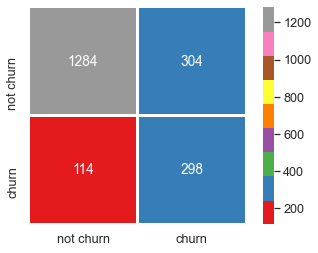

In [101]:
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
sns.heatmap(conf_matrix,annot=True,fmt = 'd',square = True,
 xticklabels=['not churn','churn'],
 yticklabels=['not churn','churn'],
 linewidths = 2,linecolor = 'w',cmap = 'Set1')
plt.subplots_adjust(wspace = .3,hspace = .3)

In [102]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.81      0.86      1588
           1       0.50      0.72      0.59       412

    accuracy                           0.79      2000
   macro avg       0.71      0.77      0.72      2000
weighted avg       0.83      0.79      0.80      2000

